# Mouse Trajectory & Click Predictions using Recurrent neural Networks

In [2]:
#importing libraries
import itertools
from itertools import tee #to make a copy of the generator object
import pickle

import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

#Visual Analysis
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import math
from sklearn.preprocessing import MinMaxScaler #Scaling the features
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.model_selection import GridSearchCV #hyperparameter tuning
from sklearn.model_selection import train_test_split
import IPython

import cv2 #real-time predictions
import numpy as np #linear algebra

#Neural Networks implementation
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.wrappers.scikit_learn import KerasRegressor
from keras.optimizers import Adam
from keras.utils.vis_utils import plot_model
from keras.layers import LeakyReLU
from keras.layers import SimpleRNN
import keras.backend as k

import time

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
#used in kaggle to retrieve the documents available to use
import os
print(os.listdir("../input/mouse-logs-csv"))

['mouse_logs_1.csv', 'mouse_logs_14.csv', 'mouse_logs_13.csv', 'mouse_logs_8.csv', 'mouse_logs_15.csv', 'mouse_logs_6.csv', 'mouse_logs_7.csv', 'mouse_logs_11.csv', 'mouse_logs_9.csv', 'mouse_logs_5.csv', 'mouse_logs_3.csv', 'mouse_logs_4.csv', 'mouse_logs_10.csv', 'mouse_logs_12.csv', 'mouse_logs_2.csv']


# Dataset-1

# Data Pre-processing and Analysis

In [ ]:
#Reading all text data files into csv files
for i in range(1,16):
    log_file= 'mouse_logs_' + str(i) + '.txt'
    csv_file= 'mouse_logs_' +str(i) + '.csv'
    
    with open(log_file, 'r') as in_file:
        stripped= (line.strip() for line in in_file)
        split1= (line.split("(") for line in stripped)
        split1_gen1, split1_gen2 = tee(split1)

        split2= [line[1].split(",") for line in split1_gen1] #split2[0] has the x-coordinate
        split2_gen1, split2_gen2 = tee(split2)

        split3= (line[1].split(")") for line in split2_gen1)
        split4= [line[0].split(" ") for line in split3] #split4[1] has the y-coordinate
        split5= [line[0].split(" ") for line in split1_gen2] #split5[0] has date, [1] has timestamp with ms, [2] has Action

        with open(csv_file, 'w') as out_file:
            out_file.write('Date,Time_with_ms,Action,X_Coord,Y_Coord\n')
            for i in range(0, len(split2)):
                out_file.write(split5[i][0]+','+'"'+split5[i][1]+'"'+','+split5[i][2]+','+split2[i][0]+','+split4[i][1]+'\n')
            out_file.close()

    in_file.close()

In [3]:
#Reading each csv file into corresponding dataframes
for i in range(1,16):
    exec("{} = pd.read_csv('../input/mouse-logs-csv/mouse_logs_' + str(i) + '.csv')".format('dataframe_'+ str(i)))

In [4]:
#list of all the dataframes containing the data
df_list=[dataframe_1,dataframe_2,dataframe_3,dataframe_4,dataframe_5,dataframe_6,dataframe_7,dataframe_8,dataframe_9,dataframe_10,dataframe_11,dataframe_12,dataframe_13,dataframe_14,dataframe_15]

for i in df_list:
    print(len(i))
    print(i.head(n=5))

7785
         Date  Time_with_ms   ...    X_Coord  Y_Coord
0  2019-04-25  22:57:31,731   ...        523      663
1  2019-04-25  22:57:32,194   ...        521      661
2  2019-04-25  22:57:32,204   ...        517      657
3  2019-04-25  22:57:32,214   ...        508      647
4  2019-04-25  22:57:32,223   ...        488      630

[5 rows x 5 columns]
7294
         Date  Time_with_ms          Action  X_Coord  Y_Coord
0  2019-04-26  13:21:01,718  Mouse_moved_to      454      386
1  2019-04-26  13:21:01,728  Mouse_moved_to      441      400
2  2019-04-26  13:21:01,738  Mouse_moved_to      428      417
3  2019-04-26  13:21:01,748  Mouse_moved_to      413      429
4  2019-04-26  13:21:01,758  Mouse_moved_to      395      442
69669
         Date  Time_with_ms          Action  X_Coord  Y_Coord
0  2019-04-27  14:20:50,677  Mouse_moved_to      433      651
1  2019-04-27  14:20:50,691  Mouse_moved_to      432      651
2  2019-04-27  14:20:50,691  Mouse_moved_to      427      654
3  2019-04-27  14:

In [5]:
#checking for null values
count=1
for i in df_list:
    print(count)
    print(i.isnull().sum())
    count+=1

1
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
2
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
3
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
4
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
5
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
6
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
7
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
8
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
9
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
10
Date            0
Time_with_ms    0
Action          

Hence, there are no Null/ missing values in the dataset.

In [6]:
#Extracting only 3 columns (Action, X_Coord and Y_Coord)
j=1
for dataframe in df_list:
    exec("{} = dataframe[['Action', 'X_Coord', 'Y_Coord']]".format('subset_df_'+ str(j)))
    j+=1

In [7]:
#list of all dataframes containing only the required features for the entire dataset
subset_list= [subset_df_1,subset_df_2,subset_df_3,subset_df_4,subset_df_5,subset_df_6,subset_df_7,subset_df_8,subset_df_9,subset_df_10,subset_df_11,subset_df_12,subset_df_13,subset_df_14,subset_df_15]

for subset_df in subset_list:
    print(len(subset_df))
    print(subset_df.head())

7785
                              Action  X_Coord  Y_Coord
0  Mouse_clicked_with_Button.left_at      523      663
1                     Mouse_moved_to      521      661
2                     Mouse_moved_to      517      657
3                     Mouse_moved_to      508      647
4                     Mouse_moved_to      488      630
7294
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      454      386
1  Mouse_moved_to      441      400
2  Mouse_moved_to      428      417
3  Mouse_moved_to      413      429
4  Mouse_moved_to      395      442
69669
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      433      651
1  Mouse_moved_to      432      651
2  Mouse_moved_to      427      654
3  Mouse_moved_to      426      656
4  Mouse_moved_to      425      656
24734
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      477      392
1  Mouse_moved_to      476      393
2  Mouse_moved_to      473      396
3  Mouse_moved_to      470      400
4  Mouse_moved_to      463      408


In [8]:
#Selecting only rows corresponding to the scrolled coordinates
j=1
for subset_df in subset_list:
    exec("{} = subset_df.loc[subset_df['Action'] == 'Mouse_scrolled_at']".format('scrolled_df_'+ str(j)))
    j+=1

scrolled_list= [scrolled_df_1,scrolled_df_2,scrolled_df_3,scrolled_df_4,scrolled_df_5,scrolled_df_6,scrolled_df_7,scrolled_df_8,scrolled_df_9,scrolled_df_10,scrolled_df_11,scrolled_df_12,scrolled_df_13,scrolled_df_14,scrolled_df_15]

for scrolled_df in scrolled_list:
    print(len(scrolled_df))
    print(scrolled_df.head())

0
Empty DataFrame
Columns: [Action, X_Coord, Y_Coord]
Index: []
0
Empty DataFrame
Columns: [Action, X_Coord, Y_Coord]
Index: []
1687
                Action  X_Coord  Y_Coord
426  Mouse_scrolled_at      805      459
427  Mouse_scrolled_at      805      459
428  Mouse_scrolled_at      805      459
429  Mouse_scrolled_at      805      459
430  Mouse_scrolled_at      805      459
895
                Action  X_Coord  Y_Coord
133  Mouse_scrolled_at      985      466
134  Mouse_scrolled_at      985      466
135  Mouse_scrolled_at      985      466
136  Mouse_scrolled_at      985      466
137  Mouse_scrolled_at      985      466
0
Empty DataFrame
Columns: [Action, X_Coord, Y_Coord]
Index: []
30
                Action  X_Coord  Y_Coord
617  Mouse_scrolled_at       57      475
618  Mouse_scrolled_at       57      475
619  Mouse_scrolled_at       57      475
620  Mouse_scrolled_at       57      475
621  Mouse_scrolled_at       57      475
2928
                Action  X_Coord  Y_Coord
253  Mouse_s

Considering the rows of dataframes above, it can be seen that the scroll movements remain constant. The reason being that when the cursor is scrolled, the position of the cursor remains constant. Thus, the scroll movements donot give any useful information.

This can be also be checked by counting the adjacent duplicates during the scroll movements below:

In [9]:
#Getting the number of adjacent duplicates in the scrolled dataframes
j=0
for scrolled_df in scrolled_list:
    j+=1
    if(len(scrolled_df)>0):
        xy_list=[]
        xy_list=scrolled_df.values.tolist()

        duplicates=0
        for i in range(0,len(xy_list)-1):
            if(xy_list[i]==xy_list[i+1]):
                duplicates+=1
            else:
                continue
        print(j)
        print('Total scrolled movements: ', len(xy_list))
        print('Number of adjacent duplicates: ', duplicates, '\n')
    else:
        print(j)
        print('Length of Dataframe: ', len(scrolled_df), '\n')
        continue

1
Length of Dataframe:  0 

2
Length of Dataframe:  0 

3
Total scrolled movements:  1687
Number of adjacent duplicates:  1124 

4
Total scrolled movements:  895
Number of adjacent duplicates:  640 

5
Length of Dataframe:  0 

6
Total scrolled movements:  30
Number of adjacent duplicates:  29 

7
Total scrolled movements:  2928
Number of adjacent duplicates:  2892 

8
Total scrolled movements:  530
Number of adjacent duplicates:  516 

9
Total scrolled movements:  4279
Number of adjacent duplicates:  4201 

10
Total scrolled movements:  1326
Number of adjacent duplicates:  1299 

11
Total scrolled movements:  950
Number of adjacent duplicates:  918 

12
Total scrolled movements:  2546
Number of adjacent duplicates:  2512 

13
Total scrolled movements:  7827
Number of adjacent duplicates:  7712 

14
Total scrolled movements:  1656
Number of adjacent duplicates:  1631 

15
Total scrolled movements:  369
Number of adjacent duplicates:  356 



This large number of adjacent duplicates imply that the scroll movement coordinates only differ when the cursor is scrolled at different time, else the coordinates remain the same. Thus, these can be removed from the dataset.

In [10]:
#deleting scroll movements from the subset dataframes

j=1
for i in range(0,15):
    exec("{} = subset_list[i].drop(scrolled_list[i].index, axis=0)".format('processed_df_'+ str(j)))
    j+=1

processed_list= [processed_df_1,processed_df_2,processed_df_3,processed_df_4,processed_df_5,processed_df_6,processed_df_7,processed_df_8,processed_df_9,processed_df_10,processed_df_11,processed_df_12,processed_df_13,processed_df_14,processed_df_15]

for processed_df in processed_list:
    print(len(processed_df))
    print(processed_df.head())

7785
                              Action  X_Coord  Y_Coord
0  Mouse_clicked_with_Button.left_at      523      663
1                     Mouse_moved_to      521      661
2                     Mouse_moved_to      517      657
3                     Mouse_moved_to      508      647
4                     Mouse_moved_to      488      630
7294
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      454      386
1  Mouse_moved_to      441      400
2  Mouse_moved_to      428      417
3  Mouse_moved_to      413      429
4  Mouse_moved_to      395      442
67982
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      433      651
1  Mouse_moved_to      432      651
2  Mouse_moved_to      427      654
3  Mouse_moved_to      426      656
4  Mouse_moved_to      425      656
23839
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      477      392
1  Mouse_moved_to      476      393
2  Mouse_moved_to      473      396
3  Mouse_moved_to      470      400
4  Mouse_moved_to      463      408


In [11]:
#Count of samples per Action
j=0
for processed_df in processed_list:
    j+=1
    print(j)
    print(processed_df.groupby(['Action']).count()['X_Coord'])
    print('\n')

1
Action
Mouse_clicked_with_Button.left_at      89
Mouse_moved_to                       7696
Name: X_Coord, dtype: int64


2
Action
Mouse_clicked_with_Button.left_at     148
Mouse_moved_to                       7146
Name: X_Coord, dtype: int64


3
Action
Mouse_clicked_with_Button.left_at       970
Mouse_clicked_with_Button.right_at       48
Mouse_moved_to                        66964
Name: X_Coord, dtype: int64


4
Action
Mouse_clicked_with_Button.left_at        278
Mouse_clicked_with_Button.middle_at        2
Mouse_clicked_with_Button.right_at        22
Mouse_moved_to                         23537
Name: X_Coord, dtype: int64


5
Action
Mouse_clicked_with_Button.left_at       538
Mouse_clicked_with_Button.right_at       56
Mouse_moved_to                        14586
Name: X_Coord, dtype: int64


6
Action
Mouse_clicked_with_Button.left_at     190
Mouse_moved_to                       8117
Name: X_Coord, dtype: int64


7
Action
Mouse_clicked_with_Button.left_at       32
Mouse_clicked_with

As seen, None of the dataframes have any scroll movements now.

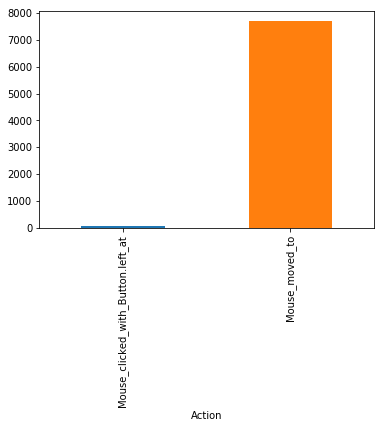

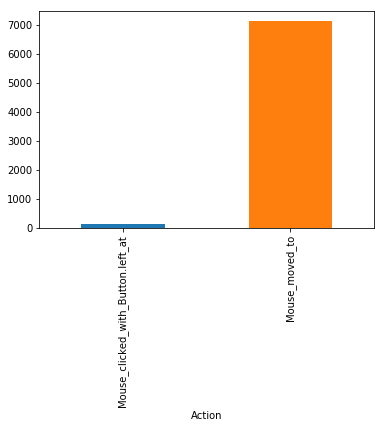

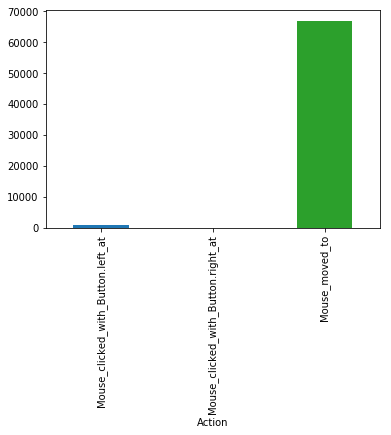

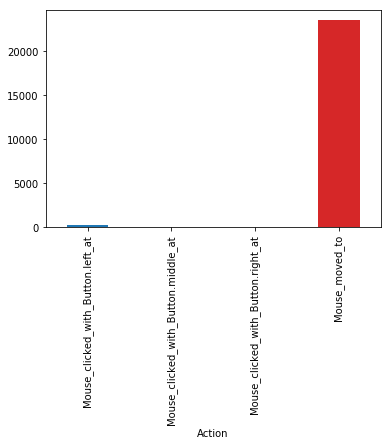

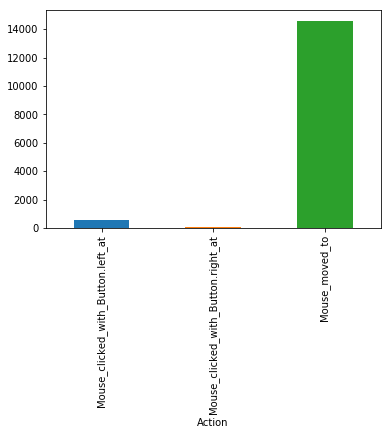

...

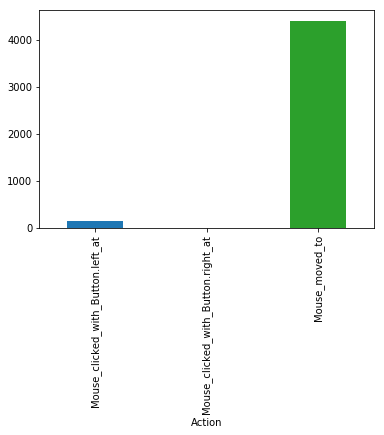

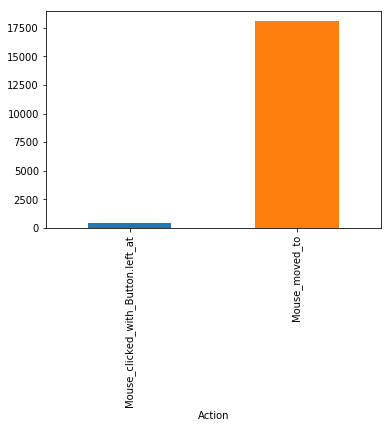

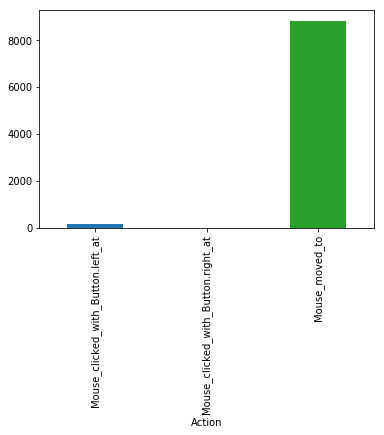

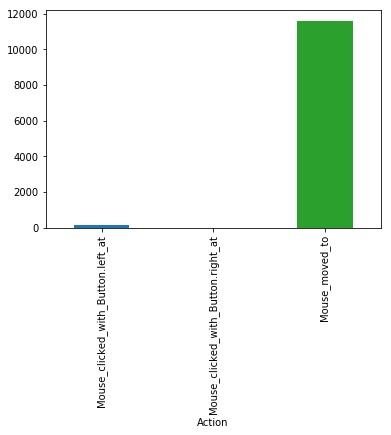

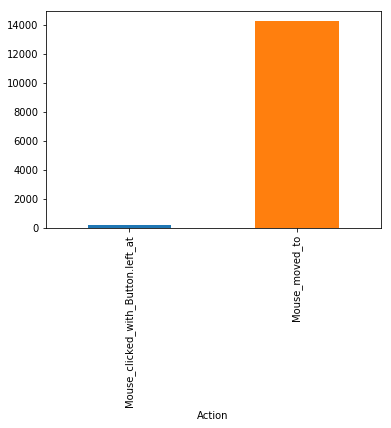

In [12]:
#visualizing the Action feature
for processed_df in processed_list:
    processed_df.groupby(['Action']).count()['X_Coord'].plot(kind='bar')
    plt.show()

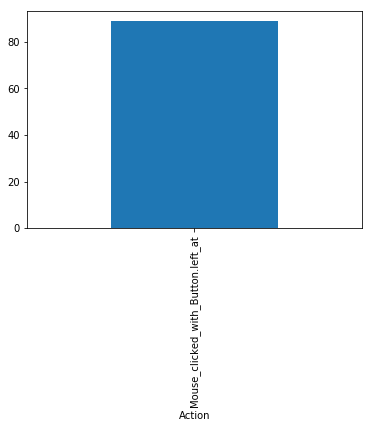

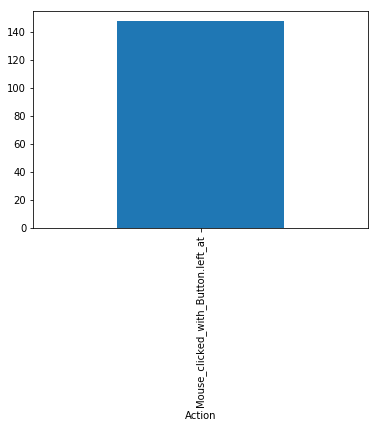

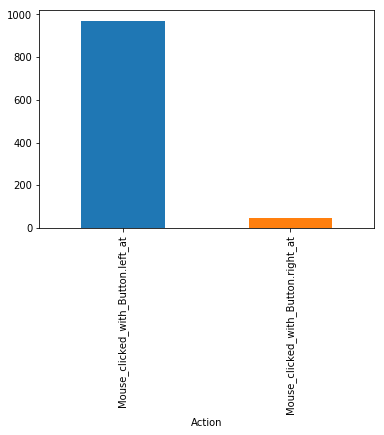

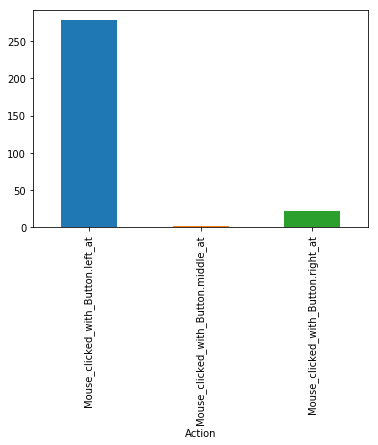

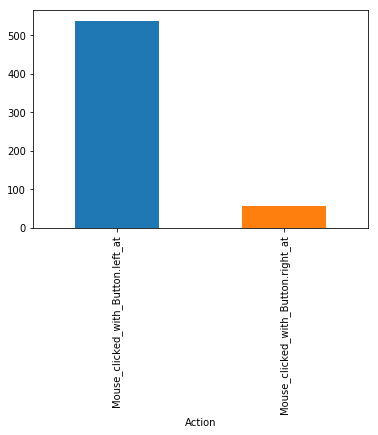

...

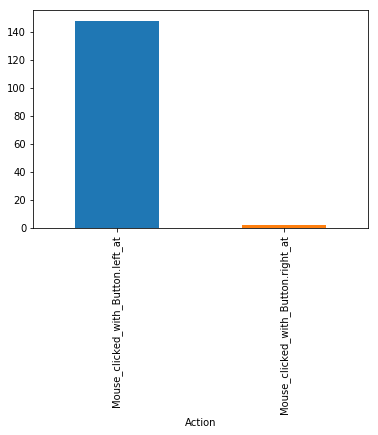

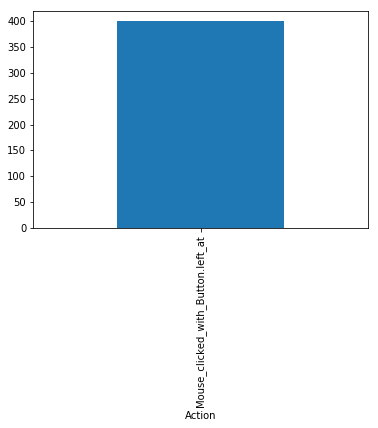

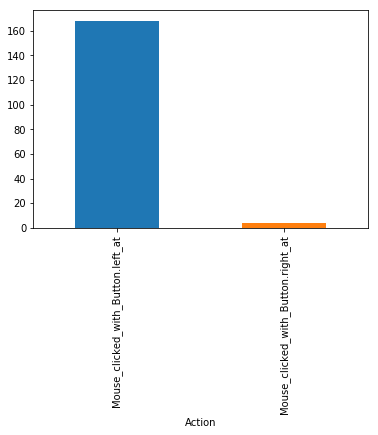

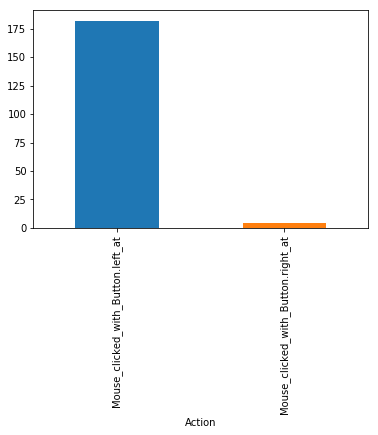

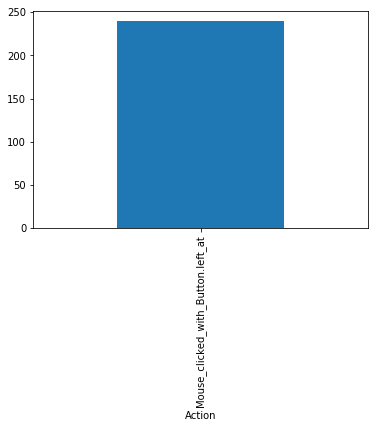

In [13]:
#Selecting only rows corresponding to the click coordinates

for processed_df in processed_list:
    click_df= processed_df.loc[(processed_df['Action'] == 'Mouse_clicked_with_Button.left_at') | (processed_df['Action'] == 'Mouse_clicked_with_Button.right_at') | (processed_df['Action'] == 'Mouse_clicked_with_Button.middle_at')]
    click_df.groupby(['Action']).count()['X_Coord'].plot(kind='bar')
    plt.show()

The results observed above are very obvious that the maximum samples in all dataframes consist of mouse movements followed by left clicks which are very less in comparison, further followed by very less right clicks and, only 2 middle clicks in one dataframe number 4.

Many dataframes don't include right clicks and, none except one include middle clicks.

Now let's see the number of adjacent duplicates in the remaining dataset and get rid of them.

In [14]:
#deleting the adjacent duplicates
for i in range(0,15):
    xy_list=[]
    
    if(i!=0):
        if((processed_list[i]['X_Coord'].max())>x_max):
            x_max=processed_list[i]['X_Coord'].max()
        if((processed_list[i]['Y_Coord'].max())>y_max):
            y_max= processed_list[i]['Y_Coord'].max()
    else:
        x_max= processed_list[i]['X_Coord'].max()
        y_max= processed_list[i]['Y_Coord'].max()

    xy_list= processed_list[i].values.tolist()

    duplicates=0
    for k in range(0,len(xy_list)-1):
        if(xy_list[k]==xy_list[k+1]):
            duplicates+=1
        else:
            continue
    print(i+1)
    print('Before Deletion of adjacent duplicates')
    print('--------------------------------------')
    print('Total movements: ', len(xy_list))
    print('Number of adjacent duplicates: ', duplicates,'\n')
    
    #Deleting the adjacent duplicates
    xy_list= [k for k, g in itertools.groupby(xy_list)]
    exec("{} = xy_list".format('data_list_'+ str(i+1)))
    
    duplicates=0
    for j in range(0,len(xy_list)-1):
        if(xy_list[j]==xy_list[j+1]):
            duplicates+=1
        else:
            continue
    print('After Deletion of adjacent duplicates')
    print('--------------------------------------')
    print('Total movements: ', len(xy_list))
    print('Number of adjacent duplicates: ', duplicates)
    
print('x_max: ', x_max)
print('y_max: ', y_max)

1
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  7785
Number of adjacent duplicates:  589 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  7196
Number of adjacent duplicates:  0
2
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  7294
Number of adjacent duplicates:  104 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  7190
Number of adjacent duplicates:  0
3
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  67982
Number of adjacent duplicates:  1867 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  66115
Number of adjacent duplicates:  0
4
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  23839
Number of adjacent duplicates:  665 

After Deletion of adjacent dup

In [15]:
#drop the Action feature from the dataset and create the final list with only x and y coordinates.
data_list=[data_list_1,data_list_2,data_list_3,data_list_4,data_list_5,data_list_6,data_list_7,data_list_8,data_list_9,data_list_10,data_list_11,data_list_12,data_list_13,data_list_14,data_list_15]

for i in range(len(data_list)):
    df=pd.DataFrame(data_list[i])
    x=df.drop([0], axis=1)
    x=x.values.tolist()
    exec("{} = x".format('final_data_'+ str(i+1)))

In [16]:
#final list that contain 15 lists of final data of x and y coordinates
final_list=[final_data_1, final_data_2, final_data_3, final_data_4, final_data_5, final_data_6, final_data_7, final_data_8, final_data_9, final_data_10, final_data_11, final_data_12, final_data_13, final_data_14, final_data_15]
for i in final_list:
    print(len(i))

7196
7190
66115
23174
14482
7629
7346
6489
12493
14177
4179
16615
8170
10522
12646


In [17]:
#Normalize or rescale the dataset to be in the range (0,1)

scaler = MinMaxScaler(feature_range=(0, 1))

for i in range(0,15):
    exec("{} = scaler.fit_transform(final_list[i])".format('norm_data_'+ str(i+1)))

norm_list= [norm_data_1,norm_data_2,norm_data_3,norm_data_4,norm_data_5,norm_data_6,norm_data_7,norm_data_8,norm_data_9,norm_data_10,norm_data_11,norm_data_12,norm_data_13,norm_data_14,norm_data_15]
for i in range(0,15):
    print(i+1)
    print(type(norm_list[i]))
    print(norm_list[i][0:5])


1
<class 'numpy.ndarray'>
[[0.38742236 0.85807292]
 [0.38586957 0.85546875]
 [0.38276398 0.85026042]
 [0.3757764  0.83723958]
 [0.36024845 0.81510417]]
2
<class 'numpy.ndarray'>
[[0.33826638 0.51392405]
 [0.329105   0.53164557]
 [0.31994362 0.55316456]
 [0.3093728  0.56835443]
 [0.29668781 0.58481013]]
3
<class 'numpy.ndarray'>
[[0.37189646 0.57761492]
 [0.3713682  0.57761492]
 [0.36872689 0.57961359]
 [0.36819863 0.58094604]
 [0.36767036 0.58094604]]
4
<class 'numpy.ndarray'>
[[0.39430086 0.47186933]
 [0.39363817 0.47277677]
 [0.3916501  0.47549909]
 [0.38966203 0.47912886]
 [0.38502319 0.48638838]]
5
<class 'numpy.ndarray'>
[[0.45139557 0.42023346]
 [0.45283927 0.41789883]
 [0.4547642  0.41634241]
 [0.45861405 0.41400778]
 [0.46198268 0.41322957]]
6
<class 'numpy.ndarray'>
[[0.40409401 0.8238342 ]
 [0.40181956 0.82512953]
 [0.39727066 0.82901554]
 [0.39044731 0.83678756]
 [0.38438211 0.84326425]]
7
<class 'numpy.ndarray'>
[[0.39296407 0.48418491]
 [0.40643713 0.48418491]
 [0.41017964

# Supervised Learning Dataset-1

In [18]:
#Considering random 18 consecutive coordinates for the input sequence
import math

input_data=[]
output_data=[]
timesteps= 18

for norm_data in norm_list:
    j=1
    norm_data= norm_data.tolist()
    n= len(norm_data)-timesteps
    iterations= int(math.ceil((len(norm_data)/timesteps) / 100.0)) * 100
    
    while(j<=iterations):
            i = np.random.randint(0,n) #random values between 0 (low value(inclusive)) and n (high value(inclusive))
            try:
                input_data.append(norm_data[i:i+timesteps])
                output_data.append(norm_data[i+timesteps])
                j+=1
            except:
                pass
print(len(input_data))
print(len(output_data))
print('Input: ',input_data[0:5],'\n')
print('Output: ',output_data[0:5])

12800
12800
Input:  [[[0.4914596273291925, 0.6471354166666666], [0.4945652173913044, 0.6484374999999999], [0.49611801242236025, 0.6497395833333333], [0.49844720496894407, 0.6510416666666666], [0.49999999999999994, 0.6523437499999999], [0.5015527950310559, 0.6536458333333333], [0.5038819875776397, 0.6549479166666666], [0.5062111801242235, 0.6562499999999999], [0.5077639751552794, 0.6588541666666666], [0.5093167701863354, 0.6601562499999999], [0.5100931677018633, 0.6601562499999999], [0.5116459627329192, 0.6614583333333333], [0.513198757763975, 0.6627604166666666], [0.513975155279503, 0.6627604166666666], [0.5147515527950309, 0.6640624999999999], [0.515527950310559, 0.6653645833333333], [0.5170807453416149, 0.6653645833333333], [0.5170807453416149, 0.6666666666666666]], [[0.10015527950310557, 0.5703124999999999], [0.09472049689440992, 0.5677083333333333], [0.08928571428571427, 0.5638020833333333], [0.08695652173913043, 0.5611979166666666], [0.08385093167701863, 0.5572916666666666], [0.08

In [19]:
Input= np.array(input_data)
Output= np.array(output_data)

print('Input: ', Input,'\n')
print('-------------------------------------------------------------------------------------------------------------------\n')
print('Output: ', Output)

Input:  [[[0.49145963 0.64713542]
  [0.49456522 0.6484375 ]
  [0.49611801 0.64973958]
  ...
  [0.51552795 0.66536458]
  [0.51708075 0.66536458]
  [0.51708075 0.66666667]]

 [[0.10015528 0.5703125 ]
  [0.0947205  0.56770833]
  [0.08928571 0.56380208]
  ...
  [0.06754658 0.55338542]
  [0.06599379 0.55338542]
  [0.06444099 0.55338542]]

 [[0.4378882  0.38411458]
  [0.42779503 0.38411458]
  [0.41847826 0.38411458]
  ...
  [0.35559006 0.38802083]
  [0.34937888 0.38802083]
  [0.3423913  0.38802083]]

 ...

 [[0.47942238 0.80173482]
  [0.47942238 0.80421314]
  [0.47942238 0.80793061]
  ...
  [0.47870036 0.81784387]
  [0.47870036 0.81660471]
  [0.47870036 0.81536555]]

 [[0.80216606 0.21685254]
  [0.80361011 0.21437423]
  [0.80433213 0.21189591]
  ...
  [0.81805054 0.18587361]
  [0.81949458 0.18463445]
  [0.82021661 0.18215613]]

 [[0.47509025 0.67657993]
  [0.47725632 0.67657993]
  [0.48086643 0.67657993]
  ...
  [0.56173285 0.66294919]
  [0.5631769  0.66294919]
  [0.56389892 0.66171004]]] 



In [20]:
print(Input.shape[0])
print(Input.shape[1])

12800
18


In [21]:
#Reshape the input data
Input_reshaped = np.reshape(Input,(Input.shape[0],Input.shape[1],2))
print(Input_reshaped)

[[[0.49145963 0.64713542]
  [0.49456522 0.6484375 ]
  [0.49611801 0.64973958]
  ...
  [0.51552795 0.66536458]
  [0.51708075 0.66536458]
  [0.51708075 0.66666667]]

 [[0.10015528 0.5703125 ]
  [0.0947205  0.56770833]
  [0.08928571 0.56380208]
  ...
  [0.06754658 0.55338542]
  [0.06599379 0.55338542]
  [0.06444099 0.55338542]]

 [[0.4378882  0.38411458]
  [0.42779503 0.38411458]
  [0.41847826 0.38411458]
  ...
  [0.35559006 0.38802083]
  [0.34937888 0.38802083]
  [0.3423913  0.38802083]]

 ...

 [[0.47942238 0.80173482]
  [0.47942238 0.80421314]
  [0.47942238 0.80793061]
  ...
  [0.47870036 0.81784387]
  [0.47870036 0.81660471]
  [0.47870036 0.81536555]]

 [[0.80216606 0.21685254]
  [0.80361011 0.21437423]
  [0.80433213 0.21189591]
  ...
  [0.81805054 0.18587361]
  [0.81949458 0.18463445]
  [0.82021661 0.18215613]]

 [[0.47509025 0.67657993]
  [0.47725632 0.67657993]
  [0.48086643 0.67657993]
  ...
  [0.56173285 0.66294919]
  [0.5631769  0.66294919]
  [0.56389892 0.66171004]]]


In [22]:
#RNN takes 3D input in the form of (samples, timesteps, features)
print(Input_reshaped.shape)

(12800, 18, 2)


In [23]:
#split the dataset into train, validation and test datasets
X_trainval,X_test,Y_trainval,Y_test= train_test_split(Input_reshaped,Output,test_size=0.2,random_state=0)
X_train,X_val,Y_train,Y_val= train_test_split(X_trainval,Y_trainval,test_size=0.25,random_state=0)

print('Length of Train: ', len(X_train), len(Y_train))
print('Length of Validation: ', len(X_val), len(Y_val))
print('Length of Test: ', len(X_test), len(Y_test))

Length of Train:  7680 7680
Length of Validation:  2560 2560
Length of Test:  2560 2560


In [24]:
print('X_train: ', X_train.shape)
print('Y_train: ', Y_train.shape)
print('X_val: ', X_val.shape)
print('Y_val: ', Y_val.shape)
print('X_test: ', X_test.shape)
print('Y_test: ', Y_test.shape)

X_train:  (7680, 18, 2)
Y_train:  (7680, 2)
X_val:  (2560, 18, 2)
Y_val:  (2560, 2)
X_test:  (2560, 18, 2)
Y_test:  (2560, 2)


# SimpleRNN

In [25]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#SimpleRNN with m/m between batches
def stateful_SimpleRNN(units, lr, batch, alpha):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=False, batch_input_shape=(batch, timesteps, 2), stateful=True))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    model.summary()
    return model

## Hyperparameter Tuning

In [ ]:
#hyperparameter tuning for number of units, learn rate, batch size and alpha(leaky relu)
def experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch, a):
    X_error_scores = []
    Y_error_scores = []
    
    # fit the model
    model = stateful_SimpleRNN(units=n, lr=lr, batch=batch, alpha=a)
    for i in range(300):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_Pred = model.predict(X_test, batch_size=batch)
    model.reset_states()
    
    Y_Pred = scaler.inverse_transform(Y_Pred)
    Y_test = scaler.inverse_transform(Y_test)
    # report performance
    Xcoord_pred=[]
    Xcoord_true=[]
    Ycoord_pred=[]
    Ycoord_true=[]
    for i in range(0,len(Y_Pred)):
        Xcoord_pred.append(Y_Pred[i][0])
        Ycoord_pred.append(Y_Pred[i][1])
    for i in range(0,len(Y_test)):   
        Xcoord_true.append(Y_test[i][0])
        Ycoord_true.append(Y_test[i][1])
    X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
    Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))
    print('Test XRMSE: ', str(X_RMSE))
    print('Test YRMSE: ', str(Y_RMSE))
    X_error_scores.append(X_RMSE)
    Y_error_scores.append(Y_RMSE)
    return X_error_scores, Y_error_scores

start = time.time()
count = 1
X_coord_results = pd.DataFrame()
Y_coord_results = pd.DataFrame()
model_df= pd.DataFrame()
# hyperparameters
neurons = [20,30,40,50]
learn_rate= [0.001,0.01]
batch_size= [128,256,320,512,640]
alpha=[0.01,0.05]
for n in neurons:
    for lr in learn_rate:
        for batch in batch_size:
            for a in alpha:
                print('Units: ',n,', Learn rate: ',lr,', Batch Size: ',batch,', Alpha: ',a)
                print('Model Number: ', count)
                model_df[str(count)]= [str(n)+','+str(lr)+','+str(batch)+','+str(a)]
                X_coord_results[str(count)], Y_coord_results[str(count)]  = experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch, a)
                count+=1
# summarize results
print(X_coord_results.head())
print(Y_coord_results.head())
end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))
print('Completed')

The parameter tunining results show that the best performance is achieved by 30 units, 0.001 learning rate, 128 batch size and 0.05 alpha.

In [ ]:
#function to test overfitting or underfitting of the model at each epoch
def evaluate(model, X_train, Y_train, X_test, Y_test, batch_size):
    Y_pred_train=model.predict(X_train, batch_size=batch_size)
    model.reset_states()
    
    Y_pred_test = model.predict(X_test, batch_size=batch_size)
    model.reset_states()
    
    train_XRMSE, train_YRMSE= calculate_RMSE(Y_pred_train, Y_train)
    test_XRMSE, test_YRMSE= calculate_RMSE(Y_pred_test, Y_test)
    return train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE

def fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch_size):
    start = time.time()
    Xtrain_score=[]
    Ytrain_score=[]
    Xtest_score=[]
    Ytest_score=[]
    for i in range(500):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
        #evaluate model on train & test set
        train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE= evaluate(model, X_train, Y_train, X_test, Y_test, batch_size)
        Xtrain_score.append(train_XRMSE)
        Ytrain_score.append(train_YRMSE)
        Xtest_score.append(test_XRMSE)
        Ytest_score.append(test_YRMSE)
    print('Xtrain_RMSE: ', Xtrain_score)
    print('Ytrain_RMSE: ', Ytrain_score)
    print('Xtest_RMSE: ', Xtest_score)
    print('Ytest_RMSE: ', Ytest_score)
    history = pd.DataFrame()
    history['train_X'], history['train_Y'], history['test_X'], history['test_Y'] = Xtrain_score, Ytrain_score, Xtest_score, Ytest_score 
    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    return history
    
def show_plot(fig):
    fig.show()

def run(repeats, units, learn_rate, batch, alpha, X_train, Y_train, X_val, Y_val, X_test, Y_test):
    fig1, ax1 = plt.subplots()
    fig2, ax2 = plt.subplots()
    
    for i in range (repeats):
        print('Experimental Run: ', i+1)
        model= stateful_SimpleRNN(units=units, lr=learn_rate, batch=batch, alpha=alpha)
        history= fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch)
        
        ax1.plot(history['train_X'],color='blue', label='X RMSE Train' if i == 0 else "")
        ax1.plot(history['test_X'], color='orange', label= 'X RMSE Test' if i == 0 else "")
    
        ax2.plot(history['train_Y'], color='blue', label= 'Y RMSE Train' if i == 0 else "")
        ax2.plot(history['test_Y'], color='orange', label= 'Y RMSE Test' if i == 0 else "")

    ax1.legend(loc='best')
    ax2.legend(loc='best')

    fig1.savefig('X_RMSE.png')
    fig2.savefig('Y_RMSE.png')
    
    show_plot(fig1)
    show_plot(fig2)
    print('Completed')

run(repeats=5, units=30, learn_rate=0.001, batch=128, alpha=0.05, X_train=X_train, Y_train=Y_train, X_val=X_val, Y_val=Y_val, X_test=X_test, Y_test=Y_test)

The results for this block are shown below as it was trained in Kaggle and the results shown below were saved:

In [ ]:
'''30 units. 500 epochs results of RMSE at each epoch for 5 iterations. Both test and Train datasets decrease continuously.'''
# Xtrain_RMSE:  [60.02021204699332, 40.18693856213281, 33.94710462338607, 29.614787957995368, 26.88838073453121, 24.95665072776, 23.605075450507638, 22.448445426582836, 21.49333913887825, 20.668111825259015, 19.89684769335716, 19.167578263524508, 18.57832734867523, 18.086745740901172, 17.629726489842927, 17.260017961238205, 16.936083248895702, 16.546293360479364, 16.201074415783793, 15.914712831612697, 15.512118837263532, 14.886951155387214, 14.217084996184058, 13.682635990600996, 13.31321301150101, 13.09874358385798, 13.017558168171169, 12.995163112420716, 12.911811058057879, 12.713899676208664, 12.449299468714338, 12.218392182209643, 12.101276065773016, 12.128096097488129, 12.281930287600089, 12.518878449175181, 12.768865134858675, 12.976116807851263, 13.08704240794197, 13.069162225094619, 12.928875389949928, 12.707207465491358, 12.505173171130076, 12.27697201460657, 12.052106310292112, 11.825859026880124, 11.576022282047418, 11.265277929389098, 10.86841170045195, 10.40474052304037, 9.92550963549103, 9.470029626091419, 9.060016231767891, 8.70413101035748, 8.407029186231041, 8.167914865932323, 7.9791238667772415, 7.8302892776458695, 7.71327322477655, 7.623435608804186, 7.560528837186764, 7.5242541081823475, 7.52809668803624, 7.571222926065395, 7.638367364038086, 7.689925259142378, 7.675906239560649, 7.567524374245759, 7.388195436880892, 7.20636663010229, 7.092556811953846, 7.073766762628194, 7.140061032369997, 7.260412910661768, 7.382046832822225, 7.475481298832748, 7.590108923155673, 7.782155094107594, 8.031792057235112, 8.228091221957163, 8.259068354665779, 8.104082148295774, 7.812693887522044, 7.468995382019873, 7.212153823655224, 6.999440350648895, 6.878741414999982, 6.823222145515733, 6.810029246218269, 6.825669119202395, 6.864055936717668, 6.921577965132698, 6.994780722690681, 7.078140299330308, 7.164042339479186, 7.243990466735882, 7.311503782645587, 7.361251471623997, 7.395194383034036, 7.4082506093796425, 7.40088150232408, 7.372413407322335, 7.318553686692038, 7.230490377188504, 7.093909539044706, 6.892453647714577, 6.622995873671422, 6.322378032114575, 6.05981317868975, 5.939705117868442, 5.966030178852807, 6.083120277370103, 6.219077631022663, 6.3227302017769205, 6.37262689301804, 6.367422746674309, 6.318631906388108, 6.245406417955654, 6.1667390800751125, 6.095908012198713, 6.036104035876803, 5.983316791072423, 5.93275952673083, 5.8810699731961495, 5.8260405707412, 5.765628254248759, 5.695962661794879, 5.613898481271289, 5.5181948713431614, 5.415186419854558, 5.31496102987727, 5.224716417353277, 5.155394137092722, 5.098096768285242, 5.043696340192659, 4.984526880082239, 4.915252597269049, 4.839325035695608, 4.77009556100045, 4.721028063149965, 4.695243117076312, 4.686458003889919, 4.683124196002089, 4.675060399886062, 4.656009340767691, 4.625081688659535, 4.585802928991301, 4.544169612486096, 4.504843685768189, 4.469798297672938, 4.437764403513865, 4.406489641220932, 4.373700480249153, 4.337719278765688, 4.298117754600039, 4.2552255825549645, 4.20866344424709, 4.15870357976448, 4.1072503482556755, 4.054626897634982, 4.0038738020338105, 3.961530418155837, 3.9340739955970307, 3.9187288351874328, 3.9064891276202727, 3.8892712579290163, 3.873834045882132, 3.8610443195218007, 3.848899999751904, 3.835687027939617, 3.8212634759795927, 3.80703158130909, 3.7943284428974833, 3.7831012304018783, 3.772904440241838, 3.763965253597971, 3.757160370153755, 3.753368185857855, 3.75061041248686, 3.7397309994488994, 3.7242076655844065, 3.744444196899677, 3.772813788408894, 3.7814955929312344, 3.787100303806888, 3.7947247494613587, 3.7956215070008623, 3.7685332616988294, 3.695162745090175, 3.619498688345369, 3.5956184182246798, 3.5860915942639093, 3.5726868672545145, 3.5616216933000873, 3.5553273124429916, 3.5525775945517117, 3.5513158575182535, 3.549960512508647, 3.5478312317317804, 3.5446840802857302, 3.5406025200632696, 3.535792794007712, 3.530513465654765, 3.5248728840714514, 3.518932564746727, 3.512515310051977, 3.5050358758344218, 3.4945945956065185, 3.476338931166706, 3.4409850999371376, 3.3931471862906224, 3.371641060625744, 3.3648186577558112, 3.368468912230457, 3.376975610701003, 3.3851515652282664, 3.3902932596164677, 3.391702984573714, 3.389853890930385, 3.3854176328359964, 3.3791414236188304, 3.371558229513992, 3.3629989722677753, 3.3539619923415707, 3.3444078525079437, 3.334662640901002, 3.3247294187128382, 3.314833799259181, 3.3047664798748846, 3.294864908293143, 3.2849117646674735, 3.2749760874132696, 3.2649820664391545, 3.25474991875196, 3.2441240832801688, 3.2328034967516026, 3.220086846192961, 3.214112277771534, 3.2185439533708413, 3.2234846934930017, 3.2207446833661937, 3.2126297403932846, 3.2025844683469704, 3.1920396607834665, 3.1816777061119508, 3.1720777433644525, 3.1636971787508834, 3.156941845463493, 3.152310931842996, 3.150413303039085, 3.152044815701563, 3.158459695129396, 3.1708595491681755, 3.1903810923286575, 3.2157116538056805, 3.2400238830605077, 3.2522765670668194, 3.2392019912865093, 3.1766998326376132, 3.060425572719976, 2.9904542416783007, 2.9909827987669773, 2.9939245119067754, 3.0000421166181757, 3.007517441444061, 3.0099513855437547, 3.0094933494612004, 3.008859520894987, 3.0086655170617354, 3.009080448159729, 3.0100147575472085, 3.0114255341115763, 3.0133696808270796, 3.0156624752657417, 3.0184233873293596, 3.021648501638049, 3.0251725501491697, 3.029098135646397, 3.0333511963244892, 3.037867357528826, 3.042708248240645, 3.0477656776571154, 3.053110659105318, 3.0585759881464316, 3.0642757344406992, 3.0700418582285374, 3.075951013877738, 3.0818886305381112, 3.087831579401906, 3.0938409443882633, 3.09977615468394, 3.105675184269286, 3.1114429198999303, 3.1171171587618427, 3.122622994899744, 3.1280292869211728, 3.133237499068563, 3.138307046090518, 3.143101873237343, 3.1477371250802233, 3.152174087507382, 3.156323527059316, 3.160314793951198, 3.1641193902288007, 3.1676823251153503, 3.170939655294573, 3.1740492935209623, 3.1768829432151735, 3.1795866446198833, 3.181978966869381, 3.1841533901572894, 3.1861679160400103, 3.1879476578487687, 3.1895082595087847, 3.1907761615119767, 3.191946109796631, 3.1927981449367646, 3.1935259078720692, 3.193947985051926, 3.1942770151707807, 3.194250441535634, 3.1940780881367026, 3.193557326549606, 3.192908330117422, 3.191921728707233, 3.1907585440504826, 3.1892598080341554, 3.187468436843425, 3.1854418573312064, 3.1831403397007323, 3.180478653869555, 3.1775082694892727, 3.174224465460038, 3.1705114434335067, 3.1663892694781723, 3.1619391407404858, 3.1570231673339224, 3.1516339208579933, 3.1458175144387557, 3.1395068258718903, 3.132679843634159, 3.1253926880577447, 3.1177050027214452, 3.109628398376369, 3.1011912509123243, 3.09247354157189, 3.0835120661380158, 3.0745379938770974, 3.0655779909654037, 3.056732698043234, 3.0480865040666796, 3.0398882849356776, 3.0322601877344106, 3.025457320993162, 3.0199515492457856, 3.0166363642518887, 3.0165605571903895, 3.0228676793078253, 3.038059436451019, 3.0549535761661164, 3.0021088637929934, 2.8493046789248906, 2.8308166030662094, 2.8385680420713215, 2.843615067576459, 2.847358538097179, 2.8501964850862476, 2.8524563295384846, 2.8542721346441757, 2.8556917247009563, 2.8567933229339073, 2.8576528094410665, 2.8582940440956572, 2.858710701923796, 2.8589396327039793, 2.8589743423386857, 2.8588554471291556, 2.8585880437808124, 2.858162695981269, 2.857607689927233, 2.8569654284009327, 2.8562219246813974, 2.855507540501984, 2.85484353741391, 2.8543246028696307, 2.854095693372782, 2.8543007554127975, 2.855114396507105, 2.856737267286996, 2.859454399752258, 2.86358019838208, 2.869509887525946, 2.8777868743362967, 2.8891920690398996, 2.9048819577586054, 2.9265225231168044, 2.956924233016194, 3.0000383275666755, 3.0611964718347804, 3.140382072776263, 3.2043014273582595, 3.1439584331240638, 2.9659276266457466, 2.8794443805909276, 2.8651126033515704, 2.8744404220641226, 2.8939019754437236, 2.912408215491611, 2.9170352102115857, 2.905114863964424, 2.8896966192203473, 2.8812538534646417, 2.8796923211858183, 2.882294124039956, 2.887321536390428, 2.89387493485271, 2.9014541456122847, 2.909596381036864, 2.917792232259387, 2.925396222874405, 2.9299856302074816, 2.9328246142305865, 2.9310897932267586, 2.9243854496760826, 2.915097925355083, 2.907655045589798, 2.900826678496681, 2.8964280990468345, 2.8938481899337116, 2.892468735128726, 2.8918062677323637, 2.8914746152210555, 2.8913187899461006, 2.891198704801636, 2.891048276480412, 2.890825365780901, 2.8905117673812843, 2.8900580357640138, 2.889474975826316, 2.888729979009242, 2.887815225922244, 2.886721617372196, 2.8854460308716505, 2.8840383978021427, 2.882522993180641, 2.8809581210571853, 2.879375077685565, 2.8778559451025907, 2.8764384688990297, 2.875160581504746, 2.874020634463523, 2.8730181558196555, 2.8721782480525957, 2.871453580065582, 2.8708297513582175, 2.8702811784680224, 2.869790422837122, 2.8693349441646325, 2.8683008386066335, 2.86781744314591, 2.867811290191392, 2.8680105922729955, 2.8683349472198274, 2.8687107054416763, 2.8690733280890792, 2.869398491166752, 2.869678839140242, 2.869870668802911, 2.8699819982665344, 2.8699858271706096, 2.8699053709496343, 2.8697167093970517, 2.869444563924871, 2.869072499928309, 2.86862813523134, 2.8681110161609307, 2.8675411949599714, 2.8669278085094008, 2.866293257118024, 2.8656405552244895, 2.8649877239616193, 2.864328908075247, 2.863687010030984, 2.8630629794502687, 2.8624545321743433, 2.8618674319894586, 2.8613042661398747, 2.8607501301531832, 2.860212700976061, 2.859700150919894, 2.8591808762786695, 2.85868973128163, 2.85817624586389, 2.857680059618379, 2.8571779536045896, 2.8566816401678117, 2.856183569001979, 2.855678981572554, 2.8551805651501327, 2.854678224969534]
# Ytrain_RMSE:  [54.888957929602014, 31.2480710065472, 23.951977591924702, 19.579625699776848, 17.07032439269228, 15.71622034778845, 14.584721128790093, 13.599837555645337, 12.770396314221943, 12.125715092050692, 11.691400398049469, 11.327717480955934, 10.919161534088047, 10.474388851767912, 10.023999590158702, 9.602923977250393, 9.240626923875444, 8.931517591229591, 8.645958159572084, 8.385997259820495, 8.148053571751836, 7.941178778770548, 7.764695299438196, 7.606309111827369, 7.454852828600025, 7.30723385871637, 7.167801240592601, 7.040188897456065, 6.923043033901895, 6.809610874848419, 6.6959483615314985, 6.587608945258459, 6.492709393650046, 6.411620792194086, 6.338657356924962, 6.269304407438386, 6.203060193598423, 6.140872314166253, 6.0820472922614, 6.025712976241895, 5.973901273635724, 5.927051979401883, 5.882652250692517, 5.842836120638086, 5.794124002564925, 5.72421562107775, 5.637123334338569, 5.557855316789983, 5.515280872280293, 5.521832265219223, 5.56789392745362, 5.627717988837359, 5.671209201663637, 5.682229841042468, 5.664009262425359, 5.626674652327711, 5.578659664844635, 5.522862982951991, 5.460704129065435, 5.394226210062711, 5.32615282837676, 5.261814992707648, 5.196295147473793, 5.1310430261862825, 5.067704420257796, 5.011679866579391, 4.9712280541891465, 4.953469399830559, 4.962268534845455, 4.98837322124334, 5.005953717233021, 4.986156532070064, 4.924626987405368, 4.838160340137261, 4.749043100249041, 4.666854812110978, 4.577822629572324, 4.4699071449587855, 4.353727214881727, 4.254248241822694, 4.186962961530275, 4.151718837143804, 4.14310191294767, 4.15301446781847, 4.218707610922189, 4.207195924132596, 4.180145024055884, 4.143614700421989, 4.101746818339365, 4.057841818974621, 4.0133304740851665, 3.969053221628517, 3.9254683665507537, 3.8830797112322633, 3.842671254210836, 3.804823473711563, 3.7701123074743728, 3.7386638938711934, 3.7104978670529425, 3.685854473665582, 3.664726069385341, 3.6469419219073242, 3.632666933039039, 3.6218530188739853, 3.614228461931325, 3.6085808774038313, 3.5998319771413887, 3.574923121206501, 3.4844908723529815, 3.43031690009665, 3.3785487151874403, 3.3420399822935454, 3.31809946406569, 3.2995093425062567, 3.279739864626278, 3.2555733989026434, 3.227261968265233, 3.197991115306936, 3.17188863784754, 3.1513165311931646, 3.136144334797467, 3.124213709436675, 3.112443902338807, 3.097872076990156, 3.0783699734666903, 3.053443295579724, 3.0249743409554855, 2.9989029667461247, 2.985852733849834, 2.9955306478455976, 3.0268524202010307, 3.0670081761424877, 3.102271849158429, 3.1290991316992556, 3.138540631955667, 3.1329274102367894, 3.1158892251877712, 3.092261544994597, 3.0683375372983344, 3.0491623489454645, 3.036191979018436, 3.0279712967364674, 3.0220537160634295, 3.0167786040951445, 3.0111611433986547, 3.0051731863686895, 2.9994473579385468, 2.9953121012544526, 2.9937872171407944, 2.9953811186090493, 2.999753905669979, 3.0064830847026216, 3.015086982949214, 3.0253078440604964, 3.037325373243906, 3.0513544675365054, 3.0672766533312306, 3.08655668608453, 3.1086246212098625, 3.1311719457306677, 3.146287069259767, 3.132745594572016, 3.0611488081858527, 2.9583862949136384, 2.905963630100793, 2.9478194517938183, 3.001528904983604, 3.0419948898033864, 3.0646811197088657, 3.0674302086717105, 3.0514336017762136, 3.024371877828835, 2.9986617949714023, 2.9839528853194706, 2.9800300940027165, 2.9808697883599455, 2.9808782772110414, 2.97496584590493, 2.954090541680135, 2.9016809903322662, 2.8139097041231302, 2.7396534820528466, 2.7113572466313705, 2.7044138253416348, 2.7031818664566525, 2.7033984595953213, 2.704101776951636, 2.706370189422298, 2.7154450044358343, 2.7404853810993965, 2.771488703900234, 2.786396284038537, 2.7875043431430737, 2.784259141682358, 2.7809046703232347, 2.7785798039159686, 2.7773803047872603, 2.777175647636141, 2.7776862537487665, 2.778930411679393, 2.7808024314516055, 2.7834103877199645, 2.786931728094505, 2.7917246805014426, 2.7983613874474424, 2.8077686194917186, 2.8211230678020063, 2.839453151827174, 2.8599221891666784, 2.863255429770052, 2.8196770742409165, 2.7883102954565917, 2.7847359658153135, 2.780375955054689, 2.7758291133602504, 2.772294597333872, 2.7694811149254526, 2.767168368889123, 2.7651341790313713, 2.7632742051985684, 2.7615037004103007, 2.7597882043881685, 2.758100237914078, 2.7564416034712287, 2.7548088126024908, 2.7532040592710945, 2.751629331769275, 2.750125156564081, 2.7487009097668955, 2.747375465677929, 2.7462658829747175, 2.7454694301882823, 2.7453037540549703, 2.7465310102868363, 2.751050169222471, 2.763441654503153, 2.7937578529868663, 2.8251299823505858, 2.8109821499539818, 2.7899281187596547, 2.7825433492901572, 2.7797295549867833, 2.778278416914549, 2.7779571047384186, 2.779026121293832, 2.781766764488621, 2.786612923450165, 2.7941231046733632, 2.8050850623064587, 2.8206355145864292, 2.842205271000742, 2.871444469229196, 2.909249095596698, 2.9524440071326743, 2.9878981502350026, 2.9936348003042017, 2.9707437454891337, 2.957730963022279, 2.975091553626035, 3.0216977000171066, 3.089001402097922, 3.1390099399856184, 3.1239702354997494, 3.0235277349311573, 2.9119497536989125, 2.8556159397540415, 2.8352138138598493, 2.8276851107823937, 2.824836226131999, 2.8241861535887898, 2.8247474495160407, 2.8260120478775366, 2.8276728227593004, 2.829654785183292, 2.831829273393813, 2.834072295701308, 2.836344890927563, 2.838616279661822, 2.8408627998311955, 2.8429944555668123, 2.8450905762099037, 2.8470536498588404, 2.848898395846049, 2.8506478448802457, 2.8522557648102262, 2.8537630915300185, 2.855114399926634, 2.856302798820383, 2.8574029576308844, 2.858405251752153, 2.8592465239196416, 2.8599955716203325, 2.8606294475335057, 2.8611701951389326, 2.8615976258213425, 2.8619663524473293, 2.8622101398038886, 2.862425790358053, 2.8625741690569164, 2.862707164515312, 2.862747941066892, 2.862741487351521, 2.8626963765286235, 2.86265675904505, 2.8625822485451424, 2.8625032333766547, 2.8623611380102627, 2.8622492282423595, 2.8621352694194777, 2.862005674232895, 2.8618546458152108, 2.861706901393268, 2.8615953505298073, 2.8614405392177638, 2.861308474579531, 2.861176382942867, 2.8610234475973577, 2.860890266098338, 2.8606915390287964, 2.8605406407331317, 2.8603479232096882, 2.8601568042700767, 2.8599449033382234, 2.8597161101164357, 2.859451509468558, 2.859147521725201, 2.8588282720736333, 2.858505665356497, 2.858099796356978, 2.8576519172123462, 2.857230065031198, 2.8567144361143657, 2.856140152205337, 2.8555475657845792, 2.8548071133222805, 2.854109921182677, 2.8533322309902065, 2.852454234986323, 2.8515035969187648, 2.850534726068001, 2.8494264619066803, 2.848277929195392, 2.847061468028773, 2.8458014492673858, 2.8444799594373156, 2.84307873304939, 2.841661569179622, 2.840246915966131, 2.838828676433264, 2.8373854551292106, 2.8359425866124477, 2.8345260996840724, 2.8331567789851917, 2.831845831010948, 2.8306082791554954, 2.829563572491069, 2.8287327175361923, 2.8283178120112424, 2.8281949574362297, 2.826395342387722, 2.812892499732001, 2.777539713980441, 2.7572636494081273, 2.7546045231302854, 2.755085182362959, 2.7562769865278955, 2.757620417537872, 2.7589229832398203, 2.760052395744922, 2.761062437634313, 2.7618652105212287, 2.762553273777852, 2.7630850179248343, 2.7635397970407913, 2.763909100434942, 2.764151339311815, 2.76440226965206, 2.764598096649151, 2.764769157482841, 2.7649123905942496, 2.765028407325028, 2.7651289729215325, 2.7652022437998314, 2.7652368214067615, 2.7651956927526427, 2.7650388249174904, 2.764743686621028, 2.76425100557335, 2.7635120685473877, 2.7624486177523955, 2.7610134158234763, 2.7591615678102106, 2.7567679912249794, 2.753817391349362, 2.7502324782837295, 2.7458853881905343, 2.7407307261603013, 2.7346863016300498, 2.728112542868826, 2.7220877786055304, 2.7195892188176765, 2.725421030219162, 2.742489987105397, 2.7625047088833585, 2.778024871079311, 2.7912605574802445, 2.803379626308452, 2.8134235784799566, 2.819339266043976, 2.820623184426703, 2.8197156486807455, 2.8195174305584567, 2.820890466668911, 2.8236697063069496, 2.8275954729219817, 2.832509098832495, 2.8384063872790337, 2.8452016652026146, 2.85269434355213, 2.860159494026614, 2.8663953212272695, 2.8680158951668115, 2.8624992467296235, 2.8495411583293278, 2.8327498174125156, 2.8167286999637846, 2.804407367658824, 2.7955848161938617, 2.789572333182723, 2.785673176331861, 2.7832781634484065, 2.781957274526237, 2.7814532967747634, 2.7815244152410608, 2.7820336520686, 2.7828103603260352, 2.783778266430178, 2.7848702134851253, 2.785929989742493, 2.7869205450465584, 2.787751544625203, 2.7883682179758074, 2.7886595971974018, 2.7886693579362536, 2.7883396696160303, 2.787681949811111, 2.786745686475277, 2.7856056800223103, 2.7842904406037685, 2.782914374081066, 2.781521574033805, 2.7801411197019292, 2.7788596467515965, 2.7776667403637436, 2.7765380560591524, 2.77554511537022, 2.7746585765724476, 2.773863714803047, 2.772745947656149, 2.7708791103982398, 2.7692148045790894, 2.7678495597048998, 2.766665109275345, 2.7657393132455796, 2.7649734216929693, 2.7643642935966803, 2.7638783189346676, 2.7634967265383423, 2.7631681040603904, 2.762891188556009, 2.7626387136097024, 2.762396084779241, 2.7621588885078334, 2.7618702548404634, 2.7615487043695124, 2.7612100946312226, 2.7608049981616674, 2.760361955278415, 2.7598772692679625, 2.75934338282837, 2.758772922598136, 2.758202612769382, 2.7576021540917863, 2.757001678667904, 2.756406157749141, 2.755799087120352, 2.755219979408885, 2.754652973630236, 2.7540775816469796, 2.75356379761676, 2.7530333856359546, 2.752530393280533, 2.752036170296214, 2.7515761976561763, 2.751105106576146, 2.7506605310781778, 2.7502282693974966, 2.7497838872287006, 2.749349140314862, 2.748916875487781]
# Xtest_RMSE:  [59.77779920026604, 39.904875611361675, 33.613783553170265, 29.198266374065312, 26.42825346872092, 24.501407868557752, 23.174557685143323, 22.01044428251844, 21.0388635075952, 20.20333708058367, 19.421771310494517, 18.684406954240487, 18.085719607512335, 17.57652876635673, 17.097811365809203, 16.707560125638302, 16.365596430555463, 15.961465105212788, 15.607564950535336, 15.3167895104322, 14.914495834828223, 14.296153933878273, 13.641219100661154, 13.124371981356274, 12.768868758939522, 12.564796820861899, 12.495126687722596, 12.488471137631127, 12.424944302958693, 12.250070980180316, 12.010747990425072, 11.806033485235751, 11.699780358806416, 11.721572244819619, 11.869809607276661, 12.101861316295096, 12.347522147656193, 12.551120553173885, 12.658755695078945, 12.637768227279011, 12.4942884801932, 12.269760555427856, 12.06605888846708, 11.835702931024265, 11.609651064509016, 11.382715060945166, 11.132353151501935, 10.820601973356503, 10.42146163956036, 9.95407793212956, 9.470239752869823, 9.009729781036999, 8.59464961915117, 8.233972561730697, 7.932751435493291, 7.690572320836769, 7.499910652336917, 7.350403561443917, 7.2339784205570075, 7.146250683415556, 7.087478444980969, 7.057796241078331, 7.071710793801152, 7.127772871167595, 7.208813690215281, 7.271896665226927, 7.263879362395771, 7.154749900859538, 6.969668205314875, 6.7816937129893065, 6.666831473806599, 6.655008492559212, 6.735114583111332, 6.872195383090398, 7.008977209771588, 7.114511664696618, 7.241547731558664, 7.448737887880712, 7.714173001526039, 7.922739639285747, 7.960806263559436, 7.809123243073214, 7.518959837829574, 7.175858176612576, 6.921980499408278, 6.713608621475161, 6.600640060095268, 6.555363625794123, 6.553980610541926, 6.582252672089197, 6.63363421184256, 6.7041482008049185, 6.7900101801025325, 6.885408640388904, 6.9824763707115105, 7.072621216112795, 7.149414001202529, 7.20774339459248, 7.249791409390638, 7.270696962234937, 7.271203892489218, 7.250869091328253, 7.205642357368651, 7.126986718648869, 7.000987979870845, 6.811856189760555, 6.556935776091588, 6.272778677724142, 6.027984351804208, 5.9235131963150485, 5.963141369243839, 6.091895204173676, 6.238199591352827, 6.351392478501998, 6.410827560390321, 6.415961780044825, 6.37873199446722, 6.31818500024019, 6.252832175930661, 6.195392253242289, 6.148747184469243, 6.108899312129682, 6.071209482248712, 6.032499387667972, 5.990738390247489, 5.9440474844282205, 5.888859162973392, 5.822305569922631, 5.7433171825230644, 5.657846651037464, 5.575220851902791, 5.501901020007643, 5.447808609964263, 5.4046419438107165, 5.363639177958598, 5.317837259052408, 5.262560400984855, 5.201280778377053, 5.146355102895738, 5.109914651953448, 5.0945147520301814, 5.094226251083944, 5.098506842424346, 5.098190517127039, 5.08776657871483, 5.06660105583256, 5.037979408026587, 5.007318803705765, 4.97873955041526, 4.953918774419109, 4.93168159661635, 4.910011861710352, 4.886929092963629, 4.861017190284468, 4.831952590043271, 4.800068385513235, 4.764973956086804, 4.727189905929668, 4.6881991316088225, 4.648247198652863, 4.609886145821526, 4.57847280915613, 4.559364494119949, 4.550476728519018, 4.544285583297474, 4.532636203291808, 4.522766864109453, 4.5154545939157344, 4.508557116331327, 4.500533734398746, 4.4913414351881835, 4.482307009228395, 4.474784323126866, 4.468807946193555, 4.463891615591791, 4.460162709833981, 4.458474090331442, 4.459703536849554, 4.462125353129302, 4.457405377325306, 4.446755663779421, 4.462998119659559, 4.4856774057907645, 4.49288704891704, 4.497833867648175, 4.504336568488852, 4.505311804902484, 4.483903434822028, 4.426377980739961, 4.3690045007105125, 4.352589688991336, 4.345286374736888, 4.3337689979739356, 4.323956736492152, 4.318042476192486, 4.315080762479273, 4.313407343385696, 4.311729628909852, 4.309463654700636, 4.306390799287575, 4.302557332667839, 4.298118982939602, 4.293272880704798, 4.288111053647451, 4.282683583112543, 4.276871054163342, 4.270234935878456, 4.261328585428463, 4.246437786830942, 4.2185403162852895, 4.181125473441511, 4.164111343737547, 4.156753601366174, 4.157611506748137, 4.162596395649173, 4.167539832122635, 4.170225090045313, 4.170043900205835, 4.1673259478526505, 4.162565844201577, 4.156340581887132, 4.149068922908382, 4.141002747153367, 4.132537920133138, 4.123648255200449, 4.114586801695704, 4.105360671940774, 4.0961333110720775, 4.086759389123046, 4.077490105872999, 4.068158004210376, 4.05880834240975, 4.049377652582498, 4.039710224774962, 4.029645790914559, 4.018890594309981, 4.006537877994811, 3.9991979599743455, 4.000369802039374, 4.002721786363328, 3.999372369056988, 3.991905358521077, 3.9829354188106336, 3.973543529533265, 3.9642581972230784, 3.9555222693163983, 3.9476784307194692, 3.9410289590915872, 3.935955790070328, 3.9329170167442764, 3.932537667937093, 3.9357832029500988, 3.9436274683490575, 3.957015824573764, 3.975020904749577, 3.9923167882183637, 4.000142081728072, 3.9881809535425172, 3.9384346665650733, 3.8498520259283815, 3.8006363780748957, 3.804160056321828, 3.807739615624066, 3.8140152921256454, 3.8204956079738843, 3.821520263598046, 3.8196130445254974, 3.817441712252035, 3.8156057367855096, 3.814282100980803, 3.8134023695719774, 3.812945686388945, 3.812964347528916, 3.8133022307141, 3.8140593320822758, 3.8152322479866454, 3.8166853736954076, 3.818501007731375, 3.8206151041390366, 3.8229773607325592, 3.825633990177431, 3.8284971948812565, 3.831623415686041, 3.834878613083178, 3.8383519774211545, 3.841906838716799, 3.845602946937608, 3.8493469313955972, 3.853122596879979, 3.8569732190767176, 3.8607851315013217, 3.8645925206927063, 3.868314042818233, 3.87197824368657, 3.8755214773332542, 3.8790072234329025, 3.8823488525014813, 3.8855956846723645, 3.8886367727338635, 3.8915618143853767, 3.8943413181046016, 3.8969060366656354, 3.89935329675645, 3.901660848758979, 3.9037875151844936, 3.905679397675083, 3.9074595817108984, 3.9090300945261034, 3.9105024638823136, 3.911733210781726, 3.9127974784578123, 3.9137395637025127, 3.9144992937468253, 3.9150893680192844, 3.915448178411248, 3.915731286734377, 3.915762545806369, 3.915697650512476, 3.9153871308313457, 3.915001787680796, 3.9143299282999235, 3.9135399736547836, 3.9124671108749554, 3.9112887057748007, 3.909832718675757, 3.908229950970409, 3.9063561397238287, 3.9042373692328707, 3.901927856103326, 3.899389813435956, 3.8965555793850424, 3.8934666323824505, 3.8901156006418676, 3.886421900036976, 3.8823849346290644, 3.878081136076888, 3.8734004947910177, 3.8683329430852282, 3.8629199316955942, 3.857108191843543, 3.8508786471141647, 3.8442844557715303, 3.8373692730315403, 3.8301484649528836, 3.822645611732753, 3.8149259341251796, 3.8070203339740014, 3.799117092204797, 3.7912382747967763, 3.783461224910185, 3.775856198007368, 3.768620323421796, 3.761849557366358, 3.755743449897279, 3.7506737888168975, 3.7473515336686813, 3.7466433383992825, 3.7509419968697, 3.762210192505946, 3.7744096225785237, 3.729335048090767, 3.603875573674801, 3.586225854035321, 3.5907791308406574, 3.5936742202662844, 3.5957466254578625, 3.597236674108455, 3.5983691531280564, 3.5992225650476017, 3.599827812806387, 3.6002331826845206, 3.600493175926732, 3.6006169154165217, 3.60059641385367, 3.6004594296687578, 3.6001975327601214, 3.599839067417398, 3.599382020847688, 3.5988270543704557, 3.5981833732818367, 3.597488030312408, 3.596726006610316, 3.5959933802845416, 3.5953068397464802, 3.5947315374614717, 3.5943783110812286, 3.5943534193101625, 3.5947765319549974, 3.5958088280056364, 3.5976667392092785, 3.6005928087501453, 3.6048974477479416, 3.611013644367258, 3.6195656882081657, 3.6314818498034565, 3.64811892463793, 3.671769851823855, 3.705733385818849, 3.7545760775646846, 3.818840549944348, 3.8719518803100805, 3.8245283402989174, 3.682947105616273, 3.616446898092979, 3.606974912411799, 3.6155610129107822, 3.6315377683542778, 3.6460041898331212, 3.648595112486277, 3.6375496783405286, 3.623984934812416, 3.6166015825253663, 3.6151749005346665, 3.6173313180590525, 3.6215776915825635, 3.6271490675479447, 3.6336220027901485, 3.6406011834103937, 3.647652227490884, 3.6542190106195536, 3.658223231612979, 3.660740986794767, 3.659366908307962, 3.6537656124925237, 3.6459447758931303, 3.6396771322489383, 3.633857034464106, 3.630080687555335, 3.627844050759774, 3.6266256308595994, 3.6260207905488584, 3.6256955265928172, 3.625520234058674, 3.6253816464034467, 3.6252222669039678, 3.625005919841699, 3.62472055170837, 3.624323607089056, 3.62382227154055, 3.623190211529326, 3.6224182820667683, 3.621498197694753, 3.6204280709921077, 3.6192467440638607, 3.617975601834473, 3.616662890809714, 3.615333086923739, 3.6140612037854853, 3.6128750811003383, 3.6118071753151364, 3.610857972568774, 3.6100251196901767, 3.6093347580356876, 3.60874327389484, 3.6082371482643634, 3.6078000724382835, 3.6074094451293983, 3.6070544317419326, 3.605905596987777, 3.605428874768607, 3.6054290050280837, 3.6056284667706726, 3.605947308932129, 3.60631341467407, 3.606667773019958, 3.6069892826194385, 3.607271747377321, 3.607479881008053, 3.6076179300002296, 3.6076636035006713, 3.6076375030062784, 3.607517170954664, 3.607328544426801, 3.607053531959524, 3.6067119708574156, 3.6063137645231427, 3.6058668680646613, 3.605386063779293, 3.604884773850496, 3.604367132988101, 3.6038503225719873, 3.6033267547516097, 3.602817846711858, 3.602325349132649, 3.60184563775926, 3.6013816977917084, 3.600941711885418, 3.600508205521489, 3.6000869123180923, 3.5996895434780645, 3.599284312714635, 3.5989030813065397, 3.598500870156608, 3.5981146697582647, 3.5977215893122034, 3.5973330025383126, 3.596941536537801, 3.5965400682369366, 3.5961464248425865, 3.595747835127803]
# Ytest_RMSE:  [56.08689974000355, 32.35579258615925, 24.90625819617273, 20.25157731601141, 17.526180808090768, 16.066119989369657, 14.819295854495456, 13.75784070331736, 12.888988568005765, 12.2249742233511, 11.773478369355603, 11.38648921565637, 10.951193859169404, 10.48070629557659, 10.007925908161706, 9.568828946491447, 9.192728517476146, 8.872542967861715, 8.577078805177878, 8.312102794919575, 8.071889476382609, 7.864152300321281, 7.68674267854792, 7.528399603163086, 7.378558246038392, 7.234831480713649, 7.101147679157242, 6.980380495159254, 6.871580846083795, 6.768569097623764, 6.667865536939214, 6.574431715659602, 6.494862209805599, 6.428242479520781, 6.368065061496265, 6.3105447653541935, 6.254838385757411, 6.202775090757588, 6.154169497277193, 6.108655988139225, 6.068589393706542, 6.037974979367966, 6.0120146416175855, 5.990141148117224, 5.957713567542244, 5.901953434624049, 5.82614424112198, 5.754248749094567, 5.714357867466073, 5.719095357092436, 5.760365497907734, 5.814909038138763, 5.855270742837415, 5.866729266785837, 5.852316408603734, 5.821319438834109, 5.7814191976056, 5.735245713397454, 5.684082380316485, 5.629725118171898, 5.574519278646462, 5.522863151278284, 5.4706790657768245, 5.41912346689624, 5.369490892624205, 5.3260408791393035, 5.295200879233835, 5.282508463695083, 5.291118915106769, 5.313779595441696, 5.329348805450341, 5.3138499920998665, 5.263881726606696, 5.193832598041187, 5.122131889323507, 5.0563263729038965, 4.985517446255111, 4.900582421383697, 4.810403489854004, 4.733732667522585, 4.680743080258188, 4.6504372451780345, 4.639201126171651, 4.641392354720492, 4.685450041930669, 4.673970545814931, 4.650332937758474, 4.61908996361731, 4.5834657191988155, 4.546049413370598, 4.508000854752371, 4.470003922887869, 4.432453341179294, 4.3957535727174255, 4.360495553110189, 4.327089839467369, 4.295939882597718, 4.26710112912669, 4.240577647109465, 4.216511916192403, 4.19488420443958, 4.175550194623677, 4.158618776126466, 4.1440474566147145, 4.131632811232334, 4.120439762332958, 4.106606652714623, 4.0802076480313065, 4.0079928421623805, 3.959036739665144, 3.912463229397248, 3.8769388664571243, 3.850384118525588, 3.827810079695449, 3.804781722745644, 3.779088715145873, 3.7509506666170433, 3.722572266491268, 3.6966143174021493, 3.6743692833086548, 3.655576927653671, 3.638828733525755, 3.622206570604152, 3.6037937280435406, 3.5822588879037895, 3.5575377528433867, 3.531536563049501, 3.5094099099135545, 3.4996993288733136, 3.509494149272517, 3.536525986817917, 3.568819714281394, 3.594840373798924, 3.6126386360766696, 3.614341994639434, 3.602432363491147, 3.580363819441346, 3.5526304350755518, 3.525056496773524, 3.5022604098357375, 3.4854998783464004, 3.4733404833485952, 3.463444699138032, 3.4542261653310664, 3.444768844104433, 3.435073341346321, 3.425773059364179, 3.418124601840217, 3.413082883881517, 3.4110888473800802, 3.411807513792817, 3.4148154670087867, 3.4196637135968104, 3.426096164416913, 3.4342791718513164, 3.4444060158551877, 3.4562483441828156, 3.4713549043842487, 3.4890495624680065, 3.5071833539186117, 3.518541281929543, 3.5039098419521437, 3.4370423122956857, 3.3428135320310486, 3.2945252463782584, 3.3322134874493066, 3.3796554576213045, 3.414722896231905, 3.433658906334463, 3.4346991786004053, 3.419060497923662, 3.3937710078339114, 3.3700104494234933, 3.3563605395798635, 3.352499280648771, 3.3529590483496046, 3.352723645371395, 3.3472425164614754, 3.3284059324516053, 3.281373250350072, 3.202683264592074, 3.1352941527226057, 3.1078276628754447, 3.0998207421834927, 3.097800757613152, 3.0975417576807653, 3.0980170210392814, 3.1004779534918034, 3.110103209468666, 3.1347020506679706, 3.163896084040543, 3.1776777150694775, 3.1787321202240495, 3.1758148079079382, 3.172792836563064, 3.1707124525469874, 3.169690112817543, 3.1696130764773383, 3.170230475897688, 3.1715558317077672, 3.1734813817579055, 3.176098530373716, 3.1795534511940873, 3.184158955421396, 3.1904118779492987, 3.1991237174128844, 3.211318963255342, 3.227871458666049, 3.2462329283273164, 3.2494354010406163, 3.211841015130523, 3.1853451557548143, 3.1824390821286057, 3.1792087158618374, 3.1759052052366687, 3.173496862881825, 3.171752650833327, 3.1704914011297056, 3.169515997919475, 3.1687365914924506, 3.1680738343400767, 3.167501059107158, 3.1669902695773913, 3.1665437584286815, 3.1661577775267133, 3.1658334340274443, 3.1655701575821267, 3.1654044675392314, 3.1653412758709707, 3.165393480112201, 3.1656628135560285, 3.1662316620134683, 3.1673702205676175, 3.169737940710819, 3.1749771519826524, 3.1870677451120586, 3.2141796954248503, 3.2431445278248665, 3.2324161333845653, 3.215532015779682, 3.210725680015442, 3.2101077538168084, 3.210769092689228, 3.2124482984831926, 3.2153513163161165, 3.219707675256609, 3.2258832664720107, 3.2343513586940404, 3.2457798453430735, 3.26112681808537, 3.2815925956574854, 3.308546308761806, 3.3426624975589183, 3.380998321562004, 3.4118534574221577, 3.41592558495821, 3.394852814602831, 3.383329950233924, 3.399440045483929, 3.441924692432299, 3.5030404640411694, 3.5488075727411372, 3.5364052240413995, 3.4481518178454125, 3.3509529534793283, 3.303095329475832, 3.28700587609267, 3.28234170240374, 3.281888458450752, 3.283439017589918, 3.286106414516245, 3.2894317564972826, 3.2931348378104413, 3.2971422078867714, 3.3013405022269176, 3.3056131082355984, 3.30992610656403, 3.314251070241662, 3.3185645320513317, 3.32278689799625, 3.3269869946301247, 3.3310791465630274, 3.3350724841138746, 3.338989244239325, 3.342787590794893, 3.3465038972623478, 3.350088797471977, 3.353536880070894, 3.356913060951468, 3.3602085095212004, 3.3633705328925068, 3.3664596764719676, 3.3694549017681217, 3.372375643277226, 3.375205627350714, 3.3779963439121508, 3.3806865491278324, 3.383365036125481, 3.3859954225076794, 3.388626802582125, 3.391187501153777, 3.3937251703962374, 3.39624107340417, 3.398777009014047, 3.401298305423439, 3.4038300254324425, 3.406324058508622, 3.408858388272518, 3.411407998942847, 3.4139587137490843, 3.4165053702767536, 3.4190690137456823, 3.421676875047829, 3.424260770597754, 3.4268766267160444, 3.4295018400935944, 3.4321195180898862, 3.434760775451239, 3.4373517956108515, 3.4399893728314384, 3.4425929573494383, 3.445200456290168, 3.44778809940022, 3.4503586875128573, 3.4528916119943993, 3.455386884139457, 3.4578602930963727, 3.46031923694505, 3.462694283494451, 3.4650202561240784, 3.4673526882997696, 3.4695867439530996, 3.4717521504976854, 3.4738822497927258, 3.475864388342271, 3.4778573479995183, 3.4797589291067554, 3.481549390592239, 3.4832497316517066, 3.4849098215619456, 3.486419612081817, 3.4878675650860025, 3.4892252637992467, 3.490515419250341, 3.4917228380437337, 3.4928327612303542, 3.4938953233903125, 3.494927649916724, 3.495926087980505, 3.49687459374783, 3.4977937414702462, 3.498711239996016, 3.499643397079859, 3.500604112228021, 3.5016117562622497, 3.502776967961731, 3.5046264391729367, 3.5062435381574666, 3.5082384078189865, 3.5090676029252816, 3.5005704936035382, 3.4742311330342073, 3.459649541190091, 3.4590952521328067, 3.461055409113194, 3.4635305946620716, 3.466077448552666, 3.468547098720763, 3.4708408005433697, 3.4730092227575655, 3.474981986606978, 3.4768417993630747, 3.478555958638925, 3.480188850479706, 3.4817398557581902, 3.4831700957255154, 3.484595555520885, 3.4859628551418584, 3.4872956604232206, 3.4885950763130475, 3.48985808080191, 3.4910930620185803, 3.4922917252586765, 3.4934428127751245, 3.494511260464717, 3.495464557113933, 3.496277541891234, 3.49690110358677, 3.497285218966408, 3.4973640720695665, 3.4970948635517822, 3.4964311132390313, 3.4952692049555765, 3.493593061313756, 3.4913307901709167, 3.488370122769888, 3.4846635861439816, 3.480123517141182, 3.47502317404828, 3.4702241287905466, 3.468208906865712, 3.4737503263377385, 3.487702746507571, 3.504291853837192, 3.518059317061244, 3.5306103938551066, 3.5424969731859206, 3.5526433895017098, 3.559139051492232, 3.5614581945500086, 3.5616711656680504, 3.5623430200353887, 3.564317448024506, 3.5675205610205514, 3.571764715572888, 3.5769347637674422, 3.5830505959205463, 3.5900653626349244, 3.5978340275920804, 3.605771503689752, 3.6128803308497504, 3.616274547594779, 3.613723044209188, 3.604744463726388, 3.592138108545157, 3.579662254079921, 3.5698870347436955, 3.5627705507244576, 3.5578602261205585, 3.554650096312222, 3.5526723848436195, 3.5515965512123824, 3.5512185664155234, 3.5513474964095937, 3.551876547115341, 3.55266603104214, 3.5536564874583902, 3.5547914212857963, 3.555943185685961, 3.5570731727564104, 3.558105245902534, 3.558986498263767, 3.559618487343922, 3.5600266720888833, 3.5601533702974444, 3.560001618431516, 3.559603084944958, 3.559012523418691, 3.558250351785802, 3.55740959481336, 3.556528596084537, 3.555632023773121, 3.5547951164893825, 3.554010554654591, 3.553265080890786, 3.552620083909353, 3.552051303913299, 3.5515538054175484, 3.547859517488337, 3.5445997733985593, 3.542328251586518, 3.5407134556798163, 3.5394675964141045, 3.538564300448766, 3.5378843016410775, 3.5373919228976387, 3.537048038345242, 3.536825592049061, 3.5366758424045934, 3.5365910941729166, 3.5365460869987753, 3.5365211486029287, 3.5365102269833297, 3.5364666399312448, 3.536401285614652, 3.536321577201384, 3.536188153495374, 3.536018972555117, 3.535812850869777, 3.5355613701362403, 3.5352684972001343, 3.5349712133818296, 3.534640359418346, 3.5343020672665917, 3.5339582485125365, 3.5336001154098935, 3.533257035336926, 3.532917129664125, 3.5325667004109906, 3.532261797712182, 3.5319383983520893, 3.5316374506653774, 3.5313412564869475, 3.531070620012108, 3.530791373547139, 3.530532265198602, 3.530283902137756, 3.530024832222461, 3.529774641107693, 3.5295272382818137]
# #Time Took :10.76 min

# Xtrain_RMSE:  [105.45057260421281, 58.143741657690065, 49.25372551147132, 43.480399862657535, 39.190867913234314, 35.868665505026016, 33.28428295874127, 31.261153550485115, 29.622202109330157, 28.22360578093175, 26.94980089557523, 25.75937331877684, 24.67849187124007, 23.690444112149404, 22.77363945909361, 21.9209260149048, 21.141557486595268, 20.428991622663627, 19.784433858740893, 19.187586812927787, 18.57823770438711, 17.936253620951877, 17.318250914643915, 16.7907023129394, 16.32265115540803, 15.844935565317417, 15.351251697716437, 14.867075011794997, 14.413030120591813, 13.991081831035421, 13.595947638239185, 13.22492872223201, 12.875504869639176, 12.543444361660885, 12.232435733407252, 11.934852011463736, 11.646196315537912, 11.371514305536689, 11.119737140544574, 10.90338322043884, 10.740122412564181, 10.632254456990726, 10.537448126851476, 10.403264348238082, 10.239007905222518, 10.08934697622338, 9.982682256033714, 9.916610697222614, 9.861154313349358, 9.76764539091455, 9.608488646024647, 9.3968516154342, 9.176261004195393, 8.981443534789376, 8.847176769447511, 8.777906225037603, 8.787576359690412, 8.862031385538945, 8.953741147985417, 8.985011195444768, 8.887177751605332, 8.65298742614266, 8.348376757672167, 8.064861828120145, 7.867094618240024, 7.783645127547619, 7.823340497583158, 7.951821357462535, 8.089855067968795, 8.220765523148776, 8.373677461832946, 8.50628632101526, 8.541341215121149, 8.518057212143127, 8.501560198831026, 8.448527005893268, 8.26569956297723, 7.962102086856876, 7.671057791392668, 7.477751302860381, 7.392110112563123, 7.39936524022809, 7.471026142699846, 7.621973741527451, 7.7116196358896785, 7.782532103272018, 7.833654875219983, 7.8678328122521, 7.888693191102137, 7.896617226844195, 7.891563988617439, 7.874309898131224, 7.845749350403079, 7.761340983110452, 7.712633707452684, 7.659806550209305, 7.601834848307431, 7.540753847381406, 7.478683153204793, 7.4170096082763015, 7.356700903902117, 7.298827686598762, 7.243458870414206, 7.190787936161942, 7.140782768908226, 7.0934502971810796, 7.048087785326297, 7.00483462529405, 6.962987561979789, 6.921981128412586, 6.881016473247852, 6.839150219633387, 6.794837903605899, 6.746853114783291, 6.6938352390055895, 6.6348338643091935, 6.569697584104673, 6.499213736515164, 6.425368618451254, 6.353209913034867, 6.277749312387463, 6.207762828814144, 6.143065500904616, 6.083443321176245, 6.028536442360932, 5.977440680466984, 5.92951112176519, 5.884064388302533, 5.840510140594784, 5.798926257073884, 5.737887580459559, 5.698839146243502, 5.6622315652029584, 5.624160447120164, 5.585418873852946, 5.549631220241896, 5.516834712446871, 5.486046066389809, 5.456715928437669, 5.42813081733332, 5.399565124024408, 5.369421405895235, 5.335742640357594, 5.294475030896353, 5.238273272220603, 5.15285800074451, 5.015830414929702, 4.797578446763184, 4.493448411928115, 4.175381933888732, 3.951525103694151, 3.842728518472148, 3.7959908090935457, 3.752527559550385, 3.702638397876125, 3.6564824464009895, 3.6253984018344436, 3.606342713263167, 3.595701668539468, 3.589374387118403, 3.5841037926993513, 3.5784324116694135, 3.5726328708663684, 3.56738523930705, 3.563292736809611, 3.560542614789642, 3.5589023425193593, 3.5580019629572903, 3.5574139945651355, 3.5535591332510394, 3.5484337404636808, 3.54432217432772, 3.5405826904504747, 3.5366681703988663, 3.531538260210088, 3.525099925641411, 3.517495669616735, 3.5092383743401343, 3.5016894503099163, 3.496862826697195, 3.497530014444883, 3.508888404777472, 3.538679644437104, 3.596570624315916, 3.664601514329202, 3.616790005280128, 3.4243413022869316, 3.338904135305057, 3.3337403372813714, 3.3514373496583927, 3.3707348707367792, 3.376398977450148, 3.365052047590028, 3.3436512561935663, 3.319868450971819, 3.2961697120619107, 3.272309505622217, 3.248361860127274, 3.2270550259230744, 3.215730679680623, 3.2103870437687485, 3.2097510433465946, 3.214230592659748, 3.2266152175101768, 3.247753166356442, 3.277270336137519, 3.315545261501809, 3.3641731115972218, 3.5145762210504734, 3.639120067927483, 3.773066035425991, 3.900510891376011, 3.9865658616201753, 3.973185427956077, 3.8832758433863543, 3.810058331943032, 3.7933142958197017, 3.8037540044002713, 3.8160583584788594, 3.8241917363648987, 3.827491907830076, 3.826789920712777, 3.822443829679021, 3.8134355213978623, 3.797416681235883, 3.7704889914487065, 3.7302669180979877, 3.6807187799452517, 3.6328003072844117, 3.598323280025364, 3.5808174376908464, 3.5750601962917847, 3.5746520406697186, 3.5759384619006513, 3.5769306925042605, 3.576888255798234, 3.5751328054160725, 3.5714050182992616, 3.5652713110683294, 3.5570969978547073, 3.54707102254699, 3.5347457653986503, 3.5213052861709753, 3.5072878693838097, 3.4928560935312607, 3.479240157645489, 3.4666429120730453, 3.454568187379045, 3.4436335734487744, 3.4334718011172995, 3.424113093658429, 3.4153015629147228, 3.4066829395691283, 3.398672566254148, 3.3908374686504894, 3.383303947916703, 3.375840972717755, 3.3690522058208447, 3.362284902959458, 3.355918422120458, 3.349746267161361, 3.3442291409115232, 3.33881999024277, 3.333682612749692, 3.328623554778873, 3.323878839649551, 3.319299802349638, 3.314711215399731, 3.310218530583223, 3.305467594403017, 3.300700443966774, 3.29558335459168, 3.2902883085451613, 3.2846424277415527, 3.278413455196265, 3.271752567141761, 3.264590981742185, 3.2570539693416443, 3.249563028042184, 3.241752656297618, 3.234065875546888, 3.2266864242714415, 3.2199150104373313, 3.213722823871244, 3.2080419305146473, 3.2032370134175205, 3.198904368437569, 3.195231602260496, 3.191818954939592, 3.1887987925175634, 3.1861253422268847, 3.1833046989068507, 3.1806171694836944, 3.177877383522581, 3.1749859679593033, 3.1721676552708464, 3.1693048327564775, 3.1666424682479066, 3.163931540106819, 3.1615757823554813, 3.1593315032949616, 3.157232521395285, 3.1553306018122016, 3.153580685129946, 3.1518163787757545, 3.150206673273306, 3.148609685791323, 3.146750810803158, 3.1450020461073445, 3.1427250826875226, 3.1401237559002313, 3.1371015247439042, 3.13304545473963, 3.127933345811771, 3.1218147454663505, 3.1145306055240956, 3.10600045749178, 3.096517910917, 3.0863451823099344, 3.07650010915541, 3.066358546299428, 3.056317208537167, 3.0475767104258438, 3.03985535029092, 3.0330109059658996, 3.0266845028072993, 3.0210219508924965, 3.015577754981335, 3.0104223127266896, 3.0054820925734247, 3.00066066283056, 2.9958524929544343, 2.991169112550022, 2.9864562646816535, 2.9816822043973583, 2.9769353459788013, 2.9722317996054044, 2.967486588326238, 2.962763660317139, 2.957955822651481, 2.95326588360384, 2.94859191363687, 2.9439342841415277, 2.939344918754692, 2.9348020909450456, 2.9303764151215956, 2.926025262344178, 2.9217238054155352, 2.9175697911162644, 2.913475273043741, 2.909479047558928, 2.9056077003390675, 2.9018668687931455, 2.8982627055256067, 2.8947750387273667, 2.8914340241656253, 2.8882451153186826, 2.8852347698079073, 2.882405641490697, 2.87976756238135, 2.8774194232475567, 2.8754559731344767, 2.874118877710576, 2.8739735350928517, 2.8760475680297697, 2.881896490529542, 2.8889961933095205, 2.8825322493936456, 2.919893556147344, 3.0081858510240433, 3.0329430194466265, 3.042546876142002, 3.050178618830963, 3.056226549415839, 3.0609934655556468, 3.0650540775067343, 3.068419581288927, 3.0714549168649956, 3.0739102596929797, 3.07601654650631, 3.0776985994998354, 3.0790537059907015, 3.080030395749611, 3.080690579121277, 3.0810070147088644, 3.0811312089157665, 3.0810620929967447, 3.0807420105984256, 3.0801599508109936, 3.0794614659870305, 3.0784967021404963, 3.0773163162673254, 3.0759017117278273, 3.074111981825102, 3.071997700719455, 3.069352973442028, 3.0662235556788775, 3.062431323554613, 3.0579212268304485, 3.0525948282660478, 3.04631660452784, 3.03903691141168, 3.0305968801019194, 3.0208440993023458, 3.009715972470077, 2.9971169456500073, 2.982982792749994, 2.967463770697357, 2.9507090495714983, 2.933109580933542, 2.915351076137187, 2.898722625589679, 2.885631212412467, 2.880997430416464, 2.8898704993411224, 2.889986000893177, 2.902002768136432, 2.938502639935391, 2.952354580129166, 2.962937825889022, 2.9711539535449303, 2.977495582898459, 2.9822786061732187, 2.9857240810038284, 2.988176362951751, 2.9899554264220924, 2.9913650345156135, 2.992737860551675, 2.994963171693323, 2.998889207067092, 3.006228213358879, 3.0199096095965885, 3.0451188167017813, 3.0912439500442197, 3.168529804768641, 3.2234326918744745, 3.031696243134873, 2.892524154983281, 2.8725154342210146, 2.8737731797913395, 2.8853869635692733, 2.8941585149015836, 2.8827348027550523, 2.8577847058632666, 2.8431147532984866, 2.8388251387503716, 2.8379032566532474, 2.8378491513268775, 2.838018633177847, 2.8382291402979063, 2.8383995119737166, 2.8385142022990717, 2.838543338920518, 2.838519891529428, 2.838436147529566, 2.8383275143458793, 2.838192542997542, 2.8380394457998572, 2.8379051167126867, 2.837791967798387, 2.8377410047437164, 2.8377816834964698, 2.837957183625813, 2.8383407628791337, 2.8391082163182095, 2.8405453985135565, 2.8432786722756878, 2.8491245773893934, 2.863260920899236, 2.898793878119565, 2.948290567770807, 2.9345988128156675, 2.9132734921317756, 2.906011336621168, 2.8940326104439755, 2.8657122075702044, 2.841646216521761, 2.831719822367401, 2.828602582809467, 2.8311874515154933, 2.8383987617648145, 2.847748031707643, 2.8559064555882725, 2.8614760743399, 2.8645594625555, 2.8660265865395207, 2.866875143546482, 2.867825077721434, 2.8691961828284196, 2.870824947793885, 2.8717014907451754, 2.869840104196416, 2.8626641146600083, 2.849423483006076, 2.8350672808367006, 2.8253708341902457, 2.8255959705773304, 2.8441489959189186, 2.8715697056707437, 2.8988416639000416]
# Ytrain_RMSE:  [28.77841318583752, 20.464277004951356, 17.716330197381545, 16.110875203589906, 15.097440355758213, 14.349566281991457, 13.87511479901327, 13.445869578728544, 13.011504342914359, 12.524058553967118, 12.131484661772028, 11.810702188202269, 11.49934797855893, 11.25107823139854, 10.972935104987998, 10.650791761938867, 10.356590560583602, 10.097524665820721, 9.860107660021797, 9.637615693454835, 9.440983590811896, 9.253207213280943, 9.029446460501173, 8.783509101727244, 8.584039098479884, 8.422236432481636, 8.262641596130074, 8.100793375906981, 7.969610126330649, 7.869057322862745, 7.754593477872793, 7.620760279711862, 7.46800859275732, 7.322407254452999, 7.209581496461462, 7.131858802723068, 7.078637656251589, 7.017706689161808, 6.920646955112442, 6.793328259152757, 6.664877041640579, 6.547215469194105, 6.434643779284985, 6.323030481330994, 6.221915782555791, 6.147124187403763, 6.104714100746159, 6.090325013933989, 6.096557403027332, 6.115271087160634, 6.139263399134532, 6.1639945663572755, 6.187450838824144, 6.2079144139419, 6.226338082614701, 6.252114777476729, 6.252876637021926, 6.20812446985169, 6.138509103280328, 6.069182050764392, 6.021672693284053, 6.003987096632246, 6.0090740434754855, 6.018549542118883, 6.012563917156583, 5.985379733307521, 5.947153513804157, 5.904926727543486, 5.847563863018182, 5.755160761715886, 5.613673076811962, 5.420384916468151, 5.200289014280221, 4.998047701644266, 4.842796823230722, 4.731724588563662, 4.649268932025131, 4.584268792361986, 4.532630461321347, 4.49095133482316, 4.455688943672363, 4.424741628365218, 4.394046658290587, 4.3509893955416485, 4.31109427981186, 4.270988302864446, 4.230585462736171, 4.189910244206191, 4.150070143892786, 4.110925379514989, 4.072644915296875, 4.035477646334382, 3.9995173130150907, 3.969136587558606, 3.9365825636818905, 3.904398744892551, 3.873105368540687, 3.8430225432678156, 3.814257059836068, 3.7867976491299604, 3.760547613839341, 3.7353824132292925, 3.711146734069158, 3.687675368288812, 3.6648966216215864, 3.6427119767396774, 3.6210311145757963, 3.599773556840131, 3.5789114492172462, 3.55837193668189, 3.538175309313617, 3.518301960391625, 3.498703785294351, 3.4794602333466638, 3.460594369289567, 3.4421281162002466, 3.42411456300941, 3.406521565457469, 3.3893474223377966, 3.370766902515983, 3.3533881424338245, 3.336549522105121, 3.3201590638298697, 3.3042665443326267, 3.288709417315142, 3.2734665845438107, 3.2585029194458834, 3.243688787343633, 3.229035712653513, 3.214521537690728, 3.1991284907310042, 3.1831999436870584, 3.167736151151095, 3.1537467786848867, 3.139856837738747, 3.1258299898025674, 3.111795315266838, 3.0977658522613485, 3.083766669638867, 3.0699018336685167, 3.0561500553040775, 3.042536876891729, 3.029085340689102, 3.0158400266344905, 3.0029273442941014, 2.9907268450510114, 2.9799450409865247, 2.971584971671154, 2.966443856017114, 2.9617818100232776, 2.9503649552232245, 2.928417564384219, 2.9029635016034123, 2.8851478882742216, 2.87668115378483, 2.88361311832951, 2.897059776911031, 2.9158179899363454, 2.9368698054262694, 2.9560949345997187, 2.969603545773613, 2.975743539768396, 2.9750774338968844, 2.969599390604281, 2.961244807026967, 2.9520266107589928, 2.9431106012868997, 2.9351832584869486, 2.9285514186864643, 2.918035138961181, 2.9096904365712932, 2.902048653957653, 2.895797295546341, 2.891390399605788, 2.8892760034670992, 2.8895091819854404, 2.8923456033523016, 2.8978755628448285, 2.906409259984598, 2.918621826607826, 2.9352526374699592, 2.9584568024055384, 2.990991143665229, 3.035610743024244, 3.0849449147778416, 3.093409222506371, 3.0463310042257272, 3.0082985025169426, 2.9754143751603515, 2.9512575208517573, 2.9425654343885013, 2.9456999173850873, 2.956091410540705, 2.96972459142081, 2.983856382661013, 2.9981821619970765, 3.0128583083003906, 3.027914850462072, 3.042458330366958, 3.039191836733997, 3.040624853863386, 3.043151052631635, 3.0456890054543497, 3.046467228470124, 3.0442086194653855, 3.0382203480949577, 3.0282490662029153, 3.0138812471925327, 2.9952244583721486, 2.9578688090158924, 2.9052484118416237, 2.852906161083962, 2.810399917111618, 2.804185563922091, 2.8432457289419886, 2.8917483081815503, 2.909950235931549, 2.908586116395596, 2.9042801968347196, 2.901224852660062, 2.900396153815609, 2.9011007667241633, 2.902461086275307, 2.9036808060281327, 2.9039720419220583, 2.9027826126942027, 2.8996110014489895, 2.894413299006567, 2.887996960675609, 2.881999117997294, 2.8770620276426913, 2.874460840531146, 2.87397343563974, 2.8745746696707686, 2.8756128493142157, 2.876453393200958, 2.876972453666026, 2.8770523080156045, 2.876948601086672, 2.876346665522258, 2.8752759610206873, 2.8741418329489288, 2.8725223554223107, 2.8707951528001505, 2.8689601213863907, 2.867118564712451, 2.8653734897198486, 2.8639861175458354, 2.8627815820851854, 2.8615671746024813, 2.860723655343759, 2.859976686182367, 2.859363755374408, 2.858893271210095, 2.8585095404924266, 2.8582101771075035, 2.8581898489916515, 2.8581002376792934, 2.858169724579827, 2.858537222299012, 2.858907202886691, 2.859433902082028, 2.8600146484039097, 2.8610577293931647, 2.862093111530956, 2.8632817080421487, 2.864688173195928, 2.8660132397550084, 2.867576885361897, 2.8693104516333916, 2.8711845661184356, 2.8728955340956777, 2.8748071437285394, 2.8766824161817834, 2.8785180423729426, 2.8804359087611804, 2.8823437351552728, 2.8841938920662407, 2.8860110606232006, 2.8879339149269505, 2.889996999448315, 2.8919812530324425, 2.894098549726466, 2.896298051117923, 2.8985957490305507, 2.9009659905531304, 2.903205776204117, 2.90565434493449, 2.9079291345778526, 2.9103604609929845, 2.9141113194515307, 2.9156401415209516, 2.918054854548651, 2.9208347216084696, 2.923835473401426, 2.92704219748321, 2.930567058122102, 2.93421109844381, 2.938036607097116, 2.941966066188767, 2.9460686756207366, 2.9504171221201605, 2.9548429470549364, 2.9594487665221587, 2.9642452799930257, 2.9691874396436733, 2.9742203563981935, 2.9793840941857157, 2.984516482393156, 2.989675868410756, 2.994665108254138, 2.999355962980991, 3.0038285387343473, 3.0077639605555127, 3.010988222649935, 3.013505147964368, 3.015326124983115, 3.0165194041975796, 3.017162102420189, 3.016890074164397, 3.017473297377333, 3.0179848352514718, 3.0187073011071948, 3.0198139771760153, 3.0212292183766345, 3.0229758282042662, 3.024852109105857, 3.0268984577518014, 3.028935585576718, 3.0310626954195588, 3.0331518157680586, 3.0351587382299114, 3.037169064480384, 3.0392036641245626, 3.041151071691811, 3.0430769384672742, 3.0451078163063583, 3.047125710028265, 3.049032315996432, 3.051047480827636, 3.0531844581313257, 3.0553107769090806, 3.0575146009173646, 3.059723327457582, 3.0620289677819295, 3.064399998416298, 3.0668569474770013, 3.0692969836788913, 3.071748037797738, 3.074384810537065, 3.0769415273827634, 3.0795892109339373, 3.0823166634446144, 3.085013628257034, 3.08774363473427, 3.090512472683407, 3.093427514392222, 3.0964595220486064, 3.0995497544890456, 3.102903086213596, 3.1065789420346865, 3.1105993462893227, 3.11517635258343, 3.1202375002194636, 3.126018110522943, 3.1309824012536467, 3.129345259883224, 3.1032933691687203, 3.0430814044100347, 3.002481884947678, 2.989723268509567, 2.981027333894259, 2.9725493487269383, 2.964862084681679, 2.9580151743934304, 2.9517954029170457, 2.945891513279598, 2.940350559339573, 2.934959205797082, 2.929693228860926, 2.924548265462214, 2.9194069738780293, 2.9142482949909607, 2.909134109233478, 2.90396120526207, 2.8987843659860624, 2.89347021185001, 2.8880723613952943, 2.8825517023092897, 2.876829291480114, 2.8708710877896526, 2.8646828822405035, 2.858224609607317, 2.851532771127064, 2.844660548199, 2.837555721795344, 2.830327929894738, 2.822995167189006, 2.8156980011546917, 2.808346679489695, 2.801131674480521, 2.794048800960782, 2.7870740799707674, 2.7803351177625486, 2.773904029763231, 2.76774495312198, 2.761957661491968, 2.7566128359404107, 2.751734358118923, 2.7473566181431734, 2.743526480437208, 2.7401160665230844, 2.736988148439299, 2.7338729532794734, 2.7306653960026503, 2.72809840444427, 2.7273621862007422, 2.727381222452877, 2.7277151573408203, 2.727518153384398, 2.72730112650695, 2.7270522176498626, 2.7267752403276893, 2.726475467087244, 2.7261496180130065, 2.7258443605165317, 2.7256341266627104, 2.725440244488041, 2.725257470116555, 2.7250069444387988, 2.7246069259563512, 2.7239007516752554, 2.722751108358531, 2.7210690318581365, 2.7194576844877205, 2.721599585164681, 2.7357621181610967, 2.747922094472207, 2.7525592732875883, 2.756353919944433, 2.7593359248703213, 2.761679652354019, 2.7633950611693594, 2.7649246256316, 2.7669537459768625, 2.7695443081699156, 2.7724713546343707, 2.7754830118843734, 2.7784481296315375, 2.781388185983755, 2.784299050108406, 2.7871289344603953, 2.789898859627098, 2.7925663697332763, 2.795163513112681, 2.797637851096903, 2.7999614200701584, 2.8021695935814632, 2.8041624633765365, 2.8060213666644604, 2.8076346237254532, 2.8090379449692606, 2.810162940670402, 2.8110280831149956, 2.8115418737765463, 2.811567602050122, 2.8110807013219157, 2.8107777038689803, 2.8152775139133555, 2.838457102714792, 2.859766667224223, 2.8782438155763432, 2.9304349929807243, 2.9749444510451815, 2.9855147939781403, 2.975357148557274, 2.9780342817856877, 2.9917952027545343, 2.990719728050136, 2.9788302702368186, 2.956506431609777, 2.931220182717736, 2.907988776907956, 2.888680267237744, 2.8734114885807926, 2.861790894905467, 2.853242265709043, 2.847248851537992, 2.8432537406388185, 2.840817654946606, 2.8398063824202255, 2.8405472901626356, 2.8446439474299416, 2.8553371655552544, 2.876508329112399, 2.903847002798645, 2.9161815887949785, 2.9060091887080053, 2.8903145580025393, 2.877090545401177]
# Xtest_RMSE:  [104.72200351889767, 60.45195132175831, 50.61156842368687, 43.72420564920049, 38.85947353371865, 35.365646671298165, 32.733495534474486, 30.732196255482, 29.15509548549548, 27.809205328452414, 26.555607242348014, 25.358278628696343, 24.270930404287846, 23.281649696024267, 22.363973453421192, 21.508844858059987, 20.72891993981892, 20.01733186050269, 19.371147922746037, 18.768128569092703, 18.14608062260817, 17.489875762532257, 16.857206680129043, 16.31409504845952, 15.829488902716797, 15.333629866834645, 14.821567764372436, 14.319469600542435, 13.849393870511273, 13.413782413466198, 13.008547386922626, 12.629009236078135, 12.273538213686319, 11.93854582095981, 11.626284418250918, 11.329588653467336, 11.044169212371324, 10.776799275011905, 10.536284510535847, 10.305818493904102, 10.133316264204657, 10.019963459368222, 9.919702502626052, 9.776935377547442, 9.602573402174704, 9.444785142173524, 9.33398490192513, 9.26727276302181, 9.212320128633298, 9.116993568473948, 8.952068428027571, 8.73152144293458, 8.501052338261417, 8.297717641699801, 8.16032766905603, 8.094466947831283, 8.113781683471665, 8.202743924983995, 8.309301603154147, 8.349884454682657, 8.251660345350622, 8.007429721774333, 7.687538355488031, 7.389757607022667, 7.183699669320625, 7.10087004976759, 7.1517355077191285, 7.298862949747454, 7.45532689347435, 7.602581061410394, 7.771960916865101, 7.91869291737356, 7.9618534738381745, 7.943903721158974, 7.933883837543879, 7.885774043752363, 7.701176808122624, 7.389710423738138, 7.092241003331197, 6.899088961186554, 6.820884984353385, 6.841730308049313, 6.930746743437916, 7.1020003366181195, 7.208023271624384, 7.293832904262028, 7.358610833287167, 7.405550400545769, 7.4387070511574755, 7.458540490320338, 7.46507854533965, 7.459186392188178, 7.441826606869224, 7.367604017942285, 7.330306898620903, 7.288908968928399, 7.2423991761706485, 7.192896640376437, 7.142582031741116, 7.092882354087413, 7.0447596667426735, 6.999304798162983, 6.956566811199542, 6.9167152904117115, 6.879686288180122, 6.845478012693781, 6.8133529635892405, 6.7834232605038, 6.754965661019015, 6.727391869729641, 6.699880220674041, 6.671486608627397, 6.6406503709136, 6.606164827591764, 6.5666986423743, 6.521312483765545, 6.469893761326119, 6.413233233842384, 6.353296700150939, 6.295000096847375, 6.233525326768148, 6.177379305110085, 6.126332495202953, 6.080144287059284, 6.038422501060654, 6.0002790302702484, 5.965065769732406, 5.9321098495207805, 5.900827075872982, 5.871290716832119, 5.82357273399067, 5.7963208871367184, 5.771185246963325, 5.744527830251625, 5.717075251365549, 5.692234940130912, 5.670025816348579, 5.649519405677388, 5.630195905259234, 5.611396933009433, 5.592469713891328, 5.571932949733379, 5.548042513381789, 5.517130695987419, 5.472573914322902, 5.4015442884462335, 5.28414929192054, 5.0948188063523405, 4.832088225379966, 4.562865443077798, 4.3801191950625205, 4.296420732548595, 4.264443389914251, 4.235218699946683, 4.2008894518705, 4.17024693718695, 4.152168088925849, 4.143791121160681, 4.141916386721206, 4.143006249850107, 4.1443602030129085, 4.144827061686362, 4.1447708133646275, 4.1448673581700595, 4.145678419251947, 4.147391923636488, 4.149838482180439, 4.152716248017452, 4.155663046645786, 4.155341451076699, 4.1539605914312245, 4.153311534645648, 4.152847616374789, 4.152126396932775, 4.150264129514568, 4.147192028267976, 4.1430327075645135, 4.138227183792485, 4.133929664287634, 4.131841305802787, 4.13429467178585, 4.145655766647554, 4.172488463475407, 4.223075055372799, 4.282581353071646, 4.244359021059822, 4.085287277884946, 4.012521422357257, 4.0070472085950595, 4.022865575142509, 4.04030102250428, 4.046154200600986, 4.0376090450451505, 4.020481724210165, 4.001220934840886, 3.9819587490657513, 3.962507364862468, 3.942886142607109, 3.925244243282308, 3.915325968426281, 3.910277480650618, 3.9095412829514853, 3.912942093081432, 3.922486979415018, 3.9389286639654704, 3.962104706617637, 3.992388381214, 4.031131528036617, 4.152507524046897, 4.2532443055839275, 4.363860924983043, 4.469777231226863, 4.541996348907555, 4.530614481895471, 4.455365055125765, 4.394416930157726, 4.380455931231135, 4.388988156077956, 4.399166808638907, 4.405873219872311, 4.408566618616514, 4.40789740572301, 4.404176079015711, 4.396568082348651, 4.383160535888748, 4.360789538455143, 4.327625464975857, 4.287076767349478, 4.248146924021309, 4.2203139561350635, 4.206236551866585, 4.201576922443674, 4.201182214238817, 4.202121961552032, 4.202804359246766, 4.2026485043691935, 4.201118947154239, 4.197997411441126, 4.192945158956563, 4.186264895536043, 4.178098300089196, 4.168104374636316, 4.157239530502966, 4.145930666968744, 4.134311106736999, 4.123369948989399, 4.113248990111438, 4.1035526592993, 4.09478526476542, 4.086627313408046, 4.079126625802069, 4.072068259306904, 4.065174345167993, 4.058777024828566, 4.052528706528113, 4.04653956540032, 4.040621661137508, 4.0352586269840875, 4.029920310145316, 4.024929141820849, 4.020104929594437, 4.015818336396318, 4.011632166295371, 4.007688873261898, 4.003825269635843, 4.000228641127126, 3.9967897406754638, 3.9933581695672893, 3.990025501562335, 3.9865102165030977, 3.9830069254375124, 3.9792498301366037, 3.9753647927200886, 3.9712272417529713, 3.9666426179785685, 3.9617316958633926, 3.9564314029857424, 3.9508487978500817, 3.9453076010515713, 3.9395098547953307, 3.933802389417725, 3.928325121683938, 3.9233137032399203, 3.918737625586622, 3.9145421519522174, 3.91100832467703, 3.907829070864025, 3.9051429423764583, 3.9026359951280827, 3.900419246770044, 3.898558498153739, 3.896397804740378, 3.8943451275837924, 3.8922404486338524, 3.889989480013294, 3.887777954192298, 3.885505450272656, 3.8833669991295934, 3.881169709917951, 3.8792323436312097, 3.877362690092503, 3.875585776461456, 3.8739434701007616, 3.8724025027346967, 3.8708278819946327, 3.8693543756153477, 3.867871376947226, 3.866157901785911, 3.864516834529726, 3.862430454661936, 3.8600732410663707, 3.857364574873277, 3.8538110300348785, 3.849408854816807, 3.8441953161119353, 3.8380453409957953, 3.830897906170703, 3.8230014885695893, 3.8145540180657638, 3.806436513598405, 3.7980156494834856, 3.789666421663879, 3.7823583299058745, 3.7758615144292538, 3.770061931774745, 3.764675159811484, 3.7598148917323826, 3.755125385788463, 3.7506749985046195, 3.746399126173447, 3.742219910244891, 3.738056184166677, 3.733996024734641, 3.729917379789707, 3.7257930527857828, 3.721691967624701, 3.717637414805211, 3.7135451845476517, 3.7094761221072488, 3.7053444540485563, 3.701307527396663, 3.6972822469563456, 3.693276249791013, 3.6893235290807587, 3.6854048673201745, 3.681580503539298, 3.677818626189865, 3.6740887540236327, 3.670476160738901, 3.6669097583631047, 3.6634142198857935, 3.6600166438926345, 3.6567117862703133, 3.653509065133195, 3.6503902256230667, 3.647379347566809, 3.6444766097014916, 3.6417029253600406, 3.6390596234414208, 3.6365453277112283, 3.6342414449110887, 3.6322144413771635, 3.6306453710159547, 3.6299762456134563, 3.6309982781347183, 3.6348537294430567, 3.6394190212641933, 3.6327812199467124, 3.6608292190350453, 3.730103082445384, 3.7490644775310757, 3.756274175826276, 3.7620673937672344, 3.7666694936147507, 3.7702872151712947, 3.7733772271825217, 3.775941324492975, 3.778262132225242, 3.7801466365122156, 3.7817721299192817, 3.7830850374609546, 3.7841594871188104, 3.7849513931841683, 3.7855135219845772, 3.7858232132111107, 3.785995007215989, 3.7860306586411676, 3.7858760992314413, 3.785527347776442, 3.785091474046226, 3.78445214959393, 3.7836457450095966, 3.782662677006288, 3.781385343171122, 3.7798523475856456, 3.777903131867583, 3.7755799285956098, 3.7727392074325614, 3.7693360050549023, 3.765296340168687, 3.760518773285218, 3.754963507496023, 3.7485063558637615, 3.7410340986303763, 3.732507008060629, 3.7228431943829814, 3.7120109055493766, 3.7001315707311457, 3.6873261370117243, 3.673908473572427, 3.6604104249955505, 3.6478423065133603, 3.638060951631352, 3.6348481696345356, 3.6417959714080825, 3.6401506876128846, 3.646923141070646, 3.675361571003114, 3.6866033789335133, 3.695234693587446, 3.7019558784961575, 3.707149177243078, 3.7110575205572447, 3.713869575931041, 3.715857224621447, 3.7172666162361674, 3.718344736259833, 3.719342543436125, 3.720944173905661, 3.723804046801459, 3.7292464360196425, 3.7395583170997697, 3.758835191480178, 3.794611485748121, 3.855544432264567, 3.8997351904397024, 3.750162229759375, 3.64489689073218, 3.628515064022295, 3.6291850261763656, 3.637852257175069, 3.643731275368424, 3.6327888725339066, 3.6108476171964985, 3.597756592693062, 3.5936558831321017, 3.5925032158617256, 3.592064652132428, 3.5918023379895296, 3.591575323944603, 3.591328042387397, 3.591051648444973, 3.590729709480667, 3.590371362248892, 3.5899822040685287, 3.589580532774078, 3.5891700841567284, 3.5887534391909606, 3.588357066917174, 3.5879835472434864, 3.587664420464365, 3.5874175075128734, 3.587270237703527, 3.5872795874610346, 3.587556603327983, 3.588307200647203, 3.5899600438501045, 3.5938125572597435, 3.60371135761499, 3.629891323131577, 3.668213384859066, 3.6598862938661774, 3.645972037056666, 3.6412910623092367, 3.632681231093006, 3.611144679294184, 3.591875776638914, 3.5826282223242685, 3.5783712405031305, 3.5787687780880897, 3.5833531621811954, 3.5903060991681572, 3.5968688094757844, 3.601739056337957, 3.604822270008186, 3.6066766147627654, 3.608005170436463, 3.609349123389567, 3.610969499221967, 3.6127725563815285, 3.6140294334264476, 3.6132445471404555, 3.6083848126100153, 3.5986079115099603, 3.586933689611061, 3.576519418827578, 3.5719287361900554, 3.5824497708509977, 3.601498756107762, 3.6213064983115473]
# Ytest_RMSE:  [28.332400843079405, 20.124244750716304, 17.37566618376386, 15.943593900880083, 15.096514712956877, 14.470535797960983, 14.053466422908958, 13.587535763717492, 13.106881399516226, 12.567783477358981, 12.114025731988036, 11.748216912607807, 11.417813972306089, 11.164349912122503, 10.87216631740487, 10.52682542776297, 10.210262831882549, 9.932309597747818, 9.680593251742408, 9.44722232338607, 9.23691259405819, 9.038448123000256, 8.81817822340003, 8.596069229785702, 8.429621138206764, 8.29432731356483, 8.151338497112784, 7.999185045411749, 7.885511516766882, 7.808034067461683, 7.710966543304166, 7.5854038430771045, 7.43313435176966, 7.289375922896436, 7.183232110285918, 7.122053254445606, 7.088450353606863, 7.0424707453377255, 6.951811921897097, 6.823898886237038, 6.693587666427146, 6.5753503966274405, 6.4617547439260985, 6.3454796648762715, 6.235054960402723, 6.14841065169388, 6.094287901598977, 6.069779338853599, 6.067935596654911, 6.080967227324574, 6.101788323787335, 6.125554257223634, 6.149823941697462, 6.172592639003384, 6.194328977539903, 6.224069361591047, 6.232188326614055, 6.204481206218405, 6.155111778467056, 6.106351676416139, 6.076941861452188, 6.073756902727445, 6.090749398061771, 6.112006101070418, 6.120123279419689, 6.1099042164149395, 6.090065558839053, 6.066675527563445, 6.030228609421384, 5.963923564158465, 5.856751206458062, 5.708486148198486, 5.542272460057888, 5.3956769614066245, 5.28943591752458, 5.217904559081347, 5.167516199591733, 5.129283563872022, 5.09958694039204, 5.0760051009661105, 5.056554643228049, 5.040025360531121, 5.023998817493865, 5.000703367488935, 4.9800501446142285, 4.959053312137732, 4.937698723407752, 4.9160689202780015, 4.894758149209105, 4.8737569621285814, 4.853165008333818, 4.8331075090693325, 4.813639541558512, 4.7956602481547055, 4.776470625693316, 4.757721721201448, 4.739558747950129, 4.721997267354792, 4.7049825526845455, 4.6883928966302095, 4.67211699610733, 4.655005396085231, 4.637934556856293, 4.620848433511693, 4.603714923370931, 4.586478494834725, 4.569085851669967, 4.551496778401511, 4.533739402721913, 4.515751100625747, 4.497606819790848, 4.479312246189572, 4.46078761546968, 4.442109589644387, 4.423395860562989, 4.404674575012351, 4.386014450291125, 4.367375197544082, 4.348757997328916, 4.3278659304928215, 4.308167393554231, 4.288722992114339, 4.269407736913029, 4.250274274102416, 4.2311723072759415, 4.21203697834851, 4.192842761720914, 4.173463654646143, 4.153938536083104, 4.134258783396971, 4.113314019721676, 4.0916762194455885, 4.0703393750101275, 4.050363285390491, 4.030220869668775, 4.009727937957066, 3.9890520924637083, 3.968224779875144, 3.947294618355736, 3.926381381032325, 3.905466735351548, 3.8845978941981714, 3.8637892072542948, 3.843101095376489, 3.822705486701721, 3.8029104752164753, 3.7843668948670564, 3.7679932485006327, 3.7544027275786975, 3.740806381322929, 3.720389075933914, 3.6897518544598245, 3.6558067126049574, 3.6299191800982897, 3.6143614603912178, 3.615165866417122, 3.621062372674771, 3.6309704787648878, 3.642250989409858, 3.651432917487244, 3.6553335487704235, 3.652730621471032, 3.644299016905952, 3.63186093457285, 3.6171043535566176, 3.6017918231131536, 3.586903106865476, 3.5730109157468632, 3.5603625468944804, 3.5441175051458726, 3.5301213062383785, 3.516806860767563, 3.50476766789133, 3.4944164652428733, 3.486147976061516, 3.4800030067833307, 3.476216220556223, 3.4748552498280016, 3.476207721207912, 3.48088303703869, 3.489542365170425, 3.5041370600955664, 3.527132001419609, 3.560985562367064, 3.5990515152415004, 3.60059122245884, 3.5534760363242155, 3.51575911721158, 3.48169380277387, 3.45449323514265, 3.4411767526483867, 3.4386569688036497, 3.4428521285973854, 3.4500937277005006, 3.457867547109406, 3.4658771233491046, 3.4742699415745593, 3.4830916361077913, 3.491553429890292, 3.4840252566718, 3.4810760544230828, 3.4789716929062795, 3.4770206911246633, 3.473634892911588, 3.467640296959907, 3.458400394916751, 3.4456772498681736, 3.4291035474693135, 3.4087700852735883, 3.371816105266205, 3.3208253964673315, 3.2702112659641376, 3.2284334771281546, 3.220191027439311, 3.2535777004528548, 3.2952283009116803, 3.309161192967361, 3.305577502735305, 3.299510422837624, 3.294776454341466, 3.2922527034167177, 3.2912898934244166, 3.2910917416633376, 3.2909270814637606, 3.2900825877522646, 3.2880646289029785, 3.28442628188737, 3.2791263259601826, 3.2728847656815154, 3.267156715509186, 3.26250843995056, 3.260108827329578, 3.2597480369599934, 3.2604889254526537, 3.2617600447232564, 3.262981187495381, 3.264041063389126, 3.264835490293122, 3.2656039914054658, 3.266047696780171, 3.2662138301789767, 3.2664443274086694, 3.266374309924356, 3.2663360638517154, 3.2663314739370817, 3.2664494110466054, 3.2667773125016994, 3.267550887131719, 3.2686109948779767, 3.2697747558441987, 3.271396082274007, 3.2732208743557507, 3.275278252338288, 3.2775756894106287, 3.280054553407012, 3.282717118523079, 3.2857281448271327, 3.2887734444493555, 3.2920556202757445, 3.295683062888751, 3.2994009121701913, 3.3033244922227554, 3.3073766051675877, 3.31189398054566, 3.316459379282482, 3.3212116011401402, 3.3261951562256287, 3.33114730303442, 3.3363369887928895, 3.3416960587951032, 3.347187736894864, 3.3525510360444133, 3.358092952381651, 3.3635988977010967, 3.369063029255048, 3.374588771681472, 3.3800842872811248, 3.3855055664690146, 3.3908789338254275, 3.396312368386262, 3.40183534718396, 3.4072583806982353, 3.412756951894046, 3.4182911345559535, 3.423867271051345, 3.429460097905404, 3.4349019912921834, 3.440475549334211, 3.4458580657267053, 3.451325572248425, 3.45810186963402, 3.4626040244727503, 3.4678711690144604, 3.4734256436251982, 3.4791287095546135, 3.4849672093255446, 3.4910216341257536, 3.4971360311121993, 3.5033488989501738, 3.509605150421053, 3.5159574942781973, 3.5224729023421846, 3.529001798404707, 3.5356335961920466, 3.5423760786700176, 3.5491887310217414, 3.5560269794946153, 3.562925444331158, 3.569746618109358, 3.576536943915776, 3.583135026993719, 3.5894269657723643, 3.595488532126821, 3.601044505304843, 3.6059539567796888, 3.610216452322776, 3.6138400243726148, 3.6168897275617455, 3.61942259003905, 3.6211145254547064, 3.6235227446578557, 3.6258114073354712, 3.6282230755090845, 3.6309150020365633, 3.6338386741237034, 3.6370087059738903, 3.6402616845648508, 3.6436424764573228, 3.6469956907576746, 3.6504040793992267, 3.6537645643527057, 3.6570410429768674, 3.6603041812981862, 3.6635738840316208, 3.6667531113509577, 3.6698999356084996, 3.6731244017967692, 3.6763212116888826, 3.679415019509698, 3.6825854985778497, 3.6858453287789947, 3.689082261269964, 3.692371735533338, 3.6956535233896317, 3.699007728216823, 3.7024039218847795, 3.7058598798450726, 3.70928952603535, 3.7127185491031316, 3.71628815473589, 3.719780450721598, 3.723333446539673, 3.7269393959078165, 3.730505190494939, 3.7340843502777674, 3.7376780629196156, 3.741378069855186, 3.745159915514083, 3.7489723171624663, 3.752992119744275, 3.757268185842969, 3.761826777684986, 3.7668498232053276, 3.7722483289194195, 3.7783482945925266, 3.783835366858687, 3.7839663751388035, 3.763957356800388, 3.715633809671611, 3.6832741286079966, 3.6740410290679932, 3.6682364352076537, 3.662568862345665, 3.657460195164247, 3.652974719316111, 3.6489451849688805, 3.6451291086315716, 3.6415743829324256, 3.63811607422123, 3.634736638245982, 3.63144085584926, 3.6281728782262817, 3.624881098692626, 3.6216241300083536, 3.6183184740990098, 3.615011321891929, 3.611593582079523, 3.608100860509145, 3.6045099614813534, 3.6007479062039525, 3.5967843008831824, 3.5926198563658787, 3.5882217010868533, 3.5836129319306402, 3.5788369525989348, 3.573852858285724, 3.568745608408174, 3.5635331127557492, 3.558324952847994, 3.553056563843296, 3.547875581169454, 3.5427770807584333, 3.537742490645404, 3.5328646501159255, 3.528206856751924, 3.523725366645235, 3.519496562776555, 3.515565335779549, 3.5119463482592472, 3.5086521906131822, 3.505708244110618, 3.503002622751941, 3.500422228936217, 3.4977760115588605, 3.495107505382179, 3.493348118027343, 3.4931884597132203, 3.4918799242856102, 3.4921941457436683, 3.492273330101564, 3.4925815085208884, 3.4929592777168534, 3.4933393940069366, 3.4936979726482336, 3.4940285624019483, 3.494364780766294, 3.494765227134591, 3.4951756171771344, 3.4955914508659767, 3.4959462794946816, 3.4961824718055583, 3.4961838898118023, 3.495851135782144, 3.4951536944524326, 3.494633719182763, 3.4972541466686535, 3.5088081539636202, 3.5173718340744626, 3.521350280554716, 3.5248992710379277, 3.527954712760245, 3.5306311616456227, 3.5327680628862903, 3.534325343272816, 3.5356266125035067, 3.5370785630118777, 3.5389040146922373, 3.540979842437359, 3.5431570271248085, 3.5454033195929715, 3.547691438447296, 3.5499651716404976, 3.5522294171875686, 3.554446884958714, 3.556642331836868, 3.5587716483232676, 3.5608121666923016, 3.5627944122137785, 3.5646433336758916, 3.5664279340009393, 3.5680717518282195, 3.569608210690864, 3.570999329010671, 3.572278513408669, 3.573395635514109, 3.574272123435645, 3.5749270767567656, 3.5759697054028226, 3.581206688008475, 3.601994023997828, 3.6228219100720978, 3.6390364541368694, 3.685329834747526, 3.7219172933041196, 3.7302728799798066, 3.7224938359509254, 3.726358049369416, 3.7398400969091647, 3.7345360245359114, 3.723609498693058, 3.7044971521796897, 3.6828300911492806, 3.6624893457402163, 3.645037636913468, 3.6306457957138965, 3.619093611968564, 3.6099955417424527, 3.602992212919366, 3.5976615569006274, 3.5936736341307958, 3.5909557706673874, 3.5898625992381246, 3.5919028615877036, 3.600102970294904, 3.618136687357845, 3.642499875686098, 3.65471518156257, 3.647652000328119, 3.6356525886001747, 3.6256115237935074]
# #Time Took :10.72 min

# Xtrain_RMSE:  [69.49338006446919, 49.21195428392704, 39.19424010738622, 33.756413498775295, 30.389379306403875, 27.964473649571914, 26.07942930529157, 24.508235183806402, 23.17198428298906, 22.022667476479107, 21.015483020605092, 20.123827105364658, 19.319247873453424, 18.580631975406078, 17.892289707533433, 17.24286602536475, 16.634677669477206, 16.07014493699088, 15.550504625163985, 15.076385166481181, 14.637181267826032, 14.225889361898052, 13.839543632288802, 13.48667017272787, 13.163868004071942, 12.867241015856324, 12.588343372468918, 12.32519881502671, 12.08258330132996, 11.86375096523523, 11.667517347152433, 11.490961110883848, 11.317833078676689, 11.166540065347965, 11.036443049430142, 10.920670078375247, 10.80915641838122, 10.6967700760832, 10.5947183880274, 10.518241078419337, 10.473993427248255, 10.472246493014596, 10.513654035895579, 10.588500433616028, 10.701132078245498, 10.769252268678997, 10.807616713611123, 10.809775076867059, 10.774303674560304, 10.702279687246847, 10.593735594026576, 10.448678753263463, 10.270106130894499, 10.06646419043821, 9.863795389544954, 9.682772204385678, 9.542361014397892, 9.432848298836957, 9.373927069838897, 9.339620683635921, 9.320799530502873, 9.30880251014392, 9.291084265634415, 9.249134948330283, 9.183737133209673, 9.053049272778846, 8.904502215549337, 8.76291795157615, 8.643483313885532, 8.548688122315713, 8.470433196964965, 8.407383642355484, 8.307768856911482, 8.178387513422267, 8.036752216382112, 7.904970168612535, 7.795163022870441, 7.748363169028903, 7.7000285562655115, 7.690774608126611, 7.715061179912665, 7.75630863760883, 7.79894058939049, 7.834919764426001, 7.857264691978421, 7.858467573483605, 7.836503864411258, 7.7973835144546015, 7.751539361355315, 7.701732974568997, 7.638933934204496, 7.554388731526465, 7.447411465219411, 7.328942062591784, 7.2176615825971915, 7.129312612559728, 7.073937530718652, 7.0517414652378525, 7.055764574990878, 7.075474180036305, 7.099707828432795, 7.11882363211174, 7.125482975511416, 7.114256924046575, 7.081262872642515, 7.025776322798688, 6.950937712167278, 6.864136246802541, 6.776564671193714, 6.7012760444356445, 6.650211727485601, 6.627015242602776, 6.626619447961859, 6.639156527326278, 6.654431460259887, 6.6628785176148915, 6.6573976443708585, 6.635748364926265, 6.596552678344945, 6.549330956806555, 6.500335403679819, 6.438897637888956, 6.393018421596527, 6.34798091079008, 6.297750645185794, 6.237522911461871, 6.1649077248253725, 6.079793949865588, 5.9856055758187825, 5.887403060024672, 5.79064003989028, 5.69967852924922, 5.616783279417098, 5.54168585992384, 5.473194422463205, 5.4094709079484895, 5.348775843120787, 5.290000013404024, 5.2320590218800325, 5.174439047912044, 5.116898933970777, 5.058992478578505, 5.00086125592349, 4.942354036785128, 4.883505420180301, 4.824644543081706, 4.765544619086839, 4.706345702090837, 4.6474156188393065, 4.588674154230267, 4.530134515380309, 4.47217267034608, 4.414784780990083, 4.3581277413898265, 4.3021942430911855, 4.247395213870078, 4.1937061146943755, 4.141191795992897, 4.089980287790001, 4.040142752469305, 3.99173822236301, 3.9448441497020794, 3.899464726853839, 3.855689137541436, 3.81347327181668, 3.772905929457111, 3.7338567392449393, 3.6963742118855096, 3.6604149343127275, 3.6259187542778353, 3.592907422419684, 3.5612261092189033, 3.530916987501679, 3.501922471464113, 3.474063244674321, 3.4474005198084083, 3.4218903025484786, 3.397381720284161, 3.373813787457825, 3.351287289090567, 3.329618028148656, 3.308836985663654, 3.288799077372434, 3.269559513013954, 3.2510247088311504, 3.233191077561866, 3.2160297678407956, 3.199470020469397, 3.1835118668094315, 3.1681593347677066, 3.1533646498866195, 3.139084818505084, 3.125313555606931, 3.111997424371188, 3.0992328613058304, 3.086900159457367, 3.0750270847801846, 3.0635457231312166, 3.052505104042465, 3.0418793379617233, 3.0316421021697186, 3.0217725398614537, 3.012302493351685, 3.003154039384371, 2.9943974100491055, 2.9859462157077803, 2.9778309507864296, 2.970025321134032, 2.962539716413635, 2.9553216273063265, 2.9484081684369734, 2.9417808861229613, 2.935384230806184, 2.9292845054573493, 2.923409312721255, 2.9177873956993636, 2.9123776952574887, 2.9072191708644333, 2.9022757624638604, 2.897526162357191, 2.892966340653266, 2.8886235158473434, 2.8844526708904477, 2.880457666941818, 2.8766545442657425, 2.8730054737727393, 2.869524592880617, 2.8661989280355558, 2.8630194831491673, 2.859995430544058, 2.857091858634315, 2.8543322119178787, 2.851708159920653, 2.849211636193976, 2.846835939002287, 2.844583218566572, 2.8424384030176952, 2.8412528553159753, 2.840264397838591, 2.8391022835184625, 2.837789058660683, 2.8363895649020794, 2.834948820931027, 2.8334936990649227, 2.83205104133687, 2.830651216667888, 2.829300299276447, 2.8279944984615075, 2.8265224116451826, 2.8253828938691457, 2.8243416846835308, 2.8233652340429076, 2.822453187113766, 2.8216106543263155, 2.820824373423841, 2.8201033309128953, 2.8194389772638893, 2.818831956350179, 2.818275997483601, 2.8177729265692006, 2.8173212204007188, 2.816918651761682, 2.816561944558488, 2.816243547744265, 2.8159740026275735, 2.815743362629129, 2.8155595913892926, 2.815401378021936, 2.8152843580762417, 2.815193205000173, 2.8151502146891096, 2.815125588541819, 2.8151427617118796, 2.815172813035021, 2.8152377983357812, 2.8153290388325054, 2.815436189733065, 2.8155832444553877, 2.815739444290917, 2.815911216381685, 2.816099356976195, 2.8163264041216785, 2.816549502580456, 2.816812419684651, 2.817066007557567, 2.8173355286100614, 2.8176394788419743, 2.817924886663836, 2.8182670897769655, 2.818562341569917, 2.8189118596898113, 2.8192463298737995, 2.819585419297335, 2.819943504876177, 2.8202964840048685, 2.8206686507152976, 2.8210200008700115, 2.8213858286793143, 2.82174689957383, 2.822109004357507, 2.8224908813545313, 2.822840106586126, 2.823201190489587, 2.8235502731599498, 2.823894550610871, 2.8242657532430084, 2.8245750126879825, 2.8249075507736108, 2.8252439977303743, 2.8255469409828082, 2.8258438718664745, 2.826128924421373, 2.8264011977063523, 2.826696500592152, 2.8269550700702255, 2.827197958943986, 2.82745471697303, 2.827687701202823, 2.827931075642422, 2.828152246761899, 2.8283701631529397, 2.8286015924241186, 2.8287835099454193, 2.8289841151521236, 2.8291678831830263, 2.8294032911548164, 2.8295849639262114, 2.829793142620523, 2.829994130231759, 2.8301929876424614, 2.8304104106110004, 2.830654513457254, 2.8308736120506426, 2.8311114566522857, 2.8313645144696475, 2.831634839571055, 2.8319213442670095, 2.832213918247349, 2.832514357910174, 2.8328460661656165, 2.8331873069137914, 2.8335423862559996, 2.833937257611188, 2.8343293593165257, 2.834756785210528, 2.835199767812354, 2.8356452567291126, 2.8360968981621077, 2.836597914670549, 2.837091091239393, 2.8376289732938296, 2.8381478725577716, 2.838693852671302, 2.839253318760693, 2.839815445665819, 2.840385948959467, 2.84098832316058, 2.8415697911003934, 2.842155483317547, 2.8427598191474943, 2.843366859205562, 2.843972837574338, 2.844600541994479, 2.8452163834038555, 2.8458171449270653, 2.846422114294562, 2.8470049082437496, 2.8476161672004463, 2.8482037126346644, 2.848783306658909, 2.849352018845322, 2.849897023784334, 2.85041880925057, 2.8509549193989203, 2.8514634602638, 2.8519518434306406, 2.8524068561859526, 2.8528422645160005, 2.8532776747835147, 2.8536567723271964, 2.8540370979223417, 2.8543407440847917, 2.8546091813198893, 2.854872545092104, 2.8551075598337463, 2.8553078004009467, 2.8554519613031584, 2.855571424106276, 2.8556666792193828, 2.855737492574546, 2.8557864136428135, 2.85583392444277, 2.8558880407128417, 2.855904549903783, 2.8559671431549, 2.8560373046592695, 2.85614608328666, 2.8562867247414108, 2.856494252096321, 2.856752346313686, 2.857071976247515, 2.8574377825634403, 2.857903846046877, 2.8584289976221573, 2.859034895151779, 2.8597333681696884, 2.8605157103758305, 2.861389009870428, 2.862329729448125, 2.8633735056685308, 2.8645141676454102, 2.8657482366564277, 2.86710045487705, 2.868565841180391, 2.870185927799046, 2.871917644944465, 2.8737895395699775, 2.875898317580566, 2.8781860836075044, 2.8807006461944664, 2.883499420156031, 2.886616075465772, 2.8901170592857937, 2.894065987495572, 2.8985937657078913, 2.903766990417681, 2.9097957659201854, 2.9167584186970266, 2.925007526850991, 2.934850324241601, 2.9465806648113504, 2.9605391791722964, 2.9768296993962853, 2.9949221731414535, 3.012493865114164, 3.0240470175466534, 3.0213532040708757, 3.0001730176815347, 2.9693261742092716, 2.9432329556681895, 2.9271869054460726, 2.918529800880099, 2.9139449261844286, 2.911426584542777, 2.9100346112651674, 2.90928510631885, 2.908872839724219, 2.9086557789717156, 2.908516333283213, 2.908385495022568, 2.908176174664794, 2.9078200353912633, 2.907245486337442, 2.9064291368637494, 2.905275954416627, 2.903788468682193, 2.901982597977925, 2.8999704561570043, 2.897857801092554, 2.895766180265158, 2.893828647632143, 2.8890414468475245, 2.887376962479482, 2.8862782662523863, 2.885405134509723, 2.8846943820495836, 2.8840466954005435, 2.8834866650898565, 2.882936990551557, 2.8824237524660608, 2.88194619109576, 2.8814565274971513, 2.880980700170366, 2.8805236275899055, 2.8800447318594165, 2.8795932232031665, 2.8791335784416026, 2.8786420918847164, 2.8781931797135885, 2.8777012215647093, 2.8772536133387456, 2.8767797631689027, 2.8763090121533725, 2.875838286295324, 2.875365001150279, 2.8749045315739155, 2.8744473187856148, 2.8739961786444788, 2.873570910586842, 2.8731576001017025, 2.87277585323301, 2.8724117339157518, 2.87209573266771, 2.8718363043385717, 2.871633248378354, 2.871513806816134, 2.871485549863922, 2.8715526098463036, 2.871770193870754, 2.8721120233078774]
# Ytrain_RMSE:  [60.144648867744635, 31.985179346820374, 23.931441026389297, 20.67745756401465, 18.729956870861887, 17.286634999115243, 16.072579498748794, 15.094602240481056, 14.303039141646359, 13.643473805168112, 13.051867739735938, 12.531373950295588, 12.066581769036349, 11.648036278293105, 11.26721320376049, 10.918474309354607, 10.595794467433155, 10.29470844297718, 10.009184036573709, 9.734321027588045, 9.46994721687021, 9.21403228099086, 8.968375241162887, 8.727201256633935, 8.497584881094571, 8.28012089895096, 8.073666856531583, 7.877790843059644, 7.692366196306462, 7.5169938720352745, 7.350680981540811, 7.194754138440718, 7.045856101441669, 6.9031638202008585, 6.766125668796621, 6.636192887196508, 6.515498573261426, 6.40379851739167, 6.300810767969188, 6.208390115835993, 6.121490267552391, 6.043568229236134, 5.974159964563542, 5.912560447944622, 5.869455852734568, 5.824023439367473, 5.785807148824751, 5.754777566769374, 5.727841340960075, 5.703797667461263, 5.68573389030369, 5.680324868896911, 5.694299703280967, 5.728562745572898, 5.772082374201118, 5.803768555926377, 5.7987633354278865, 5.735477421796887, 5.6244586479082335, 5.479476244186987, 5.31329063890511, 5.139254353283536, 4.97200771549078, 4.825526252282067, 4.725972231974919, 4.633337245322553, 4.554206142728827, 4.477638318875545, 4.400043588387691, 4.323972723591177, 4.254810487691967, 4.185215027284672, 4.138757889815644, 4.102551463138904, 4.073045044917531, 4.0472968338739514, 4.023059272150318, 3.9732616698106433, 3.9411340195266313, 3.9028015543099297, 3.859265781430728, 3.8155675481389197, 3.775374810342459, 3.739453329122832, 3.70769857587862, 3.6802781939647704, 3.6570400930821725, 3.6365888333099807, 3.6157347460944225, 3.590549789228397, 3.5586826216589684, 3.5192159631012325, 3.47376490986674, 3.4267474011011743, 3.3835797459714723, 3.3477116833293192, 3.3187604229853296, 3.2937244741506913, 3.2697766907856174, 3.2458082594341513, 3.22211807360081, 3.1995726321741635, 3.178919722659213, 3.160382446773747, 3.143073409772981, 3.1244019072083375, 3.1006658452797717, 3.0697307179340583, 3.034150270279851, 3.0003441022802564, 2.9730405571908793, 2.9519401715046336, 2.9341272501890443, 2.9175448204856114, 2.9016228383716727, 2.8864146502286103, 2.871887123303635, 2.8581238167683662, 2.8444001975081985, 2.8310653544283513, 2.8183049557651, 2.8063354693976774, 2.794733855734574, 2.783813893425781, 2.773535344096258, 2.7638728217624817, 2.7548842324378855, 2.746746754497999, 2.739711687085214, 2.7339191785472625, 2.729296579156406, 2.7255029792486294, 2.7221734499023813, 2.719015973237557, 2.715903750712623, 2.712850820189948, 2.7099401799225555, 2.7072966827151306, 2.7049827710044476, 2.703076114004517, 2.7016215918936908, 2.700667310652682, 2.7002416773845224, 2.700323646914909, 2.7009453556224288, 2.7020815712330917, 2.703737201335398, 2.705862977472278, 2.7084847572241317, 2.7115682238598584, 2.7150725593970915, 2.7189612252458892, 2.7232073534064187, 2.7277884778136445, 2.732646096876351, 2.737756560965981, 2.7430472161300123, 2.7484943954941516, 2.754042835423847, 2.7596493376530358, 2.7652605007356255, 2.77082001790571, 2.7763035749207283, 2.7816820111271325, 2.7869486112707236, 2.791953306806775, 2.7967641270357064, 2.80135500555925, 2.8056448114714656, 2.8096811618790682, 2.8134270097166745, 2.816832230961374, 2.8199369038297197, 2.8227135396232415, 2.825170045139524, 2.827291756731508, 2.829062346902256, 2.8305765720597944, 2.8317529502994425, 2.8326133469546, 2.8332021353802563, 2.8334734215132866, 2.833528243006131, 2.833300606706282, 2.8328453225019525, 2.832149848532894, 2.8312670421861417, 2.8301831519573852, 2.828884489111267, 2.8274660322146, 2.8258612686746947, 2.824160606997236, 2.8223069642856022, 2.820369504399978, 2.8182949788465637, 2.816129414601942, 2.8138996977295383, 2.8116101713253827, 2.809229057619545, 2.806812183432423, 2.8043410055394884, 2.8018062452865435, 2.799248167470953, 2.796680743767327, 2.794020188781198, 2.791395750096712, 2.788752553727101, 2.786062888491076, 2.783371718456713, 2.780682520274033, 2.7779767250542178, 2.7752732604332064, 2.7725670111072866, 2.7698667281524423, 2.7671578937901447, 2.764476240442406, 2.76179315223987, 2.7591247209572587, 2.7564893195098152, 2.7538455293828625, 2.7512600933426477, 2.748656079538942, 2.746097247252919, 2.7435279394795473, 2.7410376150279627, 2.7385224098276857, 2.7360304987545256, 2.7335754557375105, 2.7311686377686324, 2.7287590678662927, 2.72640235081055, 2.724039046677331, 2.7217292466418623, 2.719437474254103, 2.71716944189658, 2.7149177918400174, 2.7127035654693645, 2.715366329622736, 2.717482241822128, 2.7181681902209505, 2.7178121359917453, 2.716762982885532, 2.715257096918927, 2.7134666039761712, 2.7114535919653973, 2.7093788643571504, 2.7072280086132325, 2.70504729651479, 2.703688748091533, 2.701662048205753, 2.6995692798244186, 2.6975321946642397, 2.695474483336959, 2.6934821154588207, 2.6914889275970793, 2.6895482657282987, 2.687622211710727, 2.685747478204197, 2.6839032313099387, 2.6820788017856056, 2.6803075340634157, 2.6785618938173172, 2.676846802707525, 2.675171861084457, 2.67351766732862, 2.67191346310835, 2.6703354096146885, 2.6688103144412976, 2.6673114802206164, 2.6658598258424693, 2.6644305161849484, 2.6630438505774587, 2.6617050941185374, 2.660376976210368, 2.6590951146244084, 2.6578477006851404, 2.6566139857261235, 2.655426788135114, 2.6542709552902535, 2.653156518770877, 2.65206895745274, 2.651029239401269, 2.6500192744404965, 2.649048363696349, 2.6481097793043533, 2.6472032079651022, 2.64632846858977, 2.645472051144311, 2.6446781383830986, 2.6439080062858236, 2.643170805447598, 2.6424633701946467, 2.6417704423380513, 2.6411350644995872, 2.6405121992669907, 2.63992332451297, 2.6393600598396483, 2.6388225860287218, 2.6383294018947074, 2.637860868034312, 2.6374030411274685, 2.6369740260972088, 2.636593842539947, 2.6362131960561355, 2.6358534438997183, 2.6355548881156508, 2.635245831020114, 2.6349890727724627, 2.6347257113923717, 2.634498094480531, 2.6343062873674197, 2.634121248789378, 2.6339535289005593, 2.6338169505653743, 2.6337099571071585, 2.6336127987715847, 2.633532261007138, 2.633485880869064, 2.6334479622375064, 2.633429136305777, 2.6334468524507426, 2.633462968897816, 2.6335163643396924, 2.63357956857497, 2.6336777377207965, 2.63377580725431, 2.633898223090507, 2.6340492842223546, 2.6342280236129425, 2.6344147578838624, 2.6346187767042712, 2.6348649766835344, 2.6351236745468123, 2.635397907937861, 2.6357020462250023, 2.6360329806784115, 2.6363935553514315, 2.636778324376763, 2.6371870603963807, 2.637623691295103, 2.6380780244558744, 2.6385795196977724, 2.6391141108236607, 2.6396690627607837, 2.6402575251554925, 2.6408970214632475, 2.641546761503049, 2.6422540254120332, 2.642982403431504, 2.6437563660718495, 2.6445494777344596, 2.64539225773135, 2.646273567240492, 2.6471867842363404, 2.6481495289317962, 2.6491350794002466, 2.6501468674978206, 2.6512134824284024, 2.6523038489845177, 2.6534239864881437, 2.654577379626922, 2.65576090939628, 2.6569750471134213, 2.6582097519675836, 2.6594614360792996, 2.660750727311522, 2.662033259739014, 2.6633507015803546, 2.664650910092838, 2.6659754947997554, 2.6673142243036656, 2.6686415668774512, 2.6699790539143797, 2.6713070247210284, 2.6726203220405207, 2.673915276285107, 2.675214338520834, 2.676487565076958, 2.6777404696649283, 2.678979391747822, 2.6801844113292597, 2.6813549275820816, 2.682500953664969, 2.683629492304704, 2.6847291886013886, 2.6857702754585064, 2.686793774016781, 2.6877733984794636, 2.6887291688221273, 2.6896466509041015, 2.690506694748919, 2.6913624030363925, 2.6921544607175156, 2.692931394699925, 2.6936540468076346, 2.694341174121931, 2.695012543142636, 2.695629250733858, 2.696238840560935, 2.6968004786032287, 2.697329979177964, 2.697851105549987, 2.6983228188399266, 2.6987776448685783, 2.69919796057733, 2.699592850691547, 2.699963942286253, 2.700313192347195, 2.7006165515645097, 2.700909879017161, 2.701156637775952, 2.701387296080388, 2.7015765430786582, 2.701741106438028, 2.7018796997724768, 2.7019716891239978, 2.7020451208784313, 2.7020791885215907, 2.702098144020824, 2.702060876561143, 2.7019821704406883, 2.701879163845889, 2.701734567204276, 2.701547924527563, 2.7013332327234525, 2.701057179473476, 2.700721305584895, 2.7003347937607893, 2.699874838490243, 2.6993219386205785, 2.698671855138004, 2.697890775145349, 2.6968885758481713, 2.6956446294440335, 2.6940294354415384, 2.691876237285244, 2.689117469733406, 2.685886485184319, 2.6826508962004065, 2.679873580187205, 2.6776522961517553, 2.675877436177647, 2.674411176855605, 2.673190641258901, 2.6721838860736855, 2.6713734849892004, 2.670801669176622, 2.6705162340409623, 2.67056847012857, 2.671021255547745, 2.6719238979124, 2.6733284239475843, 2.675202175562918, 2.6774440149703667, 2.6798510288847557, 2.6821634458825714, 2.684086942075491, 2.685480299729075, 2.6863535054368155, 2.6868420872635252, 2.687144630247783, 2.6863141121462935, 2.6864390502436626, 2.686445523592678, 2.6864338304888613, 2.6864384078105346, 2.6864557721220637, 2.686489881626628, 2.6865301217447097, 2.6865808927933683, 2.686644927566455, 2.6867094245377325, 2.6867792201077227, 2.6868647815869586, 2.686958132271705, 2.6870542811766582, 2.6871623247684924, 2.6872702578322674, 2.687401128182309, 2.6875349121410155, 2.6876673642847497, 2.6878142224401667, 2.6879658667436424, 2.6881207010256625, 2.6882857521960832, 2.688456230997996, 2.6886320567343964, 2.688823706980345, 2.689020081421677, 2.689209445331269, 2.6894236673273726, 2.689630631142288, 2.6898536180690846, 2.690082739185221, 2.6903270401634707, 2.6905719759425915, 2.690830246053845, 2.6911068636188293, 2.6913927704879623, 2.6917002692093526]
# Xtest_RMSE:  [70.30950073122077, 47.92876144346271, 37.48627069408985, 31.989161198568322, 28.68090414287125, 26.375491068189778, 24.593280731256318, 23.091454483825483, 21.80663274964526, 20.707799012575475, 19.742504591684483, 18.89496159430496, 18.1334098026982, 17.43872678505573, 16.797331407102334, 16.198041844034467, 15.644553391505559, 15.141689610015181, 14.673910421430282, 14.241194167016396, 13.845111483721361, 13.4760685720799, 13.132782211366516, 12.824108984867323, 12.54350226332208, 12.286704755189358, 12.043609254646867, 11.812157575834751, 11.596770672936435, 11.40006489723194, 11.220912454887046, 11.054903288998606, 10.896518931307504, 10.753068880361937, 10.625791507480882, 10.508891387233733, 10.393049726533352, 10.273452470996457, 10.161761792387832, 10.076511785634143, 10.019069099039596, 10.003309168654425, 10.030786562904776, 10.092185893323622, 10.196085415511078, 10.250889305917227, 10.275145686432564, 10.26194696615078, 10.209653909691475, 10.119191249389289, 9.990439371750645, 9.823227803547509, 9.620535406115692, 9.390728771696397, 9.162279169665409, 8.95664623303557, 8.794468809283341, 8.663852376303918, 8.589524246858035, 8.542886294402187, 8.514034681390372, 8.493586141256776, 8.46786953210124, 8.416604821802864, 8.343626144828363, 8.196768318106132, 8.030808726569933, 7.873365153537024, 7.7417288403692215, 7.639115598511757, 7.556677875824239, 7.501005489731872, 7.401431395527444, 7.269558834145812, 7.124943618208964, 6.9927165443227, 6.886815519582807, 6.853720518779069, 6.821195944623585, 6.835076022528468, 6.888437312743902, 6.961639831732384, 7.03651638542398, 7.103863361856486, 7.155834705425175, 7.184093234496011, 7.186450244485346, 7.169612601589867, 7.145320839588621, 7.116377092217699, 7.073005852410178, 7.005728222452545, 6.9138996018374606, 6.809571738552118, 6.713182412967131, 6.6419347006021106, 6.606651044728831, 6.607266625667223, 6.635872251677612, 6.680804200396852, 6.729937935482823, 6.773018267422504, 6.8024283878672565, 6.812655765318219, 6.799870671614433, 6.763534138826523, 6.7071098833902205, 6.638396962042066, 6.569037834935801, 6.512474113152523, 6.4808235433355135, 6.477518685347757, 6.49703848363078, 6.529086339432797, 6.563195070998055, 6.589691071049248, 6.60152129355985, 6.597111133822547, 6.574332109853284, 6.543348332776338, 6.5104651867348675, 6.465043265236836, 6.435066166705761, 6.40571021358292, 6.370963611133861, 6.326118112711695, 6.268894858578943, 6.199270134097495, 6.120691705226325, 6.038166510277709, 5.9570224125086195, 5.881468428573398, 5.8136388384975515, 5.753194632905164, 5.698925361772792, 5.649018904146473, 5.6017912888541455, 5.556171073790645, 5.511128996727175, 5.466181884737605, 5.421117860808772, 5.375522573241809, 5.329551047592238, 5.283076093634913, 5.236145808025492, 5.189076971900724, 5.14167888691657, 5.094089599367442, 5.046668203243865, 4.9993451413042065, 4.952143810552357, 4.905414900893452, 4.859158578587134, 4.813527470609912, 4.7685138945248635, 4.7244908362429126, 4.681434080667302, 4.63940088553311, 4.59850273841897, 4.558801451493884, 4.520338719220681, 4.483178579986522, 4.447317259678793, 4.4128266650710914, 4.379658129672065, 4.347883863655473, 4.3173786728822, 4.288184875509273, 4.260246955135494, 4.233514138130456, 4.207997953197573, 4.183556384567011, 4.160227897685369, 4.137949029787326, 4.116572145822044, 4.096139492280023, 4.0766130909320495, 4.057867488521838, 4.039845260381894, 4.022630215143848, 4.006066478084128, 3.9901827321885137, 3.9748506902680236, 3.96012266044891, 3.945916899345971, 3.9322335109068023, 3.9190423705157595, 3.9062914206593806, 3.893981356157457, 3.8821143399493407, 3.8706484991710832, 3.859553702976439, 3.8488259915668697, 3.838419043356181, 3.828416381979661, 3.8187182753901747, 3.8093478173011417, 3.8002559876736473, 3.7914796582025323, 3.7830010090434416, 3.7747966319725417, 3.7668563600145593, 3.7592034276261854, 3.7517774322408712, 3.744636861952834, 3.7377123135391077, 3.7310313085146, 3.724574092998192, 3.71834946563668, 3.712320979581276, 3.7065171671212633, 3.7009225177705285, 3.695498050951744, 3.6902932509352584, 3.685254189653247, 3.6804035165878117, 3.6757131590829486, 3.6712110083989917, 3.666870522807054, 3.662676700343089, 3.6586295841303205, 3.6547471353736407, 3.650998938725554, 3.6473838090258655, 3.643921539395732, 3.640576848178051, 3.637368740523363, 3.634277579245278, 3.6313051888996286, 3.6284549555323493, 3.6257017894939576, 3.623064591157734, 3.620535000761291, 3.618107231354708, 3.6157810820330316, 3.6135534155098723, 3.6114167238594073, 3.610177930470647, 3.6090317449227807, 3.607715425599479, 3.6062737701543313, 3.604763835913359, 3.6032242974731106, 3.601678821558668, 3.6001495935357073, 3.5986615792813175, 3.597214775015422, 3.595809559397394, 3.5942188686305654, 3.592966463692336, 3.591799032783867, 3.5906855074491397, 3.589626621746219, 3.588628086742622, 3.587678861083917, 3.586786140019461, 3.585944713584959, 3.585157200571559, 3.5844113595956673, 3.583715033360768, 3.5830692185585438, 3.582466907100453, 3.5819071652658985, 3.581385344408475, 3.5809108301249766, 3.5804734019626894, 3.580079000834285, 3.5797130244836497, 3.5793887203363606, 3.5790912596592714, 3.5788360111390425, 3.578606531661716, 3.578416430375016, 3.5782478521680083, 3.5781113545790286, 3.578002775594664, 3.5779127792127032, 3.5778624241272805, 3.5778277364068467, 3.5778105890756944, 3.5778172399015844, 3.5778609543780937, 3.577908603762273, 3.5779969269136136, 3.57808392760746, 3.5781920894271586, 3.578333133078371, 3.5784692157581377, 3.5786534735148945, 3.5788124511150263, 3.5790192301006925, 3.5792237463711896, 3.579436124555494, 3.5796713440111176, 3.5799091510604963, 3.5801697346063794, 3.580421159556094, 3.5806889000363147, 3.5809603005314083, 3.58123824962076, 3.5815369176761727, 3.58181843909044, 3.5821155421277755, 3.5824080321561866, 3.582704404841291, 3.5830250351146407, 3.583302973494748, 3.58360670938549, 3.5839161814025418, 3.584203942231444, 3.584494473338496, 3.5847740878428684, 3.5850513680234637, 3.5853491673906563, 3.585621004458818, 3.5858859369989764, 3.586162766148056, 3.5864241080231247, 3.5866901291450426, 3.5869454223473665, 3.587196998996213, 3.5874599201885458, 3.587683958734247, 3.5879222359822145, 3.5881446904796674, 3.5884064634163737, 3.5886254725794213, 3.5888595615326695, 3.589088104482343, 3.589313234262988, 3.5895449529886605, 3.589796108402667, 3.590022476463822, 3.5902617756017414, 3.5905009770278387, 3.590755032638633, 3.5910144714775982, 3.5912712419514228, 3.591531791303779, 3.591809072680165, 3.5920912084132635, 3.592376701100837, 3.592686048232791, 3.592989297407037, 3.593316299177351, 3.593649409653905, 3.593980780850085, 3.5943108146528124, 3.594675481206307, 3.5950298964812153, 3.5954137461040845, 3.59578320734507, 3.59616942432783, 3.596560917189754, 3.596954859892374, 3.5973530426698583, 3.5977726868169806, 3.598175801138848, 3.5985796840030027, 3.598998360429861, 3.599417613629102, 3.599834920131501, 3.600270419665821, 3.6006950373828945, 3.6011088115301186, 3.60152898338165, 3.6019314017160213, 3.6023554405389326, 3.6027668714575736, 3.603169653594523, 3.60356555281147, 3.603947140912475, 3.604310672795882, 3.6046903326047475, 3.6050506350186327, 3.6053983629900417, 3.6057228133603254, 3.6060365193450004, 3.6063517650160155, 3.606626508353967, 3.6069083367955295, 3.60713198012926, 3.607330798117163, 3.6075312258479775, 3.60771261139001, 3.607870615187159, 3.6079896861913356, 3.6080922953614847, 3.608177634448694, 3.6082468000132017, 3.6083011580180373, 3.6083549936778954, 3.608416439941552, 3.6084503192588566, 3.6085181870023533, 3.6085892402209616, 3.6086899779418076, 3.6088161913487626, 3.6089902382506165, 3.6092013347973815, 3.609457164595955, 3.6097467022191165, 3.6101085847766408, 3.6105170269906917, 3.6109838495240623, 3.6115181199095576, 3.6121165425020205, 3.6127798851144988, 3.6134953781885186, 3.614293485769492, 3.6151584581783403, 3.616094282210361, 3.6171237774221074, 3.6182390457673477, 3.6194712787803467, 3.6207904534241337, 3.622214850872255, 3.623828992998718, 3.625577705446142, 3.627502189164723, 3.629649198302815, 3.6320444684034023, 3.634739061757668, 3.637787841145917, 3.641287271949976, 3.6452981739041106, 3.6499867599569176, 3.6554126436821206, 3.661863441429819, 3.6695833161359954, 3.678818865358057, 3.689854857801426, 3.702802312770149, 3.717277406769019, 3.731483232371404, 3.7410838678002825, 3.7395430701438253, 3.7234802755720193, 3.699873620948619, 3.6799830798944866, 3.6678261397701784, 3.6612896543003712, 3.657828985659581, 3.6559246918533863, 3.6548745139473415, 3.6543135591477154, 3.6540168600406724, 3.6538762001749503, 3.6537983644491088, 3.6537384494429612, 3.6536275642205727, 3.653412091702805, 3.6530414552315813, 3.652496467900759, 3.651704390942479, 3.650665770596826, 3.649386777208615, 3.6479444208329075, 3.6464174620044587, 3.644886330929105, 3.6434538674254866, 3.6394953331105047, 3.6383107294996537, 3.6375216885468613, 3.6369111136946, 3.636411150988284, 3.6359545366271213, 3.6355631765944447, 3.6351712410540595, 3.63480875030512, 3.634471855040543, 3.6341239743989227, 3.6337820585064358, 3.633457949021022, 3.633114427377056, 3.6327895446288254, 3.632459185462257, 3.632105194494929, 3.631780534624118, 3.631422885513974, 3.6310991201035523, 3.6307513726693004, 3.6304076215792302, 3.63006098535405, 3.6297110677136337, 3.629369013632824, 3.6290276775183843, 3.628690300579964, 3.6283708880698664, 3.6280539856610234, 3.6277603974016803, 3.6274721705105564, 3.6272192426346006, 3.6270034120641004, 3.626825074056739, 3.6267003355830085, 3.62663936654297, 3.626638563417785, 3.626738198028549, 3.6269141270860934]
# Ytest_RMSE:  [63.80110204468955, 34.06354506207476, 25.477394677096846, 21.85345414215907, 19.655006427093078, 18.0282732610648, 16.678984015601223, 15.584895875314839, 14.6923297815164, 13.952144931946046, 13.302598327104354, 12.738817440325034, 12.239960678071647, 11.792174620769442, 11.388143239091642, 11.022388466800317, 10.687094273253805, 10.361533290322999, 10.056904370667223, 9.76760081884894, 9.49330938782071, 9.231949710440723, 8.982800603421177, 8.746909788524816, 8.522249616365864, 8.309014578007606, 8.105541260119779, 7.911565086182795, 7.727926834272392, 7.555166373657648, 7.391329710173117, 7.2397583438298945, 7.094091472657419, 6.952608839341415, 6.814351783575043, 6.681124949558275, 6.55631726100678, 6.441728878211394, 6.33611148822285, 6.243327910985912, 6.155747801456799, 6.076736415385099, 6.006048893406584, 5.9429716938076185, 5.898273209545131, 5.850949215625472, 5.811052515253253, 5.777800197501614, 5.74894767754661, 5.7234712552585325, 5.703985574041932, 5.6962893698368795, 5.706403999086195, 5.735717102135301, 5.773938565027581, 5.802149284568802, 5.79759188249713, 5.748215926434765, 5.6543924314131715, 5.530224242701947, 5.388207385638175, 5.241032037357488, 5.102006109532002, 4.982943387840056, 4.904352720926656, 4.831891875844009, 4.7705111247489, 4.711262755797389, 4.6516343367049515, 4.593971195206011, 4.5424281577828864, 4.488253028825776, 4.452481373962797, 4.421918132849169, 4.39320095453272, 4.3665984375671165, 4.341140862052853, 4.294043166749991, 4.262690537941786, 4.226893857044089, 4.187555249173904, 4.148330960315496, 4.111656888651393, 4.077869962370704, 4.0468142991275435, 4.018640755105634, 3.993387313508085, 3.9702789295582512, 3.947157057481562, 3.9210463536284466, 3.8903200605126584, 3.8544525500944045, 3.814999056083167, 3.775690786826332, 3.7406812405678687, 3.712152387571745, 3.6887422330575363, 3.667131652880592, 3.6446293542631074, 3.620434323643703, 3.595130301818775, 3.5697595607674364, 3.545200242332942, 3.521881803769341, 3.4993556545611604, 3.475889067178245, 3.4489801202968504, 3.4175380094325765, 3.384210119251538, 3.354275985507147, 3.3308272486041957, 3.312455826423813, 3.296024463101182, 3.279722396426254, 3.263364975050762, 3.2473750597394258, 3.232095210863919, 3.2176063546196327, 3.2039063159313748, 3.1909732188332742, 3.1788166950195302, 3.167494519235289, 3.156650524875637, 3.146529081477971, 3.137150113322292, 3.1285894116845814, 3.1209647658508124, 3.114448657007104, 3.1092060045916505, 3.1052460404346443, 3.1023879656927766, 3.1002108605709147, 3.098344924524872, 3.096521899129417, 3.094658548447611, 3.0928067619597774, 3.091085379074765, 3.0896406683442974, 3.088550934890914, 3.0879038912572585, 3.087746381139947, 3.08813285430333, 3.0890824021362064, 3.0905772421712046, 3.0926468721475247, 3.095260746849591, 3.0984217682639206, 3.102078793489559, 3.1062550595843748, 3.1109143122174308, 3.1160162441963632, 3.12152578788739, 3.1274184302241133, 3.133672205218023, 3.1402329602671233, 3.1470800859080983, 3.154148325097353, 3.1614189338988674, 3.168841309400153, 3.176379375827236, 3.18398790626211, 3.1916174645352933, 3.199248147796467, 3.2068598283832346, 3.2144440521764235, 3.2218709565521193, 3.229203063589548, 3.2364198218434805, 3.2434521622019994, 3.2503419392701804, 3.257054484492806, 3.263549555293327, 3.2698617988062098, 3.2759675539442936, 3.281872695112659, 3.287562300551106, 3.2930237680299554, 3.298336374885084, 3.30342659559156, 3.3083142358852133, 3.313035083828337, 3.3175438434832585, 3.3219309628801494, 3.3261305575696727, 3.3301916756656884, 3.3340987586996165, 3.337893471611373, 3.341563830007245, 3.3450912858891444, 3.3485551024967193, 3.3518965224790636, 3.355185663915188, 3.3583743409247337, 3.3615152052399475, 3.3645605622516723, 3.3675459763507183, 3.3704888675109226, 3.3733907045041276, 3.3762201705816075, 3.3790217657298585, 3.3817753301235105, 3.384470166170464, 3.387135243957643, 3.3897812151656845, 3.392332005486187, 3.3948926151709027, 3.3974151391706053, 3.399870191980236, 3.4022970869365676, 3.404688140324147, 3.40703263056702, 3.4093375918246127, 3.4115982757304986, 3.413819449268124, 3.4159850098831055, 3.418124342912044, 3.4202074209231252, 3.422249483271741, 3.424261035810086, 3.4262084265226305, 3.4281386701364176, 3.4299947858092086, 3.4318231441343903, 3.4335780892509367, 3.4353304734190657, 3.4369950374864127, 3.438607429360816, 3.440182926538112, 3.4417261844571696, 3.443196653094172, 3.4446390322882308, 3.4460037051559267, 3.447341240489254, 3.4486196592761296, 3.4498482374018775, 3.4510161134726816, 3.4521429751285564, 3.456213068409394, 3.459532657577028, 3.4618751890235333, 3.463502306936715, 3.464644864030435, 3.465469718748325, 3.4660886312338732, 3.4665402514202768, 3.4669357374250858, 3.4672539440830596, 3.467523755042585, 3.468347633453667, 3.468639165887835, 3.468843466994004, 3.469054013555629, 3.4692136229460395, 3.4693836536597407, 3.4695099853604763, 3.4696340386645605, 3.469722954257746, 3.469808175427696, 3.469869971703552, 3.469903211665793, 3.469931001995243, 3.4699338066502263, 3.469914595446094, 3.469884138155933, 3.469827014332193, 3.469764975871963, 3.469681681104118, 3.4696010330484754, 3.4694978013818196, 3.469394589105194, 3.469268815593921, 3.4691400801561803, 3.4690117604825397, 3.468855863737227, 3.468700637095571, 3.4685383391024702, 3.46835196323519, 3.468171094695073, 3.4679831636100675, 3.4677934608889593, 3.4675982433871684, 3.4674072440487897, 3.4672103304707513, 3.4670162401791282, 3.4668201124742875, 3.466620250284953, 3.4664162426028478, 3.4662040674100156, 3.4660119195655064, 3.4658117834663913, 3.4656142244529993, 3.465415408209246, 3.4652005913170467, 3.465007454146787, 3.464802801068309, 3.4646002379961094, 3.46439736688684, 3.4641908721172165, 3.4639989701337095, 3.4638063763106888, 3.463600702067479, 3.4633972556939883, 3.463212572675017, 3.4630136346964813, 3.462810063829031, 3.4626377328691422, 3.462444904534755, 3.4622749245385327, 3.4620867175652172, 3.4619135278812374, 3.4617584268529322, 3.4615941731361843, 3.461435425715527, 3.4612919238802116, 3.461163461700426, 3.4610369404128316, 3.4609165759584526, 3.460817544531326, 3.460722235968503, 3.4606394461103216, 3.460582943290865, 3.4605233190615046, 3.4604944181176065, 3.4604732694701545, 3.4604814450648083, 3.460488818769071, 3.4605205387328413, 3.4605785605996577, 3.460659359533052, 3.4607526996056763, 3.4608637128674693, 3.4610117702629872, 3.4611766950773086, 3.4613596305518812, 3.4615706008451594, 3.461808991742084, 3.4620763070111997, 3.4623721555272637, 3.462692435071597, 3.4630384066197086, 3.463406388084373, 3.463818388866647, 3.4642616957399937, 3.4647272368510778, 3.465225354510881, 3.4657696939353286, 3.466326875096206, 3.466936577182864, 3.4675694394794836, 3.468241116191707, 3.4689339250723874, 3.4696701601177486, 3.470440326460239, 3.471239470707117, 3.472085279399202, 3.472950425927483, 3.473840360898294, 3.474777333203254, 3.4757359060876225, 3.47672151060064, 3.4777361182301845, 3.4787788451597255, 3.479845445680908, 3.4809327624328126, 3.482034298485926, 3.4831678467601397, 3.484297835897524, 3.485458808695614, 3.486605410225828, 3.487771765609011, 3.4889512780105374, 3.490122108239475, 3.491301216639153, 3.492475224514484, 3.493636769195709, 3.4947858195243016, 3.4959353326331493, 3.497065582916351, 3.498176952189785, 3.499280480562929, 3.5003562182714294, 3.5014076651140282, 3.5024396103164355, 3.503455908445695, 3.504451773870361, 3.505403773389944, 3.506341557385608, 3.5072458446650123, 3.508134351625088, 3.5089954074236847, 3.5098121266026503, 3.5106271336082355, 3.511398997163159, 3.512158362548827, 3.5128799597648905, 3.5135816527747843, 3.5142720312432214, 3.514925651941188, 3.515576379064781, 3.5161971698774575, 3.5167945933267286, 3.517391694805725, 3.5179534666948875, 3.518505972282305, 3.519036216504968, 3.51954964272948, 3.5200475174515824, 3.5205332966203637, 3.5209835062303614, 3.521427905990047, 3.521840678204097, 3.5222404575642066, 3.5226076617060498, 3.52295942205284, 3.523290797730484, 3.523591072375083, 3.523876978688994, 3.5241369980616617, 3.524384617033952, 3.5245939194135536, 3.524772460935629, 3.524937029749595, 3.525076838968424, 3.5251887566995572, 3.525290375360608, 3.5253524677678207, 3.5253813577643616, 3.525386388648233, 3.5253568529167763, 3.5252810524528155, 3.525164348851103, 3.5249922734447217, 3.5247064551576437, 3.524311676919279, 3.523727785873823, 3.5228386605261788, 3.5215737256369346, 3.5199502222837213, 3.5181753479418347, 3.516494069383853, 3.515031071313545, 3.513849033446501, 3.512939472405219, 3.512288093484747, 3.511870279451185, 3.511668488314278, 3.511697556352831, 3.511991671141412, 3.51258126945557, 3.5135146212209865, 3.514830019582519, 3.516561416731432, 3.5186949934440164, 3.5211485985952, 3.5237581750543514, 3.526308942835336, 3.52853585227386, 3.530279101370655, 3.531485133040087, 3.5322058474486435, 3.5325710451357977, 3.5349670112833977, 3.5369911770285487, 3.5375670824462966, 3.5375317610092147, 3.537253406564477, 3.536854923898612, 3.536409163155435, 3.5359389013652556, 3.535461340053329, 3.5349933978309425, 3.5345337185851844, 3.534086522401937, 3.5336614567499267, 3.533260526821596, 3.5328757484553814, 3.532514269304481, 3.532170920057227, 3.5318574641388234, 3.5315621628312313, 3.5312792605740486, 3.5310266724793284, 3.530785150291752, 3.53055957578527, 3.530356010665904, 3.5301647157538927, 3.5299921685727145, 3.5298408067854785, 3.5297009761651688, 3.529565755672552, 3.5294567875420055, 3.5293487989309615, 3.52926145700325, 3.529185543971334, 3.5291252764593346, 3.5290704771450065, 3.529031935195813, 3.5290115542290854, 3.529004002838222, 3.5290142323832034]
# #Time Took :10.79 min

# Xtrain_RMSE:  [167.96571839526055, 62.71843247659001, 29.18562248801999, 25.158115675334784, 23.06919421878024, 21.699503796601235, 20.478528843190176, 19.342217845424287, 18.472115064521613, 17.842844135618435, 17.28513472717428, 16.771290345539676, 16.295599366817534, 15.871596270115452, 15.547493555086172, 15.385518022090887, 15.155968913586246, 14.770668379350626, 14.290706442402318, 13.888844407602312, 13.732988119950585, 13.605318516959475, 13.329040264007217, 13.008440988585706, 12.764739832071955, 12.581728539685777, 12.41046045605903, 12.250253846788732, 12.112230647385742, 11.99591583251303, 11.907846310850369, 11.904952965512228, 12.06072118392616, 12.383428257734543, 12.815848153283973, 13.24993023613433, 13.598162472601167, 13.891788984717552, 14.225248602614437, 14.624990193602397, 15.024922328793066, 15.301207705980323, 15.341123715474886, 15.115174939986968, 14.781991424480331, 14.298917121464966, 13.821467528556099, 13.361129424084668, 12.968388199523657, 12.759504211973368, 12.777230850756679, 13.033495141432464, 13.45638459160132, 13.947925455482093, 14.204454952735167, 14.183276740157602, 13.959456473168329, 13.657945896896381, 13.336550811812836, 12.955031208807414, 12.44497644814939, 11.82653860561308, 11.213046028391885, 10.670389337089892, 10.204019313975028, 9.862490074135312, 9.688814929307611, 9.683175763929189, 9.784755338232797, 9.900351789138771, 9.957595976314073, 9.886032533286151, 9.684982730229521, 9.432670851898134, 9.271236301868838, 9.253411512541522, 9.35041235789467, 9.507210363252723, 9.641387471475644, 9.680047274525093, 9.60670018516489, 9.457739491092104, 9.34380704740998, 9.161490010271075, 9.012904668033363, 8.913432422164748, 8.849534962639844, 8.790325473738598, 8.715696331268054, 8.622438309434127, 8.520106847657114, 8.421986943175737, 8.33726711232064, 8.267660859605146, 8.208041884609504, 8.150171876683288, 8.087634316195528, 8.018762755237924, 7.9441634539816794, 7.867636167339635, 7.792463112223497, 7.72235775980922, 7.656735429036858, 7.597776574810784, 7.544687950499341, 7.497058500056946, 7.4526374363999075, 7.409905325722056, 7.367518263940283, 7.3245150446760725, 7.280777851287844, 7.235778887523048, 7.188141759031092, 7.143584704339249, 7.099725341245744, 7.056979324653383, 7.0156056188772995, 6.976239137562917, 6.939088737477418, 6.904511791655842, 6.873120248327933, 6.845303991644232, 6.8216775218366354, 6.802777752759721, 6.7889356498582885, 6.780982240867648, 6.760217975137323, 6.772309684345576, 6.795523092525675, 6.830635540939153, 6.879959996691508, 6.947941486483163, 7.045332455851746, 7.169344538110544, 7.338582227560057, 7.530446381700544, 7.53600716268341, 7.03254311224402, 6.786973708622195, 7.044460477077502, 6.769761466016013, 5.790568087449322, 5.903324578112638, 5.860705350762107, 5.806783065024742, 5.750074729975227, 5.6901494367034084, 5.628970851534879, 5.570862775336864, 5.514016211415554, 5.461211051638692, 5.41280415818048, 5.368327510616995, 5.32757165912536, 5.289843058403287, 5.252320184859938, 5.216898377638926, 5.1853929428201235, 5.1564962512689565, 5.129151330188674, 5.103469102340745, 5.078882732947141, 5.055549255953505, 5.033544694661115, 5.011885898897939, 4.990672179250248, 4.9694007855786255, 4.948180729815879, 4.926467679494838, 4.903869428591567, 4.880391180794333, 4.855672485005866, 4.829759163968657, 4.802414832463476, 4.773678692355279, 4.743656143368831, 4.712156318165401, 4.679399443733691, 4.645533429947467, 4.61103845787182, 4.576294455435707, 4.5412630629141155, 4.506549766267601, 4.4724057831829835, 4.439013459228635, 4.4065097530732, 4.374510503680605, 4.343652309411003, 4.313325877171298, 4.283681177447932, 4.254643069593098, 4.225964230512212, 4.197755176689565, 4.169991820355122, 4.1424933888271624, 4.115342425812796, 4.088485834958079, 4.061916907649034, 4.0358706212095425, 4.010228341528395, 3.985126059520317, 3.9604630635086453, 3.9365071349104848, 3.9130242425413484, 3.890409582140173, 3.8683849316698993, 3.8483833417031743, 3.81495349800476, 3.7910804627028134, 3.7743079089299374, 3.7599570994814626, 3.745045790749532, 3.7290392111131236, 3.7124782276061254, 3.695990309479039, 3.680010506300552, 3.6643991601364014, 3.649137766971762, 3.634102515028377, 3.6191878397053863, 3.604499536035571, 3.589996487457597, 3.5756466857389793, 3.561425425638945, 3.547317702181951, 3.5333151570147554, 3.519278120341714, 3.505386840243199, 3.4914152751316725, 3.4773835728657145, 3.463364276023894, 3.44923342903912, 3.4351139318071695, 3.4207995562807594, 3.4065206336898926, 3.392074145639523, 3.377588638771989, 3.363060774161031, 3.348487703169909, 3.333866465873829, 3.3194239485070653, 3.3050389736477337, 3.2906372630716807, 3.2764555725054003, 3.2625272152572706, 3.2488132525614795, 3.23540626292614, 3.2223321886800895, 3.209657654361305, 3.1973744107862196, 3.185592105557959, 3.1742723442791045, 3.1634480931485807, 3.1531949586349355, 3.1434963863909107, 3.134346857629313, 3.125818521951976, 3.1178246830385197, 3.1104143312237498, 3.1035655196217062, 3.097186175898317, 3.09136010922115, 3.0859566390822972, 3.0810332267704705, 3.07649351447683, 3.0723217953147626, 3.0684089195827, 3.0647588730061774, 3.061275780572666, 3.0580030214657667, 3.0548426294561044, 3.0518072428818934, 3.0487789108677013, 3.045887950740001, 3.042996339018348, 3.0401580928823178, 3.037435631160968, 3.034736733839944, 3.03210992543993, 3.0296249000843827, 3.027285770262126, 3.02510938895054, 3.02313099403128, 3.021382567158575, 3.0198492880908496, 3.018659086397299, 3.017691719334448, 3.0170424211352294, 3.016690137727766, 3.0166625297650644, 3.016921091880517, 3.0174966371965515, 3.01835898571106, 3.0194526833033004, 3.0208478434191988, 3.022476970363646, 3.024313344205133, 3.0263579880868834, 3.028561674969665, 3.030929416105633, 3.033421952878602, 3.036087958779118, 3.0388263708794803, 3.041685535762405, 3.044585950262753, 3.0475813193437906, 3.0494373574103264, 3.0526864771670996, 3.0559007530818425, 3.0591507948563326, 3.062400127713192, 3.0656696730519, 3.0689774087293995, 3.072257306298782, 3.075556110364649, 3.078836859588881, 3.082119806576183, 3.085369417188497, 3.088664214902083, 3.0919121091931623, 3.0951263239008937, 3.098296926147379, 3.101463260249025, 3.1045919081140645, 3.107661492654459, 3.110722343859409, 3.1136963162419584, 3.1166224377046126, 3.1194860672388307, 3.122278087498969, 3.1250201833876505, 3.1276161315711777, 3.1302460176900446, 3.1327224835918472, 3.1350977058494855, 3.1374423431780314, 3.139637951131562, 3.1417835543883017, 3.1437571751070403, 3.1456404677276932, 3.1474091492490284, 3.1490752146612726, 3.150585838740765, 3.1519877067702797, 3.1532733592867137, 3.1544239334631223, 3.1554700259171145, 3.1562887134621556, 3.156934114205351, 3.1574947093011674, 3.1578265213047683, 3.1580135304770294, 3.1579458212606406, 3.1576449397444897, 3.1571899129806837, 3.1564846945401737, 3.155483150992293, 3.1543401160944766, 3.152836180636708, 3.1509916110297005, 3.1488990406602837, 3.146496564861468, 3.143766035974768, 3.1407130945370914, 3.1373447463212325, 3.1336572969342957, 3.1297414354181843, 3.1255364301804582, 3.1211746820039563, 3.1166935168354613, 3.1121621573640685, 3.1076579169250564, 3.103319892936986, 3.099228837823931, 3.0954996428334645, 3.0921864683755262, 3.089435517582683, 3.08716069618619, 3.0854261670735066, 3.0841390697950115, 3.0831894121423913, 3.0824263269498497, 3.081693820699672, 3.080786733220574, 3.0796342653367197, 3.0781068062573045, 3.076145462396903, 3.073794511261395, 3.0710138209298705, 3.067864299761623, 3.06360304556846, 3.0601507202102503, 3.056328547675127, 3.0523639202929824, 3.0483952297287513, 3.0443402994902775, 3.0402228557110065, 3.036129945441723, 3.0313051841196295, 3.0276241613310746, 3.0240889736643486, 3.0210222274740515, 3.0185235625207074, 3.0165696068951253, 3.015136687468425, 3.014385790145146, 3.014554346391547, 3.0161678782463555, 3.0200908606819694, 3.027481706229608, 3.0397595795732224, 3.055943274823909, 3.066675693883579, 3.0540412803313326, 3.0218987112821205, 2.99529078606624, 2.979346560045957, 2.969531617565334, 2.9635477372612673, 2.960490497312372, 2.9577488244082253, 2.9497730234826474, 2.9390474237320565, 2.936418491084124, 2.9394855046582133, 2.9441323696176465, 2.9492153017347618, 2.9545263391400574, 2.9597872760542074, 2.964930692482119, 2.9697825954554093, 2.974039244413185, 2.9772590201300417, 2.9787433445898843, 2.977938183539806, 2.974964026661422, 2.9712209276626873, 2.9684942161403454, 2.967667672303874, 2.9687241105343727, 2.970967340555005, 2.973706883595012, 2.9765690934369853, 2.9792699020524673, 2.9816937124291942, 2.9837757311710704, 2.985607410521993, 2.9870718638553857, 2.9883286241654794, 2.9893558203529067, 2.9901805591087762, 2.99088502229161, 2.991396123719372, 2.991784147279374, 2.992117856210353, 2.9923046653430814, 2.989773765966527, 2.9906048427710465, 2.9908606356278873, 2.9905470002623216, 2.990036228503881, 2.98944108344352, 2.9887503552121664, 2.9881162336017755, 2.9874885415625987, 2.986902427898239, 2.986327089428371, 2.985777109064887, 2.9852502940730523, 2.9846688421404544, 2.9841550709122404, 2.9836099599469104, 2.983074677132324, 2.9825320361355994, 2.9819494138869933, 2.9814569619221993, 2.980869561890239, 2.980256345179538, 2.979677134193574, 2.9790778281571577, 2.978427670084591, 2.9778340389647493, 2.9771856797455856, 2.9765291056046723, 2.9758494734131773, 2.9751799564350585, 2.9744892772742593, 2.973787123474318, 2.9730755674428018, 2.9723883115443788, 2.971661675460916, 2.9709449413648574, 2.970203612239865, 2.9694872407551047, 2.968742216961352, 2.968032467076781, 2.9672652310806336, 2.966535281301992, 2.965799689748676, 2.965054436441875]
# Ytrain_RMSE:  [63.958798608005644, 26.346774902432884, 21.665682586933926, 19.053181032645977, 17.17821552867318, 15.919171174465252, 14.948887436377058, 14.002505968610519, 13.344824893097062, 12.847981455319644, 12.432808213131947, 12.032615517799934, 11.699081054091634, 11.398027316949134, 11.133386803628547, 10.881672795651188, 10.671797387086622, 10.488363150533306, 10.2940819091844, 10.122369991802941, 9.985960727607702, 9.850788380553187, 9.650267322118403, 9.391843460986165, 9.162010317147411, 8.98646717655676, 8.834704776138528, 8.69506740599781, 8.60857490536732, 8.561909875936973, 8.500180845565032, 8.451171998363462, 8.465999313347545, 8.52212168675869, 8.569559322298236, 8.590097582532042, 8.589050042813922, 8.564077230495524, 8.503223314428379, 8.407652967653846, 8.293037834012843, 8.181098078890647, 8.087787555283244, 8.015175706130083, 7.950069294926416, 7.912503167953065, 7.888689267316742, 7.872136696507738, 7.8119910677324835, 7.65944700615333, 7.440431269463349, 7.234604918816868, 7.093288114567677, 7.025223557390836, 7.006280166629566, 6.990616428073409, 6.937485384513007, 6.816101745759856, 6.644711145134985, 6.464425896683012, 6.30736261250091, 6.18012175076906, 6.0737616806500405, 5.984559457588349, 5.910653118441892, 5.845569416903077, 5.776108963550254, 5.697268154422678, 5.617749456289699, 5.547537063597118, 5.497138574920212, 5.4710844790761, 5.472599807579299, 5.432159343776082, 5.3814214560906235, 5.328413939791805, 5.263602919516704, 5.190402926312656, 5.122587756896183, 5.072053594018504, 5.04159767188204, 5.023928548664456, 4.998158876454201, 4.974920781738445, 4.947765453492207, 4.911992647664849, 4.868492466361099, 4.820096600054893, 4.768471897189576, 4.713580243471762, 4.655229046082802, 4.5943076068141355, 4.532554793741252, 4.472345850839038, 4.4157912226206, 4.363306013429679, 4.314425770100003, 4.267990132493466, 4.222897975965179, 4.178338123722675, 4.133974482855545, 4.090476339163817, 4.047100229528283, 4.004747041102384, 3.9638198502551796, 3.9248390054353286, 3.8879938796004745, 3.853250193228469, 3.8204325630815137, 3.78938914780817, 3.7598457236747307, 3.7316027223344337, 3.704055488229691, 3.677726931090056, 3.6522137305324005, 3.6274296057605167, 3.603279407001677, 3.579693700399777, 3.5566204081643753, 3.5340232913651066, 3.5118940624417947, 3.49021804369051, 3.4689820633272603, 3.448170007013617, 3.4278322160287424, 3.407949400827682, 3.388055278081267, 3.368989208768029, 3.350456338793695, 3.3324328229896794, 3.314848471688334, 3.297658495225184, 3.2808471236699903, 3.264631699785437, 3.249636604264936, 3.236274268365568, 3.222227391670186, 3.2064845535812325, 3.193698181474628, 3.1942310442264867, 3.192951943103466, 3.180629101133374, 3.1623089735955094, 3.139785282715354, 3.123579238045244, 3.111896271026003, 3.102098974380392, 3.0930473869353743, 3.084755569239713, 3.0769925990662776, 3.0696523237361046, 3.0626651116595793, 3.0559932641486207, 3.0495949685398607, 3.043434959369549, 3.037571396910583, 3.0317953569171125, 3.026099364318466, 3.020463784649592, 3.0149204034881145, 3.0094467621151777, 3.004022516605794, 2.9986308496480527, 2.993249228178064, 2.987902297582135, 2.982511103983187, 2.977099091310644, 2.9715670583712432, 2.965912291692205, 2.960086552356863, 2.9540733396326675, 2.947900305465725, 2.9415500164639377, 2.9350787306322825, 2.9285674251087492, 2.9221237758466874, 2.9158189902975122, 2.909691407498006, 2.9038775944935025, 2.8984140214617717, 2.8932278391141977, 2.888423126523762, 2.8839774460649044, 2.879884077144281, 2.876102437975, 2.872613574769069, 2.869424396086152, 2.8664367446732917, 2.863674455725897, 2.861083666850259, 2.8586628182856106, 2.8563904145952637, 2.8541704570366444, 2.852032440402322, 2.849977858266593, 2.8479031127833165, 2.845878428807149, 2.843852753267824, 2.841786153283316, 2.8396701631650343, 2.837556406018784, 2.8353009939169076, 2.8329736118397624, 2.830582053409705, 2.8281120423122657, 2.825608885373673, 2.8140892380174525, 2.8070317312046376, 2.803495462338276, 2.801971393985363, 2.8010867599937352, 2.800181025855174, 2.79898049430343, 2.7976836629700177, 2.796319077643197, 2.7949275007328165, 2.7935953691167037, 2.792198446615445, 2.7908276603981146, 2.7893850517269123, 2.787945002487119, 2.786502198134197, 2.7851201748634686, 2.7837104377636748, 2.782398557889293, 2.7810840995051676, 2.7798271616088823, 2.7786032759693833, 2.7775179472737612, 2.7764417722634525, 2.7754404899799616, 2.7745358662179394, 2.773707738788993, 2.773000283022325, 2.7722826605190996, 2.7716860951805278, 2.7711480133112305, 2.770711997936568, 2.7703455362384117, 2.770043733394065, 2.769776615511514, 2.769542525589643, 2.7694036559873143, 2.7692812375396403, 2.76921900068024, 2.769082544281856, 2.768998255359144, 2.7689320684225756, 2.768836031881119, 2.76871958512688, 2.768564813643953, 2.7683332381711914, 2.76813210953891, 2.7678109259755637, 2.767463773840092, 2.767072489711313, 2.7665700141823013, 2.766058762660087, 2.765420116326305, 2.7647651963164352, 2.764037888607721, 2.7633312719065746, 2.7625804282690205, 2.761761353816487, 2.7609795923635234, 2.760169407612206, 2.7594358985451173, 2.758715232598069, 2.7580137894084715, 2.757377907625605, 2.756804094278095, 2.7562850245477692, 2.7558702106507136, 2.7555224020964655, 2.7552926846303034, 2.75518466945564, 2.7551320018727705, 2.7551565113064203, 2.7553100677818025, 2.755623620868476, 2.7559603863555133, 2.756329586095412, 2.756757287722666, 2.757280381545243, 2.7578227565489954, 2.75834974806195, 2.75889046231595, 2.7594120978859795, 2.7599510971542207, 2.7604256154431783, 2.76081160304299, 2.761153143960202, 2.7614836063517356, 2.761730132014751, 2.7618608735692733, 2.7619138706193107, 2.761972271198293, 2.761940304768115, 2.761883027888662, 2.7617725620094657, 2.761651289103972, 2.7614594167961375, 2.7612783405495787, 2.7610923357058645, 2.7608737615832597, 2.7606630724365786, 2.7611490495222255, 2.7610704041050185, 2.7608507156782056, 2.76065334086247, 2.7604527175662774, 2.7604260315732008, 2.760352471371744, 2.7603462052652854, 2.7603519198303044, 2.7603625919816426, 2.7604258212195414, 2.7605015446153485, 2.7606132618325625, 2.76073807301888, 2.7608719582633467, 2.760968984657239, 2.7610923770974187, 2.761244749779844, 2.761382886614015, 2.761537257928135, 2.7616209118250654, 2.7617489120753276, 2.7618384779794187, 2.761910466403899, 2.761975012812017, 2.7620842546430397, 2.7621653572821567, 2.762212995211391, 2.7622735734872985, 2.762301995493117, 2.762323781617708, 2.7623741685425633, 2.7624005304826973, 2.762415483664282, 2.7624387545512494, 2.7624012615335887, 2.762382879570299, 2.7623736719529846, 2.762322257938596, 2.7623135703475494, 2.7621998111139145, 2.7620904983280203, 2.7619688971993797, 2.761841215878035, 2.7616247989770044, 2.7614040931765245, 2.7610776144781317, 2.76074484265089, 2.7603322121541383, 2.7598528754944307, 2.7593034900034095, 2.75866464703756, 2.757947368004306, 2.7571251629081353, 2.75615338142652, 2.7551227385819943, 2.753959519230459, 2.7526694654049813, 2.751224633573616, 2.7496127727782143, 2.747920180914926, 2.7460358403585876, 2.744036843151792, 2.7418859727839364, 2.739602752759879, 2.7371947167937227, 2.7346822837966336, 2.7321069047289144, 2.7294888678404186, 2.726826227446909, 2.7241607468445177, 2.721615106616122, 2.7191645768012487, 2.7169065188978845, 2.714846199211632, 2.7130383164982863, 2.711568883152341, 2.710397725492286, 2.7095674317399014, 2.709016011122617, 2.708784491816283, 2.708770047473136, 2.708948436405667, 2.709289975217006, 2.709881619992459, 2.710181939707635, 2.710485221496472, 2.7105561363478916, 2.7103066196617895, 2.7095930349567747, 2.70830771816385, 2.7063488339088697, 2.703885424288794, 2.7006286908825534, 2.697325766984546, 2.694312285763747, 2.6920572621028525, 2.690750243780065, 2.6904016695415787, 2.6910082962522, 2.6927391084232855, 2.696120286603454, 2.7021844631345755, 2.712630202307004, 2.729509455890551, 2.7518274031565593, 2.7663184843164768, 2.750087291280428, 2.7170513673098933, 2.702469490003693, 2.706811391452119, 2.7245223329936414, 2.756443747135556, 2.803617990043692, 2.855483736608201, 2.876131632198947, 2.8455256458005347, 2.8129135251769664, 2.8028796484589273, 2.803346524985751, 2.807846449436713, 2.8149965455498673, 2.824566457938252, 2.8365398901296754, 2.8507498503940885, 2.866337044862258, 2.881141631450992, 2.890967631765247, 2.890608516713366, 2.8769399497989387, 2.852758471167302, 2.8257198453122485, 2.8024770750723293, 2.7852660293810625, 2.7732394998185903, 2.7649931408225497, 2.7591243779231176, 2.754811810405864, 2.7514535040044423, 2.748773144065509, 2.746505428579533, 2.7446092797309607, 2.7428879447943966, 2.7413553793273873, 2.739915780287938, 2.738594325669366, 2.737355397016111, 2.7362030983179304, 2.735095408875241, 2.7340309858561724, 2.7347131967553477, 2.739350017872672, 2.7423302057803807, 2.743922475389538, 2.7446382848868955, 2.7447838977022516, 2.744571822719191, 2.7441181204076295, 2.7435110670045746, 2.742833738266806, 2.742109558657679, 2.741377522468421, 2.740625293261402, 2.739877953755841, 2.739123034645304, 2.738375146289749, 2.7376478474158414, 2.7369354360979354, 2.736248625894317, 2.7355619292582913, 2.734899255948949, 2.7342390932395837, 2.7336075197176752, 2.733000176577034, 2.7323702483639947, 2.731769506290246, 2.7311910138013227, 2.7306182238472316, 2.730056680138537, 2.7295055889231645, 2.7289797218535288, 2.728447862845724, 2.7279274071444144, 2.7274160953042363, 2.7268993873632175, 2.7263844259628205, 2.7259215697907493, 2.725406473673138, 2.7249562688244353, 2.7244384144058693, 2.7239566436600917, 2.723483332899945, 2.7229854870748627, 2.722522767833865]
# Xtest_RMSE:  [168.26032081161546, 61.57329050793663, 28.58723892161562, 24.772856299293863, 22.61139879295259, 21.120086855305082, 19.887724433943685, 18.81277678508206, 18.036166895960015, 17.451828770299755, 16.91593970970101, 16.413732513775358, 15.930032105660956, 15.52509790926199, 15.255589024796162, 15.149579730768851, 14.94367043362128, 14.554240899560765, 14.047140749861862, 13.598435052957992, 13.408942736725248, 13.277804834043597, 13.02931565589813, 12.755365226662752, 12.558956936568652, 12.393631305384103, 12.215830653961339, 12.051647358390289, 11.918904200772296, 11.806116647053823, 11.722806629404644, 11.735557648544841, 11.917852486173562, 12.268334969684224, 12.723784839737435, 13.170319545313292, 13.521926214007438, 13.815118077520149, 14.149208571927575, 14.550694749698332, 14.950358821921524, 15.220958675877743, 15.24767572466888, 15.001630239089058, 14.647494450502146, 14.138625247437359, 13.637031541626255, 13.153471279163963, 12.74033091264717, 12.518861498687443, 12.533928430310766, 12.796592142805688, 13.229956507893123, 13.730904017874172, 13.987763714859302, 13.959134228756396, 13.723106088900092, 13.408221668296804, 13.072820897046444, 12.675872580144043, 12.14615976825866, 11.503044338942026, 10.862964917155503, 10.294363336692108, 9.803404678650264, 9.441781056334861, 9.256169773183057, 9.24775814043133, 9.352336077439057, 9.471798802345587, 9.529404077273249, 9.45157685766131, 9.237493305573187, 8.967320050970677, 8.794594495572156, 8.775165667217385, 8.878420780228724, 9.045697900219498, 9.189718760792102, 9.233835762589232, 9.160819890888352, 9.008827974467447, 8.894115618678459, 8.707720732842583, 8.557374584566407, 8.459417944460395, 8.399674872974048, 8.345535311359036, 8.275750795046935, 8.186850665069931, 8.08880400488157, 7.9954549816801475, 7.916274281775331, 7.852864554609975, 7.799694118549462, 7.748083221402799, 7.691377043062487, 7.627942320457069, 7.558533970978648, 7.487178607689264, 7.417349349943907, 7.352874094851993, 7.2931697657461445, 7.240464208357405, 7.193914465845675, 7.153067101142983, 7.1155722294181425, 7.079866766248164, 7.044585905455615, 7.008783184549587, 6.972367169935513, 6.934851727365702, 6.894874222524544, 6.858340413425402, 6.82280943029964, 6.788725135878175, 6.7563481421682186, 6.726326130415429, 6.698840795004974, 6.674246797643608, 6.653120417129485, 6.635824390269297, 6.622947482787877, 6.614959048460427, 6.612167352122929, 6.615349641827339, 6.605626637020861, 6.628963961613919, 6.6633157299164045, 6.709408267433885, 6.769483943120722, 6.84786734274462, 6.955145982471645, 7.088346044690902, 7.265730641814695, 7.464342558147274, 7.476280679407879, 6.984091905297598, 6.750118118220045, 7.011255857130938, 6.746367987523614, 5.803319563616253, 5.918026191844767, 5.88254966055382, 5.83802031828624, 5.791924462734967, 5.743407850036436, 5.694088763282503, 5.648253866166282, 5.603931329378122, 5.563773756350783, 5.528059584641792, 5.496320056140157, 5.468318278823107, 5.443308845695163, 5.418502351740132, 5.395769611274214, 5.3766887813921755, 5.359986489659042, 5.344615244606199, 5.330633393970397, 5.317455340019296, 5.305202648765712, 5.293901865652476, 5.282618514985743, 5.271425707665067, 5.259848087830766, 5.2479855022118596, 5.235342210063059, 5.221571157715367, 5.206686184348843, 5.190390084376345, 5.172740682204373, 5.153551572503963, 5.132896159511716, 5.110891425777351, 5.087383363838701, 5.062612397150058, 5.036724205575078, 5.01017096094965, 4.983300429636625, 4.956093492077389, 4.92909942417832, 4.902529482293709, 4.876551203453012, 4.851282460660965, 4.826393199415667, 4.802417950217009, 4.7788373893889515, 4.755771349522274, 4.733144883459472, 4.710759735345808, 4.68868930219436, 4.666923656896165, 4.645303646844978, 4.623904191556871, 4.6026820489724765, 4.581630795009176, 4.560944982485282, 4.540539326166137, 4.52053520499757, 4.500827419444123, 4.481671106175933, 4.462863960837656, 4.4447427613617565, 4.427081308618865, 4.41147509689352, 4.384447690289541, 4.3652927956090615, 4.351906173226472, 4.340475937160473, 4.328573854959412, 4.315773329859151, 4.302508037271103, 4.289301707048524, 4.276505265431753, 4.264009655264284, 4.251801181618853, 4.23978400806291, 4.227865555934818, 4.2161427083238125, 4.204577022327418, 4.193142175505761, 4.181825780812669, 4.170616932151046, 4.159498833429722, 4.14836863368605, 4.137367916472457, 4.126308945335426, 4.115209360804507, 4.104124395179827, 4.092953705448869, 4.081795208312794, 4.070474077406648, 4.0591799788635825, 4.04774634201191, 4.0362700616187075, 4.024754457452208, 4.013200191399449, 4.001586863872224, 3.990112030139948, 3.9786658474886782, 3.967191625874511, 3.9558770600057467, 3.9447490104469334, 3.9337816133448387, 3.9230420457615343, 3.9125531567404725, 3.9023687442655026, 3.8924771934418367, 3.8829704625777883, 3.8738202107135953, 3.865041819739664, 3.856707095433415, 3.8487982524880766, 3.8413058625018346, 3.834292299408797, 3.8276923656084794, 3.821529431591849, 3.8158004288781457, 3.81042848861042, 3.805474766352712, 3.8008378307554205, 3.796571340405214, 3.792587143827268, 3.7888824590541357, 3.785361831634024, 3.7820408102157232, 3.7788422923882745, 3.775798008111723, 3.7728337873879125, 3.7699714140373164, 3.7671036130742426, 3.764352291221482, 3.7616020653882227, 3.758901462138051, 3.756303300289292, 3.7537366174469478, 3.7512379252358232, 3.7488725131231826, 3.746646068866683, 3.7445673569440014, 3.742671537725435, 3.7409779357991395, 3.7394820062316447, 3.738287547615371, 3.737296502604022, 3.7365808275776207, 3.7361263917999468, 3.7359553281748674, 3.7360351362700963, 3.736393474606928, 3.736994922473507, 3.7378030571469383, 3.738872719735423, 3.7401494023271593, 3.7415997049954535, 3.7432401704369163, 3.745013783446257, 3.7469391251901527, 3.7489725609343947, 3.7511610888807545, 3.753413392439326, 3.7557681262458678, 3.758175880682063, 3.7606668886299297, 3.7620406892011564, 3.764815825442779, 3.7675403415807414, 3.7702840463083334, 3.7730334810156347, 3.7757961809216734, 3.778600086561166, 3.781382124170119, 3.784192477985785, 3.7869874027302144, 3.7897887576804963, 3.792572990230004, 3.795392351006795, 3.7981758141064628, 3.8009422810588984, 3.803672090394371, 3.806400329993177, 3.8090948873216384, 3.811747478430625, 3.814384810631826, 3.8169553858241465, 3.819486875984896, 3.8219590458084807, 3.824373523871366, 3.826743693101579, 3.828992463555654, 3.831259390843226, 3.8334003374726984, 3.8354514703132536, 3.8374738858708204, 3.839369892571031, 3.841213621394991, 3.8429132606523506, 3.8445303887660636, 3.8460465960442893, 3.847469105045938, 3.8487594419904645, 3.8499519569848863, 3.851038544875859, 3.852009191218694, 3.8528891341994305, 3.8535709301618484, 3.854106327201559, 3.8545652914789117, 3.8548323342416615, 3.8549799523116532, 3.8549151171161173, 3.8546585755965586, 3.8542733327996053, 3.853687169922437, 3.8528638410459752, 3.8519254450153166, 3.8507068277806344, 3.8492143080141967, 3.8475304907836065, 3.845606455769668, 3.8434274022711326, 3.8409994290169664, 3.838330814186591, 3.8354183080108295, 3.8323388854689258, 3.829033596568031, 3.8256177103580393, 3.8221168276123287, 3.8185834011185427, 3.815087896674599, 3.8117201539057057, 3.808559459573999, 3.805681485021316, 3.803135485616314, 3.801033368392221, 3.799289831449867, 3.7979642238708045, 3.7969780457960773, 3.796240182858435, 3.7956265868545764, 3.7950149821170007, 3.794241851350065, 3.7932553689198834, 3.791950584384814, 3.7902874962604445, 3.7883089004435644, 3.785978549208801, 3.7833463257994238, 3.78003973502108, 3.77709640523658, 3.773898471235663, 3.770595083529075, 3.767303442827721, 3.7639410072334396, 3.760529205480274, 3.757139638393907, 3.7533547360059987, 3.750209858519905, 3.7472145861487336, 3.7445954187652375, 3.7424276087983612, 3.740685704568254, 3.739334176254505, 3.738501494992268, 3.738352611499292, 3.739305791673611, 3.742033654613268, 3.7474530470034306, 3.7567115644313915, 3.7690987043755158, 3.777302554634829, 3.7672088536862125, 3.7421243058250186, 3.7217810082456335, 3.7098804933738334, 3.702740813504398, 3.698498048926947, 3.696377752188587, 3.6941503992008546, 3.6872614845649885, 3.67796382548825, 3.675541243911651, 3.678115827894382, 3.682089095547254, 3.6864136951637563, 3.6908904542909884, 3.6952762791681044, 3.699516172977865, 3.703460298957506, 3.706852841276895, 3.7093400436308417, 3.7103493206940157, 3.709459102565517, 3.7068207754226816, 3.703632184055143, 3.7013631025452125, 3.70071932861068, 3.70164596575347, 3.7035484734846005, 3.705843013082458, 3.708226831605547, 3.7104667900617745, 3.7124711885461186, 3.7141907433720203, 3.7157062575289377, 3.716918871100012, 3.717970131899399, 3.7188280521659602, 3.7195260168165882, 3.72012543919898, 3.720572147058, 3.720917885462659, 3.721219822204691, 3.721405208648572, 3.7190659563480213, 3.719702111571325, 3.719886627717292, 3.719620192047542, 3.7192048546651724, 3.718731070459226, 3.718187919333713, 3.7176925968055703, 3.717209448199407, 3.7167592416808217, 3.7163193405030204, 3.715898986496802, 3.7154964427332544, 3.7150493394880906, 3.714655849805084, 3.714233639392684, 3.7138170753769657, 3.7133933794648684, 3.712936158952551, 3.712549344871383, 3.7120811219656913, 3.7115888700349227, 3.711123936929309, 3.7106442116622396, 3.7101153101917164, 3.709631392738756, 3.7090973192140977, 3.7085581423989913, 3.707997205359588, 3.707442286700861, 3.7068710598738046, 3.7062836231196594, 3.705690628427565, 3.7051159033420555, 3.7045070719752777, 3.7039052428346317, 3.703283082809193, 3.70267852117507, 3.70205024994364, 3.7014545058541435, 3.7008066112683733, 3.7001909774123765, 3.699567408992887, 3.6989413501914497]
# Ytest_RMSE:  [62.883228362014705, 26.81771601653202, 22.263996857552645, 19.625560698602474, 17.7159666855468, 16.388869729010835, 15.347152236094225, 14.337334843785934, 13.617939977236551, 13.071131698553016, 12.617883005840506, 12.183914505080521, 11.815209160432158, 11.487063905942097, 11.197964257288438, 10.926116359519884, 10.705300062545456, 10.513586072249758, 10.310865732554877, 10.134512869030685, 9.996330955812894, 9.863163289671038, 9.663284410445454, 9.401965472869193, 9.167647531275316, 8.989556258563567, 8.834185588223248, 8.689073014411024, 8.592768950071871, 8.537627932830658, 8.470764676818497, 8.41726126890704, 8.425842324070345, 8.475478221714697, 8.518249958037604, 8.536246516273186, 8.534276695993233, 8.50990770335165, 8.451627938223625, 8.360777503073333, 8.252612605858396, 8.14800059063605, 8.061997870479532, 7.996239843081843, 7.939448093490272, 7.90790402303685, 7.889585497853037, 7.878320631082008, 7.82534315520197, 7.684192270501655, 7.480540376379105, 7.291750838919336, 7.165342549509066, 7.108416493072601, 7.09816030944992, 7.091925783699314, 7.0517880017297525, 6.949646126968631, 6.803018147069528, 6.650292913898364, 6.520619640125426, 6.419253874797818, 6.337801591713735, 6.272119042806044, 6.2208005834650955, 6.177625676620721, 6.131102212366662, 6.077076002355689, 6.0232724402143925, 5.978152058903267, 5.950337238980819, 5.94352421730961, 5.960441207776968, 5.946500251217089, 5.927060447702242, 5.906628190640476, 5.877558482303112, 5.842749838442019, 5.813094076547399, 5.79752681611997, 5.797803226001188, 5.808123179461883, 5.811038833496487, 5.817598101838036, 5.82114363033949, 5.818156174122341, 5.809387421858463, 5.797071408842511, 5.782549190653394, 5.7659130117504285, 5.747125682499302, 5.726844332758326, 5.706293904254274, 5.686994080562283, 5.670154065153503, 5.655786273186582, 5.643339958800902, 5.631925452247828, 5.6207635264570435, 5.60933802480416, 5.5974384231361825, 5.585456632304964, 5.572943336018766, 5.560427945491128, 5.548101488799494, 5.536209790874315, 5.5247934241900065, 5.513766694132429, 5.5029765065757985, 5.492307506992695, 5.481581108353735, 5.470686702891352, 5.4593509375818146, 5.447823617851345, 5.435870414207959, 5.423453990023572, 5.410613928856036, 5.397350076263961, 5.383672879593692, 5.369086004303797, 5.3537313868736796, 5.338024988792183, 5.321984231844913, 5.305632696968178, 5.2889988664717675, 5.272090367054394, 5.25467276696037, 5.237400810139077, 5.219982988078237, 5.202388573900301, 5.184600545215853, 5.166671436408463, 5.148602805111559, 5.130803284329308, 5.1139016297277555, 5.098132351843536, 5.081160014453442, 5.0623157764128255, 5.049058536012276, 5.042121080787805, 5.034046721508134, 5.017352329990695, 4.988137327080665, 4.9548184402108655, 4.927632642488101, 4.904840064185526, 4.884248278080162, 4.864399448852957, 4.845792150840427, 4.827644304508537, 4.809794877842046, 4.79218029764208, 4.77478796541167, 4.75756971308318, 4.74049767554333, 4.723619094132786, 4.706752941876981, 4.6898305325533105, 4.672830657925413, 4.655791194774323, 4.638669098409391, 4.621438988046752, 4.6040768141161585, 4.5865516471127235, 4.568888162661225, 4.551016022187169, 4.532948892727918, 4.514605439993702, 4.495988032637068, 4.477057385427278, 4.45779173654964, 4.438204873528798, 4.418288136663977, 4.398064209106718, 4.377605954390753, 4.356979908188544, 4.336265166522212, 4.31547721224815, 4.294742890922196, 4.274098671658947, 4.253496714364054, 4.233049298195874, 4.212735606961973, 4.19257688613792, 4.172552652033511, 4.152655853160537, 4.132911296371293, 4.113243661099056, 4.093685002249958, 4.074195850361769, 4.0547860575215875, 4.0354431605721865, 4.016098658034814, 3.9967860071643075, 3.977507130474657, 3.9581816863526766, 3.9388797319705207, 3.919568112391801, 3.9002089687171306, 3.880810933311978, 3.861425702436901, 3.841975462217982, 3.822487188097569, 3.802982650900667, 3.7834624619493344, 3.763970761702328, 3.7365010854756076, 3.7129685285436174, 3.6925024261005883, 3.6739051231449573, 3.6560625648141167, 3.63840478223568, 3.6206972354601596, 3.603109914126047, 3.585686290443003, 3.5684680216521514, 3.5515446332707112, 3.5348239708884255, 3.518385952538117, 3.502164922572822, 3.4862214641556917, 3.4705627024918346, 3.4552515399810053, 3.4402191226544696, 3.4255793232086393, 3.4112502710615997, 3.3972939004986893, 3.3836949807297647, 3.37054752085457, 3.357744973828888, 3.34534840833469, 3.333385857195439, 3.321836918005381, 3.3107472706551886, 3.300001802082781, 3.289722860294636, 3.279855075543121, 3.2704400496948707, 3.2614471169980828, 3.2528741269860126, 3.2447019265864827, 3.236922161239217, 3.229595124953316, 3.2226507225482264, 3.216128224919441, 3.2099042728992933, 3.20409294702024, 3.1986663232140926, 3.1935789981620037, 3.18883253542909, 3.1844142710173067, 3.180283627587451, 3.176538232376134, 3.173033966154465, 3.1698500126865548, 3.1669752334353825, 3.1643331852236023, 3.1620192575597903, 3.1599161069410604, 3.1581172026373867, 3.1565652281602246, 3.1553360296613704, 3.1543671064158803, 3.15361919926228, 3.153186728455103, 3.152990979632877, 3.1531249369628984, 3.1535122611886495, 3.1541477447811803, 3.1550662063443387, 3.1562439598217957, 3.157663833776509, 3.1593573607014553, 3.161274094685464, 3.16345283073511, 3.1658742490512433, 3.1684658719943637, 3.1712361103376807, 3.174222288691503, 3.177434213077834, 3.1807331743661447, 3.184119408000595, 3.187605520285218, 3.191214009475751, 3.1948607846969868, 3.1985148703037405, 3.2021897935140915, 3.205850507299239, 3.2095197659419954, 3.213121223296202, 3.2166288916089876, 3.2200755006805144, 3.2234883543887203, 3.2268041606548317, 3.229984666686659, 3.2330691673318013, 3.2361240573434027, 3.239070066479064, 3.2419576069398603, 3.244767070347792, 3.247529832766004, 3.2501995395332575, 3.252847397602304, 3.2554579467796128, 3.258007815431701, 3.260529280616905, 3.263929967190568, 3.266524686287051, 3.268887500796275, 3.2712408066678362, 3.273573045745837, 3.2760406211349298, 3.278446245024902, 3.2808899686169495, 3.2833182332901636, 3.285726959256774, 3.2881535574794145, 3.2905651544846726, 3.2929807559673177, 3.295378764098293, 3.297755791045059, 3.300073865755264, 3.3023855559632254, 3.304693171997364, 3.306959721879945, 3.309210274980807, 3.3113737616210144, 3.3135428841437897, 3.3156518876421734, 3.3177158953777033, 3.319748504007893, 3.321789359299001, 3.3237784996051323, 3.325710038304393, 3.3276225957888603, 3.3294782953009703, 3.331300660713624, 3.3331213023687654, 3.334889867148896, 3.336619009815303, 3.3383283865149784, 3.3399538523999173, 3.341565020633013, 3.3431551130487693, 3.3446751707599387, 3.346204721645975, 3.3476096206070967, 3.3489861207582106, 3.350320154743117, 3.3516158365411632, 3.3528000314241226, 3.353948232231779, 3.35497345550194, 3.3559563292330217, 3.3568357965173066, 3.3576248004103197, 3.358317625995358, 3.358902551499944, 3.3593827800647866, 3.359740468968293, 3.3599333741138984, 3.360041646085956, 3.3600003267237715, 3.3598161515635794, 3.359464180374041, 3.358933785472478, 3.358299542551893, 3.357463300506215, 3.3564938066728667, 3.3553616386019107, 3.354074724829473, 3.352648200358141, 3.351095522666039, 3.3494533816350396, 3.3477387318112966, 3.3459522450569192, 3.344130543347047, 3.3423811794591365, 3.3406851486404747, 3.3391266809274023, 3.3377162731367407, 3.3364989356251575, 3.33555063032191, 3.3348432057162913, 3.334412045756525, 3.334202588431498, 3.33425135179139, 3.334473001872232, 3.3348373800631355, 3.335322231001444, 3.3359944042605214, 3.3364852597173176, 3.3369112891501027, 3.3370741231623953, 3.336908822114471, 3.336292613980039, 3.3351394673250705, 3.333351136221615, 3.3311045272681192, 3.3281909989222425, 3.325165097845374, 3.322367820160545, 3.320261576896582, 3.3190564654898966, 3.318772205088023, 3.3193735850235537, 3.3209267907574276, 3.3237875580862655, 3.328712797827472, 3.336999427381304, 3.350266974629089, 3.3678228404172215, 3.3793540865183713, 3.3669061543435417, 3.3416086297253695, 3.331027669779052, 3.3356243188039123, 3.351402432977078, 3.379184093859492, 3.419742885609844, 3.4639637855558805, 3.481055260367811, 3.4540168056635463, 3.425619372251226, 3.417309992670084, 3.4184610701149083, 3.4231808138502524, 3.430160561012944, 3.439177144257491, 3.4502250789378155, 3.4631678122941127, 3.4772853506064143, 3.4907253488466767, 3.499886100713571, 3.500262576669769, 3.489109994550413, 3.4687462278220975, 3.445681205677352, 3.425644892545833, 3.4106328806221913, 3.4000100157913504, 3.3926284057189156, 3.3873042944284055, 3.383343854509851, 3.3802206701110884, 3.377701340771147, 3.3755531245959896, 3.3737396757351146, 3.3720916259503366, 3.370621827497199, 3.3692430929041715, 3.367985136898769, 3.3668079914915303, 3.3657228094807143, 3.3646895020141105, 3.3637048219589594, 3.3624629004986213, 3.364723388140502, 3.366125453782699, 3.366715171563463, 3.3668179969297025, 3.3666141341946054, 3.3662361189561287, 3.365749425651948, 3.365206557685956, 3.3646634690769837, 3.3641193442633464, 3.3636087533858334, 3.3631066841987565, 3.362631047879311, 3.362167651795365, 3.361726265617918, 3.3613147797009946, 3.360924167437107, 3.3605660952321417, 3.360213400905132, 3.3598900327133006, 3.3595733046981473, 3.3592881184650087, 3.359025702646164, 3.35875036340537, 3.35850410399283, 3.3582796938465362, 3.358064981071904, 3.357861427540314, 3.3576712580119294, 3.35750595377478, 3.3573388901737458, 3.3571855872327254, 3.3570429098062893, 3.356898762227562, 3.356759369198375, 3.3566648915123984, 3.3565339869132993, 3.3564556220523443, 3.356324887292913, 3.3562256478091723, 3.3561379918580823, 3.356031134511829, 3.3559533934199766]
# #Time Took :10.75 min

# Xtrain_RMSE:  [69.31215927128592, 49.56566088032609, 43.025250642483094, 38.86784561466306, 35.70363155249108, 32.91341744951, 30.356108483628873, 28.28039503710774, 26.48646358848335, 24.96211425969928, 23.763075430166595, 22.670719530075754, 21.509578761841496, 20.4242326604996, 19.363583649754418, 18.424327389077487, 17.8500185528345, 17.613163910130798, 17.560165730597685, 17.4395975092788, 17.501340110100124, 17.61584683380192, 17.154193171367762, 16.152506398453312, 15.22218508376783, 14.69619916813235, 14.557524543428922, 14.58501568056341, 14.539604904376644, 14.616972341789843, 14.850191359128958, 14.902028212873843, 14.951080981555707, 15.162068583237042, 15.299665095052255, 15.154585309555534, 14.824946357910225, 14.50014016803449, 14.292479091098077, 14.174870799550913, 14.064134359571545, 13.894185563762841, 13.682231500051998, 13.592814906643731, 13.366398511919549, 13.183717419771236, 13.038879624714967, 12.917122347643677, 12.813953120829584, 12.70501191819971, 12.5617868512776, 12.359288518358147, 12.091457692990534, 11.786687314559567, 11.50219998464806, 11.280953291999769, 11.188005270543103, 11.180120808012749, 11.213782942582196, 11.251398318342542, 11.27608521274317, 11.286894651334256, 11.284274705799007, 11.274797082575798, 11.301402899157887, 11.297599508662259, 11.275425722363117, 11.238043479366477, 11.191410714441213, 11.139601175166396, 11.086611622640493, 11.034426457119359, 10.984216344902682, 10.937035032916828, 10.893354947291826, 10.852983680733944, 10.816767268981264, 10.783646635573666, 10.753905804695366, 10.727587216399783, 10.704339031801645, 10.684285375655717, 10.885720932680028, 10.867725870138784, 10.824811529367919, 10.778829828914239, 10.7422239357102, 10.709138766818041, 10.669461323464551, 10.617091547119083, 10.547461447768052, 10.453057923559214, 10.329462684222836, 10.17485819295334, 9.999794219348795, 9.830663306654241, 9.700903187216046, 9.645423243601796, 9.641853486367674, 9.636717289890791, 9.574269363113775, 9.440516528371827, 9.25596504249078, 9.058109204175077, 8.88305024741449, 8.752580877587626, 8.6959352537123, 8.678078420082759, 8.688557978280665, 8.702027019981445, 8.703836847156282, 8.693364947457589, 8.676146311675257, 8.656391901359695, 8.636265480732066, 8.616005692293838, 8.595312213889617, 8.574239096625204, 8.55204250271843, 8.52899289000905, 8.504047597096113, 8.477271443064112, 8.447576640689388, 8.414474910796859, 8.37519761114395, 8.328074801913482, 8.271998923260206, 8.206086441418194, 8.135641975420246, 8.072557305317773, 8.029999778493762, 8.010117181644038, 7.99615417445067, 7.971544511877035, 7.914661224581592, 7.820804081013748, 7.704750981317664, 7.597196065404333, 7.519751196223049, 7.457465343210516, 7.40678270129597, 7.2539463875775185, 7.07225018103844, 6.87748037282091, 6.716298115276934, 6.6157099931520005, 6.571396637642021, 6.550955777432672, 6.539622936643525, 6.532398471131443, 6.5280884421915975, 6.525616947224519, 6.524457570406872, 6.52182024527186, 6.515574081459659, 6.504058488830481, 6.4878382028905595, 6.468920258299372, 6.448673389984841, 6.428486095930796, 6.408545716331708, 6.388105566421709, 6.366645381040216, 6.343546978407628, 6.318180323727017, 6.2895950853416975, 6.258153627126944, 6.223520579060238, 6.18616892570014, 6.146571953608807, 6.106265951724019, 6.064452251922372, 6.02198222494633, 5.97858029518441, 5.943650948954259, 5.906864530252967, 5.862451724711362, 5.810017826229337, 5.752108179670258, 5.692278618682592, 5.633531740533517, 5.575879999287767, 5.5189140203010725, 5.461877938580818, 5.403462242794357, 5.344436786005189, 5.284729028581363, 5.225255486937997, 5.166220930209598, 5.108143004519969, 5.051767130612509, 4.996816349870402, 4.943250208293431, 4.891489851442853, 4.841134100137159, 4.792581867003163, 4.745697084354373, 4.69985267043609, 4.6559966155206425, 4.613156726762446, 4.571453161334786, 4.53097902274703, 4.4920451185321, 4.453913137843535, 4.416794154355828, 4.3809860395657685, 4.34602499171872, 4.312064679226457, 4.27893805101785, 4.247162572792137, 4.215706966349797, 4.185376192392871, 4.156125301768966, 4.127534860018517, 4.0997653807840315, 4.072495252869842, 4.046288238945447, 4.020762948478741, 3.9955191193385753, 3.9714131295733885, 3.947673064187096, 3.9250863095098136, 3.902663426364567, 3.880878472077521, 3.859942455204556, 3.839085474176195, 3.819305519221165, 3.7997887658985956, 3.781115331948692, 3.7627335703837863, 3.74495673931327, 3.7276590737822004, 3.711068511965222, 3.6948155805932847, 3.6790383206750534, 3.6639475681943723, 3.649137803518251, 3.6349400748782763, 3.620956930914487, 3.6077992184161283, 3.5948949687639176, 3.5823636715985034, 3.570355777174281, 3.5586327435117013, 3.5472296723316754, 3.5364300623046026, 3.525813584622745, 3.515605295722302, 3.505958999670384, 3.4962399861266253, 3.4868152832568318, 3.4778147984703924, 3.4716492516841373, 3.471176752342457, 3.4522289817170364, 3.4383465572961485, 3.4342547824506764, 3.4309911986848194, 3.423804012236866, 3.4154277978049077, 3.408200450747249, 3.402190170049026, 3.3963746016493364, 3.390298801400251, 3.3841033406828442, 3.3784465990175008, 3.373089999045493, 3.3678687285168776, 3.3629469406558834, 3.357995812100039, 3.352910646892997, 3.348145641493555, 3.343853280954101, 3.339602276441135, 3.3354867158884334, 3.3313861545098056, 3.327308733337196, 3.3237135014174513, 3.320183531274185, 3.316469802729181, 3.312659308246436, 3.309209688825434, 3.306192369194581, 3.3029677323374225, 3.2995372202408975, 3.2965651231488566, 3.2934885199762753, 3.2902301010446453, 3.287197304365803, 3.284355644799933, 3.2813362576759926, 3.278430888818731, 3.2754586556455254, 3.2726244071230974, 3.2703995964412793, 3.2710278541839903, 3.2576416415126426, 3.2621287651507154, 3.256153538696628, 3.2563898835014826, 3.251327315999217, 3.2498719743938422, 3.245739862621897, 3.2435590339738916, 3.2401541987010294, 3.2379730701064147, 3.2343576335580746, 3.232441225157254, 3.228324661063629, 3.2263935630230907, 3.222236148473414, 3.220833377752587, 3.2156218966481895, 3.215325570238093, 3.2077052198913365, 3.2103300225477596, 3.1987005736998593, 3.2062238994020973, 3.184458925527762, 3.2058208250605786, 3.159522284397245, 3.2133509509665132, 3.1052613489754264, 3.226897566486823, 3.014310312047181, 3.2049008014963554, 2.9896438648952217, 3.1286932686891955, 2.984017352093254, 3.159022052311374, 3.022118457231032, 3.1903475141138045, 3.0798235491403454, 3.1672575462634667, 3.083316297711369, 3.1478623814533004, 3.098813539960342, 3.1475460301150244, 3.09597114372266, 3.1392376641660857, 3.09581589666501, 3.1388467378054625, 3.0913014073037575, 3.1369707980094574, 3.085202420088972, 3.1388779391133457, 3.0759474487519127, 3.142466877579184, 3.062606196770841, 3.1475052300785156, 3.0300111269908445, 3.1683015982769733, 3.008715543577509, 3.1713782321197352, 2.9811411910357783, 3.1627313161044333, 2.9705260786874255, 3.1526222130779957, 2.9680392566114815, 3.147194614467018, 2.984356954160619, 3.1547453492633215, 3.00834839476263, 3.1365686292476864, 3.0266310082392844, 3.120637574156582, 3.030992285900762, 3.1124967102684304, 3.0339473907497774, 3.1110527694010783, 3.0285276013225464, 3.1118399418811795, 3.020381942195762, 3.1176664615211327, 3.004242255431382, 3.1258274531057335, 2.9836136832445437, 3.1348858428220536, 2.961069201781061, 3.1341892006635956, 2.9485481990930493, 3.1212358259337583, 2.945119369821073, 3.111004491450634, 2.95565630027033, 3.1146629978058145, 2.990777032607215, 3.0937728767117725, 3.0036288506992452, 3.060108682263275, 3.011120070484159, 3.0552300646434425, 3.012384824830268, 3.0457070569569535, 3.01314064644643, 3.047258250772498, 3.0094940610397782, 3.044970520949396, 3.0048351947122525, 3.0480301387775715, 2.995485122498893, 3.0522574225035295, 2.9827110575000186, 3.0617263411356976, 2.962984973822967, 3.073548836602722, 2.942055518232878, 3.080847981568971, 2.9286142587874013, 3.072168412691075, 2.9252826506391982, 3.0591712797018262, 2.9346680681312862, 3.0501537870695508, 2.9642466052709535, 3.0340756413622527, 2.981397052727719, 3.0122272359508755, 2.9834656092304304, 2.997242311036467, 2.981674295417751, 2.9914497125453985, 2.9821713241427927, 2.987256689217625, 2.9800842616422805, 2.984321935239282, 2.9786133349468358, 2.980972854335678, 2.9758211524984324, 2.9782513136455053, 2.9734854695212025, 2.9751816156293285, 2.9704355796164505, 2.9726921786811578, 2.967405480735206, 2.969980157238257, 2.9641556752027363, 2.967849032828055, 2.9602759399675107, 2.9663790702263277, 2.9554923136210576, 2.9665400516952016, 2.948332243746729, 2.9706335603070704, 2.9349310533039774, 2.9839270647991145, 2.9120774768650834, 2.996175883822214, 2.886953560357947, 2.902535742108901, 2.977155008009969, 2.919257128333389, 2.9126401324281637, 2.8962487889117727, 2.965521718995772, 3.00997461946597, 2.985657641645544, 2.9438095410849323, 2.946189217830056, 2.9785673471602894, 2.9893559848023714, 2.965975962929704, 2.946742537619348, 2.9478155892964257, 2.954693771345206, 2.950579391715715, 2.9428157150513035, 2.9428030631923354, 2.946811218364988, 2.9458737729446196, 2.9422362510299815, 2.9419715475332935, 2.943420069909554, 2.942564938569492, 2.9409946596640415, 2.9408289445253706, 2.9409882202703064, 2.940211513139579, 2.9394927838679465, 2.9392794119369237, 2.938973645457389, 2.9383021301947774, 2.9379256726673426, 2.9375449593659155, 2.937306338328461, 2.9363847616609586, 2.9369160623440287, 2.934677878475159, 2.938270309527566, 2.929046143249712, 2.9473636004304917, 2.9108667280333465, 2.9008245763864817, 3.4333480433841506, 3.4486424291704725, 3.342865091850475, 3.198170542094449, 3.0799762838965394, 2.9861578058431646, 2.933929804750354]
# Ytrain_RMSE:  [49.46793658900015, 29.56052710443014, 23.08702125056484, 20.389296226577567, 18.794907791415934, 17.5691542743211, 16.519892269809887, 15.62341894402931, 14.857597286293101, 14.192167451126915, 13.623095903329705, 13.116195192276239, 12.637318514000993, 12.172289233687001, 11.749576926742533, 11.365986501697122, 11.013270806343941, 10.690980135010422, 10.387748740842285, 10.104955821971172, 9.886732517276103, 9.732458171498063, 9.543461701034616, 9.285783114151435, 9.031060318371145, 8.815622889160966, 8.627324648034024, 8.439484588234794, 8.241369563508652, 8.053739857570442, 7.887143671850658, 7.742258351593932, 7.617327731911603, 7.528167479087212, 7.474821427386742, 7.408648092169605, 7.290126915248155, 7.133949789177475, 6.996069822558355, 6.899191527040163, 6.832540902202187, 6.811903196669561, 6.7646866767514915, 6.6836746151519435, 6.559352531841213, 6.439975092640681, 6.355928513115164, 6.289979915793159, 6.2259903866892525, 6.163088137733749, 6.101468517389619, 6.0411402294841485, 5.982828230101045, 5.930297548610425, 5.89180836761697, 5.870821329945488, 5.858055070232406, 5.845687204064917, 5.828692372914279, 5.802681057418766, 5.7666749359853196, 5.7232128563955005, 5.677006310003557, 5.630428496707283, 5.618610282945441, 5.585775270026476, 5.540188726306085, 5.488744979543457, 5.436428691683408, 5.385263293575481, 5.335764423086039, 5.287422636247181, 5.239707609406579, 5.1922247419909775, 5.144828263895654, 5.09743935758259, 5.049963878417392, 5.002498552790902, 4.955237845279857, 4.908354304933465, 4.861828979696545, 4.81578210992825, 4.813580483322094, 4.774764025357822, 4.718074195624851, 4.667477440365364, 4.625382882616302, 4.5897467650671375, 4.556211423147716, 4.525184570052235, 4.497591313567299, 4.47478001570134, 4.458101824587408, 4.4483102952602716, 4.444413214248858, 4.442606122045138, 4.436505362370476, 4.416726670526764, 4.389723082895035, 4.364071599775924, 4.346319159005928, 4.338113280603416, 4.33851192180233, 4.342960242101411, 4.345473054601869, 4.340607384138312, 4.322924426481738, 4.2989118153377195, 4.267480733164118, 4.234500219957706, 4.205210403224509, 4.181575994630676, 4.163639433079454, 4.150448131617806, 4.1408021594446565, 4.133453185563891, 4.127790477132566, 4.122930655707446, 4.11824717642567, 4.113209005780712, 4.106587057298888, 4.096966215271811, 4.08219669510731, 4.058746012625362, 4.021977893897255, 3.9656715517448107, 3.8847058159470844, 3.781566847476085, 3.6758792562566405, 3.600642179228496, 3.579587743861182, 3.608176283437603, 3.6442828606060904, 3.617563225082617, 3.5269126883973008, 3.439583060057653, 3.3958947457703723, 3.382921133315255, 3.3644616189591376, 3.3108500282634683, 3.2679380081252445, 3.239862453323513, 3.29311267921016, 3.391859029034067, 3.490177427536173, 3.564078948180245, 3.6089523828693038, 3.627163265134416, 3.6251616861111566, 3.6096532688919565, 3.5869639879343245, 3.563456720436653, 3.5431854070795614, 3.527301380592617, 3.514996075108317, 3.5047666403596347, 3.4952708859189277, 3.4864765684989387, 3.4778471691838115, 3.4692097644842304, 3.460771460583465, 3.4522166006438115, 3.443713915723896, 3.4349824025873574, 3.4262109890264663, 3.417702558789799, 3.4091885154572745, 3.4007773522396745, 3.392500979538487, 3.3842871411888873, 3.3759305179162373, 3.3675115804392224, 3.3591583989761498, 3.350814797011918, 3.3408461645388994, 3.341158743422726, 3.3403492460960096, 3.336914945851595, 3.3318506251500386, 3.326431564910095, 3.3217353551501936, 3.318064538472757, 3.315474696870822, 3.3138742644205634, 3.3129586738207384, 3.3128560469017057, 3.3135723117579, 3.3150136514274235, 3.317518001467661, 3.3208493387273164, 3.32487345526547, 3.329587902455277, 3.3347069146614476, 3.3402126105225407, 3.3459236906275476, 3.3515966290284567, 3.3574480647874516, 3.3632934778136394, 3.36882556048576, 3.3741741031322556, 3.3791922059962047, 3.383961808758515, 3.388173331368111, 3.3921078621807044, 3.395643504429197, 3.3988611770776664, 3.4016548399229163, 3.403967905151037, 3.405961832198261, 3.4075100188485914, 3.4087128093051184, 3.409494592702229, 3.4099130156385926, 3.4101821146349436, 3.409885287350406, 3.4094698659718587, 3.408669675473351, 3.4077070532022584, 3.4063991540069174, 3.4048287896855034, 3.403307048126066, 3.4013950175674554, 3.3993261876182785, 3.3971819897719606, 3.3948778432611517, 3.392542111752025, 3.389926344429652, 3.3874072338020915, 3.3846805659293593, 3.3820963420919856, 3.3794001745271895, 3.376590308249311, 3.3739231597174673, 3.3711699264028323, 3.368573519725391, 3.365771310249578, 3.3632909281268453, 3.3605573296616305, 3.3580116539697586, 3.355526349426027, 3.3533009097477073, 3.350972941311495, 3.348752512492552, 3.346578307101293, 3.344451220114406, 3.3424582153177873, 3.3405190532808424, 3.3387388610173825, 3.336894352565209, 3.335169254505148, 3.333612660648955, 3.332154850163068, 3.331921151923592, 3.3325690064109588, 3.3273469460035927, 3.325081326061553, 3.3258239676306105, 3.3257692477637657, 3.324069369950816, 3.322369869049524, 3.3216215973842345, 3.321193284427637, 3.320811627839681, 3.320086769842426, 3.3195386550212715, 3.318990901527611, 3.3185489764338914, 3.3182329061954565, 3.317846758204915, 3.317435647492178, 3.317125392227129, 3.3170670720290882, 3.3168076326928557, 3.316588415227058, 3.316428155861412, 3.3162586738425777, 3.316108013493134, 3.3159644856406847, 3.3158073259314085, 3.315558606589634, 3.3155017669117357, 3.315330130952116, 3.3151896797513087, 3.3149891173778854, 3.314646572117073, 3.3145224830293496, 3.3142664433622935, 3.3138408466863942, 3.3135893298349544, 3.3131388328564118, 3.3127724656182047, 3.3123449744330307, 3.3118586614086665, 3.3113769915669855, 3.311561127585411, 3.3126048371776102, 3.3078948375899464, 3.311110113100638, 3.3073272081447516, 3.3082744752037745, 3.3061747609249226, 3.3062631828265685, 3.3047496007692456, 3.304191299795857, 3.302937717511117, 3.3021044669079385, 3.3008272385444113, 3.300029927065806, 3.2985836988533936, 3.2975682907230572, 3.2960376751146687, 3.294946780340713, 3.293016036268704, 3.2919180801578856, 3.289172189530017, 3.2879443390267573, 3.2840273916745653, 3.2823268536386223, 3.27526360758367, 3.2734675465691883, 3.2560728202626317, 3.2594999649930134, 3.2000988947166262, 3.234706617943081, 3.024240414727398, 3.164466241375135, 2.8370349527286733, 3.0419458236882586, 2.8593561476380867, 3.0567068175334096, 2.9469462854647506, 3.096523201025568, 3.042894934657493, 3.1243275532690578, 3.0841669319560627, 3.1348053324620997, 3.1026435531373466, 3.1361906090726084, 3.1011896237891907, 3.13071510539376, 3.0975089898499246, 3.126556980415768, 3.0898017713015085, 3.12200531835732, 3.080464883249542, 3.1194004259509547, 3.0676321072252355, 3.1176668839068102, 3.049627795842319, 3.116383193875795, 3.0064039179632154, 3.1166754623924855, 2.9596150648153765, 3.103760982754006, 2.8999458644760967, 3.077365740806042, 2.8553663943818663, 3.0454760452543748, 2.8409569932018304, 3.0280026102971793, 2.8706687673858537, 3.040973094128206, 2.92706911752115, 3.0613559611044727, 2.9780269442386045, 3.0756291232264443, 3.0011626868641716, 3.079535942404545, 3.0074227051312628, 3.0790985103610122, 3.001376736585229, 3.07761011671569, 2.9872838234641588, 3.076743669643376, 2.9611489349661473, 3.0743885386609686, 2.9197724900309074, 3.0653076660871035, 2.862660657050684, 3.038626554694135, 2.8089597350746742, 2.9943083584695342, 2.7820626065781062, 2.957646189953535, 2.7896067119532155, 2.955176276467589, 2.8479200439701726, 2.9909846291312245, 2.9308888073235595, 3.0258495343858254, 2.978684331357205, 3.038096014235248, 2.9915074551085326, 3.0331746482311295, 2.992163638326246, 3.0301128125923333, 2.986509343879509, 3.0262090210271504, 2.977425881982077, 3.0246228487646296, 2.962832664742122, 3.0246353235220216, 2.9394765109768133, 3.025572433858372, 2.900277686238485, 3.0220347922761093, 2.8417168456932353, 3.001048187419825, 2.7820767620887525, 2.9535905588971567, 2.75373688528742, 2.9039080406616935, 2.750420799381447, 2.876996224498294, 2.7671790840189843, 2.891986216335466, 2.8392348682881243, 2.946118565752506, 2.922193626283896, 2.977714146664694, 2.9515479436589085, 2.975907152576482, 2.9551006760696885, 2.967775955044035, 2.952212085250631, 2.960805996746329, 2.9488122482308152, 2.954978864605831, 2.9448241460809315, 2.9502101879366673, 2.9409639943768924, 2.9458419310254604, 2.936817878598222, 2.9424623872098024, 2.932603874901227, 2.9396569362274354, 2.928022696205792, 2.937932413702494, 2.9223882654453353, 2.9382044547001165, 2.913846637098117, 2.9423132578927937, 2.8977100252686223, 2.95449661443707, 2.8578705544098826, 2.9793360968943947, 2.764260549636842, 2.9688722961406726, 2.7564928669146647, 2.7453207842969314, 2.687706145089277, 2.7412551668704697, 2.68641373947446, 2.6634887275163273, 2.659504088306701, 2.6769682409802704, 2.7071682587537644, 2.7403092952942223, 2.764331166074841, 2.7880491367052316, 2.822823042033063, 2.8594310062811608, 2.8841135879698543, 2.9011540492067542, 2.9097342293542745, 2.9055645328722406, 2.896815065141402, 2.8954302643871848, 2.8978539943437576, 2.8954559229871637, 2.8907307830350546, 2.889771974746021, 2.8902214242157274, 2.888359242536722, 2.886242936130478, 2.88564874901527, 2.8853576359994055, 2.883813421489572, 2.8830603106694164, 2.882531780910303, 2.8821974431618327, 2.8809628978402957, 2.8813621629440918, 2.8798486992858714, 2.8814801406400683, 2.877232414132855, 2.8847016638937046, 2.8687744086392346, 2.9016911431944243, 2.830005991655891, 2.980411834588558, 2.8429495138508822, 2.8394036519423573, 2.7689747313814483, 2.7746855255759475, 2.742178655203821, 2.743622471628057, 2.7146627979308904, 2.685472699773232, 2.6933743049813668]
# Xtest_RMSE:  [71.25331483164204, 49.71877555480786, 42.97539611528083, 38.870823252632675, 35.78113141455715, 32.896167649741884, 30.19072641342632, 28.03057720913354, 26.178473665217034, 24.580253941961423, 23.304250564828216, 22.162385711758418, 20.965455100297913, 19.836827572124253, 18.73334267726583, 17.753801025639113, 17.127479878840504, 16.838192648008846, 16.736073728668895, 16.569207670808048, 16.59907819158013, 16.687446072712508, 16.18988611358014, 15.154406471967372, 14.207628632933691, 13.678087861777993, 13.54151472901404, 13.57663300683315, 13.538405371002899, 13.627904226607335, 13.880508590949786, 13.948027324172013, 14.014904937476114, 14.250422958325428, 14.413121174668106, 14.287728027092797, 13.973710868890425, 13.663112617614956, 13.470227695801436, 13.368093597304833, 13.272126748198833, 13.114081027448027, 12.91221493144777, 12.826064608389522, 12.60836582089886, 12.43355888647064, 12.297235127853329, 12.183856889417317, 12.089229198452962, 11.988185840636186, 11.851559925304587, 11.653420621888117, 11.387062582850167, 11.080891099239109, 10.793302916730667, 10.568501776747254, 10.475845631565493, 10.472057076182058, 10.512345898021744, 10.557708025707841, 10.590316066424451, 10.608962574435719, 10.61379182428875, 10.611635431604583, 10.643973955055062, 10.646553009997849, 10.630855990429136, 10.595833038449952, 10.539946261720763, 10.478866053728208, 10.416725405319612, 10.355631713191416, 10.296888084757171, 10.241543078285103, 10.190116010735629, 10.142451879978879, 10.099460408441951, 10.060076882024694, 10.024620987688207, 9.993168817822173, 9.965371182198432, 9.941380129147998, 10.152680137065103, 10.131775155770818, 10.086017873178228, 10.03751987254409, 9.99952761725792, 9.96540296788818, 9.924792944849939, 9.871276874229531, 9.800028079638265, 9.703915793283539, 9.577516211733833, 9.418657445676208, 9.238224057578487, 9.063852336314694, 8.930524487438124, 8.876338693778662, 8.877242460224512, 8.876930292866449, 8.816514540113726, 8.681229619350177, 8.492505580832242, 8.289757372316275, 8.11121141961882, 7.980208912362819, 7.928639915592636, 7.918035753444058, 7.938197985560711, 7.961756646925301, 7.973321709734784, 7.972264751817082, 7.964424149789144, 7.954184181903073, 7.943778011648472, 7.9334036561321515, 7.922728022139308, 7.911794764507416, 7.899800064906307, 7.8870225726097996, 7.872356158397235, 7.855874768624752, 7.836419515575556, 7.813504500216185, 7.784209848097225, 7.746821955613245, 7.700226719557292, 7.643506315773204, 7.582358625333389, 7.529388289799773, 7.498506470223091, 7.491792514913182, 7.491159238189913, 7.478722285501082, 7.431852346216263, 7.346646096452613, 7.2394837499867855, 7.142475804364741, 7.077263308743729, 7.027176966198897, 6.988314206323661, 6.842873483475002, 6.668073706057307, 6.480900548654809, 6.3298166876222295, 6.24243757539037, 6.2130283512532785, 6.208001451460121, 6.212113631174844, 6.220280996295474, 6.23129016881988, 6.244036215908574, 6.257998936720318, 6.270333129432682, 6.278917043358466, 6.282138330122379, 6.2806322836688215, 6.276469902838772, 6.271016533040114, 6.265647627106015, 6.260521805807154, 6.254860315343104, 6.248123537582394, 6.239665966216894, 6.2288421517304196, 6.214704089237245, 6.197597603996942, 6.177170541371395, 6.153907365626659, 6.128247525787834, 6.101709818612796, 6.073496149435541, 6.044452084992332, 6.014299866973903, 5.9921584935607015, 5.968048315005083, 5.936272321329561, 5.896565322566035, 5.851496699621804, 5.804522324305854, 5.758509717716208, 5.713444097837773, 5.668906539649095, 5.6241973567163495, 5.578078948622266, 5.531324533921229, 5.4838658860248035, 5.436602068392926, 5.389704779938162, 5.343693778364105, 5.299229348585043, 5.2560437627665735, 5.214106480248461, 5.173781842986744, 5.134679680664513, 5.097170618638643, 5.061102264381959, 5.025893662795261, 4.992405375083209, 4.959718234624913, 4.927968737744588, 4.897210972611924, 4.86771945311375, 4.838828797576669, 4.810721036813131, 4.783661726392645, 4.757231971033213, 4.73156747539749, 4.706513855170383, 4.682535345163339, 4.6587162440149035, 4.635760430323941, 4.613640363072039, 4.591980562740906, 4.570918691056362, 4.550182210236173, 4.5302612005583125, 4.510827277075891, 4.491531250328159, 4.473113600271652, 4.454920034973366, 4.437616047111191, 4.420369180598363, 4.403574039345862, 4.387423362463914, 4.37125478845784, 4.355924857851093, 4.340734028278843, 4.326196309902545, 4.311828092067749, 4.297909727959246, 4.284317646346958, 4.271268591452927, 4.258438924114221, 4.245954028680388, 4.233987469883655, 4.222202988090721, 4.21088549747533, 4.199698501060997, 4.189160222599916, 4.178776341066615, 4.16866557763671, 4.158956764392738, 4.1494447594647905, 4.140165252147805, 4.131348653989398, 4.12265283839129, 4.114265858336485, 4.106317067647034, 4.098279293390993, 4.090456726473407, 4.0829686830161425, 4.078090583641655, 4.077322482453615, 4.061479013674179, 4.049963101129488, 4.046474444663303, 4.0435982634239105, 4.0374583276716765, 4.030361510597276, 4.024210756162951, 4.019047402928896, 4.014036647644211, 4.008804098660425, 4.003484564889085, 3.9986015825991372, 3.993964816574701, 3.989447577548031, 3.9851739314104546, 3.980877363559758, 3.9764786671419543, 3.9723542550423225, 3.9686187493666907, 3.964925397517143, 3.961350537117128, 3.9577969000494018, 3.954268464158795, 3.9511480711147153, 3.9480840934096006, 3.944881388173303, 3.9416053589848, 3.938642126277328, 3.936033134409032, 3.9332626409702898, 3.9303260316989452, 3.927782596807278, 3.9251542651237767, 3.9223853793069416, 3.9198069302620655, 3.917393506492794, 3.914842807448235, 3.912379379164784, 3.9098770338410667, 3.9074819248920116, 3.905664073478609, 3.905936661594035, 3.895051964225356, 3.898607713997087, 3.893717380422317, 3.893817430471158, 3.8896484663488793, 3.88839835192153, 3.8849837940827463, 3.883151610748642, 3.8803354373141827, 3.87850645279779, 3.8755255624673346, 3.873910568486938, 3.8705326230894133, 3.868902054833271, 3.865507098089188, 3.8642968210616364, 3.8600696502381338, 3.859738807866815, 3.8535976957199973, 3.8555932640318367, 3.846284382543855, 3.8521348946218374, 3.83482043704269, 3.8516283115110017, 3.8149745089384637, 3.8575512167163253, 3.772257052638565, 3.86903712499499, 3.7016053400209374, 3.8530113601424407, 3.683464603761609, 3.791876865199441, 3.6778444963971633, 3.8154265005170815, 3.706267139822432, 3.840004472368955, 3.751016821363674, 3.8208198181145994, 3.753392742780745, 3.8051623232810763, 3.765948556050359, 3.804856864428986, 3.7636081259018628, 3.7982190769438677, 3.7636265761347087, 3.7979887953532194, 3.7601416225275126, 3.7966055702475967, 3.7554860215591783, 3.7983004667262565, 3.7483684341127916, 3.8013935334462987, 3.7381099641373035, 3.805333505929606, 3.7128304199684443, 3.8229025190696104, 3.6967345717959774, 3.8261389120426057, 3.675772881048071, 3.8201938312401142, 3.6682216533928673, 3.8128974318310216, 3.6662751319001528, 3.808885726232244, 3.678989469298866, 3.814916164503277, 3.6974761353078955, 3.8002140502109456, 3.7120610914602215, 3.7874272435945864, 3.7157789186848125, 3.7810822608865284, 3.71849729996524, 3.780141630164103, 3.714546247149946, 3.7810816783636296, 3.7085664098070947, 3.7861117906000437, 3.6963474071755678, 3.7931793058675494, 3.6808367274918696, 3.801221009462909, 3.6639977100439114, 3.8018335188526824, 3.655079824929903, 3.7927674480221754, 3.652748402127804, 3.7854301961440657, 3.6610010287541863, 3.7884912912783024, 3.688525533910866, 3.771332670080942, 3.698619347415949, 3.744350202453809, 3.7051273660617605, 3.7407894140582703, 3.706528249243983, 3.733325951600768, 3.7075393927422917, 3.7348197947040953, 3.7049688659930875, 3.7333261875178674, 3.701737164849188, 3.7361165753496874, 3.6948148466796917, 3.739907093189923, 3.685353318935746, 3.747958234867561, 3.670581246983435, 3.758166610272368, 3.6551497101512527, 3.7652559249375503, 3.6456969589403023, 3.760078568403797, 3.6439320761445533, 3.7513692828975995, 3.6519221207915864, 3.7449336775720568, 3.6756251558411197, 3.7315447398423176, 3.688897295790242, 3.713569591687276, 3.6904340013459938, 3.701494823440482, 3.6890960456374757, 3.6969031571671676, 3.6895306247629263, 3.693563007898535, 3.687917336282255, 3.691303503423977, 3.6868211331593828, 3.688726245118541, 3.6847291533704625, 3.6867049542410966, 3.6830204644762112, 3.684412653663734, 3.680758672330183, 3.6825998493580894, 3.6785109544474257, 3.6806029968503013, 3.676094867640189, 3.679054517799232, 3.6731720554193688, 3.678014102711139, 3.6695374417438806, 3.678257599536931, 3.6640484898316705, 3.68161769723704, 3.6537796476856372, 3.692584790640631, 3.636938544104602, 3.7055679429607893, 3.6249148464988763, 3.646921129705241, 3.704539231030551, 3.6634956246305235, 3.6487230934898696, 3.635448524824069, 3.687881746661633, 3.7207773874420598, 3.6997356198477007, 3.6656281719852735, 3.6675586525824797, 3.692943252941018, 3.70049266823368, 3.681136494047202, 3.6655979008341126, 3.666469952768007, 3.6716277810124103, 3.667901983977752, 3.661446556511065, 3.6613039108527468, 3.664253213629618, 3.6632082716067043, 3.6601223784958017, 3.6598145562633038, 3.6608366946285695, 3.6600116893483037, 3.6586734180875315, 3.658482346786527, 3.658537886314461, 3.6578618611051135, 3.6572493885256168, 3.6570463035355725, 3.6567723353511465, 3.656208243589805, 3.6558889007718323, 3.6555634499089975, 3.655354039779578, 3.654594614684265, 3.6550139630392366, 3.653185387185491, 3.656106736826309, 3.6486475527589084, 3.6639177351743726, 3.6384929454754196, 3.6461957396443023, 4.068071406019451, 4.075719997486366, 3.9885613163706886, 3.8703828740637674, 3.7752315125666236, 3.7010637106041084, 3.660353327442232]
# Ytest_RMSE:  [52.30644968082652, 30.352051861251812, 23.37698546764018, 20.660268349902896, 19.034870932310938, 17.760129801804858, 16.660163335228077, 15.71989721259903, 14.908943071347915, 14.192753325014303, 13.574319453412544, 13.040945474028462, 12.54772752930303, 12.068346924481952, 11.634500995370166, 11.241122876871906, 10.880624326152168, 10.55039751078353, 10.240760032081115, 9.956890791901833, 9.742395505518944, 9.595260303920279, 9.414280392083565, 9.165103815378558, 8.921347695446428, 8.719840347683615, 8.548173419275754, 8.377221794673176, 8.194906937508122, 8.02297616540397, 7.875621701515749, 7.751055541921533, 7.6541867543731525, 7.599881677717332, 7.5795075546111, 7.53924557666004, 7.43993397960903, 7.297900285838228, 7.17329956195118, 7.0958182149309685, 7.055987149045245, 7.070111552809536, 7.04241223973867, 6.979191708968612, 6.865433558839352, 6.753805159922447, 6.678190828523535, 6.6272264098080225, 6.581238701625697, 6.53670911134175, 6.492086596029293, 6.4476857991774805, 6.403386967358373, 6.361229210670224, 6.328951704643991, 6.311934470269175, 6.304013741561537, 6.298140141270676, 6.289762615211995, 6.275013139124787, 6.252839529792882, 6.2250608861284915, 6.195271449084889, 6.165315414833315, 6.166810858720715, 6.1525901176012825, 6.1286708316031255, 6.100223055056683, 6.071064362275093, 6.0427470274198205, 6.0156500075365384, 5.9893880473334615, 5.963538930804669, 5.937794617340366, 5.912026901524825, 5.886155910115903, 5.860105291958291, 5.833938545669135, 5.8077703915276375, 5.781681048783858, 5.755629276859176, 5.729675940444636, 5.7318027093299815, 5.710845526309957, 5.677053506644029, 5.6468876188972645, 5.622199396323966, 5.601581463092318, 5.582067422625164, 5.563825654255659, 5.5474641094682084, 5.53386557150478, 5.523971691100973, 5.518353624375641, 5.5164127390900655, 5.515606912707051, 5.5115310090596745, 5.497419833495201, 5.477601822205046, 5.458098235538395, 5.443602836706342, 5.435432427262834, 5.433061818642452, 5.433425402187889, 5.432317219908369, 5.425811497797788, 5.409964936995838, 5.389264810763699, 5.363025228858895, 5.335366915064049, 5.310063872203366, 5.288542227569179, 5.270884710747014, 5.256456691728465, 5.2444484339232975, 5.2340033335120575, 5.224698927732611, 5.215906905842349, 5.207202134125186, 5.198180062817938, 5.187987663314735, 5.175600822381434, 5.159499872616918, 5.137181194041488, 5.105413752232825, 5.0599879684013, 4.997482550337951, 4.919967741956432, 4.842086176977683, 4.785400793976898, 4.763985792347731, 4.7747322496396185, 4.790254603145097, 4.763132392709812, 4.69357422080794, 4.628212190887979, 4.592253266452515, 4.576135286268459, 4.556473459907051, 4.514532304011207, 4.483223110131727, 4.4633886963537845, 4.4991721830076665, 4.564757048968279, 4.62812948525426, 4.671967125402307, 4.693299012341118, 4.693875570058136, 4.678692234760021, 4.652954531413003, 4.62160793910313, 4.589669514389592, 4.560342986258787, 4.5345195256340585, 4.511542477887807, 4.490201592117494, 4.469406020764571, 4.449131599758912, 4.428911962707016, 4.4086004523866915, 4.388357344250182, 4.367891217464071, 4.347347471012946, 4.326486277654867, 4.3054512849864945, 4.284506512126425, 4.26342374159761, 4.242311269771916, 4.221222538140325, 4.200092799252495, 4.178800073018722, 4.157430293012737, 4.136121677622468, 4.114851756356362, 4.092081215779999, 4.078182711249154, 4.0635079791027, 4.046770459994215, 4.028834113065766, 4.010777010780651, 3.993533366457711, 3.9773928876799944, 3.9624062298791007, 3.94852181596757, 3.935493361152022, 3.9234396492721326, 3.9123785407437297, 3.9022359278706498, 3.8933066545904893, 3.8853995284006695, 3.878395080631776, 3.872286466253412, 3.866833882371129, 3.8620205662488627, 3.8576745938371073, 3.853581006878464, 3.849921297354125, 3.8465409721823556, 3.8431511068589423, 3.8398630219682746, 3.836541857266962, 3.8332579569318685, 3.8297239697720458, 3.826196793980628, 3.8225599746845944, 3.818878718764198, 3.815070341309838, 3.8110629061393175, 3.807019607533631, 3.802815907427872, 3.7985371541354307, 3.7941238969989004, 3.7896231281443447, 3.7852405138290806, 3.780588997882104, 3.776072718332845, 3.7714548996535098, 3.7669392460316584, 3.7623596973006084, 3.757784371881958, 3.7535025248078746, 3.7491135885504563, 3.7448262985691554, 3.740719185308524, 3.7367004446125884, 3.7328939957045533, 3.7290702521185226, 3.72555918268546, 3.722093928390443, 3.718980184713466, 3.7159796505756524, 3.713086154509008, 3.7105260908856894, 3.708094499763023, 3.705994551555366, 3.7038889936583903, 3.702263086586663, 3.7005777464190825, 3.699227786778466, 3.698089933438668, 3.6973390833404123, 3.6966316234576753, 3.696161522023817, 3.6958676628622524, 3.695735592499855, 3.6958401137762547, 3.696100294380942, 3.696607569359998, 3.6971506496793496, 3.697890619050662, 3.6988674285151353, 3.7000073914752885, 3.702745175289513, 3.705843596480133, 3.703737256587207, 3.7043645681610644, 3.707769214502322, 3.7104908543863835, 3.7117934417071323, 3.7131355594423403, 3.715371614388148, 3.7179194635295816, 3.720539062040633, 3.72287092750585, 3.7253856058171, 3.7279182998413924, 3.73055930219972, 3.7333294538769826, 3.7360378542229298, 3.7387433920903916, 3.7415381840700563, 3.7445580546083277, 3.7474012623877484, 3.750276534133391, 3.7532028488041096, 3.7561099023343782, 3.759026684588922, 3.7619425809433324, 3.764836053003056, 3.767632981603639, 3.7705857655028856, 3.7734207792901437, 3.77626568952295, 3.7790431970640106, 3.781678868095587, 3.784483230475373, 3.7871572492786014, 3.7896555963036103, 3.7922865068877076, 3.7947244038325496, 3.797212631996199, 3.7996238843248453, 3.8019596001152083, 3.804284514458396, 3.807134115334298, 3.8106889742789547, 3.8093362330789695, 3.8147101895363775, 3.814097486658012, 3.8174863323265567, 3.8182559649956467, 3.8208668557462624, 3.8220829531451, 3.8240920954592497, 3.8254913565936968, 3.8272131434844603, 3.8285464727536995, 3.830251757134349, 3.8313973832547075, 3.8328671854949126, 3.8339046519498567, 3.8352533364051844, 3.8359176586907506, 3.8372054119080805, 3.8371623187618513, 3.838246320214286, 3.8372239698306525, 3.837782963815941, 3.834193465023944, 3.8344554186421917, 3.822399323429892, 3.826800176488038, 3.7800421525290946, 3.8106160962377764, 3.638691352958731, 3.757196230372551, 3.4897918676988473, 3.65876565190294, 3.51085548190657, 3.6724727189312563, 3.5836066553994526, 3.7076667732935564, 3.6653176467190223, 3.734112339115817, 3.7032008345293006, 3.746758798183672, 3.72247402897365, 3.751954295659454, 3.725368470323447, 3.751446522694986, 3.726347657668591, 3.7518872857940475, 3.7239005260647318, 3.7518508575826486, 3.7200287033772934, 3.753256970366977, 3.713232345757777, 3.755238703265074, 3.702224222393016, 3.757656570293911, 3.671237127985483, 3.7610972574297175, 3.6373865705389044, 3.7537759389480367, 3.5935722191206394, 3.735348344976224, 3.5612926646019667, 3.7116833756851877, 3.5516126624535387, 3.6986413773520885, 3.57550952117664, 3.709988388778916, 3.6213460641580384, 3.728218780220755, 3.6640039043186228, 3.742166599059558, 3.685014842655163, 3.7478927727132576, 3.6925892058175998, 3.7499900738540184, 3.6903204867589614, 3.7510411495017624, 3.6815683115570366, 3.7523740602892204, 3.663281138722664, 3.7523474741785003, 3.6330768122231185, 3.7468768564386004, 3.5906724000208343, 3.7272235772394597, 3.5506188124945384, 3.6927232888504116, 3.529699534024348, 3.66256683587254, 3.5327584871964786, 3.658623326390449, 3.5759658482796257, 3.6870088164533477, 3.6416589898450247, 3.716432826198147, 3.680895362283314, 3.728098161941381, 3.6926219482659195, 3.7256559700155907, 3.6943301717588977, 3.7242646049242714, 3.6907298286653516, 3.7218438277344297, 3.684139016370441, 3.7209537194356184, 3.673027076873786, 3.7211025965004163, 3.6549205787626486, 3.721877548187513, 3.624397460444164, 3.7191941919909377, 3.578805451095996, 3.702893153010469, 3.532314017631601, 3.665278771509094, 3.509084829264915, 3.6241099830534638, 3.502421540091543, 3.5986801179511434, 3.510609361980612, 3.6072920616625606, 3.565545330977962, 3.6501705578862738, 3.631927806788684, 3.676422722338965, 3.656194705735819, 3.6757441555348374, 3.659438914216206, 3.6694318395126153, 3.6570033669110935, 3.663559091550051, 3.653789428445756, 3.6582905125020955, 3.6498621641751257, 3.6536707756867677, 3.645897149663198, 3.649247488012281, 3.6416168911232796, 3.6455444649231605, 3.637223721454905, 3.642245559995822, 3.632501045366, 3.6397701686278636, 3.626915137236128, 3.6388603301124953, 3.6190260651982196, 3.6410502078596063, 3.6051941800850287, 3.6498944039998507, 3.5731200447591234, 3.670708496961758, 3.5024946527777217, 3.678796546978008, 3.5136522478213537, 3.564592382937848, 3.426780158404918, 3.4625760495984554, 3.4192017698642747, 3.4071672150911234, 3.409076467825292, 3.4237842565781804, 3.4459997652411016, 3.4706280293519884, 3.4879060511391673, 3.5054711660909676, 3.5326449188972653, 3.5619008062029387, 3.5818687642193967, 3.5957381191460147, 3.6027299486142463, 3.5993124172899913, 3.5920848057671946, 3.5906846501863092, 3.592270695346203, 3.589943297160699, 3.585745586260508, 3.584568396295004, 3.584518138550056, 3.5826316382233085, 3.580554193604822, 3.579728728095307, 3.5791582046113355, 3.577605488608272, 3.57670693961139, 3.5760128781219884, 3.5754976387424326, 3.574283280360617, 3.5743760244562317, 3.5729914193266064, 3.574082237780411, 3.570587471004323, 3.576300858974882, 3.563751814971384, 3.589680100110085, 3.535167496669201, 3.6616844368908943, 3.594968205598088, 3.7215257480959476, 3.495270789627246, 3.486262553903935, 3.454037279584882, 3.4607803403004977, 3.4426825910607355, 3.421350395532096, 3.4262637911532803]
# # Time Took :10.78 min

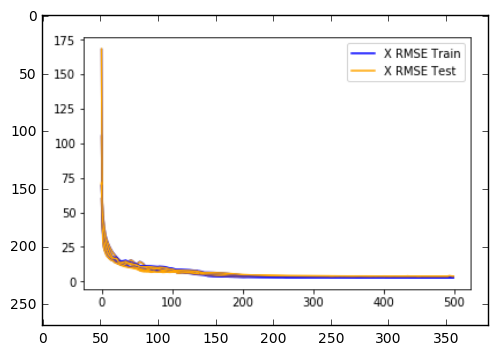

In [60]:
img=mpimg.imread('XRMSE_simpleRNN_500epochs.PNG')
img_plot= plt.imshow(img)

XRMSE for both train and tests sets is continuously decreasing over the 500 epochs. It remains somewhat constant after 300 epochs. let's check for the Y-coordinate below:

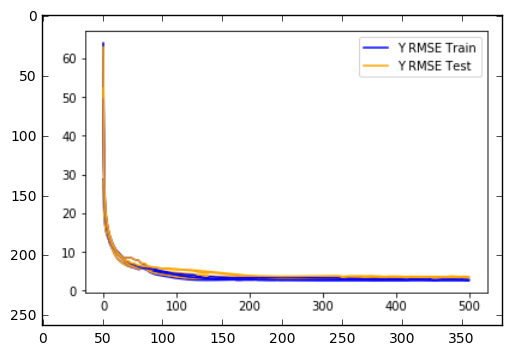

In [61]:
img=mpimg.imread('YRMSE_simpleRNN_500epochs.PNG')
img_plot= plt.imshow(img)

This plot also shows a continuous decrease over the epochs. However, the test set shows a very slight increase after 300 epochs. let's check below the mean performance at different number of epochs, and select the one with the lowest mean value.

In [ ]:
#Epoch tuning
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def epoch_tuning(model_iter, n_epoch, X_train, Y_train, X_test, Y_test, X_val, Y_val):
    for j in range(n_epoch):
        model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=105, verbose=0, shuffle=False)
        model_iter.reset_states()
    
    Y_pred = model_iter.predict(X_test, batch_size=105)
    model_iter.reset_states()

    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    print('X_RMSE: ',xrmse)
    print('Y_RMSE: ', yrmse, '\n')
    
    return xrmse, yrmse

repeats=5
timesteps=18
results_X = pd.DataFrame()
results_Y = pd.DataFrame()
epochs=[100,300,500,700]
for e in epochs:
    print('Epoch: ', e)
    X_RMSE=[]
    Y_RMSE=[]
    for i in range(0,repeats):
        print('Iteration: ', i)
        model_iter = Sequential()
        model_iter.add(SimpleRNN(30, return_sequences=False, batch_input_shape=(105, timesteps, 2), stateful=True))
        model_iter.add(Dense(2))
        model_iter.add(LeakyReLU(alpha=0.05))
        model_iter.compile(Adam(lr=0.001), loss='mse', metrics=[rmse])
        xrmse, yrmse=epoch_tuning(model_iter, e, X_train, Y_train, X_test, Y_test, X_val, Y_val)
        X_RMSE.append(xrmse)
        Y_RMSE.append(yrmse)
    results_X[str(e)], results_Y[str(e)]= X_RMSE, Y_RMSE
print(results_X.describe())
print(results_Y.describe())

In [27]:
#results of the block above for epoch tuning
results_X = pd.DataFrame()
results_Y = pd.DataFrame()

def epoch_results(e):
    if(e==100):
        X_RMSE=[5.968304982367684, 4.8985413475156205, 6.575082024370328, 5.229159737641434, 5.891161206987205]
        Y_RMSE=[5.488377726721685, 6.496593816783744, 6.583226992821811, 7.0277652011484495, 7.12577708514579]
    elif(e==300):
        X_RMSE=[3.365497619648367,2.999080416309337,3.6040628331782387, 2.9643684454113646,3.740724176557589]
        Y_RMSE=[4.190276579618269,4.180198056973888,4.1648109387482135,4.150066244133836,4.305878730005456]
    elif(e==500):
        X_RMSE=[2.8071886363578678,3.7049117023196607,3.379297223053745,2.805928300158271,3.0371496155309647]
        Y_RMSE=[4.31861327272163,4.372617180450503,4.154114393976363,4.3502935645456,4.152097840939262]
    else:
        X_RMSE=[3.4054250893140603,3.398383399880534,3.343978668049909,3.281932840782667,3.3978447314768796]
        Y_RMSE=[4.09316536838949,4.159372437022812,4.137108441651914,4.048097042367193,4.059773287117883]
    return X_RMSE,Y_RMSE
epochs=[100,300,500,700]
for e in epochs:
    results_X[str(e)], results_Y[str(e)]= epoch_results(e)
print(results_X.describe())
print(results_Y.describe())

            100       300       500       700
count  5.000000  5.000000  5.000000  5.000000
mean   5.712450  3.334747  3.146895  3.365513
std    0.659081  0.349337  0.390223  0.052840
min    4.898541  2.964368  2.805928  3.281933
25%    5.229160  2.999080  2.807189  3.343979
50%    5.891161  3.365498  3.037150  3.397845
75%    5.968305  3.604063  3.379297  3.398383
max    6.575082  3.740724  3.704912  3.405425
            100       300       500       700
count  5.000000  5.000000  5.000000  5.000000
mean   6.544348  4.198246  4.269547  4.099503
std    0.650119  0.062075  0.108016  0.048114
min    5.488378  4.150066  4.152098  4.048097
25%    6.496594  4.164811  4.154114  4.059773
50%    6.583227  4.180198  4.318613  4.093165
75%    7.027765  4.190277  4.350294  4.137108
max    7.125777  4.305879  4.372617  4.159372


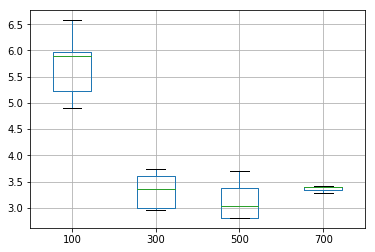

In [31]:
results_X.boxplot()

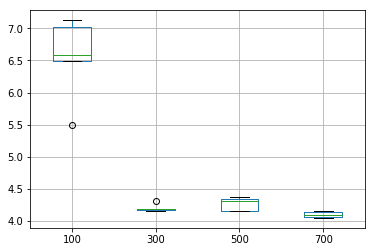

In [32]:
results_Y.boxplot()

The mean for XRMSE is continuosuly decreasing over 500 epochs and has a minimum mean at 500. But for YRMSE, the mean decreases upto 300 epochs and then shows an increase on further training. So, the model will be trained for 300 epochs.

## Sufficient Sample Size

In [ ]:
#calculate the results for 60 iterations in order to choose the final sample size required.

timesteps=18
X_RMSE=[]
Y_RMSE=[]

for i in range(0,60):
    print('Iteration: ', i)
    
    model_iter = stateful_SimpleRNN(units=30, lr=0.001, batch=128, alpha=0.05)
    
    for j in range(300):
        model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=128, verbose=0, shuffle=False)
        model_iter.reset_states()
    
    Y_pred = model_iter.predict(X_test, batch_size=128)
    model_iter.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    print('X_RMSE: ',X_RMSE)
    Y_RMSE.append(yrmse)
    print('Y_RMSE: ', Y_RMSE, '\n')
    

print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

print('Completed')

In [28]:
#The standard deviation (average distance of scores from the mean score) gives an idea of how unstable the model is.
#The standard error of the mean model skill is how much the estimated mean of model skill score differs from the
#unknown actual mean model skill (e.g. how wrong mean_skill might be)

X_RMSE= [5.500694428523802, 3.4254142011641138, 4.891764667623055, 4.597999187909547, 4.074898807602142, 5.340896844813258, 3.5068852804187904, 3.471926540005198, 3.6087092511719927, 3.593589653833207, 4.40005905404099, 3.4837944705309387, 4.156649393571735, 4.412614679858544, 4.268136721506749, 3.434429810864395, 3.7226918247892513, 3.7242362237824094, 4.9446961451576295, 4.328349505599733, 4.170842829870825, 5.052166145964223, 3.8702921692554693, 3.832187730553048, 3.444077326527261, 4.889948122488767, 5.467175082789805, 5.487393969459091, 4.273710167990146, 4.4442579920317105, 3.813416814145549, 5.0318621764913205, 4.4285047272296065, 3.968096111214058, 3.3830894781131327, 3.997503138381941, 4.057249570926058, 4.140528315566753, 4.273386194993445, 5.955602638625145, 4.022665399192207, 3.4845302001313363, 4.559127087867797, 3.8592451013696505, 5.0786265926044, 4.233400902985731, 3.6427489219717453, 3.376359874166942, 4.33561847630898, 4.300004254136604, 4.369195436873038, 4.10780138279645, 3.3416622757739733, 4.382799352956347, 4.076541039621095, 4.118557221840233, 4.3819078910676375, 3.57963769052343, 4.454193212121663, 4.282864039192654]
Y_RMSE= [2.9605533863693605, 3.258207411057651, 2.945326107369334, 2.9219609775398094, 3.386360160562858, 3.0175641597840497, 3.4588145657235723, 2.9925795176528256, 3.1609890881332197, 3.554487823605844, 3.312802600320144, 3.193031442094347, 3.19717280115246, 2.786610105798919, 3.209287494216034, 3.5533441995690542, 2.847311994602069, 2.867147257714469, 2.7697226443815772, 2.819269225470433, 4.075422147517169, 3.5253977360586175, 3.0833007219347106, 3.019102897582364, 3.806820771401082, 2.942465008263055, 3.2280207191406234, 3.1009384838850362, 2.991116768265948, 2.9913335757690214, 2.8888957670952427, 3.309979510582037, 3.1793258678865692, 3.1536643711107777, 3.291440230418111, 3.025438082396211, 2.7473353791816804, 3.2445559345752244, 3.163555018642853, 2.7326482516579724, 3.028079776856231, 3.1547165966311965, 2.8818058561632336, 3.07226483113012, 2.7470163477908724, 2.6885764608281773, 3.6148256427869376, 3.1307917830787777, 2.7524046856921043, 3.309591167231183, 3.165771265165449, 2.8275690786701757, 3.1717581995918147, 3.1388501158128643, 2.8069471864172746, 2.923782802579026, 3.259614634218462, 3.7079718303760316, 3.483363178412482, 3.18730880216587]
print('X_RMSE_SD: ', np.std(X_RMSE))
print('X_RMSE_mean: ', np.mean(X_RMSE))
print('XRMSE_Std_error: ', (np.std(X_RMSE)/math.sqrt(len(X_RMSE))),'\n')

print('Y_RMSE_SD: ', np.std(Y_RMSE))
print('Y_RMSE_mean: ', np.mean(Y_RMSE))
print('YRMSE_Std_error: ', (np.std(Y_RMSE)/math.sqrt(len(Y_RMSE))))

X_RMSE_SD:  0.6081253577437559
X_RMSE_mean:  4.214286895814778
XRMSE_Std_error:  0.07850864609826647 

Y_RMSE_SD:  0.2838271347002477
Y_RMSE_mean:  3.1294385074680102
YRMSE_Std_error:  0.036641925529860946


               0
count  60.000000
mean    4.214287
std     0.613257
min     3.341662
25%     3.723850
50%     4.163746
75%     4.432443
max     5.955603


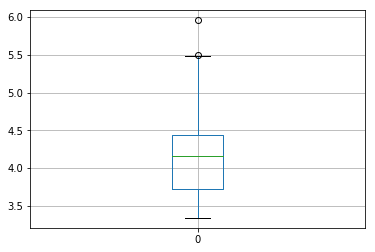

In [29]:
#descriptive stats
XRMSE_df= pd.DataFrame(X_RMSE)
print(XRMSE_df.describe())
# box and whisker plot of model skill- spread of the data
#It shows the middle 50% (box), outliers (dots/+), and the median (green line).
XRMSE_df.boxplot()
plt.show()

               0
count  60.000000
mean    3.129439
std     0.286222
min     2.688576
25%     2.923327
50%     3.134821
75%     3.258559
max     4.075422


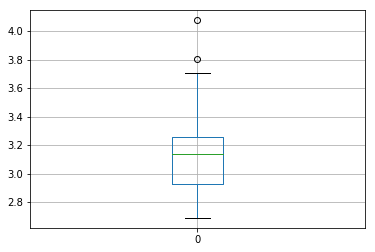

In [30]:
#descriptive stats
YRMSE_df= pd.DataFrame(Y_RMSE)
print(YRMSE_df.describe())
# box and whisker plot of model skill- spread of the data
#It shows the middle 50% (box), outliers (dots/+), and the median (green line).
YRMSE_df.boxplot()
plt.show()

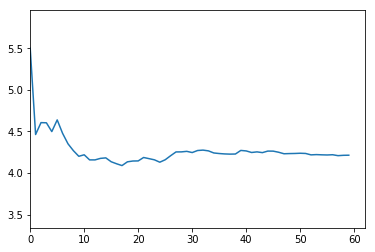

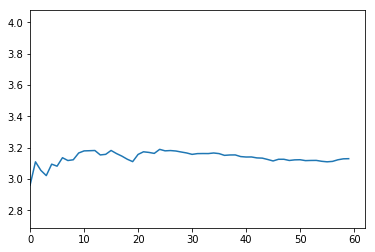

In [31]:
#60 iterations
XRMSE_df=pd.DataFrame(X_RMSE)
XRMSE_scores= XRMSE_df.values
XRMSE_mean_list = list()
for i in range(1,len(X_RMSE)+1):
    data = XRMSE_scores[0:i, 0]
    XRMSE_mean = np.mean(data)
    XRMSE_mean_list.append(XRMSE_mean)
# line plot of the values generated in the list
plt.plot(XRMSE_mean_list)
plt.xlim(0,62)
plt.ylim(min(X_RMSE),max(X_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

YRMSE_df=pd.DataFrame(Y_RMSE)
YRMSE_scores= YRMSE_df.values
YRMSE_mean_list = list()
for i in range(1,len(Y_RMSE)+1):
    data = YRMSE_scores[0:i, 0]
    YRMSE_mean = np.mean(data)
    YRMSE_mean_list.append(YRMSE_mean)
# line plot of the values generated in the list
plt.plot(YRMSE_mean_list)
plt.xlim(0,62)
plt.ylim(min(Y_RMSE), max(Y_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

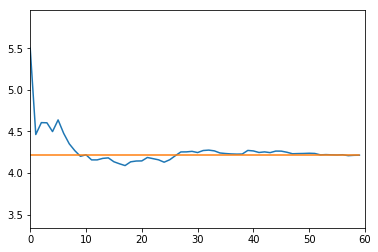

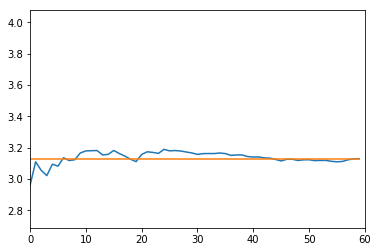

In [32]:
#mean of iterations shown with orange line on top of the above plots.
X_Mean= np.mean(XRMSE_scores[0:60])
plt.plot(XRMSE_mean_list)
plt.plot([X_Mean for x in range(len(XRMSE_mean_list))])
plt.xlim(0,60)
plt.ylim(min(X_RMSE), max(X_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

Y_Mean= np.mean(YRMSE_scores[0:60])
plt.plot(YRMSE_mean_list)
plt.plot([Y_Mean for x in range(len(YRMSE_mean_list))])
plt.xlim(0,60)
plt.ylim(min(Y_RMSE), max(Y_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

The XRMSE mean gets almost constant and equal to the mean of 60 iterations after 28 iterations, where as YRMSE gets constant after 40 iterations. Thus, the SimpleRNN model will be trained for 40 experimental runs to summarize the skill of the model.

## Model Training and Predictions

In [34]:
#simpleRNN stateless model
import keras.backend as k
timesteps=18
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def stateless_simpleRNN(units,lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=False, input_shape=(timesteps,2)))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [35]:
#training and validation of the stateless model
def stateless_fit(model, X_train, Y_train, X_val, Y_val, batch, epochs, weights_saved_file, shuffle):

    checkpt= ModelCheckpoint(weights_saved_file,
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True,
                             mode='auto',
                             save_weights_only=True)
    callbacks_list = [checkpt]

    start = time.time()
    history1= model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=batch, epochs=epochs, verbose=2, callbacks=callbacks_list, shuffle=shuffle)
    end = time.time()

    print("Time Took :{:3.2f} min".format( (end-start)/60 ))

    print(history1.history.keys())
    return history1

In [36]:
#learning curves
def stateless_learn_curve(hist):
    # summarize history for loss
    #plt.figure(figsize=(20,10))
    plt.plot(hist.history['loss'])
    plt.plot(hist.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    # summarize history for accuracy
    #plt.figure(figsize=(20,10))
    plt.plot(hist.history['rmse'])
    plt.plot(hist.history['val_rmse'])
    plt.title('model rmse')
    plt.ylabel('rmse')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

In [37]:
def calculate_RMSE(Y_pred, Y_true):
    
    Xcoord_pred=[]
    Xcoord_true=[]
    Ycoord_pred=[]
    Ycoord_true=[]
    
    Y_pred = scaler.inverse_transform(Y_pred)
    Y_true = scaler.inverse_transform(Y_true)
    
    for i in range(0,len(Y_pred)):
        Xcoord_pred.append(Y_pred[i][0])
        Ycoord_pred.append(Y_pred[i][1])

    for i in range(0,len(Y_true)):   
        Xcoord_true.append(Y_true[i][0])
        Ycoord_true.append(Y_true[i][1])

    X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
    Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))
    return X_RMSE, Y_RMSE

In [38]:
#comparing the true test values and the preicted test values
def compare_true_pred(Y_pred, Y_true):
    Y_pred= scaler.inverse_transform(Y_pred)
    Y_true= scaler.inverse_transform(Y_true)
    for i in range(len(Y_true)):
        print('Y_true: ', Y_true[i])
        print('Y_Pred: ', Y_pred[i], '\n')

In [39]:
def XY_coord(Y_pred, Y_true):
    Xcoord_pred=[]
    Xcoord_true=[]
    Ycoord_pred=[]
    Ycoord_true=[]
    
    Y_pred= scaler.inverse_transform(Y_pred)
    Y_true= scaler.inverse_transform(Y_true)
    
    for i in range(0,len(Y_pred)):
        Xcoord_pred.append(Y_pred[i][0])
        Ycoord_pred.append(Y_pred[i][1])

    for i in range(0,len(Y_true)):   
        Xcoord_true.append(Y_true[i][0])
        Ycoord_true.append(Y_true[i][1])
        
    return Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true

In [40]:
#simpleRNN call model definition
simpleRNN_model1= stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)

Instructions for updating:
Colocations handled automatically by placer.
Model created and compiled


In [42]:
#Train simpleRNN stateless model with shuffle=True
history= stateless_fit(simpleRNN_model1, X_train, Y_train, X_val, Y_val, 128, 300, 'simple_rnn_wts_1.hdf5', True)

Instructions for updating:
Use tf.cast instead.
Train on 7680 samples, validate on 2560 samples
Epoch 1/300
 - 3s - loss: 0.0283 - rmse: 0.1436 - val_loss: 0.0032 - val_rmse: 0.0560

Epoch 00001: val_loss improved from inf to 0.00315, saving model to simple_rnn_wts_1.hdf5
Epoch 2/300
 - 1s - loss: 0.0021 - rmse: 0.0448 - val_loss: 0.0013 - val_rmse: 0.0362

Epoch 00002: val_loss improved from 0.00315 to 0.00132, saving model to simple_rnn_wts_1.hdf5
Epoch 3/300
 - 1s - loss: 0.0012 - rmse: 0.0339 - val_loss: 9.1991e-04 - val_rmse: 0.0302

Epoch 00003: val_loss improved from 0.00132 to 0.00092, saving model to simple_rnn_wts_1.hdf5
Epoch 4/300
 - 1s - loss: 8.3974e-04 - rmse: 0.0286 - val_loss: 6.4774e-04 - val_rmse: 0.0253

Epoch 00004: val_loss improved from 0.00092 to 0.00065, saving model to simple_rnn_wts_1.hdf5
Epoch 5/300
 - 1s - loss: 6.7325e-04 - rmse: 0.0256 - val_loss: 5.6243e-04 - val_rmse: 0.0235

Epoch 00005: val_loss improved from 0.00065 to 0.00056, saving model to simpl


Epoch 00044: val_loss improved from 0.00006 to 0.00006, saving model to simple_rnn_wts_1.hdf5
Epoch 45/300
 - 1s - loss: 7.3409e-05 - rmse: 0.0081 - val_loss: 5.5710e-05 - val_rmse: 0.0073

Epoch 00045: val_loss did not improve from 0.00006
Epoch 46/300
 - 1s - loss: 7.0768e-05 - rmse: 0.0080 - val_loss: 5.5241e-05 - val_rmse: 0.0073

Epoch 00046: val_loss improved from 0.00006 to 0.00006, saving model to simple_rnn_wts_1.hdf5
Epoch 47/300
 - 1s - loss: 6.9462e-05 - rmse: 0.0079 - val_loss: 6.0151e-05 - val_rmse: 0.0076

Epoch 00047: val_loss did not improve from 0.00006
Epoch 48/300
 - 1s - loss: 6.6748e-05 - rmse: 0.0077 - val_loss: 5.0024e-05 - val_rmse: 0.0069

Epoch 00048: val_loss improved from 0.00006 to 0.00005, saving model to simple_rnn_wts_1.hdf5
Epoch 49/300
 - 1s - loss: 6.4320e-05 - rmse: 0.0075 - val_loss: 5.0977e-05 - val_rmse: 0.0070

Epoch 00049: val_loss did not improve from 0.00005
Epoch 50/300
 - 1s - loss: 6.2351e-05 - rmse: 0.0074 - val_loss: 4.7156e-05 - val_rm


Epoch 00095: val_loss did not improve from 0.00002
Epoch 96/300
 - 1s - loss: 3.2909e-05 - rmse: 0.0051 - val_loss: 2.2702e-05 - val_rmse: 0.0046

Epoch 00096: val_loss did not improve from 0.00002
Epoch 97/300
 - 1s - loss: 3.4502e-05 - rmse: 0.0053 - val_loss: 2.6674e-05 - val_rmse: 0.0051

Epoch 00097: val_loss did not improve from 0.00002
Epoch 98/300
 - 1s - loss: 3.3133e-05 - rmse: 0.0051 - val_loss: 2.2628e-05 - val_rmse: 0.0046

Epoch 00098: val_loss did not improve from 0.00002
Epoch 99/300
 - 1s - loss: 3.5694e-05 - rmse: 0.0054 - val_loss: 2.2256e-05 - val_rmse: 0.0046

Epoch 00099: val_loss improved from 0.00002 to 0.00002, saving model to simple_rnn_wts_1.hdf5
Epoch 100/300
 - 1s - loss: 3.1085e-05 - rmse: 0.0049 - val_loss: 2.2900e-05 - val_rmse: 0.0047

Epoch 00100: val_loss did not improve from 0.00002
Epoch 101/300
 - 1s - loss: 3.2422e-05 - rmse: 0.0051 - val_loss: 2.4581e-05 - val_rmse: 0.0049

Epoch 00101: val_loss did not improve from 0.00002
Epoch 102/300
 - 1s -


Epoch 00146: val_loss did not improve from 0.00001
Epoch 147/300
 - 1s - loss: 2.8604e-05 - rmse: 0.0047 - val_loss: 1.4201e-05 - val_rmse: 0.0037

Epoch 00147: val_loss did not improve from 0.00001
Epoch 148/300
 - 1s - loss: 2.4379e-05 - rmse: 0.0042 - val_loss: 1.5251e-05 - val_rmse: 0.0038

Epoch 00148: val_loss did not improve from 0.00001
Epoch 149/300
 - 1s - loss: 2.3454e-05 - rmse: 0.0041 - val_loss: 1.4385e-05 - val_rmse: 0.0037

Epoch 00149: val_loss did not improve from 0.00001
Epoch 150/300
 - 1s - loss: 2.3666e-05 - rmse: 0.0041 - val_loss: 1.4481e-05 - val_rmse: 0.0037

Epoch 00150: val_loss did not improve from 0.00001
Epoch 151/300
 - 1s - loss: 2.3423e-05 - rmse: 0.0041 - val_loss: 1.4805e-05 - val_rmse: 0.0038

Epoch 00151: val_loss did not improve from 0.00001
Epoch 152/300
 - 1s - loss: 2.3250e-05 - rmse: 0.0041 - val_loss: 1.3105e-05 - val_rmse: 0.0035

Epoch 00152: val_loss did not improve from 0.00001
Epoch 153/300
 - 1s - loss: 2.3092e-05 - rmse: 0.0040 - val_


Epoch 00199: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_1.hdf5
Epoch 200/300
 - 1s - loss: 2.0498e-05 - rmse: 0.0036 - val_loss: 1.0838e-05 - val_rmse: 0.0032

Epoch 00200: val_loss did not improve from 0.00001
Epoch 201/300
 - 1s - loss: 2.0182e-05 - rmse: 0.0037 - val_loss: 9.4995e-06 - val_rmse: 0.0030

Epoch 00201: val_loss did not improve from 0.00001
Epoch 202/300
 - 1s - loss: 1.9342e-05 - rmse: 0.0036 - val_loss: 1.1089e-05 - val_rmse: 0.0033

Epoch 00202: val_loss did not improve from 0.00001
Epoch 203/300
 - 1s - loss: 1.9792e-05 - rmse: 0.0036 - val_loss: 1.3473e-05 - val_rmse: 0.0036

Epoch 00203: val_loss did not improve from 0.00001
Epoch 204/300
 - 1s - loss: 2.0764e-05 - rmse: 0.0037 - val_loss: 9.1418e-06 - val_rmse: 0.0029

Epoch 00204: val_loss did not improve from 0.00001
Epoch 205/300
 - 1s - loss: 2.0558e-05 - rmse: 0.0037 - val_loss: 1.0465e-05 - val_rmse: 0.0032

Epoch 00205: val_loss did not improve from 0.00001
Epoch 206/300
 - 

 - 1s - loss: 1.8080e-05 - rmse: 0.0034 - val_loss: 1.2625e-05 - val_rmse: 0.0035

Epoch 00253: val_loss did not improve from 0.00001
Epoch 254/300
 - 1s - loss: 1.7830e-05 - rmse: 0.0033 - val_loss: 1.0226e-05 - val_rmse: 0.0031

Epoch 00254: val_loss did not improve from 0.00001
Epoch 255/300
 - 1s - loss: 1.7907e-05 - rmse: 0.0033 - val_loss: 8.2769e-06 - val_rmse: 0.0028

Epoch 00255: val_loss did not improve from 0.00001
Epoch 256/300
 - 1s - loss: 1.7639e-05 - rmse: 0.0033 - val_loss: 1.0699e-05 - val_rmse: 0.0032

Epoch 00256: val_loss did not improve from 0.00001
Epoch 257/300
 - 1s - loss: 1.7709e-05 - rmse: 0.0033 - val_loss: 7.4728e-06 - val_rmse: 0.0026

Epoch 00257: val_loss did not improve from 0.00001
Epoch 258/300
 - 1s - loss: 1.8001e-05 - rmse: 0.0034 - val_loss: 7.8170e-06 - val_rmse: 0.0027

Epoch 00258: val_loss did not improve from 0.00001
Epoch 259/300
 - 1s - loss: 1.7251e-05 - rmse: 0.0032 - val_loss: 7.2690e-06 - val_rmse: 0.0026

Epoch 00259: val_loss improve

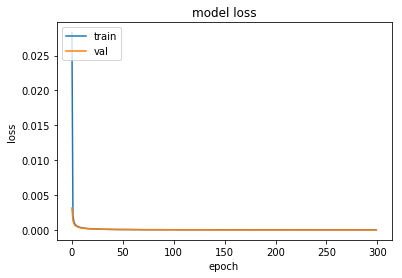

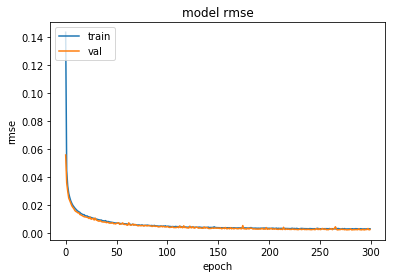

In [43]:
#plot loss and rmse curve for simpleRNN_model1
stateless_learn_curve(history)

In [ ]:
weights_saved_file= 'simple_rnn_wts_1.hdf5'
simpleRNN_model1.load_weights(weights_saved_file)

In [44]:
#evaluate simpleRNN_model1 performance
scores = simpleRNN_model1.evaluate(X_test, Y_test, verbose=0)
print("Overall RMSE while training", (scores[1]))

Y_Pred_test = simpleRNN_model1.predict(X_test)

xrmse, yrmse= calculate_RMSE(Y_Pred_test, Y_test)

print('Test Score (X-coord) XRMSE', str(xrmse))
print('Test Score (Y-coord) YRMSE', str(yrmse))


Overall RMSE while training 0.0025700324447825553
Test Score (X-coord) XRMSE 2.5030865695423254
Test Score (Y-coord) YRMSE 2.7102678773149274


In [46]:
#print the true and predicted values to compare
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [980.63293789 578.2967033 ]
Y_Pred:  [979.97455 575.7362 ] 

Y_true:  [ 99.25398029 378.72927461]
Y_Pred:  [ 99.18114 378.64554] 

Y_true:  [1297.86892178  404.6721519 ]
Y_Pred:  [1296.3058  402.1025] 

Y_true:  [466.90793413 358.21167883]
Y_Pred:  [467.75604 356.2935 ] 

Y_true:  [781.0841617  528.31488203]
Y_Pred:  [780.5218  526.36975] 

Y_true:  [ 27.35703593 345.44890511]
Y_Pred:  [ 27.974566 346.7114  ] 

Y_true:  [462.37295298 473.65156562]
Y_Pred:  [462.34177 471.87628] 

Y_true:  [1131.  344.]
Y_Pred:  [1129.8491   342.37152] 

Y_true:  [656.25832013 350.53164557]
Y_Pred:  [657.3467  351.27634] 

Y_true:  [ 50.85624564 537.8974359 ]
Y_Pred:  [ 51.85413 537.7848 ] 

Y_true:  [803.82941622 468.62823834]
Y_Pred:  [803.31006 468.1824 ] 

Y_true:  [357.74801902 482.25383078]
Y_Pred:  [356.663   486.02798] 

Y_true:  [304.4058908  618.52638191]
Y_Pred:  [304.1586 615.0502] 

Y_true:  [1079.20510836  320.81242236]
Y_Pred:  [1078.4142   318.89047] 

Y_true:  [1063.56896552  2

Y_true:  [535.58210007   3.21518987]
Y_Pred:  [531.0191      4.0495787] 

Y_true:  [583.09403064 388.7041972 ]
Y_Pred:  [584.695 387.203] 

Y_true:  [664.34829721 219.56149068]
Y_Pred:  [662.79504 217.77654] 

Y_true:  [410.42630745 513.97468354]
Y_Pred:  [409.8356  512.73975] 

Y_true:  [1175.  262.]
Y_Pred:  [1172.258    260.38535] 

Y_true:  [449.05582694 590.12087912]
Y_Pred:  [450.5128  586.00964] 

Y_true:  [326.28737454 508.06062625]
Y_Pred:  [327.4157  506.32608] 

Y_true:  [625.51347449 321.45214008]
Y_Pred:  [630.8297  308.06964] 

Y_true:  [316.6640159  600.08076225]
Y_Pred:  [314.69617 599.5349 ] 

Y_true:  [596.81346749 607.52298137]
Y_Pred:  [597.5609  604.94006] 

Y_true:  [1055.73534073  294.61692205]
Y_Pred:  [1058.1958   291.79745] 

Y_true:  [669.71058475 581.92036554]
Y_Pred:  [668.7312 581.8544] 

Y_true:  [800.39197042 129.02331779]
Y_Pred:  [798.9321  127.91651] 

Y_true:  [1293.23127899  479.98275862]
Y_Pred:  [1290.8806  477.9782] 

Y_true:  [1095.15470022  340

Y_true:  [309. 610.]
Y_Pred:  [308.00803 611.3995 ] 

Y_true:  [978.18119387 411.28514324]
Y_Pred:  [983.69275 405.89996] 

Y_true:  [578.85803657 228.50583658]
Y_Pred:  [584.00275 228.83527] 

Y_true:  [991.35076598 391.93004664]
Y_Pred:  [981.5712 392.6337] 

Y_true:  [939.32938564 419.67754569]
Y_Pred:  [936.3641  418.30167] 

Y_true:  [559.681458   273.11125916]
Y_Pred:  [558.1214  271.54025] 

Y_true:  [908.66202783 348.16787659]
Y_Pred:  [905.46875 350.3254 ] 

Y_true:  [421.8125     187.65326633]
Y_Pred:  [422.09116 185.8537 ] 

Y_true:  [795.27047015 482.79147235]
Y_Pred:  [792.15607 480.01715] 

Y_true:  [ 59.55478018 493.55677656]
Y_Pred:  [ 60.613335 494.20862 ] 

Y_true:  [782.10089805 239.77748168]
Y_Pred:  [779.7975 237.4856] 

Y_true:  [1368.74981046  130.98445596]
Y_Pred:  [1366.5687   129.46416] 

Y_true:  [943.79397781 158.05596269]
Y_Pred:  [942.68164 155.9095 ] 

Y_true:  [750.69874167  67.8002611 ]
Y_Pred:  [752.6182   65.66447] 

Y_true:  [840.58074299 640.0634715

Y_true:  [279.12213175 284.58029197]
Y_Pred:  [279.6643  284.12125] 

Y_true:  [540.20067372 735.31439689]
Y_Pred:  [541.3714 734.9649] 

Y_true:  [821.68006065 473.85492228]
Y_Pred:  [822.99567 473.8281 ] 

Y_true:  [860.93505633 332.05716878]
Y_Pred:  [863.4264 329.1179] 

Y_true:  [656.61099366 368.91898734]
Y_Pred:  [658.8286  380.68805] 

Y_true:  [406.03645008 312.89673551]
Y_Pred:  [405.56693 310.92   ] 

Y_true:  [782.26625387 317.80496894]
Y_Pred:  [782.1722  315.15457] 

Y_true:  [954.76862124 394.6182545 ]
Y_Pred:  [929.8909  396.60788] 

Y_true:  [551.63338616 124.72218521]
Y_Pred:  [548.17615  123.924614] 

Y_true:  [834.80948795 467.953125  ]
Y_Pred:  [836.5368 466.046 ] 

Y_true:  [346.65344311 271.81751825]
Y_Pred:  [348.7737 270.8352] 

Y_true:  [102.98291925 461.6484375 ]
Y_Pred:  [105.56195 459.41287] 

Y_true:  [711.86318014 108.59293804]
Y_Pred:  [711.0195 107.3717] 

Y_true:  [  6.42783124 658.82767624]
Y_Pred:  [  2.5814903 666.77075  ] 

Y_true:  [785.75911252 3

Y_true:  [1031.65076209  183.39927405]
Y_Pred:  [1031.5659   181.24867] 

Y_true:  [555.29887343 579.57622505]
Y_Pred:  [556.36707 578.13043] 

Y_true:  [497.11919505 435.09565217]
Y_Pred:  [497.61163 433.73105] 

Y_true:  [857.46011622 298.91805463]
Y_Pred:  [858.57025 297.75775] 

Y_true:  [408.46266574 255.1025641 ]
Y_Pred:  [410.73105 253.17511] 

Y_true:  [793.01590457 496.82577132]
Y_Pred:  [793.26373 495.73117] 

Y_true:  [349.69994717 254.8314457 ]
Y_Pred:  [349.03748 255.30064] 

Y_true:  [ 97.60636646 469.00390625]
Y_Pred:  [ 99.09133 467.81122] 

Y_true:  [325.58565929 614.73540856]
Y_Pred:  [325.16647 612.84753] 

Y_true:  [518.20596728 629.17976654]
Y_Pred:  [512.62115 627.9479 ] 

Y_true:  [821.92956656 448.12795031]
Y_Pred:  [821.5543  445.76163] 

Y_true:  [665. 451.]
Y_Pred:  [665.0104 449.5077] 

Y_true:  [504.65877128 484.99608355]
Y_Pred:  [510.50583 482.53323] 

Y_true:  [491.46048851  47.74623116]
Y_Pred:  [490.24152   47.032692] 

Y_true:  [705.1568323 531.      

Y_true:  [764.93373494  27.67578125]
Y_Pred:  [764.88184   27.256523] 

Y_true:  [1204.70741097  712.07782101]
Y_Pred:  [1215.8817  709.6021] 

Y_true:  [550.17010037 184.40039973]
Y_Pred:  [550.28406 185.36682] 

Y_true:  [932.81933439 211.28247835]
Y_Pred:  [931.14734 210.57698] 

Y_true:  [840.15325077 351.88944099]
Y_Pred:  [837.65216 349.06253] 

Y_true:  [ 76.15314632 447.72150259]
Y_Pred:  [ 76.69931 445.85303] 

Y_true:  [611.67247915 506.26036269]
Y_Pred:  [612.8706  503.27554] 

Y_true:  [443.32405567 195.84845735]
Y_Pred:  [442.01053 196.1856 ] 

Y_true:  [208.88864943 389.40326633]
Y_Pred:  [210.73811 386.8342 ] 

Y_true:  [686.54804506 303.49727768]
Y_Pred:  [684.83276 300.63007] 

Y_true:  [1218.56115108   39.32015306]
Y_Pred:  [1217.016      37.454746] 

Y_true:  [909.57985421  79.41197822]
Y_Pred:  [902.41406 112.00443] 

Y_true:  [474.53015242 239.78675136]
Y_Pred:  [475.0984  239.07965] 

Y_true:  [240.27285852  75.89805447]
Y_Pred:  [238.9986   77.97461] 

Y_true:  [

Y_true:  [826. 527.]
Y_Pred:  [825.4331 524.5194] 

Y_true:  [382.1814759  258.84765625]
Y_Pred:  [384.2356  256.55243] 

Y_true:  [908.67511886 427.41439041]
Y_Pred:  [910.4278  424.95453] 

Y_true:  [1263.52192287  623.11592272]
Y_Pred:  [1262.4342   622.35846] 

Y_true:  [814.1259112  417.00453721]
Y_Pred:  [812.8225  415.17044] 

Y_true:  [608.18431184 448.93929961]
Y_Pred:  [608.5726 449.3221] 

Y_true:  [491.46048851  47.74623116]
Y_Pred:  [490.24152   47.032692] 

Y_true:  [873.71872687 564.01044386]
Y_Pred:  [873.82434 563.22577] 

Y_true:  [301.41151611 425.26382412]
Y_Pred:  [301.1179  423.27997] 

Y_true:  [804.05018489 290.31578947]
Y_Pred:  [802.9074  288.70056] 

Y_true:  [825. 527.]
Y_Pred:  [824.4033 526.1736] 

Y_true:  [924.03961965 143.53964024]
Y_Pred:  [922.46234 143.13997] 

Y_true:  [1024.27469625  304.83211193]
Y_Pred:  [1023.7185   303.10468] 

Y_true:  [960.97813121 493.89655172]
Y_Pred:  [957.11066 492.87503] 

Y_true:  [713.16500994 228.80217786]
Y_Pred:  [7

Y_Pred:  [498.5973    37.780464] 

Y_true:  [919.4427334  153.77198444]
Y_Pred:  [921.539   150.71454] 

Y_true:  [702.27983252  81.68131868]
Y_Pred:  [703.68506   80.133644] 

Y_true:  [360.87103594 121.71139241]
Y_Pred:  [363.19315 120.15468] 

Y_true:  [389.2086635  393.54297135]
Y_Pred:  [388.18716 392.60645] 

Y_true:  [460.65387299 588.15018315]
Y_Pred:  [460.43063 585.58234] 

Y_true:  [517.76129518 560.421875  ]
Y_Pred:  [522.38184 569.3428 ] 

Y_true:  [988. 502.]
Y_Pred:  [984.43933 500.1134 ] 

Y_true:  [829.85833915 631.50549451]
Y_Pred:  [827.7312 629.8651] 

Y_true:  [280.83579986 644.72911392]
Y_Pred:  [284.86826 645.5179 ] 

Y_true:  [398.72002113 149.45369753]
Y_Pred:  [398.89847 147.20636] 

Y_true:  [760.27006281 502.42490842]
Y_Pred:  [759.9095 500.3959] 

Y_true:  [757.63328313 577.234375  ]
Y_Pred:  [757.77484 575.5077 ] 

Y_true:  [1348.87090021  620.66666667]
Y_Pred:  [1347.7437  617.6517] 

Y_true:  [1108.34267241  414.74874372]
Y_Pred:  [1110.0331   408.13504]


Y_true:  [774.7844691  404.83344437]
Y_Pred:  [773.9055 402.6168] 

Y_true:  [474.11751327 738.32512953]
Y_Pred:  [482.45728 739.513  ] 

Y_true:  [180.36775994 332.94505495]
Y_Pred:  [179.98592 330.6669 ] 

Y_true:  [461.61135057 512.07537688]
Y_Pred:  [460.4851 511.0571] 

Y_true:  [1015.81034483  272.81407035]
Y_Pred:  [1014.7478   270.95306] 

Y_true:  [549.97482014 152.54719388]
Y_Pred:  [549.46295 150.12253] 

Y_true:  [358.83359133 453.14037267]
Y_Pred:  [356.48874 453.06244] 

Y_true:  [950.76852743  60.19766537]
Y_Pred:  [950.24493  58.46407] 

Y_true:  [698.69360803 306.98267821]
Y_Pred:  [698.1187 306.3703] 

Y_true:  [754.29846804 384.9407062 ]
Y_Pred:  [753.2423  384.08923] 

Y_true:  [632.1141046  320.96135909]
Y_Pred:  [633.95703 319.33105] 

Y_true:  [440.35729239 645.3003663 ]
Y_Pred:  [440.94244 643.4374 ] 

Y_true:  [789.0310559  273.55859375]
Y_Pred:  [793.9866  273.34912] 

Y_true:  [188.90747594 505.01305483]
Y_Pred:  [191.34557 503.5576 ] 

Y_true:  [1024.274696


Y_true:  [274.93118383 322.08015564]
Y_Pred:  [276.2102 322.8621] 

Y_true:  [735. 331.]
Y_Pred:  [736.2798  332.71103] 

Y_true:  [ 92.47701149 471.52261307]
Y_Pred:  [ 93.019264 470.63782 ] 

Y_true:  [226.9427334  524.92918288]
Y_Pred:  [229.06117 522.38   ] 

Y_true:  [390.90327238 379.85758755]
Y_Pred:  [392.45526 376.0605 ] 

Y_true:  [876. 342.]
Y_Pred:  [873.97253 341.33176] 

Y_true:  [1051.34548336  289.24050633]
Y_Pred:  [1046.7651  287.4157] 

Y_true:  [1163.17547569  433.27468354]
Y_Pred:  [1161.6047  430.032 ] 

Y_true:  [1372.00719424  372.8252551 ]
Y_Pred:  [1370.4432   370.14694] 

Y_true:  [1305.  325.]
Y_Pred:  [1302.7379   322.50882] 

Y_true:  [349.85862324 276.72627737]
Y_Pred:  [350.38358 274.26096] 

Y_true:  [366.52773376 172.03464357]
Y_Pred:  [368.27386 171.02284] 

Y_true:  [582.43335659 490.6007326 ]
Y_Pred:  [582.2501 489.0278] 

Y_true:  [1033.  393.]
Y_Pred:  [1031.9132   390.93137] 

Y_true:  [113.67899512 657.12454212]
Y_Pred:  [112.258835 654.4362  ]


Y_true:  [712.68400621 570.9296875 ]
Y_Pred:  [711.6752  568.10004] 

Y_true:  [629.18753302 352.14457029]
Y_Pred:  [630.7669  350.76086] 

Y_true:  [523.9251497  282.61678832]
Y_Pred:  [523.68616 281.64517] 

Y_true:  [832.58425779 192.46502332]
Y_Pred:  [832.0028  191.29497] 

Y_true:  [1131.22701149  187.65326633]
Y_Pred:  [1131.4009   186.09488] 

Y_true:  [423.43165468 516.93239796]
Y_Pred:  [423.2047  514.54047] 

Y_true:  [115.0045489  375.59326425]
Y_Pred:  [116.678116 374.79434 ] 

Y_true:  [377. 627.]
Y_Pred:  [377.43845 625.28186] 

Y_true:  [825.99947174 413.43570953]
Y_Pred:  [824.3302  411.65738] 

Y_true:  [1087.  170.]
Y_Pred:  [1085.0946   169.94656] 

Y_true:  [689.1822504  411.82278481]
Y_Pred:  [689.5445 411.1658] 

Y_true:  [646.13175426 575.59921671]
Y_Pred:  [646.79846 574.1234 ] 

Y_true:  [191.61790183 426.95875486]
Y_Pred:  [194.10223 427.94803] 

Y_true:  [318.0784604  329.74087591]
Y_Pred:  [319.14764 329.22995] 

Y_true:  [1130.23204023  344.79522613]
Y_Pr

Y_Pred:  [273.88586 388.1359 ] 

Y_true:  [664.30639197 483.8667555 ]
Y_Pred:  [664.51404 480.5708 ] 

Y_true:  [1064.  474.]
Y_Pred:  [1061.8967   472.13278] 

Y_true:  [372.76934985  15.05465839]
Y_Pred:  [371.7362   10.82316] 

Y_true:  [250.30046584 256.74609375]
Y_Pred:  [252.8044 256.2261] 

Y_true:  [699.4352518  441.79081633]
Y_Pred:  [699.9408  439.49066] 

Y_true:  [975. 465.]
Y_Pred:  [976.69006 462.548  ] 

Y_true:  [119.78173375  89.23850932]
Y_Pred:  [119.56396  88.84513] 

Y_true:  [370.91759113 486.01732179]
Y_Pred:  [370.7534  484.48065] 

Y_true:  [868.43475964 251.60559627]
Y_Pred:  [870.2587  249.38663] 

Y_true:  [450.66666667 389.24183877]
Y_Pred:  [450.51993 388.23685] 

Y_true:  [611.28628231 446.29673321]
Y_Pred:  [612.53467 444.6571 ] 

Y_true:  [848.68040148 389.77948035]
Y_Pred:  [844.23474 388.2443 ] 

Y_true:  [304.2574591  443.28715953]
Y_Pred:  [302.71417 442.33997] 

Y_true:  [352.93412287 306.17883212]
Y_Pred:  [352.69727 305.8792 ] 

Y_true:  [691.377

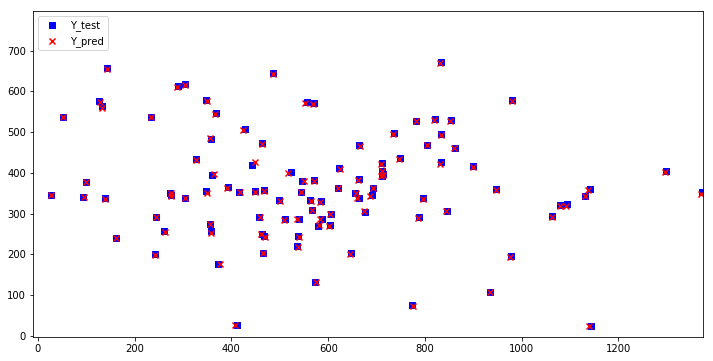

In [47]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)

X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [ ]:
#stateless SimpleRNN with shuffle=True trained for 40 iterations (sample size)
timesteps=18
sample_size=40
X_RMSE=[]
Y_RMSE=[]

start = time.time()

for i in range(sample_size):
    print('Iteration: ', i)
    model= stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)
    
#     es= EarlyStopping(monitor='val_loss', min_delta=0, patience=2, verbose=1, mode='min', restore_best_weights= True)
    model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=300, verbose=0, shuffle=True)
    
    Y_pred = model.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)

    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

[3.1574876059282246, 2.9550549104808375, 3.009223783104567, 3.114660189200687, 3.0237802323773737, 3.7483268184883247, 3.0614876539520752, 2.9565287278830468, 2.858668597379728, 4.360103655594656, 3.2710908210362653, 3.110037306074046, 2.8400098598436, 3.192817688953257, 3.1559203432113128, 3.063981783891493, 2.961764158995875, 2.9179949674667993, 3.1351157929487194, 3.27511722917443, 2.8574892076911014, 3.3436055512694938, 3.994241997495418, 3.117689670055752, 4.289681725813602, 2.860138622018903, 2.8087516956539207, 3.1553304151307957, 3.9432600156199635, 3.2647217995240165, 2.7814040877463166, 2.8024157065540916, 2.874068587653545, 3.1383137688135796, 2.888420010025219, 3.373171228419206, 3.166651200234642, 2.673748638870095, 2.9429384466528137, 3.082592555722157]
X-coord RMSE Mean: 3.1631951764237485

[3.168146642219205, 3.2298599080664387, 3.557040138986695, 3.231347153996914, 3.2173602200819507, 3.2011663811315136, 3.555738181409257, 3.2745641362293822, 3.3736055251095487, 3.2637495570389183, 3.285471448558044, 3.175692409300712, 4.174665532253352, 3.2772820891614303, 3.405186545611681, 3.9161279731105383, 3.4873498484806533, 3.3003540690936384, 3.539540795048659, 3.2684151487879904, 3.367870229478121, 3.184149387120344, 3.494237996622465, 3.3610071431088246, 4.035025725567, 3.1889559505409326, 3.2416541204221816, 4.316830687128801, 3.333961376650445, 3.2969368854860868, 3.312739277954565, 3.2350388896389286, 3.291361557727637, 3.183391469110143, 3.2666617000540015, 3.3408392261389954, 3.5794590586708557, 3.245156218102753, 3.323303945943898, 3.4109008693067335]
Y-coord RMSE Mean: 3.3978036354612557

In [20]:
#Results atfer training for a sample size of 40 iterations
print('Mean XRMSE: ', np.round(3.1631951764237485, 3))
print('Mean YRMSE: ', np.round(3.3978036354612557, 3))
print('Average: ', np.round(np.mean([3.1631951764237485,3.3978036354612557]),3))

Mean XRMSE:  3.163
Mean YRMSE:  3.398
Average:  3.28


In [48]:
#simpleRNN call model definition
simpleRNN_model2= stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)
#show model summary
simpleRNN_model2.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_2 (SimpleRNN)     (None, 30)                990       
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 2)                 0         
Total params: 1,052
Trainable params: 1,052
Non-trainable params: 0
_________________________________________________________________


In [49]:
#Train simpleRNN stateless model with shuffle=False
history= stateless_fit(simpleRNN_model2, X_train, Y_train, X_val, Y_val, 128,300, 'simple_rnn_wts_2.hdf5', False)

Train on 7680 samples, validate on 2560 samples
Epoch 1/300
 - 1s - loss: 0.0295 - rmse: 0.1486 - val_loss: 0.0042 - val_rmse: 0.0644

Epoch 00001: val_loss improved from inf to 0.00417, saving model to simple_rnn_wts_2.hdf5
Epoch 2/300
 - 1s - loss: 0.0024 - rmse: 0.0481 - val_loss: 0.0014 - val_rmse: 0.0375

Epoch 00002: val_loss improved from 0.00417 to 0.00142, saving model to simple_rnn_wts_2.hdf5
Epoch 3/300
 - 1s - loss: 0.0011 - rmse: 0.0329 - val_loss: 7.5330e-04 - val_rmse: 0.0273

Epoch 00003: val_loss improved from 0.00142 to 0.00075, saving model to simple_rnn_wts_2.hdf5
Epoch 4/300
 - 1s - loss: 6.8040e-04 - rmse: 0.0258 - val_loss: 5.2027e-04 - val_rmse: 0.0227

Epoch 00004: val_loss improved from 0.00075 to 0.00052, saving model to simple_rnn_wts_2.hdf5
Epoch 5/300
 - 1s - loss: 4.9921e-04 - rmse: 0.0221 - val_loss: 4.0022e-04 - val_rmse: 0.0199

Epoch 00005: val_loss improved from 0.00052 to 0.00040, saving model to simple_rnn_wts_2.hdf5
Epoch 6/300
 - 1s - loss: 4.042

 - 1s - loss: 7.3186e-05 - rmse: 0.0081 - val_loss: 5.8399e-05 - val_rmse: 0.0075

Epoch 00044: val_loss improved from 0.00006 to 0.00006, saving model to simple_rnn_wts_2.hdf5
Epoch 45/300
 - 1s - loss: 7.2322e-05 - rmse: 0.0080 - val_loss: 5.8231e-05 - val_rmse: 0.0075

Epoch 00045: val_loss improved from 0.00006 to 0.00006, saving model to simple_rnn_wts_2.hdf5
Epoch 46/300
 - 1s - loss: 7.1616e-05 - rmse: 0.0080 - val_loss: 5.8194e-05 - val_rmse: 0.0075

Epoch 00046: val_loss improved from 0.00006 to 0.00006, saving model to simple_rnn_wts_2.hdf5
Epoch 47/300
 - 1s - loss: 7.0728e-05 - rmse: 0.0079 - val_loss: 5.7676e-05 - val_rmse: 0.0075

Epoch 00047: val_loss improved from 0.00006 to 0.00006, saving model to simple_rnn_wts_2.hdf5
Epoch 48/300
 - 1s - loss: 6.9768e-05 - rmse: 0.0079 - val_loss: 5.6966e-05 - val_rmse: 0.0075

Epoch 00048: val_loss improved from 0.00006 to 0.00006, saving model to simple_rnn_wts_2.hdf5
Epoch 49/300
 - 1s - loss: 6.8790e-05 - rmse: 0.0078 - val_loss


Epoch 00087: val_loss improved from 0.00003 to 0.00003, saving model to simple_rnn_wts_2.hdf5
Epoch 88/300
 - 1s - loss: 4.0888e-05 - rmse: 0.0057 - val_loss: 2.5952e-05 - val_rmse: 0.0050

Epoch 00088: val_loss improved from 0.00003 to 0.00003, saving model to simple_rnn_wts_2.hdf5
Epoch 89/300
 - 1s - loss: 4.0351e-05 - rmse: 0.0057 - val_loss: 2.5708e-05 - val_rmse: 0.0050

Epoch 00089: val_loss improved from 0.00003 to 0.00003, saving model to simple_rnn_wts_2.hdf5
Epoch 90/300
 - 1s - loss: 3.9793e-05 - rmse: 0.0056 - val_loss: 2.5387e-05 - val_rmse: 0.0049

Epoch 00090: val_loss improved from 0.00003 to 0.00003, saving model to simple_rnn_wts_2.hdf5
Epoch 91/300
 - 1s - loss: 3.9232e-05 - rmse: 0.0056 - val_loss: 2.5058e-05 - val_rmse: 0.0049

Epoch 00091: val_loss improved from 0.00003 to 0.00003, saving model to simple_rnn_wts_2.hdf5
Epoch 92/300
 - 1s - loss: 3.8698e-05 - rmse: 0.0055 - val_loss: 2.4804e-05 - val_rmse: 0.0049

Epoch 00092: val_loss improved from 0.00003 to 0.


Epoch 00132: val_loss improved from 0.00002 to 0.00002, saving model to simple_rnn_wts_2.hdf5
Epoch 133/300
 - 1s - loss: 2.7167e-05 - rmse: 0.0045 - val_loss: 1.7681e-05 - val_rmse: 0.0042

Epoch 00133: val_loss improved from 0.00002 to 0.00002, saving model to simple_rnn_wts_2.hdf5
Epoch 134/300
 - 1s - loss: 2.6966e-05 - rmse: 0.0045 - val_loss: 1.7565e-05 - val_rmse: 0.0041

Epoch 00134: val_loss improved from 0.00002 to 0.00002, saving model to simple_rnn_wts_2.hdf5
Epoch 135/300
 - 1s - loss: 2.6768e-05 - rmse: 0.0045 - val_loss: 1.7457e-05 - val_rmse: 0.0041

Epoch 00135: val_loss improved from 0.00002 to 0.00002, saving model to simple_rnn_wts_2.hdf5
Epoch 136/300
 - 1s - loss: 2.6574e-05 - rmse: 0.0044 - val_loss: 1.7356e-05 - val_rmse: 0.0041

Epoch 00136: val_loss improved from 0.00002 to 0.00002, saving model to simple_rnn_wts_2.hdf5
Epoch 137/300
 - 1s - loss: 2.6383e-05 - rmse: 0.0044 - val_loss: 1.7262e-05 - val_rmse: 0.0041

Epoch 00137: val_loss improved from 0.00002 


Epoch 00175: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_2.hdf5
Epoch 176/300
 - 1s - loss: 2.1029e-05 - rmse: 0.0038 - val_loss: 1.3531e-05 - val_rmse: 0.0036

Epoch 00176: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_2.hdf5
Epoch 177/300
 - 1s - loss: 2.0959e-05 - rmse: 0.0038 - val_loss: 1.3464e-05 - val_rmse: 0.0036

Epoch 00177: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_2.hdf5
Epoch 178/300
 - 1s - loss: 2.0893e-05 - rmse: 0.0038 - val_loss: 1.3415e-05 - val_rmse: 0.0036

Epoch 00178: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_2.hdf5
Epoch 179/300
 - 1s - loss: 2.0753e-05 - rmse: 0.0037 - val_loss: 1.3167e-05 - val_rmse: 0.0036

Epoch 00179: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_2.hdf5
Epoch 180/300
 - 1s - loss: 2.0684e-05 - rmse: 0.0037 - val_loss: 1.3073e-05 - val_rmse: 0.0036

Epoch 00180: val_loss improved from 0.00001 


Epoch 00222: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_2.hdf5
Epoch 223/300
 - 1s - loss: 1.8671e-05 - rmse: 0.0034 - val_loss: 9.3583e-06 - val_rmse: 0.0030

Epoch 00223: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_2.hdf5
Epoch 224/300
 - 1s - loss: 1.8632e-05 - rmse: 0.0034 - val_loss: 9.1137e-06 - val_rmse: 0.0029

Epoch 00224: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_2.hdf5
Epoch 225/300
 - 1s - loss: 1.8593e-05 - rmse: 0.0034 - val_loss: 8.8683e-06 - val_rmse: 0.0029

Epoch 00225: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_2.hdf5
Epoch 226/300
 - 1s - loss: 1.8553e-05 - rmse: 0.0034 - val_loss: 8.6289e-06 - val_rmse: 0.0029

Epoch 00226: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_2.hdf5
Epoch 227/300
 - 1s - loss: 1.8514e-05 - rmse: 0.0034 - val_loss: 8.4018e-06 - val_rmse: 0.0028

Epoch 00227: val_loss improved from 0.00001 


Epoch 00274: val_loss did not improve from 0.00001
Epoch 275/300
 - 1s - loss: 1.7886e-05 - rmse: 0.0033 - val_loss: 9.6015e-06 - val_rmse: 0.0030

Epoch 00275: val_loss did not improve from 0.00001
Epoch 276/300
 - 1s - loss: 1.7927e-05 - rmse: 0.0033 - val_loss: 9.7238e-06 - val_rmse: 0.0031

Epoch 00276: val_loss did not improve from 0.00001
Epoch 277/300
 - 1s - loss: 1.7972e-05 - rmse: 0.0034 - val_loss: 9.8399e-06 - val_rmse: 0.0031

Epoch 00277: val_loss did not improve from 0.00001
Epoch 278/300
 - 1s - loss: 1.8014e-05 - rmse: 0.0034 - val_loss: 9.9005e-06 - val_rmse: 0.0031

Epoch 00278: val_loss did not improve from 0.00001
Epoch 279/300
 - 1s - loss: 1.8040e-05 - rmse: 0.0034 - val_loss: 9.8517e-06 - val_rmse: 0.0031

Epoch 00279: val_loss did not improve from 0.00001
Epoch 280/300
 - 1s - loss: 1.8038e-05 - rmse: 0.0034 - val_loss: 9.6826e-06 - val_rmse: 0.0030

Epoch 00280: val_loss did not improve from 0.00001
Epoch 281/300
 - 1s - loss: 1.8004e-05 - rmse: 0.0034 - val_

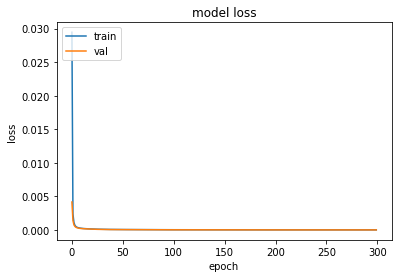

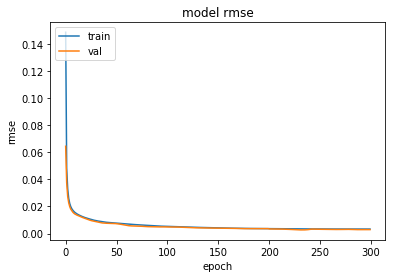

In [50]:
#plot loss and rmse curve for simpleRNN_model1
stateless_learn_curve(history)

In [ ]:
weights_saved_file= 'simple_rnn_wts_2.hdf5'
simpleRNN_model2.load_weights(weights_saved_file)

In [51]:
#evaluate simpleRNN_model2 performance
Y_Pred_test = simpleRNN_model2.predict(X_test)

xrmse,yrmse= calculate_RMSE(Y_Pred_test, Y_test)

print('Test Score (X-coord) XRMSE', str(xrmse))
print('Test Score (Y-coord) YRMSE', str(yrmse))


Test Score (X-coord) XRMSE 2.562148437612604
Test Score (Y-coord) YRMSE 2.8247166913239514


In [52]:
#print the true and predicted values to compare
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [980.63293789 578.2967033 ]
Y_Pred:  [980.11664 575.228  ] 

Y_true:  [ 99.25398029 378.72927461]
Y_Pred:  [ 98.67486 378.09677] 

Y_true:  [1297.86892178  404.6721519 ]
Y_Pred:  [1296.7307   402.69525] 

Y_true:  [466.90793413 358.21167883]
Y_Pred:  [467.94012 356.23233] 

Y_true:  [781.0841617  528.31488203]
Y_Pred:  [780.3853 525.9406] 

Y_true:  [ 27.35703593 345.44890511]
Y_Pred:  [ 27.55246 346.298  ] 

Y_true:  [462.37295298 473.65156562]
Y_Pred:  [462.1929  471.08112] 

Y_true:  [1131.  344.]
Y_Pred:  [1128.5996  343.2745] 

Y_true:  [656.25832013 350.53164557]
Y_Pred:  [657.2702  351.19727] 

Y_true:  [ 50.85624564 537.8974359 ]
Y_Pred:  [ 51.06028 536.9857 ] 

Y_true:  [803.82941622 468.62823834]
Y_Pred:  [803.447   467.56253] 

Y_true:  [357.74801902 482.25383078]
Y_Pred:  [356.1236  485.26126] 

Y_true:  [304.4058908  618.52638191]
Y_Pred:  [304.03183 613.9958 ] 

Y_true:  [1079.20510836  320.81242236]
Y_Pred:  [1077.9725  319.2164] 

Y_true:  [1063.56896552  294.1

Y_Pred:  [993.7739 443.5911] 

Y_true:  [365.35869565 369.1796875 ]
Y_Pred:  [358.1554  366.36548] 

Y_true:  [645. 461.]
Y_Pred:  [643.80927 459.13437] 

Y_true:  [303.72612879 375.88321168]
Y_Pred:  [303.9822  373.59134] 

Y_true:  [832.18043973 663.06088083]
Y_Pred:  [832.12305 656.92896] 

Y_true:  [395.79344955 494.08194537]
Y_Pred:  [395.29404 493.0269 ] 

Y_true:  [436.3161486  534.48445596]
Y_Pred:  [439.87167 532.70105] 

Y_true:  [618.21288959 396.23117921]
Y_Pred:  [614.9262  394.55975] 

Y_true:  [673.28471738  53.10622711]
Y_Pred:  [670.57074   53.349545] 

Y_true:  [349.69994717 263.97135243]
Y_Pred:  [348.6162  262.25314] 

Y_true:  [1040.  194.]
Y_Pred:  [1038.5538   192.06363] 

Y_true:  [384.08716323 510.21119254]
Y_Pred:  [384.29254 508.33087] 

Y_true:  [368.72266244 475.26449034]
Y_Pred:  [364.3315  478.77188] 

Y_true:  [1131.69383698   95.52268603]
Y_Pred:  [1129.8683    94.73154] 

Y_true:  [374.05387931  29.49748744]
Y_Pred:  [372.4834    18.470762] 

Y_true:  

Y_Pred:  [837.2661 782.688 ] 

Y_true:  [441.55774783 707.0536965 ]
Y_Pred:  [435.42038 705.33685] 

Y_true:  [501.54331088 431.35486381]
Y_Pred:  [502.87363 431.27252] 

Y_true:  [287.51030111 353.757495  ]
Y_Pred:  [287.5224  352.49393] 

Y_true:  [855.26518753 351.06928714]
Y_Pred:  [853.1374  349.72342] 

Y_true:  [682.94975576 203.86446886]
Y_Pred:  [683.00323 202.22795] 

Y_true:  [994. 553.]
Y_Pred:  [995.09454 550.0993 ] 

Y_true:  [569.19281564 369.88674217]
Y_Pred:  [569.2963 368.6507] 

Y_true:  [403.84152139 512.36175883]
Y_Pred:  [401.0554  510.26855] 

Y_true:  [392.90279115 567.00622568]
Y_Pred:  [386.76785 567.439  ] 

Y_true:  [442.22425409 543.76964981]
Y_Pred:  [442.11948 545.3484 ] 

Y_true:  [394.34056886 422.02554745]
Y_Pred:  [394.28644 420.41687] 

Y_true:  [379.69730586 108.05529647]
Y_Pred:  [378.2666  108.33851] 

Y_true:  [298.43606322 627.65075377]
Y_Pred:  [297.35538 622.22504] 

Y_true:  [989.43074884 466.06896552]
Y_Pred:  [988.08453 464.10812] 

Y_true:

Y_Pred:  [562.3247  360.57797] 

Y_true:  [898.04024768 456.14782609]
Y_Pred:  [897.3039  452.88116] 

Y_true:  [454.42561066 247.95300261]
Y_Pred:  [446.28693 252.70038] 

Y_true:  [1157.38546679  671.8848249 ]
Y_Pred:  [1157.7499  669.7548] 

Y_true:  [1131.0945589   349.45636243]
Y_Pred:  [1130.3975   347.44928] 

Y_true:  [534.80559958 282.78880746]
Y_Pred:  [535.4363  281.53323] 

Y_true:  [1117.79643963  388.98136646]
Y_Pred:  [1116.6335   387.19824] 

Y_true:  [579.16235918 233.19600726]
Y_Pred:  [576.49084 231.46631] 

Y_true:  [192.9691092  533.36557789]
Y_Pred:  [194.67564 532.4868 ] 

Y_true:  [464.57228916 587.7421875 ]
Y_Pred:  [464.675  585.2134] 

Y_true:  [391.54676259 559.13520408]
Y_Pred:  [392.80676 556.6761 ] 

Y_true:  [368.72266244 393.54297135]
Y_Pred:  [367.08966 393.98672] 

Y_true:  [945.2572636  108.59293804]
Y_Pred:  [942.24243 104.09486] 

Y_true:  [1363.57078313  461.6484375 ]
Y_Pred:  [1361.5975   460.82733] 

Y_true:  [1064.56393678  390.41708543]
Y_Pred

Y_Pred:  [200.71812  90.49109] 

Y_true:  [204.68919814 168.02087114]
Y_Pred:  [205.39252 168.5434 ] 

Y_true:  [664.30639197 402.68287808]
Y_Pred:  [673.51404 400.07886] 

Y_true:  [734.68900602 600.3515625 ]
Y_Pred:  [739.5361 597.7434] 

Y_true:  [689.30152419 277.86660617]
Y_Pred:  [687.56537 277.63196] 

Y_true:  [555.6886646  601.40234375]
Y_Pred:  [557.9471 600.7143] 

Y_true:  [207.36047372 620.90078329]
Y_Pred:  [207.06206 618.23364] 

Y_true:  [392.06501548 518.30186335]
Y_Pred:  [392.08215 515.36255] 

Y_true:  [661.0242608  562.70854922]
Y_Pred:  [660.42993 559.0877 ] 

Y_true:  [149.79721362 501.25962733]
Y_Pred:  [144.09186 501.34988] 

Y_true:  [319.10362694 228.98955614]
Y_Pred:  [320.96918 227.21048] 

Y_true:  [473.55100575 417.79020101]
Y_Pred:  [473.7144  415.96628] 

Y_true:  [223.76313842 219.78467153]
Y_Pred:  [224.69379 218.97522] 

Y_true:  [350.43159007 516.12524983]
Y_Pred:  [350.69202 515.0253 ] 

Y_true:  [542.12202853 456.44703531]
Y_Pred:  [541.56433 454.

Y_Pred:  [411.70175 536.341  ] 

Y_true:  [140.20545868 496.85233161]
Y_Pred:  [139.49971 493.80832] 

Y_true:  [438.96038035 315.0473018 ]
Y_Pred:  [436.28342 313.768  ] 

Y_true:  [477.5308908 149.1281407]
Y_Pred:  [477.22675 160.13838] 

Y_true:  [743.9772555  540.75647668]
Y_Pred:  [742.50507 537.1396 ] 

Y_true:  [496.55798542 496.09346642]
Y_Pred:  [494.40738 495.05798] 

Y_true:  [381.13855422 626.62109375]
Y_Pred:  [378.27948 624.75037] 

Y_true:  [492.37031167 319.34843438]
Y_Pred:  [492.8559 316.6109] 

Y_true:  [883.79926043 395.15589607]
Y_Pred:  [882.50366 393.96405] 

Y_true:  [776.97939778 366.66089274]
Y_Pred:  [776.0186  365.17825] 

Y_true:  [ -4.54813665 380.73828125]
Y_Pred:  [ -4.720097 379.54935 ] 

Y_true:  [899.89540412 336.55296469]
Y_Pred:  [898.64575 334.82568] 

Y_true:  [226. 373.]
Y_Pred:  [225.61691 371.0011 ] 

Y_true:  [394.34056886 272.79927007]
Y_Pred:  [391.7092 272.0083] 

Y_true:  [1170.73381295  471.64158163]
Y_Pred:  [1171.1924   469.64087] 

Y_t


Y_true:  [ 77.91835311 517.20512821]
Y_Pred:  [ 79.77827 514.2023 ] 

Y_true:  [828.92604332 148.37841439]
Y_Pred:  [827.6813  148.40376] 

Y_true:  [1120.57003012  106.484375  ]
Y_Pred:  [1117.2844   106.00159] 

Y_true:  [574.72230539 326.79562044]
Y_Pred:  [574.8785 325.9947] 

Y_true:  [551.63338616 359.6715523 ]
Y_Pred:  [551.9335  357.90796] 

Y_true:  [826. 527.]
Y_Pred:  [825.2742 523.9303] 

Y_true:  [382.1814759  258.84765625]
Y_Pred:  [383.157   256.23624] 

Y_true:  [908.67511886 427.41439041]
Y_Pred:  [910.1951  424.77408] 

Y_true:  [1263.52192287  623.11592272]
Y_Pred:  [1258.5854  621.5756] 

Y_true:  [814.1259112  417.00453721]
Y_Pred:  [812.1485  414.78973] 

Y_true:  [608.18431184 448.93929961]
Y_Pred:  [608.4694  448.99612] 

Y_true:  [491.46048851  47.74623116]
Y_Pred:  [488.8799    47.744358] 

Y_true:  [873.71872687 564.01044386]
Y_Pred:  [873.91846 562.8669 ] 

Y_true:  [301.41151611 425.26382412]
Y_Pred:  [300.60266 422.50946] 

Y_true:  [804.05018489 290.3157

Y_Pred:  [364.3839 298.2864] 

Y_true:  [1080.29555997  137.99637024]
Y_Pred:  [1077.0742   136.14647] 

Y_true:  [729.68588469 294.70961887]
Y_Pred:  [727.5493 294.04  ] 

Y_true:  [477.0873494 604.5546875]
Y_Pred:  [475.29294 601.06476] 

Y_true:  [764. 288.]
Y_Pred:  [763.0529  286.70447] 

Y_true:  [935.08415466 492.67098446]
Y_Pred:  [934.958   491.00092] 

Y_true:  [639.78313253 670.75390625]
Y_Pred:  [639.47504 671.76825] 

Y_true:  [1124.22832817   30.09192547]
Y_Pred:  [1122.3113     28.738073] 

Y_true:  [695.03539356 387.62891406]
Y_Pred:  [689.9444  387.51282] 

Y_true:  [1365.  311.]
Y_Pred:  [1363.1578   309.39124] 

Y_true:  [460.90966719 441.39307129]
Y_Pred:  [455.0851  442.69904] 

Y_true:  [923.30797676 276.33710859]
Y_Pred:  [922.15625 275.0817 ] 

Y_true:  [187.27522451 208.59427049]
Y_Pred:  [178.77203 209.80948] 

Y_true:  [312.95262768 624.0613577 ]
Y_Pred:  [313.36133 620.1876 ] 

Y_true:  [1109.66600398   99.91651543]
Y_Pred:  [1108.5474    99.09529] 

Y_true:

Y_true:  [169.60652009 493.71632124]
Y_Pred:  [171.47874 491.51892] 

Y_true:  [1341.16594828  613.45728643]
Y_Pred:  [1340.6996  610.8231] 

Y_true:  [1168.05567301  642.68607595]
Y_Pred:  [1168.0459   639.19836] 

Y_true:  [620.07278241 494.76165803]
Y_Pred:  [615.3588  492.65155] 

Y_true:  [1166.10359408  755.05316456]
Y_Pred:  [1164.9613  752.623 ] 

Y_true:  [608.8670977  513.08919598]
Y_Pred:  [608.74084 513.4438 ] 

Y_true:  [382.74751491 391.3738657 ]
Y_Pred:  [377.69922 389.56464] 

Y_true:  [253.66235632 310.32537688]
Y_Pred:  [256.38626 311.01163] 

Y_true:  [819.63286945 496.09346642]
Y_Pred:  [819.23706 493.08398] 

Y_true:  [896. 389.]
Y_Pred:  [894.9397  387.41467] 

Y_true:  [654.79503434 260.745503  ]
Y_Pred:  [651.1515  261.97394] 

Y_true:  [995.42444658 106.04280156]
Y_Pred:  [991.46985 104.74937] 

Y_true:  [339.22988506 374.1959799 ]
Y_Pred:  [340.4962  372.95645] 

Y_true:  [578.58978328 665.66708075]
Y_Pred:  [577.79895 663.0497 ] 

Y_true:  [391.16451857 505.2

Y_true:  [365.93649686 365.46153846]
Y_Pred:  [365.9941 362.8896] 

Y_true:  [324.22945966 353.30548303]
Y_Pred:  [325.80716 352.17154] 

Y_true:  [334.48112509 274.76277372]
Y_Pred:  [334.34558 273.7562 ] 

Y_true:  [801.5619195  251.64099379]
Y_Pred:  [801.93207 250.57239] 

Y_true:  [136.93343653 428.07826087]
Y_Pred:  [137.91809 424.4519 ] 

Y_true:  [292.48220516 302.3992674 ]
Y_Pred:  [292.90573 302.13373] 

Y_true:  [420.81752874 398.52763819]
Y_Pred:  [422.11398 397.1189 ] 

Y_true:  [422.33083832 335.63138686]
Y_Pred:  [423.19666 333.56927] 

Y_true:  [358.61334344 430.99611399]
Y_Pred:  [355.16916 427.86127] 

Y_true:  [1106.91252485  382.5862069 ]
Y_Pred:  [1105.4734  382.9978] 

Y_true:  [980.63293789 570.41391941]
Y_Pred:  [980.04083 567.5071 ] 

Y_true:  [306.22305389 366.06569343]
Y_Pred:  [306.53485 365.5329 ] 

Y_true:  [569.53892216 325.81386861]
Y_Pred:  [569.6521 325.5697] 

Y_true:  [453.59323825 339.77881412]
Y_Pred:  [451.86688 338.12448] 

Y_true:  [413.29518493


Y_true:  [468.7439759  441.68359375]
Y_Pred:  [472.25906 441.11615] 

Y_true:  [894.04226096 426.87674883]
Y_Pred:  [898.4911  427.33774] 

Y_true:  [528.95245642 176.87341772]
Y_Pred:  [526.4833  175.46457] 

Y_true:  [966.64705882 614.54037267]
Y_Pred:  [964.70404 612.19025] 

Y_true:  [384.08716323 456.44703531]
Y_Pred:  [383.42426 455.70895] 

Y_true:  [536.86814244 744.73463035]
Y_Pred:  [534.30536 739.5855 ] 

Y_true:  [652.58846918 345.97096189]
Y_Pred:  [649.51556 346.11722] 

Y_true:  [801.85525621 121.49633578]
Y_Pred:  [802.26917  119.466255] 

Y_true:  [660.51515152 386.28481013]
Y_Pred:  [660.72766 385.84836] 

Y_true:  [680.46332335 273.7810219 ]
Y_Pred:  [679.3669  272.65292] 

Y_true:  [331.40562546 417.57049608]
Y_Pred:  [331.7073  414.86578] 

Y_true:  [753.32275542  18.0621118 ]
Y_Pred:  [750.12805  16.68023] 

Y_true:  [396.78237952 559.37109375]
Y_Pred:  [395.1347  557.01996] 

Y_true:  [343.11516112 177.94870087]
Y_Pred:  [343.7368  175.70186] 

Y_true:  [389.208

Y_Pred:  [1022.98645  289.29364] 

Y_true:  [328.33012583 336.61313869]
Y_Pred:  [328.36078 335.21848] 

Y_true:  [337.90788555 291.56043956]
Y_Pred:  [339.86462 289.2901 ] 

Y_true:  [782.52008457 500.69493671]
Y_Pred:  [782.8855  500.69687] 

Y_true:  [681.5        469.49497487]
Y_Pred:  [682.92126 467.45477] 

Y_true:  [752.37755876 539.7111399 ]
Y_Pred:  [752.3184  537.16895] 

Y_true:  [963.54833597 117.73284477]
Y_Pred:  [960.0773  117.58459] 

Y_true:  [303.86330935 509.72704082]
Y_Pred:  [305.55402 514.2497 ] 

Y_true:  [760.1516112 340.3164557]
Y_Pred:  [760.05505 337.86377] 

Y_true:  [1346.670895    649.83670886]
Y_Pred:  [1348.2327   645.42773] 

Y_true:  [684. 468.]
Y_Pred:  [684.0463 467.0977] 

Y_true:  [196.08364175 491.31723238]
Y_Pred:  [198.31868 486.47958] 

Y_true:  [603.07475944 269.8540146 ]
Y_Pred:  [605.43787 268.27682] 

Y_true:  [615.28631801 261.82078614]
Y_Pred:  [613.5117  260.38904] 

Y_true:  [1365.  605.]
Y_Pred:  [1364.2476  602.1216] 

Y_true:  [1097.

Y_Pred:  [277.23737 418.92746] 

Y_true:  [814.83850932 455.34375   ]
Y_Pred:  [814.33765 454.923  ] 

Y_true:  [250.67744253 306.2701005 ]
Y_Pred:  [250.10349 304.7583 ] 

Y_true:  [532.35321405 222.94373866]
Y_Pred:  [532.31433 225.9233 ] 

Y_true:  [859.09940358 263.22050817]
Y_Pred:  [861.4793 261.975 ] 

Y_true:  [1046.07892204   70.2459144 ]
Y_Pred:  [1043.3282    70.55893] 

Y_true:  [859.6550449  496.23251166]
Y_Pred:  [859.2871 493.8669] 

Y_true:  [919.33358605 437.26813472]
Y_Pred:  [921.4769 437.5497] 

Y_true:  [1039.  289.]
Y_Pred:  [1039.0599   288.49023] 

Y_true:  [707.65805169 328.39564428]
Y_Pred:  [704.0319 329.6104] 

Y_true:  [902.11357074 545.6536965 ]
Y_Pred:  [898.52875 546.10754] 

Y_true:  [577.97253038 440.85542971]
Y_Pred:  [577.9788  439.18326] 

Y_true:  [676.74432118 337.09060626]
Y_Pred:  [679.5931  335.88794] 

Y_true:  [866.78873917  87.20233463]
Y_Pred:  [865.6461   86.08517] 

Y_true:  [332.87216059 386.55363091]
Y_Pred:  [331.59174 383.18146] 

Y_t

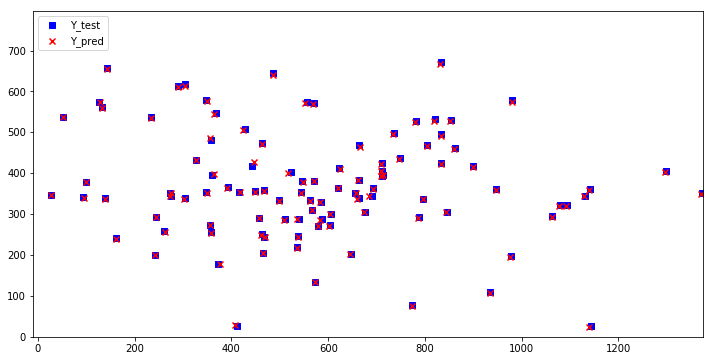

In [53]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)

X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [179]:
#stateless SimpleRNN with shuffle=False trained for 40 iterations (sample size)
timesteps=18
sample_size=40
X_RMSE=[]
Y_RMSE=[]

start = time.time()

for i in range(sample_size):
    print('Iteration: ', i)
    model= stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)
    
#     es= EarlyStopping(monitor='val_loss', min_delta=0, patience=2, verbose=1, mode='min', restore_best_weights= True)
    model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=300, verbose=0, shuffle=False)
    
    Y_pred = model.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)

    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

Iteration:  0
Model created and compiled
Iteration:  1
Model created and compiled
Iteration:  2
Model created and compiled
Iteration:  3
Model created and compiled
Iteration:  4
Model created and compiled
Iteration:  5
Model created and compiled
Iteration:  6
Model created and compiled
Iteration:  7
Model created and compiled
Iteration:  8
Model created and compiled
Iteration:  9
Model created and compiled
Iteration:  10
Model created and compiled
Iteration:  11
Model created and compiled
Iteration:  12
Model created and compiled
Iteration:  13
Model created and compiled
Iteration:  14
Model created and compiled
Iteration:  15
Model created and compiled
Iteration:  16
Model created and compiled
Iteration:  17
Model created and compiled
Iteration:  18
Model created and compiled
Iteration:  19
Model created and compiled
Iteration:  20
Model created and compiled
Iteration:  21
Model created and compiled
Iteration:  22
Model created and compiled
Iteration:  23
Model created and compiled
It

[2.8301806405801204, 2.8813065468347943, 2.9202837977627674, 2.811958065581607, 2.777581689056322, 2.9635797169030735, 2.806510206593647, 2.855509995606052, 2.8328706645388575, 2.7460655782079324, 2.810000779464189, 2.811243478699231, 2.6930865854378045, 2.8260094682414163, 2.8977116732615085, 2.828427248296661, 2.8431309424084827, 2.8841137899698968, 2.834357515394326, 3.1059938256261215, 2.9671960075407178, 2.775740541777549, 2.839520467674219, 2.8959208643654324, 2.680528659770576, 2.7081759367507154, 2.7797404928165372, 2.774144344624737, 3.418428670178335, 2.893382205364344, 3.038383450628057, 2.9475891071163716, 2.70626953939466, 2.9296031742728816, 2.808152350353235, 2.8280135630626497, 2.8574657703665394, 2.9092804848946376, 2.8461351330109266, 2.902513549916776]
X-coord RMSE Mean: 2.861652663058618

[3.235233048951589, 3.385602834489679, 3.2562115946784744, 3.275224955568472, 3.239513923487185, 3.2786533897747003, 3.2665894721738247, 3.2395512687446852, 3.2393497959926134, 3.307297752945542, 3.3672346884137037, 3.3149607103050003, 3.252300033014301, 3.2328948590664717, 3.2251095059760195, 3.2531491255183664, 3.3604095784127095, 3.2730906305018883, 3.2267274703131092, 3.2446617552087673, 3.337090127431775, 3.385503394415466, 3.263638034019378, 3.3027259923032637, 3.2635817433417484, 3.197689611837395, 3.292943317131608, 3.2924188733899236, 3.202510807105569, 3.4173951279292227, 3.2952071695679375, 3.1877326513686977, 3.3686620103694405, 3.2455490006172223, 3.280124561552558, 3.312834114586966, 3.1938231884914625, 3.3315210319610826, 3.2943151008782103, 3.2638496461932824]
Y-coord RMSE Mean: 3.2800720474507328

Time Took :153.97 min 

In [34]:
print('Average: ', np.mean([2.861652663058618, 3.2800720474507328]))

Average:  3.0708623552546754


In [21]:
#Results after training for 40 iterations
print('Mean XRMSE: ', np.round(2.861652663058618, 3))
print('Mean YRMSE: ', np.round(3.2800720474507328, 3))
print('Average: ', np.round(np.mean([2.861652663058618,3.2800720474507328]),3))

Mean XRMSE:  2.862
Mean YRMSE:  3.28
Average:  3.071


Stateless Simple RNN performs better with shuffle=False. both XRMSE and YRMSE mean values are less as compared to Model-1.

In [54]:
#simpleRNN stacked stateless model with 2 hidden layers
timesteps=18
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def stacked_stateless_simpleRNN(units,lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=True, input_shape=(timesteps,2)))
    model.add(SimpleRNN(units, return_sequences=False))
    #model.add(Dropout(0.1))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [57]:
#simpleRNN call model definition
simpleRNN_model3= stacked_stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)
simpleRNN_model3.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_5 (SimpleRNN)     (None, 18, 30)            990       
_________________________________________________________________
simple_rnn_6 (SimpleRNN)     (None, 30)                1830      
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 2)                 0         
Total params: 2,882
Trainable params: 2,882
Non-trainable params: 0
_________________________________________________________________


In [58]:
#Train stacked simpleRNN stateless model with shuffle=True
history= stateless_fit(simpleRNN_model3, X_train, Y_train, X_val, Y_val, 128, 300, 'simple_rnn_wts_3.hdf5', False)

Train on 7680 samples, validate on 2560 samples
Epoch 1/300
 - 2s - loss: 0.0272 - rmse: 0.1285 - val_loss: 0.0020 - val_rmse: 0.0450

Epoch 00001: val_loss improved from inf to 0.00203, saving model to simple_rnn_wts_3.hdf5
Epoch 2/300
 - 2s - loss: 0.0014 - rmse: 0.0366 - val_loss: 8.5342e-04 - val_rmse: 0.0291

Epoch 00002: val_loss improved from 0.00203 to 0.00085, saving model to simple_rnn_wts_3.hdf5
Epoch 3/300
 - 2s - loss: 7.1082e-04 - rmse: 0.0264 - val_loss: 5.7720e-04 - val_rmse: 0.0239

Epoch 00003: val_loss improved from 0.00085 to 0.00058, saving model to simple_rnn_wts_3.hdf5
Epoch 4/300
 - 2s - loss: 5.0998e-04 - rmse: 0.0223 - val_loss: 4.3280e-04 - val_rmse: 0.0206

Epoch 00004: val_loss improved from 0.00058 to 0.00043, saving model to simple_rnn_wts_3.hdf5
Epoch 5/300
 - 2s - loss: 4.1728e-04 - rmse: 0.0201 - val_loss: 3.5064e-04 - val_rmse: 0.0185

Epoch 00005: val_loss improved from 0.00043 to 0.00035, saving model to simple_rnn_wts_3.hdf5
Epoch 6/300
 - 2s - los


Epoch 00046: val_loss did not improve from 0.00005
Epoch 47/300
 - 2s - loss: 5.5359e-05 - rmse: 0.0070 - val_loss: 5.2476e-05 - val_rmse: 0.0072

Epoch 00047: val_loss did not improve from 0.00005
Epoch 48/300
 - 2s - loss: 5.3918e-05 - rmse: 0.0069 - val_loss: 5.6104e-05 - val_rmse: 0.0075

Epoch 00048: val_loss did not improve from 0.00005
Epoch 49/300
 - 2s - loss: 5.2655e-05 - rmse: 0.0068 - val_loss: 5.9584e-05 - val_rmse: 0.0077

Epoch 00049: val_loss did not improve from 0.00005
Epoch 50/300
 - 2s - loss: 5.2147e-05 - rmse: 0.0068 - val_loss: 6.0347e-05 - val_rmse: 0.0078

Epoch 00050: val_loss did not improve from 0.00005
Epoch 51/300
 - 2s - loss: 5.1723e-05 - rmse: 0.0067 - val_loss: 5.8787e-05 - val_rmse: 0.0077

Epoch 00051: val_loss did not improve from 0.00005
Epoch 52/300
 - 2s - loss: 5.1284e-05 - rmse: 0.0067 - val_loss: 5.6812e-05 - val_rmse: 0.0075

Epoch 00052: val_loss did not improve from 0.00005
Epoch 53/300
 - 2s - loss: 5.0723e-05 - rmse: 0.0067 - val_loss: 5

 - 2s - loss: 3.7309e-05 - rmse: 0.0055 - val_loss: 2.3732e-05 - val_rmse: 0.0048

Epoch 00098: val_loss did not improve from 0.00001
Epoch 99/300
 - 2s - loss: 3.7258e-05 - rmse: 0.0055 - val_loss: 2.0519e-05 - val_rmse: 0.0045

Epoch 00099: val_loss did not improve from 0.00001
Epoch 100/300
 - 2s - loss: 3.6505e-05 - rmse: 0.0055 - val_loss: 1.9390e-05 - val_rmse: 0.0044

Epoch 00100: val_loss did not improve from 0.00001
Epoch 101/300
 - 2s - loss: 3.6024e-05 - rmse: 0.0054 - val_loss: 1.9592e-05 - val_rmse: 0.0044

Epoch 00101: val_loss did not improve from 0.00001
Epoch 102/300
 - 2s - loss: 3.5821e-05 - rmse: 0.0054 - val_loss: 2.0219e-05 - val_rmse: 0.0045

Epoch 00102: val_loss did not improve from 0.00001
Epoch 103/300
 - 2s - loss: 3.5719e-05 - rmse: 0.0054 - val_loss: 2.0831e-05 - val_rmse: 0.0045

Epoch 00103: val_loss did not improve from 0.00001
Epoch 104/300
 - 2s - loss: 3.5624e-05 - rmse: 0.0054 - val_loss: 2.1315e-05 - val_rmse: 0.0046

Epoch 00104: val_loss did not 


Epoch 00153: val_loss did not improve from 0.00001
Epoch 154/300
 - 2s - loss: 2.9077e-05 - rmse: 0.0047 - val_loss: 2.0313e-05 - val_rmse: 0.0045

Epoch 00154: val_loss did not improve from 0.00001
Epoch 155/300
 - 2s - loss: 2.8982e-05 - rmse: 0.0047 - val_loss: 2.0134e-05 - val_rmse: 0.0045

Epoch 00155: val_loss did not improve from 0.00001
Epoch 156/300
 - 2s - loss: 2.8890e-05 - rmse: 0.0047 - val_loss: 1.9949e-05 - val_rmse: 0.0044

Epoch 00156: val_loss did not improve from 0.00001
Epoch 157/300
 - 2s - loss: 2.8796e-05 - rmse: 0.0047 - val_loss: 1.9755e-05 - val_rmse: 0.0044

Epoch 00157: val_loss did not improve from 0.00001
Epoch 158/300
 - 2s - loss: 2.8700e-05 - rmse: 0.0047 - val_loss: 1.9566e-05 - val_rmse: 0.0044

Epoch 00158: val_loss did not improve from 0.00001
Epoch 159/300
 - 2s - loss: 2.8601e-05 - rmse: 0.0047 - val_loss: 1.9379e-05 - val_rmse: 0.0044

Epoch 00159: val_loss did not improve from 0.00001
Epoch 160/300
 - 2s - loss: 2.8497e-05 - rmse: 0.0046 - val_

 - 2s - loss: 2.5660e-05 - rmse: 0.0043 - val_loss: 1.0533e-05 - val_rmse: 0.0032

Epoch 00208: val_loss did not improve from 0.00001
Epoch 209/300
 - 2s - loss: 2.5478e-05 - rmse: 0.0043 - val_loss: 1.0432e-05 - val_rmse: 0.0032

Epoch 00209: val_loss did not improve from 0.00001
Epoch 210/300
 - 2s - loss: 2.5343e-05 - rmse: 0.0043 - val_loss: 1.0386e-05 - val_rmse: 0.0032

Epoch 00210: val_loss did not improve from 0.00001
Epoch 211/300
 - 2s - loss: 2.5245e-05 - rmse: 0.0043 - val_loss: 1.0375e-05 - val_rmse: 0.0032

Epoch 00211: val_loss did not improve from 0.00001
Epoch 212/300
 - 2s - loss: 2.5171e-05 - rmse: 0.0043 - val_loss: 1.0378e-05 - val_rmse: 0.0032

Epoch 00212: val_loss did not improve from 0.00001
Epoch 213/300
 - 2s - loss: 2.5112e-05 - rmse: 0.0042 - val_loss: 1.0400e-05 - val_rmse: 0.0032

Epoch 00213: val_loss did not improve from 0.00001
Epoch 214/300
 - 2s - loss: 2.5062e-05 - rmse: 0.0042 - val_loss: 1.0432e-05 - val_rmse: 0.0032

Epoch 00214: val_loss did not


Epoch 00263: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_3.hdf5
Epoch 264/300
 - 2s - loss: 2.3389e-05 - rmse: 0.0040 - val_loss: 8.0171e-06 - val_rmse: 0.0028

Epoch 00264: val_loss did not improve from 0.00001
Epoch 265/300
 - 2s - loss: 2.3332e-05 - rmse: 0.0040 - val_loss: 8.0538e-06 - val_rmse: 0.0028

Epoch 00265: val_loss did not improve from 0.00001
Epoch 266/300
 - 2s - loss: 2.3298e-05 - rmse: 0.0040 - val_loss: 8.0905e-06 - val_rmse: 0.0028

Epoch 00266: val_loss did not improve from 0.00001
Epoch 267/300
 - 2s - loss: 2.3273e-05 - rmse: 0.0040 - val_loss: 8.1163e-06 - val_rmse: 0.0028

Epoch 00267: val_loss did not improve from 0.00001
Epoch 268/300
 - 2s - loss: 2.3252e-05 - rmse: 0.0040 - val_loss: 8.1219e-06 - val_rmse: 0.0028

Epoch 00268: val_loss did not improve from 0.00001
Epoch 269/300
 - 2s - loss: 2.3236e-05 - rmse: 0.0040 - val_loss: 8.1047e-06 - val_rmse: 0.0028

Epoch 00269: val_loss did not improve from 0.00001
Epoch 270/300
 - 

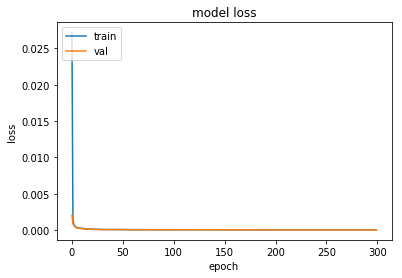

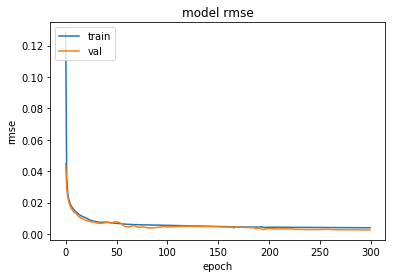

In [59]:
#plot loss and rmse curve for simpleRNN_model1
stateless_learn_curve(history)

In [ ]:
weights_saved_file= 'simple_rnn_wts_3.hdf5'
simpleRNN_model3.load_weights(weights_saved_file)

In [60]:
#evaluate simpleRNN_model3 performance
Y_Pred_test = simpleRNN_model3.predict(X_test)
xrmse, yrmse= calculate_RMSE(Y_Pred_test, Y_test)

print('Test Score (X-coord) XRMSE', str(xrmse))
print('Test Score (Y-coord) YRMSE', str(yrmse))


Test Score (X-coord) XRMSE 3.3684248063354323
Test Score (Y-coord) YRMSE 2.530059883972542


In [61]:
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [980.63293789 578.2967033 ]
Y_Pred:  [979.43616 577.70874] 

Y_true:  [ 99.25398029 378.72927461]
Y_Pred:  [ 98.54146 380.45798] 

Y_true:  [1297.86892178  404.6721519 ]
Y_Pred:  [1295.4204  403.2625] 

Y_true:  [466.90793413 358.21167883]
Y_Pred:  [467.41852 357.6978 ] 

Y_true:  [781.0841617  528.31488203]
Y_Pred:  [780.2724 528.241 ] 

Y_true:  [ 27.35703593 345.44890511]
Y_Pred:  [ 26.821081 349.18463 ] 

Y_true:  [462.37295298 473.65156562]
Y_Pred:  [462.13806 473.74185] 

Y_true:  [1131.  344.]
Y_Pred:  [1130.3053   343.18994] 

Y_true:  [656.25832013 350.53164557]
Y_Pred:  [657.1629 352.7777] 

Y_true:  [ 50.85624564 537.8974359 ]
Y_Pred:  [ 53.09548 540.2725 ] 

Y_true:  [803.82941622 468.62823834]
Y_Pred:  [802.6746 469.8256] 

Y_true:  [357.74801902 482.25383078]
Y_Pred:  [356.40836 487.8924 ] 

Y_true:  [304.4058908  618.52638191]
Y_Pred:  [303.74286 617.54755] 

Y_true:  [1079.20510836  320.81242236]
Y_Pred:  [1078.2987   319.89893] 

Y_true:  [1063.56896552  294.1

Y_Pred:  [617.508   150.38354] 

Y_true:  [362.13787639 509.13590939]
Y_Pred:  [360.14   512.7431] 

Y_true:  [414.44411547 568.22454308]
Y_Pred:  [414.34918 568.78674] 

Y_true:  [296.88848921 211.21938776]
Y_Pred:  [286.09323 213.06718] 

Y_true:  [1365.  358.]
Y_Pred:  [1362.0026  356.0021] 

Y_true:  [329.20935101 275.79487179]
Y_Pred:  [329.48123 276.09558] 

Y_true:  [862.58161648 259.13257828]
Y_Pred:  [858.9305  258.15024] 

Y_true:  [1006.08854668   72.12996109]
Y_Pred:  [1000.7887    72.75714] 

Y_true:  [408.44665341 250.03901996]
Y_Pred:  [416.13556 254.41402] 

Y_true:  [977.44955098 461.82345103]
Y_Pred:  [977.3336  461.02896] 

Y_true:  [365.31362275 200.14963504]
Y_Pred:  [363.12573 200.67166] 

Y_true:  [677.47596408 340.85409727]
Y_Pred:  [675.9547  340.81714] 

Y_true:  [861.07686335 509.984375  ]
Y_Pred:  [860.97656 510.71732] 

Y_true:  [1129.63127311  123.10926049]
Y_Pred:  [1131.353    123.26117] 

Y_true:  [1148.46336047  359.62663185]
Y_Pred:  [1148.0719   358.

Y_true:  [619.13198758 439.58203125]
Y_Pred:  [616.22833 437.71838] 

Y_true:  [677.36978131 308.62341198]
Y_Pred:  [674.95734 310.95978] 

Y_true:  [726.93240557 233.19600726]
Y_Pred:  [724.29    233.15877] 

Y_true:  [728.76805832 366.47549909]
Y_Pred:  [729.24585 366.01404] 

Y_true:  [869.4547642  274.97898833]
Y_Pred:  [874.1576  268.93622] 

Y_true:  [704.41726619 419.14540816]
Y_Pred:  [702.9868  416.17206] 

Y_true:  [ 59.73649149 221.61488251]
Y_Pred:  [ 58.42744 227.15508] 

Y_true:  [497.94578313 516.2890625 ]
Y_Pred:  [502.51297 515.0622 ] 

Y_true:  [810.63497095 490.85609594]
Y_Pred:  [809.26636 490.83994] 

Y_true:  [999.87848297 659.65217391]
Y_Pred:  [995.21356 659.5171 ] 

Y_true:  [868.51849267 339.84249084]
Y_Pred:  [867.3147  338.36362] 

Y_true:  [577.24088748 462.3610926 ]
Y_Pred:  [578.69275 462.89932] 

Y_true:  [362.16062176 260.03649635]
Y_Pred:  [358.9826  260.67593] 

Y_true:  [309. 610.]
Y_Pred:  [308.36588 614.1077 ] 

Y_true:  [978.18119387 411.28514324]

Y_true:  [302.14315901 360.74683544]
Y_Pred:  [300.5369  361.92172] 

Y_true:  [424.96752816 365.01088929]
Y_Pred:  [424.47574 365.80002] 

Y_true:  [569.19281564 369.88674217]
Y_Pred:  [568.45624 370.28598] 

Y_true:  [1056.  415.]
Y_Pred:  [1056.8491   414.26413] 

Y_true:  [993.88627748 502.07901554]
Y_Pred:  [991.51117 502.14642] 

Y_true:  [1009.42107796  109.81089494]
Y_Pred:  [1008.2322   111.60793] 

Y_true:  [936.13419257 376.63860104]
Y_Pred:  [939.5204  377.75256] 

Y_true:  [864.01129518 441.68359375]
Y_Pred:  [862.2212 441.1145] 

Y_true:  [107.98993808 478.20248447]
Y_Pred:  [109.37937 478.813  ] 

Y_true:  [413.41894893 568.22454308]
Y_Pred:  [412.5657 570.2255] 

Y_true:  [704.41726619 450.0255102 ]
Y_Pred:  [705.45215 450.60318] 

Y_true:  [528.19051205 471.10546875]
Y_Pred:  [527.61334 472.75174] 

Y_true:  [220.19177019 519.44140625]
Y_Pred:  [222.64734 516.23193] 

Y_true:  [753.54937044 481.44736842]
Y_Pred:  [752.27374 481.5017 ] 

Y_true:  [460.76275679 362.08166

Y_true:  [991.24774096 366.02734375]
Y_Pred:  [990.53906 365.46786] 

Y_true:  [ 76.95184927 517.20512821]
Y_Pred:  [ 78.25795 519.5789 ] 

Y_true:  [542.44930417 629.37295826]
Y_Pred:  [543.6806  629.36304] 

Y_true:  [1234.57735011  342.77023499]
Y_Pred:  [1232.6777   343.01855] 

Y_true:  [1078.49353448  274.84170854]
Y_Pred:  [1076.6132  274.9425] 

Y_true:  [475.54252509 520.42638241]
Y_Pred:  [474.0161 521.8303] 

Y_true:  [558.97017893 239.78675136]
Y_Pred:  [559.2329  241.40695] 

Y_true:  [1007.78727634  274.20508167]
Y_Pred:  [1006.8546  274.6372] 

Y_true:  [584.55731643 413.43570953]
Y_Pred:  [582.47925 412.9025 ] 

Y_true:  [1246.42213386  418.46914701]
Y_Pred:  [1243.445    417.61526] 

Y_true:  [1365.  424.]
Y_Pred:  [1361.5876   422.26816] 

Y_true:  [1044.02905441  119.34576949]
Y_Pred:  [1041.4811   119.55262] 

Y_true:  [451.55534167 192.08093385]
Y_Pred:  [445.74637 182.77565] 

Y_true:  [520.08273381 314.15306122]
Y_Pred:  [518.9344  314.49734] 

Y_true:  [1182.293

Y_true:  [ 91.51665433 316.43211488]
Y_Pred:  [ 92.0072  314.84064] 

Y_true:  [681.5       314.5390625]
Y_Pred:  [678.07623 313.91684] 

Y_true:  [137.84159107 465.96703297]
Y_Pred:  [134.81331 469.48685] 

Y_true:  [833.72136223 481.20993789]
Y_Pred:  [831.90283 486.3628 ] 

Y_true:  [1130.23204023  632.71984925]
Y_Pred:  [1128.7739   632.97174] 

Y_true:  [820.55069583 397.9646098 ]
Y_Pred:  [818.3676  398.77728] 

Y_true:  [367.57555342 388.02178988]
Y_Pred:  [371.2031  384.11688] 

Y_true:  [433.10723719 377.41372418]
Y_Pred:  [431.4055 378.0745] 

Y_true:  [490. 251.]
Y_Pred:  [484.63028 252.19225] 

Y_true:  [774.32003012 506.83203125]
Y_Pred:  [773.354   506.78876] 

Y_true:  [167. 256.]
Y_Pred:  [167.67413 257.94815] 

Y_true:  [928.05572755  96.25590062]
Y_Pred:  [922.21716   95.116844] 

Y_true:  [616.01796091 349.994004  ]
Y_Pred:  [616.8791 350.1498] 

Y_true:  [393.30389222 332.68613139]
Y_Pred:  [395.49133 332.73935] 

Y_true:  [1094.  308.]
Y_Pred:  [1092.4023   308.148


Y_true:  [325.55573164 145.15256496]
Y_Pred:  [325.83163 147.1929 ] 

Y_true:  [854.87410072 652.80484694]
Y_Pred:  [854.49884 652.7137 ] 

Y_true:  [727.95932382 241.92804797]
Y_Pred:  [728.00085 243.45674] 

Y_true:  [486.3993808  682.70931677]
Y_Pred:  [487.86923 681.1987 ] 

Y_true:  [155.90274841 659.03037975]
Y_Pred:  [158.99019 659.5027 ] 

Y_true:  [104.01395673 445.27472527]
Y_Pred:  [106.093315 444.99588 ] 

Y_true:  [324.92445328 125.54718693]
Y_Pred:  [324.41306 127.64485] 

Y_true:  [543.21439628 393.99378882]
Y_Pred:  [542.39716 394.43753] 

Y_true:  [531.1473851  406.98401066]
Y_Pred:  [530.29315 407.47906] 

Y_true:  [434.74712644 332.62939698]
Y_Pred:  [434.35507 335.0233 ] 

Y_true:  [272.93166506 388.64980545]
Y_Pred:  [272.87863 389.3836 ] 

Y_true:  [436.73706897 465.43969849]
Y_Pred:  [435.77893 466.2005 ] 

Y_true:  [493. 433.]
Y_Pred:  [491.67117 433.74954] 

Y_true:  [667.34742777 154.4       ]
Y_Pred:  [665.9798  154.57993] 

Y_true:  [412.85775862 552.628140

Y_Pred:  [742.3802 443.8428] 

Y_true:  [771.85789752 275.79946702]
Y_Pred:  [774.4848  275.46866] 

Y_true:  [1030.8594823   377.41372418]
Y_Pred:  [1032.7134   377.59238] 

Y_true:  [844.78089462 568.98056995]
Y_Pred:  [843.7566  570.42377] 

Y_true:  [592.18816169 285.65525292]
Y_Pred:  [584.0437  298.85928] 

Y_true:  [542.85367142 439.78014657]
Y_Pred:  [541.7288 440.783 ] 

Y_true:  [629.18753302 260.20786143]
Y_Pred:  [626.3944 260.2486] 

Y_true:  [976.76227141  74.01400778]
Y_Pred:  [973.0254   71.89555] 

Y_true:  [434.57052298 332.78947368]
Y_Pred:  [436.63266 333.90237] 

Y_true:  [229.91413768 392.28590078]
Y_Pred:  [227.81873 391.68884] 

Y_true:  [399.45166403 136.5502998 ]
Y_Pred:  [399.47647 137.31175] 

Y_true:  [1229.54615927  237.14303797]
Y_Pred:  [1228.9448   235.42743] 

Y_true:  [1306.34473133  429.50915751]
Y_Pred:  [1303.7372   428.21844] 

Y_true:  [658.45324881 379.56429047]
Y_Pred:  [655.3607  379.77225] 

Y_true:  [521.63602747 198.91672219]
Y_Pred:  [522.

Y_Pred:  [873.7568  117.54016] 

Y_true:  [900.62704702 172.03464357]
Y_Pred:  [899.07196 173.36234] 

Y_true:  [708.57587806 214.88838475]
Y_Pred:  [707.4513  215.86395] 

Y_true:  [582.42243976 399.65234375]
Y_Pred:  [584.7599 399.5898] 

Y_true:  [186.85714286 456.39453125]
Y_Pred:  [185.70657 456.59494] 

Y_true:  [850. 369.]
Y_Pred:  [847.8919  369.80606] 

Y_true:  [625.52931854 501.07128581]
Y_Pred:  [624.81946 500.83002] 

Y_true:  [261.60105871 163.82023346]
Y_Pred:  [261.18228 165.20723] 

Y_true:  [227.7189441  534.15234375]
Y_Pred:  [227.12082 536.50037] 

Y_true:  [1094.06737247   78.41011673]
Y_Pred:  [1101.316     72.66857] 

Y_true:  [691.49759384 535.60544747]
Y_Pred:  [689.65594 538.20325] 

Y_true:  [128.35758514 445.12049689]
Y_Pred:  [125.450516 450.70578 ] 

Y_true:  [354.2454283  685.70116732]
Y_Pred:  [353.80765 708.7841 ] 

Y_true:  [176.60547742 503.95953003]
Y_Pred:  [179.55148 504.944  ] 

Y_true:  [291.70958084 356.24817518]
Y_Pred:  [292.10538 356.24658] 


Y_Pred:  [781.4679 341.7143] 

Y_true:  [463.83623877 310.74616922]
Y_Pred:  [464.50888 311.34302] 

Y_true:  [442.40622929 286.65426497]
Y_Pred:  [443.01767 287.95212] 

Y_true:  [789.31437126 317.95985401]
Y_Pred:  [788.8751  317.95773] 

Y_true:  [766.73639725 204.29313791]
Y_Pred:  [766.0602  204.82846] 

Y_true:  [558.05235255 462.40744102]
Y_Pred:  [555.50464 461.87595] 

Y_true:  [957.69519282 108.59293804]
Y_Pred:  [955.4247  108.05929] 

Y_true:  [770.14533205 296.95953307]
Y_Pred:  [771.97174 298.78012] 

Y_true:  [658.8387873  271.83891051]
Y_Pred:  [625.0525  272.39954] 

Y_true:  [674.5493925  318.27315123]
Y_Pred:  [672.51935 317.96225] 

Y_true:  [401.64659271 404.83344437]
Y_Pred:  [403.1479  405.95453] 

Y_true:  [366.22664016 107.97186933]
Y_Pred:  [366.5089  107.63872] 

Y_true:  [424.89509143 292.56342412]
Y_Pred:  [422.6044 305.8773] 

Y_true:  [392.13523508 500.53364424]
Y_Pred:  [392.42352 501.59866] 

Y_true:  [486.86878882 518.390625  ]
Y_Pred:  [488.40735 520.

Y_Pred:  [453.18024 502.80307] 

Y_true:  [104.50416983 353.64119171]
Y_Pred:  [105.04818 354.3669 ] 

Y_true:  [410.28230616 163.62704174]
Y_Pred:  [411.87277 163.80994] 

Y_true:  [1211.37247353  711.44980545]
Y_Pred:  [1208.2393  708.3838] 

Y_true:  [320. 254.]
Y_Pred:  [321.1621  254.26283] 

Y_true:  [484.49568966 368.11306533]
Y_Pred:  [484.04913 368.2725 ] 

Y_true:  [1365.0323741   483.99362245]
Y_Pred:  [1359.7391  481.1854] 

Y_true:  [442.61859482 190.8520986 ]
Y_Pred:  [442.55798 191.57506] 

Y_true:  [354.3384508  576.32600733]
Y_Pred:  [357.44684 577.0934 ] 

Y_true:  [829.030326   520.89507772]
Y_Pred:  [827.6248  518.73846] 

Y_true:  [657.50577478 107.29883268]
Y_Pred:  [658.5888  109.16414] 

Y_true:  [706.17589083 397.54533679]
Y_Pred:  [704.95483 397.95724] 

Y_true:  [451.33093525 460.31887755]
Y_Pred:  [451.03372 461.29276] 

Y_true:  [233.65568862 374.90145985]
Y_Pred:  [232.4391 375.6285] 

Y_true:  [647.19659443 566.42111801]
Y_Pred:  [647.87756 567.0218 ] 

Y

Y_Pred:  [165.22478 434.24695] 

Y_true:  [49.48482605 89.92428198]
Y_Pred:  [47.341503 90.739296] 

Y_true:  [1084.06977863  141.21167315]
Y_Pred:  [1083.1229   141.86015] 

Y_true:  [535.10669317 595.68693285]
Y_Pred:  [533.71124 596.3217 ] 

Y_true:  [251.81626506 667.6015625 ]
Y_Pred:  [253.16896 668.5948 ] 

Y_true:  [397.25673534 510.21119254]
Y_Pred:  [393.44553 511.0379 ] 

Y_true:  [641.06961078 246.2919708 ]
Y_Pred:  [641.11707 246.46205] 

Y_true:  [1300.37212644  437.05276382]
Y_Pred:  [1297.2266   435.67618] 

Y_true:  [673.62471569 524.03108808]
Y_Pred:  [673.6683 522.2187] 

Y_true:  [484.32223983 144.07728181]
Y_Pred:  [482.27704 144.679  ] 

Y_true:  [578.25075301 329.25      ]
Y_Pred:  [577.717  329.6091] 

Y_true:  [959.15847861 289.24050633]
Y_Pred:  [960.3125 288.3402] 

Y_true:  [101.11444522 428.52380952]
Y_Pred:  [100.40136 431.92154] 

Y_true:  [474.0792393  484.94203864]
Y_Pred:  [474.98932 484.02368] 

Y_true:  [798.19704173 293.54163891]
Y_Pred:  [797.0839 2

Y_true:  [1365.30146546  376.3003663 ]
Y_Pred:  [1363.0348   374.13846] 

Y_true:  [ 49.8897418  387.13919414]
Y_Pred:  [ 52.147594 387.72787 ] 

Y_true:  [1001.88074713  312.35301508]
Y_Pred:  [1009.68054  312.73676] 

Y_true:  [365.49472892 550.96484375]
Y_Pred:  [361.70682 552.12103] 

Y_true:  [300.94659443 586.47080745]
Y_Pred:  [299.74277 586.59485] 

Y_true:  [928.42947702 316.66022652]
Y_Pred:  [926.9187 316.9129] 

Y_true:  [704.54675119 322.57428381]
Y_Pred:  [704.7894  323.57114] 

Y_true:  [516.20644851 488.50428016]
Y_Pred:  [515.62854 506.75177] 

Y_true:  [1351.08273381  625.0127551 ]
Y_Pred:  [1343.9994  622.0495] 

Y_true:  [664.56115108 208.13137755]
Y_Pred:  [663.474   206.21019] 

Y_true:  [594.80031696 426.33910726]
Y_Pred:  [594.9791 426.268 ] 

Y_true:  [495.64015905 354.02631579]
Y_Pred:  [498.3848 355.9896] 

Y_true:  [259.64396743 487.10313316]
Y_Pred:  [265.73615 489.0145 ] 

Y_true:  [967.71904025 271.69068323]
Y_Pred:  [960.94385 271.88116] 

Y_true:  [651.

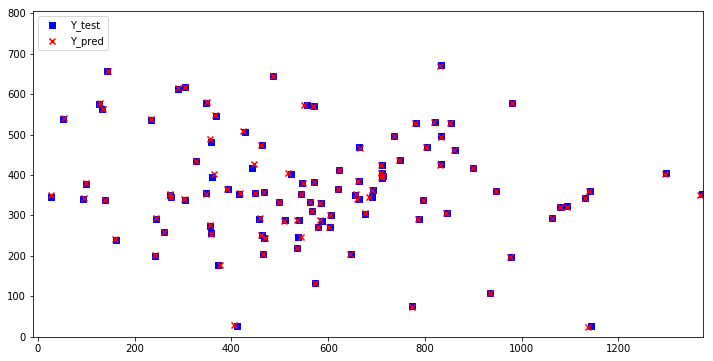

In [62]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)

X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [183]:
#stateless stacked SimpleRNN trained for 40 iterations (sample size)
#put the value for shuffle depending upon which among model_1 and model_2 perform better.

timesteps=18
sample_size=40
X_RMSE=[]
Y_RMSE=[]

start = time.time()

for i in range(sample_size):
    print('Iteration: ', i)
    model= stacked_stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)
    
#     es= EarlyStopping(monitor='val_loss', min_delta=0, patience=2, verbose=1, mode='min', restore_best_weights= True)
    model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=300, verbose=0, shuffle=False)
    
    Y_pred = model.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)

    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

Iteration:  0
Model created and compiled
Iteration:  1
Model created and compiled
Iteration:  2
Model created and compiled
Iteration:  3
Model created and compiled
Iteration:  4
Model created and compiled
Iteration:  5
Model created and compiled
Iteration:  6
Model created and compiled
Iteration:  7
Model created and compiled
Iteration:  8
Model created and compiled
Iteration:  9
Model created and compiled
Iteration:  10
Model created and compiled
Iteration:  11
Model created and compiled
Iteration:  12
Model created and compiled
Iteration:  13
Model created and compiled
Iteration:  14
Model created and compiled
Iteration:  15
Model created and compiled
Iteration:  16
Model created and compiled
Iteration:  17
Model created and compiled
Iteration:  18
Model created and compiled
Iteration:  19
Model created and compiled
Iteration:  20
Model created and compiled
Iteration:  21
Model created and compiled
Iteration:  22
Model created and compiled
Iteration:  23
Model created and compiled
It

Time Took :373.91 min 

[3.286377074272763, 3.171746903860119, 3.706406609534582, 4.312350015119523, 3.007912072151534, 3.655149624430987, 2.9338023993977616, 2.609152602085964, 2.9925698411012918, 2.5780217866694413, 2.997532608719109, 2.928579929326085, 3.562967840242919, 2.761264303186961, 4.067930307033878, 3.393973134717079, 4.705041630622242, 2.787064404917611, 2.6190837994303884, 2.7531731074576835, 4.331093949185666, 2.670213084212141, 3.4864529888386784, 3.2569239675446333, 3.104297293892681, 2.7579247175889883, 2.701572508605862, 2.5890067617152366, 3.306396260196503, 3.003968413516618, 4.151324630946294, 3.024831772549674, 2.953811825493624, 3.0882173945619638, 2.976570885891303, 2.7041327240484008, 2.9499718427281825, 3.230418219889195, 3.094805017396906, 2.959963410787591]
X-coord RMSE Mean: 3.179299941596702

[3.518281412681899, 3.5331341896292097, 3.4574990817280367, 3.9036477192118335, 3.5851774812852617, 3.3866807545669717, 3.7845977482452913, 3.541749132443987, 3.7570573401572536, 3.541572361765637, 3.3250563685062704, 3.863541443649018, 3.7499748872424243, 3.5863001248945934, 3.5060763459216266, 3.7018086542764674, 3.288456746193609, 3.583762305556673, 3.878725107977964, 3.3566681934078266, 3.2586289100333725, 3.286946856973114, 3.3431327545861635, 3.318223363966709, 3.874726259868211, 3.341263337979441, 3.5870210094910218, 3.442298493108369, 3.4677948908210903, 3.61510335191219, 3.2659513331361305, 3.6126806056973435, 3.443919565868479, 3.245169617386853, 3.6749956750566755, 3.357228416694397, 3.2820303208337993, 3.2887296741962673, 3.424302471073325, 3.393958117935679]
Y-coord RMSE Mean: 3.509346810649012

In [22]:
#Results after the training of 40 iteartions
print('Mean XRMSE: ', np.round(3.179299941596702, 3))
print('Mean YRMSE: ', np.round(3.509346810649012, 3))
print('Average: ', np.round(np.mean([3.179299941596702,3.509346810649012]),3))

Mean XRMSE:  3.179
Mean YRMSE:  3.509
Average:  3.344


The stacked model does not perform better than model-2 with one SRNN hidden layer. So far model-2 simpleRNN with 1 hidden layer with shuffle=False performs the best.

In [63]:
#Normally the state of RNN is reset after each batch but now we will reset it after each epoch to maintain the memory between batches. this can be done by makeing the RNN layer "stateful"
#Create our own outer loop for epochs

def stateful_fit(model, X_train, Y_train, X_val, Y_val, batch_size, epochs, weights_saved_file):
    hist_rmse=[]
    hist_val_rmse=[]
    hist_loss=[]
    hist_val_loss=[]

    
    callbacks_list2= [ModelCheckpoint(weights_saved_file,
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True,
                             mode='auto',
                             save_weights_only=True)]
    start = time.time()

    for i in range(epochs):
        print('Epoch Number: ', i)
        hist= model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=2, shuffle=False, callbacks= callbacks_list2)

        hist_rmse.append(hist.history['rmse'])
        hist_val_rmse.append(hist.history['val_rmse'])
        hist_loss.append(hist.history['loss'])
        hist_val_loss.append(hist.history['val_loss'])

        model.reset_states()

    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    print(hist.history.keys())
    
    return hist_loss, hist_val_loss, hist_rmse, hist_val_rmse

In [64]:
#learning curves
def stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse):
    # summarize history for loss
    #plt.figure(figsize=(20,10))
    plt.plot(hist_loss)
    plt.plot(hist_val_loss)
    plt.title('Model Loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    #plt.ylim([0,0.0015])
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    # summarize history for accuracy
    #plt.figure(figsize=(20,10))
    plt.plot(hist_rmse)
    plt.plot(hist_val_rmse)
    plt.title('Model RMSE')
    plt.ylabel('RMSE')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

In [65]:
#call the stateful model definition
simpleRNN_model4= stateful_SimpleRNN(units=30, lr=0.001, batch=128, alpha=0.05)

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_7 (SimpleRNN)     (128, 30)                 990       
_________________________________________________________________
dense_5 (Dense)              (128, 2)                  62        
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (128, 2)                  0         
Total params: 1,052
Trainable params: 1,052
Non-trainable params: 0
_________________________________________________________________


In [63]:
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(simpleRNN_model4, X_train, Y_train, X_val, Y_val, batch_size=128, epochs=300, weights_saved_file='simple_rnn_wts_4.hdf5')

Epoch Number:  0
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 0.1170 - rmse: 0.3304 - val_loss: 0.0204 - val_rmse: 0.1425

Epoch 00001: val_loss improved from inf to 0.02036, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  1
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 0.0081 - rmse: 0.0850 - val_loss: 0.0021 - val_rmse: 0.0461

Epoch 00001: val_loss improved from 0.02036 to 0.00214, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  2
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 0.0019 - rmse: 0.0417 - val_loss: 9.2553e-04 - val_rmse: 0.0303

Epoch 00001: val_loss improved from 0.00214 to 0.00093, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  3
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 8.7005e-04 - rmse: 0.0289 - val_loss: 6.2400e-04 - val_rmse: 0.0248

Epoch 00001: val_loss improved from 0.00093 to 0.00062, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  4


Epoch 00001: val_loss improved from 0.00011 to 0.00010, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  33
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.0886e-04 - rmse: 0.0103 - val_loss: 1.0253e-04 - val_rmse: 0.0100

Epoch 00001: val_loss improved from 0.00010 to 0.00010, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  34
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.0581e-04 - rmse: 0.0102 - val_loss: 1.0084e-04 - val_rmse: 0.0100

Epoch 00001: val_loss improved from 0.00010 to 0.00010, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  35
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.0259e-04 - rmse: 0.0100 - val_loss: 9.8296e-05 - val_rmse: 0.0098

Epoch 00001: val_loss improved from 0.00010 to 0.00010, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  36
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 9.9204e-05 - rmse: 0.0098 - val_loss: 9.4759e-05 - val_r

 - 1s - loss: 4.8650e-05 - rmse: 0.0069 - val_loss: 4.7290e-05 - val_rmse: 0.0068

Epoch 00001: val_loss improved from 0.00005 to 0.00005, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  66
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 4.7639e-05 - rmse: 0.0068 - val_loss: 4.6642e-05 - val_rmse: 0.0067

Epoch 00001: val_loss improved from 0.00005 to 0.00005, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  67
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 4.6679e-05 - rmse: 0.0068 - val_loss: 4.6069e-05 - val_rmse: 0.0067

Epoch 00001: val_loss improved from 0.00005 to 0.00005, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  68
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 4.5773e-05 - rmse: 0.0067 - val_loss: 4.5602e-05 - val_rmse: 0.0066

Epoch 00001: val_loss improved from 0.00005 to 0.00005, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  69
Train on 7680 samples, validate on 2560 sample

 - 1s - loss: 2.5020e-05 - rmse: 0.0049 - val_loss: 3.3448e-05 - val_rmse: 0.0056

Epoch 00001: val_loss improved from 0.00004 to 0.00003, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  100
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 2.4481e-05 - rmse: 0.0049 - val_loss: 3.1432e-05 - val_rmse: 0.0054

Epoch 00001: val_loss improved from 0.00003 to 0.00003, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  101
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 2.3976e-05 - rmse: 0.0048 - val_loss: 2.9995e-05 - val_rmse: 0.0053

Epoch 00001: val_loss improved from 0.00003 to 0.00003, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  102
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 2.3523e-05 - rmse: 0.0048 - val_loss: 2.9418e-05 - val_rmse: 0.0052

Epoch 00001: val_loss improved from 0.00003 to 0.00003, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  103
Train on 7680 samples, validate on 2560 sa


Epoch 00001: val_loss improved from 0.00002 to 0.00002, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  132
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.7043e-05 - rmse: 0.0041 - val_loss: 1.7734e-05 - val_rmse: 0.0040

Epoch 00001: val_loss improved from 0.00002 to 0.00002, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  133
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.6891e-05 - rmse: 0.0040 - val_loss: 1.7610e-05 - val_rmse: 0.0040

Epoch 00001: val_loss improved from 0.00002 to 0.00002, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  134
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.6743e-05 - rmse: 0.0040 - val_loss: 1.7488e-05 - val_rmse: 0.0040

Epoch 00001: val_loss improved from 0.00002 to 0.00002, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  135
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.6598e-05 - rmse: 0.0040 - val_loss: 1.7370e-05 - v

 - 1s - loss: 1.3341e-05 - rmse: 0.0036 - val_loss: 1.3954e-05 - val_rmse: 0.0035

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  165
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.3257e-05 - rmse: 0.0036 - val_loss: 1.3867e-05 - val_rmse: 0.0035

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  166
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.3175e-05 - rmse: 0.0036 - val_loss: 1.3784e-05 - val_rmse: 0.0035

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  167
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.3094e-05 - rmse: 0.0035 - val_loss: 1.3708e-05 - val_rmse: 0.0035

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  168
Train on 7680 samples, validate on 2560 sa

 - 1s - loss: 1.0953e-05 - rmse: 0.0032 - val_loss: 1.3555e-05 - val_rmse: 0.0035

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  201
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.0862e-05 - rmse: 0.0032 - val_loss: 1.3352e-05 - val_rmse: 0.0035

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  202
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.0779e-05 - rmse: 0.0032 - val_loss: 1.3081e-05 - val_rmse: 0.0034

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  203
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.0715e-05 - rmse: 0.0032 - val_loss: 1.2763e-05 - val_rmse: 0.0034

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  204
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.0675e-05 - rmse: 0.0032 - val_loss: 1.2433e-05 - val_r

 - 1s - loss: 1.0032e-05 - rmse: 0.0031 - val_loss: 1.0967e-05 - val_rmse: 0.0031

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  234
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 1.0004e-05 - rmse: 0.0031 - val_loss: 1.0946e-05 - val_rmse: 0.0031

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  235
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 9.9752e-06 - rmse: 0.0031 - val_loss: 1.0925e-05 - val_rmse: 0.0031

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  236
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 9.9468e-06 - rmse: 0.0031 - val_loss: 1.0906e-05 - val_rmse: 0.0031

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  237
Train on 7680 samples, validate on 2560 sa


Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  266
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 9.1937e-06 - rmse: 0.0030 - val_loss: 1.0379e-05 - val_rmse: 0.0030

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  267
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 9.1719e-06 - rmse: 0.0030 - val_loss: 1.0361e-05 - val_rmse: 0.0030

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  268
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 9.1500e-06 - rmse: 0.0030 - val_loss: 1.0344e-05 - val_rmse: 0.0030

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  269
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 9.1286e-06 - rmse: 0.0030 - val_loss: 1.0326e-05 - v

 - 1s - loss: 8.5659e-06 - rmse: 0.0029 - val_loss: 9.7978e-06 - val_rmse: 0.0029

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Epoch Number:  299
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 8.5488e-06 - rmse: 0.0029 - val_loss: 9.7792e-06 - val_rmse: 0.0029

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_4.hdf5
Time Took :4.56 min
dict_keys(['val_loss', 'val_rmse', 'loss', 'rmse'])


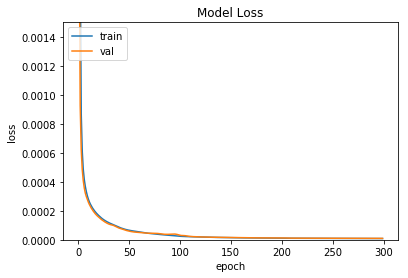

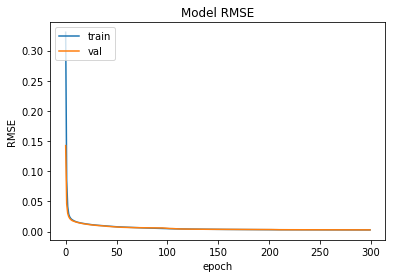

In [78]:
#plot the loss and rmse recorded per epoch while training and validating
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [66]:
weights_saved_file= 'simple_rnn_wts_4.hdf5'
simpleRNN_model4.load_weights(weights_saved_file)

In [46]:
#evaluate simpleRNN_model4 performance
Y_Pred_train = simpleRNN_model4.predict(X_train, batch_size=128)
simpleRNN_model4.reset_states()
Y_Pred_val = simpleRNN_model4.predict(X_val, batch_size=128)
simpleRNN_model4.reset_states()
Y_Pred_test = simpleRNN_model4.predict(X_test, batch_size=128)
simpleRNN_model4.reset_states()

X_RMSE_train, Y_RMSE_train= calculate_RMSE(Y_Pred_train, Y_train)
print('Train Score (X-coord) XRMSE', str(X_RMSE_train))
print('Train Score (Y-coord) YRMSE', str(Y_RMSE_train))

X_RMSE_val, Y_RMSE_val= calculate_RMSE(Y_Pred_val, Y_val)
print('Val Score (X-coord) XRMSE', str(X_RMSE_val))
print('Val Score (Y-coord) YRMSE', str(Y_RMSE_val))

X_RMSE_test, Y_RMSE_test= calculate_RMSE(Y_Pred_test, Y_test)
print('Test Score (X-coord) XRMSE', str(X_RMSE_test))
print('Test Score (Y-coord) YRMSE', str(Y_RMSE_test))


Train Score (X-coord) XRMSE 2.8782957564443263
Train Score (Y-coord) YRMSE 3.404567027266514
Val Score (X-coord) XRMSE 3.1882128965152843
Val Score (Y-coord) YRMSE 5.116607397022029
Test Score (X-coord) XRMSE 2.745310506438532
Test Score (Y-coord) YRMSE 3.417834859765607


In [68]:
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [980.63293789 578.2967033 ]
Y_Pred:  [980.01855 578.2437 ] 

Y_true:  [ 99.25398029 378.72927461]
Y_Pred:  [ 99.302536 380.1896  ] 

Y_true:  [1297.86892178  404.6721519 ]
Y_Pred:  [1296.4171  404.9843] 

Y_true:  [466.90793413 358.21167883]
Y_Pred:  [467.97083 357.59268] 

Y_true:  [781.0841617  528.31488203]
Y_Pred:  [780.4099  528.61743] 

Y_true:  [ 27.35703593 345.44890511]
Y_Pred:  [ 27.163193 347.5475  ] 

Y_true:  [462.37295298 473.65156562]
Y_Pred:  [462.93433 473.3838 ] 

Y_true:  [1131.  344.]
Y_Pred:  [1129.9496   345.49313] 

Y_true:  [656.25832013 350.53164557]
Y_Pred:  [657.2719  353.24356] 

Y_true:  [ 50.85624564 537.8974359 ]
Y_Pred:  [ 52.336277 539.2416  ] 

Y_true:  [803.82941622 468.62823834]
Y_Pred:  [803.55994 469.4254 ] 

Y_true:  [357.74801902 482.25383078]
Y_Pred:  [357.02133 487.23148] 

Y_true:  [304.4058908  618.52638191]
Y_Pred:  [305.13824 616.65344] 

Y_true:  [1079.20510836  320.81242236]
Y_Pred:  [1078.0579  321.154 ] 

Y_true:  [1063.5689655

Y_Pred:  [662.7472 219.1832] 

Y_true:  [410.42630745 513.97468354]
Y_Pred:  [410.7532 514.1171] 

Y_true:  [1175.  262.]
Y_Pred:  [1172.1394   262.27402] 

Y_true:  [449.05582694 590.12087912]
Y_Pred:  [451.43884 587.5639 ] 

Y_true:  [326.28737454 508.06062625]
Y_Pred:  [328.12836 507.4431 ] 

Y_true:  [625.51347449 321.45214008]
Y_Pred:  [626.27155 308.31708] 

Y_true:  [316.6640159  600.08076225]
Y_Pred:  [317.00595 602.2213 ] 

Y_true:  [596.81346749 607.52298137]
Y_Pred:  [598.6526 606.6998] 

Y_true:  [1055.73534073  294.61692205]
Y_Pred:  [1058.9303  294.0248] 

Y_true:  [669.71058475 581.92036554]
Y_Pred:  [670.8574 583.9108] 

Y_true:  [800.39197042 129.02331779]
Y_Pred:  [800.02405 129.41817] 

Y_true:  [1293.23127899  479.98275862]
Y_Pred:  [1294.0725   481.14417] 

Y_true:  [1095.15470022  340.54014599]
Y_Pred:  [1091.7893   348.36276] 

Y_true:  [935.74590597 288.70286476]
Y_Pred:  [936.0669  288.93387] 

Y_true:  [431.6439514  214.50832778]
Y_Pred:  [429.3055  213.18843]

Y_Pred:  [498.15292 436.9337 ] 

Y_true:  [880.87268885 196.7661559 ]
Y_Pred:  [879.1132 198.1385] 

Y_true:  [392.13523508 236.01399067]
Y_Pred:  [394.14804 236.89955] 

Y_true:  [357.02020958 418.09854015]
Y_Pred:  [357.19867 417.49704] 

Y_true:  [847.1676607 383.3185118]
Y_Pred:  [847.07996 383.6118 ] 

Y_true:  [778.44268357 370.96202532]
Y_Pred:  [779.23114 372.025  ] 

Y_true:  [952.93479909 426.81476684]
Y_Pred:  [953.37585 427.07587] 

Y_true:  [625.52931854 312.89673551]
Y_Pred:  [623.6773  315.04153] 

Y_true:  [933.44333996 324.00181488]
Y_Pred:  [933.04584 323.51212] 

Y_true:  [717.89341229 534.51174935]
Y_Pred:  [716.39923 535.88574] 

Y_true:  [1186.27409639   40.28515625]
Y_Pred:  [1185.79      42.07099] 

Y_true:  [694.01506024 396.5       ]
Y_Pred:  [694.62085 396.714  ] 

Y_true:  [1162.81569208   72.01436031]
Y_Pred:  [1161.4302    73.31731] 

Y_true:  [1017.6899102   180.63690873]
Y_Pred:  [1017.8599   181.47673] 

Y_true:  [1170.73381295  471.64158163]
Y_Pred:  [

Y_true:  [954.76862124 394.6182545 ]
Y_Pred:  [925.658   397.32068] 

Y_true:  [551.63338616 124.72218521]
Y_Pred:  [548.0401  125.42509] 

Y_true:  [834.80948795 467.953125  ]
Y_Pred:  [837.3384  468.17596] 

Y_true:  [346.65344311 271.81751825]
Y_Pred:  [349.94022 272.13327] 

Y_true:  [102.98291925 461.6484375 ]
Y_Pred:  [106.57511 460.73297] 

Y_true:  [711.86318014 108.59293804]
Y_Pred:  [712.6408  108.20739] 

Y_true:  [  6.42783124 658.82767624]
Y_Pred:  [  6.9068093 670.1875   ] 

Y_true:  [785.75911252 331.17654897]
Y_Pred:  [786.7949  331.48972] 

Y_true:  [428.71737982 303.21918721]
Y_Pred:  [430.6791  307.17758] 

Y_true:  [169.42931162 223.72193211]
Y_Pred:  [176.46904 225.57666] 

Y_true:  [364.21095485 382.75547445]
Y_Pred:  [365.42648 382.9303 ] 

Y_true:  [495.29688325 469.35043304]
Y_Pred:  [495.16568 472.40375] 

Y_true:  [468.22609614 322.03664224]
Y_Pred:  [469.742   323.16736] 

Y_true:  [114.07031828 506.06657963]
Y_Pred:  [116.53112 504.34628] 

Y_true:  [312.25

Y_true:  [ 86.39082161 332.23498695]
Y_Pred:  [ 88.016174 331.524   ] 

Y_true:  [363.60116218 447.30712858]
Y_Pred:  [365.26245 448.86386] 

Y_true:  [425.79238506 464.4258794 ]
Y_Pred:  [427.41992 464.45834] 

Y_true:  [1185.96777602  488.16788807]
Y_Pred:  [1186.0588   487.12283] 

Y_true:  [727.22768093 302.14390406]
Y_Pred:  [727.1995 303.2239] 

Y_true:  [462.56709629 767.59455959]
Y_Pred:  [433.03787 773.8225 ] 

Y_true:  [385.26657362 583.22344322]
Y_Pred:  [387.08344 583.6704 ] 

Y_true:  [787.9540412  333.32711526]
Y_Pred:  [789.64575 333.85733] 

Y_true:  [1038.17921687  136.95703125]
Y_Pred:  [1051.8547    127.059944] 

Y_true:  [541.20905172 503.96482412]
Y_Pred:  [541.3666  505.11874] 

Y_true:  [374.05387931 395.4861809 ]
Y_Pred:  [374.4798  395.45135] 

Y_true:  [905.16459627 420.66796875]
Y_Pred:  [904.8318  420.87238] 

Y_true:  [755.03011094 467.19986676]
Y_Pred:  [752.52026 467.71463] 

Y_true:  [358.20446615 479.76190476]
Y_Pred:  [361.89655 481.2896 ] 

Y_true:  [

Y_true:  [445.5451664  503.75949367]
Y_Pred:  [445.73502 502.01456] 

Y_true:  [539.92709984 397.30646236]
Y_Pred:  [541.58203 397.09708] 

Y_true:  [328.25168431 353.48093385]
Y_Pred:  [332.2753  355.19797] 

Y_true:  [474.8108822  403.22051965]
Y_Pred:  [475.96698 403.12827] 

Y_true:  [633. 329.]
Y_Pred:  [633.8785  328.98837] 

Y_true:  [1359.64766839  174.62408759]
Y_Pred:  [1358.8579   175.32271] 

Y_true:  [410.28230616 538.56715064]
Y_Pred:  [412.982  538.5503] 

Y_true:  [140.20545868 496.85233161]
Y_Pred:  [140.86554 495.9596 ] 

Y_true:  [438.96038035 315.0473018 ]
Y_Pred:  [437.68283 315.2697 ] 

Y_true:  [477.5308908 149.1281407]
Y_Pred:  [479.92508 159.9176 ] 

Y_true:  [743.9772555  540.75647668]
Y_Pred:  [743.7966 540.0691] 

Y_true:  [496.55798542 496.09346642]
Y_Pred:  [495.5257  496.94504] 

Y_true:  [381.13855422 626.62109375]
Y_Pred:  [379.94568 627.56647] 

Y_true:  [492.37031167 319.34843438]
Y_Pred:  [493.10397 317.84372] 

Y_true:  [883.79926043 395.15589607]
Y

Y_true:  [608.18431184 448.93929961]
Y_Pred:  [609.6307  450.53326] 

Y_true:  [491.46048851  47.74623116]
Y_Pred:  [490.91357   48.396984] 

Y_true:  [873.71872687 564.01044386]
Y_Pred:  [874.3277  565.21985] 

Y_true:  [301.41151611 425.26382412]
Y_Pred:  [302.68082 424.61743] 

Y_true:  [804.05018489 290.31578947]
Y_Pred:  [804.18353 290.33463] 

Y_true:  [825. 527.]
Y_Pred:  [825.6308  528.21533] 

Y_true:  [924.03961965 143.53964024]
Y_Pred:  [922.5262 144.581 ] 

Y_true:  [1024.27469625  304.83211193]
Y_Pred:  [1024.2377  304.9344] 

Y_true:  [960.97813121 493.89655172]
Y_Pred:  [956.6163  494.38492] 

Y_true:  [713.16500994 228.80217786]
Y_Pred:  [713.6154 229.3136] 

Y_true:  [429.77227011 248.48241206]
Y_Pred:  [430.0909 249.6759] 

Y_true:  [241.72270115 461.38442211]
Y_Pred:  [244.86218 461.54395] 

Y_true:  [421.40095087 460.74816789]
Y_Pred:  [425.123   459.54227] 

Y_true:  [1320.69133975  291.14751958]
Y_Pred:  [1326.1099   291.98138] 

Y_true:  [1101.37787356  427.92839


Y_true:  [499.42025862  34.56658291]
Y_Pred:  [501.57257  34.87033] 

Y_true:  [919.4427334  153.77198444]
Y_Pred:  [922.37494 152.60146] 

Y_true:  [702.27983252  81.68131868]
Y_Pred:  [704.01855  81.24298] 

Y_true:  [360.87103594 121.71139241]
Y_Pred:  [361.0668  120.66444] 

Y_true:  [389.2086635  393.54297135]
Y_Pred:  [389.59692 393.70456] 

Y_true:  [460.65387299 588.15018315]
Y_Pred:  [461.786   587.31683] 

Y_true:  [517.76129518 560.421875  ]
Y_Pred:  [523.21295 570.0195 ] 

Y_true:  [988. 502.]
Y_Pred:  [985.254   502.10693] 

Y_true:  [829.85833915 631.50549451]
Y_Pred:  [828.91064 631.86066] 

Y_true:  [280.83579986 644.72911392]
Y_Pred:  [284.95908 645.8182 ] 

Y_true:  [398.72002113 149.45369753]
Y_Pred:  [400.0147  148.66733] 

Y_true:  [760.27006281 502.42490842]
Y_Pred:  [760.7245  502.02316] 

Y_true:  [757.63328313 577.234375  ]
Y_Pred:  [758.3448 577.4182] 

Y_true:  [1348.87090021  620.66666667]
Y_Pred:  [1349.0762   620.93964] 

Y_true:  [1108.34267241  414.7487


Y_true:  [168.95668912 305.12373541]
Y_Pred:  [170.3821  305.93063] 

Y_true:  [1066.54756871  316.82151899]
Y_Pred:  [1064.9686   317.12668] 

Y_true:  [955.50026413 370.96202532]
Y_Pred:  [956.55023 369.85617] 

Y_true:  [323.77786145 490.01953125]
Y_Pred:  [325.56696 490.1129 ] 

Y_true:  [327.27634334 464.98168498]
Y_Pred:  [328.50302 464.9163 ] 

Y_true:  [438.22873745 467.73750833]
Y_Pred:  [440.02658 468.2864 ] 

Y_true:  [1094.  175.]
Y_Pred:  [1093.6748   175.19063] 

Y_true:  [584.50828313 511.03515625]
Y_Pred:  [584.76117 510.15958] 

Y_true:  [941.72515528 629.7734375 ]
Y_Pred:  [944.40625 633.38513] 

Y_true:  [788.6856841   99.99067288]
Y_Pred:  [791.31146 104.29539] 

Y_true:  [1070.19946985  189.99001815]
Y_Pred:  [1074.2782  194.9636] 

Y_true:  [733.08082409 405.37108594]
Y_Pred:  [734.6737 405.1427] 

Y_true:  [450.02233077 359.54945055]
Y_Pred:  [453.19058 359.69614] 

Y_true:  [ 75.02484472 524.6953125 ]
Y_Pred:  [ 78.22923 523.935  ] 

Y_true:  [340.24879692  70.

Y_Pred:  [172.8305  458.44846] 

Y_true:  [465.70244264 664.09530026]
Y_Pred:  [467.21533 663.33606] 

Y_true:  [839.53070508 660.97020725]
Y_Pred:  [841.37537 658.49646] 

Y_true:  [303.11374738 407.83150183]
Y_Pred:  [304.02478 408.8178 ] 

Y_true:  [1186.0452358   604.05914397]
Y_Pred:  [1186.5134   605.89264] 

Y_true:  [617.18111455 456.14782609]
Y_Pred:  [618.2668 457.7654] 

Y_true:  [1033.71982759  408.66582915]
Y_Pred:  [1035.3726   408.78513] 

Y_true:  [390.67194929 325.26249167]
Y_Pred:  [392.14304 327.1112 ] 

Y_true:  [511.39302694 343.00466356]
Y_Pred:  [515.0768  342.87292] 

Y_true:  [420.8960539  548.79377432]
Y_Pred:  [423.7168 549.0697] 

Y_true:  [782.91981445 341.57713249]
Y_Pred:  [785.8919  341.09753] 

Y_true:  [425.79080824 276.33710859]
Y_Pred:  [428.83395 276.50995] 

Y_true:  [190.92180252  96.98729583]
Y_Pred:  [190.73712   94.592514] 

Y_true:  [663.55958549 245.31021898]
Y_Pred:  [662.4247 246.6534] 

Y_true:  [400.18330692 468.81279147]
Y_Pred:  [400.67

Y_Pred:  [632.86584 352.49338] 

Y_true:  [523.9251497  282.61678832]
Y_Pred:  [524.74677 282.91785] 

Y_true:  [832.58425779 192.46502332]
Y_Pred:  [832.8317  192.87851] 

Y_true:  [1131.22701149  187.65326633]
Y_Pred:  [1132.2065  188.164 ] 

Y_true:  [423.43165468 516.93239796]
Y_Pred:  [425.69775 516.2205 ] 

Y_true:  [115.0045489  375.59326425]
Y_Pred:  [116.91565 376.0437 ] 

Y_true:  [377. 627.]
Y_Pred:  [379.19867 626.8794 ] 

Y_true:  [825.99947174 413.43570953]
Y_Pred:  [826.07794 413.6531 ] 

Y_true:  [1087.  170.]
Y_Pred:  [1085.5466  171.9825] 

Y_true:  [689.1822504  411.82278481]
Y_Pred:  [689.6039 412.2051] 

Y_true:  [646.13175426 575.59921671]
Y_Pred:  [648.0112 575.7936] 

Y_true:  [191.61790183 426.95875486]
Y_Pred:  [191.55151 428.62967] 

Y_true:  [318.0784604  329.74087591]
Y_Pred:  [319.91818 330.49008] 

Y_true:  [1130.23204023  344.79522613]
Y_Pred:  [1129.7247  345.0728] 

Y_true:  [953.984837   532.39378238]
Y_Pred:  [952.34247 532.9798 ] 

Y_true:  [517.246

Y_Pred:  [278.90848 332.01852] 

Y_true:  [311.65451664 161.8194537 ]
Y_Pred:  [313.6016  163.34015] 

Y_true:  [644. 580.]
Y_Pred:  [645.1784  581.03986] 

Y_true:  [1341.  317.]
Y_Pred:  [1340.5504   317.51743] 

Y_true:  [740.39725304 358.05862758]
Y_Pred:  [740.81775 358.29184] 

Y_true:  [743.45328032 231.73139746]
Y_Pred:  [744.1159  232.70395] 

Y_true:  [801.43599398  14.015625  ]
Y_Pred:  [800.6195    14.424496] 

Y_true:  [639.43053354 269.88540973]
Y_Pred:  [639.1157  270.46832] 

Y_true:  [783.49612403 506.82405063]
Y_Pred:  [784.4684  504.12616] 

Y_true:  [590.41045959 468.81279147]
Y_Pred:  [593.2079  468.87906] 

Y_true:  [815.75647121 382.79013991]
Y_Pred:  [819.82275 385.03577] 

Y_true:  [360.28012048 534.15234375]
Y_Pred:  [359.1756 534.159 ] 

Y_true:  [1223.47647449  547.35480944]
Y_Pred:  [1223.0607   548.57733] 

Y_true:  [257.64224138 260.64824121]
Y_Pred:  [258.3417  263.47015] 

Y_true:  [443.32405567 604.47459165]
Y_Pred:  [445.61786 603.8446 ] 

Y_true:  [1

Y_Pred:  [635.61566 355.43127] 

Y_true:  [491.75928793 657.64720497]
Y_Pred:  [492.9829  657.63806] 



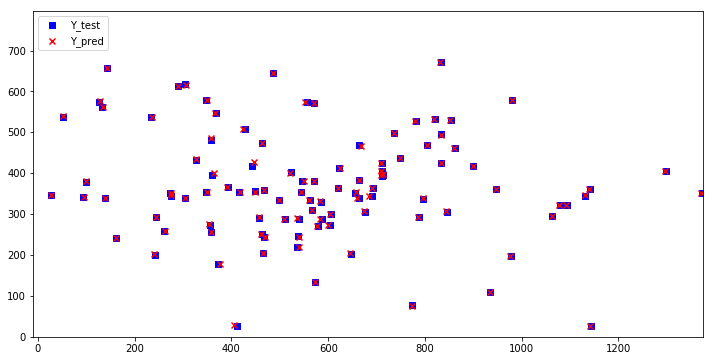

In [69]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)
X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [ ]:
#stateful SimpleRNN trained for 40 iterations (sample size)

timesteps=18
sample_size=40
X_RMSE=[]
Y_RMSE=[]

start = time.time()

for i in range(sample_size):
    print('Iteration: ', i)
    model= stateful_SimpleRNN(units=30,lr=0.001, batch=128, alpha=0.05)
    
    for j in range(300):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=128, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_pred = model.predict(X_test, batch_size=128)
    model.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)

    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

In [33]:
#result of 60 iterations. Consider only 40 as it is the sample size required to determine the skill of the model
X_RMSE= [5.500694428523802, 3.4254142011641138, 4.891764667623055, 4.597999187909547, 4.074898807602142, 5.340896844813258, 3.5068852804187904, 3.471926540005198, 3.6087092511719927, 3.593589653833207, 4.40005905404099, 3.4837944705309387, 4.156649393571735, 4.412614679858544, 4.268136721506749, 3.434429810864395, 3.7226918247892513, 3.7242362237824094, 4.9446961451576295, 4.328349505599733, 4.170842829870825, 5.052166145964223, 3.8702921692554693, 3.832187730553048, 3.444077326527261, 4.889948122488767, 5.467175082789805, 5.487393969459091, 4.273710167990146, 4.4442579920317105, 3.813416814145549, 5.0318621764913205, 4.4285047272296065, 3.968096111214058, 3.3830894781131327, 3.997503138381941, 4.057249570926058, 4.140528315566753, 4.273386194993445, 5.955602638625145, 4.022665399192207, 3.4845302001313363, 4.559127087867797, 3.8592451013696505, 5.0786265926044, 4.233400902985731, 3.6427489219717453, 3.376359874166942, 4.33561847630898, 4.300004254136604, 4.369195436873038, 4.10780138279645, 3.3416622757739733, 4.382799352956347, 4.076541039621095, 4.118557221840233, 4.3819078910676375, 3.57963769052343, 4.454193212121663, 4.282864039192654, 4.676848858694428, 4.98881745560985]
Y_RMSE= [2.9605533863693605, 3.258207411057651, 2.945326107369334, 2.9219609775398094, 3.386360160562858, 3.0175641597840497, 3.4588145657235723, 2.9925795176528256, 3.1609890881332197, 3.554487823605844, 3.312802600320144, 3.193031442094347, 3.19717280115246, 2.786610105798919, 3.209287494216034, 3.5533441995690542, 2.847311994602069, 2.867147257714469, 2.7697226443815772, 2.819269225470433, 4.075422147517169, 3.5253977360586175, 3.0833007219347106, 3.019102897582364, 3.806820771401082, 2.942465008263055, 3.2280207191406234, 3.1009384838850362, 2.991116768265948, 2.9913335757690214, 2.8888957670952427, 3.309979510582037, 3.1793258678865692, 3.1536643711107777, 3.291440230418111, 3.025438082396211, 2.7473353791816804, 3.2445559345752244, 3.163555018642853, 2.7326482516579724, 3.028079776856231, 3.1547165966311965, 2.8818058561632336, 3.07226483113012, 2.7470163477908724, 2.6885764608281773, 3.6148256427869376, 3.1307917830787777, 2.7524046856921043, 3.309591167231183, 3.165771265165449, 2.8275690786701757, 3.1717581995918147, 3.1388501158128643, 2.8069471864172746, 2.923782802579026, 3.259614634218462, 3.7079718303760316, 3.483363178412482, 3.18730880216587, 3.2888803812983896, 3.212462297122521]

x_mean= np.mean(X_RMSE[:40])
y_mean=np.mean(Y_RMSE[:40])
print('X_RMSE(stateful simple_RNN): ', x_mean)
print('Y_RMSE(stateful simple_RNN): ', y_mean)
print('Average: ',np.mean([x_mean,y_mean]))

X_RMSE(stateful simple_RNN):  4.271743184884621
Y_RMSE(stateful simple_RNN):  3.1428325051620583
Average:  3.7072878450233397


In [23]:
#Results after the training for 40 iterations
print('Mean XRMSE: ', np.round(4.271743184884621, 3))
print('Mean YRMSE: ', np.round(3.1428325051620583, 3))
print('Average: ', np.round(np.mean([4.271743184884621,3.1428325051620583]),3))

Mean XRMSE:  4.272
Mean YRMSE:  3.143
Average:  3.707


This model does not outperform Model-2. Still Model-2 (Stateless Simple RNN with 1hidden layer) performs the best.

In [70]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#Stacked SimpleRNN with m/m between batches
def stacked_stateful_SimpleRNN(units, lr, batch, alpha):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True))
    model.add(SimpleRNN(units, return_sequences=False, stateful=True))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [5]:
#call the stateful stacked simpleRNN model definition
simpleRNN_model5= stacked_stateful_SimpleRNN(units=30, lr=0.001, batch=128, alpha=0.05)
#summary of the model
simpleRNN_model5.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_1 (SimpleRNN)     (128, 18, 30)             990       
_________________________________________________________________
simple_rnn_2 (SimpleRNN)     (128, 30)                 1830      
_________________________________________________________________
dense_1 (Dense)              (128, 2)                  62        
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (128, 2)                  0         
Total params: 2,882
Trainable params: 2,882
Non-trainable params: 0
_________________________________________________________________


In [29]:
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(simpleRNN_model5, X_train, Y_train, X_val, Y_val, batch_size=128, epochs=300, weights_saved_file='simple_rnn_wts_5.hdf5')

Epoch Number:  0
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 4s - loss: 0.1072 - rmse: 0.2765 - val_loss: 0.0061 - val_rmse: 0.0776

Epoch 00001: val_loss improved from inf to 0.00606, saving model to simple_rnn_wts_5.hdf5
Epoch Number:  1
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 0.0035 - rmse: 0.0579 - val_loss: 0.0021 - val_rmse: 0.0461

Epoch 00001: val_loss improved from 0.00606 to 0.00215, saving model to simple_rnn_wts_5.hdf5
Epoch Number:  2
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 0.0017 - rmse: 0.0405 - val_loss: 0.0012 - val_rmse: 0.0344

Epoch 00001: val_loss improved from 0.00215 to 0.00120, saving model to simple_rnn_wts_5.hdf5
Epoch Number:  3
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 0.0011 - rmse: 0.0328 - val_loss: 8.3093e-04 - val_rmse: 0.0285

Epoch 00001: val_loss improved from 0.00120 to 0.00083, saving model to simple_rnn_wts_5.hdf5
Epoch Number:  4
Train o

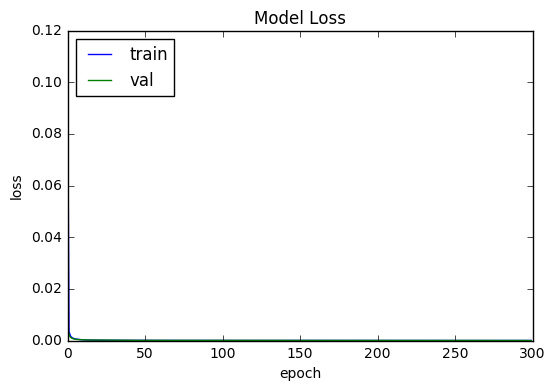

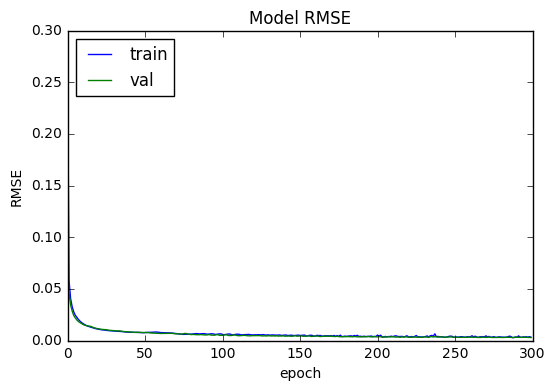

In [30]:
#plot the loss and rmse recorded per epoch while training and validating
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [6]:
weights_saved_file= 'simple_rnn_wts_5.hdf5'
simpleRNN_model5.load_weights(weights_saved_file)

In [28]:
#evaluate simpleRNN_model5 performance
scores = simpleRNN_model5.evaluate(X_test, Y_test, batch_size=128, verbose=0)
simpleRNN_model5.reset_states()
print("Overall RMSE while training", (scores[1]))

Y_Pred_train = simpleRNN_model5.predict(X_train, batch_size=128)
simpleRNN_model5.reset_states()

Y_Pred_test = simpleRNN_model5.predict(X_test, batch_size=128)
simpleRNN_model5.reset_states()

xrmse, yrmse= calculate_RMSE(Y_Pred_train, Y_train)
print('Train Score (X-coord) XRMSE', xrmse)
print('Train Score (Y-coord) YRMSE', yrmse)

xrmse, yrmse= calculate_RMSE(Y_Pred_test, Y_test)
print('Test Score (X-coord) XRMSE', xrmse)
print('Test Score (Y-coord) YRMSE', yrmse)


Overall RMSE while training 0.0025446635903790594
Train Score (X-coord) XRMSE 3.4371788586327923
Train Score (Y-coord) YRMSE 2.5263942321079873
Test Score (X-coord) XRMSE 3.150643692983833
Test Score (Y-coord) YRMSE 2.315699942329787


In [36]:
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [359.17096999 277.76556777]
Y_Pred:  [360.68866 280.12045] 

Y_true:  [839.53070508 705.91968912]
Y_Pred:  [845.69476 708.20154] 

Y_true:  [1163.17547569   95.15189873]
Y_Pred:  [1165.8951     96.358246] 

Y_true:  [410.92739521 344.46715328]
Y_Pred:  [418.0065  342.85233] 

Y_true:  [357.04837641 332.05716878]
Y_Pred:  [355.21985 330.40808] 

Y_true:  [747.84730539 314.03284672]
Y_Pred:  [750.5842 315.9362] 

Y_true:  [501.88166931 342.46702199]
Y_Pred:  [509.55994 344.64288] 

Y_true:  [381. 551.]
Y_Pred:  [381.24207 554.0173 ] 

Y_true:  [834.77918648 334.4023984 ]
Y_Pred:  [836.7251  335.27637] 

Y_true:  [ 94.34891835 596.03296703]
Y_Pred:  [ 95.563255 600.0199  ] 

Y_true:  [864.73161486 736.23445596]
Y_Pred:  [868.91833 737.7051 ] 

Y_true:  [575.77760169 448.38241173]
Y_Pred:  [580.8428  448.80676] 

Y_true:  [279.5316092  335.67085427]
Y_Pred:  [280.54797 338.5864 ] 

Y_true:  [780.12229102 198.50931677]
Y_Pred:  [783.2051  196.84209] 

Y_true:  [870.54454023 294.104

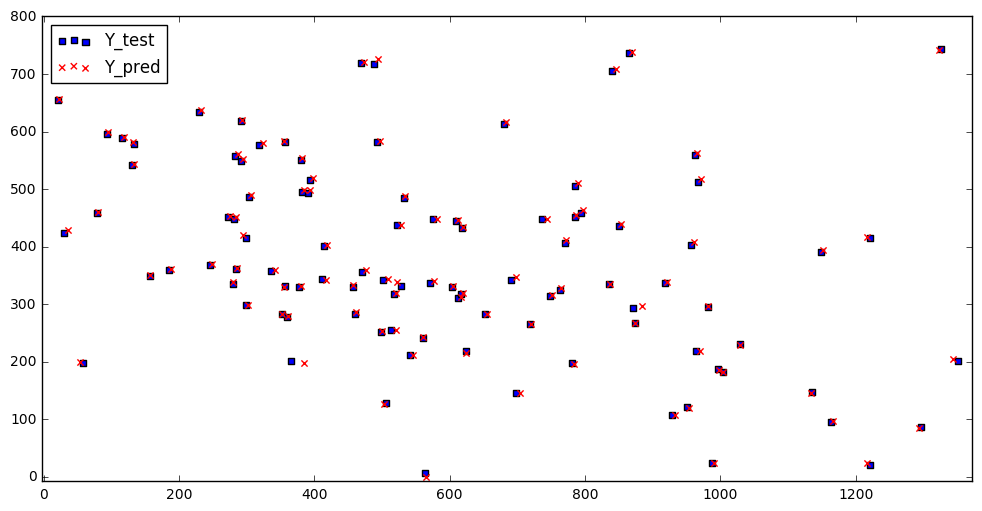

In [37]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)
X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [42]:
#1st dataset, stateful stacked SimpleRNN

timesteps=18
X_RMSE=[]
Y_RMSE=[]
sample_size=40

start= time.time()
for i in range(0,sample_size):
    print('Iteration: ', i)
    
    model_iter = stacked_stateful_SimpleRNN(units=30, lr=0.001, batch=128, alpha=0.05)
    
    for j in range(300):
        model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=128, verbose=0, shuffle=False)
        model_iter.reset_states()
    
    Y_pred = model_iter.predict(X_test, batch_size=128)
    model_iter.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)
    
print('X_RMSE: ',X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y_RMSE: ', Y_RMSE, '\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

Iteration:  0
Model created and compiled
Iteration:  1
Model created and compiled
Iteration:  2
Model created and compiled
Iteration:  3
Model created and compiled
Iteration:  4
Model created and compiled
Iteration:  5
Model created and compiled
Iteration:  6
Model created and compiled
Iteration:  7
Model created and compiled
Iteration:  8
Model created and compiled
Iteration:  9
Model created and compiled
Iteration:  10
Model created and compiled
Iteration:  11
Model created and compiled
Iteration:  12
Model created and compiled
Iteration:  13
Model created and compiled
Iteration:  14
Model created and compiled
Iteration:  15
Model created and compiled
Iteration:  16
Model created and compiled
Iteration:  17
Model created and compiled
Iteration:  18
Model created and compiled
Iteration:  19
Model created and compiled
Iteration:  20
Model created and compiled
Iteration:  21
Model created and compiled
Iteration:  22
Model created and compiled
Iteration:  23
Model created and compiled
It

X_RMSE:  [2.6153305477103563, 3.5225933620654915, 3.1274677371092827, 2.6799154897398343, 3.5483661411099985, 3.178563177186701, 2.7052923122002372, 4.065581212668524, 4.397161554091826, 3.1335192094226674, 2.555567704345377, 2.820540890534452, 2.870182064851864, 3.095985602131551, 2.478159435597792, 2.6577512606917773, 2.5063898245241476, 2.8263378069161607, 3.423079222679825, 3.8621596249209547, 2.5768880309268085, 3.2826055040273574, 3.1070625574302206, 4.13142638424668, 2.449799271552416, 2.4996809623394713, 2.8755548195787295, 2.7400904506636796, 3.162797134829946, 3.1815406432888227, 2.8553546961920366, 2.432785446507354, 2.5991544271879663, 2.647615879299706, 2.693643231767456, 2.941962603946068, 3.085096711502539, 3.341632904450702, 2.465829638958285, 5.332239062237563]
X-coord RMSE Mean: 3.061817613535816

Y_RMSE:  [3.0736109254291333, 2.5411846341693467, 2.505926998146575, 3.0961358777930137, 2.9539936299114045, 2.5281908860631486, 3.05539304300264, 2.535750112504701, 3.4575847692017025, 2.5294383413023964, 2.576498015528173, 2.483742502630586, 2.484130162639437, 2.886622955925671, 2.6147041518378114, 2.477767925640146, 2.7272090047934867, 2.669152850913352, 2.477529458677735, 2.430289896206023, 3.1371326602699443, 2.4667062055403184, 2.493433149764165, 2.494538187891173, 2.499576103098395, 2.596904215615504, 2.52652573590318, 2.6956981710036523, 2.4294554918924636, 2.4700157169899537, 2.6291372920135903, 2.643349931346785, 2.9621171601128813, 2.4760667688174176, 3.299652365627427, 2.475837497671669, 2.4462172118853895, 2.639823730591951, 2.539924356218255, 2.863678312498641]
Y-coord RMSE Mean: 2.672266160176731

Time Took :226.73 min 

In [30]:
print(np.mean([3.061817613535816,2.672266160176731]))

2.8670418868562733


In [48]:
print('Mean XRMSE: ', np.round(3.061817613535816, 3))
print('Mean YRMSE: ', np.round(2.672266160176731, 3))
print('Average: ', np.round(np.mean([3.061817613535816,2.672266160176731]),3))

Mean XRMSE:  3.062
Mean YRMSE:  2.672
Average:  2.867


So far now Model-5 (Stateful Simple RNN with 2 hidden layers) performs the best. Let's decrease the units in the second hiden layers and check the performance.

Since, the model with 2 hidden layers outperforms the model with 1 hidden layer, let's check the performance of the stateful model with 3 hiden layers.

In [31]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#Stacked SimpleRNN with m/m between batches
def stacked_stateful_SimpleRNN2(units_1, units_2, lr, batch, alpha):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units_1, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True))
    model.add(SimpleRNN(units_1, return_sequences=True, stateful=True))
    model.add(SimpleRNN(units_2, return_sequences=False, stateful=True))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [53]:
#call the stateful stacked simpleRNN model definition
simpleRNN_model6= stacked_stateful_SimpleRNN2(units=30, lr=0.001, batch=128, alpha=0.05)
#summary of the model
simpleRNN_model6.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_3 (SimpleRNN)     (128, 18, 30)             990       
_________________________________________________________________
simple_rnn_4 (SimpleRNN)     (128, 18, 30)             1830      
_________________________________________________________________
simple_rnn_5 (SimpleRNN)     (128, 30)                 1830      
_________________________________________________________________
dense_3 (Dense)              (128, 2)                  62        
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (128, 2)                  0         
Total params: 4,712
Trainable params: 4,712
Non-trainable params: 0
_________________________________________________________________


In [54]:
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(simpleRNN_model6, X_train, Y_train, X_val, Y_val, batch_size=128, epochs=300, weights_saved_file='simple_rnn_wts_6.hdf5')

Epoch Number:  0
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 0.0116 - rmse: 0.0897 - val_loss: 0.0016 - val_rmse: 0.0400

Epoch 00001: val_loss improved from inf to 0.00161, saving model to simple_rnn_wts_6.hdf5
Epoch Number:  1
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 0.0012 - rmse: 0.0338 - val_loss: 8.2118e-04 - val_rmse: 0.0286

Epoch 00001: val_loss improved from 0.00161 to 0.00082, saving model to simple_rnn_wts_6.hdf5
Epoch Number:  2
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 8.4664e-04 - rmse: 0.0285 - val_loss: 4.9750e-04 - val_rmse: 0.0222

Epoch 00001: val_loss improved from 0.00082 to 0.00050, saving model to simple_rnn_wts_6.hdf5
Epoch Number:  3
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 5.7197e-04 - rmse: 0.0235 - val_loss: 4.2965e-04 - val_rmse: 0.0206

Epoch 00001: val_loss improved from 0.00050 to 0.00043, saving model to simple_rnn_wts_6.hdf5
Epoch Nu


Epoch 00001: val_loss improved from 0.00007 to 0.00007, saving model to simple_rnn_wts_6.hdf5
Epoch Number:  35
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 9.6289e-05 - rmse: 0.0095 - val_loss: 6.3578e-05 - val_rmse: 0.0077

Epoch 00001: val_loss improved from 0.00007 to 0.00006, saving model to simple_rnn_wts_6.hdf5
Epoch Number:  36
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 8.4417e-05 - rmse: 0.0089 - val_loss: 5.7019e-05 - val_rmse: 0.0073

Epoch 00001: val_loss improved from 0.00006 to 0.00006, saving model to simple_rnn_wts_6.hdf5
Epoch Number:  37
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 7.5310e-05 - rmse: 0.0085 - val_loss: 5.5178e-05 - val_rmse: 0.0072

Epoch 00001: val_loss improved from 0.00006 to 0.00006, saving model to simple_rnn_wts_6.hdf5
Epoch Number:  38
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 6.7137e-05 - rmse: 0.0080 - val_loss: 6.3671e-05 - val_r

 - 3s - loss: 4.7997e-05 - rmse: 0.0067 - val_loss: 4.7779e-05 - val_rmse: 0.0068

Epoch 00001: val_loss did not improve from 0.00003
Epoch Number:  72
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 4.8822e-05 - rmse: 0.0067 - val_loss: 4.7283e-05 - val_rmse: 0.0068

Epoch 00001: val_loss did not improve from 0.00003
Epoch Number:  73
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 5.1496e-05 - rmse: 0.0068 - val_loss: 4.4304e-05 - val_rmse: 0.0066

Epoch 00001: val_loss did not improve from 0.00003
Epoch Number:  74
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 5.1740e-05 - rmse: 0.0068 - val_loss: 3.8162e-05 - val_rmse: 0.0061

Epoch 00001: val_loss did not improve from 0.00003
Epoch Number:  75
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 4.9225e-05 - rmse: 0.0067 - val_loss: 3.2578e-05 - val_rmse: 0.0056

Epoch 00001: val_loss did not improve from 0.00003
Epoch Number:  76
Train on

 - 3s - loss: 3.2952e-05 - rmse: 0.0055 - val_loss: 2.1637e-05 - val_rmse: 0.0046

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  111
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 3.8640e-05 - rmse: 0.0057 - val_loss: 2.4540e-05 - val_rmse: 0.0049

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  112
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 3.9772e-05 - rmse: 0.0058 - val_loss: 2.2273e-05 - val_rmse: 0.0046

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  113
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 4.1449e-05 - rmse: 0.0058 - val_loss: 2.3487e-05 - val_rmse: 0.0048

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  114
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 4.9070e-05 - rmse: 0.0064 - val_loss: 1.6601e-05 - val_rmse: 0.0039

Epoch 00001: val_loss improved from 0.00002 to 0.00002, saving model to s

 - 3s - loss: 3.4717e-05 - rmse: 0.0057 - val_loss: 1.8894e-05 - val_rmse: 0.0042

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  150
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 3.5283e-05 - rmse: 0.0057 - val_loss: 2.2688e-05 - val_rmse: 0.0047

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  151
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 3.5334e-05 - rmse: 0.0057 - val_loss: 4.0748e-05 - val_rmse: 0.0064

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  152
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 4.3690e-05 - rmse: 0.0060 - val_loss: 1.7617e-05 - val_rmse: 0.0041

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  153
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.0082e-04 - rmse: 0.0087 - val_loss: 1.8304e-05 - val_rmse: 0.0042

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  154
Tra

 - 2s - loss: 3.6319e-05 - rmse: 0.0057 - val_loss: 2.0107e-05 - val_rmse: 0.0044

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  188
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.8108e-05 - rmse: 0.0041 - val_loss: 1.3169e-05 - val_rmse: 0.0035

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  189
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 2.4051e-05 - rmse: 0.0047 - val_loss: 1.6902e-05 - val_rmse: 0.0040

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  190
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 3.1131e-05 - rmse: 0.0052 - val_loss: 1.9817e-05 - val_rmse: 0.0044

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  191
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 1.9602e-05 - rmse: 0.0043 - val_loss: 1.4046e-05 - val_rmse: 0.0036

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  192
Tra

 - 2s - loss: 8.4889e-05 - rmse: 0.0083 - val_loss: 2.1376e-05 - val_rmse: 0.0045

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  227
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 4.6421e-05 - rmse: 0.0060 - val_loss: 1.1324e-05 - val_rmse: 0.0032

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_6.hdf5
Epoch Number:  228
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.6180e-05 - rmse: 0.0046 - val_loss: 1.1111e-05 - val_rmse: 0.0032

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to simple_rnn_wts_6.hdf5
Epoch Number:  229
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 9.4165e-06 - rmse: 0.0030 - val_loss: 1.1661e-05 - val_rmse: 0.0033

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  230
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 1.0080e-05 - rmse: 0.0031 - val_loss: 1.3842e-05 - val_r

 - 2s - loss: 1.8814e-05 - rmse: 0.0041 - val_loss: 1.1598e-05 - val_rmse: 0.0033

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  266
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 2.1700e-05 - rmse: 0.0045 - val_loss: 1.5614e-05 - val_rmse: 0.0039

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  267
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.5230e-05 - rmse: 0.0038 - val_loss: 1.3302e-05 - val_rmse: 0.0035

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  268
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.2404e-05 - rmse: 0.0035 - val_loss: 1.3967e-05 - val_rmse: 0.0036

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  269
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.2819e-05 - rmse: 0.0035 - val_loss: 1.8024e-05 - val_rmse: 0.0042

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  270
Tra

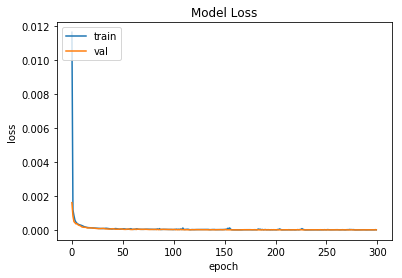

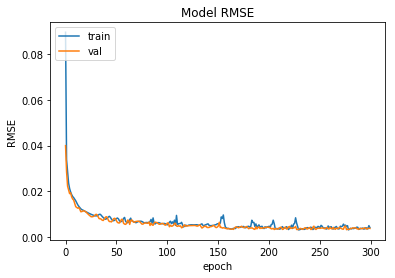

In [55]:
#plot the loss and rmse recorded per epoch while training and validating
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [59]:
#evaluate simpleRNN_model5 performance
Y_Pred_train = simpleRNN_model6.predict(X_train, batch_size=128)
simpleRNN_model6.reset_states()

Y_Pred_val = simpleRNN_model6.predict(X_val, batch_size=128)
simpleRNN_model6.reset_states()

Y_Pred_test = simpleRNN_model6.predict(X_test, batch_size=128)
simpleRNN_model6.reset_states()

xrmse, yrmse= calculate_RMSE(Y_Pred_train, Y_train)
print('Train Score (X-coord) XRMSE', xrmse)
print('Train Score (Y-coord) YRMSE', yrmse)

xrmse, yrmse= calculate_RMSE(Y_Pred_val, Y_val)
print('Train Score (X-coord) XRMSE', xrmse)
print('Train Score (Y-coord) YRMSE', yrmse)

xrmse, yrmse= calculate_RMSE(Y_Pred_test, Y_test)
print('Test Score (X-coord) XRMSE', xrmse)
print('Test Score (Y-coord) YRMSE', yrmse)

Train Score (X-coord) XRMSE 3.2465680478343875
Train Score (Y-coord) YRMSE 3.4544702856024307
Train Score (X-coord) XRMSE 3.5824555040759862
Train Score (Y-coord) YRMSE 3.7194939803707636
Test Score (X-coord) XRMSE 4.510387805726773
Test Score (Y-coord) YRMSE 3.765557627562276


3 hidden layers donot perform well.

## Real-Time Predictions using Model-5 (Stateful Simple RNN with 2 hidden layers)

In [ ]:
'''since the stateful model was trained with a batch size of 128, but for real-time predictions,
the model is required to predct for 1 sequence at a time. Thus, the batch size of the model needs to be redefined.'''

# re-define the batch size
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

timesteps=18
batch_size = 1
weights_saved_file='simple_rnn_wts_5.hdf5'

# re-define model
new_model = Sequential()
new_model.add(SimpleRNN(30, return_sequences=True, batch_input_shape=(batch_size, timesteps, 2), stateful=True))
new_model.add(SimpleRNN(30, return_sequences=False, stateful=True))
new_model.add(Dense(2))
new_model.add(LeakyReLU(alpha=0.05))

# copy weights
simpleRNN_model5.load_weights(weights_saved_file)
old_weights = simpleRNN_model5.get_weights()
new_model.set_weights(old_weights)

# compile model
new_model.compile(Adam(lr=0.001), loss='mse', metrics=[rmse])

In [28]:
#img= the image where you want to draw the shapes
#the tuple (255,0,0) depicts the color of the shape. Here, it is Blue.
#(x,y) depict the centre coordinates
#2 is the radius
#-1 is the thickness, Here, -1 means closed circle,i.e., fill the shape

scaler = MinMaxScaler(feature_range=(0, 1))
n_predictions=20
testing_dataset=[]

def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1)
        if(len(testing_dataset)>timesteps):
            testing_dataset.pop(0)
            pred_dataset2 = [i for i in testing_dataset]
            pred_dataset2= scaler.fit_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            for i in range(n_predictions):
                input_sequence2 = np.array([j for j in pred_dataset2[i:i+timesteps]])
                input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
                temp = new_model.predict(input_sequence2)
                pred_dataset2.append([temp[0][0],temp[0][1]])
            pred_dataset2 = scaler.inverse_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            pred_dataset2[:] = [[int(data[0]), int(data[1])] for data in pred_dataset2]
            for [_x,_y] in pred_dataset2[timesteps:]:
                cv2.circle(img,(_x,_y),2,(255,0,0),-1)

img = np.zeros((1600,1200,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27: #press escape to close the image window
        break
cv2.destroyAllWindows()

# LSTM

In [93]:
#LSTM with m/m between batches
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def stateful_LSTM(units, lr, batch, alpha):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=False, batch_input_shape=(batch, timesteps, 2), stateful=True))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [ ]:
def summarize_X(X_coord_results):
    X_coord_results.describe()

In [ ]:
def summarize_Y(Y_coord_results):
    Y_coord_results.describe()

In [ ]:
# save boxplot
def X_boxplot(X_coord_results):
    X_coord_results.boxplot()
    plt.savefig('X_boxplot_stateless.png')
X_boxplot(X_coord_results)

In [ ]:
def Y_boxplot(Y_coord_results):
    Y_coord_results.boxplot()
    pyplot.savefig('Y_boxplot_stateless.png')

In [ ]:
#hyperparameter tuning for number of units, learn rate, batch size and alpha(leaky relu) for stateful LSTM
def experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch, a):
    X_error_scores = []
    Y_error_scores = []
    hist_val_loss = []
    
    # fit the model
    lstm_model = stateful_LSTM(n, lr, batch, a)
    for i in range(300):
        hist= lstm_model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch, verbose=0, shuffle=False)
        hist_val_loss.append(hist.history['val_loss'])
        lstm_model.reset_states()
    Y_Pred = lstm_model.predict(X_test, batch_size=batch)
    lstm_model.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_Pred, Y_test)
    print('Test XRMSE: ', str(xrmse))
    print('Test YRMSE: ', str(yrmse))
    X_error_scores.append(xrmse)
    Y_error_scores.append(yrmse)
    return X_error_scores, Y_error_scores

start = time.time()
count = 1
X_coord_results = pd.DataFrame()
Y_coord_results = pd.DataFrame()
model_df= pd.DataFrame()
# hyperparameters
neurons = [30,40,50,60,70]
learn_rate= [0.001,0.01]
batch_size= [128,256,320,512,640]
alpha=[0.02,0.05,0.1,0.2,0.3]
for n in neurons:
    print(n)
    for lr in learn_rate:
        print(lr)
        for batch in batch_size:
            print(batch)
            for a in alpha:
                print(a)
                print('Model Number: ', count)
                model_df[str(count)]= [str(n)+','+str(lr)+','+str(batch)+','+str(a)]
                count+=1
                X_coord_results[str(count)], Y_coord_results[str(count)]  = experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch, a)
# summarize results
end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))

summarize_X(X_coord_results)
summarize_Y(Y_coord_results)
X_boxplot(X_coord_results)
Y_boxplot(Y_coord_results)
print(X_coord_results.head())
print(Y_coord_results.head())
print('Completed')

The hyperparameter tuning for the LSTM results in minimum XRMSE and YRMSE with the same parameters as they were returned by the hyperparameter tuning of simpleRNN, i.e., 30 units, 0.001 learn rate, 0.05 alpha and, 128 batch size.

In [ ]:
#function to test overfitting or underfitting of the model at each epoch
def evaluate(model, X_train, Y_train, X_test, Y_test, batch_size):
    Y_pred_train=model.predict(X_train, batch_size=batch_size)
    model.reset_states()
    
    Y_pred_test = model.predict(X_test, batch_size=batch_size)
    model.reset_states()
    
    #call function to invert and calculate RMSE
    train_XRMSE, train_YRMSE= calculate_RMSE(Y_pred_train, Y_train)
    
    test_XRMSE, test_YRMSE= calculate_RMSE(Y_pred_test, Y_test)
    return train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE

def fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch_size):
    
    Xtrain_score=[]
    Ytrain_score=[]
    Xtest_score=[]
    Ytest_score=[]
    for i in range(500):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
        #evaluate model on train & test set
        train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE= evaluate(model, X_train, Y_train, X_test, Y_test, batch_size)
        Xtrain_score.append(train_XRMSE)
        Ytrain_score.append(train_YRMSE)
        Xtest_score.append(test_XRMSE)
        Ytest_score.append(test_YRMSE)
    print('Xtrain_RMSE: ', Xtrain_score)
    print('Ytrain_RMSE: ', Ytrain_score)
    print('Xtest_RMSE: ', Xtest_score)
    print('Ytest_RMSE: ', Ytest_score)
    history = pd.DataFrame()
    history['train_X'], history['train_Y'], history['test_X'], history['test_Y'] = Xtrain_score, Ytrain_score, Xtest_score, Ytest_score 
    return history
    
def show_plot(fig):
    fig.show()

def run(repeats, units, learn_rate, batch, alpha, X_train, Y_train, X_val, Y_val, X_test, Y_test):
    start = time.time()
    fig1, ax1 = plt.subplots()
    fig2, ax2 = plt.subplots()
    
    for i in range (repeats):
        print('Experimental Run: ', i+1)
        model= stateful_LSTM(units=units, lr=learn_rate, batch=batch, alpha=alpha)
        history= fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch)
        
        ax1.plot(history['train_X'],color='blue', label='X RMSE Train' if i == 0 else "")
        ax1.plot(history['test_X'], color='orange', label= 'X RMSE Test' if i == 0 else "")
    
        ax2.plot(history['train_Y'], color='blue', label= 'Y RMSE Train' if i == 0 else "")
        ax2.plot(history['test_Y'], color='orange', label= 'Y RMSE Test' if i == 0 else "")

    ax1.legend(loc='best')
    ax2.legend(loc='best')

    fig1.savefig('XRMSE_LSTM_500epochs.png')
    fig2.savefig('YRMSE_LSTM_500epochs.png')
    
    show_plot(fig1)
    show_plot(fig2)
    
    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    
run(repeats=5, units=30, learn_rate=0.001, batch=128, alpha=0.05, X_train=X_train, Y_train=Y_train, X_val=X_val, Y_val=Y_val, X_test=X_test, Y_test=Y_test)

#results retrieved

# Xtrain_RMSE:  [174.22991679676701, 62.97412788155803, 53.967072523232915, 50.519077763749465, 47.68760776097637, 44.947407295609395, 42.1522267699749, 39.22341200489819, 36.10890907680952, 32.636903663389866, 30.01845340967587, 28.028525388736472, 26.931333944698697, 25.991246901581423, 25.17763046709487, 24.39960200424356, 23.65001473515434, 22.87589012196599, 22.147984984672405, 21.432974638974933, 20.739021517437664, 20.11529100806774, 19.51227304226614, 18.96763109355973, 18.474575644576735, 18.034290420117916, 17.645549966201617, 17.271051262442413, 16.898990748851123, 16.53387096936, 16.18528553416988, 15.8740104976467, 15.595846523649078, 15.350967858005523, 15.165592674317471, 15.12448445842213, 15.12379018070334, 15.119017539319625, 14.823360159663435, 14.576692063243309, 14.39407770057606, 14.248114795628428, 13.93579490627143, 13.581701525303886, 13.261365285937293, 12.890508135446925, 12.61156081418159, 12.472354744971273, 12.369398514873055, 12.306936500277484, 12.224854421284768, 12.124449091061704, 12.053589062319222, 12.050610814530444, 11.99000502019534, 11.927634017369442, 11.866557003933323, 11.805592729541992, 11.730029450876904, 11.653967529521164, 11.578998130782933, 11.525151390232958, 11.484223589269385, 11.45391920082548, 11.4362326362014, 11.477468382389786, 11.473639413335432, 11.489145998158065, 11.431897164688673, 11.430515203400072, 11.414404511873697, 11.283994082566654, 11.221619985304491, 11.058926028967194, 10.871754665725392, 10.684713266210203, 10.554976584420151, 10.495205456243339, 10.320188408282618, 10.161540181792512, 9.97195936522718, 9.914059783642346, 9.769455257667168, 9.614673710362196, 9.405860489730935, 9.26238741661588, 9.176208656074092, 9.06062814099665, 8.92622505329396, 8.826497998514368, 8.72747444242272, 8.648094283068193, 8.523327304567863, 8.453158387147115, 8.433604485537295, 8.347047768548762, 8.276775912511123, 8.22093976511351, 8.151345335492136, 8.036148249514573, 8.021720179547792, 7.943347721836173, 7.912679538892865, 7.942020516604119, 7.896853966540238, 7.882637218432718, 7.992425499999142, 7.962549623949624, 7.988508027801819, 7.934883670818242, 7.872045472133879, 7.747021330384177, 7.530847174605812, 7.257657904915489, 6.857843200166908, 6.306324045143488, 5.916458866741325, 5.640516411255163, 5.56090336528679, 5.499661111538423, 5.467291452409577, 5.433717067082066, 5.393333187890427, 5.360083970246692, 5.337925552826795, 5.312667948357318, 5.283773899500095, 5.2553448389363195, 5.220021679678138, 5.189425150512368, 5.1544115323015145, 5.122432249467685, 5.090541694000006, 5.0548681754095695, 5.015309377885409, 4.976296794158199, 4.93895799094363, 4.900562335569656, 4.863314276694237, 4.8298765026018255, 4.794543717804936, 4.767256866686661, 4.739082174583581, 4.716408579883251, 4.695780476550963, 4.67505191671881, 4.644702458895435, 4.612161664129356, 4.582487052038349, 4.55055963058359, 4.5249267636769215, 4.500629838577033, 4.479965140688696, 4.45835675299443, 4.44524590298963, 4.427421999766223, 4.41002810998533, 4.4036536202206715, 4.375163586509999, 4.394012861506698, 4.409817490214586, 4.39937420853406, 4.3917230362771456, 4.393111201007295, 4.364280167497959, 4.3569386252436955, 4.372141977258342, 4.35585132642288, 4.39104913726, 4.354880542124639, 4.402877306321597, 4.319702932996124, 4.280639227432717, 4.3013782472253235, 4.359755368737461, 4.274212902349428, 4.278518243978619, 4.230718083537896, 4.283604022928001, 4.211354460059223, 4.197370735037738, 4.170538124986687, 4.194898127912642, 4.15915283087279, 4.0921001043068985, 4.093885323224369, 4.149871998844, 4.110008561461119, 4.0511829583525865, 3.9964294887357488, 4.060639111945415, 4.062793812164881, 3.9961023748503717, 3.9747650882543812, 3.9604809313425315, 3.9569941941963442, 3.9490448459462377, 3.910007794253585, 3.891705613279138, 3.8943776972284336, 3.941781494977009, 3.8829121199005834, 3.8061155973691605, 3.792155304874836, 3.767462344925862, 3.7524565348554852, 3.767485526496827, 3.77586611523048, 3.750448356007288, 3.7281394952156597, 3.697687067354625, 3.7067503551587957, 3.67289001741392, 3.6645975999890257, 3.6795194168701, 3.6686947643795387, 3.655137136071534, 3.6599576447031223, 3.645639721476259, 3.638411504880006, 3.6512955225376293, 3.660287047421966, 3.6389309059710615, 3.6664580300997076, 3.6764412878227875, 3.6588541338109057, 3.627271176898343, 3.5663833683044435, 3.5477161547331453, 3.5275867114040054, 3.4829108234050414, 3.4795422737249706, 3.5228634265167917, 3.475582418840022, 3.4825196444693485, 3.495089073906516, 3.520801967934444, 3.5407112499767197, 3.620721139759584, 3.6468555310938124, 3.64338549761484, 3.506864830197786, 3.3922919952848436, 3.3816557266996217, 3.3427531682819804, 3.3618768652134774, 3.3755095128051598, 3.3464766609211707, 3.357874494598001, 3.3700637228855563, 3.3953623315612664, 3.4248087753810017, 3.5091774760447714, 3.568800389811085, 3.6370261314826307, 3.4518746176014417, 3.33823714346937, 3.294501014882065, 3.3104224335422368, 3.325147357583259, 3.2963005013311792, 3.2870778320698766, 3.2943803343214455, 3.3008960410835586, 3.3344514058375525, 3.3339559321236143, 3.384724677544699, 3.355485069282871, 3.3501664353110865, 3.315089562927476, 3.249673174713357, 3.281882429826573, 3.267854986107642, 3.2589684880574117, 3.2299512986034817, 3.2366510151291568, 3.2491097373114273, 3.256923436085406, 3.2217908878202506, 3.2836589674336993, 3.2726441612954513, 3.28353615669782, 3.1908576651669613, 3.190809367073293, 3.206011355050126, 3.190248245981394, 3.1869029900595693, 3.2111545707004097, 3.212130021381419, 3.1801013372532303, 3.1381933799350974, 3.1525860921071267, 3.1635195716239153, 3.1853751687184344, 3.1860217819621166, 3.1438642995784316, 3.1656301589019, 3.163205600489623, 3.1689232352475374, 3.1900342758934035, 3.2214719822034996, 3.143074486798944, 3.1762796106888427, 3.2187329685227346, 3.19167361998743, 3.1460158772429665, 3.0993576801776372, 3.1008712372942067, 3.1563844087571176, 3.1250006730257796, 3.1129378406038377, 3.0825512081879736, 3.0854665877498215, 3.1003533601639535, 3.1009822112569516, 3.0921567013024482, 3.0800242877636372, 3.060037755845011, 3.1041529114743147, 3.151178218845448, 3.1429496355681366, 3.1054375582805753, 3.055163134872729, 3.0847980156564865, 3.0872085177804776, 3.044039590298653, 3.053207936076421, 3.0555599413620054, 3.073029559189334, 3.090927673942817, 3.081344653293773, 3.0772128965392107, 3.0744536928091106, 3.081355053450827, 3.0466232304440295, 3.0551355389736323, 3.0236008880946716, 3.0407711951758056, 3.0410383104963175, 3.05365986095547, 3.030431177999123, 3.024006859127646, 3.0613201916514714, 3.0224309562246416, 3.047428534758854, 3.0161724326671133, 3.0295779617766123, 3.038262978127968, 3.044194873642728, 3.0250936254715683, 3.041385416077598, 3.0076700647608985, 3.0316660349527265, 3.0010976016807573, 3.0177973932056785, 2.9982526718869065, 3.027722596480678, 3.003679295292502, 3.0214604165025123, 2.991120551709928, 2.9925844566337743, 2.9939629302874162, 3.0035521972620045, 3.007780748247317, 3.0175122957557807, 3.004148804752869, 3.003236711180005, 2.979623624750681, 2.9852067344663724, 2.9769529415805596, 3.004534761838463, 2.9812343623037387, 2.988629516476821, 2.9746291041580646, 2.9814506806315455, 2.9854891708279485, 2.982369428015885, 2.9865531571145945, 2.9799373708038543, 2.966733121982168, 2.9618640333699986, 2.955085063567756, 2.9537061651148013, 2.9551384887935206, 2.9654755018468295, 2.946930249182987, 2.9568703465855712, 2.949954150667289, 2.954532563841939, 2.952576151848952, 2.952960060422849, 2.944915183009822, 2.9589831578283294, 2.951912571077834, 2.9491795487066943, 2.941509761388901, 2.9489783897409576, 2.9474396212098855, 2.9501570219636473, 2.9382909203445418, 2.948546835450629, 2.94127957383734, 2.949028511385439, 2.937564101908872, 2.945043435753207, 2.940784121045531, 2.941911986728402, 2.936814764137521, 2.9414163095033485, 2.934556610637887, 2.938210980910391, 2.937475442013585, 2.936420117496539, 2.9323128334652595, 2.933989354874104, 2.9306157495960194, 2.933553351642432, 2.924343128203442, 2.927903450540249, 2.930016519305774, 2.9311903899949576, 2.926679986239183, 2.929529030914256, 2.924897113564286, 2.926207229204404, 2.9236965093309206, 2.925711764976036, 2.9256325965044985, 2.924362573566213, 2.9207260394915635, 2.926353649135842, 2.922489189721753, 2.9216475755022633, 2.9198054690236748, 2.923469448562001, 2.917622547354821, 2.9210456219394394, 2.919715227268874, 2.9223910915716473, 2.9155929662291364, 2.91737262268677, 2.919683071249962, 2.9296260670247385, 2.921062834150267, 2.921388495511669, 2.9195221351124454, 2.925951267911014, 2.9194301959503397, 2.9212370059967077, 2.915599343020686, 2.9169586036964885, 2.917363226626981, 2.9196248989120415, 2.9173052261927657, 2.9217142069453894, 2.91624085938577, 2.9224314525747612, 2.9210167571602392, 2.9158604554460457, 2.9170004755534498, 2.915034707704686, 2.912468722249214, 2.9148711199920356, 2.9165071452419076, 2.916667602658984, 2.909684570072507, 2.918191161303821, 2.9202574425015184, 2.9152238112132394, 2.9209109951210253, 2.920062895534729, 2.937493400591597, 2.9183867782058264, 2.9190855357581453, 2.935671897308074, 2.918852292359054, 2.935290882654772, 2.918936974785442, 2.9147772565935344, 2.9117204976178654, 2.9159491703781257, 2.911985777672066, 2.9023190087393114, 2.90717253352794, 2.9041051954817503, 2.9037299767121825, 2.919402071903148, 2.9235980897660356, 2.900158556993119, 2.902862581554533, 2.9160688198797375, 2.906885645588153, 2.895499292661791, 2.9143440602053414, 2.9153762950363373, 2.9098038770960044, 2.920872546878692, 2.9214208648658877, 2.912980618666351, 2.9111481932533714]
# Ytrain_RMSE:  [87.14283462449637, 45.93295246154922, 37.67597135646219, 34.08962310722749, 32.1204868295215, 30.49018184815294, 28.84148632045309, 26.977897749353964, 24.709518946241573, 22.050472570874035, 20.005586134393504, 19.25633034943313, 18.421632400153225, 17.75418744462442, 17.2660316884207, 16.922393056184493, 16.6771657331381, 16.49852981898824, 16.292756878270424, 15.938624892900043, 15.350359383797004, 14.73548512958156, 14.27549578554086, 13.89655306118321, 13.498490278708623, 13.094469926031211, 12.715543206235477, 12.352176226005529, 11.971275912906618, 11.610295981063837, 11.281160993292099, 10.981438386815274, 10.710520248564343, 10.457291697494016, 10.219639502036292, 9.996603166540806, 9.79206579363573, 9.6031896616129, 9.436971779657378, 9.255356372591075, 9.073498256556602, 8.964590190574468, 8.890496214918562, 8.82827030048259, 8.722879849622428, 8.5524173549753, 8.232886436004057, 8.025134168989103, 7.904111005126388, 7.801839718311468, 7.628266821324092, 7.440644527690813, 7.260640155094274, 7.126813977659982, 7.023850470291403, 6.946360824545057, 6.881801559417717, 6.821795334374701, 6.7634128250726215, 6.7058536257775065, 6.646386113178553, 6.588302670464733, 6.5321636974444095, 6.481841990200623, 6.432777757244421, 6.387123293580255, 6.344311003950957, 6.302809713764565, 6.258227926758497, 6.214205351030797, 6.172954425920399, 6.124212398704255, 6.083488737444355, 6.038441664149998, 6.0001378325579715, 5.958529209361646, 5.920063260228881, 5.888738196816407, 5.851956387474443, 5.820262269822963, 5.784334548008232, 5.752055593877045, 5.719026331995776, 5.693257744562084, 5.661122155561252, 5.6380106951263445, 5.617254763903821, 5.594091578398767, 5.563164596412937, 5.5321171232251345, 5.503389626517821, 5.47774183263753, 5.444268696342428, 5.418304968343379, 5.393706073468619, 5.3616232683519645, 5.330371195805899, 5.290530552201453, 5.2548452113359065, 5.223953593769254, 5.192464001977316, 5.156571439796156, 5.119580037192148, 5.065704987911513, 5.0177138753618635, 4.9656583116225335, 4.911201860576765, 4.853484278251031, 4.788648215226215, 4.726651621734094, 4.661950463894161, 4.6046268998971, 4.5485303120396905, 4.503669967555449, 4.454667909922663, 4.404790051451038, 4.355988768752477, 4.318284326245376, 4.287015085500001, 4.2703107756102945, 4.261568780285404, 4.2401402312625205, 4.25003446414, 4.229871054192062, 4.235622028285927, 4.197717704874501, 4.174456192218793, 4.159455657316231, 4.109695096139569, 4.08754414880756, 4.0475442661930945, 4.019923696932543, 3.9824182272557653, 3.959463615151262, 3.9262750704169718, 3.905439442938387, 3.883448047244818, 3.8591911056674206, 3.836012899390112, 3.80757107264379, 3.7829713096969306, 3.748206657724556, 3.726844011616735, 3.6905700642036017, 3.6665694071063006, 3.6435053480517383, 3.640166959159234, 3.6493453797284348, 3.6710354680361785, 3.678422911451545, 3.660409227553252, 3.627995116261798, 3.585605206577716, 3.562135210193233, 3.5485090726225463, 3.527814854476089, 3.5290837554604897, 3.518236691900669, 3.5107401092846633, 3.4981855221941633, 3.4887052244979295, 3.4718214743098152, 3.4496076795163737, 3.437970060255157, 3.419176545129479, 3.4043755139588003, 3.3974972035064446, 3.3812149051175022, 3.3839796451337554, 3.364821040933991, 3.3664944847514136, 3.341282882238236, 3.3311079148537126, 3.3242301597307695, 3.32071919325886, 3.2956901545334465, 3.300829295564751, 3.2884625391663174, 3.290873496104014, 3.268837320510735, 3.2646730111798496, 3.2525181454827408, 3.2543763796279026, 3.2472823564486837, 3.222069689250675, 3.225448443993318, 3.244311671210665, 3.234117325766922, 3.2114190047313556, 3.180483397464466, 3.2079148923898786, 3.211317060753726, 3.186231703384125, 3.1714604600803535, 3.1701507923002397, 3.163645320156952, 3.1634699141456526, 3.161399124297702, 3.14777826992976, 3.1420538252212795, 3.157973462938626, 3.1494627897549066, 3.1262135838094975, 3.126393645233189, 3.118530493603299, 3.1111757003333724, 3.1097620621209945, 3.108219530516315, 3.0914022001539387, 3.088930545731743, 3.0725470626115414, 3.0661094873374175, 3.065636111153896, 3.041986381706601, 3.0208763849378575, 3.0291584689800564, 3.0142071741909398, 3.0035262614322265, 3.00566272116869, 3.0134504694752597, 3.0109723518559814, 3.007520310540332, 2.981649512423051, 2.978109525906791, 2.9940343348471075, 2.9841031038551677, 2.9830710836998167, 2.9524152185814425, 2.9451110184027303, 2.940381320804045, 2.931343369220732, 2.9105422534472587, 2.9067223284527905, 2.9251767165263978, 2.905784601732298, 2.897014265272291, 2.915759192461914, 2.903294041370025, 2.9166156918143518, 2.9239500528143814, 2.91309111828764, 2.9020311770988374, 2.8769111917825265, 2.865879570261596, 2.8589984120796057, 2.831979600408677, 2.830625277376912, 2.8385493456337194, 2.8343145963903775, 2.8306501556172528, 2.847611462606024, 2.856522295043755, 2.8699461187579374, 2.864523157018454, 2.868273043286836, 2.8606062042534632, 2.853006200249771, 2.8199464035329718, 2.8024712458719496, 2.796558099104132, 2.801526523892555, 2.7921659418785287, 2.797164734785437, 2.791506577534673, 2.8085121439244918, 2.8023278461392387, 2.8272816702712675, 2.8346009547409454, 2.815111836338449, 2.8166628571781627, 2.7932670694266117, 2.781081252642841, 2.7649622421005433, 2.7696679086963885, 2.7715757564071435, 2.7774263947471205, 2.7667746517673204, 2.7771924728476756, 2.7729112209201703, 2.7712964515701155, 2.7709616522228426, 2.7752145159037904, 2.7755687324239418, 2.764706386537768, 2.7523311938474513, 2.76849853077982, 2.7585200786355024, 2.74750295183672, 2.7396540576981376, 2.742363742606459, 2.751325905997103, 2.7510856405813033, 2.754188198686377, 2.7373572780889006, 2.7333577537591136, 2.741552646649439, 2.7309812112942553, 2.727963468767221, 2.740652384991465, 2.7250068741819056, 2.723531777298435, 2.7401095394082327, 2.7300466469184324, 2.7243153875965858, 2.7250692103066445, 2.7325275093945507, 2.7435623755211354, 2.733613755025651, 2.7155280779543456, 2.7179595361808833, 2.7143797350884884, 2.7175301278932427, 2.716993521906976, 2.7089437767347366, 2.708810466280323, 2.7074606555605043, 2.7128406809889674, 2.7118631195751224, 2.6954329793946403, 2.6848750819413314, 2.6774466015397915, 2.6835078580041856, 2.7064554864011443, 2.708595990069862, 2.6918533188763174, 2.6971034436287598, 2.6970456658472792, 2.6854744017030607, 2.6736851970525426, 2.675160730952999, 2.6740514631441528, 2.6764597203369274, 2.6743757741775167, 2.6802186910157126, 2.6781626361326443, 2.6775878345752373, 2.6834755346256833, 2.6832008842102626, 2.6695750842431987, 2.6705295884828604, 2.657408734285241, 2.6689231424263946, 2.6640831653710633, 2.6556881915930193, 2.6571862414191707, 2.654983111602901, 2.6496149491280026, 2.6540079194614945, 2.6418159361292006, 2.6555640732171617, 2.6466876546624762, 2.655351106922184, 2.6551558322020354, 2.6485257501072015, 2.649445060503276, 2.64561063577674, 2.6555307959457704, 2.6403626005651706, 2.642047820427837, 2.6265844132858085, 2.6280392536673336, 2.631439254338764, 2.625302903362999, 2.6290785082279244, 2.626007778894347, 2.6361122127774377, 2.627049544026603, 2.615529907596334, 2.6197114257268934, 2.6219378250596463, 2.6267838199341864, 2.6210430652536676, 2.6232986043796154, 2.6089426852553776, 2.6131928002065816, 2.610575105408415, 2.6054150808013414, 2.614600822646038, 2.5972212015558624, 2.5948475411827383, 2.59571971321145, 2.598571280302027, 2.5977501781310597, 2.599904198502875, 2.5833292790175917, 2.58947135115408, 2.597990825064503, 2.588848240957908, 2.586645845862636, 2.5834417597028168, 2.582367953009559, 2.5882693525017446, 2.5864782007397498, 2.5774695338949667, 2.5757823482092266, 2.5732285775718218, 2.572417903910302, 2.5684388635074926, 2.5663676172792513, 2.5643926595857773, 2.567224798487048, 2.560903209805231, 2.565198360359982, 2.5618249475175223, 2.5643435160150765, 2.553418261706788, 2.562514140812368, 2.547736925143684, 2.554951561998838, 2.5518238312273978, 2.550428302051783, 2.5425874025757036, 2.5474147727939616, 2.544273800339746, 2.546629890993956, 2.542229554085145, 2.5490358605813475, 2.5447083932219727, 2.539702665280958, 2.533183173626745, 2.5363240378973235, 2.534012743974132, 2.5327051821333932, 2.5282944168685195, 2.5307938732085744, 2.5227373328684273, 2.5257420127685637, 2.5203283268751457, 2.5203009319790257, 2.5183321580535565, 2.519464742813111, 2.506317253481065, 2.5145243745737127, 2.5103669656697742, 2.513735669903262, 2.516528632495494, 2.5116214777093058, 2.5052548470533793, 2.5100722761969934, 2.5048156070974623, 2.5111422358326556, 2.5019750863549066, 2.515802117534558, 2.5026709167820647, 2.5105059636946816, 2.5044863607196515, 2.513451622072378, 2.4982063985213427, 2.5038152639539035, 2.4983999171375695, 2.5001868043232798, 2.498237807570065, 2.4982085238977474, 2.493643317370453, 2.4926336521101216, 2.4951209943449713, 2.4987459492799413, 2.4914972514467606, 2.4939013454724384, 2.4906453370219834, 2.4906747872649224, 2.4859703297389393, 2.489461478712947, 2.4859887808505565, 2.4860113150629912, 2.487214333414702, 2.489090829200354, 2.4787054992375004, 2.4829807143416986, 2.483999448392598, 2.4819048142719558, 2.497890732048383, 2.481777476254984, 2.4844250698301744, 2.490563543311583, 2.4818123375997097, 2.4955578508143, 2.4810279543649134, 2.486620746036195, 2.4784290370749, 2.4808485188531444, 2.476648818449497, 2.4767965504951253, 2.476870288138253, 2.4798814646189773, 2.4826190587042163, 2.478802951234125, 2.4768741184635505, 2.4741720483768277, 2.472765194910268, 2.4721748827782597, 2.4766178178124925, 2.475704128821394, 2.481375215544691, 2.4732567216071843, 2.471848572096864, 2.4663552700272673, 2.4626059121190074, 2.461778194545147, 2.461816906074634]
# Xtest_RMSE:  [173.2152388725833, 59.59425798577952, 49.575313662788325, 45.96055055506539, 43.29676723975673, 40.83372992744525, 38.383403901584494, 35.877669133898245, 33.284422279935, 30.315106619751234, 28.089565266244062, 26.069762679184887, 25.0194542305909, 24.195356788872363, 23.501034457918994, 22.889061801807507, 22.24535884059107, 21.516436270814076, 20.876721727146233, 20.287834766565183, 19.65481454950199, 19.039474750213493, 18.463465997807255, 17.929548716111064, 17.441971005453606, 16.997212576590215, 16.613151367187122, 16.244682168923436, 15.88623508314777, 15.53280849635693, 15.199204556692587, 14.894680323107256, 14.62384654366015, 14.39195440321541, 14.231236533999297, 14.229262670275666, 14.268306008821982, 14.302216969649528, 14.009300861773808, 13.763294431990778, 13.59422624877099, 13.447854908531454, 13.116870351889373, 12.742030133214646, 12.405779439949857, 12.005672707002008, 11.70589744666457, 11.573680275278182, 11.479115189219309, 11.414108768971417, 11.326529745579249, 11.221556997044376, 11.151603418569747, 11.157986856448005, 11.100396772001076, 11.040587869730757, 10.983050962663498, 10.92675596518144, 10.855819677759406, 10.785694001244003, 10.718030397620526, 10.6744505619415, 10.646433234212266, 10.630707559755809, 10.6286563431081, 10.691214469529932, 10.70359060522901, 10.738357195009185, 10.69463012837697, 10.709950813869193, 10.710714342442499, 10.588672933419511, 10.53909287986924, 10.37798446935335, 10.194257534395069, 10.012132698160409, 9.889649587265769, 9.842033904442651, 9.67149604299473, 9.518970234595688, 9.331793580265842, 9.28034553024559, 9.135928853190423, 8.981059664393264, 8.767408313987637, 8.622783888132124, 8.535710388469539, 8.417645555292745, 8.27916636482506, 8.176832931042089, 8.07577162848157, 7.995317975137482, 7.86678675276259, 7.795386518371597, 7.7767767422390195, 7.687273086163251, 7.614301484460872, 7.556035784772984, 7.483617008300548, 7.362246387870135, 7.347413842814492, 7.264503136731539, 7.23101605928181, 7.2620743028520796, 7.215855498975617, 7.199979899521281, 7.3173181927469315, 7.287931004294435, 7.319630261018604, 7.263245760640625, 7.200711404607186, 7.0714697303826055, 6.846311456081608, 6.563039789849122, 6.1417448911911405, 5.560201701511471, 5.142983435410603, 4.850941657842957, 4.771232133878946, 4.701141753830225, 4.668561118271515, 4.640528671803652, 4.590317642616238, 4.5615161444951875, 4.539196790128157, 4.515403112636251, 4.488251618720097, 4.460394305597025, 4.427265328149612, 4.3995372374580395, 4.3677483385791405, 4.3377108486132, 4.311186335009725, 4.278845449957892, 4.242659342616077, 4.206687706280342, 4.175363577418308, 4.141878483376819, 4.113593931900806, 4.086026262112739, 4.058296942013005, 4.037064901354552, 4.016215761709096, 4.0009938906810145, 3.9881978272518332, 3.974394729979949, 3.94893886998161, 3.920076061983964, 3.89221399146152, 3.8634857918585515, 3.83953012851539, 3.815525222890347, 3.7967738698021813, 3.77658138974492, 3.7641986821592237, 3.74729169936949, 3.735333222577859, 3.7318490558390645, 3.7037848899609016, 3.725300971308863, 3.7470570490673865, 3.735833970718143, 3.729558851580172, 3.7353935202183193, 3.7118207560287337, 3.708752388255184, 3.7293717319540245, 3.7146768812038755, 3.7556181525350887, 3.718101174891942, 3.775884656953281, 3.6893017280938336, 3.652484866150017, 3.676203311345089, 3.7450200246551506, 3.654900665895108, 3.668359568403543, 3.6164817696107785, 3.6807266497212554, 3.6026859109377156, 3.594138366943016, 3.5677285412667175, 3.6021352690248025, 3.5653444950886817, 3.498716929950966, 3.50072886683559, 3.5708170560100174, 3.5318356274130895, 3.47293666078686, 3.4146735401840425, 3.488476495273399, 3.4948231318759024, 3.426212775769181, 3.40806369467743, 3.3962842830831557, 3.3936054645607197, 3.3915749885660276, 3.3532525880616886, 3.3344997348005383, 3.339171144478498, 3.3952565446629333, 3.337692269888551, 3.259241338174742, 3.250722195155532, 3.227026360511858, 3.2138160772284707, 3.2299950228998746, 3.2430322565920755, 3.2162949756491517, 3.1999853173815445, 3.167535944184822, 3.18150058532175, 3.1496157933274755, 3.1384351279089198, 3.1541963428330844, 3.148590105787024, 3.1321269910099474, 3.141231052391196, 3.12748444844, 3.123443001681536, 3.1384748477856252, 3.1475644038470563, 3.1221669191615073, 3.155900481873317, 3.1732964063418048, 3.1532665330298815, 3.128298922079655, 3.058656360108465, 3.0445782356447144, 3.0264877742148344, 2.982199668334869, 2.97651269976628, 3.028685820615267, 2.977153604040183, 2.984506611546194, 3.0006703049123344, 3.0311905432430795, 3.0531306564011302, 3.1406417284539856, 3.1709790068926362, 3.16915056854577, 3.0286991523772984, 2.9098920611584815, 2.9038543273847917, 2.8655419341544124, 2.882269625933028, 2.9017346123317234, 2.870088986426643, 2.8831252191889094, 2.8961288850927382, 2.925191850577268, 2.9550912015100383, 3.0481525684006003, 3.1113423450337496, 3.188134202083212, 2.992179776319307, 2.877764136483092, 2.832121421597266, 2.8489907632066265, 2.8667384870409394, 2.8411605278221557, 2.8307788172159185, 2.840430806544027, 2.8474914310914308, 2.8868749545377113, 2.8844502671972365, 2.940907624089499, 2.911970867440828, 2.904854184081768, 2.8775331666190556, 2.804015588275676, 2.842694881360711, 2.8255288047622065, 2.8220137934589715, 2.789588420582924, 2.8002200747828963, 2.8108924770530885, 2.8271958113011384, 2.7872127403161984, 2.85476912847109, 2.8419423951930076, 2.8569179053144147, 2.7650633345207885, 2.7619167574708476, 2.778577731716111, 2.767138664772331, 2.7607977361088243, 2.785853963187531, 2.7888575712341215, 2.759408802142464, 2.7204097042454203, 2.7328418633319056, 2.7442717517465676, 2.764959927030216, 2.769656808781876, 2.726459628028872, 2.748839409231427, 2.748432430710133, 2.7539130527178326, 2.77711244782047, 2.810902541241743, 2.7333930996944313, 2.7642919011539187, 2.8103457068343385, 2.782400999657139, 2.735527728569123, 2.6966480009466633, 2.6904958766997673, 2.7479022844061523, 2.7192433275027366, 2.709278284109536, 2.6816762687902957, 2.67972724654098, 2.6974419876807767, 2.698384883795493, 2.690264205361106, 2.679133823270438, 2.6605886117053816, 2.7007189434328787, 2.7480481417977427, 2.7413287391724697, 2.702784488232394, 2.657644718671726, 2.68263616632182, 2.687035625758776, 2.6449573800369715, 2.6563873180136666, 2.6567739332707614, 2.6726777724223454, 2.6924060016803004, 2.682234586474309, 2.6777544468158387, 2.67605920160169, 2.685007035953677, 2.6526707380235073, 2.6579233562224562, 2.633188807522974, 2.643494607032914, 2.646583915873316, 2.6589431612154315, 2.6370202938034124, 2.628956526245256, 2.663469368547609, 2.628053397272362, 2.650796258149986, 2.620976420367387, 2.635465766651929, 2.6439637500906255, 2.6502019602302234, 2.631950721240913, 2.6480606614496978, 2.615836089505461, 2.638374748672592, 2.610740759588126, 2.6252866574301703, 2.6091191178512507, 2.6354534540492724, 2.6139544400384827, 2.6304212761646526, 2.602974883268872, 2.603033094832185, 2.6041482473619397, 2.6139722860039356, 2.6179655906074064, 2.631302056283552, 2.615713423221978, 2.6152314150156455, 2.593985032696546, 2.598242431197169, 2.591610368639082, 2.6171465944170196, 2.597934204437424, 2.603052389791723, 2.5918918918524247, 2.5957027642296464, 2.6007910758749557, 2.598117767862703, 2.604612573066933, 2.597848701077379, 2.5845962105382085, 2.579772392906581, 2.574066801616483, 2.573993229231543, 2.5763602644462624, 2.58198212681242, 2.572816897326794, 2.578118959422822, 2.5731024565150826, 2.5765325848498195, 2.5751616709266654, 2.5746492373650667, 2.5715034052596337, 2.575954058993626, 2.5734033970656327, 2.5720195968296418, 2.5681990846660265, 2.571019875349029, 2.572250022598914, 2.572758087307267, 2.566249938917182, 2.572008971267588, 2.567824635221512, 2.5724768322151434, 2.5674672959712708, 2.5692759184468152, 2.5673685727198006, 2.56682515300033, 2.565470420484521, 2.5661397611216055, 2.562601340372311, 2.56550986573293, 2.5638635913411383, 2.5615850909764193, 2.5615714493039072, 2.5612316605394008, 2.560757053748032, 2.5584723907186975, 2.554717915332776, 2.557714139936205, 2.558343304933362, 2.559342391707267, 2.5587887516676218, 2.5615606952761154, 2.5578339221080606, 2.556575738431254, 2.5594588006504964, 2.5542053119243535, 2.558290613969975, 2.555355784508676, 2.555250162971859, 2.5566026453963357, 2.559368244142726, 2.554000302104394, 2.5518655139164386, 2.5538399834530936, 2.5486419802318276, 2.551986196181823, 2.5517053833512917, 2.5497065135578874, 2.549992656877103, 2.5531454199855923, 2.5467368186519006, 2.5509091491936373, 2.5503399548469368, 2.550265797046096, 2.5509244821556107, 2.5540080546491257, 2.5476022987755007, 2.547701731241941, 2.5483377198008137, 2.5478909912279812, 2.545920310269221, 2.548177453341713, 2.5477672302423118, 2.552022282371088, 2.5474879598181763, 2.5502839705079094, 2.5464445311315336, 2.5464115045278097, 2.545635396202798, 2.544388606591845, 2.5445172932790197, 2.5494843049267844, 2.540352797595832, 2.5442404776345695, 2.540220147170157, 2.5506888826575924, 2.5539278224314748, 2.5379975592838515, 2.548405290584245, 2.551971725167386, 2.5624900677199705, 2.5464120365184444, 2.5477903326084936, 2.567264520467066, 2.5451451920387123, 2.5624110132874027, 2.5486654760428893, 2.542991227594989, 2.5499465383260476, 2.542508365642856, 2.5431542537380487, 2.53573185755919, 2.5447367675307757, 2.550527667818501, 2.5393990696626365, 2.5516008020221053, 2.555065631694255, 2.541910693691469, 2.5431417243244265, 2.5495133771611243, 2.5479023555212263, 2.5384528374664734, 2.554376308354556, 2.559861719319096, 2.5285008784351253, 2.5599796511412425, 2.5476513977065327, 2.547233837439202, 2.540146596237043]
# Ytest_RMSE:  [84.78350647207374, 43.673823556351564, 35.53646973947691, 32.022966965836765, 30.184011221237053, 28.67470801243535, 27.12311761134538, 25.34518458447299, 23.1707381191333, 20.66220170310315, 18.90050445293242, 18.36521776594326, 17.623757837378296, 17.015511771691386, 16.570827334213895, 16.278019681263903, 16.0745924090583, 15.941805427433744, 15.771480067336313, 15.428645520422517, 14.81461099983842, 14.158723439790126, 13.673681034417198, 13.280952193246675, 12.864460610162215, 12.442301601055215, 12.055199458639962, 11.688292304663065, 11.298585359407303, 10.935144784210745, 10.611316508237927, 10.3300967930532, 10.082924437578711, 9.85546838743444, 9.640852220566947, 9.434819731359823, 9.245901104432741, 9.065156405063904, 8.909632492933135, 8.750092742423172, 8.614449391937029, 8.562742954655429, 8.52498933753244, 8.493431512260212, 8.404424398156056, 8.226472786720588, 7.875454455943657, 7.658723836196519, 7.545565781644654, 7.4524356934800915, 7.2713042347515096, 7.070608500150154, 6.869572199357135, 6.718696478748961, 6.603049658241176, 6.517531675444024, 6.4500131047558655, 6.389244912946674, 6.3305243229880634, 6.2732982952634275, 6.214401045314602, 6.156250642267706, 6.09899376356437, 6.046047006258576, 5.992112806958017, 5.941498619252399, 5.89220754706924, 5.846459961565886, 5.7962066670153645, 5.7456853428182, 5.700741219016759, 5.64765163804587, 5.602427229324109, 5.55359818083167, 5.509268467687066, 5.461928645746112, 5.419492631265528, 5.382831110484482, 5.339279021583507, 5.299545001291044, 5.2563830165625225, 5.217818728540832, 5.179599675798802, 5.149478250356532, 5.113140426603714, 5.08567491918602, 5.0599640884326655, 5.0330600572356055, 4.999939644243191, 4.965414161409194, 4.93064135704413, 4.902141094593143, 4.865173365528464, 4.833533382640711, 4.8060508363140295, 4.769356526098147, 4.736889429838327, 4.6946818615568695, 4.6595943844400525, 4.628956516043137, 4.597890299414035, 4.56651149729964, 4.532142644872037, 4.480616508606678, 4.439308885060707, 4.389804988574567, 4.34078788011379, 4.286822482353797, 4.229156492209249, 4.172871246445815, 4.116834328015873, 4.065570754802693, 4.018142977802627, 3.9845126331008704, 3.9416637480756855, 3.904869830105217, 3.8666412566157966, 3.85298321663128, 3.829463484212446, 3.830827945689986, 3.8362874287225224, 3.821898396490217, 3.8481374530445147, 3.836580520669136, 3.852559204253758, 3.8201212741076085, 3.8055208964186007, 3.7966869593482673, 3.7513872984310095, 3.7347815871509344, 3.7010043125243257, 3.680608836848473, 3.6520710046010176, 3.6356179630189676, 3.610006224050408, 3.594726671863489, 3.581658454832101, 3.560712779840653, 3.5446683358829514, 3.5164987743018914, 3.4976419468321196, 3.461272390175762, 3.445584646400447, 3.4038637856168914, 3.3811622202967038, 3.3492674723738682, 3.3488890725170855, 3.3472902131470765, 3.3705026136046716, 3.3749308863025753, 3.3635626176266835, 3.340345671493586, 3.29647289569292, 3.2860313688620844, 3.268115015941047, 3.253583032395647, 3.248410327659514, 3.2491784492045035, 3.2395700514232484, 3.224395472905511, 3.2191595479986477, 3.2037809373828825, 3.182839409712132, 3.175795482124947, 3.159662974294652, 3.1441887954591463, 3.1419850095215285, 3.1282293772944683, 3.1309910298201036, 3.108567533181983, 3.1151283553925113, 3.094602330713608, 3.0871436042787446, 3.0721367445766186, 3.0745228275289986, 3.0536057633444793, 3.0596088721491586, 3.045053558271549, 3.0523700528434388, 3.0359498392527455, 3.03213097439216, 3.0182424299719592, 3.0229939404483073, 3.0190231127038447, 3.000008848409545, 2.9963282879623705, 3.0173237514684064, 3.010229941013086, 2.9951483612150893, 2.9678844346886404, 2.9911322104805502, 2.9970705525924317, 2.977315609684507, 2.967702261147698, 2.9687231024876404, 2.9628361659200353, 2.9673871176734656, 2.964789286710479, 2.955795737689953, 2.953005925825843, 2.9696728326104367, 2.965391616182782, 2.9472347878375484, 2.9506807696160666, 2.945961397465999, 2.941945621406917, 2.9442443849523037, 2.946479943237927, 2.935663963397999, 2.935982112748831, 2.9241966118328286, 2.922270687185896, 2.9248807888175246, 2.9061083811016406, 2.8901194456533874, 2.9017972899057227, 2.8905802272115406, 2.8840157956041312, 2.8886104112206223, 2.898473731840724, 2.8989552013821887, 2.8961391842272395, 2.875236638874568, 2.8766908596469185, 2.898334760955974, 2.890004158331212, 2.896152913595854, 2.867067607967393, 2.8681809524304267, 2.865109100396801, 2.862668634993973, 2.8465063831616257, 2.8468627515068192, 2.8623370059930235, 2.848176877449423, 2.844444806262486, 2.863568009426253, 2.8583156005806716, 2.872362283050916, 2.8825571117109763, 2.8784808884323225, 2.872099965045636, 2.8534569436470023, 2.8484025457880677, 2.8479845008699534, 2.8243805105081163, 2.826017696257778, 2.8368112347129926, 2.83779681258108, 2.8371955187494633, 2.8559113872363855, 2.8624986497041656, 2.877746122494033, 2.8783403685476694, 2.884549481852744, 2.8820890066826044, 2.8766065906508067, 2.8555080390995244, 2.841961735667632, 2.8387662733892873, 2.8453695502843805, 2.8427757465784347, 2.848005539953014, 2.846335760938715, 2.862776574539945, 2.861047794997453, 2.8852513580946164, 2.8942424210412314, 2.88178493030672, 2.882322678689906, 2.868788605688912, 2.8577956867304404, 2.8519626315566646, 2.85396145573137, 2.860490990777774, 2.8669546849827805, 2.8621473759296205, 2.8728032197380866, 2.870103884520942, 2.8706782179591492, 2.876183084430882, 2.8819235355478723, 2.8800204991394596, 2.8762393898401446, 2.868192802066246, 2.8852606106186207, 2.876153653109852, 2.8718917837274454, 2.8667654150362436, 2.8680071957795628, 2.876110682672581, 2.878271778210928, 2.885146202608501, 2.8782278480674015, 2.8744912678465204, 2.8841224679780924, 2.8804923391668167, 2.875621684806673, 2.8918199051253213, 2.8813633718521987, 2.8828109826634525, 2.896264072957893, 2.8920504797141757, 2.889022478893808, 2.8902464509958814, 2.900882509570852, 2.903801486290897, 2.9050861587854504, 2.889746980785789, 2.8933420463765933, 2.891470261703104, 2.8894162733234365, 2.899356163537995, 2.8951213736941397, 2.8961376868016377, 2.897780220219605, 2.896582865602131, 2.8999263252784946, 2.889876357443816, 2.883368778408052, 2.8801370006850875, 2.8862719298911967, 2.9020871819463907, 2.916135546795119, 2.8979097811798167, 2.909399582128307, 2.909549967937097, 2.903236401991885, 2.8897898961015853, 2.8994936094256403, 2.8931157241997876, 2.9029754712599516, 2.899577066990884, 2.9111818380658563, 2.9029312980123527, 2.912564611498536, 2.9129747664376455, 2.920482323171471, 2.9039998755846557, 2.910732179077771, 2.895034248855474, 2.909608393684904, 2.9126404761150333, 2.906928680334609, 2.9055553671982066, 2.9083367740930477, 2.899358871734654, 2.920204263308643, 2.8996369159735136, 2.9242389178382178, 2.909518164427931, 2.9249730000663514, 2.922972180907854, 2.917855436219109, 2.92559002942557, 2.9214992077012054, 2.931324078177682, 2.9193640482537533, 2.919283800161231, 2.9117839401478784, 2.9036211645876304, 2.9196344627234687, 2.905716677805933, 2.921772164663847, 2.9092805750774953, 2.935586365448643, 2.922318998796925, 2.915167524151281, 2.9181862068722912, 2.9225608085307777, 2.935671397882737, 2.9235892292264265, 2.9309868348838846, 2.909015711027986, 2.923437093470846, 2.924422796138193, 2.9143243857071752, 2.92668425123424, 2.914258109101246, 2.912211873112334, 2.9050237709339255, 2.9156413870652393, 2.9045799273090904, 2.921344014779965, 2.9026517123609357, 2.909009978493346, 2.9184968559293405, 2.913421883397838, 2.906842730757776, 2.910244328081647, 2.907187524435554, 2.9097012067639745, 2.9097406801856387, 2.9106432375620432, 2.89908041933718, 2.9072698043430165, 2.901938707783973, 2.9032469342564036, 2.9040394253092723, 2.9049839547024887, 2.904025009256541, 2.902529781247491, 2.8986372634988333, 2.897243224368955, 2.9105802589304854, 2.8981306881866735, 2.9181389455587605, 2.896425100399341, 2.8976512779344845, 2.902585591095147, 2.9035809975164693, 2.898725134742529, 2.902154301116712, 2.907547047764011, 2.9074182190328255, 2.8955501932669145, 2.902958584142387, 2.908800774517909, 2.9027668591638203, 2.8954450638360205, 2.892107524299521, 2.9050139764322096, 2.8970241132369385, 2.8940110386234688, 2.895479831934694, 2.8862833070183584, 2.889909921715771, 2.88090396955762, 2.8922095362323588, 2.8910433362017973, 2.9030716319376504, 2.8810215989941295, 2.888522621210247, 2.8945891452667, 2.8836812490557895, 2.9027564888113346, 2.887569396175655, 2.8922560468699596, 2.8858606767413093, 2.8968446587404446, 2.894514919862658, 2.88985307786456, 2.9086681044632408, 2.89122386049389, 2.8954055995445063, 2.892368281659078, 2.916666702293676, 2.895128523903847, 2.899805061714935, 2.8901352057116845, 2.8940011544910216, 2.895394305751319, 2.8947298964239736, 2.8999127828803277, 2.886485910721193, 2.886122622867869, 2.9050892517297076, 2.8869008444238595, 2.8909506186673495, 2.883601863292683, 2.8895741703358433, 2.8860142940956353, 2.9030331428310454, 2.890528268612991, 2.903430106592134, 2.900139329425922, 2.8828720541884643, 2.8840666715187453, 2.8898208593697166, 2.907646930018629, 2.8935201023497448, 2.916958170614339, 2.907775244821877, 2.9048763254308008, 2.9313002862838133, 2.899482880141454, 2.9226695481353473, 2.9034099934643476, 2.9004104405208344, 2.898790862234228, 2.8910880021259056, 2.912019759464758, 2.9091297993157283, 2.898494333593508, 2.9055072289619357, 2.9124760032438872, 2.9093291827582144, 2.917887896111712, 2.9116417140919784, 2.904698269143394, 2.895719132615772, 2.904026108588704, 2.927003168855358, 2.887867811161963, 2.9293301635584124, 2.9140050588772355, 2.8926652157854216, 2.9028916818445696, 2.908083128407399, 2.907404500512115]

# Xtrain_RMSE:  [236.33986420954642, 67.78430060345904, 58.49917102319985, 54.632413271441074, 51.84891957504045, 49.374077089188525, 46.980598588112585, 44.55502233128232, 42.01880290410386, 39.30475811200716, 36.370446657015044, 33.298733202853846, 30.53338199962772, 28.62611701383188, 27.22232015270689, 26.07460909962679, 25.146675594296624, 24.347481045062132, 23.66035467034808, 23.039701455855752, 22.44939492427823, 21.925505111790443, 21.553924740019294, 21.34605868572514, 21.238821797373465, 21.1675762010437, 21.073525522962445, 20.90537755493443, 20.63269978266164, 20.227904506932525, 19.71155781022922, 19.12907926170909, 18.535748660283645, 17.963682669771746, 17.421850815424964, 16.891226384419266, 16.382126493916218, 15.89943330667427, 15.45518758741544, 15.066611593158312, 14.7142255179227, 14.381320355754788, 14.074788401207543, 13.841464938551196, 13.697055042365378, 13.539806676553658, 13.250009482864211, 12.823667657252846, 12.42885032590299, 12.180917340831487, 12.00266319409969, 11.889712648845043, 11.854175259510361, 12.349087308159797, 12.456282263818505, 12.857672994107437, 13.70246934391518, 13.07835248697263, 11.961104209429145, 10.98514514516367, 10.201039025044311, 10.000727663939891, 10.148165613029255, 10.40302968557841, 10.540422948496664, 10.684445980602044, 10.47253265360833, 10.178816587828445, 10.01482017354826, 9.83327311570019, 9.653782088636705, 9.497180357868219, 9.29766627311742, 9.150386654165647, 9.003973634031484, 8.901650208820355, 8.897657852927779, 8.734042676381419, 8.5385107263068, 8.489284537839463, 8.434977047840684, 8.27800534372073, 8.192397858590269, 8.17077227380438, 8.155253453420462, 8.127362862777138, 8.105440222322995, 8.068835684665176, 8.022392849928558, 7.941920936783604, 7.8674016988444295, 7.81435797469573, 7.766962360272858, 7.679823909575744, 7.591217209493109, 7.535356707852484, 7.487196875979616, 7.427260694145809, 7.38048590614944, 7.321177700670225, 7.2604809167362605, 7.255825211016725, 7.207481845025405, 7.142141389104381, 7.148401277496354, 7.109268622830743, 7.099186808235252, 7.0809511001251275, 7.081139180193415, 7.114713011124206, 7.091410552239538, 7.088186042574816, 7.084143286722022, 7.057598850730229, 6.953668135500425, 6.9615558164970075, 6.991010869675085, 6.941800760496817, 6.926595080992328, 6.920269587076816, 6.830883661666421, 6.8300990708434295, 6.849704932830269, 6.871326940111744, 6.800412006280249, 6.834235090509029, 6.852106798522518, 6.843144895081576, 6.770042655025434, 6.779804321629344, 6.761286720620552, 6.660756034920895, 6.611564415494379, 6.53838911848567, 6.428701709870374, 6.338746595539059, 6.159433822742123, 5.927141094956151, 5.647737059006834, 5.386486251893316, 5.223392419965598, 5.122330087913527, 5.094945604593011, 5.083135896341338, 5.115842943433317, 5.139566426699881, 5.136805275655674, 5.088398635693926, 5.044076571375327, 4.99471109612142, 4.967167376924311, 4.9208368801086655, 4.890510768696019, 4.858090888093727, 4.829437131843326, 4.7951882060867845, 4.756924752293303, 4.723029678789714, 4.694744268726832, 4.672458132268573, 4.6456698337686575, 4.6208428418082415, 4.598468970259878, 4.571009695249577, 4.551487623674842, 4.5344455090742555, 4.511334199484827, 4.490435626997908, 4.46774077684076, 4.442843691142259, 4.419069614074577, 4.401387308535519, 4.391764771476535, 4.37564177449141, 4.3651387607161345, 4.357328490124888, 4.35128463678248, 4.343921349639716, 4.341262803659585, 4.345119828819948, 4.338057772860237, 4.337268160152538, 4.335794436618303, 4.327272617995887, 4.328260965921657, 4.331228323328362, 4.33159675474981, 4.32418950346672, 4.314821914121433, 4.29991609708269, 4.284799231292474, 4.263229546927805, 4.246649922795314, 4.21980124169889, 4.1960794441148765, 4.176122213003809, 4.155747662218992, 4.131985870703037, 4.1148426722423865, 4.086884550060191, 4.058640426929605, 4.032500375604728, 4.013062601251027, 3.9985790480453867, 3.983477187597457, 3.9696131623386695, 3.963382661434245, 3.95379613748404, 3.9467759768503736, 3.93120433775404, 3.9116813681469775, 3.8954680174835765, 3.8866625074268697, 3.869400804818938, 3.864887482670958, 3.8477736374291225, 3.837806755535362, 3.8266373787608576, 3.8202825638454088, 3.8087199010899155, 3.8033493394138618, 3.792670338443227, 3.7890679503906237, 3.7798095025133653, 3.7701944124063744, 3.763995740520169, 3.754205379280875, 3.7486414103328176, 3.73916729781399, 3.7289657386293804, 3.720842888814899, 3.7173371913701754, 3.7060532401920288, 3.6986263317948813, 3.696822977466697, 3.689191582398288, 3.679068421977948, 3.676768413794688, 3.672502376898213, 3.670322786822447, 3.667981306190271, 3.657589033514204, 3.6561353465605424, 3.6467982128222056, 3.6463504310686172, 3.648190424976859, 3.6449866996572577, 3.628916707793589, 3.6208717572668574, 3.6203503245927524, 3.6285639926468005, 3.6235308478026633, 3.6324843908739686, 3.6309648647880937, 3.6287613521454856, 3.627975870617743, 3.6259785603805295, 3.627333499472334, 3.628892202902709, 3.6334313903793496, 3.6320312960067214, 3.6360355484918787, 3.636195867614734, 3.6457446341218405, 3.646052666960158, 3.644628369853458, 3.6517402675680826, 3.657318707187977, 3.6658342007829923, 3.6675693580554176, 3.6767690960332704, 3.6890699099761477, 3.700689264540803, 3.71926957043814, 3.749918281223119, 3.7886500144793236, 3.833047211158861, 3.9115494728721343, 3.991899204221244, 3.9343848405530433, 3.421509288883036, 3.2619675891434006, 3.2803981568357683, 3.3424455336950594, 3.3946776123394673, 3.40639427769862, 3.4015934498113602, 3.378177947657254, 3.3585883235204204, 3.339220248739748, 3.3390083600971523, 3.3466714794989287, 3.3386833978997346, 3.3606384680745145, 3.3695122541247393, 3.35427676380627, 3.3275392784041133, 3.3165101295710064, 3.317601173450153, 3.3153427283496515, 3.315064772905565, 3.31601031108853, 3.3304565818425838, 3.315275528603635, 3.3028187612134463, 3.287710923190068, 3.2856236356788875, 3.2815374238690405, 3.289820504151931, 3.2913603646411365, 3.281320728090805, 3.268789987160383, 3.2689292035784243, 3.2630756636388165, 3.2589834444399677, 3.2533245192559854, 3.253171685380661, 3.2509348558553026, 3.246599199626284, 3.257214904766523, 3.237578821185675, 3.2251592216008014, 3.2345160607556256, 3.2224582159841737, 3.2069471165648618, 3.2126187068802694, 3.2243453357887835, 3.208767340791841, 3.204125254948227, 3.196864451799567, 3.199652639557018, 3.1957709177362723, 3.187113456627973, 3.187707433777798, 3.183243537805444, 3.1802482710397455, 3.1765295286045645, 3.18112174142505, 3.1684487652799835, 3.156029018363615, 3.159833627870117, 3.1627236272795947, 3.1649162772710793, 3.1581995236905738, 3.1445040874683627, 3.1391289165550256, 3.1397806670836963, 3.136943666596554, 3.13512131124001, 3.1298962384190827, 3.123070759782089, 3.1169335311955795, 3.1143733020959834, 3.11125552469625, 3.1096044689922735, 3.1039561727714693, 3.10983604540758, 3.0998150164434017, 3.086639479767542, 3.084643884145654, 3.0731957812108313, 3.0964292888646328, 3.0806261070433183, 3.0680803675506882, 3.0718244049739627, 3.063018826358802, 3.0644092052912666, 3.064987291090266, 3.0602351939226775, 3.058258400818892, 3.045580165889491, 3.043039336413236, 3.0444629654297057, 3.0490459153503924, 3.0358779542518777, 3.0338665130208375, 3.0377804286962027, 3.0283351727627097, 3.0243116951797724, 3.027982816963474, 3.025694455679621, 3.0230372683722786, 3.022481562293315, 3.0135769966744212, 3.0149290380485048, 3.019503013066866, 3.006778638426885, 3.0056329367610313, 3.0097034219229495, 3.0049581014537687, 3.0025178875151037, 3.0055811792878777, 3.0040006558152172, 2.9983331900631573, 2.9911719681953084, 2.9964051848765862, 2.9957238113897398, 2.9856289568757934, 2.9960503738604856, 2.988727582495809, 2.985580439000862, 2.979634693687637, 2.977090414397361, 2.9832700006277793, 2.979927078669629, 2.9771876627190283, 2.9764964609868136, 2.9693398864860376, 2.967231780177477, 2.967283519343762, 2.9686900839660324, 2.96510686781229, 2.9640500009987756, 2.960557476516986, 2.96144315733252, 2.962182222476204, 2.9603165966267277, 2.9594055359652987, 2.958326129012029, 2.9614086736849554, 2.9580648311707907, 2.957019936466541, 2.9551112685328995, 2.953478515984594, 2.9528784690931364, 2.9594184570785154, 2.9515405687551453, 2.9509545369674197, 2.9497947544876073, 2.950783708142579, 2.9493311385601686, 2.9521070969954892, 2.948487346079948, 2.946862251017344, 2.9482440026678662, 2.948941285338035, 2.947959129806925, 2.945415737745098, 2.946944806787468, 2.9469224519718975, 2.947595026704466, 2.943687899276118, 2.9425516806815373, 2.9458194696083218, 2.942527400675139, 2.9415390464346665, 2.9400043674618286, 2.94042770562513, 2.9395196033184563, 2.939508214287761, 2.9397821832816953, 2.943089832887215, 2.9373472500174334, 2.9371680760764614, 2.937684988947246, 2.9392241987732475, 2.9377298575095327, 2.936500207080421, 2.937355801769259, 2.9359533385334484, 2.935627770932627, 2.9394318775207378, 2.9356308056084663, 2.9343306790011217, 2.9341465398732938, 2.9342460391518497, 2.935643585937409, 2.934602340437765, 2.934354080473234, 2.9337141232161668, 2.9341816701945107, 2.934290475717055, 2.932355359911382, 2.9319165859829694, 2.933377983622976, 2.9301509007679742, 2.930520541859407, 2.9300129099431005, 2.9308258542477956, 2.9303007357876156, 2.930277844955716, 2.9326846184161894, 2.933604952099648, 2.9305973549881355, 2.930732112706106, 2.9288233672209847, 2.9286982941216437, 2.92956143942151, 2.92819794688804, 2.9295016081023895, 2.9314180833623547, 2.930199212503411, 2.93001143059519, 2.9304663193890863, 2.9277793954619606, 2.9275466277015965, 2.9271765140630093, 2.9307185407670953, 2.9284288484080925, 2.9406063218336547]
# Ytrain_RMSE:  [64.40414759138156, 35.91987496888327, 32.32430970963273, 30.58436374138298, 29.143892709210235, 27.842112066735883, 26.609816893862835, 25.403993803833504, 24.18926878293796, 22.931376048667257, 21.597155361484447, 20.178848765140994, 18.76286001025549, 17.491679117586987, 16.571027082383317, 16.12091622809925, 15.517274302548566, 14.988083162925966, 14.613602419542032, 14.304160419771787, 14.011692653127737, 13.72487560199018, 13.455399747515289, 13.21245606879118, 12.991741098307223, 12.783208609219228, 12.5773894101356, 12.368400807828237, 12.158571451615876, 11.948254765576001, 11.736649981246595, 11.513277710597885, 11.266284905172336, 10.994310238229117, 10.71000779977794, 10.4313187704374, 10.163564769333746, 9.913013192387004, 9.683031477311959, 9.479052495593152, 9.276434877500828, 9.060764481973559, 8.836521890581391, 8.611728316617048, 8.406156833869726, 8.246825041859937, 8.131317452375708, 7.982584075366841, 7.792423991644236, 7.647008184769852, 7.467339613974774, 7.224228931862242, 7.094084949135081, 6.911017383892, 6.729403960694254, 6.584123361496241, 6.493134115524259, 6.433268829122234, 6.256195842716248, 6.105571241974384, 6.008269364309258, 5.939295340307575, 5.910970187215083, 5.831035567915583, 5.706734068847405, 5.608678044116584, 5.552428235165532, 5.535899224735968, 5.466176405415986, 5.402574525171037, 5.325913622536935, 5.2516017387787866, 5.201831961172639, 5.135096065596142, 5.0916644997743346, 5.045991097834281, 5.026105311585992, 4.961619016461177, 4.951218482371494, 4.919046235745332, 4.866007069599248, 4.816666500824761, 4.843915528942094, 4.797915726170563, 4.75610638520674, 4.706303115322154, 4.651097646805132, 4.606822594177545, 4.5696322061995716, 4.5330830597228315, 4.5010836752435885, 4.469333078134898, 4.44027922153912, 4.408226859942755, 4.382968236040376, 4.350236392496107, 4.318934702755022, 4.289536784288692, 4.256999683005822, 4.224717435016057, 4.192544910138614, 4.160947374201316, 4.132538785193099, 4.104099810934771, 4.077825240343546, 4.0511538091292305, 4.024976329603408, 4.002221939667998, 3.9795502522346142, 3.9599812132771217, 3.9398625482886827, 3.9185186972234622, 3.9007078130080584, 3.8828029231889367, 3.866677167614591, 3.839604897679995, 3.828074613834079, 3.813689172345207, 3.7985678263010763, 3.782348364345535, 3.7684893769422345, 3.746910789221587, 3.7298742204700077, 3.71227129870936, 3.698433905035562, 3.6754991478008585, 3.651351459520539, 3.6253293587846023, 3.6017461425311907, 3.5727319774862814, 3.538183155598042, 3.5113171584944074, 3.4910689502327776, 3.4818513584504864, 3.4759594570678267, 3.4688403681822146, 3.4476535440047544, 3.4257453698027978, 3.405335865394539, 3.383294547491384, 3.3641568332142255, 3.3471669429541038, 3.3301944664734986, 3.312496636316208, 3.294333932648453, 3.278592447348506, 3.2641827784137005, 3.2464113745837975, 3.2315730545267893, 3.215590319591468, 3.2052860390469915, 3.1912251323315775, 3.1868273357883945, 3.1757763090857507, 3.1769694600995457, 3.165012450029279, 3.169986533640061, 3.153797391785189, 3.1622644960063835, 3.144984179495272, 3.1517863176648064, 3.132027708630699, 3.1390582701246093, 3.1121500544788647, 3.1194675507367626, 3.1049754747838496, 3.0837973444590405, 3.0865952693021086, 3.0607872574157637, 3.060584598715265, 3.0305693587143145, 3.0243255302804646, 3.001621288715506, 2.9897270623900276, 2.9819473396167906, 2.9609301338886356, 2.9383994356566494, 2.928215859307427, 2.9121590625204568, 2.904716595167848, 2.8924609270990347, 2.8723335699043897, 2.864170879955107, 2.8535900312388676, 2.8462030095563935, 2.841861341433096, 2.831710596912389, 2.8222264324532906, 2.8146633613834684, 2.8094064486752353, 2.8029371652878514, 2.795525561428032, 2.791221243559009, 2.784574556660302, 2.7788452346318455, 2.774161213993834, 2.769554342724231, 2.762939716160711, 2.757742362679731, 2.752009494519722, 2.7472628263535332, 2.743232601472702, 2.739814967468643, 2.7367057728593434, 2.7332922907752804, 2.7297468904135336, 2.7256224236364464, 2.721878508344863, 2.7179600583948305, 2.714280496907313, 2.7114679806650175, 2.7083494809065347, 2.705628620838292, 2.7028862177707143, 2.699829914426764, 2.697643529059931, 2.694802851103177, 2.692005984252812, 2.6896454353842283, 2.687594224263539, 2.684982489289794, 2.68322389249253, 2.6806993710063582, 2.678527292968579, 2.6760599190466703, 2.6740005265455014, 2.6721136126318545, 2.66989794110358, 2.6676313429455702, 2.6656489049382732, 2.66376726262514, 2.662071016526171, 2.6595228580900874, 2.6579259419063774, 2.656234283217144, 2.654311313952526, 2.652254994978901, 2.650835464443503, 2.648863628140502, 2.647624940337414, 2.645948949117073, 2.6445780225439224, 2.642401506265107, 2.6404453376671504, 2.639038254094587, 2.6383126200145974, 2.6365452086716097, 2.633227670754179, 2.6311299306331595, 2.630169655485607, 2.6291874788203637, 2.6291602582116558, 2.628494220633184, 2.6270968390064087, 2.625372874827274, 2.6234418379539335, 2.6210659155744707, 2.61993204721132, 2.618774456649188, 2.6183163263464415, 2.6180226288172888, 2.616658066547653, 2.615063799308514, 2.614515478738709, 2.6134702032600265, 2.612137749285672, 2.6108345177547374, 2.6094207679550387, 2.609368574560211, 2.608126456141318, 2.6071935090926255, 2.6076023404868827, 2.6077785942880873, 2.608461358330494, 2.609226965516086, 2.613195125814834, 2.6158964584533595, 2.623396610055967, 2.634248432585384, 2.6529362595689636, 2.6478460675322224, 2.6169670937999814, 2.6247050811643, 2.64123430363637, 2.6511360484578996, 2.6582951649169964, 2.657454105597589, 2.649822038626076, 2.642335129396953, 2.630858075917847, 2.6290828671858484, 2.626948453201517, 2.6257687080768797, 2.631351615228126, 2.6312564267610483, 2.630691189706341, 2.629029590684404, 2.625025166609151, 2.623200989550795, 2.622834297949649, 2.6207385439422946, 2.6187045095194024, 2.621423056949459, 2.6193850958262974, 2.6182640885895916, 2.6148297285212494, 2.612475432595349, 2.6113559478011577, 2.6126238676629807, 2.6090989791044934, 2.611085017054685, 2.6106679989552704, 2.609608059184692, 2.6087102693890647, 2.6066712667503196, 2.605192585118912, 2.604121592372936, 2.6023627440284223, 2.6015571066289054, 2.6040624598725546, 2.600989282410266, 2.596455139956233, 2.59789300551325, 2.5969424556670977, 2.591927799297286, 2.5929945088333257, 2.5951204352043846, 2.5918952663797055, 2.5884841844911115, 2.5873829072633887, 2.589952694356482, 2.5885766785389954, 2.5843624125902367, 2.5831697310572266, 2.5839742471906555, 2.583128621302575, 2.5813885764429445, 2.583354806082944, 2.578632724438244, 2.5753981244917052, 2.5782337607934664, 2.578498522895786, 2.578185996077846, 2.5759782682074723, 2.575673680661309, 2.5738223062752366, 2.572418121788463, 2.572442107360865, 2.5728752868525318, 2.572937457064038, 2.571470031878457, 2.568809404838873, 2.570193160304126, 2.5686648883805194, 2.5680289414461868, 2.567531848977356, 2.571348071722689, 2.570315714517327, 2.565600904360545, 2.5665344690255574, 2.560647514736674, 2.5735044910978617, 2.5640820888169413, 2.5616655322735093, 2.5650237466345884, 2.5599914356103066, 2.562521007356017, 2.563958072716527, 2.562087472410708, 2.5604572576188547, 2.5577566264887284, 2.558554689235152, 2.558860985442602, 2.5607702485482498, 2.555995774899827, 2.5567460888407143, 2.556785388140302, 2.555771472786103, 2.5550925823553103, 2.5553737792580895, 2.5555911501950592, 2.554679392986096, 2.555818752880519, 2.5517434265797716, 2.553287853132447, 2.5542792394114504, 2.550549668606446, 2.5512499578083303, 2.5517528470384336, 2.5503054151712337, 2.5502694934823764, 2.5503551145054395, 2.5509062445847484, 2.549524471147035, 2.54828904255807, 2.5502889396348953, 2.5500840770613347, 2.5478413481706585, 2.550821664621986, 2.5504998291480785, 2.5498449786545203, 2.548622306320751, 2.5493765812106775, 2.5516506187879457, 2.5523794815433156, 2.5523725573731877, 2.5511454593731124, 2.5504713071115215, 2.551561399197895, 2.5530700480967146, 2.554016883403514, 2.554055565865532, 2.552647528166537, 2.552859341777889, 2.553815855740325, 2.5532841264017963, 2.5546174658346716, 2.553952383215248, 2.5538673135127294, 2.555267641278194, 2.5527996170089384, 2.552823637393669, 2.5524057602754313, 2.551879455137144, 2.550109361040555, 2.55401576984408, 2.551100669644227, 2.5506398190530852, 2.5502335371447638, 2.5523454386069764, 2.5520008877549816, 2.554710974751544, 2.551206088845302, 2.55002407364856, 2.549064969677152, 2.5491547221159037, 2.5528598397742734, 2.550742328187287, 2.5495793625858507, 2.5513813571213557, 2.551592178694834, 2.555092000179998, 2.552192326033177, 2.5500535978412344, 2.5520799852994034, 2.5513174755296837, 2.5523592544668885, 2.554372093924661, 2.55251692157504, 2.550253839247253, 2.550996231465739, 2.5502214368150655, 2.5505932574055348, 2.5527253358006745, 2.55092465210461, 2.5510851254175226, 2.5518960973234925, 2.5518744705483867, 2.553171670542538, 2.5531380031693343, 2.5526477184610052, 2.552194516633688, 2.5532964792327695, 2.5544341207604084, 2.553493302646006, 2.5520507901382645, 2.5522295964265234, 2.551910650640866, 2.5553531972237478, 2.5552323387540805, 2.557754101829212, 2.5529109270879693, 2.555112509594777, 2.550588347096527, 2.5500706306130594, 2.5525810770294477, 2.5530621729955785, 2.5534741518715047, 2.5555934401036917, 2.552927163266963, 2.5556256134814435, 2.5519894704052644, 2.552523937925944, 2.5549115726814398, 2.5524731582544256, 2.5557819313653862, 2.5579652476130623, 2.5551459356938335, 2.5581735710143585, 2.5551787361443306, 2.5586770989668772, 2.5502708903803644, 2.5539450308312284, 2.552547151610831, 2.5552696387042095, 2.5553642267855357, 2.559799379176498, 2.550543290327215, 2.558955047631897, 2.5541203125661505]
# Xtest_RMSE:  [234.06828065126112, 63.637046091252785, 53.619901061477876, 49.755188825253136, 47.185382200287236, 44.94385843653672, 42.77748630698507, 40.57783568217188, 38.27474729141301, 35.80974002289466, 33.1494067064275, 30.38351545857688, 27.94726236849506, 26.340261595237855, 25.144734195144807, 24.137222185706438, 23.351747006486224, 22.702379428170055, 22.16117184578663, 21.653436369073873, 21.13832014345248, 20.650681202133953, 20.290821023088025, 20.090875013882588, 19.994454620076727, 19.937702210811103, 19.862711519492226, 19.718521157102654, 19.473285351224003, 19.09992733805024, 18.617495868697688, 18.07017228756425, 17.511406528042425, 16.971638893661705, 16.458966940902776, 15.952134691955955, 15.460922007228259, 14.992097303580797, 14.565718774230609, 14.194811950916051, 13.847854438510955, 13.515863990334418, 13.219673501595512, 13.008342801399875, 12.895151046627369, 12.762071866673931, 12.475385211608259, 12.027429506590872, 11.601553791626381, 11.36711210670882, 11.236509476248012, 11.177731683196342, 11.194300687312875, 11.78566403358459, 11.921579911729994, 12.372526217916754, 13.256728887906725, 12.58283871367195, 11.36910023044169, 10.304344213414277, 9.424217336640998, 9.206251773697376, 9.390132340479346, 9.693459205272733, 9.86666575611599, 10.034995845620541, 9.827791968064579, 9.529235274610981, 9.370310188251986, 9.182157823977118, 8.998104494799724, 8.844055133993864, 8.64089433358261, 8.492840515224733, 8.348668347754522, 8.254075456470753, 8.267471212758633, 8.099997067197314, 7.8936149298412905, 7.848794661944118, 7.796879630873063, 7.635389812381524, 7.5529522592175145, 7.537299483126049, 7.525641169872411, 7.4988663270706075, 7.476488124101545, 7.438576667457745, 7.389349830611946, 7.302326673414976, 7.218478371928427, 7.159017978911754, 7.105069736655588, 7.007350091234312, 6.909032097748921, 6.846365503773661, 6.792764938901665, 6.727075349507779, 6.675646236956441, 6.610715070521025, 6.544144219544668, 6.539327056690596, 6.4879125760960745, 6.418257176342905, 6.4272526252316915, 6.386731534832379, 6.377109077911067, 6.359482353514643, 6.360334909610897, 6.398809658716262, 6.376917487378926, 6.374586315305084, 6.373607430716254, 6.347590297997703, 6.241774604305516, 6.251858794535807, 6.285513709437527, 6.234117361602524, 6.220469376406642, 6.215700205228488, 6.124974725401404, 6.125774990034317, 6.14924598142803, 6.174138599182002, 6.102068380874346, 6.140837699849655, 6.162523413542095, 6.1550969690449975, 6.080870412923312, 6.093484765875894, 6.075392114547902, 5.971189031990256, 5.920368472375564, 5.843840472511494, 5.73048951979458, 5.635510004543197, 5.446793776169276, 5.195124753738795, 4.893939852102501, 4.605516337062914, 4.43003350968437, 4.319868955235893, 4.297519628283765, 4.287542651756559, 4.33532525957926, 4.3663918531314545, 4.3716762477580025, 4.31997581579643, 4.278656788863452, 4.22647410867292, 4.204851379292475, 4.156670380786459, 4.132138892687119, 4.100536265704929, 4.078197178610979, 4.044504025467632, 4.010811620281291, 3.9775043666693133, 3.9556077743938576, 3.9364273736879576, 3.915631387556734, 3.8934475455062074, 3.877433535248224, 3.8520240799655965, 3.8369028934234537, 3.824545716200543, 3.8040002589840123, 3.788498460335006, 3.768514529263786, 3.7486394335748368, 3.728415513249616, 3.7163871895638354, 3.7122001632500714, 3.7021701797289692, 3.6973786220912577, 3.69425013816681, 3.6937362088246073, 3.691734713687432, 3.694082248698262, 3.703867956477315, 3.7005031745829493, 3.704770871613495, 3.708234566963525, 3.703716483267005, 3.709032333683138, 3.7167356474756783, 3.721739621537598, 3.7179925519184995, 3.7125376622455675, 3.701220624147931, 3.68914772975811, 3.669819001665614, 3.656376186782977, 3.631097126448314, 3.609734046081111, 3.592200301416251, 3.5738300354296317, 3.551644787899256, 3.5371584656802306, 3.510434705743687, 3.483451991697632, 3.4582760950188423, 3.4410282514544157, 3.4283697861645797, 3.415664369568782, 3.4035885621535753, 3.4019841775539903, 3.3951095891241283, 3.391694993903515, 3.378535893029072, 3.36016220281586, 3.345860152860969, 3.3388297395989324, 3.3231913787678997, 3.3202972147000813, 3.3033281784113924, 3.2946428021924468, 3.2850809785616533, 3.2803159192869433, 3.270123405957113, 3.2665720885487532, 3.2569460922774214, 3.2551454928175354, 3.247077395273775, 3.238504186236974, 3.233993986104353, 3.225289472510489, 3.221226842504003, 3.2133253902352075, 3.204097136193108, 3.196933628049468, 3.19566224059389, 3.1850836174828765, 3.178596232465184, 3.1785166793727915, 3.1722595242650757, 3.1626682194252016, 3.1624639366233067, 3.15927079750502, 3.158765238965217, 3.1582925483010653, 3.1483958926465756, 3.1491918556043608, 3.140145050356373, 3.141720650941698, 3.1452362300013768, 3.143176826896188, 3.12764763038876, 3.120336931874704, 3.121966659008419, 3.1319082163744665, 3.128257137180184, 3.1397192426608918, 3.138971003519657, 3.1384174036527037, 3.1387417351223577, 3.137813423820236, 3.141092042345819, 3.1440516013113684, 3.1504014813846726, 3.1499914511677365, 3.1561079943537313, 3.1573415668331735, 3.1692707831500098, 3.170890726216357, 3.1704108357489766, 3.179647346255771, 3.187050199585492, 3.19771307680899, 3.2008316157561105, 3.2118790656293745, 3.2268015924200295, 3.2404818300195095, 3.262236316320892, 3.296593102139593, 3.3397063555193567, 3.3888736502629215, 3.4753275562910986, 3.5642189899540324, 3.507081721530429, 2.9695103638144524, 2.8093365275395272, 2.82106913255448, 2.8857687773326313, 2.9420461895548393, 2.955131045371244, 2.9511024646763797, 2.9279166558434566, 2.90846224617755, 2.8892652213435412, 2.8892743462639086, 2.8976547713653553, 2.889935442513654, 2.9137999115902686, 2.923911325092942, 2.908282680196977, 2.8805408200108302, 2.8690745302976306, 2.8709819425694123, 2.869077363234358, 2.8684422948724726, 2.8702886892373995, 2.88580727044247, 2.870891171449098, 2.8584835023897806, 2.843089092233275, 2.841345573082696, 2.837597575614572, 2.8476797241825893, 2.848926554313678, 2.8385257438298983, 2.8255328654469043, 2.825040868563873, 2.820143454428774, 2.8159704908288044, 2.8113947952733387, 2.811497965936688, 2.8092387413315563, 2.804987632624108, 2.816037437432378, 2.795856781455071, 2.7833638281699713, 2.791517589218414, 2.7795076117706046, 2.7645476383125267, 2.7715125509765617, 2.7842895187227694, 2.768820096120959, 2.763124848694363, 2.757706541886236, 2.760546177327724, 2.7570798928670617, 2.7488989676326656, 2.748709425968413, 2.7460563908657343, 2.743023623030138, 2.737818028210395, 2.7447168772928285, 2.732583803436289, 2.7211737662941684, 2.724938603106019, 2.728386643806501, 2.730928041732946, 2.7242503783386747, 2.7111018053748337, 2.7060045051343957, 2.707756001445519, 2.7051937603170475, 2.7039414607209213, 2.6994710046131685, 2.6928781752081785, 2.6874793664453787, 2.685453127820997, 2.6833222880303804, 2.681925034617868, 2.677285957005036, 2.6825536979363522, 2.6734071535858503, 2.661315621298482, 2.659468320838984, 2.6498363215013296, 2.6723921981337653, 2.6581907214207527, 2.646832560212176, 2.650729201913332, 2.6430995307737337, 2.644566385127033, 2.646074419947414, 2.6425127809055042, 2.641446630119421, 2.6298869725000804, 2.6275444230991174, 2.6301723609509047, 2.636654567397152, 2.6242769200833935, 2.623052075817746, 2.6267780905909976, 2.618961488799166, 2.6163120261768014, 2.62038968712302, 2.619057530838034, 2.6180353021771814, 2.6192601842396286, 2.6111042688332575, 2.6143369291485805, 2.6206642527110313, 2.6099184192261142, 2.6109217746996265, 2.6154068640715376, 2.611593689360026, 2.6092032628068575, 2.6127208332510508, 2.611877382212325, 2.6069635867888663, 2.6003707010075314, 2.6077025582147533, 2.6083411662451996, 2.600107147735447, 2.6107731160368437, 2.6051731011216055, 2.6034856081740454, 2.5989208396002184, 2.597439153775394, 2.6028649041535448, 2.6000161303753133, 2.598069464978068, 2.597878547749777, 2.591772201062726, 2.5907744438151976, 2.591263310162216, 2.591328546017411, 2.5894867967749957, 2.589543003633926, 2.587335395389277, 2.588172997095042, 2.588947852038296, 2.5884148077976548, 2.5869091698978903, 2.5876452688726124, 2.591935668822343, 2.5900445722539396, 2.589164434817588, 2.5879961652595536, 2.5877145237495824, 2.5872695908677086, 2.592621168559158, 2.587839559867055, 2.5873440569835786, 2.587398160041589, 2.5878841882641352, 2.5875604973292607, 2.5898767353212873, 2.5884345470252685, 2.5874452526087355, 2.588884523369243, 2.587836110889709, 2.587930732815509, 2.5873338795215006, 2.588459868732792, 2.586765210247128, 2.587887605997402, 2.5869610260509592, 2.5879579840756444, 2.59201467567123, 2.5900710559116096, 2.5907523802299033, 2.5894471741758625, 2.589783770409693, 2.5906760503311257, 2.5913495665847583, 2.592522029351613, 2.60071577819326, 2.590693770068963, 2.5890627538293174, 2.5912650811707247, 2.59110631094824, 2.592572450270912, 2.59113356246116, 2.591749544305324, 2.592532880515443, 2.5919254181259697, 2.5932858096177753, 2.5929489898172795, 2.5931526121155963, 2.5918818430971755, 2.5949309084790326, 2.5942399974429002, 2.591636097264592, 2.5922801504076314, 2.594857979378538, 2.595676483012958, 2.595871189773952, 2.595199690823896, 2.597662759602306, 2.598150378526467, 2.594483743875812, 2.596418072552531, 2.593791271936, 2.594671074903866, 2.5976415747692476, 2.5950486793026997, 2.6032138925092667, 2.6020077687027823, 2.6007749855687368, 2.598447085673621, 2.5983629909258465, 2.598284338841518, 2.6000933354682614, 2.5986994389250064, 2.6027520036876397, 2.6061462164212514, 2.606603732408505, 2.6062010455564133, 2.601583471565848, 2.5985711688412945, 2.5986563174695267, 2.59944306867398, 2.600799474743154, 2.6048019618539335, 2.612469474690401]
# Ytest_RMSE:  [63.62146688235904, 33.774847935945516, 30.3573201590193, 28.70159135280268, 27.35139760965136, 26.121134644198204, 24.95104243369496, 23.804687092370298, 22.651467889835885, 21.462936500391603, 20.214342730364177, 18.907411270110916, 17.628985767332885, 16.506467089064582, 15.745414659229445, 15.434492353082844, 14.883303020457152, 14.374315620951199, 14.020568216061262, 13.736092596543704, 13.464959457991448, 13.190841107552114, 12.92819133057069, 12.69099855625033, 12.47665275470098, 12.274782593798035, 12.07483607015637, 11.87127141508106, 11.667456738346546, 11.464970511602148, 11.262603537990312, 11.047315782627285, 10.804934290380599, 10.533656368028673, 10.247245294224639, 9.96894381437181, 9.706784480005435, 9.468940188990082, 9.259055444479582, 9.078868902978584, 8.898110411202348, 8.698822276327135, 8.4840111467892, 8.261132224585198, 8.049145242965073, 7.876974050883612, 7.7536818536856655, 7.612047457674287, 7.435944721068473, 7.2895142370891355, 7.116688499589535, 6.914838770749432, 6.828710390312772, 6.648130559804228, 6.44349640953529, 6.304241813211627, 6.193120452139441, 6.118515156119793, 5.948346416567712, 5.819055830166768, 5.712631346662665, 5.603256358142589, 5.54701554904165, 5.4511251200575614, 5.322229783819366, 5.21828394178687, 5.147284342590841, 5.110253056031309, 5.030319364898059, 4.955234859033748, 4.869110707452976, 4.7875839002909935, 4.728672432197537, 4.6579928298686175, 4.606716480733076, 4.556422366210274, 4.530335002557933, 4.466735302699386, 4.452084852143762, 4.418156213375819, 4.364578956218805, 4.315096808483417, 4.337837893858336, 4.291999197602606, 4.250168431840446, 4.20111408780754, 4.146198422550981, 4.102061386575755, 4.065091753025369, 4.028944175840938, 3.9962501235650283, 3.964400996518818, 3.935013915279243, 3.9028293191329015, 3.8764313384467783, 3.8450627771245007, 3.815339228430385, 3.786855236316311, 3.755734527285305, 3.725207127767545, 3.6946161494056065, 3.6665608452708116, 3.6418313282099275, 3.6153901284235954, 3.593190619101733, 3.5692375745944616, 3.54606933801148, 3.5293961828138793, 3.5116072642044664, 3.497312741136332, 3.4822290128983484, 3.4635266050635978, 3.4496255637403683, 3.435472575991525, 3.4227414130404976, 3.395809408027991, 3.3908857203803238, 3.380463996538117, 3.3680691416718935, 3.353784997658534, 3.342275049242602, 3.321337574356838, 3.3067939589365944, 3.2921676158583524, 3.280729603169091, 3.2582154176974614, 3.235201066735272, 3.2097158270130763, 3.186043616814417, 3.1569439788294957, 3.11887808299087, 3.088856977683919, 3.0671175315100565, 3.056363453522839, 3.052398523999902, 3.048178229195181, 3.032102314881953, 3.0166786381578006, 3.000695163992253, 2.9865680466783413, 2.9725353025490984, 2.9656616813487955, 2.950702522796854, 2.938283084023575, 2.919069241528052, 2.9072548083560283, 2.8952474766274094, 2.8847558316180875, 2.87397769877227, 2.86499795043196, 2.8575123549343893, 2.850686938847369, 2.8495825053867216, 2.8453978029383213, 2.8503240096800666, 2.845807869025207, 2.855905721717441, 2.8474686766919386, 2.8610369268421088, 2.8510235648417876, 2.863393715868006, 2.851354043829171, 2.863939888414603, 2.8457502791158684, 2.858689875318102, 2.850252825552344, 2.8386413426684105, 2.8473257758155834, 2.8316080391052076, 2.8384510960604272, 2.819435992787264, 2.8208886853901727, 2.807053851046831, 2.8028695425239305, 2.800478470835577, 2.7886402817956495, 2.7764383763755456, 2.772275751496644, 2.765083923471583, 2.762564118252506, 2.757883022070468, 2.7479868574333217, 2.7451042418557057, 2.7423136191199644, 2.7388650586880705, 2.7394953865395584, 2.7355190485578555, 2.732965688817315, 2.7307325601195402, 2.729644641249241, 2.728144054223773, 2.7257999936935438, 2.725038558256323, 2.722878499782904, 2.7215706335081995, 2.7199109624968445, 2.7183423376629348, 2.7164301823451598, 2.714095643676244, 2.7136656804612422, 2.713815962707961, 2.715099057375985, 2.7142839961896645, 2.7144939787823628, 2.7131150100785533, 2.7120738876590162, 2.707659816552048, 2.706113698002271, 2.7027159948949637, 2.7021465746992197, 2.7034156867038117, 2.7032902903573346, 2.7027800878917674, 2.7036694836258772, 2.7012759968409226, 2.703395598938498, 2.702392498336843, 2.7022172927849852, 2.7014076149260977, 2.702282686928951, 2.701345628314647, 2.7027476619816655, 2.701744372543082, 2.701944279253333, 2.702298097081331, 2.702062095904356, 2.702973105266631, 2.702332810180143, 2.702466194630388, 2.702629259565287, 2.70381645318523, 2.703738905384988, 2.7042190031026294, 2.7049836637661713, 2.70505894815653, 2.7053214799033136, 2.706496033918411, 2.7067548310271854, 2.707308773359586, 2.7086444304295862, 2.7079642063043043, 2.709750016533758, 2.7098411849522503, 2.710900279070749, 2.711341679698522, 2.7124689550384598, 2.713030244445388, 2.7133852704245816, 2.7150770412444487, 2.715536234560711, 2.7164353627622093, 2.718028335907489, 2.7186508326322283, 2.719973762332672, 2.720406392058547, 2.7217097548946287, 2.7221438434559295, 2.722939878768612, 2.724258480552769, 2.7252774637160146, 2.7270337557434403, 2.7279611371995935, 2.729209823058922, 2.7303664992576935, 2.7315919309195786, 2.7327913542852578, 2.733832906563938, 2.7351443819136105, 2.7365597286331127, 2.738469791603569, 2.740022904817343, 2.7418204827252337, 2.744727601432327, 2.747196891010004, 2.749795470545517, 2.7550347557869057, 2.7597382320574524, 2.7672772585448335, 2.778618999333385, 2.795520339881299, 2.7910710523880344, 2.7662553489722836, 2.7736754048016317, 2.7897202449174774, 2.8004111890537606, 2.8084497272137003, 2.8100304197362527, 2.8050763570437622, 2.799787771880254, 2.79275017161289, 2.7930827175186432, 2.794231464841211, 2.795694631186973, 2.8026023481138522, 2.804927570512413, 2.8069039981353505, 2.8063960350881088, 2.805325377544585, 2.8058463726952843, 2.807355024369597, 2.808361506318315, 2.8087459741432084, 2.812781855026869, 2.8125731760085806, 2.814160952535928, 2.8132811167964245, 2.813542401504748, 2.8146359553861893, 2.8170889472664595, 2.816904208619714, 2.819874100777983, 2.820732185429837, 2.8224156064601646, 2.822819510766499, 2.82308785017467, 2.823467437628522, 2.824543047338272, 2.824880896719979, 2.8258326262149844, 2.8299443537567233, 2.8295341171012702, 2.827598869795769, 2.830588358347523, 2.8313363379948733, 2.828115519741006, 2.830698768667891, 2.834226628628253, 2.833256155916291, 2.8317993978107285, 2.832346811704554, 2.836193277764474, 2.8363790158959534, 2.834853138108747, 2.8349761334071037, 2.837302369276962, 2.837855730117604, 2.8379406062965433, 2.8410232101179314, 2.838859121574679, 2.836425839784126, 2.839935661182128, 2.842052006420727, 2.8437983323444724, 2.8434006551607527, 2.843370224316409, 2.843553297879017, 2.8438514262463412, 2.8447569540065825, 2.8461814749213987, 2.847515446319923, 2.8474436804411365, 2.8468587655679185, 2.848496095389618, 2.8486505556024326, 2.8493466378715504, 2.8498858711353954, 2.8548853053418233, 2.8549122646590983, 2.852645805204957, 2.8529793863474846, 2.8487062482230976, 2.8625757366734197, 2.8544079106798588, 2.853242463701162, 2.857000832950409, 2.854151519200785, 2.856280640476302, 2.8597399151638205, 2.8594154875870412, 2.8593448790868057, 2.8571136852551735, 2.8579848086282515, 2.859308278816953, 2.862938281112103, 2.8588571748652307, 2.8603282934766536, 2.8626673181304487, 2.8611996125605406, 2.8618390191533702, 2.8630174095543732, 2.8642540189605064, 2.865319131633726, 2.8674035264572253, 2.8646514191186085, 2.8667958373610034, 2.869442894601283, 2.865888247005812, 2.8679555419508995, 2.8698482066251194, 2.868722095989409, 2.8697190904740664, 2.8717344514142664, 2.872770531699305, 2.8716080491974214, 2.870586505949235, 2.874583005370368, 2.8752607281098035, 2.870933840372167, 2.875886902062573, 2.8769317493570354, 2.877587266299306, 2.877499126701221, 2.877854333357034, 2.8806604414968957, 2.883049319597224, 2.88327954787027, 2.8830815234161036, 2.880397066005089, 2.8844892023134383, 2.8864956614293695, 2.8888626319628763, 2.889684086282415, 2.8885825349051686, 2.891546625565265, 2.891644568622969, 2.893241368672788, 2.894879990250496, 2.894469508453867, 2.895675807546431, 2.900371850297268, 2.8978460050018815, 2.8985877466281416, 2.8995421736496834, 2.9001536866007354, 2.896883417719083, 2.9034489744057037, 2.9014502884668754, 2.9026204607318244, 2.9014721548533173, 2.905018920791557, 2.905699736780103, 2.90914452625709, 2.9048100372159955, 2.90410592267908, 2.9025664005073004, 2.899719453601171, 2.9103424350414726, 2.9086615039307664, 2.9024398617276397, 2.9065165044336556, 2.9067254825998687, 2.916557776451993, 2.9138678850103124, 2.9091892810373405, 2.912336791244943, 2.9108954842562804, 2.9163455438295562, 2.9178734435822737, 2.9140596473231164, 2.9151437782075984, 2.914175167204684, 2.912478809357161, 2.9152791639130258, 2.919824615303452, 2.9183629935784743, 2.914950804890528, 2.920589630554349, 2.9204510559102634, 2.921297088599045, 2.922263321059154, 2.9216371673749246, 2.9147501255824815, 2.9268128200598427, 2.9320131810814964, 2.927601951067887, 2.9241683229720694, 2.922444646530164, 2.924373799551001, 2.9322859639463683, 2.9308591679966773, 2.935797461886627, 2.927923098106376, 2.9365634754055705, 2.9265959270815265, 2.9240783813953244, 2.9306574587432457, 2.931922798718565, 2.933428446208065, 2.934335284211952, 2.928696828858191, 2.9367199113135976, 2.9286435445248036, 2.9302463549994657, 2.9356324179622115, 2.933098924416194, 2.938816804312303, 2.943758563234015, 2.936585254786324, 2.9424712451200588, 2.9385430036814584, 2.9486011010147424, 2.934508144147057, 2.9384055697050107, 2.9332689831137992, 2.939581663795284, 2.93962781457066, 2.9488425237965457, 2.9325329085124454, 2.9499679213553662, 2.9345089327549387]

# Xtrain_RMSE:  [183.9894890023566, 61.834541970292044, 55.99508002834478, 53.03387811973411, 50.71649729075612, 48.68228683504397, 46.76352159548333, 44.839930337214014, 42.79845397013458, 40.52829387232799, 37.85017350233857, 34.6088208458914, 31.305142328407307, 28.432689232587, 27.124095278116346, 26.347091747304948, 25.668864410776685, 25.05186238690885, 24.47456239320551, 23.937196569207032, 23.463855713025243, 23.069282902375484, 22.720246098547435, 22.271868301168276, 21.54372135909661, 20.66669682807291, 19.83599552257472, 18.95189548168429, 18.24903582266903, 17.540982711421563, 16.993907932966522, 16.849676159754416, 16.830703906326296, 16.449884627268798, 15.387112719356491, 14.632464335016873, 14.749799732082028, 16.07481361570216, 16.135266919352148, 15.06989486517099, 13.673358247619607, 13.37714374083645, 13.04053722945706, 12.679343303192983, 12.217500591018625, 11.69768590539759, 11.297455241144077, 11.041712179887716, 10.858326981376607, 10.711326796800595, 10.592641758638411, 10.507318057654542, 10.43268486906066, 10.392843142601969, 10.381930566172615, 10.350270268503042, 10.320610378580309, 10.318764861621137, 10.315426965754204, 10.289395281003994, 10.238880365231122, 10.136348459073544, 9.934556858781932, 9.810903996691444, 9.673038434102164, 9.538962854233613, 9.443527376311716, 9.372100240745386, 9.299009097535285, 9.254655655919796, 9.24258034340686, 9.168048495493387, 9.094579738981793, 9.01474485234608, 8.962502978895268, 8.87358297745266, 8.769817324957629, 8.6315363439865, 8.520470496157683, 8.394916765374612, 8.308819890629753, 8.208821153904692, 8.14508180019371, 8.083045389907213, 7.995384683153957, 7.949333183053996, 7.885366910525555, 7.869139356596164, 7.808058148842586, 7.784035766983171, 7.735592403780492, 7.707214028130317, 7.667490019947252, 7.6494181855350645, 7.620926500122604, 7.616303677170258, 7.597403677063849, 7.598776118963275, 7.577639472185094, 7.554574467900466, 7.540221022988159, 7.529769068811512, 7.526350083351077, 7.5223807243243925, 7.533198837067365, 7.5336056649458545, 7.558430920760951, 7.569194408533252, 7.608064904711661, 7.625424130589659, 7.688333978728533, 7.7322025889654435, 7.731721971521751, 7.784337039749928, 7.824283702127944, 7.871487708509055, 7.879517061269816, 7.852661325107139, 7.771456349479905, 7.642959032768852, 7.443088017493821, 7.154332255234521, 6.791930803914378, 6.390004976554459, 6.023917276462431, 5.759526328253723, 5.601361200999073, 5.5290883084942815, 5.493189373281909, 5.510326964314879, 5.617689078354393, 5.740611333842078, 5.889269958264513, 5.935082727198606, 5.8610165923343285, 5.687499560586868, 5.60225937869476, 5.613758514968759, 5.624154697688615, 5.533745895351004, 5.4163368062906505, 5.408570486686734, 5.464900897921293, 5.548437443546972, 5.574788155563326, 5.557280157890015, 5.522216395250346, 5.471357327427019, 5.427834281756113, 5.413861413193882, 5.39500390823485, 5.352983623096173, 5.315009347422695, 5.265249420039728, 5.216611244148574, 5.179805269605352, 5.1629696964987355, 5.131296777617092, 5.094577255576981, 5.050514241314189, 5.012937001687141, 4.964277553426184, 4.926974664253576, 4.902894526227934, 4.8797751969608205, 4.854006796411907, 4.827911668358869, 4.785238083621678, 4.749855748017682, 4.720151823874053, 4.69577686360487, 4.678158180043021, 4.652529738584705, 4.635927179759251, 4.61448462190337, 4.590743557410898, 4.5704775971570575, 4.535362031650145, 4.512238372161457, 4.476296231525823, 4.444236910393236, 4.415118145701801, 4.403183842269264, 4.350422704412584, 4.32744406522593, 4.294419214882586, 4.26896228015731, 4.241382086955435, 4.218139963117099, 4.193260459981798, 4.18319011048165, 4.172493881756198, 4.160689747025161, 4.16297189197184, 4.1804973069425575, 4.1714631024954905, 4.184700878462377, 4.176567357996322, 4.150137252467998, 4.0923769714240725, 4.018573373348808, 3.9537986367166957, 3.894809768497668, 3.859152225709263, 3.8173451904102356, 3.774812193576357, 3.7361199158283926, 3.703925290909936, 3.680105487940074, 3.656851880181818, 3.6451933688300895, 3.6302943379944375, 3.617347242363998, 3.6206887008452164, 3.627645958881408, 3.6260408929898102, 3.623968769239547, 3.6400326757971526, 3.660661955642004, 3.6635683890664894, 3.686254597144996, 3.693565062434492, 3.722191482702851, 3.7585056025349806, 3.783493067048457, 3.8571204857902788, 3.9590880388966854, 4.082303415095026, 4.189799116202143, 3.9739200060597253, 3.407370590098009, 3.3696303965654817, 3.4371721882683657, 3.473933291465194, 3.4280736717405174, 3.3791366049689335, 3.374146556955001, 3.3714814361231835, 3.3505265451900157, 3.3376241987789306, 3.322207294904385, 3.321225149972942, 3.3178533223241553, 3.3143212914438243, 3.3155627447554306, 3.3182112745558823, 3.3258702376553493, 3.3350200318557075, 3.349621593111876, 3.3409056426925723, 3.3514116564120675, 3.3519902509502137, 3.3608679712311154, 3.364280874729421, 3.3532012294034192, 3.3572252534537945, 3.3523268363155196, 3.3543173697682174, 3.360584494701612, 3.3759898353656683, 3.404878957476301, 3.424170147396309, 3.4747591018943127, 3.5342609637179567, 3.6002622545434755, 3.714303267013246, 3.9197206162856637, 4.265421913051942, 3.6502604472967137, 3.1230849678334245, 3.133818438848226, 3.181785156570996, 3.1998571112774443, 3.2087126048685457, 3.200460788697178, 3.2193996109218497, 3.249870305333275, 3.285255125791453, 3.3192067640113825, 3.281181450654629, 3.1891292160548916, 3.1470844014670836, 3.1620666527473795, 3.1773555195744154, 3.1755573179961285, 3.1684947609122434, 3.177452355453368, 3.1867226633751997, 3.1904358276680145, 3.1798484168941217, 3.165184181688636, 3.1510417583181085, 3.135433387943132, 3.1382629300915377, 3.1401973192900052, 3.128132868145474, 3.127752831257256, 3.129265412432106, 3.1278616898187317, 3.1278535271358496, 3.1162480704856756, 3.112561166201424, 3.1047968967977577, 3.1029954434858795, 3.0995602108876783, 3.1003307113378478, 3.0979751859481697, 3.097484681098632, 3.091115496066249, 3.086050070021204, 3.0869849469468584, 3.088854800056177, 3.0768602600008874, 3.075437957010706, 3.080043409308616, 3.0721864823576523, 3.0660494769356577, 3.0694753267111383, 3.0711612113494273, 3.0594814702545543, 3.055966658201415, 3.062739168230551, 3.0588196222219146, 3.0524177485201043, 3.0469953923424438, 3.0516984546631463, 3.0540617187513166, 3.040684478384579, 3.0465665423215262, 3.041134175050315, 3.0412242710377586, 3.0400530988747247, 3.039728158029419, 3.029935587850095, 3.035809772733922, 3.0335649519490193, 3.032160948053479, 3.0247220833049426, 3.029173906145043, 3.0244629636064158, 3.025165802125818, 3.0201873771984813, 3.019895240293584, 3.0173264802120094, 3.0213489502663466, 3.017079350141142, 3.0187484549029464, 3.0107697368586677, 3.014386530234575, 3.0140204577281193, 3.014128233427563, 3.0097173449717927, 3.0109552550328575, 3.0087237247868135, 3.011372922125698, 3.0073286790947433, 3.0035231347943685, 3.0091911771613247, 3.0074393399706545, 2.9997272075220676, 3.007889759686239, 3.006299698168503, 2.9993666841952242, 3.004910271546537, 2.999773672473972, 3.0011575719580668, 3.001363558182437, 2.9992375316750826, 3.000445753985495, 3.0030718542792214, 2.9943195694745617, 2.9982090829986885, 3.004285929698904, 2.9978232191732466, 3.0012195682800544, 2.998586088541954, 3.00037457472262, 2.993984036514862, 3.0048835223301524, 3.0002606164852144, 3.002422574819581, 2.9982175716453137, 2.9995917892395996, 3.0058528177652555, 3.0001262808328, 3.0039555537246447, 3.01172533741987, 3.003156724047639, 3.0047399158616996, 3.00834466962217, 3.0209779794831775, 3.012697267423757, 3.00934301156317, 3.0206642884264445, 3.0144027067729153, 3.0280113760746126, 3.0253115660275975, 3.028603088007309, 3.0420041053134135, 3.0412469681303365, 3.041424841831519, 3.04461577130868, 3.046939844108626, 3.0402419049524143, 3.0322596896500613, 3.033846198110994, 3.0252635579947893, 3.022063247729704, 3.020441349265078, 3.0102293238183404, 3.0184479225297656, 3.006274400662863, 3.0038827787021662, 3.012576995937565, 3.000292721715359, 3.009843886460508, 3.0014407671887677, 3.0060549845609152, 2.992470739458832, 2.995476640104946, 2.986711819893639, 2.995167099681479, 2.987265362797684, 2.9869187253811402, 2.978342585069131, 2.986183396772998, 2.9780515643600993, 2.9665789947577874, 2.9684278479256228, 2.9617545101576193, 2.961764897983876, 2.9625555590937376, 2.9590467854663056, 2.958677783948212, 2.9562232154790773, 2.9522842790140866, 2.9559972524411466, 2.9469965945500514, 2.9499903530326255, 2.94445714892157, 2.9442033308463977, 2.9401989777985578, 2.9393101945558846, 2.9383503215233038, 2.937986084785159, 2.937329255271082, 2.9407706329634844, 2.943219735345667, 2.9361008400579913, 2.9360534979323325, 2.9339284712684055, 2.9355372576230256, 2.9342730036374345, 2.9335782503051986, 2.9365503128212946, 2.934579355671568, 2.9361469295128857, 2.9300707537647, 2.930546751177129, 2.926423831779249, 2.930080198049286, 2.9296793235322913, 2.9305675021448083, 2.9309639411708157, 2.929663942737105, 2.9399423056704856, 2.9288758107325257, 2.9329546886300544, 2.938244384109512, 2.9314325577988685, 2.934171459789297, 2.931265279226478, 2.928816273018985, 2.9303030195596667, 2.927338875147587, 2.927602955844275, 2.927429468711932, 2.9255972786395867, 2.9222925974214387, 2.9285147961140883, 2.9213744386096554, 2.9245362665256844, 2.9237041724029593, 2.918600895350977, 2.9213078881194128, 2.925386275836722, 2.921321549356598, 2.923964006097362, 2.920322929235522, 2.9221557008547663, 2.914755800636266, 2.918880559827905, 2.916957082723343, 2.921389148544243, 2.9168690403125384, 2.924602048762804, 2.9227606731322635, 2.920337897271313, 2.9252980883737845, 2.920855317835234]
# Ytrain_RMSE:  [64.09610146479464, 39.89951461502988, 36.04561280311046, 34.149345176998565, 32.60176961922336, 31.156604126604385, 29.72638619901126, 28.26553961543824, 26.743660800006296, 25.145940845245214, 23.48027338893561, 21.791777921899918, 20.488832208849818, 19.743307383466146, 19.211352315457553, 18.730841693737215, 18.322165516534284, 17.93266265589427, 17.543719210362795, 17.155446981541992, 16.78019870070492, 16.427676478402386, 16.09325813560307, 15.759427756683266, 15.38579580587486, 14.871988228732775, 14.210681486339848, 13.667859186945742, 13.202351562068008, 12.54414347743664, 12.137033826463782, 11.886994129832688, 11.585806520203063, 11.06362918048212, 10.589800260804717, 10.198237563565847, 9.834582682605824, 9.440212539766968, 9.148553546006047, 8.8804221895424, 8.704228277346893, 8.488356149715807, 8.289449686761907, 8.102502179484548, 7.930601862009532, 7.771310966777971, 7.617354086930722, 7.471830925571138, 7.3358196898187265, 7.21231479761442, 7.094976449856965, 6.9847225152958865, 6.8881847836123065, 6.8023921406909515, 6.723739700664102, 6.651265170539322, 6.578811871923088, 6.511612276562214, 6.4494573499431835, 6.391947084664124, 6.339073272716513, 6.289852876109571, 6.247698192142807, 6.216069795291527, 6.1944678550771615, 6.175587427259613, 6.148173693684139, 6.111392199673026, 6.06421786708704, 6.007924070193696, 5.963033446423002, 5.921809888058179, 5.87680504857724, 5.830947430403034, 5.782415535801171, 5.735789438917283, 5.689731434554809, 5.645945497838308, 5.605272071040739, 5.56177583495213, 5.521815278767987, 5.4781835483229555, 5.440224918923911, 5.397721373250547, 5.3553106614411075, 5.317486915763419, 5.274401965353309, 5.236601848023547, 5.195428315580967, 5.157042588596754, 5.114407839655347, 5.076873668608376, 5.034177162444907, 4.995188800173209, 4.955036639435909, 4.913631472097916, 4.872843364935847, 4.832972859086609, 4.792934691739147, 4.754969279638476, 4.714938843930851, 4.676207491462674, 4.641041291176649, 4.606620422399599, 4.574614232548408, 4.544076313698988, 4.518123722867941, 4.491829580961048, 4.467827002642304, 4.448027363687848, 4.423907416717452, 4.397756453377841, 4.374711096827784, 4.344292200975784, 4.307654142770379, 4.265702559720549, 4.214504601493404, 4.158282132037912, 4.100782928722899, 4.0502669391773845, 4.015164242946616, 3.9986925520785266, 4.004375087399211, 4.026342660629326, 4.050508999669881, 4.057097278573237, 4.03579371311742, 3.988566671903786, 3.933777057794782, 3.886142992301828, 3.865049571635618, 3.8519851376642977, 3.8272309754213323, 3.7721897282895513, 3.7034865018228067, 3.6592738426054874, 3.6378579504296154, 3.6143590528196685, 3.587649616479525, 3.564517829358865, 3.539096015431572, 3.5133508635073447, 3.4940217174318926, 3.4817114132000673, 3.4714420198133924, 3.460837117974736, 3.4505571554320333, 3.4333941169534414, 3.422000115908188, 3.4100336549695855, 3.402494030320927, 3.3912730872186154, 3.3830897682583947, 3.3716423775395374, 3.3582146607888324, 3.3525537695377845, 3.3506210755226378, 3.3440917783835835, 3.3357558868944737, 3.3254773178270916, 3.315573315319526, 3.29899878617725, 3.28932635505648, 3.2838532077040807, 3.271268933887151, 3.258947521609425, 3.247553563013017, 3.230679917796342, 3.218396860300334, 3.2102483864939892, 3.1987598023642985, 3.1865793498025847, 3.176319422667592, 3.168295036235767, 3.159176002392676, 3.1513581452102364, 3.1400616266288592, 3.1305068854227285, 3.124471437412357, 3.1137383181999265, 3.107395620001385, 3.0918853656126553, 3.084903024356161, 3.0708464441307153, 3.063105504934633, 3.052923282224918, 3.0437460488322183, 3.0340516996164455, 3.025739258040687, 3.017807127813176, 3.007894445443872, 3.00212591245736, 2.9954656269351614, 2.992995120611646, 2.9905324726982805, 2.9855142304369666, 2.981196613226571, 2.9793317977454, 2.9821819705086487, 2.980982154505574, 2.971789980334595, 2.9620745707588605, 2.9411834507376096, 2.924409103347066, 2.9079274851157577, 2.8965484380566617, 2.887250534958658, 2.8791947817187102, 2.8730072502760238, 2.8668480247377994, 2.861841268173711, 2.8554910924229127, 2.8486298109362096, 2.8446365149537725, 2.843236880350697, 2.837650265767155, 2.828190299908836, 2.822411818319171, 2.8169938169271975, 2.8118715121886866, 2.8077605134316466, 2.803618973441806, 2.799358838603399, 2.794368148246068, 2.7924120701114554, 2.787896616838918, 2.7841917396150984, 2.795916530008163, 2.8363597692721956, 2.8951357021298443, 2.865983116426595, 2.8145181337199072, 2.7999494806956973, 2.781571968583221, 2.77874254807733, 2.778020410388858, 2.7698749028601415, 2.759364932980072, 2.7534968993183178, 2.7506655701716607, 2.746778464002836, 2.744287749723875, 2.741651901630085, 2.7394332950600266, 2.736590854563731, 2.734540006362938, 2.7298174548197762, 2.725447805202218, 2.7222072794412155, 2.7161815467121193, 2.7095533954421644, 2.704989094324963, 2.7003761804024853, 2.6962480001036364, 2.693421940352123, 2.689507019483063, 2.6875228285838673, 2.686031927158886, 2.6846649737305417, 2.6837964307333304, 2.6817552909902656, 2.679417649852538, 2.6754784802426, 2.670148775312295, 2.6701201843713087, 2.684604433949167, 2.720182450691577, 2.7527880892059806, 2.7232732038736462, 2.7122795504540482, 2.719712597194214, 2.7154685794304827, 2.710066258931469, 2.7132551400791693, 2.726456403547702, 2.7402607417574782, 2.7581329517542112, 2.7799899032450126, 2.798426302570053, 2.7992757859567674, 2.753389061623277, 2.713529803726446, 2.70081701994098, 2.698219243198638, 2.7031393518575544, 2.712226710725548, 2.722720966716878, 2.7349059888378533, 2.744376196848157, 2.749200354066984, 2.740925415391709, 2.7235961795190553, 2.7087414504450384, 2.703316481065957, 2.701928224673431, 2.701518821175798, 2.7072712371249517, 2.7130615176461945, 2.7177771256032273, 2.718062791584602, 2.713428896420654, 2.7074663678353743, 2.6987522641869646, 2.6955668570715283, 2.6943257108751024, 2.6949930032247846, 2.6926099662039853, 2.693509546899007, 2.69230292054431, 2.6898349615422297, 2.6888903746887904, 2.687859338718337, 2.6839006579198066, 2.6829933737018905, 2.68176815629891, 2.6797953467372246, 2.6775000260985133, 2.677332010160183, 2.6760778006177803, 2.672400460127052, 2.671132719333371, 2.671517714103244, 2.66811785591825, 2.6668182370321647, 2.6646782109264007, 2.6642116187856892, 2.661625858037112, 2.657908785876161, 2.6593621807570345, 2.655463481984385, 2.6540576459490675, 2.6524162120576373, 2.6532025854621453, 2.649815737059865, 2.650887846688986, 2.6479798854967274, 2.6478426852303465, 2.6427978998513404, 2.643558791338071, 2.6417282275716496, 2.643242539965737, 2.6401073575805727, 2.6400022323102674, 2.6360121409694686, 2.6361424595208387, 2.6319099928379326, 2.6346071842995413, 2.6296710281906743, 2.6303873087370033, 2.6278551555569405, 2.6273826051507156, 2.6254391055379864, 2.6258922028605705, 2.6224590622930117, 2.622734871999782, 2.6186111802058214, 2.618850542355521, 2.618354553750986, 2.6176461852635553, 2.613130793213859, 2.6147477451897996, 2.613810393319229, 2.6089714359182112, 2.6096430574075318, 2.6082089662390966, 2.6065461945229518, 2.605205544931275, 2.6044969759470393, 2.601683611515889, 2.6024246238414066, 2.5962797381173224, 2.599225124019639, 2.596326830226047, 2.594726719045845, 2.5935943082241906, 2.5916185197147326, 2.59044370376498, 2.5879408487147977, 2.588746123196803, 2.5858083090193316, 2.5834316832358417, 2.5826129091459613, 2.5804474341758072, 2.5770406817913862, 2.5780573124164117, 2.574226104076863, 2.5743735373463594, 2.570246726071063, 2.569806185440151, 2.5676966156249295, 2.568029750500552, 2.5646883443571427, 2.5615367540589022, 2.5614995052201825, 2.5584852368697724, 2.557766051718999, 2.556257925529272, 2.5536517008913804, 2.5533804478006497, 2.5525342378837372, 2.550913242280387, 2.551056307482819, 2.5510199647223892, 2.5518576920960836, 2.5516701846150336, 2.5530946392203013, 2.5552046782292868, 2.5570942523660367, 2.5586864380291683, 2.55949273971236, 2.5610140380193513, 2.560763026630439, 2.5605898248781527, 2.5613690938936227, 2.5591410356221984, 2.560288571490636, 2.559366163300411, 2.559791748978906, 2.5573612261432035, 2.555956240619263, 2.554598741290966, 2.554120241479521, 2.5535522953491285, 2.552419696184303, 2.551106149779376, 2.550721787185224, 2.549495856250084, 2.5483877399491712, 2.548155891898783, 2.547036730895314, 2.5456898773018493, 2.5454191817143603, 2.544203749144932, 2.542806449765594, 2.543367989219422, 2.541839387169743, 2.5418256508491677, 2.541115125770916, 2.540382224221435, 2.5399502542688945, 2.5397505115093626, 2.539377947631148, 2.5389021711937994, 2.538453145010037, 2.538362258069673, 2.537713638729381, 2.5373528796500295, 2.5375033203620774, 2.5368181510153587, 2.5373440783372425, 2.537404938023899, 2.5371183268374558, 2.5372180343058273, 2.536566213564743, 2.5361188980988665, 2.5374017840126064, 2.536174344878441, 2.53600767868331, 2.536042000035977, 2.5359290626234223, 2.5355660378731897, 2.535755117290492, 2.5356478161074945, 2.5352991503292386, 2.535716229410513, 2.536054166766847, 2.535292727890145, 2.5350034426962695, 2.535335399201448, 2.534074821849144, 2.5342948600234005, 2.5343518358243347, 2.534284675003512, 2.534628485812499, 2.5328425442453217, 2.532748457843389, 2.5325034182640715, 2.5322547011967007, 2.531691455290502, 2.531212676419125, 2.5318342626816084, 2.5310062478610185, 2.5303876523071023, 2.5303394700846518, 2.529228132933528, 2.529907550036923, 2.529536804910797, 2.5289502182380876, 2.528942815817765, 2.5274321706158247, 2.529006189012095, 2.5269886549230147, 2.5267728062179144, 2.5273376620210812, 2.526912440710325, 2.524424417340477, 2.525754768897371, 2.5254764479615326, 2.526004457604947, 2.524718944797856]
# Xtest_RMSE:  [182.31453922142262, 57.14995780614353, 51.102756717321846, 48.32387498002467, 46.22219495353921, 44.4086165008241, 42.71727172092228, 41.03042621566155, 39.23894839122847, 37.239790620036565, 34.85256442627678, 31.901975550150425, 28.916759070068775, 26.3409104414365, 25.249487254942167, 24.616888480239776, 24.03558220495361, 23.487366743287073, 22.957921765280027, 22.44940633771695, 21.99325933642209, 21.612624342455387, 21.2817274814939, 20.863914004437714, 20.18828734839632, 19.3875389785839, 18.636605341144257, 17.87023728858255, 17.30595884915269, 16.619702074148794, 16.116598309676256, 16.135019774156056, 16.200041662110138, 15.812370661918818, 14.626708344601097, 13.75234836412528, 13.964377531246281, 15.387796019954054, 15.410713503512337, 14.26279709632915, 12.788743646651834, 12.497441420430563, 12.161573850659439, 11.798513938316141, 11.325736373139199, 10.794326077739054, 10.383860913694178, 10.125096014554021, 9.946570674131594, 9.806498032120473, 9.692836008955144, 9.612445384970995, 9.54340780622775, 9.505153108755284, 9.493678498269013, 9.460597897141088, 9.432780698121153, 9.428496848115612, 9.422958909255932, 9.39691278137402, 9.344870585529156, 9.239417442490884, 9.026915324227534, 8.900298257579816, 8.759569377805253, 8.624179648239577, 8.53295231502241, 8.468893636739939, 8.405197469580084, 8.370602591704817, 8.371689864140754, 8.3059573631485, 8.24040181044577, 8.167032614985185, 8.122631625213751, 8.037835668768107, 7.9357381417851505, 7.795154666377311, 7.683367844857578, 7.55447601865146, 7.467632061115987, 7.364684456979617, 7.301316574610142, 7.238767272381611, 7.147828426584243, 7.1018593111828725, 7.035984115231568, 7.021524465744424, 6.95833787526249, 6.934441196978889, 6.884886135995403, 6.857335546932449, 6.81812832592011, 6.802100161779805, 6.775311379702151, 6.774459124166248, 6.757988309776952, 6.764039442023492, 6.745649717974222, 6.725349612758533, 6.715422962936033, 6.7079712867850985, 6.709676826416471, 6.710765026673742, 6.726006107878247, 6.731154196599231, 6.76013049991515, 6.778007065820988, 6.821391702446729, 6.844581994799633, 6.915970342121343, 6.9657873013268725, 6.970900230199297, 7.029621283238, 7.075487445902044, 7.1286868796699325, 7.140324430239487, 7.114980903600032, 7.0319214670394, 6.898090256928601, 6.687575770032712, 6.381104765722452, 5.992603920057704, 5.557698453436356, 5.157203717344246, 4.865971538364152, 4.692283273352837, 4.617062985340224, 4.582679309272373, 4.607430650596175, 4.739681237519975, 4.888707409160013, 5.063157788209738, 5.123700876696983, 5.047368844992341, 4.863195659498009, 4.775293399637638, 4.798645552513945, 4.818160142636889, 4.7252804484208175, 4.60467799069085, 4.605191537398096, 4.679545360121104, 4.779992949661701, 4.819906891849723, 4.806192889509266, 4.775476840885916, 4.726486466892467, 4.688794059877459, 4.682312601765893, 4.669590820831182, 4.631160014022585, 4.597329498714317, 4.549658136350027, 4.5031906177427246, 4.469386850128606, 4.458026987730054, 4.428206489273879, 4.393995593302801, 4.350894967571873, 4.316145163327764, 4.266072024599765, 4.232380466778478, 4.211106182885635, 4.191415802659506, 4.168374001981797, 4.144706862466611, 4.1010573243745725, 4.069039168991079, 4.041564261529916, 4.020506645577449, 4.006557830290076, 3.9837477859659467, 3.970175276758593, 3.952341556492416, 3.9296659300969714, 3.912214568846099, 3.8794564377517418, 3.860943668219985, 3.825105001119635, 3.7979631183976674, 3.7698261584533395, 3.764932305111458, 3.710853098048972, 3.690856198044587, 3.660283505480319, 3.6381730247937814, 3.613474865872495, 3.5937410968373587, 3.571414480556828, 3.5651018021950325, 3.558683088317094, 3.550520877963614, 3.5579146336099545, 3.584202956948978, 3.57621492951245, 3.5945327687831337, 3.590910208326839, 3.5668253818914883, 3.512028468845878, 3.436362600092988, 3.375032372893515, 3.313632402214614, 3.280285210615353, 3.2404865474195264, 3.2006006715961894, 3.163852173329255, 3.1393731971818375, 3.114029655089202, 3.0948787070552153, 3.089416699740348, 3.0731521519700453, 3.06209876643475, 3.0680504147128924, 3.0784583234450165, 3.0789482171286306, 3.0804845684120896, 3.100556655530277, 3.125452164884234, 3.1329854976405604, 3.15873506370167, 3.1706849858836503, 3.203869783793557, 3.2484699401385644, 3.2755492681793763, 3.3570284990709043, 3.4701998399384686, 3.6033184974466566, 3.717794372513253, 3.4926577281003173, 2.905205261360986, 2.862790474793969, 2.9297861166090398, 2.9701786800964993, 2.928384001129862, 2.8792868127254794, 2.8751869521663886, 2.8706618442372736, 2.849321198937355, 2.8377535213435845, 2.8275378129977273, 2.828268735659964, 2.8217716333585043, 2.823729031921763, 2.8213502252578886, 2.8297956330310394, 2.8347875910061466, 2.845864626413878, 2.8626170949797634, 2.8547877561782284, 2.8665162723103523, 2.873669327325979, 2.8809930511389865, 2.885795065259649, 2.874234824215923, 2.88231124160878, 2.8804865516485383, 2.8858052052009144, 2.8938050669707946, 2.9133020560573337, 2.9422880861107403, 2.966330924071611, 3.0184027035429617, 3.083521825952394, 3.1555045658060954, 3.2824736817399387, 3.4969237757020144, 3.8666762652859066, 3.2198422093026213, 2.6860083190650386, 2.681172962908213, 2.7294948962923087, 2.7491461079578743, 2.7597349613972626, 2.7525232841357266, 2.7727846521659583, 2.8083593962161797, 2.845275239142894, 2.8834404046030455, 2.8450178330047775, 2.751852487728266, 2.70911551254555, 2.7254426862754046, 2.7428801127060662, 2.7429199785979184, 2.7370146712124277, 2.7523869522599638, 2.7656733998940246, 2.770307659255663, 2.761598356099446, 2.7494480354756474, 2.7346975994727023, 2.717884460700134, 2.7206405009963124, 2.7249084458231074, 2.7122280567438586, 2.716600697623421, 2.719734067633442, 2.7191975560276296, 2.7208508217800302, 2.710907005490728, 2.7079609911012947, 2.7017613984004414, 2.7013201510826725, 2.6991003473888058, 2.7005833542954, 2.6999143820948235, 2.7006302544164287, 2.6952755914336506, 2.6913783856697573, 2.69306162803391, 2.69613404190279, 2.685881192651323, 2.685181259882449, 2.6911624220160992, 2.6844955496651504, 2.6792518674718697, 2.6831012989348153, 2.6860094564680685, 2.675381000530653, 2.671948900670925, 2.679340982993126, 2.6768556193457957, 2.671665607025588, 2.666379499760836, 2.6718375003630186, 2.674958763631189, 2.66303143431545, 2.6684800104586, 2.6652369564866967, 2.665701813547232, 2.665588215722614, 2.6656710507394115, 2.657615754418868, 2.663693473266331, 2.662706264591101, 2.661349676556352, 2.655023331183038, 2.6591864306839694, 2.655197653081641, 2.6564072804879424, 2.6530591061868307, 2.6528559291419285, 2.650753711792951, 2.654743890743163, 2.6514737600017715, 2.654231419971529, 2.645447843785434, 2.650851825830471, 2.650814829523694, 2.6514419120039814, 2.6487043325787734, 2.6499068874104603, 2.6482704853525996, 2.6512411927008457, 2.6464023504643612, 2.6460280180611075, 2.651025409943681, 2.650423816263082, 2.643143450540785, 2.651050282335186, 2.65154232451812, 2.6440565637952615, 2.648643899012535, 2.6477272492551167, 2.6483529230240452, 2.6482767117328425, 2.64896522922263, 2.6501388867234716, 2.6529827509909065, 2.6439610723098084, 2.6489724696721755, 2.6496030150619916, 2.6484969872971442, 2.651635820717421, 2.6492841095455164, 2.6482345095609756, 2.6449915399737423, 2.6537948730408467, 2.6498693297497966, 2.6511111355791495, 2.6475300274268028, 2.6486146997392357, 2.6480308362694087, 2.648590034368701, 2.6517149764290213, 2.6585026888775527, 2.647330491647751, 2.6519036634933393, 2.6550294960570042, 2.666149303290747, 2.6587021268786457, 2.6551790396593327, 2.665098256766708, 2.6594890277095846, 2.671391860797921, 2.6684931419555915, 2.670314713105425, 2.6825745863518926, 2.681864234781782, 2.6806790200373714, 2.6821363844392585, 2.681535165805667, 2.670763613088427, 2.659722870705996, 2.659804123573569, 2.6512729968874953, 2.649921944677572, 2.647675296544743, 2.6380861616258895, 2.646284658470864, 2.6351802631362298, 2.632828356450878, 2.6421581120792896, 2.6310861167094948, 2.638554755253081, 2.6317391454280545, 2.63510359479971, 2.62488926938718, 2.627032268902506, 2.6201080539934853, 2.625861907999524, 2.621840463865657, 2.6212755953262983, 2.61340314353269, 2.6212418790771226, 2.6142908601969137, 2.604679334723433, 2.6069723003686236, 2.6007778379587436, 2.6002640586105166, 2.6020328918541535, 2.599014251282049, 2.5972525621274984, 2.5955026627458944, 2.5928561421492455, 2.594794818418594, 2.589944104024069, 2.5890900745543304, 2.5866030229093693, 2.585997666009231, 2.582642174181882, 2.5807112154874243, 2.5812982987880466, 2.579069704956081, 2.5778398373857274, 2.577641607868117, 2.5787620207365594, 2.575303813006008, 2.5734869388093955, 2.574916807612378, 2.5725122915547645, 2.5719826767507383, 2.571217609832729, 2.5713322141552406, 2.569791944604019, 2.5713089122170425, 2.5664966701410106, 2.565645061836095, 2.56458151081808, 2.562994143644768, 2.563192268609702, 2.5640327280312096, 2.5632016704470195, 2.561097726504967, 2.5677526047914796, 2.5603534723702306, 2.5608609343956035, 2.5638140576700343, 2.559018917722482, 2.561806130438115, 2.558433445922483, 2.5549617622850658, 2.557215592731951, 2.552847180009909, 2.554128163953108, 2.5520135567829736, 2.548854389863512, 2.5492708720573187, 2.5496245361270353, 2.5450630138740613, 2.546384434683225, 2.5458272179825365, 2.540820151193838, 2.543309426554654, 2.544439267985932, 2.5435671523701044, 2.542766610723449, 2.5422081831307164, 2.5414712548933336, 2.536206645397804, 2.5388615835396005, 2.5369367241130765, 2.5378520510026803, 2.5371329657136625, 2.539805908401557, 2.5411485348244582, 2.5388786045177336, 2.541393139889616, 2.5382692146730736]
# Ytest_RMSE:  [62.27186595122698, 38.07073758687322, 34.12475998992064, 32.26957379834734, 30.77024021488797, 29.367690515289883, 27.977807730384846, 26.559818444859634, 25.088871237512933, 23.55615509147646, 21.984560696677406, 20.45448710188831, 19.38874971582924, 18.842458461293976, 18.391111308910812, 17.93396062867003, 17.54633612901357, 17.173348351233628, 16.794796013193224, 16.4126460272587, 16.04287649940956, 15.694990868986354, 15.36430161194117, 15.034086204546169, 14.659459411011118, 14.132822071937175, 13.442873726908596, 12.893660244306652, 12.442798554027267, 11.76391203710839, 11.332505338191998, 11.074030073594647, 10.772772960255976, 10.258245949507733, 9.85559792211311, 9.454733256638779, 9.120753758290844, 8.728731622664158, 8.443719013250618, 8.17568954575598, 7.999704895130039, 7.80362860924032, 7.626563272693755, 7.455830012038887, 7.296417435976236, 7.151684125767988, 7.009387711494817, 6.872771750030825, 6.747013855278228, 6.632450857528911, 6.520575973777586, 6.415963357045486, 6.323244573445544, 6.238384935165747, 6.159969489005947, 6.085368093808743, 6.009294096304508, 5.937752484372295, 5.871329532214642, 5.808391775557599, 5.749372782562329, 5.693869789810959, 5.645439827578554, 5.607929063159444, 5.580122146243555, 5.554088621119093, 5.520134226152937, 5.476876001475528, 5.424038425822754, 5.362926182559735, 5.313221180792204, 5.267906160157098, 5.218469839380054, 5.168949048413676, 5.11674572948786, 5.068079048186524, 5.019237969418357, 4.973876742723787, 4.931360942791177, 4.887534636837422, 4.846636973253006, 4.803019333303513, 4.764647667455227, 4.72145039749166, 4.679950077861742, 4.642535749408809, 4.601692092228984, 4.564993725780818, 4.526757554605021, 4.4901475291308435, 4.450474013227656, 4.415784325319929, 4.376422989432195, 4.339887582561518, 4.303714196444119, 4.265179523045665, 4.228316694641595, 4.191582263670789, 4.156121738646251, 4.122372520013946, 4.0883643438385056, 4.054531349338779, 4.025391662125776, 3.996596938176007, 3.971120669937123, 3.9467427392700505, 3.9273525034527585, 3.907644754405224, 3.8904273231714197, 3.8776273989437153, 3.8618581976521478, 3.843391166999175, 3.8288025966430785, 3.8067556100677438, 3.7788602131631963, 3.7457207878889758, 3.703954167345916, 3.65774884661082, 3.611608284090731, 3.573235325487471, 3.5516129826074185, 3.550310331369349, 3.571662790740595, 3.6079025605681996, 3.643295126959531, 3.656229801711405, 3.6365794534021227, 3.5857686897301613, 3.5273052030816396, 3.4784906725795355, 3.458966947083181, 3.45159212225153, 3.4320984853638543, 3.3749433614303133, 3.300876123651162, 3.250925514213942, 3.230013282459747, 3.2117906511909475, 3.1936658380926777, 3.1772945750075454, 3.155925353021557, 3.132155533355591, 3.115136918714912, 3.1056340747970466, 3.1007664288400565, 3.0949789005139547, 3.088391232287194, 3.075796683642009, 3.0698601776174246, 3.0634597249210875, 3.059957939403402, 3.0524121389087755, 3.0491412087362715, 3.0411611930555855, 3.0318107896834987, 3.0299583632158793, 3.0331293656558485, 3.0299626822826657, 3.025766216420687, 3.0194660337302217, 3.01426392470711, 3.0001093474733977, 2.9957625354865742, 2.9948013518339387, 2.9872801687700856, 2.978743396062483, 2.9709017128702953, 2.9570533145768483, 2.949718203970948, 2.9455941992990287, 2.9387322806697966, 2.9311590532868825, 2.9244746707583684, 2.9196097796498233, 2.9144492230777033, 2.9087519339068373, 2.900401318653654, 2.895347574569614, 2.89411910105305, 2.8856905092716656, 2.884952460574018, 2.8737926115675627, 2.871222069976568, 2.8612511861400445, 2.857336222176276, 2.852041339565137, 2.8471821135740205, 2.84198835245766, 2.8379419214245156, 2.833094345565757, 2.8274877298514363, 2.825247553928055, 2.821812766156815, 2.8229578243840368, 2.82520548302533, 2.823119879747633, 2.8227743893739206, 2.825197339323366, 2.831321619903668, 2.8345815952158935, 2.829550023714298, 2.826018740589214, 2.8123978887716183, 2.8018677169482893, 2.7935594403555886, 2.788373988199267, 2.784555417993918, 2.7823425873262577, 2.7803254978545655, 2.7789158899872812, 2.7765507602556365, 2.776829331082289, 2.7754759279257275, 2.774466513022582, 2.7751743918893346, 2.7741844276512637, 2.7708631068207548, 2.769802571550142, 2.7717716990775525, 2.7727319826040233, 2.7724462250286246, 2.772721178890248, 2.7722317934512293, 2.772188293374583, 2.7755757194808246, 2.774206316561649, 2.770742189876637, 2.7801602016259306, 2.81635758661697, 2.8716340005560537, 2.849741016754994, 2.8116331960883016, 2.8024912977221157, 2.7922807348327714, 2.792792465320259, 2.7953670287745496, 2.792858223103874, 2.787791877299292, 2.7862151808186177, 2.785670171492069, 2.785920289566234, 2.786367803823753, 2.7863950611652024, 2.7877202655373328, 2.787280222400318, 2.7887646705575393, 2.787048993497112, 2.7866943042349783, 2.7855411227953772, 2.78532008670308, 2.78246135471569, 2.7827306284215694, 2.7811328566256717, 2.7812817252083306, 2.781818521085545, 2.783080514593491, 2.78449352472905, 2.787221469145796, 2.789147789374361, 2.7912455245603596, 2.791081889205244, 2.7929332661069117, 2.7896861065006573, 2.7859025270246067, 2.785759784396548, 2.7978984166048684, 2.828166168810789, 2.8594640280702546, 2.8359022346887373, 2.8295819483455684, 2.8383545717695586, 2.8368259123735062, 2.835724449556318, 2.84002376237176, 2.85415184194922, 2.868024106891208, 2.885848902505346, 2.907685868886292, 2.925676926789382, 2.9288422282111326, 2.891017424163611, 2.858891039771555, 2.8496688692088825, 2.849978512996328, 2.8557154589153915, 2.86648736766364, 2.8775409512426067, 2.8913339972292222, 2.9014857411588513, 2.9072579753031436, 2.902448644309277, 2.88930400250055, 2.8781693456189386, 2.8754910344890443, 2.877197139609252, 2.880133260137723, 2.887908206128835, 2.894723280504093, 2.9018159609577765, 2.903913818075502, 2.9007948378811164, 2.8976447931721294, 2.8924396915720245, 2.8915305743414774, 2.8917010899717095, 2.8941852527887217, 2.8945156306724584, 2.896911853511364, 2.8973355191768557, 2.8964863730436172, 2.898462374992631, 2.89928936561908, 2.896902018824474, 2.89853408811809, 2.8990777391418523, 2.898545327089742, 2.898080042720236, 2.9004552343305763, 2.9009732133929305, 2.8981644103730186, 2.8997436257441707, 2.901779325362553, 2.9006669044862328, 2.900471732142878, 2.900468351906429, 2.901496833165566, 2.901002033875972, 2.8985419520241646, 2.9025058627231872, 2.8980521644757595, 2.8992052436352527, 2.898702363451422, 2.9009164333799946, 2.8984278507945676, 2.9019105682856376, 2.9000261572447394, 2.9018938225421027, 2.897808490622006, 2.900455401695091, 2.899986770664804, 2.902944543942825, 2.9008882223237373, 2.9017247451788934, 2.899100116080616, 2.9009039182727028, 2.899034851798165, 2.9019151699853074, 2.898392446283386, 2.8998193327483825, 2.8989603370119172, 2.8998233760836056, 2.8985677016615514, 2.899700241945456, 2.898044078436909, 2.8998854560138856, 2.8960745714506735, 2.8965662744948784, 2.8976766318050036, 2.8979631818324747, 2.8946420258540284, 2.8976152299172, 2.8970135218037965, 2.893335641039528, 2.8964526540665605, 2.896882667695995, 2.8975372237300596, 2.8986495158442374, 2.898423592144452, 2.8968271782919093, 2.898581349130177, 2.8915270586499617, 2.89657440248112, 2.894225408016019, 2.8934315494845038, 2.894243821796137, 2.8923100354634084, 2.8922453637543595, 2.8890769593744974, 2.8924064717067135, 2.889711865549667, 2.888419267040583, 2.8874297255662653, 2.8865354092816604, 2.8827029623379956, 2.885681447909259, 2.8833499765473736, 2.8841596631608875, 2.8803358086500737, 2.8809807715426436, 2.8796503541565097, 2.8826873158563253, 2.8785185163034437, 2.8769019021308204, 2.8787943306043355, 2.875366643674727, 2.8769691694058097, 2.8758213576925824, 2.874246917096922, 2.875233491821404, 2.8753060137952056, 2.8731252688085793, 2.8741607860949143, 2.8754144717295724, 2.8772670584303333, 2.878347790967503, 2.8804882112797885, 2.8810504619473756, 2.8827238519164156, 2.8838677627704588, 2.8844716796026533, 2.886461281155258, 2.8850947376853995, 2.8868630580424033, 2.8877842379730785, 2.884607699598849, 2.8878811194869938, 2.886072754665195, 2.888351175613555, 2.885787154652364, 2.886896037668541, 2.8839801655354615, 2.8846319911562084, 2.884623070130334, 2.8843588801413356, 2.8825978389025, 2.884050423580791, 2.882455976220268, 2.8806396872610818, 2.881190258298208, 2.880763258753974, 2.87994004336383, 2.8810272469819336, 2.880416335689853, 2.8794407378358278, 2.880282109404933, 2.8797633109444956, 2.881232153627829, 2.8780546828043523, 2.8798478639560168, 2.879178325067985, 2.879881590459342, 2.8790825221028977, 2.879052890999835, 2.8794281739001337, 2.8792503004858703, 2.8777716483697513, 2.878499930321981, 2.8792565384123616, 2.8788264844479827, 2.879951596059876, 2.880799475745887, 2.8806089009063487, 2.880883845576449, 2.879690572140436, 2.880987813935913, 2.8823299555887374, 2.884314954395575, 2.880653300616493, 2.881046922738983, 2.8800067431258336, 2.8819453545629243, 2.882107512785013, 2.8841586863968884, 2.8828067668309574, 2.8847275428511865, 2.886620975733492, 2.8836745161208333, 2.885895204543192, 2.8859471893028332, 2.885912887285288, 2.8867314471510923, 2.8878559715245955, 2.8882257935790756, 2.8898349562324075, 2.8884108830736803, 2.8886710914676508, 2.8889990561636196, 2.8882901595475543, 2.888953410433682, 2.8894987716003113, 2.8906576481557558, 2.8910126094794837, 2.8907586368843114, 2.8904719571935007, 2.8907126806679004, 2.892187567024683, 2.8920698214684815, 2.892619910801236, 2.8930942157055823, 2.892911876539817, 2.8942792481432464, 2.893815977887443, 2.8933952992334233, 2.895082162746685, 2.894066695297235, 2.894029041089126, 2.893785773869626, 2.894493959816529, 2.896628700634723, 2.895130164078277]

# Xtrain_RMSE:  [89.58113948418905, 61.87244058287887, 55.454145868092084, 52.14001308839152, 49.5714676342367, 47.19494038465274, 44.76280545909974, 42.06859884308329, 38.92650316328076, 35.57638328740616, 32.69356626664045, 30.411013095707588, 28.552889101348605, 27.163512436368986, 26.17377804213747, 25.461740833787452, 24.891022162286735, 24.36699404301549, 23.83904025911899, 23.31784882674276, 22.79890101083632, 22.28261047646392, 21.80267151642957, 21.337116884647543, 20.814915208803733, 20.282441803961305, 19.80165444211709, 19.290693256640232, 18.70033260620279, 18.092596884546005, 17.461298773862374, 16.888406331968653, 16.371453674997124, 15.871160283963864, 15.416973100413854, 15.005593597530078, 14.599836458868415, 14.161629032834643, 13.731082589363991, 13.351775453490689, 13.020469764555571, 12.7607092365235, 12.523157158523613, 12.265976369563642, 11.990104630121698, 11.77270797294245, 11.632361769147174, 11.572644389321301, 11.561186242459287, 11.54434100754747, 11.484391520670968, 11.462569510568398, 11.505649084208212, 11.491009163746705, 11.41555385212205, 11.40074352090107, 11.378100758782438, 11.37246309687184, 11.31790072974558, 11.258350835145963, 11.120208496690017, 10.879672512770993, 10.586534051334393, 10.278061810723678, 9.965715608643633, 9.729692952783425, 9.557274891014059, 9.45804210513996, 9.411794786845473, 9.349700782449881, 9.278321704702405, 9.166802970082353, 9.010965749363287, 8.817254801645412, 8.626430934216371, 8.40786944664424, 8.262805731313792, 8.112391670976008, 7.972573194958204, 7.829124160260929, 7.700960516303075, 7.556610801528965, 7.40935872355532, 7.276035072821412, 7.158527959951226, 7.05062146067181, 6.9594314222561025, 6.880924608058074, 6.8165454017722755, 6.777078219086582, 6.738714518468422, 6.7086654164556885, 6.679191845646396, 6.647634562099647, 6.618730899159469, 6.575981207493481, 6.516439765180349, 6.429192507520795, 6.323241723225474, 6.213046214585196, 6.116576620161398, 6.042170394550831, 5.983521137936805, 5.936327734607126, 5.892432071584603, 5.848260148271577, 5.803997374137207, 5.7665783772722925, 5.7334039691741, 5.702616909769072, 5.66732594074671, 5.6293378590723275, 5.590419107891537, 5.555741236461031, 5.528548083588791, 5.507626644407349, 5.486342112035453, 5.461333436513786, 5.429543491686527, 5.393959754289824, 5.35286270754576, 5.305484346464755, 5.260769041377264, 5.216495195501643, 5.175989218187771, 5.138701288190152, 5.102954960921087, 5.070033631643848, 5.038557841811971, 5.011181733577847, 4.986553894629042, 4.961734418592546, 4.937651384241008, 4.921630915781403, 4.903589449525901, 4.883958425833186, 4.8681260401470245, 4.8625041616480615, 4.84161066183439, 4.8347050108251, 4.823167040514151, 4.802441431383989, 4.787232236378618, 4.758992272705499, 4.739356918926561, 4.703236893693011, 4.6772642723387055, 4.650717603698623, 4.615619996898443, 4.592943896671929, 4.561972542932707, 4.546844705064963, 4.541646182948511, 4.494644845242726, 4.473393427022683, 4.426797025483241, 4.416218001112646, 4.376055248637269, 4.355966336949455, 4.325614727932825, 4.324854408937033, 4.288235230361024, 4.270107469406101, 4.212284196804161, 4.200214385038648, 4.162410830860202, 4.170251124057014, 4.131038860706071, 4.127077988878704, 4.088902648278746, 4.098809210503532, 4.089529244758894, 4.094813734479578, 4.058113087278887, 4.047101794944415, 4.041160448350806, 4.030435833922147, 4.017464901813865, 4.0040107581358395, 3.9783597273256954, 3.975331114489179, 3.969998933533888, 3.9647584533523554, 3.9423540844508147, 3.937388504767459, 3.923122731759383, 3.9304010525290365, 3.9310636983856173, 3.928345119085445, 3.9213229214229792, 3.90217569914295, 3.899799592506692, 3.918892335479559, 3.90370577914026, 3.9063626044582844, 3.9093122683679318, 3.902370482867166, 3.8820588268700607, 3.8601966479302567, 3.8537406579677014, 3.8276694862165184, 3.809976517521964, 3.789405502718649, 3.7812485142221224, 3.779390541664173, 3.768182420028303, 3.767646148818836, 3.7758719529091165, 3.7840733761854497, 3.7780127653424818, 3.788465918878634, 3.796008045605188, 3.7960975592362156, 3.8109773174691908, 3.807800869467045, 3.808693124804863, 3.8132049224552316, 3.8073709167373537, 3.7884044319770735, 3.771721115337455, 3.7361623376350517, 3.7035873249651714, 3.6765571730874718, 3.6731733563622324, 3.6573411788586485, 3.649542331899875, 3.6358176087875407, 3.643927021089932, 3.631135001861125, 3.622110784950687, 3.600895792352655, 3.5860021427910467, 3.5796209832969503, 3.5510038027993804, 3.552706662592262, 3.5443857111380246, 3.577807306683056, 3.572350563121828, 3.6008544832095137, 3.5870474857780126, 3.609056524441287, 3.608637613200244, 3.6231461742587903, 3.603879502194496, 3.615671446411303, 3.616567648927702, 3.6391405738431937, 3.6344203789154914, 3.6300900999912393, 3.6313064821763175, 3.6135974704163942, 3.6158879701592515, 3.6183661348334932, 3.605095145170366, 3.5897797531197075, 3.5772174648110657, 3.5680216752244074, 3.574571740880254, 3.5471312094873664, 3.5200369002086407, 3.486074001935886, 3.446788359527148, 3.427462449568413, 3.3955283459403236, 3.3725454011324585, 3.3560642737080064, 3.357465536560581, 3.3504931410283008, 3.339237179377156, 3.3367181325050184, 3.3318749743628615, 3.337629532984682, 3.3302896174145262, 3.3281785840707085, 3.3332043467406396, 3.3330026425545154, 3.3405591832403063, 3.349267633133635, 3.3532263395193542, 3.354032626435886, 3.3527993301985224, 3.3513360424993976, 3.357170449896441, 3.359057569787586, 3.3505369026866876, 3.3393461122254204, 3.3231693518195233, 3.313108639507267, 3.2939151319143507, 3.2845499918764207, 3.2601722924683054, 3.257094319734374, 3.249744128019438, 3.238139191700925, 3.241515274008038, 3.238409433153123, 3.2326062376645868, 3.244693440195183, 3.2500857463600252, 3.2542386442563784, 3.2555767943599148, 3.2599220560969338, 3.2611472099176004, 3.269130010941114, 3.261868562695925, 3.265154811460305, 3.2640740965454764, 3.2645320974627965, 3.240314378260782, 3.243464762100532, 3.2450100543094433, 3.214443232773004, 3.207468397142495, 3.2041157785070262, 3.1990168657399467, 3.202221666017928, 3.197967170318774, 3.188792420983507, 3.186485632494553, 3.194883545296725, 3.192905171323013, 3.184222217482264, 3.188216271091923, 3.178751385288441, 3.1740687770419034, 3.1758381184456774, 3.1771316116666237, 3.1817377240896576, 3.173714941312027, 3.173769852000122, 3.1664211999349896, 3.171547716555951, 3.1613746317882034, 3.1570402426279323, 3.1603519008383003, 3.154157866784387, 3.149858244016954, 3.1526462346234894, 3.143874632119761, 3.1392852565626503, 3.1435145706222216, 3.136367745630828, 3.1278482475157428, 3.1330705837727093, 3.126664201150303, 3.1191519832869594, 3.128856762824233, 3.116769873304389, 3.116386337410348, 3.1141405052133933, 3.119857150478854, 3.1138192169528076, 3.119094867443212, 3.106878840512968, 3.116371047273059, 3.1024249286372134, 3.099127846814932, 3.1019499939471253, 3.0947519942410535, 3.0900205081546166, 3.0904318026150355, 3.086269425807026, 3.077268268896013, 3.0759744019142943, 3.075187877541749, 3.0707764197744383, 3.070536696206178, 3.0668722788903864, 3.0657713908678037, 3.0640343141658786, 3.060157718912417, 3.060088806603699, 3.060524180258821, 3.0519142968462356, 3.054429099010268, 3.0537462787507557, 3.0457167375867455, 3.047207159791556, 3.0420612759996923, 3.043925126447983, 3.0340406583221657, 3.0394781971734486, 3.028173320496813, 3.0320565829437975, 3.026488967584068, 3.025443508750361, 3.0203775151138585, 3.0241892156061114, 3.0182547054726894, 3.0205970187540214, 3.014951766843781, 3.0147625295068754, 3.00961489891033, 3.0108204557208436, 3.0092860352823076, 3.009411552733235, 3.007530169184972, 3.0063996862673705, 3.0043367738439035, 3.0040782074837318, 3.0028673687447314, 3.0016566822407684, 2.9999300387453354, 2.9969407410473416, 2.9977757497157347, 2.9941136767172396, 2.9961744696866965, 2.9942060062629556, 2.9961941003635753, 2.9944415121138457, 2.9907438115414564, 2.990016547273876, 2.9904296176781604, 2.9877563356785037, 2.988879500227575, 2.9864800441869157, 2.98619295940029, 2.988156219458767, 2.9851579842814258, 2.9840465953020807, 2.985190334104279, 2.9837029546914975, 2.9832831105588022, 2.982570960737209, 2.9816162912256097, 2.981124872843938, 2.9807010971581644, 2.9806028196988748, 2.979258062790715, 2.978449228550823, 2.9781495964813245, 2.9777270640961113, 2.9757637092309124, 2.976544613809684, 2.9760035747967435, 2.9780474374791943, 2.975272609982105, 2.9747232927005003, 2.9736288567177227, 2.97290278326107, 2.97209766973895, 2.9720249354700865, 2.9716345828788944, 2.971113563889108, 2.9703250787044158, 2.9707349556809732, 2.970623301397183, 2.969712763796158, 2.969010054686936, 2.9687995691169253, 2.968134352078027, 2.967804333754861, 2.9676539877348396, 2.9665486507838397, 2.966408092444565, 2.965675423920141, 2.9652688132996197, 2.96463732268993, 2.9615351238132592, 2.962404604385783, 2.9647667974499017, 2.9643536109380824, 2.9604733213410155, 2.9590723599963797, 2.9587832647198766, 2.9581262443474863, 2.960591632249774, 2.9578585308842995, 2.9569771237739406, 2.9552170432034175, 2.954364880449847, 2.9550554239419515, 2.9529722232323974, 2.9525403768054823, 2.9520733865348823, 2.9518908408425637, 2.9509418557476232, 2.950166416827875, 2.9510224804185214, 2.9510494385748856, 2.9530511135382254, 2.9496081602661057, 2.949337626079826, 2.9487637080567124, 2.9488182997531416, 2.946684679826755, 2.9458575969184357, 2.94721601414204, 2.9490889095839523, 2.955765427834097, 2.944612616431529, 2.9449391692494173, 2.9510163946471137, 2.943930782068459, 2.9461740879796787, 2.9424085695832036, 2.9431776653724984, 2.9424236679514872, 2.9408242838832357, 2.9421211415407424]
# Ytrain_RMSE:  [94.94206133293214, 40.359078537513255, 32.63897428525019, 30.59526197055846, 29.055437369800035, 27.542563739834744, 25.934792065272106, 24.13019024654099, 22.074666524753546, 20.276384623894753, 19.261259948894864, 18.51901102816086, 17.998599387236286, 17.41154078901986, 16.748499718172045, 16.18080711442781, 15.729295919992143, 15.343212766563973, 14.990234812020024, 14.649270126532029, 14.318618947137411, 14.015241557905505, 13.751768004751664, 13.522190133357364, 13.26786774684306, 12.953835097838796, 12.582050807515405, 12.128891933179922, 11.629060933987565, 11.15562599258851, 10.765622205882826, 10.445511015402285, 10.150224204171842, 9.85446097118613, 9.578912413438685, 9.33713029408492, 9.147674992176851, 9.03768152282481, 8.963457070154782, 8.793735062151365, 8.535422564076537, 8.262965100962486, 8.04362545032668, 7.901286165383696, 7.861458459653368, 7.8021814524506485, 7.723298867658046, 7.499307801132149, 7.281431447795972, 7.119958805416036, 6.982608327708592, 6.842445933079851, 6.71426228643919, 6.640181652548967, 6.577472526069485, 6.498761375971926, 6.415471020071408, 6.343342698554172, 6.296110558059462, 6.279569116593969, 6.275528474983502, 6.263985113767879, 6.231646609906989, 6.188737879430321, 6.141098068875046, 6.111563973302789, 6.074235062279891, 6.040687414212424, 6.0059794374597315, 5.957784366687229, 5.921160533025713, 5.8794749103110355, 5.840876951293841, 5.808265720671914, 5.77446152388876, 5.711150363058723, 5.670708610353812, 5.614117285305178, 5.563333997045704, 5.509310694405481, 5.478138258727566, 5.441365453660838, 5.4048650077357525, 5.365895066330871, 5.327390359123242, 5.281227230313594, 5.23056435060786, 5.176370157333713, 5.101633141792714, 5.040021203569721, 4.968271758545775, 4.895020147323772, 4.818924953352539, 4.743232933547657, 4.6725849066254534, 4.609411154990171, 4.548894908158627, 4.4957812282727545, 4.450867728216533, 4.4125682170234795, 4.380373929376894, 4.353391547379687, 4.335408606712692, 4.323461641029819, 4.313186306926459, 4.297507746766828, 4.270131942791174, 4.235277624928922, 4.191559457326565, 4.149977943005418, 4.105131271993625, 4.058867020022441, 4.012978163822462, 3.9737886132956044, 3.9493365760791415, 3.9372810304552814, 3.927973552536277, 3.916421717662192, 3.8965508400221514, 3.869642942813987, 3.837319345602035, 3.7973325286350432, 3.7591977614848675, 3.724501069491629, 3.6944365160355273, 3.6663716009400154, 3.640931208580541, 3.616940256299918, 3.5938387350014898, 3.5701524941637253, 3.5472457407711584, 3.524393245567916, 3.5010799303440767, 3.4782572578773507, 3.4561668748906107, 3.433787294923783, 3.4118559678992666, 3.39020417835939, 3.370019782508794, 3.3508939264998494, 3.3312137216019067, 3.3146310221876574, 3.2963585207232837, 3.2826869952347226, 3.2670617829586757, 3.256623623686227, 3.2487928400636803, 3.2403146587326166, 3.2332338960741835, 3.2259084545671657, 3.216691537904132, 3.2124913242237523, 3.202268435609294, 3.1952032790032963, 3.1856928768327526, 3.1721976075977496, 3.1680114143677036, 3.1560192592712157, 3.140969823429298, 3.130113248865199, 3.1180908433386354, 3.099323060285147, 3.0889117527234813, 3.0660089805718695, 3.0616397064073277, 3.0404837505786135, 3.042122629321755, 3.0167320052287887, 3.0107329652952997, 2.984821500271268, 2.9816361481211566, 2.969931789924436, 2.9638118143143912, 2.9380366210215354, 2.9304519401152467, 2.9217449171025107, 2.911487602900483, 2.9020938770777454, 2.8920597968085673, 2.878228627220026, 2.8683026483416922, 2.863029971711322, 2.8529309027360235, 2.8371835867940987, 2.831070862562923, 2.8218435702802354, 2.8142633703469198, 2.803984227706338, 2.794850236849901, 2.7875002779914677, 2.7795224064802184, 2.772984700925207, 2.770315685479536, 2.759674603070111, 2.755124336361482, 2.752535384188766, 2.746379635446253, 2.738526833601117, 2.7331433074170066, 2.731791809437476, 2.7266543141693353, 2.7226891625083285, 2.711401313253165, 2.7069258645659473, 2.7032737159589826, 2.6915940472056303, 2.6855687665636845, 2.679540206806385, 2.6728555247889276, 2.665284496278585, 2.6618895829041214, 2.6594293050207636, 2.6562951750711274, 2.6545497332784707, 2.649627411994359, 2.648251437658853, 2.647831738218207, 2.6458871164115703, 2.644901032695071, 2.6468112824402383, 2.6450726638855477, 2.6472818333218253, 2.6481933408283234, 2.6485913365728475, 2.6493001143561536, 2.6469507132733257, 2.6414619011551306, 2.636962694794022, 2.6254383432938972, 2.6156422498166765, 2.6142220654031902, 2.601368728624259, 2.6020325105026805, 2.592788550532066, 2.6013413692212155, 2.597724604887509, 2.601361792486967, 2.590693020960325, 2.588079168625421, 2.5824065040125377, 2.5866937880274814, 2.5834135448836437, 2.580300462447314, 2.5765021854273837, 2.588520038241656, 2.5857512601756643, 2.5832221266380144, 2.5867470082826007, 2.586651361086701, 2.5928867667837108, 2.599970599473172, 2.60442224928624, 2.598765670917148, 2.6105134608386673, 2.610661363807993, 2.6261458813103546, 2.631011136494543, 2.6290165390071527, 2.6365273156964846, 2.6420517334725573, 2.644532589265891, 2.6442805471035022, 2.6420974771313235, 2.6446275175159286, 2.644486381441986, 2.639683974622873, 2.6355237704543435, 2.6288138419246536, 2.634622606747928, 2.6237683292568676, 2.623062623616011, 2.616041462965364, 2.620108332432037, 2.618738610254991, 2.614867360515394, 2.6195654427753907, 2.61562583783303, 2.6105113829186366, 2.615932744228047, 2.612758013547896, 2.6140894531486887, 2.6170642948630753, 2.6224711851013396, 2.620145499124934, 2.6219165707175573, 2.6236643045241728, 2.6213736852878315, 2.6165095048226923, 2.6125683999062392, 2.6149890022981106, 2.6045319890675436, 2.596237901457579, 2.5951220863975255, 2.5917307509837006, 2.5921045703528285, 2.589566478157249, 2.591170774385689, 2.595360167017777, 2.5966116420306204, 2.5961256632465837, 2.5987979729470423, 2.5953977590255173, 2.602478522998331, 2.606073811148579, 2.600636417251929, 2.605597984111478, 2.60867615498286, 2.600657153053472, 2.6001079699308054, 2.5996675785646195, 2.6005598563512438, 2.581361190612308, 2.580461699889448, 2.5804701720105463, 2.5854020685343966, 2.5903410240919715, 2.5800663806031694, 2.5857042992176686, 2.5838792835421276, 2.5870704122281816, 2.5747361023526714, 2.5770077002216643, 2.5812456193480213, 2.5701730739294066, 2.5729029838713138, 2.5769640229245327, 2.5788931315174035, 2.5846508424644083, 2.5751386073829563, 2.5778052425900597, 2.577365273175646, 2.5794649894213553, 2.5695329936919764, 2.5690591902008264, 2.5745221158585707, 2.567871346083019, 2.5666903597734074, 2.57061346497012, 2.5631702543391706, 2.562568376823128, 2.5677594945627944, 2.5610005447428112, 2.5591450084145313, 2.5639263196150393, 2.5592206307321748, 2.5510390149003523, 2.565276533332091, 2.5493243105482972, 2.555104592379603, 2.551374192126591, 2.5576650334829236, 2.554204059436914, 2.5595369792453364, 2.546759963744489, 2.555734126812399, 2.543733555171043, 2.5472790025719987, 2.551206727148927, 2.5458027914168557, 2.5456164261150787, 2.548125094395138, 2.5444521345957463, 2.5404301579305493, 2.5417998994008006, 2.5403769626530353, 2.5377977210831757, 2.5404188412130213, 2.538052521474281, 2.539160634644141, 2.537998065600407, 2.531026207277401, 2.537504519628311, 2.536785195212784, 2.5375270788183095, 2.534592112844699, 2.5385113036781695, 2.5336688196873967, 2.5338936720384417, 2.5291921664529387, 2.533845725978124, 2.52463540719664, 2.5310135815092702, 2.5203819230455724, 2.5308676083501296, 2.5226525393609274, 2.5283856908564886, 2.5205251640298982, 2.5255970502805978, 2.5203282359259167, 2.5274866099691526, 2.523049301670718, 2.5227350466577048, 2.513338140700727, 2.5216914864773825, 2.515909385928826, 2.5175581867982397, 2.5162996499276944, 2.517045496047143, 2.5131276446976782, 2.5201752833548507, 2.5118306339426155, 2.5204147962434003, 2.5163642025307653, 2.5102272183173167, 2.519450313375219, 2.5095720057267035, 2.5139371454123904, 2.5105545091998698, 2.519140263571036, 2.519970168612556, 2.5138245229419027, 2.5090491159781667, 2.5085761111035487, 2.506906082037177, 2.512263110657443, 2.507706318167772, 2.5107919352350225, 2.5139104464754976, 2.5104371786797484, 2.5088811539800284, 2.51077910933078, 2.5063157231465234, 2.5116388552922384, 2.5103018158671797, 2.507418686514051, 2.5074230233180024, 2.5049980435006938, 2.504001995174239, 2.5051362135152626, 2.5051648860396525, 2.5041649072990593, 2.507243605952803, 2.5048722479348005, 2.5010195568960545, 2.5027540446533325, 2.5098156012761197, 2.507720565393351, 2.509281929186029, 2.503135037575956, 2.5020473577150333, 2.502189120443094, 2.5019203822926097, 2.4992257611620805, 2.500454330999021, 2.500431601932177, 2.498451055961138, 2.498373841949937, 2.5066397995491236, 2.5012065270118256, 2.498611301408964, 2.497662610466938, 2.498753056975445, 2.49726475178885, 2.4976036540291613, 2.495867878803053, 2.504083549132315, 2.4956335446627937, 2.4961571755629737, 2.4984924238615487, 2.5016166726516484, 2.4994301149893814, 2.4959717249572875, 2.497466619138086, 2.4976927504723596, 2.5003583708357464, 2.497462082210653, 2.4951386861993523, 2.4969362142145863, 2.498464515057748, 2.4970618732284486, 2.5005055720243967, 2.496754720070121, 2.498624104545893, 2.499348926994239, 2.495764893428665, 2.4940450247395862, 2.495367839796972, 2.495423597814728, 2.4943773362309103, 2.4920573548374936, 2.4944790124573486, 2.4936294339691063, 2.4974982280400155, 2.503200612330495, 2.493078957671592, 2.4960032955211746, 2.4975917452484757, 2.494390229426285, 2.489486561315466, 2.4875127374009014, 2.4959276827986208, 2.4985759925587936, 2.4846673180287473, 2.5013802909810052, 2.4922340839128836, 2.495802267020729, 2.490939468115059, 2.4951238786904546, 2.4902973534290234, 2.4956279754260073]
# Xtest_RMSE:  [84.78069436986652, 56.46438893742431, 50.146718803409506, 47.09631598314775, 44.84190059239588, 42.80171407315032, 40.74510422894366, 38.488968594497315, 35.8829767194572, 33.114823527262224, 30.595655834464733, 28.483308785967726, 26.704906044072683, 25.351177831563586, 24.358391777417218, 23.640236752688782, 23.07790001164353, 22.59098713054604, 22.128470201402337, 21.680269015385893, 21.234735725485553, 20.803392883875713, 20.431394612299897, 20.067219585624564, 19.623869992901998, 19.17335587998006, 18.79149377054496, 18.362279067448036, 17.818311848467676, 17.23796939748502, 16.61162057758319, 16.046882608344024, 15.563162094290874, 15.109577630148593, 14.704135553687394, 14.335608916617181, 13.963138845692772, 13.554391565734644, 13.155327277881653, 12.806307711095311, 12.51050403535908, 12.288833208683007, 12.070641312589974, 11.820234007216474, 11.541814189664413, 11.315356080187176, 11.167256541394188, 11.102630278766146, 11.087493672270968, 11.059405023484564, 10.984989662248164, 10.948560438147402, 10.97949262995094, 10.949007774620476, 10.853480917280045, 10.824746719384647, 10.791802069450991, 10.779560999459822, 10.717936988931712, 10.6539214319331, 10.506208621375219, 10.251586582229939, 9.942065718478784, 9.615980301158253, 9.284549061874808, 9.036259570968785, 8.858388631982063, 8.760701110139328, 8.7198411715192, 8.661415902190013, 8.592788568943115, 8.4812041615924, 8.320629695279269, 8.117373570371537, 7.916712163135034, 7.687550461781636, 7.538649002531001, 7.382994521074496, 7.236917716405677, 7.08732843412203, 6.9532816391384795, 6.800936019399974, 6.644203767174396, 6.502923045550669, 6.379057748161871, 6.264315345192712, 6.169017542376492, 6.087282099717371, 6.019165557237179, 5.98011528489952, 5.941427052629799, 5.912549007586831, 5.883844758820122, 5.851735683244081, 5.8234297359465526, 5.779272667549498, 5.717558752623398, 5.6248499640906235, 5.511877679704048, 5.393448943335698, 5.29161697254514, 5.212657882296115, 5.1510098741683095, 5.102344488157792, 5.057077213152988, 5.013270123417188, 4.970895838050837, 4.936865870637491, 4.907789230971633, 4.879836262861569, 4.846099895668888, 4.810311209316366, 4.772650236033875, 4.73987017290005, 4.716821287605631, 4.701361486128301, 4.68591565370885, 4.667186769383903, 4.6397267811517775, 4.609266112996607, 4.571420122534941, 4.5272519353837986, 4.486522881286183, 4.44601210481423, 4.411038193148836, 4.378407978038828, 4.347457848050985, 4.3198098461877565, 4.294206067654507, 4.273298970541066, 4.2563063458661485, 4.238305891395736, 4.2213924400040606, 4.213111052538303, 4.203095340047861, 4.191696510260929, 4.185310386040336, 4.19127432502163, 4.178369557731483, 4.180583064868946, 4.178966543322688, 4.166334829798496, 4.16029792305229, 4.13970825658813, 4.129623070826163, 4.100568723848409, 4.081489126971625, 4.062776408999937, 4.033877158056223, 4.017442519318764, 3.992584668893196, 3.9861638315588244, 3.9905414588674564, 3.9484951694082886, 3.9340140705776543, 3.8906573465177323, 3.8867784724171326, 3.8496169408520418, 3.834733509067286, 3.808703481834302, 3.814227945485769, 3.780798214055194, 3.765354167467449, 3.7091252476335175, 3.699543076798887, 3.664180982590529, 3.674022735556264, 3.636144736970318, 3.6358140175006564, 3.598814088116408, 3.6119065518242555, 3.6040191745266004, 3.6132886341149106, 3.5776824103261435, 3.5682577466862675, 3.5631799571606315, 3.5538017429305677, 3.5440927732946803, 3.5321708812547112, 3.507969671191408, 3.507559917221673, 3.5048084708571063, 3.501264230730313, 3.479731899029158, 3.476346839357503, 3.463550592738827, 3.4729284798750455, 3.475318897785825, 3.4743165443225443, 3.468889454385481, 3.450114646550614, 3.44985750242059, 3.4732245274747173, 3.4587874240469327, 3.4638484873346096, 3.469815481800792, 3.4646203498670762, 3.444997445975669, 3.425641772260771, 3.421706551223522, 3.3964631025015803, 3.3808488743405785, 3.3606765254102715, 3.3545933181602012, 3.3542894974144457, 3.3420601513918795, 3.342984986880129, 3.353196793301707, 3.3635897444076823, 3.3578334122006854, 3.370541404402073, 3.379937842642854, 3.381828467573564, 3.4003198102534804, 3.3966675768593793, 3.399816822887288, 3.406659843272829, 3.401757825028852, 3.3825288627058128, 3.369877178231447, 3.3291519032495818, 3.29473902025279, 3.267539364205646, 3.2674317790472767, 3.25132910526804, 3.244542507514888, 3.230675268497257, 3.2408473365381196, 3.2273005463538365, 3.2192835340990458, 3.1984931383853694, 3.1763114521634135, 3.1769701941887827, 3.139102533282092, 3.1497568086213477, 3.132652173809263, 3.176401116475996, 3.1620419710381515, 3.2009715694763172, 3.1781993341806607, 3.202842342994881, 3.2090575387284224, 3.2257247443850336, 3.196230412766438, 3.212024340371568, 3.2111164054714934, 3.236158719321775, 3.2322006329486337, 3.2302512643895103, 3.2375683632717056, 3.2181973471335312, 3.221534436370583, 3.2235823084680537, 3.2115210785495196, 3.1946910917304665, 3.183081752041871, 3.1620751943106646, 3.169014124615316, 3.1512807780112455, 3.122733649090853, 3.0874589292967793, 3.046484505112671, 3.025896071743246, 2.993402595527027, 2.956288308133913, 2.9391129278052457, 2.9408101077369433, 2.9449593708485833, 2.921573676623597, 2.9312994616753487, 2.9275371257594247, 2.9331121640294584, 2.9261456226534346, 2.923166903333607, 2.9283166383208856, 2.9151954971707066, 2.934596247166294, 2.946361335433962, 2.9364655436451255, 2.9473461461726287, 2.946155353359931, 2.948947854115349, 2.943321837415091, 2.9536750025586818, 2.9439831279743784, 2.932482559037357, 2.914887739136552, 2.905099664187456, 2.888410979683206, 2.871860175458939, 2.842918340318813, 2.8466759773756753, 2.8425034022109785, 2.827219664055285, 2.83347317781149, 2.827121835239874, 2.8167070122903106, 2.8287013945754023, 2.8394010006043113, 2.847313266080174, 2.8435655631949235, 2.8455711677732474, 2.8497090080490377, 2.856803893140991, 2.850080891012886, 2.8542991995053235, 2.8514263032975067, 2.8544219501845682, 2.8254150377970775, 2.842573007932604, 2.8397740169619046, 2.804788469948513, 2.8014226960241007, 2.791448070366447, 2.7851596769654745, 2.7906552191656577, 2.7850113651840305, 2.7764987495607363, 2.773663882830602, 2.7845743801751994, 2.7834435627718683, 2.777425926698955, 2.7789535486369497, 2.7722846563112338, 2.764143280840233, 2.7607175967774897, 2.767351831640846, 2.7674807075572514, 2.7730875973505635, 2.7632508099400925, 2.7556854957951233, 2.761956923674587, 2.750464268974755, 2.7446804233352013, 2.749480537815742, 2.7419631959199298, 2.738597312515682, 2.74254615150942, 2.7326346048956753, 2.727548992206807, 2.7336479828057874, 2.724766697235123, 2.716807081750071, 2.722226112125693, 2.7328682008235665, 2.706715233391254, 2.7368587582954573, 2.705180111377474, 2.723424605160284, 2.7028369712055262, 2.7282544250132807, 2.70305118702764, 2.728848813476557, 2.702812842779047, 2.717034230836775, 2.702854810392882, 2.6917618975432105, 2.6950908373299476, 2.6876059700400865, 2.6825748150053372, 2.6850159567070127, 2.679177298318697, 2.6710587706147537, 2.669078527766967, 2.6696641251503106, 2.6643476204049974, 2.6653309302242665, 2.661816906275113, 2.6617915718213183, 2.6610623039965056, 2.6638939548292537, 2.675700010996795, 2.6578043038537555, 2.6670138453167365, 2.651808803795933, 2.6510686490460365, 2.6449171365261783, 2.6464370173401957, 2.642397821520838, 2.646749277739196, 2.6365745540287215, 2.6429961849503454, 2.630646544142142, 2.6529938136866797, 2.6246061194007395, 2.62889891845579, 2.623692282929026, 2.6354000879012722, 2.6212100409955004, 2.6191289365499437, 2.6180782133037392, 2.6217447513502012, 2.6170789541349704, 2.6177604739089606, 2.619039175595772, 2.619853460008955, 2.6164810847706392, 2.6143245144523783, 2.6158965184610192, 2.623878432627624, 2.618258008517939, 2.60345304885242, 2.6091132806467185, 2.6096837640498483, 2.6212511020102554, 2.6196854895419777, 2.6128947741648467, 2.6083496999605824, 2.602695165488785, 2.5983825517100816, 2.6061646885012535, 2.624697332281081, 2.599955303607875, 2.6029336572957087, 2.6055463978855697, 2.6136912772762346, 2.6194786861917367, 2.5989816597441173, 2.6026602835671397, 2.618711583216315, 2.6120925694436075, 2.6039165544408736, 2.601635720470146, 2.5995705385370833, 2.5992253161437997, 2.6011582747657624, 2.6208109196242964, 2.5983535525755346, 2.6016931967897157, 2.5989416404180545, 2.5973176705561074, 2.5989476332421053, 2.60860848145951, 2.601201753587124, 2.618388657313678, 2.593927941241611, 2.596485447746942, 2.594681956518388, 2.5964501996596256, 2.596130540093756, 2.5946942270344016, 2.596176991151192, 2.5959090988146913, 2.594760274276845, 2.5961333697153575, 2.592597192880085, 2.594332419426241, 2.5886223423023917, 2.588362189209014, 2.6052086596716224, 2.594201223314437, 2.5942560574725175, 2.5922067425814186, 2.5917764227765208, 2.5933429161900694, 2.5880428412399255, 2.590605223573881, 2.595581003436981, 2.6021580930357935, 2.5866443395170444, 2.5904321388140286, 2.607826749381639, 2.5929487116303793, 2.587648649331781, 2.5888617358263586, 2.5938012999311635, 2.6086596009577687, 2.5858574558731706, 2.590412298227567, 2.598707140572306, 2.5884763251297587, 2.587658490335276, 2.5845855265477082, 2.5889245182252365, 2.5891362251284322, 2.598130414058748, 2.5869573266531978, 2.585352902016544, 2.583459038651759, 2.5893254131826704, 2.6028666435953873, 2.59807228409383, 2.600682653884628, 2.5825178564750537, 2.5876092065488825, 2.5939376170799773, 2.5817292038390454, 2.5774709335288604, 2.593140652216495, 2.6029261715952186, 2.581243837058824, 2.5803989059028107, 2.5994035446978914, 2.580465497726527, 2.5796107609911747, 2.5872110773789094, 2.586656784993935, 2.581524172122101, 2.586867949930548, 2.5789519356804522]
# Ytest_RMSE:  [93.0730042415496, 38.646187648768965, 30.734160579365675, 28.71569298321299, 27.254561859987856, 25.808911110879315, 24.265491193906602, 22.547600865910347, 20.645792520317087, 19.07162227872303, 18.193458472873782, 17.553045153264577, 17.15318816871446, 16.651726820601084, 16.02986916566868, 15.482031859841241, 15.04682416425101, 14.67891818363376, 14.346324484836662, 14.027843897774325, 13.721522720092043, 13.448770060723183, 13.226397271158856, 13.044061329830312, 12.835406641679777, 12.558494789190606, 12.213358660849027, 11.76878961495236, 11.260975536431589, 10.771871711209231, 10.370770739804032, 10.049500997488273, 9.752824300811069, 9.44698211248459, 9.154691133542476, 8.891398125350834, 8.679041386533411, 8.545152613081518, 8.455046346938868, 8.284201170329144, 8.036071228842383, 7.78541989504025, 7.599972909988886, 7.502442551334784, 7.508547217543792, 7.471363286956566, 7.404104095320782, 7.160850781128391, 6.921302726267151, 6.746720944670654, 6.601198615251615, 6.451797342245045, 6.298835654610791, 6.200672015953197, 6.1243846979190755, 6.036711882265585, 5.94594403282672, 5.865590132155589, 5.806809098597574, 5.7780663575039375, 5.762973802676892, 5.742972337284796, 5.704092839302136, 5.65631344189435, 5.604519115302113, 5.571256324151008, 5.52939135878379, 5.493038535443204, 5.45678639425193, 5.407736878978656, 5.370550468719355, 5.3278726500329325, 5.289138392904198, 5.256411067512052, 5.221928520187474, 5.155069807534547, 5.112734730763493, 5.054370556529165, 5.003787561762106, 4.949214020497456, 4.91935840998959, 4.884116864114341, 4.8499725681553105, 4.812606224852812, 4.775898738310243, 4.731495831685584, 4.682198167870016, 4.6294560978890145, 4.556065318761784, 4.496110093539309, 4.425979091323417, 4.354631272891104, 4.280871997322219, 4.2082643939794915, 4.141923992605183, 4.0841128770515205, 4.030387153682745, 3.985409632321462, 3.9492549400105066, 3.9196262180047534, 3.89684665948168, 3.8812668733914286, 3.8751959692214886, 3.874630219581031, 3.874624657539906, 3.8666105240173017, 3.842827073385366, 3.810986190034537, 3.766508080286529, 3.7252614201745033, 3.6788777834158046, 3.6300737594548154, 3.5798115051892916, 3.5358518217243424, 3.5069331195131905, 3.493827870782538, 3.4860070778465198, 3.477757397903057, 3.4627132371004583, 3.440186756248133, 3.413941222723483, 3.380260405679174, 3.349558505093054, 3.322872463695477, 3.3001785047131973, 3.28038905309477, 3.2627016852029467, 3.2462610217936105, 3.230509318146894, 3.2133299670526703, 3.1976634944558335, 3.181452993691244, 3.164311674050115, 3.1478615309240374, 3.1324555892783876, 3.116289157356251, 3.1013935176789147, 3.0865549919099546, 3.07298784345686, 3.060741071070237, 3.0485822873194754, 3.0394427674645046, 3.029741032783089, 3.0247235625880347, 3.017367279526253, 3.013603378678936, 3.0119379317182684, 3.0094973310256274, 3.0089591781124048, 3.008400250381026, 3.0049796804108326, 3.0068636050951927, 3.0015768610069538, 3.0000217294305993, 2.995533901909436, 2.9858240720709146, 2.9857044238865886, 2.9786888647620238, 2.968167232412832, 2.9653068509913636, 2.958112413102023, 2.943956394663021, 2.9361731067251173, 2.919001026528524, 2.917614683815019, 2.901948810540561, 2.9047563755981964, 2.8855926998310713, 2.88224809978042, 2.8619128483838936, 2.860496726437334, 2.852639392098087, 2.84940275436391, 2.829929754355012, 2.8243307639672603, 2.8193766735775427, 2.8116247921576636, 2.806202295328981, 2.798113607062308, 2.7895160350876993, 2.7824789112317694, 2.7783978204591455, 2.772353093637717, 2.7600142912273835, 2.7564764450762618, 2.7502788169720533, 2.747193331151904, 2.740508999327495, 2.7346063270519148, 2.730364767456366, 2.726276445358655, 2.721748409616721, 2.7218101403367383, 2.7150328439110307, 2.713940515116308, 2.7139976711079434, 2.7111157376137918, 2.7050156173182383, 2.7038610130237792, 2.7039280281444853, 2.7016566336617753, 2.7011673790918236, 2.6920928255294236, 2.692335340033248, 2.6912324153739817, 2.682308385106164, 2.6801435342465196, 2.677077845686089, 2.675761332622915, 2.6708177237065915, 2.6689009142244133, 2.6692311585431328, 2.6704793295914024, 2.670542643864845, 2.667809309018778, 2.6702380110559436, 2.671483439011704, 2.672378084659304, 2.674265165756364, 2.6769366621516766, 2.679008036644278, 2.6811526728008546, 2.6865478685164064, 2.6879306796133267, 2.6913154646288437, 2.691029015815929, 2.6890810369920852, 2.6894206214360024, 2.68406060978778, 2.6757466705913937, 2.678183692006057, 2.6698949636443747, 2.6718193712466722, 2.666844427252966, 2.6731574290011046, 2.6718196615771324, 2.67781666341525, 2.6724345331316472, 2.672056649481285, 2.6680892154921065, 2.671514459193, 2.674016692689438, 2.67350418081117, 2.670941180827189, 2.6799194389573255, 2.68195878255244, 2.6805446619453197, 2.6855565396925987, 2.688086032469158, 2.6959907580648825, 2.7024887317832307, 2.7096356508608115, 2.7060782906363374, 2.7172193153178026, 2.720320220792484, 2.7333059437730234, 2.7397852459007086, 2.7378819275664696, 2.7477654984927216, 2.755202649950238, 2.7581629317106473, 2.7597294189074275, 2.7590536285236658, 2.7624218268919054, 2.7617050431312617, 2.757404060409662, 2.756794531782455, 2.7544463292748294, 2.758595994649092, 2.752428992312879, 2.7531846777407014, 2.749961258387087, 2.753544401341878, 2.754119775855051, 2.7515811013591445, 2.752683298131022, 2.7541176012581294, 2.7538368313506956, 2.7537942229176626, 2.755061355138891, 2.75812819128926, 2.762899650528588, 2.7660664508172292, 2.767037162916594, 2.7697767373408273, 2.772162183570691, 2.771247739230609, 2.76926221383792, 2.7670006964458436, 2.768905696765676, 2.759087732533193, 2.7574917947357673, 2.75767150182455, 2.7555465407948914, 2.7567176004735394, 2.755904116967201, 2.7550273102534777, 2.7599308189913483, 2.765116470893054, 2.767229062557801, 2.767678658422368, 2.7647112980217394, 2.7735050636642584, 2.7768058951324344, 2.7733600123501625, 2.778062940527561, 2.780686539136305, 2.776777146428693, 2.7736502948502517, 2.781094949295522, 2.781376954489792, 2.764866388759461, 2.7661904906995267, 2.7641676082909834, 2.77005821660359, 2.775543535508279, 2.767756297636049, 2.7719875876568296, 2.7706214770446818, 2.7754590868493714, 2.767886116685143, 2.769516089002885, 2.7740286772978093, 2.765997397209108, 2.7695910627345426, 2.7697314061128364, 2.7749983238429157, 2.7780367987990218, 2.7768970041141485, 2.7761225474492597, 2.775332298580919, 2.780362570379902, 2.7719679231340346, 2.770760610394303, 2.7764900588317465, 2.7725082062262216, 2.770533710406637, 2.775975091962037, 2.7698015010498254, 2.7695382991533575, 2.775361011237892, 2.7707037688050997, 2.76819481560388, 2.7741333951256846, 2.7747047137589274, 2.7640517963218274, 2.780490243537752, 2.765854231075983, 2.7743100494241104, 2.7676709976779317, 2.778725805494499, 2.771625602825666, 2.781859181658797, 2.7699410273813103, 2.7784108096756563, 2.7702382098987477, 2.7691995102775793, 2.7749586947832747, 2.7702032255033875, 2.7698807201997133, 2.774143131625092, 2.771789139017116, 2.7675536145170336, 2.769185427346681, 2.769104174562706, 2.7675361609195, 2.7700591301567523, 2.77019010704486, 2.77111840875829, 2.772500060342244, 2.7678374911848764, 2.775479978282934, 2.7728445252561906, 2.7763625407241173, 2.7710332196892566, 2.7753150901160515, 2.7723305001319574, 2.7738133308560693, 2.7701860319410367, 2.7751406876892575, 2.767113586418772, 2.774044984016127, 2.765708833382102, 2.773853140764508, 2.7683591755510237, 2.77541084963182, 2.769273475173737, 2.7749068263770593, 2.769640421558991, 2.7752267359490235, 2.774121749443131, 2.775578867474732, 2.7672500918079064, 2.7747762666626494, 2.7712323472471674, 2.774219264415354, 2.773722057634508, 2.774748781552181, 2.7727775101096546, 2.7802238024614208, 2.774375089317444, 2.774906366737864, 2.777541310567283, 2.7714616713961573, 2.781075276577639, 2.7745415727187352, 2.7777763018398427, 2.7752375355402275, 2.7793582410975834, 2.778273846207338, 2.7784245623461783, 2.7756656201932843, 2.775703934166553, 2.7745883471909405, 2.7813094922680315, 2.7787983096387934, 2.7804650397140036, 2.781162428195898, 2.7799112725445916, 2.7819904936275828, 2.785140581142826, 2.77900487705296, 2.784345247008365, 2.7821940780615715, 2.781431603219355, 2.7829705036177153, 2.7799864375518877, 2.7798401798682524, 2.781589480121341, 2.781253166476177, 2.7811884587502975, 2.7849023134847135, 2.7841562414266043, 2.7804800540129295, 2.7805059831828425, 2.7849118129663855, 2.7878484724864494, 2.788774038267676, 2.785067383335288, 2.7844661142850784, 2.78526132229767, 2.786024774845829, 2.7846997832438, 2.7856852677981228, 2.7864002947979545, 2.783813310815708, 2.784845130627397, 2.7872000717313234, 2.7859988429787825, 2.7886508370205565, 2.7868143189069734, 2.7881731181143627, 2.785654558487773, 2.787360322363992, 2.7866593183417048, 2.7901251259736894, 2.7876894273377, 2.789659895870858, 2.7924987171298237, 2.792290975885288, 2.7911423875541703, 2.791665196930566, 2.793926815979861, 2.7934075301096053, 2.7981380482296245, 2.796809002585098, 2.794773011610349, 2.798785903440026, 2.801054083670538, 2.8006902620974694, 2.804382303255656, 2.800914701136391, 2.8044272332862605, 2.8057660894762013, 2.8037218143953107, 2.8036069952739324, 2.804436014457828, 2.805356030604828, 2.8042143128844144, 2.8052052075722793, 2.8074034993832186, 2.8066182224181513, 2.810233793341803, 2.815184048648457, 2.812552468819746, 2.8112669794869145, 2.8125933762705086, 2.8086651579659567, 2.8086337930605794, 2.8069767035719675, 2.8148382886621333, 2.8185281488723426, 2.808228001823055, 2.8211319439547693, 2.811885468127069, 2.823679119580413, 2.8185414627842618, 2.823119523379828, 2.820039630470846, 2.8237355871363965]

# Xtrain_RMSE:  [55.21632737177459, 49.1524106848384, 44.85958257615043, 42.464656050037775, 40.528000258138555, 38.729753940876584, 36.97916756447275, 35.33481408466848, 33.76156245432775, 32.20178779155961, 30.330469193959694, 28.38753600920441, 26.624401487297348, 24.7373470095439, 22.994479645997718, 21.598819540589115, 20.54282706796793, 19.80763902697502, 19.32165224047794, 18.970539178858115, 18.722721888840766, 18.563899717866022, 18.35637215844798, 18.06387423167929, 17.706889547125463, 17.287693614137968, 16.80294989634229, 16.311626177762697, 15.84444165922373, 15.440010436576381, 15.09169639032352, 14.844704067532167, 14.621313532112373, 14.2747663003656, 14.146759631495401, 13.911757418727413, 13.592348409519088, 13.406623359328032, 13.082254793767051, 12.916291797331736, 12.92419795276032, 12.845032776134712, 12.570466029890564, 12.132298100608084, 11.770064057257953, 11.774643817219467, 11.721785985671238, 11.183506452853027, 10.696982143027046, 10.570373380786991, 10.463048123254485, 10.524472790220951, 10.548530845254044, 10.503611506549152, 10.542089979859186, 10.445433951162274, 10.280615331700524, 10.119479800411062, 10.037098672308145, 9.910483911042894, 9.777312882957519, 9.642640928667843, 9.528019081403144, 9.436374873448882, 9.33232334179947, 9.223958685777445, 9.101047801598048, 8.977794882623556, 8.870119211675023, 8.779089238215562, 8.68635038306707, 8.590600275120952, 8.513832302438097, 8.564627768152167, 8.507636775393454, 8.431466632885323, 8.359035519109174, 8.279034002212095, 8.205133555150729, 8.13589965453057, 8.063831409990723, 7.997271310385083, 7.9260448161427925, 7.851578655323976, 7.789450214582779, 7.71582541626812, 7.643233790474555, 7.578840334003493, 7.5186209437171865, 7.456194117387809, 7.40594987485692, 7.338504527467595, 7.268867165119698, 7.191434456570594, 7.137643538300907, 7.058257625139386, 6.999364722109714, 6.952127475834711, 6.899470465978322, 6.855880442219268, 6.8102879660320115, 6.7723012360302715, 6.732236615058398, 6.696337139364203, 6.658339301555621, 6.61829640898333, 6.570425289692342, 6.503826940950375, 6.436227843690979, 6.3434557213081995, 6.255771494311005, 6.1955277021483575, 6.136149594034722, 6.117504027418768, 6.121339746231504, 6.1348315332159284, 6.153773760272766, 6.166459847192914, 6.170649698706601, 6.1682851455931775, 6.147388852592911, 6.138230589900494, 6.101240576549069, 6.047782453673568, 5.987771502487142, 5.851958445293451, 5.643422669700576, 5.3753165386694715, 5.204190391754556, 5.087704351531097, 5.04724496648056, 5.080343949048102, 5.049930498924923, 5.030734032766504, 5.036393615479444, 5.048402321348207, 5.0339883487946455, 5.057846945252611, 5.072728428436907, 5.060367017713293, 5.034606396757475, 4.946698275165769, 5.004859525662316, 4.952669607807365, 4.963247139102714, 4.895903947447461, 4.919721497354345, 4.858550489958994, 4.842482460020647, 4.801050927883369, 4.819716548740729, 4.814055074941819, 4.7359931319271205, 4.713037266882207, 4.671612937104862, 4.667779232252072, 4.632396214961085, 4.60767023371177, 4.606317173973362, 4.587945704355932, 4.540112267181785, 4.525957653045939, 4.504610329364755, 4.498982355721064, 4.479946888620373, 4.387838968218241, 4.353182752154603, 4.3404471240722655, 4.3080657435415155, 4.254431992608986, 4.1848227762314725, 4.161046093451982, 4.112008818005156, 4.065815675836862, 4.093048628388842, 4.063724413362717, 3.9823102963240142, 3.9416235334431553, 3.893120853130613, 3.845218588239693, 3.8409074489696136, 3.8186891022452203, 3.813095740566912, 3.7980285143480237, 3.77174711389623, 3.7695514316920935, 3.7422593949896834, 3.720080080739033, 3.685709916129823, 3.7119842005826795, 3.680836631171926, 3.675425043849768, 3.6459472565830704, 3.6427450253228426, 3.6215591049234646, 3.6188561321101584, 3.616796459667692, 3.588373082990869, 3.5781085174665406, 3.5640973622713052, 3.5736900277318884, 3.542662115649429, 3.542068749191473, 3.5190354687870506, 3.5223503726750556, 3.5119543897812804, 3.5200542270454633, 3.5181810382404923, 3.5007835002662047, 3.496810253922843, 3.474874416791902, 3.473960622719618, 3.472774286014497, 3.4676769962249425, 3.458742113446608, 3.4483983114889902, 3.4493990136418597, 3.4501231616934276, 3.431852066571387, 3.425722722445859, 3.421248998268124, 3.4285507238632196, 3.4041106919550836, 3.4133785167315227, 3.4203392033290347, 3.399011205509634, 3.404075503155617, 3.3939407816423044, 3.389772159135277, 3.3810984502225754, 3.395102019451281, 3.388636558215709, 3.3902258428756147, 3.3661587944945146, 3.36175948426064, 3.3551362170132766, 3.3600116725884255, 3.345014458940427, 3.361233300190669, 3.36097110513824, 3.351987908239566, 3.35086417743825, 3.3600522585121193, 3.365955648312339, 3.3508655760634913, 3.3045880782141315, 3.3651645296961186, 3.3383254539279092, 3.3100355691937304, 3.339538360901886, 3.3136857479392656, 3.3325656773321417, 3.34022839385904, 3.3228811948830668, 3.338603381214976, 3.362655754677884, 3.2924833523288455, 3.3476030480757855, 3.3388805959642056, 3.3238022107127385, 3.3112197426426144, 3.357395538771302, 3.338572347337483, 3.2887981107755815, 3.319376856303934, 3.3275512078429563, 3.3008460711212884, 3.2555186229019584, 3.332563564134081, 3.3064007753915594, 3.277803058246311, 3.31600708550658, 3.3121951496970232, 3.3242771675532596, 3.2490046349698343, 3.3288540518022582, 3.3057753687655276, 3.283999915648684, 3.3354940354974683, 3.3548486464099367, 3.2902668789555465, 3.3935655410663523, 3.363485992166076, 3.3333597607026753, 3.378772987645669, 3.406260568567678, 3.3432144749408246, 3.422891696829717, 3.4598873968137234, 3.4120809834632095, 3.5087039375199733, 3.6054415653691567, 3.5532239554181397, 3.7024482150678146, 3.812885808053649, 3.9898840926300925, 4.126185572070397, 3.7009260194752533, 3.1630220621228555, 3.1645147460687455, 3.1561758947449863, 3.157762437275415, 3.170111816209278, 3.2090637815623824, 3.199866581378981, 3.2012424266709902, 3.1854158223305156, 3.1634388392240944, 3.1691441296144127, 3.165761380240984, 3.1551530357115634, 3.1566463948238916, 3.1502156253385394, 3.1512338734362317, 3.156501301398425, 3.152127942869263, 3.1468030892851915, 3.148258095508811, 3.140095809435937, 3.138179281812356, 3.1411348767069875, 3.134340683579747, 3.1264963663198486, 3.1351696013127053, 3.122652964266224, 3.1210418265171036, 3.129462306648266, 3.1220616799201033, 3.1164976057110807, 3.1223271038016227, 3.111711033563118, 3.108193723163381, 3.1163938214025806, 3.1103846318675665, 3.1008412104860525, 3.109755421338843, 3.1003510485675094, 3.0961925548380327, 3.1007321373117684, 3.0943155459457587, 3.0946147473465064, 3.0939792859622495, 3.090093791306641, 3.0897849326883726, 3.094207646255535, 3.086526773405875, 3.084563561368366, 3.0880420987335704, 3.0814214030278038, 3.07883471679448, 3.081637037228246, 3.075133927866936, 3.077413976678081, 3.0731468283762755, 3.0733766880920026, 3.0766355961344147, 3.072098643030049, 3.0780014807418175, 3.0696245664238533, 3.0731246166490864, 3.073596800877099, 3.0667340538935846, 3.070334717794569, 3.0660625775337245, 3.0710761827782753, 3.064189765297523, 3.0640223489361755, 3.0635135101958535, 3.0651062830708007, 3.05955752010205, 3.065774403148184, 3.0599480609024514, 3.062276205395697, 3.057669783531038, 3.058401185831628, 3.06035543514717, 3.0563087315946182, 3.0559158179441783, 3.0567440696535315, 3.0554572931870756, 3.0543180581901996, 3.0567894320507905, 3.053380784490569, 3.056289588267257, 3.0544881507002715, 3.0523411744073576, 3.051775034155999, 3.0525572858531667, 3.049271643039718, 3.0526196478469307, 3.0513729219603407, 3.050486554359213, 3.050396889916087, 3.0483491904200286, 3.049518416443372, 3.049693721645331, 3.0464956387291755, 3.0460431308481155, 3.046330503238034, 3.0483611986987387, 3.046669689574498, 3.0451265673566503, 3.0468938924253925, 3.0445035209919182, 3.0417188442653176, 3.041269686588844, 3.0413547555140834, 3.0397320644041814, 3.0492354395835144, 3.0405221061001986, 3.0412940983977936, 3.040318500938961, 3.038532120610567, 3.0388129217843263, 3.0381569269619852, 3.045436133241169, 3.0390701959298654, 3.0374681322469885, 3.0430577428360768, 3.04717447529957, 3.038339853811523, 3.0363593248508436, 3.04179199154164, 3.036994518294678, 3.035929237048105, 3.037410961961283, 3.0395652948510525, 3.0363699672529587, 3.035003981360236, 3.0346061512520177, 3.0347895776241525, 3.0332261602594333, 3.038943484646101, 3.0348402860853767, 3.0326575708864842, 3.032676600709407, 3.040742155509071, 3.034316717187722, 3.0329096323598144, 3.0317041236166786, 3.036458457419782, 3.0319828031898, 3.0324105905528476, 3.0302493247526088, 3.0326146486388414, 3.0314507730919966, 3.0301660667398576, 3.0314974728380153, 3.0320127128606433, 3.034656002314424, 3.0306058392863973, 3.0316629731042153, 3.03957210115455, 3.0331020178197714, 3.0303112067401794, 3.038683816488956, 3.031847797878666, 3.037030878766602, 3.0290371489579977, 3.0265756810598385, 3.0309517756767828, 3.036248970111809, 3.033197810361648, 3.0397422006974186, 3.030183496430297, 3.0260411737517123, 3.0314737448360587, 3.025420559929384, 3.024292357814541, 3.0383998356888053, 3.0237643589268997, 3.0240708619695456, 3.0231591232192767, 3.0383459077591133, 3.0238358522646207, 3.024147694797559, 3.022098059442109, 3.021836825626513, 3.0236103886825907, 3.0241348998928066, 3.0195308038168336, 3.0368033859967913, 3.0216142619895763, 3.018476256653814, 3.019716679272049, 3.038386369350358, 3.0233745206119447, 3.0154584895833745, 3.028780141687084, 3.021792078041628, 3.0189208229855136, 3.01831575612423, 3.020437439684623, 3.025397232421861, 3.0151250331634487, 3.017803207122423, 3.01307421271167, 3.0167307156827703, 3.014158432716125, 3.0118111832509027]
# Ytrain_RMSE:  [54.56653738834664, 39.54493192454298, 35.54804196893154, 33.17985073219731, 30.9104977155796, 28.403229680307383, 25.448293729714567, 22.422324794155916, 20.909212037920017, 20.13558530561123, 19.394606225346916, 18.776674293161008, 18.120203061652013, 17.4635629790872, 16.877454205671597, 16.413929688281623, 16.136228008033285, 15.759096764960539, 15.179042484191696, 14.495470079402338, 13.819483968913552, 13.234880735269249, 12.727918367003701, 12.29086052184565, 11.872225203909439, 11.47963734552727, 11.104072409526124, 10.736547770306938, 10.39083718173718, 10.111705808590541, 9.917284478826874, 9.785135350286208, 9.643991174474618, 9.398034088421074, 9.009614777604533, 8.58436179429735, 8.352307945455454, 8.357930940829904, 8.265331386041346, 8.116489610588722, 7.854834865499392, 7.653576422527638, 7.491848791184938, 7.282485364653226, 7.0404244132952725, 6.912632367196629, 6.8036686066342495, 6.675752439921041, 6.576603869249716, 6.537733510381259, 6.562584636228948, 6.527265331722898, 6.427766336094895, 6.319586192194988, 6.1842034630856935, 6.086162772638185, 6.017920586226284, 5.956755395520713, 5.8798079114111985, 5.817857427331871, 5.7744790903499075, 5.732941922560919, 5.678376593021997, 5.634043033701209, 5.598442518859631, 5.5669233955306625, 5.535851700958733, 5.505951262494504, 5.472883317556519, 5.443336603948911, 5.416915150762227, 5.3936038222004745, 5.366296954612713, 5.336849850039096, 5.306161823566266, 5.282724841092729, 5.250255290478163, 5.226034725136558, 5.199662409520765, 5.17499776921327, 5.149064687537609, 5.124005739309636, 5.100414062119903, 5.072923164274981, 5.048420630694234, 5.024176872622197, 4.996362792947386, 4.961206771887655, 4.9338683392063745, 4.910082139561755, 4.87977401235534, 4.859540439693833, 4.829749937098517, 4.803105083480263, 4.763116146693512, 4.726618158561953, 4.689806499838153, 4.653210664913348, 4.631507933900284, 4.594733224177209, 4.56193396127458, 4.521761851835165, 4.4884020741537025, 4.445152427770126, 4.401450801683248, 4.358688159684175, 4.317851587184125, 4.276733121576381, 4.238491610479426, 4.200511112147122, 4.166743968987262, 4.1389196176984315, 4.114310728706426, 4.094807237933798, 4.079561579734397, 4.06711467956217, 4.056596297109918, 4.05077578093383, 4.046884192755365, 4.04854921505618, 4.051510574391598, 4.055121256676105, 4.057173242438381, 4.046767997873649, 4.020515441361302, 3.9632051032678324, 3.896301890779852, 3.8422796677281834, 3.7985993060040153, 3.74619715217856, 3.7115469550044637, 3.6930682261908547, 3.6716577841069276, 3.6508835204896513, 3.626074768696459, 3.6028229221233303, 3.5822415823659877, 3.5630394577592184, 3.545794126605081, 3.531148218077189, 3.5126674497326604, 3.497633461294357, 3.479270129034479, 3.460661621039085, 3.4436487429399385, 3.4254332928414493, 3.4084483624535293, 3.390615576469104, 3.3751076263962467, 3.36098638880329, 3.3466870239293236, 3.3331032889790073, 3.3218888870086594, 3.3114353290996075, 3.3040603913459172, 3.2927302547502313, 3.2846790944824984, 3.2786063063806323, 3.2724683988020016, 3.2654908490006718, 3.262492705194597, 3.2628250507983596, 3.258412963360272, 3.256305731319344, 3.2493096641532904, 3.2537049534057996, 3.2500064694835733, 3.2435719605597946, 3.24677776974935, 3.2371178732288626, 3.231204776153626, 3.2187709561920106, 3.204719511890294, 3.1834698000372352, 3.1596583730724803, 3.140694864009012, 3.1135603867360304, 3.0861214973923174, 3.0576573054573672, 3.0322008030994163, 3.019846727951877, 3.0007892059676196, 2.984984891586755, 2.970221729780205, 2.954684779710705, 2.9431953662618278, 2.928133861391374, 2.9163400536132635, 2.904365742139206, 2.897260450584585, 2.8870842278272133, 2.875471350550893, 2.863674130120271, 2.8553828968722494, 2.8448386509146872, 2.8382659849100196, 2.830896932932989, 2.8222188259523278, 2.8145321445112534, 2.8072719808916036, 2.8037067686911796, 2.7954578243667214, 2.7876008127480167, 2.7789766148582444, 2.774045925296489, 2.767581731461928, 2.7653827948872287, 2.759403995735621, 2.7523236202918513, 2.748393265193121, 2.7407456569053115, 2.738381611715146, 2.734602599505508, 2.7306088311062497, 2.7262586193900407, 2.72194067219557, 2.7186697061246194, 2.7153101834142372, 2.7102383774368053, 2.706152812909591, 2.702711055617691, 2.7005357664471936, 2.6963127778646303, 2.692958054128339, 2.6912465155055303, 2.6876027238735483, 2.6844614087184566, 2.682003404537684, 2.679401046908046, 2.675973843950482, 2.6744706586011837, 2.672507410377411, 2.6696794775143493, 2.667027565419482, 2.6639434786136507, 2.6618259224240806, 2.659674846726739, 2.657970564938041, 2.6569343383901862, 2.657120591350855, 2.6554370195471653, 2.654124504250096, 2.6541603144711923, 2.651531512566883, 2.6486946705937995, 2.6461513323561876, 2.642074317329201, 2.642902602278272, 2.640780581642533, 2.641093942282439, 2.638765599286295, 2.638954664050662, 2.639919238725629, 2.639127901514941, 2.639455511474527, 2.638230630238434, 2.6371795263953075, 2.634137568697378, 2.6344119252629232, 2.6327996581733975, 2.6321014963163707, 2.628789421256758, 2.629889982866408, 2.6281260053410263, 2.620424874543843, 2.6254126064532435, 2.6266820956107155, 2.630578858712936, 2.6250644792015714, 2.630364737255192, 2.6317075330848234, 2.625365562598511, 2.632542451549129, 2.629434373524518, 2.631670406246233, 2.627455751527433, 2.6311244309678954, 2.6325297631403477, 2.6291731761210206, 2.6290415622966816, 2.6343678844752443, 2.6267579039909643, 2.6279176056862066, 2.631321617304941, 2.6243636611186174, 2.6248574493097503, 2.6315702418992424, 2.6197191383738967, 2.6259753727372868, 2.62726095217316, 2.6238079972819683, 2.6188468614069484, 2.6264246837844043, 2.611016024843092, 2.6104079329514, 2.5982797598547447, 2.575255469177718, 2.5936254411848507, 2.5729581258169625, 2.675536835031103, 2.670048938952226, 2.6709333258862307, 2.6723598538308475, 2.674022416836479, 2.6638679888402494, 2.656691124169296, 2.6480376024177037, 2.6388877396953747, 2.642205495372593, 2.6419858985270555, 2.640001525158923, 2.641989940504701, 2.6403748422931614, 2.638846457100828, 2.639712211058862, 2.638586056678792, 2.6357665079708035, 2.6363078518070395, 2.6380823577693038, 2.6349678046615748, 2.632062112875723, 2.6353168259035025, 2.6297062634267148, 2.6321569302162837, 2.6282406622529657, 2.626360801329168, 2.62702319415166, 2.6259706474275872, 2.623476701456776, 2.6245834550962908, 2.623941565886148, 2.6209118610989184, 2.6215744553295464, 2.620385156633183, 2.617115055369363, 2.619059857769136, 2.6172148827267527, 2.615278980047947, 2.617051982143939, 2.6133928821320875, 2.611917393325061, 2.6130127266193073, 2.612529150192316, 2.6071633443440803, 2.6109949099340346, 2.608597889744755, 2.6040709400984077, 2.6078968989592473, 2.60249703902032, 2.6037493491923867, 2.6064501691466044, 2.6000959005003725, 2.6017722801943313, 2.5996364622202544, 2.598546853865922, 2.596363997090291, 2.5984828356850502, 2.5966807099295908, 2.5952550343871876, 2.5982135231010437, 2.593732599607578, 2.592542262235794, 2.5943117540405725, 2.5911083196904814, 2.594744849166201, 2.5904397037121214, 2.589888531188107, 2.5903545927521683, 2.5880611710335835, 2.584360623873257, 2.5875276457272034, 2.585002493737645, 2.5857413766347714, 2.5827365507506723, 2.5827375657773475, 2.5848411351820664, 2.5800886117991357, 2.579036894417711, 2.58193337324318, 2.58002997264632, 2.5779909361297375, 2.5787203520656536, 2.5735603464031604, 2.5780858164297493, 2.5761702945761495, 2.576373358267075, 2.574348374465984, 2.575678373566304, 2.570854247477208, 2.5678487512292922, 2.5732482411215254, 2.573675850058275, 2.571735952316259, 2.567793607217629, 2.567349362206534, 2.568690471134147, 2.567121256243344, 2.5674396379339637, 2.5670490878647567, 2.56152003438004, 2.566017090630207, 2.5668036775319716, 2.559520513244587, 2.5662487706837975, 2.563945837342042, 2.5650003944468063, 2.559174362002525, 2.56172888915522, 2.553536675843042, 2.557714518583013, 2.5584449370468207, 2.556532920539249, 2.5574318925639004, 2.5572874374365937, 2.5571984850682257, 2.549887422048447, 2.5539250071966246, 2.5525267440772827, 2.552683756497887, 2.5546391692896617, 2.548558338508566, 2.551714905569921, 2.5464123383032615, 2.549494482394993, 2.5505883562539577, 2.5511417062538038, 2.5445699655034613, 2.54644350913359, 2.5460230517199802, 2.548324281338852, 2.5429269634031546, 2.5460378780141038, 2.541350007830609, 2.543659008538238, 2.541577475140425, 2.543671684471446, 2.53815918630454, 2.540435280131773, 2.54214417768394, 2.541118655879406, 2.5377699224755084, 2.5392332084729476, 2.54086046660034, 2.539699551574933, 2.5347750024180864, 2.536062341022427, 2.5359067296767472, 2.536031174728291, 2.5346457187213893, 2.5377240743504292, 2.5296104381763187, 2.5313598355169415, 2.5329993620014415, 2.5353639410525326, 2.5309414384001454, 2.5293102873713362, 2.533050936983634, 2.527704106432149, 2.528861925557821, 2.5293723218815463, 2.5287967602425816, 2.528064808295811, 2.5325605569124505, 2.522793361306486, 2.5261986030335293, 2.5270636805043147, 2.523735154264323, 2.525562173824814, 2.524218922501071, 2.5224971826050098, 2.524563970161295, 2.522466350442404, 2.523449284399649, 2.519231598055824, 2.522223457987612, 2.5216908178238673, 2.521342046813882, 2.519115095997061, 2.519366557765851, 2.5187948603945056, 2.520695100484708, 2.51505683492236, 2.5172249043742476, 2.5156646231140622, 2.5179887380961805, 2.511534141063894, 2.514807349963699, 2.517154281179271, 2.5110846994291793, 2.511247208614055, 2.5136371631491947, 2.5124729789956666, 2.5119102939090334, 2.510406976424798, 2.5111657218905066, 2.509923265939704, 2.5103993175168644, 2.50800174507892, 2.5083271417150965, 2.509621758148505]
# Xtest_RMSE:  [51.68336441352136, 45.649707506229255, 40.86833885028374, 38.37595419998243, 36.53365968594926, 34.87745346467167, 33.302039141896934, 31.910532057615985, 30.654483715159518, 29.400348271222487, 27.815993236563624, 26.140104400041608, 24.686034455282716, 23.12232268607408, 21.639037724163995, 20.37571529420993, 19.45032011184302, 18.8385072142854, 18.479692919232196, 18.218382060934815, 18.062730913896612, 17.981696975767786, 17.81113635076987, 17.52467934866848, 17.156474895834492, 16.709144292798978, 16.1785319980717, 15.640358592660506, 15.129251230464236, 14.700984122811093, 14.351028821103307, 14.124940671402305, 13.913532008925264, 13.5621577730749, 13.465268270754063, 13.243230126897583, 12.928513470811867, 12.758529517321774, 12.43031096357869, 12.275977387471533, 12.305073658861044, 12.237676940372472, 11.95744689838769, 11.501607664212141, 11.123244664596584, 11.145294541582572, 11.10244872873374, 10.532886246186903, 10.011438957380156, 9.88570789427927, 9.778900068438338, 9.865933785386304, 9.910647675237415, 9.880074693784177, 9.94150466953488, 9.854845034603697, 9.693973412898215, 9.537071505352145, 9.466022148934526, 9.346455294652397, 9.216226285764156, 9.086518762216556, 8.979681009042853, 8.900665844981413, 8.80575981553737, 8.705567710743857, 8.589974415906866, 8.472740635188483, 8.370400479657269, 8.284533410682583, 8.196924423762445, 8.104004539955437, 8.030206141532592, 8.095270993636468, 8.041245759794355, 7.965750690961809, 7.8932023070874004, 7.811567269778228, 7.736139159263185, 7.665204492890997, 7.589596130804984, 7.519641583064775, 7.443774872415405, 7.36345541364895, 7.2959573191744305, 7.2150351561473665, 7.134772859277213, 7.0615158082049065, 6.992802169788997, 6.9240620719652926, 6.866553795670464, 6.791741767976107, 6.714851185754366, 6.630234579118539, 6.5711434320097295, 6.483550729863101, 6.419559660723618, 6.3684539474327275, 6.312727706159961, 6.266506662414184, 6.219067242618552, 6.180364419809305, 6.139594719799444, 6.103172537531988, 6.064741623831347, 6.025391041470551, 5.976700560374424, 5.907925176503328, 5.838375244148815, 5.74228105851624, 5.651991624674175, 5.591433332439044, 5.531644223410503, 5.51539142598953, 5.5239364114455825, 5.542727858241289, 5.568218523119425, 5.585906182536988, 5.596144989890402, 5.598995223807939, 5.581836129483944, 5.5771810122180305, 5.543373518992038, 5.4912932666982455, 5.431655723745202, 5.289734225523027, 5.068216146347076, 4.781522791300195, 4.599860192271722, 4.47902038545615, 4.44420663102885, 4.493930204100899, 4.468796407527735, 4.457661116152096, 4.472175632178164, 4.4949520622595, 4.488053840778106, 4.520783551124486, 4.54676776730529, 4.53844314384507, 4.516911995749778, 4.426248238969557, 4.49787371084903, 4.445174727227965, 4.463602443024528, 4.39432098740668, 4.426753887428843, 4.362005359499101, 4.350898944112035, 4.310284682303068, 4.334668750965341, 4.333542288653994, 4.248999974216965, 4.229589886348437, 4.184398890579485, 4.184182898707952, 4.1487000545944674, 4.125591565025865, 4.126810842435014, 4.110422475752463, 4.061238572887737, 4.048379735934348, 4.028423005921512, 4.023955543256696, 4.005396604564432, 3.906578398145766, 3.8728573839827223, 3.8616861447395805, 3.8260990223557436, 3.768929501225634, 3.695079567450612, 3.671710498459183, 3.621205043618912, 3.5721197756839578, 3.603208885436605, 3.5732627562804926, 3.486725461888482, 3.444211273128753, 3.398726250563408, 3.3486930446480447, 3.3471370963938996, 3.324485220370807, 3.318989112312322, 3.3043135448995793, 3.2784710486092368, 3.2748144705575575, 3.2485619866194657, 3.226701910739001, 3.1917162103472574, 3.2198266905666943, 3.18932495499965, 3.183888610745333, 3.1553936079995566, 3.1522347689196932, 3.1328514331728328, 3.1305629770562224, 3.1276335620232496, 3.100487553056574, 3.090859432300251, 3.0774771179458287, 3.085967238461872, 3.05644514092318, 3.054958071464879, 3.033373973671351, 3.035215265600978, 3.0237220180681024, 3.0326313944473733, 3.0317310660820405, 3.013639588887176, 3.0107662768978956, 2.988868962663287, 2.987858673147182, 2.9864839118945876, 2.9813970825696323, 2.9719669315083648, 2.9620967953484136, 2.963716104446077, 2.9639434072766964, 2.94557356904303, 2.9402163974847504, 2.935888902080326, 2.943155112258989, 2.9172641745954313, 2.9299996112797246, 2.937449834702477, 2.9136332936798937, 2.921491413729979, 2.9076931049451606, 2.9073171433847573, 2.896103654957722, 2.9136311417693777, 2.905824584423436, 2.9093261034693385, 2.8837877022243528, 2.876707314846034, 2.8729173487405726, 2.878924638154182, 2.8612166985710448, 2.881888282536818, 2.878950024769101, 2.87257580132487, 2.868693422702164, 2.883620546875715, 2.887976567743558, 2.8717839870104194, 2.8200160579087354, 2.888745164252957, 2.8610477644949897, 2.8301032812788076, 2.866233242181551, 2.832658489451287, 2.8584691419785697, 2.868718989005154, 2.844364478383157, 2.8668729328441866, 2.8940000165528406, 2.812614281924703, 2.8778313649507234, 2.866376578152625, 2.8537127109567084, 2.834480293819982, 2.8897081621725933, 2.8713680045277794, 2.810896033055255, 2.8481104754633635, 2.859819357683099, 2.830914413764494, 2.7792014065019823, 2.8684434615421144, 2.8415187445909145, 2.803151101821141, 2.8495145196449645, 2.8482933253330405, 2.8628656896481295, 2.773906912315687, 2.8674123848449655, 2.845498526968717, 2.814673374939114, 2.877877762851482, 2.8991376476754986, 2.823114005613233, 2.9429262856620824, 2.9101256870424197, 2.8710407940314377, 2.929148590163367, 2.9598722614754136, 2.8851218622956196, 2.9764910794483117, 3.0229015316670416, 2.9627217982066343, 3.0746854525221523, 3.1826132772282203, 3.1193477556255758, 3.28603173991796, 3.408267923017125, 3.5928000456921767, 3.744441977376861, 3.2815186855512386, 2.7222758744558413, 2.7169332812118627, 2.7072871552278195, 2.7024771382775272, 2.7162637328315093, 2.752157114731007, 2.7439402677083016, 2.7482700725930362, 2.73170923058386, 2.709204211123068, 2.7164295605495026, 2.7129252142337332, 2.7016485975376825, 2.7055263761756656, 2.69862300108635, 2.6988783656035893, 2.7077406756647053, 2.702307026426953, 2.6963946612674445, 2.701114541988584, 2.6926877012706254, 2.689819405201171, 2.6958388557722985, 2.6879444824307797, 2.6798245118250836, 2.690559601214233, 2.6785821042860283, 2.6754558430689728, 2.6865163618654853, 2.6790410600691046, 2.67289600043302, 2.6804315564988124, 2.669798756390732, 2.6654600375218593, 2.6761909208939105, 2.6693911384004356, 2.6598042766342527, 2.669640778037636, 2.660549043432186, 2.656363801357526, 2.662604099998246, 2.6556401472869937, 2.656814720226716, 2.657816835481334, 2.6519829540748634, 2.6527015484375798, 2.658651675026011, 2.650515036961447, 2.6489713988441848, 2.6532735875184823, 2.646623969140338, 2.644611897902411, 2.6492612412563137, 2.642799436498417, 2.647227568978238, 2.6419189890700934, 2.6415937317836082, 2.6461081164040365, 2.640187941489831, 2.647187285309626, 2.638947998089396, 2.641010393626469, 2.6439145693214554, 2.636235139539057, 2.6405696090691566, 2.6366127686528644, 2.6415855635893264, 2.6352685766761446, 2.634065922142679, 2.6323420833445024, 2.636320915019098, 2.6321459613079368, 2.637131989410512, 2.6301842510980213, 2.6338530357172085, 2.628191748411942, 2.6283597121119033, 2.630981882630526, 2.6275219276313035, 2.62677907699688, 2.628681823711174, 2.626669663045322, 2.625512351778504, 2.6295909952664185, 2.625871873137588, 2.6245035584954755, 2.6251292488935114, 2.6222230176802612, 2.6221176191424007, 2.6237307499062847, 2.623664031291055, 2.6285521654050514, 2.618938059298067, 2.6195231213911123, 2.620736262843454, 2.620843425973675, 2.6187808194666937, 2.620856451360324, 2.6175222801467677, 2.6159050862483095, 2.6179467512112655, 2.620251443621919, 2.613716189154471, 2.616515533563293, 2.6206637688749317, 2.612438796932764, 2.6101318485678293, 2.6109480824251223, 2.6139659428109923, 2.612459352501672, 2.62386739445762, 2.609719928698124, 2.6129684169995127, 2.611917464562525, 2.6089145979960375, 2.607101363918781, 2.608979279299417, 2.6214945421691627, 2.607165821232351, 2.6102201186187033, 2.6191703740865813, 2.615154109487577, 2.6098376050071415, 2.6062473993940016, 2.6159247776633756, 2.608193676841103, 2.607609526568257, 2.6077446424620914, 2.6130368837652895, 2.6061744020135342, 2.6071492955962396, 2.603028656994983, 2.60737263356387, 2.603786998864603, 2.611544420848569, 2.6033451599674335, 2.6071555593278455, 2.6013496914534486, 2.6146573167919867, 2.603416914123957, 2.5995565103298737, 2.6013690753102368, 2.6097971160311744, 2.6035933077474147, 2.599542168382679, 2.6014502864684474, 2.6054727880409017, 2.5984059980684386, 2.6025662413069535, 2.6041098109617744, 2.6052910076705937, 2.601691498031386, 2.604858281394112, 2.603963343581978, 2.6165561098959773, 2.597264340840339, 2.6023856807159844, 2.6158807288057013, 2.597591457958311, 2.6111666546972025, 2.599514578709665, 2.602044548512081, 2.6042186634250104, 2.6132556353533523, 2.600680104460322, 2.614984115230531, 2.602715137224196, 2.5987597579464325, 2.605988743240379, 2.5957105236813858, 2.5946554317657, 2.6173505444489966, 2.593003750974, 2.59774794723474, 2.5914586671579456, 2.615084683507091, 2.591513741770514, 2.59514946710485, 2.59419291136044, 2.58955339341439, 2.5929157045356988, 2.5969917613904347, 2.5863356564452835, 2.6126986771822183, 2.592365911149767, 2.5915469895332444, 2.5889674760390693, 2.618002756982099, 2.5986000217211496, 2.5840180147167575, 2.6086872058019313, 2.593976217958608, 2.5852337379849284, 2.5894337633721523, 2.5936472366203347, 2.6008193467493355, 2.584230831944929, 2.590545636677596, 2.583635476575898, 2.591618394962715, 2.5849427719579863, 2.582254070444686]
# Ytest_RMSE:  [53.21285237655702, 38.17877612881428, 33.76851819407528, 31.30231619991598, 29.090796774408812, 26.68573622407147, 23.8475628646664, 20.965587326222444, 19.638832643612005, 19.001331822542756, 18.339661191623346, 17.782418870635805, 17.154085363439343, 16.50591320124997, 15.937728181261168, 15.532693514606143, 15.342436306634454, 15.015339376960355, 14.44895558837143, 13.763290370126033, 13.081465251000926, 12.505472479067357, 12.024089458839933, 11.618332853398007, 11.217351959860007, 10.837325257661066, 10.46310105878943, 10.091971792678057, 9.735155028003069, 9.441065057039234, 9.236876035997945, 9.11214463039808, 8.984682608537142, 8.760529212952186, 8.397596940715843, 8.014808126594685, 7.848489310550426, 7.909642549386659, 7.8398660092892385, 7.70376123608099, 7.438840614550711, 7.237751461513029, 7.08052638266864, 6.864017432002243, 6.591541638466499, 6.434938937215779, 6.321906787344538, 6.199044067609991, 6.097219519022235, 6.0434108734479715, 6.058877964052366, 6.017051977023014, 5.91485656495221, 5.803566484785134, 5.6683059871129124, 5.565549244482568, 5.489202636746938, 5.4214136789133285, 5.341625691248163, 5.273941351027369, 5.222452992932991, 5.173914111528803, 5.114779243842241, 5.064933706540015, 5.024381994749903, 4.9884925524314605, 4.953532798177128, 4.920237804413092, 4.88484920957108, 4.852427408362285, 4.823412758689661, 4.797819180894479, 4.769365313207399, 4.7391934488545475, 4.7087634306120165, 4.684899057881975, 4.6537450759463095, 4.630199025117794, 4.604849013852267, 4.581048977695234, 4.556765796787348, 4.533274999468389, 4.511623823531564, 4.486531359150763, 4.464333723466007, 4.443248985329416, 4.418564043303484, 4.387640768607679, 4.364192479698926, 4.343634678885002, 4.317283679996071, 4.300663280341458, 4.274978498542347, 4.252812309656389, 4.217303358402068, 4.185466049978584, 4.153401813507545, 4.12062291614293, 4.103486188768725, 4.071526063112842, 4.043717915358997, 4.008613889586553, 3.980144874674566, 3.9424970968149373, 3.904664189033169, 3.8684672149705692, 3.8350023731521348, 3.801326448655882, 3.770523352635164, 3.7407734900354823, 3.7158740688253338, 3.696106060938251, 3.680923255000621, 3.670813571239306, 3.6652528158085302, 3.6618019037685023, 3.6597609524610513, 3.66314290543858, 3.6680652336591346, 3.67930710796834, 3.69171422684255, 3.7043628567280393, 3.714713140893043, 3.709769996193429, 3.6863242369840052, 3.6265473363510408, 3.555220953035783, 3.5005605331802263, 3.458603679982229, 3.401893637485765, 3.3628278438805017, 3.3463683092988528, 3.331572666114289, 3.3158377920348934, 3.297509853058981, 3.279885776365417, 3.2645234280973714, 3.25234549921195, 3.237789714598668, 3.227658843983973, 3.211453265471369, 3.199471929375575, 3.1848642055255354, 3.1684776250713638, 3.154770748069551, 3.13897379625923, 3.126486970444788, 3.1115157287192203, 3.099563583165179, 3.0880281675906036, 3.0770839645329895, 3.0668550132262618, 3.0586105865592343, 3.0507860284345436, 3.046960075076718, 3.039707412190027, 3.0353112214539686, 3.0326030031150166, 3.030608670639514, 3.0273115113591698, 3.027522759429964, 3.032181345167566, 3.0315456749488914, 3.0336489924595766, 3.0310167015118608, 3.039031612834743, 3.038707772721759, 3.036028501802275, 3.043681536043477, 3.0384133380884077, 3.0367010653598303, 3.028173412556979, 3.0185084822355157, 3.002909067333923, 2.983659694692317, 2.9693830984452934, 2.9484214357728007, 2.9264008620177795, 2.9040696077983, 2.8838523312857096, 2.875344380511661, 2.8610271372167353, 2.84883377583237, 2.83903851081234, 2.8272855321694568, 2.8191145885814763, 2.809380483191351, 2.801072540224867, 2.79359615282249, 2.7883091040910863, 2.783351474443459, 2.7746119152410027, 2.7668379370429492, 2.7620955816319634, 2.755309857657827, 2.7528403721485164, 2.7468792398181603, 2.7450290957717556, 2.740796774655074, 2.73653597548247, 2.735664119519417, 2.7329289479573826, 2.7278173121366263, 2.7262509048084587, 2.7233837697987657, 2.722056807843507, 2.7219669781226075, 2.719245538333232, 2.7167342504772325, 2.7153066899961824, 2.7125101463506307, 2.7121210575742, 2.71064559588832, 2.709407205178534, 2.708179478279273, 2.7077016038461434, 2.706137885621634, 2.70499496643423, 2.7042321666824463, 2.703578962485229, 2.7033474789573884, 2.7021871584356587, 2.7025995416002306, 2.701118151980315, 2.7011575426312375, 2.701493394026943, 2.7009488077731287, 2.7010324970583968, 2.7015203609971774, 2.7010572429824418, 2.701836200118295, 2.7016597691485966, 2.7011910118556663, 2.7026517082166372, 2.701664833831466, 2.7020475776377695, 2.7020206055573377, 2.7032127069576366, 2.7036916469286654, 2.7067999385252106, 2.7076977888007683, 2.7083413730457, 2.7100706746039482, 2.7094215160927675, 2.710154485282837, 2.710619445467752, 2.7081735579563397, 2.7114779051318085, 2.713335358688658, 2.7125051685038373, 2.7141989812545586, 2.7158294741995834, 2.7182653053404624, 2.7201322281051215, 2.7220664925947564, 2.7223887360003367, 2.725063745922241, 2.7237181073170316, 2.725531098344179, 2.7271790741136996, 2.7265424477368954, 2.726075609170092, 2.7296868739433098, 2.7304816847445843, 2.727260973230621, 2.733748219338988, 2.735986630257881, 2.7395510074769738, 2.7365588172797213, 2.7445768716196723, 2.7444389782050718, 2.743108285492359, 2.749889000758139, 2.747936456243492, 2.753171418685965, 2.7485210008113725, 2.755501211133731, 2.756436473688404, 2.7564038091302066, 2.7593545311965353, 2.7625547261059755, 2.757090957165878, 2.761371823192771, 2.766420310293289, 2.7589504450356706, 2.762591822972243, 2.7692981267790064, 2.762204086514608, 2.7688384949407983, 2.770986862955525, 2.7692958016593368, 2.765142030027285, 2.773311304305565, 2.7633380580329683, 2.7634172213676402, 2.7547523865417776, 2.7384674128772555, 2.7645003322661568, 2.736994980886676, 2.8233381089931977, 2.8199905146398416, 2.8224438925246305, 2.824652670307824, 2.8264702226331777, 2.819928723656566, 2.813749261986404, 2.807503716337087, 2.801691851317064, 2.8052378187616207, 2.805054772349187, 2.804982246786584, 2.8081311346101434, 2.8076191066384752, 2.8081983896182408, 2.8075166987126368, 2.8097270073780862, 2.8079138309887886, 2.8103716338915405, 2.809571374351354, 2.8107557680058597, 2.81021332234875, 2.8135545064846155, 2.80682214551092, 2.812716854970682, 2.8072121845032014, 2.809176315367051, 2.8101988965674893, 2.810686898493194, 2.8071541069291754, 2.8106165391081888, 2.811231650337051, 2.810193816039024, 2.8107266866180334, 2.812357924608551, 2.806874712177515, 2.8119303972112752, 2.811839438076108, 2.809242650009729, 2.8135304797025147, 2.811250884241861, 2.808342741853411, 2.811751988214372, 2.812933917659819, 2.806643995666868, 2.812488391764072, 2.8119597858120624, 2.8058641046555635, 2.812359424791479, 2.8070190589238337, 2.809510266116623, 2.8138700495774613, 2.8086617386427144, 2.8089626997520627, 2.809579370835083, 2.8099531108518305, 2.8075878706119135, 2.811225435932564, 2.8104078318158874, 2.809281841324014, 2.8140829188599676, 2.8102199576257134, 2.809685498093769, 2.8128287753988737, 2.806174897356367, 2.812702866114154, 2.8106570245551117, 2.810654679595636, 2.81295470654991, 2.810620060011501, 2.808957135596675, 2.8119309054088566, 2.8099876451430954, 2.8106833827287225, 2.809604340198647, 2.8088320265542124, 2.815117904610835, 2.8088128041865077, 2.8092362319396043, 2.8128107854942885, 2.808820989382145, 2.8103486945810205, 2.8105704636794524, 2.8078630846008825, 2.81314327199447, 2.8141592889608145, 2.813958499522671, 2.8107018628532234, 2.8160024271910555, 2.8084664825002754, 2.8076001025587844, 2.8167424606943627, 2.8167550288545167, 2.813618373076857, 2.8150047732030123, 2.813304564959581, 2.817827225454256, 2.816623337773122, 2.8178531225675965, 2.8191850161676526, 2.8110910066857957, 2.821555724224626, 2.823102159839142, 2.8129829085399805, 2.826372301580301, 2.8274786836030805, 2.830186341848157, 2.8218785118123066, 2.8278563737239097, 2.813306602318467, 2.8254729266516643, 2.8224264678260527, 2.8256796322032964, 2.825547627691373, 2.827190557810567, 2.827518435150342, 2.815550536561108, 2.825070435756689, 2.8227208909704604, 2.817044786075508, 2.8322252669115975, 2.816434685029376, 2.8269845885676603, 2.8129582632552186, 2.823782712969991, 2.8225834645984325, 2.8291540231090124, 2.816294883883666, 2.8234997560735993, 2.8187590494304025, 2.8270740157001466, 2.8196242020869873, 2.828406515138866, 2.816102798873054, 2.8234773364516554, 2.8228588091364086, 2.827092861169837, 2.8148235062795726, 2.820124209101374, 2.8242901087177845, 2.820164937823132, 2.8138900053276825, 2.8183147158309283, 2.821320840622347, 2.81991522406538, 2.8193449569953817, 2.8239784168186914, 2.819615462839231, 2.814405063132401, 2.8191292857221995, 2.8332846873209108, 2.818874680056732, 2.814432287717561, 2.8136101511432643, 2.8316437268846917, 2.8170912997694626, 2.8152924717596237, 2.8314516801515945, 2.8157317549102574, 2.8210121097636196, 2.8239608734936907, 2.8123066101719516, 2.816902890112422, 2.833186066961434, 2.8121310475174774, 2.819455150999911, 2.823664257001501, 2.8181607128051285, 2.8294130595283065, 2.8243169916717217, 2.813513867580286, 2.8284617289428273, 2.8262321655785843, 2.829550643476685, 2.820622723897466, 2.8297903082025875, 2.8285795812363084, 2.832476272317003, 2.836915895256959, 2.838167332915672, 2.8366642511140614, 2.846147048972291, 2.82934749988658, 2.844779255540244, 2.8435007930107474, 2.8501594507442882, 2.827226659996151, 2.8384718436930325, 2.850954889475252, 2.838896313358488, 2.8415815274623926, 2.851217367838181, 2.837715757149574, 2.835716829241662, 2.8377408884133293, 2.848120654548416, 2.8436629888783216, 2.847882180058436, 2.8500890550750326, 2.848173855604715, 2.85530096378894]

# Time Took :130.18 min

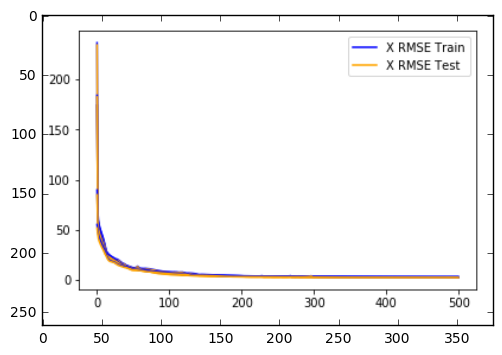

In [58]:
import matplotlib.image as mpimg
# from PIL import Image
img=mpimg.imread('XRMSE_lstm_500epochs.png')
img_plot= plt.imshow(img)

As seen in the plot above, the XRMSE for both train and test sets decreases continuously over 500 epochs. However, it remains somewhat constant after 300 epochs. Let's observe the plot for YRMSE below.

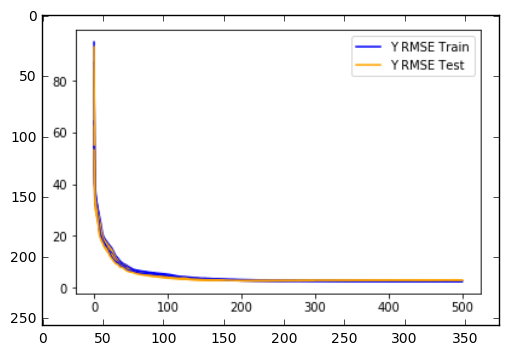

In [59]:
img=mpimg.imread('YRMSE_lstm_500epochs.png')
img_plot2= plt.imshow(img)

The plot above shows that the YRMSE for train set continuously decreases over the 500 epochs but the test set shows slight increase after around 250 epochs. Let's see the mean values of all the 5 repeats over different number of epochs below.

In [72]:
import pandas as pd
def scores(e):
    RMSE_Scores=[]
    Xtest_RMSE_1= [173.2152388725833, 59.59425798577952, 49.575313662788325, 45.96055055506539, 43.29676723975673, 40.83372992744525, 38.383403901584494, 35.877669133898245, 33.284422279935, 30.315106619751234, 28.089565266244062, 26.069762679184887, 25.0194542305909, 24.195356788872363, 23.501034457918994, 22.889061801807507, 22.24535884059107, 21.516436270814076, 20.876721727146233, 20.287834766565183, 19.65481454950199, 19.039474750213493, 18.463465997807255, 17.929548716111064, 17.441971005453606, 16.997212576590215, 16.613151367187122, 16.244682168923436, 15.88623508314777, 15.53280849635693, 15.199204556692587, 14.894680323107256, 14.62384654366015, 14.39195440321541, 14.231236533999297, 14.229262670275666, 14.268306008821982, 14.302216969649528, 14.009300861773808, 13.763294431990778, 13.59422624877099, 13.447854908531454, 13.116870351889373, 12.742030133214646, 12.405779439949857, 12.005672707002008, 11.70589744666457, 11.573680275278182, 11.479115189219309, 11.414108768971417, 11.326529745579249, 11.221556997044376, 11.151603418569747, 11.157986856448005, 11.100396772001076, 11.040587869730757, 10.983050962663498, 10.92675596518144, 10.855819677759406, 10.785694001244003, 10.718030397620526, 10.6744505619415, 10.646433234212266, 10.630707559755809, 10.6286563431081, 10.691214469529932, 10.70359060522901, 10.738357195009185, 10.69463012837697, 10.709950813869193, 10.710714342442499, 10.588672933419511, 10.53909287986924, 10.37798446935335, 10.194257534395069, 10.012132698160409, 9.889649587265769, 9.842033904442651, 9.67149604299473, 9.518970234595688, 9.331793580265842, 9.28034553024559, 9.135928853190423, 8.981059664393264, 8.767408313987637, 8.622783888132124, 8.535710388469539, 8.417645555292745, 8.27916636482506, 8.176832931042089, 8.07577162848157, 7.995317975137482, 7.86678675276259, 7.795386518371597, 7.7767767422390195, 7.687273086163251, 7.614301484460872, 7.556035784772984, 7.483617008300548, 7.362246387870135, 7.347413842814492, 7.264503136731539, 7.23101605928181, 7.2620743028520796, 7.215855498975617, 7.199979899521281, 7.3173181927469315, 7.287931004294435, 7.319630261018604, 7.263245760640625, 7.200711404607186, 7.0714697303826055, 6.846311456081608, 6.563039789849122, 6.1417448911911405, 5.560201701511471, 5.142983435410603, 4.850941657842957, 4.771232133878946, 4.701141753830225, 4.668561118271515, 4.640528671803652, 4.590317642616238, 4.5615161444951875, 4.539196790128157, 4.515403112636251, 4.488251618720097, 4.460394305597025, 4.427265328149612, 4.3995372374580395, 4.3677483385791405, 4.3377108486132, 4.311186335009725, 4.278845449957892, 4.242659342616077, 4.206687706280342, 4.175363577418308, 4.141878483376819, 4.113593931900806, 4.086026262112739, 4.058296942013005, 4.037064901354552, 4.016215761709096, 4.0009938906810145, 3.9881978272518332, 3.974394729979949, 3.94893886998161, 3.920076061983964, 3.89221399146152, 3.8634857918585515, 3.83953012851539, 3.815525222890347, 3.7967738698021813, 3.77658138974492, 3.7641986821592237, 3.74729169936949, 3.735333222577859, 3.7318490558390645, 3.7037848899609016, 3.725300971308863, 3.7470570490673865, 3.735833970718143, 3.729558851580172, 3.7353935202183193, 3.7118207560287337, 3.708752388255184, 3.7293717319540245, 3.7146768812038755, 3.7556181525350887, 3.718101174891942, 3.775884656953281, 3.6893017280938336, 3.652484866150017, 3.676203311345089, 3.7450200246551506, 3.654900665895108, 3.668359568403543, 3.6164817696107785, 3.6807266497212554, 3.6026859109377156, 3.594138366943016, 3.5677285412667175, 3.6021352690248025, 3.5653444950886817, 3.498716929950966, 3.50072886683559, 3.5708170560100174, 3.5318356274130895, 3.47293666078686, 3.4146735401840425, 3.488476495273399, 3.4948231318759024, 3.426212775769181, 3.40806369467743, 3.3962842830831557, 3.3936054645607197, 3.3915749885660276, 3.3532525880616886, 3.3344997348005383, 3.339171144478498, 3.3952565446629333, 3.337692269888551, 3.259241338174742, 3.250722195155532, 3.227026360511858, 3.2138160772284707, 3.2299950228998746, 3.2430322565920755, 3.2162949756491517, 3.1999853173815445, 3.167535944184822, 3.18150058532175, 3.1496157933274755, 3.1384351279089198, 3.1541963428330844, 3.148590105787024, 3.1321269910099474, 3.141231052391196, 3.12748444844, 3.123443001681536, 3.1384748477856252, 3.1475644038470563, 3.1221669191615073, 3.155900481873317, 3.1732964063418048, 3.1532665330298815, 3.128298922079655, 3.058656360108465, 3.0445782356447144, 3.0264877742148344, 2.982199668334869, 2.97651269976628, 3.028685820615267, 2.977153604040183, 2.984506611546194, 3.0006703049123344, 3.0311905432430795, 3.0531306564011302, 3.1406417284539856, 3.1709790068926362, 3.16915056854577, 3.0286991523772984, 2.9098920611584815, 2.9038543273847917, 2.8655419341544124, 2.882269625933028, 2.9017346123317234, 2.870088986426643, 2.8831252191889094, 2.8961288850927382, 2.925191850577268, 2.9550912015100383, 3.0481525684006003, 3.1113423450337496, 3.188134202083212, 2.992179776319307, 2.877764136483092, 2.832121421597266, 2.8489907632066265, 2.8667384870409394, 2.8411605278221557, 2.8307788172159185, 2.840430806544027, 2.8474914310914308, 2.8868749545377113, 2.8844502671972365, 2.940907624089499, 2.911970867440828, 2.904854184081768, 2.8775331666190556, 2.804015588275676, 2.842694881360711, 2.8255288047622065, 2.8220137934589715, 2.789588420582924, 2.8002200747828963, 2.8108924770530885, 2.8271958113011384, 2.7872127403161984, 2.85476912847109, 2.8419423951930076, 2.8569179053144147, 2.7650633345207885, 2.7619167574708476, 2.778577731716111, 2.767138664772331, 2.7607977361088243, 2.785853963187531, 2.7888575712341215, 2.759408802142464, 2.7204097042454203, 2.7328418633319056, 2.7442717517465676, 2.764959927030216, 2.769656808781876, 2.726459628028872, 2.748839409231427, 2.748432430710133, 2.7539130527178326, 2.77711244782047, 2.810902541241743, 2.7333930996944313, 2.7642919011539187, 2.8103457068343385, 2.782400999657139, 2.735527728569123, 2.6966480009466633, 2.6904958766997673, 2.7479022844061523, 2.7192433275027366, 2.709278284109536, 2.6816762687902957, 2.67972724654098, 2.6974419876807767, 2.698384883795493, 2.690264205361106, 2.679133823270438, 2.6605886117053816, 2.7007189434328787, 2.7480481417977427, 2.7413287391724697, 2.702784488232394, 2.657644718671726, 2.68263616632182, 2.687035625758776, 2.6449573800369715, 2.6563873180136666, 2.6567739332707614, 2.6726777724223454, 2.6924060016803004, 2.682234586474309, 2.6777544468158387, 2.67605920160169, 2.685007035953677, 2.6526707380235073, 2.6579233562224562, 2.633188807522974, 2.643494607032914, 2.646583915873316, 2.6589431612154315, 2.6370202938034124, 2.628956526245256, 2.663469368547609, 2.628053397272362, 2.650796258149986, 2.620976420367387, 2.635465766651929, 2.6439637500906255, 2.6502019602302234, 2.631950721240913, 2.6480606614496978, 2.615836089505461, 2.638374748672592, 2.610740759588126, 2.6252866574301703, 2.6091191178512507, 2.6354534540492724, 2.6139544400384827, 2.6304212761646526, 2.602974883268872, 2.603033094832185, 2.6041482473619397, 2.6139722860039356, 2.6179655906074064, 2.631302056283552, 2.615713423221978, 2.6152314150156455, 2.593985032696546, 2.598242431197169, 2.591610368639082, 2.6171465944170196, 2.597934204437424, 2.603052389791723, 2.5918918918524247, 2.5957027642296464, 2.6007910758749557, 2.598117767862703, 2.604612573066933, 2.597848701077379, 2.5845962105382085, 2.579772392906581, 2.574066801616483, 2.573993229231543, 2.5763602644462624, 2.58198212681242, 2.572816897326794, 2.578118959422822, 2.5731024565150826, 2.5765325848498195, 2.5751616709266654, 2.5746492373650667, 2.5715034052596337, 2.575954058993626, 2.5734033970656327, 2.5720195968296418, 2.5681990846660265, 2.571019875349029, 2.572250022598914, 2.572758087307267, 2.566249938917182, 2.572008971267588, 2.567824635221512, 2.5724768322151434, 2.5674672959712708, 2.5692759184468152, 2.5673685727198006, 2.56682515300033, 2.565470420484521, 2.5661397611216055, 2.562601340372311, 2.56550986573293, 2.5638635913411383, 2.5615850909764193, 2.5615714493039072, 2.5612316605394008, 2.560757053748032, 2.5584723907186975, 2.554717915332776, 2.557714139936205, 2.558343304933362, 2.559342391707267, 2.5587887516676218, 2.5615606952761154, 2.5578339221080606, 2.556575738431254, 2.5594588006504964, 2.5542053119243535, 2.558290613969975, 2.555355784508676, 2.555250162971859, 2.5566026453963357, 2.559368244142726, 2.554000302104394, 2.5518655139164386, 2.5538399834530936, 2.5486419802318276, 2.551986196181823, 2.5517053833512917, 2.5497065135578874, 2.549992656877103, 2.5531454199855923, 2.5467368186519006, 2.5509091491936373, 2.5503399548469368, 2.550265797046096, 2.5509244821556107, 2.5540080546491257, 2.5476022987755007, 2.547701731241941, 2.5483377198008137, 2.5478909912279812, 2.545920310269221, 2.548177453341713, 2.5477672302423118, 2.552022282371088, 2.5474879598181763, 2.5502839705079094, 2.5464445311315336, 2.5464115045278097, 2.545635396202798, 2.544388606591845, 2.5445172932790197, 2.5494843049267844, 2.540352797595832, 2.5442404776345695, 2.540220147170157, 2.5506888826575924, 2.5539278224314748, 2.5379975592838515, 2.548405290584245, 2.551971725167386, 2.5624900677199705, 2.5464120365184444, 2.5477903326084936, 2.567264520467066, 2.5451451920387123, 2.5624110132874027, 2.5486654760428893, 2.542991227594989, 2.5499465383260476, 2.542508365642856, 2.5431542537380487, 2.53573185755919, 2.5447367675307757, 2.550527667818501, 2.5393990696626365, 2.5516008020221053, 2.555065631694255, 2.541910693691469, 2.5431417243244265, 2.5495133771611243, 2.5479023555212263, 2.5384528374664734, 2.554376308354556, 2.559861719319096, 2.5285008784351253, 2.5599796511412425, 2.5476513977065327, 2.547233837439202, 2.540146596237043]
    Xtest_RMSE_2= [234.06828065126112, 63.637046091252785, 53.619901061477876, 49.755188825253136, 47.185382200287236, 44.94385843653672, 42.77748630698507, 40.57783568217188, 38.27474729141301, 35.80974002289466, 33.1494067064275, 30.38351545857688, 27.94726236849506, 26.340261595237855, 25.144734195144807, 24.137222185706438, 23.351747006486224, 22.702379428170055, 22.16117184578663, 21.653436369073873, 21.13832014345248, 20.650681202133953, 20.290821023088025, 20.090875013882588, 19.994454620076727, 19.937702210811103, 19.862711519492226, 19.718521157102654, 19.473285351224003, 19.09992733805024, 18.617495868697688, 18.07017228756425, 17.511406528042425, 16.971638893661705, 16.458966940902776, 15.952134691955955, 15.460922007228259, 14.992097303580797, 14.565718774230609, 14.194811950916051, 13.847854438510955, 13.515863990334418, 13.219673501595512, 13.008342801399875, 12.895151046627369, 12.762071866673931, 12.475385211608259, 12.027429506590872, 11.601553791626381, 11.36711210670882, 11.236509476248012, 11.177731683196342, 11.194300687312875, 11.78566403358459, 11.921579911729994, 12.372526217916754, 13.256728887906725, 12.58283871367195, 11.36910023044169, 10.304344213414277, 9.424217336640998, 9.206251773697376, 9.390132340479346, 9.693459205272733, 9.86666575611599, 10.034995845620541, 9.827791968064579, 9.529235274610981, 9.370310188251986, 9.182157823977118, 8.998104494799724, 8.844055133993864, 8.64089433358261, 8.492840515224733, 8.348668347754522, 8.254075456470753, 8.267471212758633, 8.099997067197314, 7.8936149298412905, 7.848794661944118, 7.796879630873063, 7.635389812381524, 7.5529522592175145, 7.537299483126049, 7.525641169872411, 7.4988663270706075, 7.476488124101545, 7.438576667457745, 7.389349830611946, 7.302326673414976, 7.218478371928427, 7.159017978911754, 7.105069736655588, 7.007350091234312, 6.909032097748921, 6.846365503773661, 6.792764938901665, 6.727075349507779, 6.675646236956441, 6.610715070521025, 6.544144219544668, 6.539327056690596, 6.4879125760960745, 6.418257176342905, 6.4272526252316915, 6.386731534832379, 6.377109077911067, 6.359482353514643, 6.360334909610897, 6.398809658716262, 6.376917487378926, 6.374586315305084, 6.373607430716254, 6.347590297997703, 6.241774604305516, 6.251858794535807, 6.285513709437527, 6.234117361602524, 6.220469376406642, 6.215700205228488, 6.124974725401404, 6.125774990034317, 6.14924598142803, 6.174138599182002, 6.102068380874346, 6.140837699849655, 6.162523413542095, 6.1550969690449975, 6.080870412923312, 6.093484765875894, 6.075392114547902, 5.971189031990256, 5.920368472375564, 5.843840472511494, 5.73048951979458, 5.635510004543197, 5.446793776169276, 5.195124753738795, 4.893939852102501, 4.605516337062914, 4.43003350968437, 4.319868955235893, 4.297519628283765, 4.287542651756559, 4.33532525957926, 4.3663918531314545, 4.3716762477580025, 4.31997581579643, 4.278656788863452, 4.22647410867292, 4.204851379292475, 4.156670380786459, 4.132138892687119, 4.100536265704929, 4.078197178610979, 4.044504025467632, 4.010811620281291, 3.9775043666693133, 3.9556077743938576, 3.9364273736879576, 3.915631387556734, 3.8934475455062074, 3.877433535248224, 3.8520240799655965, 3.8369028934234537, 3.824545716200543, 3.8040002589840123, 3.788498460335006, 3.768514529263786, 3.7486394335748368, 3.728415513249616, 3.7163871895638354, 3.7122001632500714, 3.7021701797289692, 3.6973786220912577, 3.69425013816681, 3.6937362088246073, 3.691734713687432, 3.694082248698262, 3.703867956477315, 3.7005031745829493, 3.704770871613495, 3.708234566963525, 3.703716483267005, 3.709032333683138, 3.7167356474756783, 3.721739621537598, 3.7179925519184995, 3.7125376622455675, 3.701220624147931, 3.68914772975811, 3.669819001665614, 3.656376186782977, 3.631097126448314, 3.609734046081111, 3.592200301416251, 3.5738300354296317, 3.551644787899256, 3.5371584656802306, 3.510434705743687, 3.483451991697632, 3.4582760950188423, 3.4410282514544157, 3.4283697861645797, 3.415664369568782, 3.4035885621535753, 3.4019841775539903, 3.3951095891241283, 3.391694993903515, 3.378535893029072, 3.36016220281586, 3.345860152860969, 3.3388297395989324, 3.3231913787678997, 3.3202972147000813, 3.3033281784113924, 3.2946428021924468, 3.2850809785616533, 3.2803159192869433, 3.270123405957113, 3.2665720885487532, 3.2569460922774214, 3.2551454928175354, 3.247077395273775, 3.238504186236974, 3.233993986104353, 3.225289472510489, 3.221226842504003, 3.2133253902352075, 3.204097136193108, 3.196933628049468, 3.19566224059389, 3.1850836174828765, 3.178596232465184, 3.1785166793727915, 3.1722595242650757, 3.1626682194252016, 3.1624639366233067, 3.15927079750502, 3.158765238965217, 3.1582925483010653, 3.1483958926465756, 3.1491918556043608, 3.140145050356373, 3.141720650941698, 3.1452362300013768, 3.143176826896188, 3.12764763038876, 3.120336931874704, 3.121966659008419, 3.1319082163744665, 3.128257137180184, 3.1397192426608918, 3.138971003519657, 3.1384174036527037, 3.1387417351223577, 3.137813423820236, 3.141092042345819, 3.1440516013113684, 3.1504014813846726, 3.1499914511677365, 3.1561079943537313, 3.1573415668331735, 3.1692707831500098, 3.170890726216357, 3.1704108357489766, 3.179647346255771, 3.187050199585492, 3.19771307680899, 3.2008316157561105, 3.2118790656293745, 3.2268015924200295, 3.2404818300195095, 3.262236316320892, 3.296593102139593, 3.3397063555193567, 3.3888736502629215, 3.4753275562910986, 3.5642189899540324, 3.507081721530429, 2.9695103638144524, 2.8093365275395272, 2.82106913255448, 2.8857687773326313, 2.9420461895548393, 2.955131045371244, 2.9511024646763797, 2.9279166558434566, 2.90846224617755, 2.8892652213435412, 2.8892743462639086, 2.8976547713653553, 2.889935442513654, 2.9137999115902686, 2.923911325092942, 2.908282680196977, 2.8805408200108302, 2.8690745302976306, 2.8709819425694123, 2.869077363234358, 2.8684422948724726, 2.8702886892373995, 2.88580727044247, 2.870891171449098, 2.8584835023897806, 2.843089092233275, 2.841345573082696, 2.837597575614572, 2.8476797241825893, 2.848926554313678, 2.8385257438298983, 2.8255328654469043, 2.825040868563873, 2.820143454428774, 2.8159704908288044, 2.8113947952733387, 2.811497965936688, 2.8092387413315563, 2.804987632624108, 2.816037437432378, 2.795856781455071, 2.7833638281699713, 2.791517589218414, 2.7795076117706046, 2.7645476383125267, 2.7715125509765617, 2.7842895187227694, 2.768820096120959, 2.763124848694363, 2.757706541886236, 2.760546177327724, 2.7570798928670617, 2.7488989676326656, 2.748709425968413, 2.7460563908657343, 2.743023623030138, 2.737818028210395, 2.7447168772928285, 2.732583803436289, 2.7211737662941684, 2.724938603106019, 2.728386643806501, 2.730928041732946, 2.7242503783386747, 2.7111018053748337, 2.7060045051343957, 2.707756001445519, 2.7051937603170475, 2.7039414607209213, 2.6994710046131685, 2.6928781752081785, 2.6874793664453787, 2.685453127820997, 2.6833222880303804, 2.681925034617868, 2.677285957005036, 2.6825536979363522, 2.6734071535858503, 2.661315621298482, 2.659468320838984, 2.6498363215013296, 2.6723921981337653, 2.6581907214207527, 2.646832560212176, 2.650729201913332, 2.6430995307737337, 2.644566385127033, 2.646074419947414, 2.6425127809055042, 2.641446630119421, 2.6298869725000804, 2.6275444230991174, 2.6301723609509047, 2.636654567397152, 2.6242769200833935, 2.623052075817746, 2.6267780905909976, 2.618961488799166, 2.6163120261768014, 2.62038968712302, 2.619057530838034, 2.6180353021771814, 2.6192601842396286, 2.6111042688332575, 2.6143369291485805, 2.6206642527110313, 2.6099184192261142, 2.6109217746996265, 2.6154068640715376, 2.611593689360026, 2.6092032628068575, 2.6127208332510508, 2.611877382212325, 2.6069635867888663, 2.6003707010075314, 2.6077025582147533, 2.6083411662451996, 2.600107147735447, 2.6107731160368437, 2.6051731011216055, 2.6034856081740454, 2.5989208396002184, 2.597439153775394, 2.6028649041535448, 2.6000161303753133, 2.598069464978068, 2.597878547749777, 2.591772201062726, 2.5907744438151976, 2.591263310162216, 2.591328546017411, 2.5894867967749957, 2.589543003633926, 2.587335395389277, 2.588172997095042, 2.588947852038296, 2.5884148077976548, 2.5869091698978903, 2.5876452688726124, 2.591935668822343, 2.5900445722539396, 2.589164434817588, 2.5879961652595536, 2.5877145237495824, 2.5872695908677086, 2.592621168559158, 2.587839559867055, 2.5873440569835786, 2.587398160041589, 2.5878841882641352, 2.5875604973292607, 2.5898767353212873, 2.5884345470252685, 2.5874452526087355, 2.588884523369243, 2.587836110889709, 2.587930732815509, 2.5873338795215006, 2.588459868732792, 2.586765210247128, 2.587887605997402, 2.5869610260509592, 2.5879579840756444, 2.59201467567123, 2.5900710559116096, 2.5907523802299033, 2.5894471741758625, 2.589783770409693, 2.5906760503311257, 2.5913495665847583, 2.592522029351613, 2.60071577819326, 2.590693770068963, 2.5890627538293174, 2.5912650811707247, 2.59110631094824, 2.592572450270912, 2.59113356246116, 2.591749544305324, 2.592532880515443, 2.5919254181259697, 2.5932858096177753, 2.5929489898172795, 2.5931526121155963, 2.5918818430971755, 2.5949309084790326, 2.5942399974429002, 2.591636097264592, 2.5922801504076314, 2.594857979378538, 2.595676483012958, 2.595871189773952, 2.595199690823896, 2.597662759602306, 2.598150378526467, 2.594483743875812, 2.596418072552531, 2.593791271936, 2.594671074903866, 2.5976415747692476, 2.5950486793026997, 2.6032138925092667, 2.6020077687027823, 2.6007749855687368, 2.598447085673621, 2.5983629909258465, 2.598284338841518, 2.6000933354682614, 2.5986994389250064, 2.6027520036876397, 2.6061462164212514, 2.606603732408505, 2.6062010455564133, 2.601583471565848, 2.5985711688412945, 2.5986563174695267, 2.59944306867398, 2.600799474743154, 2.6048019618539335, 2.612469474690401]
    Xtest_RMSE_3= [182.31453922142262, 57.14995780614353, 51.102756717321846, 48.32387498002467, 46.22219495353921, 44.4086165008241, 42.71727172092228, 41.03042621566155, 39.23894839122847, 37.239790620036565, 34.85256442627678, 31.901975550150425, 28.916759070068775, 26.3409104414365, 25.249487254942167, 24.616888480239776, 24.03558220495361, 23.487366743287073, 22.957921765280027, 22.44940633771695, 21.99325933642209, 21.612624342455387, 21.2817274814939, 20.863914004437714, 20.18828734839632, 19.3875389785839, 18.636605341144257, 17.87023728858255, 17.30595884915269, 16.619702074148794, 16.116598309676256, 16.135019774156056, 16.200041662110138, 15.812370661918818, 14.626708344601097, 13.75234836412528, 13.964377531246281, 15.387796019954054, 15.410713503512337, 14.26279709632915, 12.788743646651834, 12.497441420430563, 12.161573850659439, 11.798513938316141, 11.325736373139199, 10.794326077739054, 10.383860913694178, 10.125096014554021, 9.946570674131594, 9.806498032120473, 9.692836008955144, 9.612445384970995, 9.54340780622775, 9.505153108755284, 9.493678498269013, 9.460597897141088, 9.432780698121153, 9.428496848115612, 9.422958909255932, 9.39691278137402, 9.344870585529156, 9.239417442490884, 9.026915324227534, 8.900298257579816, 8.759569377805253, 8.624179648239577, 8.53295231502241, 8.468893636739939, 8.405197469580084, 8.370602591704817, 8.371689864140754, 8.3059573631485, 8.24040181044577, 8.167032614985185, 8.122631625213751, 8.037835668768107, 7.9357381417851505, 7.795154666377311, 7.683367844857578, 7.55447601865146, 7.467632061115987, 7.364684456979617, 7.301316574610142, 7.238767272381611, 7.147828426584243, 7.1018593111828725, 7.035984115231568, 7.021524465744424, 6.95833787526249, 6.934441196978889, 6.884886135995403, 6.857335546932449, 6.81812832592011, 6.802100161779805, 6.775311379702151, 6.774459124166248, 6.757988309776952, 6.764039442023492, 6.745649717974222, 6.725349612758533, 6.715422962936033, 6.7079712867850985, 6.709676826416471, 6.710765026673742, 6.726006107878247, 6.731154196599231, 6.76013049991515, 6.778007065820988, 6.821391702446729, 6.844581994799633, 6.915970342121343, 6.9657873013268725, 6.970900230199297, 7.029621283238, 7.075487445902044, 7.1286868796699325, 7.140324430239487, 7.114980903600032, 7.0319214670394, 6.898090256928601, 6.687575770032712, 6.381104765722452, 5.992603920057704, 5.557698453436356, 5.157203717344246, 4.865971538364152, 4.692283273352837, 4.617062985340224, 4.582679309272373, 4.607430650596175, 4.739681237519975, 4.888707409160013, 5.063157788209738, 5.123700876696983, 5.047368844992341, 4.863195659498009, 4.775293399637638, 4.798645552513945, 4.818160142636889, 4.7252804484208175, 4.60467799069085, 4.605191537398096, 4.679545360121104, 4.779992949661701, 4.819906891849723, 4.806192889509266, 4.775476840885916, 4.726486466892467, 4.688794059877459, 4.682312601765893, 4.669590820831182, 4.631160014022585, 4.597329498714317, 4.549658136350027, 4.5031906177427246, 4.469386850128606, 4.458026987730054, 4.428206489273879, 4.393995593302801, 4.350894967571873, 4.316145163327764, 4.266072024599765, 4.232380466778478, 4.211106182885635, 4.191415802659506, 4.168374001981797, 4.144706862466611, 4.1010573243745725, 4.069039168991079, 4.041564261529916, 4.020506645577449, 4.006557830290076, 3.9837477859659467, 3.970175276758593, 3.952341556492416, 3.9296659300969714, 3.912214568846099, 3.8794564377517418, 3.860943668219985, 3.825105001119635, 3.7979631183976674, 3.7698261584533395, 3.764932305111458, 3.710853098048972, 3.690856198044587, 3.660283505480319, 3.6381730247937814, 3.613474865872495, 3.5937410968373587, 3.571414480556828, 3.5651018021950325, 3.558683088317094, 3.550520877963614, 3.5579146336099545, 3.584202956948978, 3.57621492951245, 3.5945327687831337, 3.590910208326839, 3.5668253818914883, 3.512028468845878, 3.436362600092988, 3.375032372893515, 3.313632402214614, 3.280285210615353, 3.2404865474195264, 3.2006006715961894, 3.163852173329255, 3.1393731971818375, 3.114029655089202, 3.0948787070552153, 3.089416699740348, 3.0731521519700453, 3.06209876643475, 3.0680504147128924, 3.0784583234450165, 3.0789482171286306, 3.0804845684120896, 3.100556655530277, 3.125452164884234, 3.1329854976405604, 3.15873506370167, 3.1706849858836503, 3.203869783793557, 3.2484699401385644, 3.2755492681793763, 3.3570284990709043, 3.4701998399384686, 3.6033184974466566, 3.717794372513253, 3.4926577281003173, 2.905205261360986, 2.862790474793969, 2.9297861166090398, 2.9701786800964993, 2.928384001129862, 2.8792868127254794, 2.8751869521663886, 2.8706618442372736, 2.849321198937355, 2.8377535213435845, 2.8275378129977273, 2.828268735659964, 2.8217716333585043, 2.823729031921763, 2.8213502252578886, 2.8297956330310394, 2.8347875910061466, 2.845864626413878, 2.8626170949797634, 2.8547877561782284, 2.8665162723103523, 2.873669327325979, 2.8809930511389865, 2.885795065259649, 2.874234824215923, 2.88231124160878, 2.8804865516485383, 2.8858052052009144, 2.8938050669707946, 2.9133020560573337, 2.9422880861107403, 2.966330924071611, 3.0184027035429617, 3.083521825952394, 3.1555045658060954, 3.2824736817399387, 3.4969237757020144, 3.8666762652859066, 3.2198422093026213, 2.6860083190650386, 2.681172962908213, 2.7294948962923087, 2.7491461079578743, 2.7597349613972626, 2.7525232841357266, 2.7727846521659583, 2.8083593962161797, 2.845275239142894, 2.8834404046030455, 2.8450178330047775, 2.751852487728266, 2.70911551254555, 2.7254426862754046, 2.7428801127060662, 2.7429199785979184, 2.7370146712124277, 2.7523869522599638, 2.7656733998940246, 2.770307659255663, 2.761598356099446, 2.7494480354756474, 2.7346975994727023, 2.717884460700134, 2.7206405009963124, 2.7249084458231074, 2.7122280567438586, 2.716600697623421, 2.719734067633442, 2.7191975560276296, 2.7208508217800302, 2.710907005490728, 2.7079609911012947, 2.7017613984004414, 2.7013201510826725, 2.6991003473888058, 2.7005833542954, 2.6999143820948235, 2.7006302544164287, 2.6952755914336506, 2.6913783856697573, 2.69306162803391, 2.69613404190279, 2.685881192651323, 2.685181259882449, 2.6911624220160992, 2.6844955496651504, 2.6792518674718697, 2.6831012989348153, 2.6860094564680685, 2.675381000530653, 2.671948900670925, 2.679340982993126, 2.6768556193457957, 2.671665607025588, 2.666379499760836, 2.6718375003630186, 2.674958763631189, 2.66303143431545, 2.6684800104586, 2.6652369564866967, 2.665701813547232, 2.665588215722614, 2.6656710507394115, 2.657615754418868, 2.663693473266331, 2.662706264591101, 2.661349676556352, 2.655023331183038, 2.6591864306839694, 2.655197653081641, 2.6564072804879424, 2.6530591061868307, 2.6528559291419285, 2.650753711792951, 2.654743890743163, 2.6514737600017715, 2.654231419971529, 2.645447843785434, 2.650851825830471, 2.650814829523694, 2.6514419120039814, 2.6487043325787734, 2.6499068874104603, 2.6482704853525996, 2.6512411927008457, 2.6464023504643612, 2.6460280180611075, 2.651025409943681, 2.650423816263082, 2.643143450540785, 2.651050282335186, 2.65154232451812, 2.6440565637952615, 2.648643899012535, 2.6477272492551167, 2.6483529230240452, 2.6482767117328425, 2.64896522922263, 2.6501388867234716, 2.6529827509909065, 2.6439610723098084, 2.6489724696721755, 2.6496030150619916, 2.6484969872971442, 2.651635820717421, 2.6492841095455164, 2.6482345095609756, 2.6449915399737423, 2.6537948730408467, 2.6498693297497966, 2.6511111355791495, 2.6475300274268028, 2.6486146997392357, 2.6480308362694087, 2.648590034368701, 2.6517149764290213, 2.6585026888775527, 2.647330491647751, 2.6519036634933393, 2.6550294960570042, 2.666149303290747, 2.6587021268786457, 2.6551790396593327, 2.665098256766708, 2.6594890277095846, 2.671391860797921, 2.6684931419555915, 2.670314713105425, 2.6825745863518926, 2.681864234781782, 2.6806790200373714, 2.6821363844392585, 2.681535165805667, 2.670763613088427, 2.659722870705996, 2.659804123573569, 2.6512729968874953, 2.649921944677572, 2.647675296544743, 2.6380861616258895, 2.646284658470864, 2.6351802631362298, 2.632828356450878, 2.6421581120792896, 2.6310861167094948, 2.638554755253081, 2.6317391454280545, 2.63510359479971, 2.62488926938718, 2.627032268902506, 2.6201080539934853, 2.625861907999524, 2.621840463865657, 2.6212755953262983, 2.61340314353269, 2.6212418790771226, 2.6142908601969137, 2.604679334723433, 2.6069723003686236, 2.6007778379587436, 2.6002640586105166, 2.6020328918541535, 2.599014251282049, 2.5972525621274984, 2.5955026627458944, 2.5928561421492455, 2.594794818418594, 2.589944104024069, 2.5890900745543304, 2.5866030229093693, 2.585997666009231, 2.582642174181882, 2.5807112154874243, 2.5812982987880466, 2.579069704956081, 2.5778398373857274, 2.577641607868117, 2.5787620207365594, 2.575303813006008, 2.5734869388093955, 2.574916807612378, 2.5725122915547645, 2.5719826767507383, 2.571217609832729, 2.5713322141552406, 2.569791944604019, 2.5713089122170425, 2.5664966701410106, 2.565645061836095, 2.56458151081808, 2.562994143644768, 2.563192268609702, 2.5640327280312096, 2.5632016704470195, 2.561097726504967, 2.5677526047914796, 2.5603534723702306, 2.5608609343956035, 2.5638140576700343, 2.559018917722482, 2.561806130438115, 2.558433445922483, 2.5549617622850658, 2.557215592731951, 2.552847180009909, 2.554128163953108, 2.5520135567829736, 2.548854389863512, 2.5492708720573187, 2.5496245361270353, 2.5450630138740613, 2.546384434683225, 2.5458272179825365, 2.540820151193838, 2.543309426554654, 2.544439267985932, 2.5435671523701044, 2.542766610723449, 2.5422081831307164, 2.5414712548933336, 2.536206645397804, 2.5388615835396005, 2.5369367241130765, 2.5378520510026803, 2.5371329657136625, 2.539805908401557, 2.5411485348244582, 2.5388786045177336, 2.541393139889616, 2.5382692146730736]
    Xtest_RMSE_4= [84.78069436986652, 56.46438893742431, 50.146718803409506, 47.09631598314775, 44.84190059239588, 42.80171407315032, 40.74510422894366, 38.488968594497315, 35.8829767194572, 33.114823527262224, 30.595655834464733, 28.483308785967726, 26.704906044072683, 25.351177831563586, 24.358391777417218, 23.640236752688782, 23.07790001164353, 22.59098713054604, 22.128470201402337, 21.680269015385893, 21.234735725485553, 20.803392883875713, 20.431394612299897, 20.067219585624564, 19.623869992901998, 19.17335587998006, 18.79149377054496, 18.362279067448036, 17.818311848467676, 17.23796939748502, 16.61162057758319, 16.046882608344024, 15.563162094290874, 15.109577630148593, 14.704135553687394, 14.335608916617181, 13.963138845692772, 13.554391565734644, 13.155327277881653, 12.806307711095311, 12.51050403535908, 12.288833208683007, 12.070641312589974, 11.820234007216474, 11.541814189664413, 11.315356080187176, 11.167256541394188, 11.102630278766146, 11.087493672270968, 11.059405023484564, 10.984989662248164, 10.948560438147402, 10.97949262995094, 10.949007774620476, 10.853480917280045, 10.824746719384647, 10.791802069450991, 10.779560999459822, 10.717936988931712, 10.6539214319331, 10.506208621375219, 10.251586582229939, 9.942065718478784, 9.615980301158253, 9.284549061874808, 9.036259570968785, 8.858388631982063, 8.760701110139328, 8.7198411715192, 8.661415902190013, 8.592788568943115, 8.4812041615924, 8.320629695279269, 8.117373570371537, 7.916712163135034, 7.687550461781636, 7.538649002531001, 7.382994521074496, 7.236917716405677, 7.08732843412203, 6.9532816391384795, 6.800936019399974, 6.644203767174396, 6.502923045550669, 6.379057748161871, 6.264315345192712, 6.169017542376492, 6.087282099717371, 6.019165557237179, 5.98011528489952, 5.941427052629799, 5.912549007586831, 5.883844758820122, 5.851735683244081, 5.8234297359465526, 5.779272667549498, 5.717558752623398, 5.6248499640906235, 5.511877679704048, 5.393448943335698, 5.29161697254514, 5.212657882296115, 5.1510098741683095, 5.102344488157792, 5.057077213152988, 5.013270123417188, 4.970895838050837, 4.936865870637491, 4.907789230971633, 4.879836262861569, 4.846099895668888, 4.810311209316366, 4.772650236033875, 4.73987017290005, 4.716821287605631, 4.701361486128301, 4.68591565370885, 4.667186769383903, 4.6397267811517775, 4.609266112996607, 4.571420122534941, 4.5272519353837986, 4.486522881286183, 4.44601210481423, 4.411038193148836, 4.378407978038828, 4.347457848050985, 4.3198098461877565, 4.294206067654507, 4.273298970541066, 4.2563063458661485, 4.238305891395736, 4.2213924400040606, 4.213111052538303, 4.203095340047861, 4.191696510260929, 4.185310386040336, 4.19127432502163, 4.178369557731483, 4.180583064868946, 4.178966543322688, 4.166334829798496, 4.16029792305229, 4.13970825658813, 4.129623070826163, 4.100568723848409, 4.081489126971625, 4.062776408999937, 4.033877158056223, 4.017442519318764, 3.992584668893196, 3.9861638315588244, 3.9905414588674564, 3.9484951694082886, 3.9340140705776543, 3.8906573465177323, 3.8867784724171326, 3.8496169408520418, 3.834733509067286, 3.808703481834302, 3.814227945485769, 3.780798214055194, 3.765354167467449, 3.7091252476335175, 3.699543076798887, 3.664180982590529, 3.674022735556264, 3.636144736970318, 3.6358140175006564, 3.598814088116408, 3.6119065518242555, 3.6040191745266004, 3.6132886341149106, 3.5776824103261435, 3.5682577466862675, 3.5631799571606315, 3.5538017429305677, 3.5440927732946803, 3.5321708812547112, 3.507969671191408, 3.507559917221673, 3.5048084708571063, 3.501264230730313, 3.479731899029158, 3.476346839357503, 3.463550592738827, 3.4729284798750455, 3.475318897785825, 3.4743165443225443, 3.468889454385481, 3.450114646550614, 3.44985750242059, 3.4732245274747173, 3.4587874240469327, 3.4638484873346096, 3.469815481800792, 3.4646203498670762, 3.444997445975669, 3.425641772260771, 3.421706551223522, 3.3964631025015803, 3.3808488743405785, 3.3606765254102715, 3.3545933181602012, 3.3542894974144457, 3.3420601513918795, 3.342984986880129, 3.353196793301707, 3.3635897444076823, 3.3578334122006854, 3.370541404402073, 3.379937842642854, 3.381828467573564, 3.4003198102534804, 3.3966675768593793, 3.399816822887288, 3.406659843272829, 3.401757825028852, 3.3825288627058128, 3.369877178231447, 3.3291519032495818, 3.29473902025279, 3.267539364205646, 3.2674317790472767, 3.25132910526804, 3.244542507514888, 3.230675268497257, 3.2408473365381196, 3.2273005463538365, 3.2192835340990458, 3.1984931383853694, 3.1763114521634135, 3.1769701941887827, 3.139102533282092, 3.1497568086213477, 3.132652173809263, 3.176401116475996, 3.1620419710381515, 3.2009715694763172, 3.1781993341806607, 3.202842342994881, 3.2090575387284224, 3.2257247443850336, 3.196230412766438, 3.212024340371568, 3.2111164054714934, 3.236158719321775, 3.2322006329486337, 3.2302512643895103, 3.2375683632717056, 3.2181973471335312, 3.221534436370583, 3.2235823084680537, 3.2115210785495196, 3.1946910917304665, 3.183081752041871, 3.1620751943106646, 3.169014124615316, 3.1512807780112455, 3.122733649090853, 3.0874589292967793, 3.046484505112671, 3.025896071743246, 2.993402595527027, 2.956288308133913, 2.9391129278052457, 2.9408101077369433, 2.9449593708485833, 2.921573676623597, 2.9312994616753487, 2.9275371257594247, 2.9331121640294584, 2.9261456226534346, 2.923166903333607, 2.9283166383208856, 2.9151954971707066, 2.934596247166294, 2.946361335433962, 2.9364655436451255, 2.9473461461726287, 2.946155353359931, 2.948947854115349, 2.943321837415091, 2.9536750025586818, 2.9439831279743784, 2.932482559037357, 2.914887739136552, 2.905099664187456, 2.888410979683206, 2.871860175458939, 2.842918340318813, 2.8466759773756753, 2.8425034022109785, 2.827219664055285, 2.83347317781149, 2.827121835239874, 2.8167070122903106, 2.8287013945754023, 2.8394010006043113, 2.847313266080174, 2.8435655631949235, 2.8455711677732474, 2.8497090080490377, 2.856803893140991, 2.850080891012886, 2.8542991995053235, 2.8514263032975067, 2.8544219501845682, 2.8254150377970775, 2.842573007932604, 2.8397740169619046, 2.804788469948513, 2.8014226960241007, 2.791448070366447, 2.7851596769654745, 2.7906552191656577, 2.7850113651840305, 2.7764987495607363, 2.773663882830602, 2.7845743801751994, 2.7834435627718683, 2.777425926698955, 2.7789535486369497, 2.7722846563112338, 2.764143280840233, 2.7607175967774897, 2.767351831640846, 2.7674807075572514, 2.7730875973505635, 2.7632508099400925, 2.7556854957951233, 2.761956923674587, 2.750464268974755, 2.7446804233352013, 2.749480537815742, 2.7419631959199298, 2.738597312515682, 2.74254615150942, 2.7326346048956753, 2.727548992206807, 2.7336479828057874, 2.724766697235123, 2.716807081750071, 2.722226112125693, 2.7328682008235665, 2.706715233391254, 2.7368587582954573, 2.705180111377474, 2.723424605160284, 2.7028369712055262, 2.7282544250132807, 2.70305118702764, 2.728848813476557, 2.702812842779047, 2.717034230836775, 2.702854810392882, 2.6917618975432105, 2.6950908373299476, 2.6876059700400865, 2.6825748150053372, 2.6850159567070127, 2.679177298318697, 2.6710587706147537, 2.669078527766967, 2.6696641251503106, 2.6643476204049974, 2.6653309302242665, 2.661816906275113, 2.6617915718213183, 2.6610623039965056, 2.6638939548292537, 2.675700010996795, 2.6578043038537555, 2.6670138453167365, 2.651808803795933, 2.6510686490460365, 2.6449171365261783, 2.6464370173401957, 2.642397821520838, 2.646749277739196, 2.6365745540287215, 2.6429961849503454, 2.630646544142142, 2.6529938136866797, 2.6246061194007395, 2.62889891845579, 2.623692282929026, 2.6354000879012722, 2.6212100409955004, 2.6191289365499437, 2.6180782133037392, 2.6217447513502012, 2.6170789541349704, 2.6177604739089606, 2.619039175595772, 2.619853460008955, 2.6164810847706392, 2.6143245144523783, 2.6158965184610192, 2.623878432627624, 2.618258008517939, 2.60345304885242, 2.6091132806467185, 2.6096837640498483, 2.6212511020102554, 2.6196854895419777, 2.6128947741648467, 2.6083496999605824, 2.602695165488785, 2.5983825517100816, 2.6061646885012535, 2.624697332281081, 2.599955303607875, 2.6029336572957087, 2.6055463978855697, 2.6136912772762346, 2.6194786861917367, 2.5989816597441173, 2.6026602835671397, 2.618711583216315, 2.6120925694436075, 2.6039165544408736, 2.601635720470146, 2.5995705385370833, 2.5992253161437997, 2.6011582747657624, 2.6208109196242964, 2.5983535525755346, 2.6016931967897157, 2.5989416404180545, 2.5973176705561074, 2.5989476332421053, 2.60860848145951, 2.601201753587124, 2.618388657313678, 2.593927941241611, 2.596485447746942, 2.594681956518388, 2.5964501996596256, 2.596130540093756, 2.5946942270344016, 2.596176991151192, 2.5959090988146913, 2.594760274276845, 2.5961333697153575, 2.592597192880085, 2.594332419426241, 2.5886223423023917, 2.588362189209014, 2.6052086596716224, 2.594201223314437, 2.5942560574725175, 2.5922067425814186, 2.5917764227765208, 2.5933429161900694, 2.5880428412399255, 2.590605223573881, 2.595581003436981, 2.6021580930357935, 2.5866443395170444, 2.5904321388140286, 2.607826749381639, 2.5929487116303793, 2.587648649331781, 2.5888617358263586, 2.5938012999311635, 2.6086596009577687, 2.5858574558731706, 2.590412298227567, 2.598707140572306, 2.5884763251297587, 2.587658490335276, 2.5845855265477082, 2.5889245182252365, 2.5891362251284322, 2.598130414058748, 2.5869573266531978, 2.585352902016544, 2.583459038651759, 2.5893254131826704, 2.6028666435953873, 2.59807228409383, 2.600682653884628, 2.5825178564750537, 2.5876092065488825, 2.5939376170799773, 2.5817292038390454, 2.5774709335288604, 2.593140652216495, 2.6029261715952186, 2.581243837058824, 2.5803989059028107, 2.5994035446978914, 2.580465497726527, 2.5796107609911747, 2.5872110773789094, 2.586656784993935, 2.581524172122101, 2.586867949930548, 2.5789519356804522]
    Xtest_RMSE_5= [51.68336441352136, 45.649707506229255, 40.86833885028374, 38.37595419998243, 36.53365968594926, 34.87745346467167, 33.302039141896934, 31.910532057615985, 30.654483715159518, 29.400348271222487, 27.815993236563624, 26.140104400041608, 24.686034455282716, 23.12232268607408, 21.639037724163995, 20.37571529420993, 19.45032011184302, 18.8385072142854, 18.479692919232196, 18.218382060934815, 18.062730913896612, 17.981696975767786, 17.81113635076987, 17.52467934866848, 17.156474895834492, 16.709144292798978, 16.1785319980717, 15.640358592660506, 15.129251230464236, 14.700984122811093, 14.351028821103307, 14.124940671402305, 13.913532008925264, 13.5621577730749, 13.465268270754063, 13.243230126897583, 12.928513470811867, 12.758529517321774, 12.43031096357869, 12.275977387471533, 12.305073658861044, 12.237676940372472, 11.95744689838769, 11.501607664212141, 11.123244664596584, 11.145294541582572, 11.10244872873374, 10.532886246186903, 10.011438957380156, 9.88570789427927, 9.778900068438338, 9.865933785386304, 9.910647675237415, 9.880074693784177, 9.94150466953488, 9.854845034603697, 9.693973412898215, 9.537071505352145, 9.466022148934526, 9.346455294652397, 9.216226285764156, 9.086518762216556, 8.979681009042853, 8.900665844981413, 8.80575981553737, 8.705567710743857, 8.589974415906866, 8.472740635188483, 8.370400479657269, 8.284533410682583, 8.196924423762445, 8.104004539955437, 8.030206141532592, 8.095270993636468, 8.041245759794355, 7.965750690961809, 7.8932023070874004, 7.811567269778228, 7.736139159263185, 7.665204492890997, 7.589596130804984, 7.519641583064775, 7.443774872415405, 7.36345541364895, 7.2959573191744305, 7.2150351561473665, 7.134772859277213, 7.0615158082049065, 6.992802169788997, 6.9240620719652926, 6.866553795670464, 6.791741767976107, 6.714851185754366, 6.630234579118539, 6.5711434320097295, 6.483550729863101, 6.419559660723618, 6.3684539474327275, 6.312727706159961, 6.266506662414184, 6.219067242618552, 6.180364419809305, 6.139594719799444, 6.103172537531988, 6.064741623831347, 6.025391041470551, 5.976700560374424, 5.907925176503328, 5.838375244148815, 5.74228105851624, 5.651991624674175, 5.591433332439044, 5.531644223410503, 5.51539142598953, 5.5239364114455825, 5.542727858241289, 5.568218523119425, 5.585906182536988, 5.596144989890402, 5.598995223807939, 5.581836129483944, 5.5771810122180305, 5.543373518992038, 5.4912932666982455, 5.431655723745202, 5.289734225523027, 5.068216146347076, 4.781522791300195, 4.599860192271722, 4.47902038545615, 4.44420663102885, 4.493930204100899, 4.468796407527735, 4.457661116152096, 4.472175632178164, 4.4949520622595, 4.488053840778106, 4.520783551124486, 4.54676776730529, 4.53844314384507, 4.516911995749778, 4.426248238969557, 4.49787371084903, 4.445174727227965, 4.463602443024528, 4.39432098740668, 4.426753887428843, 4.362005359499101, 4.350898944112035, 4.310284682303068, 4.334668750965341, 4.333542288653994, 4.248999974216965, 4.229589886348437, 4.184398890579485, 4.184182898707952, 4.1487000545944674, 4.125591565025865, 4.126810842435014, 4.110422475752463, 4.061238572887737, 4.048379735934348, 4.028423005921512, 4.023955543256696, 4.005396604564432, 3.906578398145766, 3.8728573839827223, 3.8616861447395805, 3.8260990223557436, 3.768929501225634, 3.695079567450612, 3.671710498459183, 3.621205043618912, 3.5721197756839578, 3.603208885436605, 3.5732627562804926, 3.486725461888482, 3.444211273128753, 3.398726250563408, 3.3486930446480447, 3.3471370963938996, 3.324485220370807, 3.318989112312322, 3.3043135448995793, 3.2784710486092368, 3.2748144705575575, 3.2485619866194657, 3.226701910739001, 3.1917162103472574, 3.2198266905666943, 3.18932495499965, 3.183888610745333, 3.1553936079995566, 3.1522347689196932, 3.1328514331728328, 3.1305629770562224, 3.1276335620232496, 3.100487553056574, 3.090859432300251, 3.0774771179458287, 3.085967238461872, 3.05644514092318, 3.054958071464879, 3.033373973671351, 3.035215265600978, 3.0237220180681024, 3.0326313944473733, 3.0317310660820405, 3.013639588887176, 3.0107662768978956, 2.988868962663287, 2.987858673147182, 2.9864839118945876, 2.9813970825696323, 2.9719669315083648, 2.9620967953484136, 2.963716104446077, 2.9639434072766964, 2.94557356904303, 2.9402163974847504, 2.935888902080326, 2.943155112258989, 2.9172641745954313, 2.9299996112797246, 2.937449834702477, 2.9136332936798937, 2.921491413729979, 2.9076931049451606, 2.9073171433847573, 2.896103654957722, 2.9136311417693777, 2.905824584423436, 2.9093261034693385, 2.8837877022243528, 2.876707314846034, 2.8729173487405726, 2.878924638154182, 2.8612166985710448, 2.881888282536818, 2.878950024769101, 2.87257580132487, 2.868693422702164, 2.883620546875715, 2.887976567743558, 2.8717839870104194, 2.8200160579087354, 2.888745164252957, 2.8610477644949897, 2.8301032812788076, 2.866233242181551, 2.832658489451287, 2.8584691419785697, 2.868718989005154, 2.844364478383157, 2.8668729328441866, 2.8940000165528406, 2.812614281924703, 2.8778313649507234, 2.866376578152625, 2.8537127109567084, 2.834480293819982, 2.8897081621725933, 2.8713680045277794, 2.810896033055255, 2.8481104754633635, 2.859819357683099, 2.830914413764494, 2.7792014065019823, 2.8684434615421144, 2.8415187445909145, 2.803151101821141, 2.8495145196449645, 2.8482933253330405, 2.8628656896481295, 2.773906912315687, 2.8674123848449655, 2.845498526968717, 2.814673374939114, 2.877877762851482, 2.8991376476754986, 2.823114005613233, 2.9429262856620824, 2.9101256870424197, 2.8710407940314377, 2.929148590163367, 2.9598722614754136, 2.8851218622956196, 2.9764910794483117, 3.0229015316670416, 2.9627217982066343, 3.0746854525221523, 3.1826132772282203, 3.1193477556255758, 3.28603173991796, 3.408267923017125, 3.5928000456921767, 3.744441977376861, 3.2815186855512386, 2.7222758744558413, 2.7169332812118627, 2.7072871552278195, 2.7024771382775272, 2.7162637328315093, 2.752157114731007, 2.7439402677083016, 2.7482700725930362, 2.73170923058386, 2.709204211123068, 2.7164295605495026, 2.7129252142337332, 2.7016485975376825, 2.7055263761756656, 2.69862300108635, 2.6988783656035893, 2.7077406756647053, 2.702307026426953, 2.6963946612674445, 2.701114541988584, 2.6926877012706254, 2.689819405201171, 2.6958388557722985, 2.6879444824307797, 2.6798245118250836, 2.690559601214233, 2.6785821042860283, 2.6754558430689728, 2.6865163618654853, 2.6790410600691046, 2.67289600043302, 2.6804315564988124, 2.669798756390732, 2.6654600375218593, 2.6761909208939105, 2.6693911384004356, 2.6598042766342527, 2.669640778037636, 2.660549043432186, 2.656363801357526, 2.662604099998246, 2.6556401472869937, 2.656814720226716, 2.657816835481334, 2.6519829540748634, 2.6527015484375798, 2.658651675026011, 2.650515036961447, 2.6489713988441848, 2.6532735875184823, 2.646623969140338, 2.644611897902411, 2.6492612412563137, 2.642799436498417, 2.647227568978238, 2.6419189890700934, 2.6415937317836082, 2.6461081164040365, 2.640187941489831, 2.647187285309626, 2.638947998089396, 2.641010393626469, 2.6439145693214554, 2.636235139539057, 2.6405696090691566, 2.6366127686528644, 2.6415855635893264, 2.6352685766761446, 2.634065922142679, 2.6323420833445024, 2.636320915019098, 2.6321459613079368, 2.637131989410512, 2.6301842510980213, 2.6338530357172085, 2.628191748411942, 2.6283597121119033, 2.630981882630526, 2.6275219276313035, 2.62677907699688, 2.628681823711174, 2.626669663045322, 2.625512351778504, 2.6295909952664185, 2.625871873137588, 2.6245035584954755, 2.6251292488935114, 2.6222230176802612, 2.6221176191424007, 2.6237307499062847, 2.623664031291055, 2.6285521654050514, 2.618938059298067, 2.6195231213911123, 2.620736262843454, 2.620843425973675, 2.6187808194666937, 2.620856451360324, 2.6175222801467677, 2.6159050862483095, 2.6179467512112655, 2.620251443621919, 2.613716189154471, 2.616515533563293, 2.6206637688749317, 2.612438796932764, 2.6101318485678293, 2.6109480824251223, 2.6139659428109923, 2.612459352501672, 2.62386739445762, 2.609719928698124, 2.6129684169995127, 2.611917464562525, 2.6089145979960375, 2.607101363918781, 2.608979279299417, 2.6214945421691627, 2.607165821232351, 2.6102201186187033, 2.6191703740865813, 2.615154109487577, 2.6098376050071415, 2.6062473993940016, 2.6159247776633756, 2.608193676841103, 2.607609526568257, 2.6077446424620914, 2.6130368837652895, 2.6061744020135342, 2.6071492955962396, 2.603028656994983, 2.60737263356387, 2.603786998864603, 2.611544420848569, 2.6033451599674335, 2.6071555593278455, 2.6013496914534486, 2.6146573167919867, 2.603416914123957, 2.5995565103298737, 2.6013690753102368, 2.6097971160311744, 2.6035933077474147, 2.599542168382679, 2.6014502864684474, 2.6054727880409017, 2.5984059980684386, 2.6025662413069535, 2.6041098109617744, 2.6052910076705937, 2.601691498031386, 2.604858281394112, 2.603963343581978, 2.6165561098959773, 2.597264340840339, 2.6023856807159844, 2.6158807288057013, 2.597591457958311, 2.6111666546972025, 2.599514578709665, 2.602044548512081, 2.6042186634250104, 2.6132556353533523, 2.600680104460322, 2.614984115230531, 2.602715137224196, 2.5987597579464325, 2.605988743240379, 2.5957105236813858, 2.5946554317657, 2.6173505444489966, 2.593003750974, 2.59774794723474, 2.5914586671579456, 2.615084683507091, 2.591513741770514, 2.59514946710485, 2.59419291136044, 2.58955339341439, 2.5929157045356988, 2.5969917613904347, 2.5863356564452835, 2.6126986771822183, 2.592365911149767, 2.5915469895332444, 2.5889674760390693, 2.618002756982099, 2.5986000217211496, 2.5840180147167575, 2.6086872058019313, 2.593976217958608, 2.5852337379849284, 2.5894337633721523, 2.5936472366203347, 2.6008193467493355, 2.584230831944929, 2.590545636677596, 2.583635476575898, 2.591618394962715, 2.5849427719579863, 2.582254070444686]
    scores=[Xtest_RMSE_1, Xtest_RMSE_2, Xtest_RMSE_3, Xtest_RMSE_4, Xtest_RMSE_5]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[100,150,200,250,300]
for e in epochs:
    results[str(e)]= scores(e)
results.describe()

,100,150,200,250,300
count,5.000000,5.000000,5.000000,5.000000,5.000000
mean,6.471653,4.220000,3.372164,2.995337,2.786257
std,0.721364,0.312273,0.179628,0.173907,0.070275
min,5.393449,3.863486,3.077477,2.854788,2.716933
25%,6.266507,4.017443,3.339171,2.866233,2.720851
50%,6.610715,4.226474,3.421707,2.896129,2.777112
75%,6.725350,4.310285,3.510435,3.121967,2.847313
max,7.362246,4.682313,3.512028,3.237568,2.869077


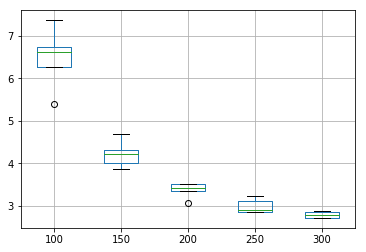

In [73]:
# save boxplot
results.boxplot()
#plt.savefig('XRMSE_LSTM_epoch_boxplot.png')

In [74]:
import pandas as pd
def Y_scores(e):
    RMSE_Scores=[]
    Ytest_RMSE_1= [84.78350647207374, 43.673823556351564, 35.53646973947691, 32.022966965836765, 30.184011221237053, 28.67470801243535, 27.12311761134538, 25.34518458447299, 23.1707381191333, 20.66220170310315, 18.90050445293242, 18.36521776594326, 17.623757837378296, 17.015511771691386, 16.570827334213895, 16.278019681263903, 16.0745924090583, 15.941805427433744, 15.771480067336313, 15.428645520422517, 14.81461099983842, 14.158723439790126, 13.673681034417198, 13.280952193246675, 12.864460610162215, 12.442301601055215, 12.055199458639962, 11.688292304663065, 11.298585359407303, 10.935144784210745, 10.611316508237927, 10.3300967930532, 10.082924437578711, 9.85546838743444, 9.640852220566947, 9.434819731359823, 9.245901104432741, 9.065156405063904, 8.909632492933135, 8.750092742423172, 8.614449391937029, 8.562742954655429, 8.52498933753244, 8.493431512260212, 8.404424398156056, 8.226472786720588, 7.875454455943657, 7.658723836196519, 7.545565781644654, 7.4524356934800915, 7.2713042347515096, 7.070608500150154, 6.869572199357135, 6.718696478748961, 6.603049658241176, 6.517531675444024, 6.4500131047558655, 6.389244912946674, 6.3305243229880634, 6.2732982952634275, 6.214401045314602, 6.156250642267706, 6.09899376356437, 6.046047006258576, 5.992112806958017, 5.941498619252399, 5.89220754706924, 5.846459961565886, 5.7962066670153645, 5.7456853428182, 5.700741219016759, 5.64765163804587, 5.602427229324109, 5.55359818083167, 5.509268467687066, 5.461928645746112, 5.419492631265528, 5.382831110484482, 5.339279021583507, 5.299545001291044, 5.2563830165625225, 5.217818728540832, 5.179599675798802, 5.149478250356532, 5.113140426603714, 5.08567491918602, 5.0599640884326655, 5.0330600572356055, 4.999939644243191, 4.965414161409194, 4.93064135704413, 4.902141094593143, 4.865173365528464, 4.833533382640711, 4.8060508363140295, 4.769356526098147, 4.736889429838327, 4.6946818615568695, 4.6595943844400525, 4.628956516043137, 4.597890299414035, 4.56651149729964, 4.532142644872037, 4.480616508606678, 4.439308885060707, 4.389804988574567, 4.34078788011379, 4.286822482353797, 4.229156492209249, 4.172871246445815, 4.116834328015873, 4.065570754802693, 4.018142977802627, 3.9845126331008704, 3.9416637480756855, 3.904869830105217, 3.8666412566157966, 3.85298321663128, 3.829463484212446, 3.830827945689986, 3.8362874287225224, 3.821898396490217, 3.8481374530445147, 3.836580520669136, 3.852559204253758, 3.8201212741076085, 3.8055208964186007, 3.7966869593482673, 3.7513872984310095, 3.7347815871509344, 3.7010043125243257, 3.680608836848473, 3.6520710046010176, 3.6356179630189676, 3.610006224050408, 3.594726671863489, 3.581658454832101, 3.560712779840653, 3.5446683358829514, 3.5164987743018914, 3.4976419468321196, 3.461272390175762, 3.445584646400447, 3.4038637856168914, 3.3811622202967038, 3.3492674723738682, 3.3488890725170855, 3.3472902131470765, 3.3705026136046716, 3.3749308863025753, 3.3635626176266835, 3.340345671493586, 3.29647289569292, 3.2860313688620844, 3.268115015941047, 3.253583032395647, 3.248410327659514, 3.2491784492045035, 3.2395700514232484, 3.224395472905511, 3.2191595479986477, 3.2037809373828825, 3.182839409712132, 3.175795482124947, 3.159662974294652, 3.1441887954591463, 3.1419850095215285, 3.1282293772944683, 3.1309910298201036, 3.108567533181983, 3.1151283553925113, 3.094602330713608, 3.0871436042787446, 3.0721367445766186, 3.0745228275289986, 3.0536057633444793, 3.0596088721491586, 3.045053558271549, 3.0523700528434388, 3.0359498392527455, 3.03213097439216, 3.0182424299719592, 3.0229939404483073, 3.0190231127038447, 3.000008848409545, 2.9963282879623705, 3.0173237514684064, 3.010229941013086, 2.9951483612150893, 2.9678844346886404, 2.9911322104805502, 2.9970705525924317, 2.977315609684507, 2.967702261147698, 2.9687231024876404, 2.9628361659200353, 2.9673871176734656, 2.964789286710479, 2.955795737689953, 2.953005925825843, 2.9696728326104367, 2.965391616182782, 2.9472347878375484, 2.9506807696160666, 2.945961397465999, 2.941945621406917, 2.9442443849523037, 2.946479943237927, 2.935663963397999, 2.935982112748831, 2.9241966118328286, 2.922270687185896, 2.9248807888175246, 2.9061083811016406, 2.8901194456533874, 2.9017972899057227, 2.8905802272115406, 2.8840157956041312, 2.8886104112206223, 2.898473731840724, 2.8989552013821887, 2.8961391842272395, 2.875236638874568, 2.8766908596469185, 2.898334760955974, 2.890004158331212, 2.896152913595854, 2.867067607967393, 2.8681809524304267, 2.865109100396801, 2.862668634993973, 2.8465063831616257, 2.8468627515068192, 2.8623370059930235, 2.848176877449423, 2.844444806262486, 2.863568009426253, 2.8583156005806716, 2.872362283050916, 2.8825571117109763, 2.8784808884323225, 2.872099965045636, 2.8534569436470023, 2.8484025457880677, 2.8479845008699534, 2.8243805105081163, 2.826017696257778, 2.8368112347129926, 2.83779681258108, 2.8371955187494633, 2.8559113872363855, 2.8624986497041656, 2.877746122494033, 2.8783403685476694, 2.884549481852744, 2.8820890066826044, 2.8766065906508067, 2.8555080390995244, 2.841961735667632, 2.8387662733892873, 2.8453695502843805, 2.8427757465784347, 2.848005539953014, 2.846335760938715, 2.862776574539945, 2.861047794997453, 2.8852513580946164, 2.8942424210412314, 2.88178493030672, 2.882322678689906, 2.868788605688912, 2.8577956867304404, 2.8519626315566646, 2.85396145573137, 2.860490990777774, 2.8669546849827805, 2.8621473759296205, 2.8728032197380866, 2.870103884520942, 2.8706782179591492, 2.876183084430882, 2.8819235355478723, 2.8800204991394596, 2.8762393898401446, 2.868192802066246, 2.8852606106186207, 2.876153653109852, 2.8718917837274454, 2.8667654150362436, 2.8680071957795628, 2.876110682672581, 2.878271778210928, 2.885146202608501, 2.8782278480674015, 2.8744912678465204, 2.8841224679780924, 2.8804923391668167, 2.875621684806673, 2.8918199051253213, 2.8813633718521987, 2.8828109826634525, 2.896264072957893, 2.8920504797141757, 2.889022478893808, 2.8902464509958814, 2.900882509570852, 2.903801486290897, 2.9050861587854504, 2.889746980785789, 2.8933420463765933, 2.891470261703104, 2.8894162733234365, 2.899356163537995, 2.8951213736941397, 2.8961376868016377, 2.897780220219605, 2.896582865602131, 2.8999263252784946, 2.889876357443816, 2.883368778408052, 2.8801370006850875, 2.8862719298911967, 2.9020871819463907, 2.916135546795119, 2.8979097811798167, 2.909399582128307, 2.909549967937097, 2.903236401991885, 2.8897898961015853, 2.8994936094256403, 2.8931157241997876, 2.9029754712599516, 2.899577066990884, 2.9111818380658563, 2.9029312980123527, 2.912564611498536, 2.9129747664376455, 2.920482323171471, 2.9039998755846557, 2.910732179077771, 2.895034248855474, 2.909608393684904, 2.9126404761150333, 2.906928680334609, 2.9055553671982066, 2.9083367740930477, 2.899358871734654, 2.920204263308643, 2.8996369159735136, 2.9242389178382178, 2.909518164427931, 2.9249730000663514, 2.922972180907854, 2.917855436219109, 2.92559002942557, 2.9214992077012054, 2.931324078177682, 2.9193640482537533, 2.919283800161231, 2.9117839401478784, 2.9036211645876304, 2.9196344627234687, 2.905716677805933, 2.921772164663847, 2.9092805750774953, 2.935586365448643, 2.922318998796925, 2.915167524151281, 2.9181862068722912, 2.9225608085307777, 2.935671397882737, 2.9235892292264265, 2.9309868348838846, 2.909015711027986, 2.923437093470846, 2.924422796138193, 2.9143243857071752, 2.92668425123424, 2.914258109101246, 2.912211873112334, 2.9050237709339255, 2.9156413870652393, 2.9045799273090904, 2.921344014779965, 2.9026517123609357, 2.909009978493346, 2.9184968559293405, 2.913421883397838, 2.906842730757776, 2.910244328081647, 2.907187524435554, 2.9097012067639745, 2.9097406801856387, 2.9106432375620432, 2.89908041933718, 2.9072698043430165, 2.901938707783973, 2.9032469342564036, 2.9040394253092723, 2.9049839547024887, 2.904025009256541, 2.902529781247491, 2.8986372634988333, 2.897243224368955, 2.9105802589304854, 2.8981306881866735, 2.9181389455587605, 2.896425100399341, 2.8976512779344845, 2.902585591095147, 2.9035809975164693, 2.898725134742529, 2.902154301116712, 2.907547047764011, 2.9074182190328255, 2.8955501932669145, 2.902958584142387, 2.908800774517909, 2.9027668591638203, 2.8954450638360205, 2.892107524299521, 2.9050139764322096, 2.8970241132369385, 2.8940110386234688, 2.895479831934694, 2.8862833070183584, 2.889909921715771, 2.88090396955762, 2.8922095362323588, 2.8910433362017973, 2.9030716319376504, 2.8810215989941295, 2.888522621210247, 2.8945891452667, 2.8836812490557895, 2.9027564888113346, 2.887569396175655, 2.8922560468699596, 2.8858606767413093, 2.8968446587404446, 2.894514919862658, 2.88985307786456, 2.9086681044632408, 2.89122386049389, 2.8954055995445063, 2.892368281659078, 2.916666702293676, 2.895128523903847, 2.899805061714935, 2.8901352057116845, 2.8940011544910216, 2.895394305751319, 2.8947298964239736, 2.8999127828803277, 2.886485910721193, 2.886122622867869, 2.9050892517297076, 2.8869008444238595, 2.8909506186673495, 2.883601863292683, 2.8895741703358433, 2.8860142940956353, 2.9030331428310454, 2.890528268612991, 2.903430106592134, 2.900139329425922, 2.8828720541884643, 2.8840666715187453, 2.8898208593697166, 2.907646930018629, 2.8935201023497448, 2.916958170614339, 2.907775244821877, 2.9048763254308008, 2.9313002862838133, 2.899482880141454, 2.9226695481353473, 2.9034099934643476, 2.9004104405208344, 2.898790862234228, 2.8910880021259056, 2.912019759464758, 2.9091297993157283, 2.898494333593508, 2.9055072289619357, 2.9124760032438872, 2.9093291827582144, 2.917887896111712, 2.9116417140919784, 2.904698269143394, 2.895719132615772, 2.904026108588704, 2.927003168855358, 2.887867811161963, 2.9293301635584124, 2.9140050588772355, 2.8926652157854216, 2.9028916818445696, 2.908083128407399, 2.907404500512115]
    Ytest_RMSE_2= [63.62146688235904, 33.774847935945516, 30.3573201590193, 28.70159135280268, 27.35139760965136, 26.121134644198204, 24.95104243369496, 23.804687092370298, 22.651467889835885, 21.462936500391603, 20.214342730364177, 18.907411270110916, 17.628985767332885, 16.506467089064582, 15.745414659229445, 15.434492353082844, 14.883303020457152, 14.374315620951199, 14.020568216061262, 13.736092596543704, 13.464959457991448, 13.190841107552114, 12.92819133057069, 12.69099855625033, 12.47665275470098, 12.274782593798035, 12.07483607015637, 11.87127141508106, 11.667456738346546, 11.464970511602148, 11.262603537990312, 11.047315782627285, 10.804934290380599, 10.533656368028673, 10.247245294224639, 9.96894381437181, 9.706784480005435, 9.468940188990082, 9.259055444479582, 9.078868902978584, 8.898110411202348, 8.698822276327135, 8.4840111467892, 8.261132224585198, 8.049145242965073, 7.876974050883612, 7.7536818536856655, 7.612047457674287, 7.435944721068473, 7.2895142370891355, 7.116688499589535, 6.914838770749432, 6.828710390312772, 6.648130559804228, 6.44349640953529, 6.304241813211627, 6.193120452139441, 6.118515156119793, 5.948346416567712, 5.819055830166768, 5.712631346662665, 5.603256358142589, 5.54701554904165, 5.4511251200575614, 5.322229783819366, 5.21828394178687, 5.147284342590841, 5.110253056031309, 5.030319364898059, 4.955234859033748, 4.869110707452976, 4.7875839002909935, 4.728672432197537, 4.6579928298686175, 4.606716480733076, 4.556422366210274, 4.530335002557933, 4.466735302699386, 4.452084852143762, 4.418156213375819, 4.364578956218805, 4.315096808483417, 4.337837893858336, 4.291999197602606, 4.250168431840446, 4.20111408780754, 4.146198422550981, 4.102061386575755, 4.065091753025369, 4.028944175840938, 3.9962501235650283, 3.964400996518818, 3.935013915279243, 3.9028293191329015, 3.8764313384467783, 3.8450627771245007, 3.815339228430385, 3.786855236316311, 3.755734527285305, 3.725207127767545, 3.6946161494056065, 3.6665608452708116, 3.6418313282099275, 3.6153901284235954, 3.593190619101733, 3.5692375745944616, 3.54606933801148, 3.5293961828138793, 3.5116072642044664, 3.497312741136332, 3.4822290128983484, 3.4635266050635978, 3.4496255637403683, 3.435472575991525, 3.4227414130404976, 3.395809408027991, 3.3908857203803238, 3.380463996538117, 3.3680691416718935, 3.353784997658534, 3.342275049242602, 3.321337574356838, 3.3067939589365944, 3.2921676158583524, 3.280729603169091, 3.2582154176974614, 3.235201066735272, 3.2097158270130763, 3.186043616814417, 3.1569439788294957, 3.11887808299087, 3.088856977683919, 3.0671175315100565, 3.056363453522839, 3.052398523999902, 3.048178229195181, 3.032102314881953, 3.0166786381578006, 3.000695163992253, 2.9865680466783413, 2.9725353025490984, 2.9656616813487955, 2.950702522796854, 2.938283084023575, 2.919069241528052, 2.9072548083560283, 2.8952474766274094, 2.8847558316180875, 2.87397769877227, 2.86499795043196, 2.8575123549343893, 2.850686938847369, 2.8495825053867216, 2.8453978029383213, 2.8503240096800666, 2.845807869025207, 2.855905721717441, 2.8474686766919386, 2.8610369268421088, 2.8510235648417876, 2.863393715868006, 2.851354043829171, 2.863939888414603, 2.8457502791158684, 2.858689875318102, 2.850252825552344, 2.8386413426684105, 2.8473257758155834, 2.8316080391052076, 2.8384510960604272, 2.819435992787264, 2.8208886853901727, 2.807053851046831, 2.8028695425239305, 2.800478470835577, 2.7886402817956495, 2.7764383763755456, 2.772275751496644, 2.765083923471583, 2.762564118252506, 2.757883022070468, 2.7479868574333217, 2.7451042418557057, 2.7423136191199644, 2.7388650586880705, 2.7394953865395584, 2.7355190485578555, 2.732965688817315, 2.7307325601195402, 2.729644641249241, 2.728144054223773, 2.7257999936935438, 2.725038558256323, 2.722878499782904, 2.7215706335081995, 2.7199109624968445, 2.7183423376629348, 2.7164301823451598, 2.714095643676244, 2.7136656804612422, 2.713815962707961, 2.715099057375985, 2.7142839961896645, 2.7144939787823628, 2.7131150100785533, 2.7120738876590162, 2.707659816552048, 2.706113698002271, 2.7027159948949637, 2.7021465746992197, 2.7034156867038117, 2.7032902903573346, 2.7027800878917674, 2.7036694836258772, 2.7012759968409226, 2.703395598938498, 2.702392498336843, 2.7022172927849852, 2.7014076149260977, 2.702282686928951, 2.701345628314647, 2.7027476619816655, 2.701744372543082, 2.701944279253333, 2.702298097081331, 2.702062095904356, 2.702973105266631, 2.702332810180143, 2.702466194630388, 2.702629259565287, 2.70381645318523, 2.703738905384988, 2.7042190031026294, 2.7049836637661713, 2.70505894815653, 2.7053214799033136, 2.706496033918411, 2.7067548310271854, 2.707308773359586, 2.7086444304295862, 2.7079642063043043, 2.709750016533758, 2.7098411849522503, 2.710900279070749, 2.711341679698522, 2.7124689550384598, 2.713030244445388, 2.7133852704245816, 2.7150770412444487, 2.715536234560711, 2.7164353627622093, 2.718028335907489, 2.7186508326322283, 2.719973762332672, 2.720406392058547, 2.7217097548946287, 2.7221438434559295, 2.722939878768612, 2.724258480552769, 2.7252774637160146, 2.7270337557434403, 2.7279611371995935, 2.729209823058922, 2.7303664992576935, 2.7315919309195786, 2.7327913542852578, 2.733832906563938, 2.7351443819136105, 2.7365597286331127, 2.738469791603569, 2.740022904817343, 2.7418204827252337, 2.744727601432327, 2.747196891010004, 2.749795470545517, 2.7550347557869057, 2.7597382320574524, 2.7672772585448335, 2.778618999333385, 2.795520339881299, 2.7910710523880344, 2.7662553489722836, 2.7736754048016317, 2.7897202449174774, 2.8004111890537606, 2.8084497272137003, 2.8100304197362527, 2.8050763570437622, 2.799787771880254, 2.79275017161289, 2.7930827175186432, 2.794231464841211, 2.795694631186973, 2.8026023481138522, 2.804927570512413, 2.8069039981353505, 2.8063960350881088, 2.805325377544585, 2.8058463726952843, 2.807355024369597, 2.808361506318315, 2.8087459741432084, 2.812781855026869, 2.8125731760085806, 2.814160952535928, 2.8132811167964245, 2.813542401504748, 2.8146359553861893, 2.8170889472664595, 2.816904208619714, 2.819874100777983, 2.820732185429837, 2.8224156064601646, 2.822819510766499, 2.82308785017467, 2.823467437628522, 2.824543047338272, 2.824880896719979, 2.8258326262149844, 2.8299443537567233, 2.8295341171012702, 2.827598869795769, 2.830588358347523, 2.8313363379948733, 2.828115519741006, 2.830698768667891, 2.834226628628253, 2.833256155916291, 2.8317993978107285, 2.832346811704554, 2.836193277764474, 2.8363790158959534, 2.834853138108747, 2.8349761334071037, 2.837302369276962, 2.837855730117604, 2.8379406062965433, 2.8410232101179314, 2.838859121574679, 2.836425839784126, 2.839935661182128, 2.842052006420727, 2.8437983323444724, 2.8434006551607527, 2.843370224316409, 2.843553297879017, 2.8438514262463412, 2.8447569540065825, 2.8461814749213987, 2.847515446319923, 2.8474436804411365, 2.8468587655679185, 2.848496095389618, 2.8486505556024326, 2.8493466378715504, 2.8498858711353954, 2.8548853053418233, 2.8549122646590983, 2.852645805204957, 2.8529793863474846, 2.8487062482230976, 2.8625757366734197, 2.8544079106798588, 2.853242463701162, 2.857000832950409, 2.854151519200785, 2.856280640476302, 2.8597399151638205, 2.8594154875870412, 2.8593448790868057, 2.8571136852551735, 2.8579848086282515, 2.859308278816953, 2.862938281112103, 2.8588571748652307, 2.8603282934766536, 2.8626673181304487, 2.8611996125605406, 2.8618390191533702, 2.8630174095543732, 2.8642540189605064, 2.865319131633726, 2.8674035264572253, 2.8646514191186085, 2.8667958373610034, 2.869442894601283, 2.865888247005812, 2.8679555419508995, 2.8698482066251194, 2.868722095989409, 2.8697190904740664, 2.8717344514142664, 2.872770531699305, 2.8716080491974214, 2.870586505949235, 2.874583005370368, 2.8752607281098035, 2.870933840372167, 2.875886902062573, 2.8769317493570354, 2.877587266299306, 2.877499126701221, 2.877854333357034, 2.8806604414968957, 2.883049319597224, 2.88327954787027, 2.8830815234161036, 2.880397066005089, 2.8844892023134383, 2.8864956614293695, 2.8888626319628763, 2.889684086282415, 2.8885825349051686, 2.891546625565265, 2.891644568622969, 2.893241368672788, 2.894879990250496, 2.894469508453867, 2.895675807546431, 2.900371850297268, 2.8978460050018815, 2.8985877466281416, 2.8995421736496834, 2.9001536866007354, 2.896883417719083, 2.9034489744057037, 2.9014502884668754, 2.9026204607318244, 2.9014721548533173, 2.905018920791557, 2.905699736780103, 2.90914452625709, 2.9048100372159955, 2.90410592267908, 2.9025664005073004, 2.899719453601171, 2.9103424350414726, 2.9086615039307664, 2.9024398617276397, 2.9065165044336556, 2.9067254825998687, 2.916557776451993, 2.9138678850103124, 2.9091892810373405, 2.912336791244943, 2.9108954842562804, 2.9163455438295562, 2.9178734435822737, 2.9140596473231164, 2.9151437782075984, 2.914175167204684, 2.912478809357161, 2.9152791639130258, 2.919824615303452, 2.9183629935784743, 2.914950804890528, 2.920589630554349, 2.9204510559102634, 2.921297088599045, 2.922263321059154, 2.9216371673749246, 2.9147501255824815, 2.9268128200598427, 2.9320131810814964, 2.927601951067887, 2.9241683229720694, 2.922444646530164, 2.924373799551001, 2.9322859639463683, 2.9308591679966773, 2.935797461886627, 2.927923098106376, 2.9365634754055705, 2.9265959270815265, 2.9240783813953244, 2.9306574587432457, 2.931922798718565, 2.933428446208065, 2.934335284211952, 2.928696828858191, 2.9367199113135976, 2.9286435445248036, 2.9302463549994657, 2.9356324179622115, 2.933098924416194, 2.938816804312303, 2.943758563234015, 2.936585254786324, 2.9424712451200588, 2.9385430036814584, 2.9486011010147424, 2.934508144147057, 2.9384055697050107, 2.9332689831137992, 2.939581663795284, 2.93962781457066, 2.9488425237965457, 2.9325329085124454, 2.9499679213553662, 2.9345089327549387]
    Ytest_RMSE_3= [62.27186595122698, 38.07073758687322, 34.12475998992064, 32.26957379834734, 30.77024021488797, 29.367690515289883, 27.977807730384846, 26.559818444859634, 25.088871237512933, 23.55615509147646, 21.984560696677406, 20.45448710188831, 19.38874971582924, 18.842458461293976, 18.391111308910812, 17.93396062867003, 17.54633612901357, 17.173348351233628, 16.794796013193224, 16.4126460272587, 16.04287649940956, 15.694990868986354, 15.36430161194117, 15.034086204546169, 14.659459411011118, 14.132822071937175, 13.442873726908596, 12.893660244306652, 12.442798554027267, 11.76391203710839, 11.332505338191998, 11.074030073594647, 10.772772960255976, 10.258245949507733, 9.85559792211311, 9.454733256638779, 9.120753758290844, 8.728731622664158, 8.443719013250618, 8.17568954575598, 7.999704895130039, 7.80362860924032, 7.626563272693755, 7.455830012038887, 7.296417435976236, 7.151684125767988, 7.009387711494817, 6.872771750030825, 6.747013855278228, 6.632450857528911, 6.520575973777586, 6.415963357045486, 6.323244573445544, 6.238384935165747, 6.159969489005947, 6.085368093808743, 6.009294096304508, 5.937752484372295, 5.871329532214642, 5.808391775557599, 5.749372782562329, 5.693869789810959, 5.645439827578554, 5.607929063159444, 5.580122146243555, 5.554088621119093, 5.520134226152937, 5.476876001475528, 5.424038425822754, 5.362926182559735, 5.313221180792204, 5.267906160157098, 5.218469839380054, 5.168949048413676, 5.11674572948786, 5.068079048186524, 5.019237969418357, 4.973876742723787, 4.931360942791177, 4.887534636837422, 4.846636973253006, 4.803019333303513, 4.764647667455227, 4.72145039749166, 4.679950077861742, 4.642535749408809, 4.601692092228984, 4.564993725780818, 4.526757554605021, 4.4901475291308435, 4.450474013227656, 4.415784325319929, 4.376422989432195, 4.339887582561518, 4.303714196444119, 4.265179523045665, 4.228316694641595, 4.191582263670789, 4.156121738646251, 4.122372520013946, 4.0883643438385056, 4.054531349338779, 4.025391662125776, 3.996596938176007, 3.971120669937123, 3.9467427392700505, 3.9273525034527585, 3.907644754405224, 3.8904273231714197, 3.8776273989437153, 3.8618581976521478, 3.843391166999175, 3.8288025966430785, 3.8067556100677438, 3.7788602131631963, 3.7457207878889758, 3.703954167345916, 3.65774884661082, 3.611608284090731, 3.573235325487471, 3.5516129826074185, 3.550310331369349, 3.571662790740595, 3.6079025605681996, 3.643295126959531, 3.656229801711405, 3.6365794534021227, 3.5857686897301613, 3.5273052030816396, 3.4784906725795355, 3.458966947083181, 3.45159212225153, 3.4320984853638543, 3.3749433614303133, 3.300876123651162, 3.250925514213942, 3.230013282459747, 3.2117906511909475, 3.1936658380926777, 3.1772945750075454, 3.155925353021557, 3.132155533355591, 3.115136918714912, 3.1056340747970466, 3.1007664288400565, 3.0949789005139547, 3.088391232287194, 3.075796683642009, 3.0698601776174246, 3.0634597249210875, 3.059957939403402, 3.0524121389087755, 3.0491412087362715, 3.0411611930555855, 3.0318107896834987, 3.0299583632158793, 3.0331293656558485, 3.0299626822826657, 3.025766216420687, 3.0194660337302217, 3.01426392470711, 3.0001093474733977, 2.9957625354865742, 2.9948013518339387, 2.9872801687700856, 2.978743396062483, 2.9709017128702953, 2.9570533145768483, 2.949718203970948, 2.9455941992990287, 2.9387322806697966, 2.9311590532868825, 2.9244746707583684, 2.9196097796498233, 2.9144492230777033, 2.9087519339068373, 2.900401318653654, 2.895347574569614, 2.89411910105305, 2.8856905092716656, 2.884952460574018, 2.8737926115675627, 2.871222069976568, 2.8612511861400445, 2.857336222176276, 2.852041339565137, 2.8471821135740205, 2.84198835245766, 2.8379419214245156, 2.833094345565757, 2.8274877298514363, 2.825247553928055, 2.821812766156815, 2.8229578243840368, 2.82520548302533, 2.823119879747633, 2.8227743893739206, 2.825197339323366, 2.831321619903668, 2.8345815952158935, 2.829550023714298, 2.826018740589214, 2.8123978887716183, 2.8018677169482893, 2.7935594403555886, 2.788373988199267, 2.784555417993918, 2.7823425873262577, 2.7803254978545655, 2.7789158899872812, 2.7765507602556365, 2.776829331082289, 2.7754759279257275, 2.774466513022582, 2.7751743918893346, 2.7741844276512637, 2.7708631068207548, 2.769802571550142, 2.7717716990775525, 2.7727319826040233, 2.7724462250286246, 2.772721178890248, 2.7722317934512293, 2.772188293374583, 2.7755757194808246, 2.774206316561649, 2.770742189876637, 2.7801602016259306, 2.81635758661697, 2.8716340005560537, 2.849741016754994, 2.8116331960883016, 2.8024912977221157, 2.7922807348327714, 2.792792465320259, 2.7953670287745496, 2.792858223103874, 2.787791877299292, 2.7862151808186177, 2.785670171492069, 2.785920289566234, 2.786367803823753, 2.7863950611652024, 2.7877202655373328, 2.787280222400318, 2.7887646705575393, 2.787048993497112, 2.7866943042349783, 2.7855411227953772, 2.78532008670308, 2.78246135471569, 2.7827306284215694, 2.7811328566256717, 2.7812817252083306, 2.781818521085545, 2.783080514593491, 2.78449352472905, 2.787221469145796, 2.789147789374361, 2.7912455245603596, 2.791081889205244, 2.7929332661069117, 2.7896861065006573, 2.7859025270246067, 2.785759784396548, 2.7978984166048684, 2.828166168810789, 2.8594640280702546, 2.8359022346887373, 2.8295819483455684, 2.8383545717695586, 2.8368259123735062, 2.835724449556318, 2.84002376237176, 2.85415184194922, 2.868024106891208, 2.885848902505346, 2.907685868886292, 2.925676926789382, 2.9288422282111326, 2.891017424163611, 2.858891039771555, 2.8496688692088825, 2.849978512996328, 2.8557154589153915, 2.86648736766364, 2.8775409512426067, 2.8913339972292222, 2.9014857411588513, 2.9072579753031436, 2.902448644309277, 2.88930400250055, 2.8781693456189386, 2.8754910344890443, 2.877197139609252, 2.880133260137723, 2.887908206128835, 2.894723280504093, 2.9018159609577765, 2.903913818075502, 2.9007948378811164, 2.8976447931721294, 2.8924396915720245, 2.8915305743414774, 2.8917010899717095, 2.8941852527887217, 2.8945156306724584, 2.896911853511364, 2.8973355191768557, 2.8964863730436172, 2.898462374992631, 2.89928936561908, 2.896902018824474, 2.89853408811809, 2.8990777391418523, 2.898545327089742, 2.898080042720236, 2.9004552343305763, 2.9009732133929305, 2.8981644103730186, 2.8997436257441707, 2.901779325362553, 2.9006669044862328, 2.900471732142878, 2.900468351906429, 2.901496833165566, 2.901002033875972, 2.8985419520241646, 2.9025058627231872, 2.8980521644757595, 2.8992052436352527, 2.898702363451422, 2.9009164333799946, 2.8984278507945676, 2.9019105682856376, 2.9000261572447394, 2.9018938225421027, 2.897808490622006, 2.900455401695091, 2.899986770664804, 2.902944543942825, 2.9008882223237373, 2.9017247451788934, 2.899100116080616, 2.9009039182727028, 2.899034851798165, 2.9019151699853074, 2.898392446283386, 2.8998193327483825, 2.8989603370119172, 2.8998233760836056, 2.8985677016615514, 2.899700241945456, 2.898044078436909, 2.8998854560138856, 2.8960745714506735, 2.8965662744948784, 2.8976766318050036, 2.8979631818324747, 2.8946420258540284, 2.8976152299172, 2.8970135218037965, 2.893335641039528, 2.8964526540665605, 2.896882667695995, 2.8975372237300596, 2.8986495158442374, 2.898423592144452, 2.8968271782919093, 2.898581349130177, 2.8915270586499617, 2.89657440248112, 2.894225408016019, 2.8934315494845038, 2.894243821796137, 2.8923100354634084, 2.8922453637543595, 2.8890769593744974, 2.8924064717067135, 2.889711865549667, 2.888419267040583, 2.8874297255662653, 2.8865354092816604, 2.8827029623379956, 2.885681447909259, 2.8833499765473736, 2.8841596631608875, 2.8803358086500737, 2.8809807715426436, 2.8796503541565097, 2.8826873158563253, 2.8785185163034437, 2.8769019021308204, 2.8787943306043355, 2.875366643674727, 2.8769691694058097, 2.8758213576925824, 2.874246917096922, 2.875233491821404, 2.8753060137952056, 2.8731252688085793, 2.8741607860949143, 2.8754144717295724, 2.8772670584303333, 2.878347790967503, 2.8804882112797885, 2.8810504619473756, 2.8827238519164156, 2.8838677627704588, 2.8844716796026533, 2.886461281155258, 2.8850947376853995, 2.8868630580424033, 2.8877842379730785, 2.884607699598849, 2.8878811194869938, 2.886072754665195, 2.888351175613555, 2.885787154652364, 2.886896037668541, 2.8839801655354615, 2.8846319911562084, 2.884623070130334, 2.8843588801413356, 2.8825978389025, 2.884050423580791, 2.882455976220268, 2.8806396872610818, 2.881190258298208, 2.880763258753974, 2.87994004336383, 2.8810272469819336, 2.880416335689853, 2.8794407378358278, 2.880282109404933, 2.8797633109444956, 2.881232153627829, 2.8780546828043523, 2.8798478639560168, 2.879178325067985, 2.879881590459342, 2.8790825221028977, 2.879052890999835, 2.8794281739001337, 2.8792503004858703, 2.8777716483697513, 2.878499930321981, 2.8792565384123616, 2.8788264844479827, 2.879951596059876, 2.880799475745887, 2.8806089009063487, 2.880883845576449, 2.879690572140436, 2.880987813935913, 2.8823299555887374, 2.884314954395575, 2.880653300616493, 2.881046922738983, 2.8800067431258336, 2.8819453545629243, 2.882107512785013, 2.8841586863968884, 2.8828067668309574, 2.8847275428511865, 2.886620975733492, 2.8836745161208333, 2.885895204543192, 2.8859471893028332, 2.885912887285288, 2.8867314471510923, 2.8878559715245955, 2.8882257935790756, 2.8898349562324075, 2.8884108830736803, 2.8886710914676508, 2.8889990561636196, 2.8882901595475543, 2.888953410433682, 2.8894987716003113, 2.8906576481557558, 2.8910126094794837, 2.8907586368843114, 2.8904719571935007, 2.8907126806679004, 2.892187567024683, 2.8920698214684815, 2.892619910801236, 2.8930942157055823, 2.892911876539817, 2.8942792481432464, 2.893815977887443, 2.8933952992334233, 2.895082162746685, 2.894066695297235, 2.894029041089126, 2.893785773869626, 2.894493959816529, 2.896628700634723, 2.895130164078277]
    Ytest_RMSE_4= [93.0730042415496, 38.646187648768965, 30.734160579365675, 28.71569298321299, 27.254561859987856, 25.808911110879315, 24.265491193906602, 22.547600865910347, 20.645792520317087, 19.07162227872303, 18.193458472873782, 17.553045153264577, 17.15318816871446, 16.651726820601084, 16.02986916566868, 15.482031859841241, 15.04682416425101, 14.67891818363376, 14.346324484836662, 14.027843897774325, 13.721522720092043, 13.448770060723183, 13.226397271158856, 13.044061329830312, 12.835406641679777, 12.558494789190606, 12.213358660849027, 11.76878961495236, 11.260975536431589, 10.771871711209231, 10.370770739804032, 10.049500997488273, 9.752824300811069, 9.44698211248459, 9.154691133542476, 8.891398125350834, 8.679041386533411, 8.545152613081518, 8.455046346938868, 8.284201170329144, 8.036071228842383, 7.78541989504025, 7.599972909988886, 7.502442551334784, 7.508547217543792, 7.471363286956566, 7.404104095320782, 7.160850781128391, 6.921302726267151, 6.746720944670654, 6.601198615251615, 6.451797342245045, 6.298835654610791, 6.200672015953197, 6.1243846979190755, 6.036711882265585, 5.94594403282672, 5.865590132155589, 5.806809098597574, 5.7780663575039375, 5.762973802676892, 5.742972337284796, 5.704092839302136, 5.65631344189435, 5.604519115302113, 5.571256324151008, 5.52939135878379, 5.493038535443204, 5.45678639425193, 5.407736878978656, 5.370550468719355, 5.3278726500329325, 5.289138392904198, 5.256411067512052, 5.221928520187474, 5.155069807534547, 5.112734730763493, 5.054370556529165, 5.003787561762106, 4.949214020497456, 4.91935840998959, 4.884116864114341, 4.8499725681553105, 4.812606224852812, 4.775898738310243, 4.731495831685584, 4.682198167870016, 4.6294560978890145, 4.556065318761784, 4.496110093539309, 4.425979091323417, 4.354631272891104, 4.280871997322219, 4.2082643939794915, 4.141923992605183, 4.0841128770515205, 4.030387153682745, 3.985409632321462, 3.9492549400105066, 3.9196262180047534, 3.89684665948168, 3.8812668733914286, 3.8751959692214886, 3.874630219581031, 3.874624657539906, 3.8666105240173017, 3.842827073385366, 3.810986190034537, 3.766508080286529, 3.7252614201745033, 3.6788777834158046, 3.6300737594548154, 3.5798115051892916, 3.5358518217243424, 3.5069331195131905, 3.493827870782538, 3.4860070778465198, 3.477757397903057, 3.4627132371004583, 3.440186756248133, 3.413941222723483, 3.380260405679174, 3.349558505093054, 3.322872463695477, 3.3001785047131973, 3.28038905309477, 3.2627016852029467, 3.2462610217936105, 3.230509318146894, 3.2133299670526703, 3.1976634944558335, 3.181452993691244, 3.164311674050115, 3.1478615309240374, 3.1324555892783876, 3.116289157356251, 3.1013935176789147, 3.0865549919099546, 3.07298784345686, 3.060741071070237, 3.0485822873194754, 3.0394427674645046, 3.029741032783089, 3.0247235625880347, 3.017367279526253, 3.013603378678936, 3.0119379317182684, 3.0094973310256274, 3.0089591781124048, 3.008400250381026, 3.0049796804108326, 3.0068636050951927, 3.0015768610069538, 3.0000217294305993, 2.995533901909436, 2.9858240720709146, 2.9857044238865886, 2.9786888647620238, 2.968167232412832, 2.9653068509913636, 2.958112413102023, 2.943956394663021, 2.9361731067251173, 2.919001026528524, 2.917614683815019, 2.901948810540561, 2.9047563755981964, 2.8855926998310713, 2.88224809978042, 2.8619128483838936, 2.860496726437334, 2.852639392098087, 2.84940275436391, 2.829929754355012, 2.8243307639672603, 2.8193766735775427, 2.8116247921576636, 2.806202295328981, 2.798113607062308, 2.7895160350876993, 2.7824789112317694, 2.7783978204591455, 2.772353093637717, 2.7600142912273835, 2.7564764450762618, 2.7502788169720533, 2.747193331151904, 2.740508999327495, 2.7346063270519148, 2.730364767456366, 2.726276445358655, 2.721748409616721, 2.7218101403367383, 2.7150328439110307, 2.713940515116308, 2.7139976711079434, 2.7111157376137918, 2.7050156173182383, 2.7038610130237792, 2.7039280281444853, 2.7016566336617753, 2.7011673790918236, 2.6920928255294236, 2.692335340033248, 2.6912324153739817, 2.682308385106164, 2.6801435342465196, 2.677077845686089, 2.675761332622915, 2.6708177237065915, 2.6689009142244133, 2.6692311585431328, 2.6704793295914024, 2.670542643864845, 2.667809309018778, 2.6702380110559436, 2.671483439011704, 2.672378084659304, 2.674265165756364, 2.6769366621516766, 2.679008036644278, 2.6811526728008546, 2.6865478685164064, 2.6879306796133267, 2.6913154646288437, 2.691029015815929, 2.6890810369920852, 2.6894206214360024, 2.68406060978778, 2.6757466705913937, 2.678183692006057, 2.6698949636443747, 2.6718193712466722, 2.666844427252966, 2.6731574290011046, 2.6718196615771324, 2.67781666341525, 2.6724345331316472, 2.672056649481285, 2.6680892154921065, 2.671514459193, 2.674016692689438, 2.67350418081117, 2.670941180827189, 2.6799194389573255, 2.68195878255244, 2.6805446619453197, 2.6855565396925987, 2.688086032469158, 2.6959907580648825, 2.7024887317832307, 2.7096356508608115, 2.7060782906363374, 2.7172193153178026, 2.720320220792484, 2.7333059437730234, 2.7397852459007086, 2.7378819275664696, 2.7477654984927216, 2.755202649950238, 2.7581629317106473, 2.7597294189074275, 2.7590536285236658, 2.7624218268919054, 2.7617050431312617, 2.757404060409662, 2.756794531782455, 2.7544463292748294, 2.758595994649092, 2.752428992312879, 2.7531846777407014, 2.749961258387087, 2.753544401341878, 2.754119775855051, 2.7515811013591445, 2.752683298131022, 2.7541176012581294, 2.7538368313506956, 2.7537942229176626, 2.755061355138891, 2.75812819128926, 2.762899650528588, 2.7660664508172292, 2.767037162916594, 2.7697767373408273, 2.772162183570691, 2.771247739230609, 2.76926221383792, 2.7670006964458436, 2.768905696765676, 2.759087732533193, 2.7574917947357673, 2.75767150182455, 2.7555465407948914, 2.7567176004735394, 2.755904116967201, 2.7550273102534777, 2.7599308189913483, 2.765116470893054, 2.767229062557801, 2.767678658422368, 2.7647112980217394, 2.7735050636642584, 2.7768058951324344, 2.7733600123501625, 2.778062940527561, 2.780686539136305, 2.776777146428693, 2.7736502948502517, 2.781094949295522, 2.781376954489792, 2.764866388759461, 2.7661904906995267, 2.7641676082909834, 2.77005821660359, 2.775543535508279, 2.767756297636049, 2.7719875876568296, 2.7706214770446818, 2.7754590868493714, 2.767886116685143, 2.769516089002885, 2.7740286772978093, 2.765997397209108, 2.7695910627345426, 2.7697314061128364, 2.7749983238429157, 2.7780367987990218, 2.7768970041141485, 2.7761225474492597, 2.775332298580919, 2.780362570379902, 2.7719679231340346, 2.770760610394303, 2.7764900588317465, 2.7725082062262216, 2.770533710406637, 2.775975091962037, 2.7698015010498254, 2.7695382991533575, 2.775361011237892, 2.7707037688050997, 2.76819481560388, 2.7741333951256846, 2.7747047137589274, 2.7640517963218274, 2.780490243537752, 2.765854231075983, 2.7743100494241104, 2.7676709976779317, 2.778725805494499, 2.771625602825666, 2.781859181658797, 2.7699410273813103, 2.7784108096756563, 2.7702382098987477, 2.7691995102775793, 2.7749586947832747, 2.7702032255033875, 2.7698807201997133, 2.774143131625092, 2.771789139017116, 2.7675536145170336, 2.769185427346681, 2.769104174562706, 2.7675361609195, 2.7700591301567523, 2.77019010704486, 2.77111840875829, 2.772500060342244, 2.7678374911848764, 2.775479978282934, 2.7728445252561906, 2.7763625407241173, 2.7710332196892566, 2.7753150901160515, 2.7723305001319574, 2.7738133308560693, 2.7701860319410367, 2.7751406876892575, 2.767113586418772, 2.774044984016127, 2.765708833382102, 2.773853140764508, 2.7683591755510237, 2.77541084963182, 2.769273475173737, 2.7749068263770593, 2.769640421558991, 2.7752267359490235, 2.774121749443131, 2.775578867474732, 2.7672500918079064, 2.7747762666626494, 2.7712323472471674, 2.774219264415354, 2.773722057634508, 2.774748781552181, 2.7727775101096546, 2.7802238024614208, 2.774375089317444, 2.774906366737864, 2.777541310567283, 2.7714616713961573, 2.781075276577639, 2.7745415727187352, 2.7777763018398427, 2.7752375355402275, 2.7793582410975834, 2.778273846207338, 2.7784245623461783, 2.7756656201932843, 2.775703934166553, 2.7745883471909405, 2.7813094922680315, 2.7787983096387934, 2.7804650397140036, 2.781162428195898, 2.7799112725445916, 2.7819904936275828, 2.785140581142826, 2.77900487705296, 2.784345247008365, 2.7821940780615715, 2.781431603219355, 2.7829705036177153, 2.7799864375518877, 2.7798401798682524, 2.781589480121341, 2.781253166476177, 2.7811884587502975, 2.7849023134847135, 2.7841562414266043, 2.7804800540129295, 2.7805059831828425, 2.7849118129663855, 2.7878484724864494, 2.788774038267676, 2.785067383335288, 2.7844661142850784, 2.78526132229767, 2.786024774845829, 2.7846997832438, 2.7856852677981228, 2.7864002947979545, 2.783813310815708, 2.784845130627397, 2.7872000717313234, 2.7859988429787825, 2.7886508370205565, 2.7868143189069734, 2.7881731181143627, 2.785654558487773, 2.787360322363992, 2.7866593183417048, 2.7901251259736894, 2.7876894273377, 2.789659895870858, 2.7924987171298237, 2.792290975885288, 2.7911423875541703, 2.791665196930566, 2.793926815979861, 2.7934075301096053, 2.7981380482296245, 2.796809002585098, 2.794773011610349, 2.798785903440026, 2.801054083670538, 2.8006902620974694, 2.804382303255656, 2.800914701136391, 2.8044272332862605, 2.8057660894762013, 2.8037218143953107, 2.8036069952739324, 2.804436014457828, 2.805356030604828, 2.8042143128844144, 2.8052052075722793, 2.8074034993832186, 2.8066182224181513, 2.810233793341803, 2.815184048648457, 2.812552468819746, 2.8112669794869145, 2.8125933762705086, 2.8086651579659567, 2.8086337930605794, 2.8069767035719675, 2.8148382886621333, 2.8185281488723426, 2.808228001823055, 2.8211319439547693, 2.811885468127069, 2.823679119580413, 2.8185414627842618, 2.823119523379828, 2.820039630470846, 2.8237355871363965]
    Ytest_RMSE_5= [53.21285237655702, 38.17877612881428, 33.76851819407528, 31.30231619991598, 29.090796774408812, 26.68573622407147, 23.8475628646664, 20.965587326222444, 19.638832643612005, 19.001331822542756, 18.339661191623346, 17.782418870635805, 17.154085363439343, 16.50591320124997, 15.937728181261168, 15.532693514606143, 15.342436306634454, 15.015339376960355, 14.44895558837143, 13.763290370126033, 13.081465251000926, 12.505472479067357, 12.024089458839933, 11.618332853398007, 11.217351959860007, 10.837325257661066, 10.46310105878943, 10.091971792678057, 9.735155028003069, 9.441065057039234, 9.236876035997945, 9.11214463039808, 8.984682608537142, 8.760529212952186, 8.397596940715843, 8.014808126594685, 7.848489310550426, 7.909642549386659, 7.8398660092892385, 7.70376123608099, 7.438840614550711, 7.237751461513029, 7.08052638266864, 6.864017432002243, 6.591541638466499, 6.434938937215779, 6.321906787344538, 6.199044067609991, 6.097219519022235, 6.0434108734479715, 6.058877964052366, 6.017051977023014, 5.91485656495221, 5.803566484785134, 5.6683059871129124, 5.565549244482568, 5.489202636746938, 5.4214136789133285, 5.341625691248163, 5.273941351027369, 5.222452992932991, 5.173914111528803, 5.114779243842241, 5.064933706540015, 5.024381994749903, 4.9884925524314605, 4.953532798177128, 4.920237804413092, 4.88484920957108, 4.852427408362285, 4.823412758689661, 4.797819180894479, 4.769365313207399, 4.7391934488545475, 4.7087634306120165, 4.684899057881975, 4.6537450759463095, 4.630199025117794, 4.604849013852267, 4.581048977695234, 4.556765796787348, 4.533274999468389, 4.511623823531564, 4.486531359150763, 4.464333723466007, 4.443248985329416, 4.418564043303484, 4.387640768607679, 4.364192479698926, 4.343634678885002, 4.317283679996071, 4.300663280341458, 4.274978498542347, 4.252812309656389, 4.217303358402068, 4.185466049978584, 4.153401813507545, 4.12062291614293, 4.103486188768725, 4.071526063112842, 4.043717915358997, 4.008613889586553, 3.980144874674566, 3.9424970968149373, 3.904664189033169, 3.8684672149705692, 3.8350023731521348, 3.801326448655882, 3.770523352635164, 3.7407734900354823, 3.7158740688253338, 3.696106060938251, 3.680923255000621, 3.670813571239306, 3.6652528158085302, 3.6618019037685023, 3.6597609524610513, 3.66314290543858, 3.6680652336591346, 3.67930710796834, 3.69171422684255, 3.7043628567280393, 3.714713140893043, 3.709769996193429, 3.6863242369840052, 3.6265473363510408, 3.555220953035783, 3.5005605331802263, 3.458603679982229, 3.401893637485765, 3.3628278438805017, 3.3463683092988528, 3.331572666114289, 3.3158377920348934, 3.297509853058981, 3.279885776365417, 3.2645234280973714, 3.25234549921195, 3.237789714598668, 3.227658843983973, 3.211453265471369, 3.199471929375575, 3.1848642055255354, 3.1684776250713638, 3.154770748069551, 3.13897379625923, 3.126486970444788, 3.1115157287192203, 3.099563583165179, 3.0880281675906036, 3.0770839645329895, 3.0668550132262618, 3.0586105865592343, 3.0507860284345436, 3.046960075076718, 3.039707412190027, 3.0353112214539686, 3.0326030031150166, 3.030608670639514, 3.0273115113591698, 3.027522759429964, 3.032181345167566, 3.0315456749488914, 3.0336489924595766, 3.0310167015118608, 3.039031612834743, 3.038707772721759, 3.036028501802275, 3.043681536043477, 3.0384133380884077, 3.0367010653598303, 3.028173412556979, 3.0185084822355157, 3.002909067333923, 2.983659694692317, 2.9693830984452934, 2.9484214357728007, 2.9264008620177795, 2.9040696077983, 2.8838523312857096, 2.875344380511661, 2.8610271372167353, 2.84883377583237, 2.83903851081234, 2.8272855321694568, 2.8191145885814763, 2.809380483191351, 2.801072540224867, 2.79359615282249, 2.7883091040910863, 2.783351474443459, 2.7746119152410027, 2.7668379370429492, 2.7620955816319634, 2.755309857657827, 2.7528403721485164, 2.7468792398181603, 2.7450290957717556, 2.740796774655074, 2.73653597548247, 2.735664119519417, 2.7329289479573826, 2.7278173121366263, 2.7262509048084587, 2.7233837697987657, 2.722056807843507, 2.7219669781226075, 2.719245538333232, 2.7167342504772325, 2.7153066899961824, 2.7125101463506307, 2.7121210575742, 2.71064559588832, 2.709407205178534, 2.708179478279273, 2.7077016038461434, 2.706137885621634, 2.70499496643423, 2.7042321666824463, 2.703578962485229, 2.7033474789573884, 2.7021871584356587, 2.7025995416002306, 2.701118151980315, 2.7011575426312375, 2.701493394026943, 2.7009488077731287, 2.7010324970583968, 2.7015203609971774, 2.7010572429824418, 2.701836200118295, 2.7016597691485966, 2.7011910118556663, 2.7026517082166372, 2.701664833831466, 2.7020475776377695, 2.7020206055573377, 2.7032127069576366, 2.7036916469286654, 2.7067999385252106, 2.7076977888007683, 2.7083413730457, 2.7100706746039482, 2.7094215160927675, 2.710154485282837, 2.710619445467752, 2.7081735579563397, 2.7114779051318085, 2.713335358688658, 2.7125051685038373, 2.7141989812545586, 2.7158294741995834, 2.7182653053404624, 2.7201322281051215, 2.7220664925947564, 2.7223887360003367, 2.725063745922241, 2.7237181073170316, 2.725531098344179, 2.7271790741136996, 2.7265424477368954, 2.726075609170092, 2.7296868739433098, 2.7304816847445843, 2.727260973230621, 2.733748219338988, 2.735986630257881, 2.7395510074769738, 2.7365588172797213, 2.7445768716196723, 2.7444389782050718, 2.743108285492359, 2.749889000758139, 2.747936456243492, 2.753171418685965, 2.7485210008113725, 2.755501211133731, 2.756436473688404, 2.7564038091302066, 2.7593545311965353, 2.7625547261059755, 2.757090957165878, 2.761371823192771, 2.766420310293289, 2.7589504450356706, 2.762591822972243, 2.7692981267790064, 2.762204086514608, 2.7688384949407983, 2.770986862955525, 2.7692958016593368, 2.765142030027285, 2.773311304305565, 2.7633380580329683, 2.7634172213676402, 2.7547523865417776, 2.7384674128772555, 2.7645003322661568, 2.736994980886676, 2.8233381089931977, 2.8199905146398416, 2.8224438925246305, 2.824652670307824, 2.8264702226331777, 2.819928723656566, 2.813749261986404, 2.807503716337087, 2.801691851317064, 2.8052378187616207, 2.805054772349187, 2.804982246786584, 2.8081311346101434, 2.8076191066384752, 2.8081983896182408, 2.8075166987126368, 2.8097270073780862, 2.8079138309887886, 2.8103716338915405, 2.809571374351354, 2.8107557680058597, 2.81021332234875, 2.8135545064846155, 2.80682214551092, 2.812716854970682, 2.8072121845032014, 2.809176315367051, 2.8101988965674893, 2.810686898493194, 2.8071541069291754, 2.8106165391081888, 2.811231650337051, 2.810193816039024, 2.8107266866180334, 2.812357924608551, 2.806874712177515, 2.8119303972112752, 2.811839438076108, 2.809242650009729, 2.8135304797025147, 2.811250884241861, 2.808342741853411, 2.811751988214372, 2.812933917659819, 2.806643995666868, 2.812488391764072, 2.8119597858120624, 2.8058641046555635, 2.812359424791479, 2.8070190589238337, 2.809510266116623, 2.8138700495774613, 2.8086617386427144, 2.8089626997520627, 2.809579370835083, 2.8099531108518305, 2.8075878706119135, 2.811225435932564, 2.8104078318158874, 2.809281841324014, 2.8140829188599676, 2.8102199576257134, 2.809685498093769, 2.8128287753988737, 2.806174897356367, 2.812702866114154, 2.8106570245551117, 2.810654679595636, 2.81295470654991, 2.810620060011501, 2.808957135596675, 2.8119309054088566, 2.8099876451430954, 2.8106833827287225, 2.809604340198647, 2.8088320265542124, 2.815117904610835, 2.8088128041865077, 2.8092362319396043, 2.8128107854942885, 2.808820989382145, 2.8103486945810205, 2.8105704636794524, 2.8078630846008825, 2.81314327199447, 2.8141592889608145, 2.813958499522671, 2.8107018628532234, 2.8160024271910555, 2.8084664825002754, 2.8076001025587844, 2.8167424606943627, 2.8167550288545167, 2.813618373076857, 2.8150047732030123, 2.813304564959581, 2.817827225454256, 2.816623337773122, 2.8178531225675965, 2.8191850161676526, 2.8110910066857957, 2.821555724224626, 2.823102159839142, 2.8129829085399805, 2.826372301580301, 2.8274786836030805, 2.830186341848157, 2.8218785118123066, 2.8278563737239097, 2.813306602318467, 2.8254729266516643, 2.8224264678260527, 2.8256796322032964, 2.825547627691373, 2.827190557810567, 2.827518435150342, 2.815550536561108, 2.825070435756689, 2.8227208909704604, 2.817044786075508, 2.8322252669115975, 2.816434685029376, 2.8269845885676603, 2.8129582632552186, 2.823782712969991, 2.8225834645984325, 2.8291540231090124, 2.816294883883666, 2.8234997560735993, 2.8187590494304025, 2.8270740157001466, 2.8196242020869873, 2.828406515138866, 2.816102798873054, 2.8234773364516554, 2.8228588091364086, 2.827092861169837, 2.8148235062795726, 2.820124209101374, 2.8242901087177845, 2.820164937823132, 2.8138900053276825, 2.8183147158309283, 2.821320840622347, 2.81991522406538, 2.8193449569953817, 2.8239784168186914, 2.819615462839231, 2.814405063132401, 2.8191292857221995, 2.8332846873209108, 2.818874680056732, 2.814432287717561, 2.8136101511432643, 2.8316437268846917, 2.8170912997694626, 2.8152924717596237, 2.8314516801515945, 2.8157317549102574, 2.8210121097636196, 2.8239608734936907, 2.8123066101719516, 2.816902890112422, 2.833186066961434, 2.8121310475174774, 2.819455150999911, 2.823664257001501, 2.8181607128051285, 2.8294130595283065, 2.8243169916717217, 2.813513867580286, 2.8284617289428273, 2.8262321655785843, 2.829550643476685, 2.820622723897466, 2.8297903082025875, 2.8285795812363084, 2.832476272317003, 2.836915895256959, 2.838167332915672, 2.8366642511140614, 2.846147048972291, 2.82934749988658, 2.844779255540244, 2.8435007930107474, 2.8501594507442882, 2.827226659996151, 2.8384718436930325, 2.850954889475252, 2.838896313358488, 2.8415815274623926, 2.851217367838181, 2.837715757149574, 2.835716829241662, 2.8377408884133293, 2.848120654548416, 2.8436629888783216, 2.847882180058436, 2.8500890550750326, 2.848173855604715, 2.85530096378894]
    scores=[Ytest_RMSE_1, Ytest_RMSE_2, Ytest_RMSE_3, Ytest_RMSE_4, Ytest_RMSE_5]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[100,150,200,250,300]
for e in epochs:
    results[str(e)]= Y_scores(e)
results.describe()

,100,150,200,250,300
count,5.000000,5.000000,5.000000,5.000000,5.000000
mean,4.093538,3.079963,2.788343,2.749310,2.836640
std,0.336861,0.186195,0.105639,0.059914,0.055629
min,3.725207,2.864998,2.703928,2.695991,2.767229
25%,3.919626,3.008400,2.713666,2.712505,2.807355
50%,4.071526,3.063460,2.736536,2.715536,2.823338
75%,4.122373,3.088028,2.834582,2.785320,2.881363
max,4.628957,3.374931,2.953006,2.837196,2.903914


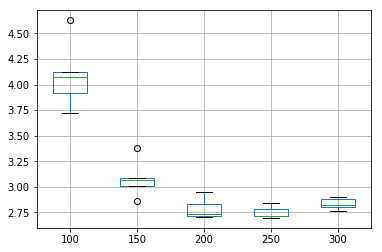

In [75]:
# save boxplot
results.boxplot()
#plt.savefig('YRMSE_LSTM_epoch_boxplot.png')

As observed in the plots earlier XRMSE decreases continuously whereas YRMSE shows increment after 250 epochs. Thus, the LSTM model will be trained for 250 epochs.

## Sufficient Sample Size

In [ ]:
#calculate the results for 32 iterations in order to choose the final sample size required.
timesteps=18
X_RMSE=[]
Y_RMSE=[]

start= time.time()
for i in range(0,60):
    print('Experimental Run: ', i+1)
    
    model_iter = stateful_LSTM(units=30, lr=0.001, batch=128, alpha=0.05)
    
    for j in range(250):
        model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=128, verbose=0, shuffle=False)
        model_iter.reset_states()
    
    Y_pred = model_iter.predict(X_test, batch_size=128)
    model_iter.reset_states()
    
    #invert and calculate RMSE
    xrmse,yrmse= calculate_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    print('XRMSE for ', i+1, 'iterations: ', X_RMSE, '\n')
    Y_RMSE.append(yrmse)
    print('YRMSE for ', i+1, 'iterations: ', Y_RMSE)


print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))
end= time.time()
print('Time took :{:3.2f} min'.format((end-start)/60))


In [76]:
#Results of 32 iterations trained above
X_RMSE= [3.807058018238731, 4.016742407339024, 3.498269848765245, 4.465584038502928, 4.33033575212926, 3.7478406045865498, 4.231186011568513, 4.447479209638824, 3.753327748112617, 4.504871346520693, 4.208376635168341, 3.9382587339837625, 3.820165381480231, 3.795496628364005, 3.9373235401804005, 4.981319965830776, 4.145594083554769, 3.6072896255436953, 5.043068332630799, 4.414035040227549, 3.8559756647747103, 4.27285399065034, 3.7557471531184246, 3.4647029124065565, 3.702043693483514, 3.5339919828000355, 4.6981736558193745, 4.845499108221047, 5.1091566031148625, 3.4327899898056424, 4.165184354894991, 4.5721781363245615]
Y_RMSE= [3.841903022889031, 3.568904281129219, 3.6419701879394584, 4.020492585833205, 3.7062008946723406, 4.017005107431353, 3.737712382852174, 3.97591408033326, 3.7576062502253067, 3.5544651155039926, 3.8608873211229238, 3.6824988410339285, 3.425669205024618, 3.596981074769191, 3.7149059580854242, 4.266211883725446, 3.5514040800858497, 3.425508535947137, 3.467435337728842, 3.7053619931621005, 3.490248699984325, 3.597097076029317, 3.899050757113243, 3.4020758040245207, 3.4522608099547645, 3.514690178241147, 3.780794203159965, 3.7420447226790374, 3.818724324117564, 3.2574677642132364, 3.9279744789148725, 4.271221950429978]

print('X_RMSE_SD: ', np.std(X_RMSE))
print('X_RMSE_mean: ', np.mean(X_RMSE))
print('XRMSE_Std_error: ', (np.std(X_RMSE)/math.sqrt(len(X_RMSE))),'\n')

print('Y_RMSE_SD: ', np.std(Y_RMSE))
print('Y_RMSE_mean: ', np.mean(Y_RMSE))
print('YRMSE_Std_error: ', (np.std(Y_RMSE)/math.sqrt(len(Y_RMSE))))

X_RMSE_SD:  0.47109464443396926
X_RMSE_mean:  4.128185006180649
XRMSE_Std_error:  0.08327855441498128 

Y_RMSE_SD:  0.2373851438107322
Y_RMSE_mean:  3.7085215283861492
YRMSE_Std_error:  0.04196416123537813


               0
count  32.000000
mean    4.128185
std     0.478633
min     3.432790
25%     3.755142
50%     4.081168
75%     4.452005
max     5.109157


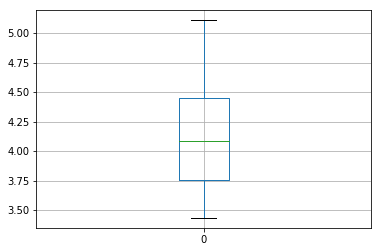

In [77]:
#descriptive stats
XRMSE_df= pd.DataFrame(X_RMSE)
print(XRMSE_df.describe())
# box and whisker plot of model skill- spread of the data
#It shows the middle 50% (box), outliers (dots/+), and the median (green line).
XRMSE_df.boxplot()
plt.show()

               0
count  32.000000
mean    3.708522
std     0.241184
min     3.257468
25%     3.542226
50%     3.705781
75%     3.846649
max     4.271222


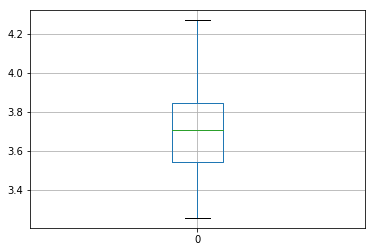

In [78]:
#descriptive stats
YRMSE_df= pd.DataFrame(Y_RMSE)
print(YRMSE_df.describe())
# box and whisker plot of model skill- spread of the data
#It shows the middle 50% (box), outliers (dots/+), and the median (green line).
YRMSE_df.boxplot()
plt.show()

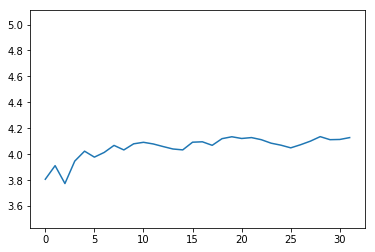

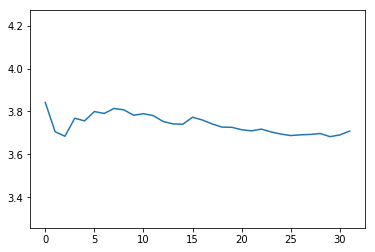

In [79]:
XRMSE_df=pd.DataFrame(X_RMSE[:32])
XRMSE_scores= XRMSE_df.values
XRMSE_mean_list = list()
for i in range(1,len(X_RMSE)+1):
    data = XRMSE_scores[0:i, 0]
    XRMSE_mean = np.mean(data)
    XRMSE_mean_list.append(XRMSE_mean)
# line plot of the values generated in the list
plt.plot(XRMSE_mean_list)
plt.ylim(min(X_RMSE), max(X_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

YRMSE_df=pd.DataFrame(Y_RMSE[:32])
YRMSE_scores= YRMSE_df.values
YRMSE_mean_list = list()
for i in range(1,len(Y_RMSE)+1):
    data = YRMSE_scores[0:i, 0]
    YRMSE_mean = np.mean(data)
    YRMSE_mean_list.append(YRMSE_mean)
# line plot of the values generated in the list
plt.plot(YRMSE_mean_list)
plt.ylim(min(Y_RMSE), max(Y_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

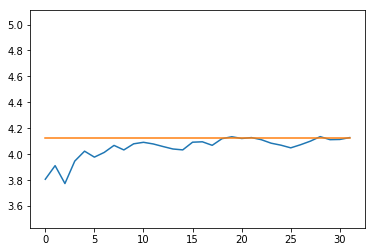

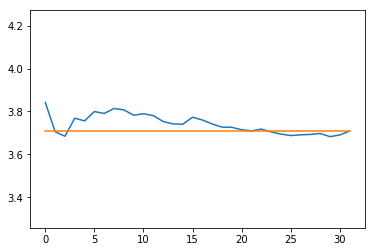

In [80]:
#mean of iterations shown with orange line on top of the above plots.
X_Mean= np.mean(XRMSE_scores)
plt.plot(XRMSE_mean_list)
plt.plot([X_Mean for x in range(len(XRMSE_mean_list))])
plt.ylim(min(X_RMSE), max(X_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

Y_Mean= np.mean(YRMSE_scores)
plt.plot(YRMSE_mean_list)
plt.plot([Y_Mean for x in range(len(YRMSE_mean_list))])
plt.ylim(min(Y_RMSE), max(Y_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

As seen in the plots above, mean value of XRMSE after 19 iterations gets constant upto some 22 iterations but then shows a slight decrease at 25. Finally, it gets stable round 30 iterations.
The mean value of YRMSE stabilizes around 20 iterations. So, considering both the plots and in literature, 30 sample size is considered as the minimum value to determine the skill of the model. Thus, the LSTM model will be trained for a sample size of 30 iterations.

## Model Training and Predictions

In [81]:
#stateless network
#defnition and compilation
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def stateless_LSTM(units,lr,alpha):
    model = Sequential()
    model.add(LSTM(units, return_sequences=False, input_shape=(timesteps,2)))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [30]:
#calling definition and compilation of the stateless model
model_1= stateless_LSTM(units=30, lr=0.001, alpha=0.05)
model_1.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 30)                3960      
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 2)                 0         
Total params: 4,022
Trainable params: 4,022
Non-trainable params: 0
_________________________________________________________________


In [32]:
#fitting the stateless LSTM network
history1= stateless_fit(model_1, X_train, Y_train, X_val, Y_val, batch=128, epochs=250, weights_saved_file= 'weights_1.hdf5', shuffle=True)

Train on 7680 samples, validate on 2560 samples
Epoch 1/250
 - 6s - loss: 0.0396 - rmse: 0.1790 - val_loss: 0.0090 - val_rmse: 0.0949

Epoch 00001: val_loss improved from inf to 0.00904, saving model to weights_1.hdf5
Epoch 2/250
 - 2s - loss: 0.0033 - rmse: 0.0553 - val_loss: 0.0020 - val_rmse: 0.0441

Epoch 00002: val_loss improved from 0.00904 to 0.00197, saving model to weights_1.hdf5
Epoch 3/250
 - 2s - loss: 0.0019 - rmse: 0.0436 - val_loss: 0.0018 - val_rmse: 0.0417

Epoch 00003: val_loss improved from 0.00197 to 0.00176, saving model to weights_1.hdf5
Epoch 4/250
 - 2s - loss: 0.0018 - rmse: 0.0417 - val_loss: 0.0016 - val_rmse: 0.0395

Epoch 00004: val_loss improved from 0.00176 to 0.00158, saving model to weights_1.hdf5
Epoch 5/250
 - 2s - loss: 0.0016 - rmse: 0.0398 - val_loss: 0.0014 - val_rmse: 0.0378

Epoch 00005: val_loss improved from 0.00158 to 0.00144, saving model to weights_1.hdf5
Epoch 6/250
 - 2s - loss: 0.0015 - rmse: 0.0381 - val_loss: 0.0013 - val_rmse: 0.0362


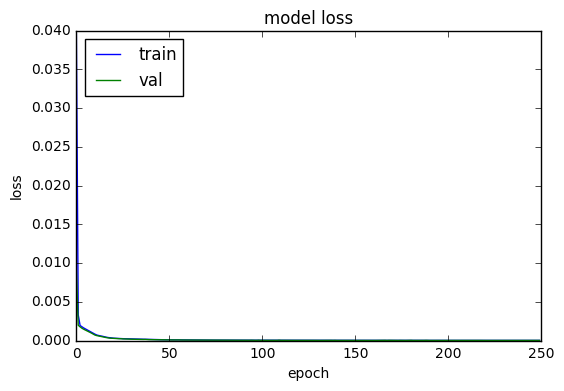

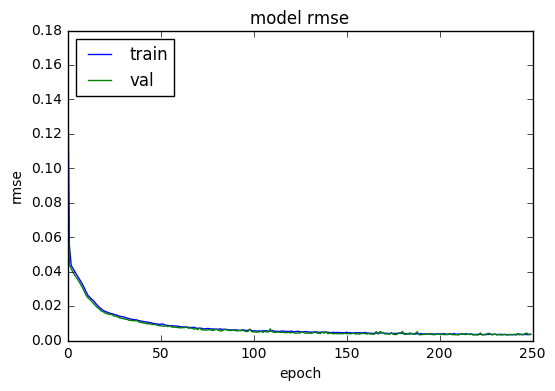

In [36]:
#plotting the loss and accuracy curves w.r.t the number of epochs
stateless_learn_curve(history1)

In [ ]:
weights_saved_file= 'weights_1.hdf5'
model_1.load_weights(weights_saved_file)

In [42]:
#preditcions
Y_Pred_train = model_1.predict(X_train)
Y_Pred_val = model_1.predict(X_val)
Y_Pred_test = model_1.predict(X_test)

In [43]:
#calculate RMSE

xrmse, yrmse= calculate_RMSE(Y_Pred_train, Y_train)
print('Train XRMSE: ', xrmse)
print('YRMSE: ', yrmse, '\n')

xrmse, yrmse= calculate_RMSE(Y_Pred_val, Y_val)
print('Val XRMSE: ', xrmse)
print('YRMSE: ', yrmse, '\n')

xrmse, yrmse= calculate_RMSE(Y_Pred_test, Y_test)
print('Test XRMSE: ', xrmse)
print('YRMSE: ', yrmse)


Train XRMSE:  4.396656958387335
YRMSE:  3.570110685238413 

Val XRMSE:  3.409476562921951
YRMSE:  3.8542622045445607 

Test XRMSE:  3.437985215651318
YRMSE:  3.8633600704424653


In [44]:
#compare Y_test and Y_Pred_test
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [118.51151431 430.49450549]
Y_Pred:  [118.23112 427.8373 ] 

Y_true:  [793.32903715 459.22020725]
Y_Pred:  [794.77295 456.8923 ] 

Y_true:  [641.97040169 511.93164557]
Y_Pred:  [641.362  512.4439] 

Y_true:  [422.33083832 321.88686131]
Y_Pred:  [420.91864 320.52136] 

Y_true:  [1312.50563287   93.32577132]
Y_Pred:  [1314.4718    90.49678] 

Y_true:  [325.91991018 377.84671533]
Y_Pred:  [325.23447 376.03482] 

Y_true:  [330.67723191 307.52031979]
Y_Pred:  [328.7858  308.02454] 

Y_true:  [1048.  483.]
Y_Pred:  [1046.8287   482.43082] 

Y_true:  [749.17696778 380.63957362]
Y_Pred:  [749.9647  377.91055] 

Y_true:  [208.39637125 509.32234432]
Y_Pred:  [208.0952  509.09885] 

Y_true:  [599.07202426 415.31606218]
Y_Pred:  [602.53503 413.28204] 

Y_true:  [569.19281564 426.33910726]
Y_Pred:  [576.4063 425.0055] 

Y_true:  [263.61206897 642.8580402 ]
Y_Pred:  [263.65512 640.40485] 

Y_true:  [1116.7244582   549.37888199]
Y_Pred:  [1119.3438  545.4471] 

Y_true:  [745.17816092 341.753

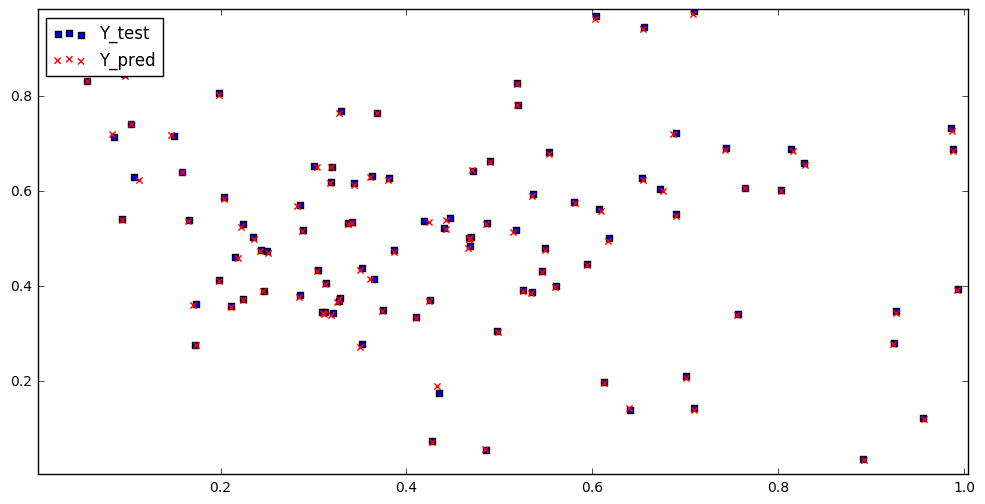

In [46]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)

X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [47]:
#stateless LSTM with shuffle=True for 30 iterations
timesteps=18
sample_size=30
X_RMSE=[]
Y_RMSE=[]

start = time.time()
for i in range(sample_size):
    print('Experimental Run: ', i)
    model_1= stateless_LSTM(units=30, lr=0.001, alpha=0.05)
    
#     es= EarlyStopping(monitor='val_loss', min_delta=0, patience=2, verbose=1, mode='min', restore_best_weights= True)
    model_1.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=250, verbose=0, shuffle=True)
    
    Y_pred = model_1.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

print('X_RMSE: ', X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y_RMSE: ', Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

Experimental Run:  0
Model created and compiled
Experimental Run:  1
Model created and compiled
Experimental Run:  2
Model created and compiled
Experimental Run:  3
Model created and compiled
Experimental Run:  4
Model created and compiled
Experimental Run:  5
Model created and compiled
Experimental Run:  6
Model created and compiled
Experimental Run:  7
Model created and compiled
Experimental Run:  8
Model created and compiled
Experimental Run:  9
Model created and compiled
Experimental Run:  10
Model created and compiled
Experimental Run:  11
Model created and compiled
Experimental Run:  12
Model created and compiled
Experimental Run:  13
Model created and compiled
Experimental Run:  14
Model created and compiled
Experimental Run:  15
Model created and compiled
Experimental Run:  16
Model created and compiled
Experimental Run:  17
Model created and compiled
Experimental Run:  18
Model created and compiled
Experimental Run:  19
Model created and compiled
Experimental Run:  20
Model cr

Since the LSTM networks are stochastic, therefore they will be trained for a sufficient sample size ,i.e., 30 iterations and the mean score of these iterations will determine the skill of the model.

X_RMSE:  [3.8638600138479173, 3.574261893638937, 3.5685337336159053, 3.3049857706187447, 3.929413447300163, 3.58001314003245, 4.1465584414157375, 3.150815439431564, 3.9380041198451443, 3.6053886549765757, 3.2535047670873287, 3.6717613468705617, 3.3249136739786533, 3.7418830812388366, 3.111348895269441, 3.7804031307189714, 3.3714684522628473, 3.476452875480969, 3.4320153585535773, 3.2765560325605, 3.2519551179307578, 3.5354829392467284, 3.185413646585142, 3.2482528942872237, 3.1882447917828953, 3.3546132276365883, 3.26069269943725, 3.6839431321540133, 3.339740635560777, 7.673846704280787]
X-coord RMSE Mean: 3.6274776019215667

Y_RMSE:  [3.7967575704296497, 3.352467503837997, 3.181947846568559, 3.2933562898023343, 3.2655620935881777, 3.3947773264629224, 3.3462674885621624, 3.3553261226138718, 3.4667601501027674, 3.216722128898912, 3.321251763706026, 3.517879558039286, 3.251788332911781, 3.541119597312639, 3.7415296162932465, 3.210569531680233, 3.360293348919051, 3.209140570873333, 3.389475157913727, 3.481695122774026, 3.559455390098346, 3.749080381432609, 3.132506819674828, 4.694896136974012, 3.3142238723335704, 3.345404141549558, 3.4833708665008047, 3.46872533447995, 4.179549502924856, 3.336508018067454]
Y-coord RMSE Mean: 3.465280252844223
Time Took :197.67 min 

In [79]:
#Results after training for 30 iterations
print('Mean XRMSE: ', np.round(3.6274776019215667, 3))
print('Mean YRMSE: ', np.round(3.465280252844223, 3))
print('Average: ', np.round(np.mean([3.6274776019215667,3.465280252844223]),3))

Mean XRMSE:  3.627
Mean YRMSE:  3.465
Average:  3.546


This model is not performing very good. So, next the model is trained with shuffle=Flase

In [30]:
#Definition and Compilation
model_2= stateless_LSTM(units=30, lr=0.001, alpha=0.05)
model_2.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 30)                3960      
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 2)                 0         
Total params: 4,022
Trainable params: 4,022
Non-trainable params: 0
_________________________________________________________________


In [41]:
#training the same model with the shuffle parameter False
history2= stateless_fit(model_2, X_train, Y_train, X_val, Y_val, batch=128, epochs=250, weights_saved_file= 'weights_2.hdf5', shuffle=False)

Train on 7680 samples, validate on 2560 samples
Epoch 1/250
 - 5s - loss: 0.1136 - rmse: 0.3197 - val_loss: 0.0184 - val_rmse: 0.1356

Epoch 00001: val_loss improved from inf to 0.01844, saving model to weights_2.hdf5
Epoch 2/250
 - 2s - loss: 0.0063 - rmse: 0.0756 - val_loss: 0.0025 - val_rmse: 0.0502

Epoch 00002: val_loss improved from 0.01844 to 0.00252, saving model to weights_2.hdf5
Epoch 3/250
 - 2s - loss: 0.0019 - rmse: 0.0435 - val_loss: 0.0017 - val_rmse: 0.0415

Epoch 00003: val_loss improved from 0.00252 to 0.00173, saving model to weights_2.hdf5
Epoch 4/250
 - 2s - loss: 0.0015 - rmse: 0.0388 - val_loss: 0.0016 - val_rmse: 0.0394

Epoch 00004: val_loss improved from 0.00173 to 0.00156, saving model to weights_2.hdf5
Epoch 5/250
 - 2s - loss: 0.0014 - rmse: 0.0373 - val_loss: 0.0015 - val_rmse: 0.0379

Epoch 00005: val_loss improved from 0.00156 to 0.00145, saving model to weights_2.hdf5
Epoch 6/250
 - 2s - loss: 0.0013 - rmse: 0.0359 - val_loss: 0.0013 - val_rmse: 0.0365


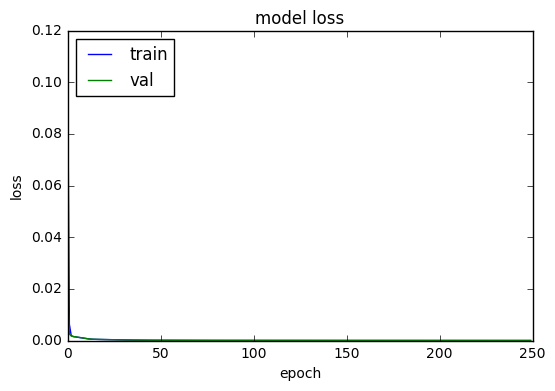

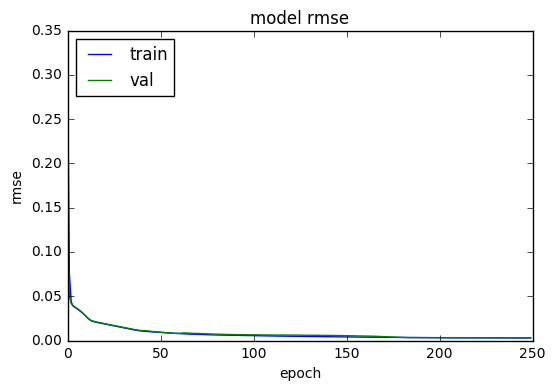

In [43]:
#plotting loss and accuracy curves
stateless_learn_curve(history2)

In [31]:
weights_saved_file= 'weights_2.hdf5'
model_2.load_weights(weights_saved_file)

In [49]:
Y_Pred_train = model_2.predict(X_train)
Y_Pred_val= model_2.predict(X_val)
Y_Pred_test = model_2.predict(X_test)

xrmse,yrmse= calculate_RMSE(Y_Pred_train, Y_train)
print('Train Score (X-coord): ', xrmse)
print('Train Score (Y-coord): ', yrmse)

xrmse,yrmse= calculate_RMSE(Y_Pred_val, Y_val)
print('Val Score (X-coord): ', xrmse)
print('Val Score (Y-coord): ', yrmse)

xrmse,yrmse= calculate_RMSE(Y_Pred_test, Y_test)
print('Test Score (X-coord) unseen data: ', xrmse)
print('Test Score (Y-coord) unseen data: ', yrmse)

Train Score (X-coord):  1.1598713232994793
Train Score (Y-coord):  0.7638590383823893
Val Score (X-coord):  1.1256344188213228
Val Score (Y-coord):  0.9803497417559907
Test Score (X-coord) unseen data:  1.0761722422986038
Test Score (Y-coord) unseen data:  0.7604220274796203


In [50]:
#comparing the true test values and the preicted values
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [226.48988137 599.81196581]
Y_Pred:  [227.53621 599.6036 ] 

Y_true:  [390.90978014 595.5984456 ]
Y_Pred:  [391.80466 595.3043 ] 

Y_true:  [296.17195208 547.84303797]
Y_Pred:  [296.88995 546.27966] 

Y_true:  [207.21482036 519.36253041]
Y_Pred:  [207.55263 519.6675 ] 

Y_true:  [381.45725646 500.53176044]
Y_Pred:  [380.02838 500.2922 ] 

Y_true:  [199.8742515  520.30778589]
Y_Pred:  [200.61989 519.89044] 

Y_true:  [377.06867406 440.41239174]
Y_Pred:  [377.64304 439.6591 ] 

Y_true:  [364.32924188 570.38289963]
Y_Pred:  [363.9746 572.7396] 

Y_true:  [351.65874274 497.87208528]
Y_Pred:  [351.5956  497.95627] 

Y_true:  [247.67271458 569.76923077]
Y_Pred:  [248.01453 569.3972 ] 

Y_true:  [173.51933283 546.61658031]
Y_Pred:  [174.63309 546.7628 ] 

Y_true:  [307.25303751 527.37841439]
Y_Pred:  [308.14276 527.50903] 

Y_true:  [369.38433908 547.04648241]
Y_Pred:  [369.8705  547.11316] 

Y_true:  [261.40170279 537.66956522]
Y_Pred:  [262.43387 537.86084] 

Y_true:  [196.27227011

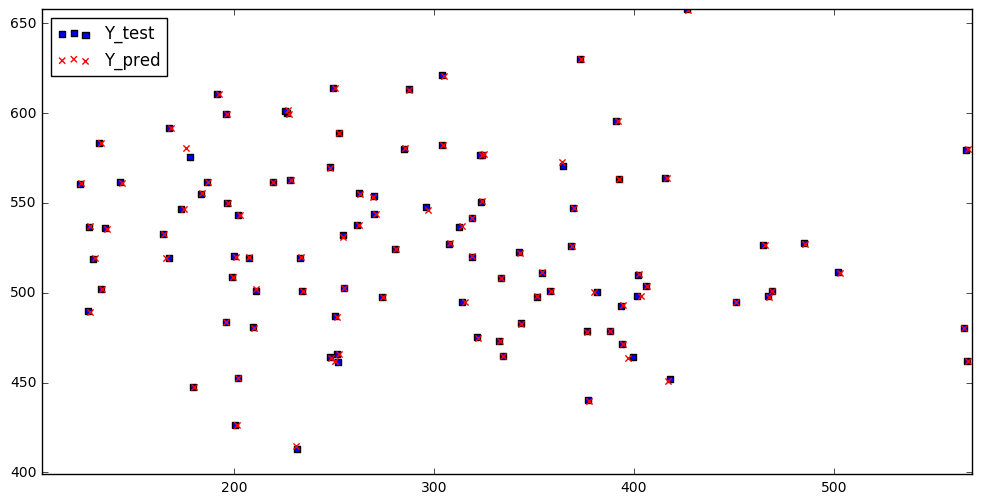

In [51]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)

X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [50]:
#stateless LSTM with shuffle=False for 30 iterations
timesteps=18
sample_size=30
X_RMSE=[]
Y_RMSE=[]

start = time.time()
for i in range(sample_size):
    print('Experimental Run: ', i)
    model_2= stateless_LSTM(units=30, lr=0.001, alpha=0.05)
    
    model_2.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=250, verbose=0, shuffle=False)
    
    Y_pred = model_2.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

print('X_RMSE: ', X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y_RMSE: ', Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

Experimental Run:  0
Model created and compiled
Experimental Run:  1
Model created and compiled
Experimental Run:  2
Model created and compiled
Experimental Run:  3
Model created and compiled
Experimental Run:  4
Model created and compiled
Experimental Run:  5
Model created and compiled
Experimental Run:  6
Model created and compiled
Experimental Run:  7
Model created and compiled
Experimental Run:  8
Model created and compiled
Experimental Run:  9
Model created and compiled
Experimental Run:  10
Model created and compiled
Experimental Run:  11
Model created and compiled
Experimental Run:  12
Model created and compiled
Experimental Run:  13
Model created and compiled
Experimental Run:  14
Model created and compiled
Experimental Run:  15
Model created and compiled
Experimental Run:  16
Model created and compiled
Experimental Run:  17
Model created and compiled
Experimental Run:  18
Model created and compiled
Experimental Run:  19
Model created and compiled
Experimental Run:  20
Model cr

X_RMSE:  [3.132884106657178, 2.899236451903749, 2.7775605990038765, 2.7197092325489587, 2.739128583343533, 2.882740831161837, 3.4441802619708337, 2.9431993095044207, 2.6785961053019562, 2.9993886996187933, 3.0136683755473883, 3.169546668213932, 2.8141541099087592, 3.1514438588964526, 2.9475300048675175, 3.4560114409237173, 2.9217318269005927, 3.8593901634907932, 3.1662973654589623, 3.4300809889414094, 2.950265128893893, 4.020759499395279, 3.0034136150684, 3.3377640101646944, 3.1801293892197133, 3.184609627841138, 2.874834389655929, 2.854522194252458, 3.3665059379489524, 3.2065160076356873]
X-coord RMSE Mean: 3.104193292808027

Y_RMSE:  [2.7036203466855513, 3.5692666256642354, 3.5438625246076545, 2.861221612718203, 3.0635244572964453, 3.251024408265661, 3.0673900641573644, 3.104137715913639, 3.505972596575025, 2.9524093650211247, 3.3127966516297986, 3.7532142657446284, 3.2579144489629868, 3.435071643344412, 3.4171803115750046, 3.08557116735353, 3.2955633112746563, 2.9366414793468096, 3.510459767521567, 3.606878615551585, 2.972126986392119, 3.342037728940476, 2.9754661818689447, 3.5578596760688486, 3.285400419094562, 3.3146954116562504, 3.1493764020113955, 3.1051193706151166, 3.1305218591197357, 3.8125291075049916]
Y-coord RMSE Mean: 3.262628484082744
Time Took :201.03 min

In [80]:
#Results after trainng fro 30 iterations
print('Mean XRMSE: ', np.round(3.104193292808027, 3))
print('Mean YRMSE: ', np.round(3.262628484082744, 3))
print('Average: ', np.round(np.mean([3.104193292808027,3.262628484082744]),3))

Mean XRMSE:  3.104
Mean YRMSE:  3.263
Average:  3.183


From the results above, it can be seen that Model-2 (Stateless LSTM with 1 hidden layer) with shuffle=False performs better than Model-1 with shuffle=True.

Still, the RMSE is large and needs to be improved. Stacked LSTMs ,i.e. LSTM's having more than 1 hidden layer are known to learn complex problems better than simple LSTMs. So, lets add one more layer and check the performance of the model.

In [83]:
#stateles stacked model with 2 hidden layers
timesteps=18
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def stacked_stateless_LSTM(units, lr, alpha):
    model = Sequential()
    model.add(LSTM(units, return_sequences=True, input_shape=(timesteps,2)))
    model.add(LSTM(units, return_sequences=False))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [84]:
model_3=stacked_stateless_LSTM(30,0.001,0.05)
model_3.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 18, 30)            3960      
_________________________________________________________________
lstm_2 (LSTM)                (None, 30)                7320      
_________________________________________________________________
dense_6 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 2)                 0         
Total params: 11,342
Trainable params: 11,342
Non-trainable params: 0
_________________________________________________________________


In [86]:
history3= stateless_fit(model_3, X_train, Y_train, X_val, Y_val, batch=128, epochs= 250, weights_saved_file='weights_3.hdf5', shuffle=False)

Train on 7680 samples, validate on 2560 samples
Epoch 1/250
 - 6s - loss: 0.0651 - rmse: 0.2164 - val_loss: 0.0049 - val_rmse: 0.0702

Epoch 00001: val_loss improved from inf to 0.00494, saving model to weights_3.hdf5
Epoch 2/250
 - 4s - loss: 0.0035 - rmse: 0.0583 - val_loss: 0.0025 - val_rmse: 0.0502

Epoch 00002: val_loss improved from 0.00494 to 0.00255, saving model to weights_3.hdf5
Epoch 3/250
 - 4s - loss: 0.0024 - rmse: 0.0484 - val_loss: 0.0022 - val_rmse: 0.0469

Epoch 00003: val_loss improved from 0.00255 to 0.00222, saving model to weights_3.hdf5
Epoch 4/250
 - 4s - loss: 0.0022 - rmse: 0.0461 - val_loss: 0.0020 - val_rmse: 0.0449

Epoch 00004: val_loss improved from 0.00222 to 0.00204, saving model to weights_3.hdf5
Epoch 5/250
 - 4s - loss: 0.0020 - rmse: 0.0441 - val_loss: 0.0019 - val_rmse: 0.0430

Epoch 00005: val_loss improved from 0.00204 to 0.00187, saving model to weights_3.hdf5
Epoch 6/250
 - 4s - loss: 0.0018 - rmse: 0.0420 - val_loss: 0.0017 - val_rmse: 0.0409



Epoch 00046: val_loss improved from 0.00010 to 0.00010, saving model to weights_3.hdf5
Epoch 47/250
 - 4s - loss: 1.1654e-04 - rmse: 0.0104 - val_loss: 9.1442e-05 - val_rmse: 0.0094

Epoch 00047: val_loss improved from 0.00010 to 0.00009, saving model to weights_3.hdf5
Epoch 48/250
 - 4s - loss: 1.1038e-04 - rmse: 0.0101 - val_loss: 8.9973e-05 - val_rmse: 0.0093

Epoch 00048: val_loss improved from 0.00009 to 0.00009, saving model to weights_3.hdf5
Epoch 49/250
 - 4s - loss: 1.0556e-04 - rmse: 0.0099 - val_loss: 8.9465e-05 - val_rmse: 0.0093

Epoch 00049: val_loss improved from 0.00009 to 0.00009, saving model to weights_3.hdf5
Epoch 50/250
 - 4s - loss: 1.0319e-04 - rmse: 0.0097 - val_loss: 8.7424e-05 - val_rmse: 0.0092

Epoch 00050: val_loss improved from 0.00009 to 0.00009, saving model to weights_3.hdf5
Epoch 51/250
 - 4s - loss: 1.0208e-04 - rmse: 0.0097 - val_loss: 7.9824e-05 - val_rmse: 0.0088

Epoch 00051: val_loss improved from 0.00009 to 0.00008, saving model to weights_3.hd

 - 4s - loss: 4.2095e-05 - rmse: 0.0060 - val_loss: 4.4458e-05 - val_rmse: 0.0066

Epoch 00094: val_loss improved from 0.00005 to 0.00004, saving model to weights_3.hdf5
Epoch 95/250
 - 4s - loss: 4.1473e-05 - rmse: 0.0059 - val_loss: 4.3814e-05 - val_rmse: 0.0066

Epoch 00095: val_loss improved from 0.00004 to 0.00004, saving model to weights_3.hdf5
Epoch 96/250
 - 4s - loss: 4.0960e-05 - rmse: 0.0059 - val_loss: 4.3025e-05 - val_rmse: 0.0065

Epoch 00096: val_loss improved from 0.00004 to 0.00004, saving model to weights_3.hdf5
Epoch 97/250
 - 4s - loss: 4.0331e-05 - rmse: 0.0058 - val_loss: 4.2062e-05 - val_rmse: 0.0065

Epoch 00097: val_loss improved from 0.00004 to 0.00004, saving model to weights_3.hdf5
Epoch 98/250
 - 4s - loss: 3.9674e-05 - rmse: 0.0057 - val_loss: 4.1361e-05 - val_rmse: 0.0064

Epoch 00098: val_loss improved from 0.00004 to 0.00004, saving model to weights_3.hdf5
Epoch 99/250
 - 4s - loss: 3.8996e-05 - rmse: 0.0057 - val_loss: 4.1293e-05 - val_rmse: 0.0064

Ep


Epoch 00140: val_loss improved from 0.00002 to 0.00002, saving model to weights_3.hdf5
Epoch 141/250
 - 4s - loss: 2.8283e-05 - rmse: 0.0046 - val_loss: 2.2929e-05 - val_rmse: 0.0048

Epoch 00141: val_loss did not improve from 0.00002
Epoch 142/250
 - 4s - loss: 2.8221e-05 - rmse: 0.0046 - val_loss: 2.2814e-05 - val_rmse: 0.0048

Epoch 00142: val_loss did not improve from 0.00002
Epoch 143/250
 - 4s - loss: 2.8202e-05 - rmse: 0.0046 - val_loss: 2.2149e-05 - val_rmse: 0.0047

Epoch 00143: val_loss improved from 0.00002 to 0.00002, saving model to weights_3.hdf5
Epoch 144/250
 - 4s - loss: 2.8172e-05 - rmse: 0.0046 - val_loss: 2.1491e-05 - val_rmse: 0.0046

Epoch 00144: val_loss improved from 0.00002 to 0.00002, saving model to weights_3.hdf5
Epoch 145/250
 - 4s - loss: 2.8175e-05 - rmse: 0.0046 - val_loss: 2.0384e-05 - val_rmse: 0.0045

Epoch 00145: val_loss improved from 0.00002 to 0.00002, saving model to weights_3.hdf5
Epoch 146/250
 - 5s - loss: 2.8055e-05 - rmse: 0.0046 - val_loss


Epoch 00191: val_loss improved from 0.00002 to 0.00002, saving model to weights_3.hdf5
Epoch 192/250
 - 4s - loss: 2.2067e-05 - rmse: 0.0039 - val_loss: 1.5066e-05 - val_rmse: 0.0039

Epoch 00192: val_loss improved from 0.00002 to 0.00002, saving model to weights_3.hdf5
Epoch 193/250
 - 4s - loss: 2.2071e-05 - rmse: 0.0039 - val_loss: 1.4863e-05 - val_rmse: 0.0038

Epoch 00193: val_loss improved from 0.00002 to 0.00001, saving model to weights_3.hdf5
Epoch 194/250
 - 4s - loss: 2.1931e-05 - rmse: 0.0039 - val_loss: 1.4541e-05 - val_rmse: 0.0038

Epoch 00194: val_loss improved from 0.00001 to 0.00001, saving model to weights_3.hdf5
Epoch 195/250
 - 4s - loss: 2.1905e-05 - rmse: 0.0039 - val_loss: 1.4340e-05 - val_rmse: 0.0038

Epoch 00195: val_loss improved from 0.00001 to 0.00001, saving model to weights_3.hdf5
Epoch 196/250
 - 4s - loss: 2.1720e-05 - rmse: 0.0038 - val_loss: 1.4061e-05 - val_rmse: 0.0037

Epoch 00196: val_loss improved from 0.00001 to 0.00001, saving model to weights


Epoch 00239: val_loss improved from 0.00001 to 0.00001, saving model to weights_3.hdf5
Epoch 240/250
 - 4s - loss: 2.0051e-05 - rmse: 0.0036 - val_loss: 9.6698e-06 - val_rmse: 0.0030

Epoch 00240: val_loss improved from 0.00001 to 0.00001, saving model to weights_3.hdf5
Epoch 241/250
 - 4s - loss: 2.0003e-05 - rmse: 0.0036 - val_loss: 9.3132e-06 - val_rmse: 0.0030

Epoch 00241: val_loss improved from 0.00001 to 0.00001, saving model to weights_3.hdf5
Epoch 242/250
 - 4s - loss: 1.9993e-05 - rmse: 0.0036 - val_loss: 8.7863e-06 - val_rmse: 0.0029

Epoch 00242: val_loss improved from 0.00001 to 0.00001, saving model to weights_3.hdf5
Epoch 243/250
 - 4s - loss: 1.9929e-05 - rmse: 0.0036 - val_loss: 8.6116e-06 - val_rmse: 0.0029

Epoch 00243: val_loss improved from 0.00001 to 0.00001, saving model to weights_3.hdf5
Epoch 244/250
 - 4s - loss: 1.9922e-05 - rmse: 0.0036 - val_loss: 8.6755e-06 - val_rmse: 0.0029

Epoch 00244: val_loss did not improve from 0.00001
Epoch 245/250
 - 4s - loss: 

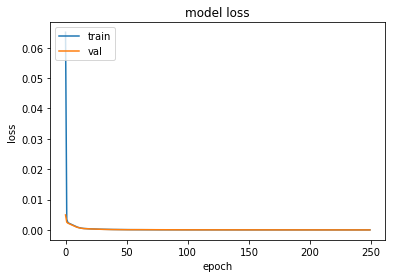

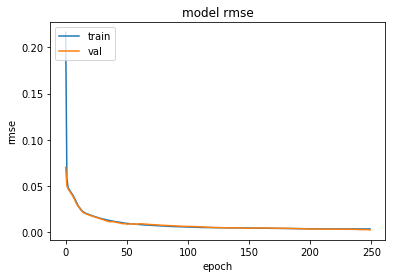

In [87]:
stateless_learn_curve(history3)

In [ ]:
weights_saved_file= 'weights_3.hdf5'
model_3.load_weights(weights_saved_file)

In [88]:
Y_Pred_test = model_3.predict(X_test)
print(Y_Pred_test)

[[0.7147791  0.72485656]
 [0.07931648 0.4784439 ]
 [0.94261277 0.50955254]
 ...
 [0.44936013 0.3797039 ]
 [0.46507993 0.4487043 ]
 [0.3626557  0.82294554]]


In [89]:
#calculate RMSE
xrmse, yrmse= calculate_RMSE(Y_Pred_test, Y_test)

print('Test Score (X-coord) (unseen data): ', xrmse)
print('Test Score (Y-coord) (unseen data): ', yrmse)

Test Score (X-coord) (unseen data):  2.943007466451484
Test Score (Y-coord) (unseen data):  2.437033810538425


In [90]:
#comparing the true test values and the preicted values
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [980.63293789 578.2967033 ]
Y_Pred:  [978.969  577.9592] 

Y_true:  [ 99.25398029 378.72927461]
Y_Pred:  [ 98.85333 379.10422] 

Y_true:  [1297.86892178  404.6721519 ]
Y_Pred:  [1294.5187   404.20892] 

Y_true:  [466.90793413 358.21167883]
Y_Pred:  [466.82877 357.79694] 

Y_true:  [781.0841617  528.31488203]
Y_Pred:  [779.3383 527.9334] 

Y_true:  [ 27.35703593 345.44890511]
Y_Pred:  [ 26.864618 347.2785  ] 

Y_true:  [462.37295298 473.65156562]
Y_Pred:  [461.69235 472.85822] 

Y_true:  [1131.  344.]
Y_Pred:  [1128.163    344.24063] 

Y_true:  [656.25832013 350.53164557]
Y_Pred:  [656.19934 352.64127] 

Y_true:  [ 50.85624564 537.8974359 ]
Y_Pred:  [ 52.124363 538.07574 ] 

Y_true:  [803.82941622 468.62823834]
Y_Pred:  [801.9353 469.7404] 

Y_true:  [357.74801902 482.25383078]
Y_Pred:  [356.15005 486.50723] 

Y_true:  [304.4058908  618.52638191]
Y_Pred:  [303.54153 616.6003 ] 

Y_true:  [1079.20510836  320.81242236]
Y_Pred:  [1076.7589   320.48148] 

Y_true:  [1063.56896552  2

Y_Pred:  [414.12985 567.65857] 

Y_true:  [296.88848921 211.21938776]
Y_Pred:  [296.212   212.20883] 

Y_true:  [1365.  358.]
Y_Pred:  [1361.0502   357.53674] 

Y_true:  [329.20935101 275.79487179]
Y_Pred:  [328.2571  275.12537] 

Y_true:  [862.58161648 259.13257828]
Y_Pred:  [858.0253  258.37772] 

Y_true:  [1006.08854668   72.12996109]
Y_Pred:  [1000.1123    72.70374] 

Y_true:  [408.44665341 250.03901996]
Y_Pred:  [418.65872 255.55182] 

Y_true:  [977.44955098 461.82345103]
Y_Pred:  [975.95105 462.16165] 

Y_true:  [365.31362275 200.14963504]
Y_Pred:  [362.46088 200.17142] 

Y_true:  [677.47596408 340.85409727]
Y_Pred:  [675.13043 340.6863 ] 

Y_true:  [861.07686335 509.984375  ]
Y_Pred:  [859.42694 511.41995] 

Y_true:  [1129.63127311  123.10926049]
Y_Pred:  [1131.0112   124.47319] 

Y_true:  [1148.46336047  359.62663185]
Y_Pred:  [1146.4211   359.47147] 

Y_true:  [504.20331325 359.72265625]
Y_Pred:  [510.28842 360.69556] 

Y_true:  [310.92287375 350.53164557]
Y_Pred:  [308.7228 3

Y_true:  [559.681458   273.11125916]
Y_Pred:  [556.79    272.21225] 

Y_true:  [908.66202783 348.16787659]
Y_Pred:  [903.27216 351.8475 ] 

Y_true:  [421.8125     187.65326633]
Y_Pred:  [420.2143  186.63452] 

Y_true:  [795.27047015 482.79147235]
Y_Pred:  [791.26855 481.1288 ] 

Y_true:  [ 59.55478018 493.55677656]
Y_Pred:  [ 60.883312 493.81213 ] 

Y_true:  [782.10089805 239.77748168]
Y_Pred:  [778.65454 238.50995] 

Y_true:  [1368.74981046  130.98445596]
Y_Pred:  [1364.9691   131.19582] 

Y_true:  [943.79397781 158.05596269]
Y_Pred:  [940.9017  156.95996] 

Y_true:  [750.69874167  67.8002611 ]
Y_Pred:  [749.6255    65.819405] 

Y_true:  [840.58074299 640.0634715 ]
Y_Pred:  [838.45245 638.86456] 

Y_true:  [104.01395673 501.43956044]
Y_Pred:  [104.16861 501.69666] 

Y_true:  [387.01373481 486.55496336]
Y_Pred:  [386.7106 486.1667] 

Y_true:  [126.30028874  95.99455253]
Y_Pred:  [115.754166  84.44187 ] 

Y_true:  [167.61522199 759.13924051]
Y_Pred:  [169.09845 760.744  ] 

Y_true:  [59

Y_Pred:  [  4.07285 670.1006 ] 

Y_true:  [785.75911252 331.17654897]
Y_Pred:  [784.3802  330.83167] 

Y_true:  [428.71737982 303.21918721]
Y_Pred:  [428.20398 306.43634] 

Y_true:  [169.42931162 223.72193211]
Y_Pred:  [179.57268 228.62665] 

Y_true:  [364.21095485 382.75547445]
Y_Pred:  [363.65274 382.45343] 

Y_true:  [495.29688325 469.35043304]
Y_Pred:  [491.61844 472.41855] 

Y_true:  [468.22609614 322.03664224]
Y_Pred:  [466.6544  322.64597] 

Y_true:  [114.07031828 506.06657963]
Y_Pred:  [115.24901 503.8163 ] 

Y_true:  [312.25553417 202.75719844]
Y_Pred:  [312.015   205.18289] 

Y_true:  [802.5868991  487.09260493]
Y_Pred:  [803.3179  489.45038] 

Y_true:  [283.41616766 283.59854015]
Y_Pred:  [283.3575 282.4151] 

Y_true:  [571.80181438 676.83150183]
Y_Pred:  [570.44165 675.68054] 

Y_true:  [939.19755747 444.14949749]
Y_Pred:  [940.4766  441.29114] 

Y_true:  [629.18753302 381.17721519]
Y_Pred:  [626.2764  380.29205] 

Y_true:  [789.34459907 247.10980036]
Y_Pred:  [788.0217  24


Y_true:  [242.08633094 326.50510204]
Y_Pred:  [242.00574 325.45776] 

Y_true:  [279.5316092  345.80904523]
Y_Pred:  [279.6633  341.58594] 

Y_true:  [542.85367142 280.1005996 ]
Y_Pred:  [540.7662  279.01028] 

Y_true:  [176.59674923 324.82236025]
Y_Pred:  [177.38066 323.22375] 

Y_true:  [575.77760169 380.63957362]
Y_Pred:  [573.7253  378.83014] 

Y_true:  [338.72530375 291.39107262]
Y_Pred:  [337.56494 288.62354] 

Y_true:  [1055.6091954   407.65201005]
Y_Pred:  [1053.511    407.72778] 

Y_true:  [257.68806699 510.30769231]
Y_Pred:  [257.1423  510.15125] 

Y_true:  [492.37031167 339.24117255]
Y_Pred:  [490.1218  338.99026] 

Y_true:  [213.8674619  178.27313975]
Y_Pred:  [214.19525 179.74355] 

Y_true:  [882.33597464 359.6715523 ]
Y_Pred:  [880.3191  358.89926] 

Y_true:  [784.29582673 109.13057961]
Y_Pred:  [780.66534 107.80316] 

Y_true:  [586.02060222 208.59427049]
Y_Pred:  [583.7874 208.3126] 

Y_true:  [993.54569466 109.13057961]
Y_Pred:  [992.27545 108.80109] 

Y_true:  [276.264

Y_Pred:  [568.9618  405.84473] 

Y_true:  [724.30110935 460.21052632]
Y_Pred:  [721.3359 460.3813] 

Y_true:  [545.53272377 751.64280156]
Y_Pred:  [545.86163 748.77496] 

Y_true:  [1151.46300211  303.54177215]
Y_Pred:  [1149.0436   303.52954] 

Y_true:  [856.72847332 163.97001999]
Y_Pred:  [852.98224 166.39856] 

Y_true:  [  6.42783124 185.79503916]
Y_Pred:  [  6.4980135 184.46677  ] 

Y_true:  [273.99629904 743.10966057]
Y_Pred:  [273.6963  741.78217] 

Y_true:  [228.79425466 356.5703125 ]
Y_Pred:  [233.71225 358.1356 ] 

Y_true:  [889.38767396 239.05444646]
Y_Pred:  [886.70575 237.93654] 

Y_true:  [332.87216059 149.99133911]
Y_Pred:  [328.0268 151.2714] 

Y_true:  [1326.24137931   49.77386935]
Y_Pred:  [1322.5182    49.32893] 

Y_true:  [446.1744012  237.45620438]
Y_Pred:  [447.7826  237.28375] 

Y_true:  [219.99441731 364.47619048]
Y_Pred:  [222.2498 363.7404] 

Y_true:  [364.19349845 316.80248447]
Y_Pred:  [360.12183 319.74704] 

Y_true:  [363.1091954  543.50376884]
Y_Pred:  [362.

Y_Pred:  [607.4491  450.69116] 

Y_true:  [491.46048851  47.74623116]
Y_Pred:  [487.5609    48.071136] 

Y_true:  [873.71872687 564.01044386]
Y_Pred:  [872.6957  565.31903] 

Y_true:  [301.41151611 425.26382412]
Y_Pred:  [300.17383 423.94037] 

Y_true:  [804.05018489 290.31578947]
Y_Pred:  [801.9398  289.86224] 

Y_true:  [825. 527.]
Y_Pred:  [823.52637 527.94666] 

Y_true:  [924.03961965 143.53964024]
Y_Pred:  [920.9576  144.33293] 

Y_true:  [1024.27469625  304.83211193]
Y_Pred:  [1022.14325  304.61777] 

Y_true:  [960.97813121 493.89655172]
Y_Pred:  [957.702   493.87708] 

Y_true:  [713.16500994 228.80217786]
Y_Pred:  [709.53186 228.95825] 

Y_true:  [429.77227011 248.48241206]
Y_Pred:  [427.35086 249.37827] 

Y_true:  [241.72270115 461.38442211]
Y_Pred:  [242.13837 460.76062] 

Y_true:  [421.40095087 460.74816789]
Y_Pred:  [421.12775 458.9338 ] 

Y_true:  [1320.69133975  291.14751958]
Y_Pred:  [1322.7413   290.65585] 

Y_true:  [1101.37787356  427.92839196]
Y_Pred:  [1101.7314  427

Y_Pred:  [1364.6102   155.02303] 

Y_true:  [558.05235255 386.2477314 ]
Y_Pred:  [555.067   387.88913] 

Y_true:  [633.57739039 306.98267821]
Y_Pred:  [633.867   306.90997] 

Y_true:  [929.77203446 337.18330309]
Y_Pred:  [927.42505 337.22763] 

Y_true:  [268.31960921 295.5018315 ]
Y_Pred:  [267.15353 296.168  ] 

Y_true:  [510.46084337 511.03515625]
Y_Pred:  [508.35904 509.53662] 

Y_true:  [275.80346386 548.86328125]
Y_Pred:  [276.42706 550.51404] 

Y_true:  [675.28103539 320.42371752]
Y_Pred:  [675.824   318.07898] 

Y_true:  [631.3824617  425.26382412]
Y_Pred:  [629.15015 428.3135 ] 

Y_true:  [ 52.44332298 528.8984375 ]
Y_Pred:  [ 53.21189 529.3567 ] 

Y_true:  [499.42025862  34.56658291]
Y_Pred:  [491.6201    40.165634] 

Y_true:  [919.4427334  153.77198444]
Y_Pred:  [920.50867 152.69762] 

Y_true:  [702.27983252  81.68131868]
Y_Pred:  [701.4025   81.10911] 

Y_true:  [360.87103594 121.71139241]
Y_Pred:  [359.2821  121.75875] 

Y_true:  [389.2086635  393.54297135]
Y_Pred:  [387.22

Y_true:  [381.16059165 462.3610926 ]
Y_Pred:  [380.12485 462.779  ] 

Y_true:  [1049.2547104   60.003663 ]
Y_Pred:  [1042.6573   56.3794] 

Y_true:  [774.7844691  404.83344437]
Y_Pred:  [772.54517 404.29602] 

Y_true:  [474.11751327 738.32512953]
Y_Pred:  [476.1857  738.81506] 

Y_true:  [180.36775994 332.94505495]
Y_Pred:  [178.58002 330.86472] 

Y_true:  [461.61135057 512.07537688]
Y_Pred:  [459.48477 512.6137 ] 

Y_true:  [1015.81034483  272.81407035]
Y_Pred:  [1013.1901  272.2826] 

Y_true:  [549.97482014 152.54719388]
Y_Pred:  [548.0464  150.28407] 

Y_true:  [358.83359133 453.14037267]
Y_Pred:  [355.51523 453.92404] 

Y_true:  [950.76852743  60.19766537]
Y_Pred:  [949.91907   60.895126] 

Y_true:  [698.69360803 306.98267821]
Y_Pred:  [697.10205 307.45004] 

Y_true:  [754.29846804 384.9407062 ]
Y_Pred:  [752.1615 385.539 ] 

Y_true:  [632.1141046  320.96135909]
Y_Pred:  [632.5931  320.65787] 

Y_true:  [440.35729239 645.3003663 ]
Y_Pred:  [440.5142 644.8235] 

Y_true:  [789.031055

Y_Pred:  [1132.1709  619.8412] 

Y_true:  [425.05916535 405.90872751]
Y_Pred:  [424.7919  404.52243] 

Y_true:  [534.10816469 626.57875458]
Y_Pred:  [532.79626 626.4908 ] 

Y_true:  [792.0980782  435.31215971]
Y_Pred:  [789.562  435.8278] 

Y_true:  [314.81909938 509.984375  ]
Y_Pred:  [314.5736 508.9747] 

Y_true:  [1366.  343.]
Y_Pred:  [1361.1119  342.5445] 

Y_true:  [537.8601723  370.86932849]
Y_Pred:  [535.70795 370.3651 ] 

Y_true:  [681.86582145 262.89606929]
Y_Pred:  [680.63684 262.71494] 

Y_true:  [509.92974115 302.68154564]
Y_Pred:  [509.5565  301.91888] 

Y_true:  [843.46102021 697.00544747]
Y_Pred:  [841.9842 697.8918] 

Y_true:  [718.44796619 391.39240506]
Y_Pred:  [713.428   392.65668] 

Y_true:  [1083.96686547  458.74591652]
Y_Pred:  [1084.8259   457.20764] 

Y_true:  [778. 518.]
Y_Pred:  [776.474   518.80835] 

Y_true:  [462.13664596 514.1875    ]
Y_Pred:  [463.60876 514.16876] 

Y_true:  [296.54996299 319.92335766]
Y_Pred:  [299.8215  319.61926] 

Y_true:  [511.48502

Y_true:  [317.5076598  138.70086609]
Y_Pred:  [314.76846 138.89587] 

Y_true:  [719.91125198 327.95069953]
Y_Pred:  [717.6468 328.086 ] 

Y_true:  [164.35633055 433.08678756]
Y_Pred:  [165.98616 432.86987] 

Y_true:  [49.48482605 89.92428198]
Y_Pred:  [50.006844 92.32833 ] 

Y_true:  [1084.06977863  141.21167315]
Y_Pred:  [1082.2139   142.62895] 

Y_true:  [535.10669317 595.68693285]
Y_Pred:  [532.9282  595.48816] 

Y_true:  [251.81626506 667.6015625 ]
Y_Pred:  [252.37315 666.90497] 

Y_true:  [397.25673534 510.21119254]
Y_Pred:  [392.87384 510.00153] 

Y_true:  [641.06961078 246.2919708 ]
Y_Pred:  [639.88055 246.0249 ] 

Y_true:  [1300.37212644  437.05276382]
Y_Pred:  [1296.87     436.51428] 

Y_true:  [673.62471569 524.03108808]
Y_Pred:  [673.46265 521.6032 ] 

Y_true:  [484.32223983 144.07728181]
Y_Pred:  [480.59473 144.00313] 

Y_true:  [578.25075301 329.25      ]
Y_Pred:  [577.1346 329.2027] 

Y_true:  [959.15847861 289.24050633]
Y_Pred:  [959.55896 288.04434] 

Y_true:  [101.1144

Y_Pred:  [393.13693 350.17703] 

Y_true:  [541.39038563 131.17388408]
Y_Pred:  [538.91754 131.793  ] 

Y_true:  [670.55531609 530.3241206 ]
Y_Pred:  [670.5382  531.86285] 

Y_true:  [850.87533016 297.84277149]
Y_Pred:  [847.79614 297.616  ] 

Y_true:  [522.25712392 324.73411978]
Y_Pred:  [522.2501 324.738 ] 

Y_true:  [699.380321  228.4981685]
Y_Pred:  [698.0858  229.90334] 

Y_true:  [877.94611727 275.79946702]
Y_Pred:  [877.534   275.84653] 

Y_true:  [685.49903754  74.01400778]
Y_Pred:  [681.8809   74.94195] 

Y_true:  [290.26082772  84.69027237]
Y_Pred:  [288.5854   85.04201] 

Y_true:  [738.59830867 433.27468354]
Y_Pred:  [739.4495  437.94095] 

Y_true:  [815.02482831 185.47568288]
Y_Pred:  [812.6181  185.67087] 

Y_true:  [334.75179856 229.74744898]
Y_Pred:  [335.1331  225.01624] 

Y_true:  [131.49814952 476.56788512]
Y_Pred:  [125.35231 475.70117] 

Y_true:  [996.47226624 486.55496336]
Y_Pred:  [994.7127  486.55426] 

Y_true:  [368.98011928 536.37023593]
Y_Pred:  [368.1749 535.9

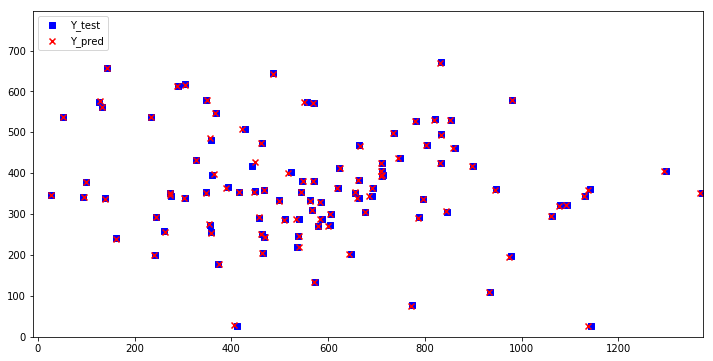

In [91]:
#plot first 100 test values ad their respective predictions
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)

X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [65]:
#Stacked stateless LSTM for 30 iterations with shuffle=False
timesteps=18
sample_size=30
X_RMSE=[]
Y_RMSE=[]

start = time.time()

for i in range(sample_size):
    print('Experimental Run: ', i)
    
    model_3= stacked_stateless_LSTM(30,0.001, 0.05)
    model_3.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=250, verbose=0, shuffle=False)
    
    Y_pred = model_3.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)) +'\n')

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))

Experimental Run:  0
Model created and compiled
Experimental Run:  1
Model created and compiled
Experimental Run:  2
Model created and compiled
Experimental Run:  3
Model created and compiled
Experimental Run:  4
Model created and compiled
Experimental Run:  5
Model created and compiled
Experimental Run:  6
Model created and compiled
Experimental Run:  7
Model created and compiled
Experimental Run:  8
Model created and compiled
Experimental Run:  9
Model created and compiled
Experimental Run:  10
Model created and compiled
Experimental Run:  11
Model created and compiled
Experimental Run:  12
Model created and compiled
Experimental Run:  13
Model created and compiled
Experimental Run:  14
Model created and compiled
Experimental Run:  15
Model created and compiled
Experimental Run:  16
Model created and compiled
Experimental Run:  17
Model created and compiled
Experimental Run:  18
Model created and compiled
Experimental Run:  19
Model created and compiled
Experimental Run:  20
Model cr

[3.4399926063797786, 5.435782332095149, 5.265250157629149, 5.105337301549765, 5.229657889913689, 5.468824057656704, 3.877964326142917, 4.99113459876866, 5.658503080284233, 5.719522119818012, 5.320210585434603, 3.5379749590548766, 5.446521061384451, 3.2185106982171012, 5.8746113699087985, 6.5861495013397, 5.518772750103624, 5.428957979753688, 3.278992580463898, 3.294782227311086, 5.636806838803614, 4.989542769659273, 3.182968573886001, 6.0029679189929075, 5.074994260654921, 4.97556233647181, 5.338687093460414, 5.403882466806617, 5.538179813810882, 5.40903637140223]
X-coord RMSE Mean: 4.975002687571952

[3.4049292872198023, 2.514981362963333, 2.609920582483665, 2.5451275351386338, 2.5608166468379805, 2.6153586712995183, 3.345365225725048, 2.6165729503734068, 2.6211989559814834, 2.5443685560664684, 2.6366319308613, 3.331233203056792, 2.7239030453989352, 3.5648456355785934, 2.5987111537589205, 2.637705174376308, 2.6632829612592657, 2.581523800936629, 3.046565764888689, 2.730198230269043, 2.649733562799886, 2.585393402113828, 3.444896162502161, 2.6852256194586857, 2.8423289500327975, 2.6570708201016027, 2.634247986299084, 2.822099194347487, 2.627655805049405, 2.5865193584986783]
Y-coord RMSE Mean: 2.7809470511892473

Time Took :453.54 min

In [81]:
print('Mean XRMSE: ', np.round(4.975002687571952, 3))
print('Mean YRMSE: ', np.round(2.7809470511892473, 3))
print('Average: ', np.round(np.mean([4.975002687571952,2.7809470511892473]),3))

Mean XRMSE:  4.975
Mean YRMSE:  2.781
Average:  3.878


It does not outperform the model trained before (model-2).

As seen from the evaluation metrics the model has learnt pretty well. But it has learnt to predict the coordinates of one position from a sequence of 18 coordinates. The LSTM networks are stateful. They should be able to learn the whole sequence, but by default the Keras implementation resets the network state after each training batch. Now, we will train stateful LSTMs with the memory being reset after each epoch instead of being reset after each batch.

In this model trained, the m/m of the LSTM is reset after each batch and it is being treated somewhat like a standard MLP. LSTM has the capability to remeber long sequences. So, now the model will be trained by resetting the memory after each epoch, i.e, after it has seen the entire training dataset. This will maintain the memory between the bathces.

Ideally, we want to expose the network to the entire sequence and let it learn the inter-dependencies, rather than us define those dependencies explicitly in the framing of the problem. We can do this in Keras by making the LSTM layers stateful and manually resetting the state of the network at the end of the epoch, which is also the end of the training sequence.
This is truly how the LSTM networks are intended to be used.

In [94]:
model_5= stateful_LSTM(units= 30,lr= 0.001, batch=128, alpha=0.05)
model_5.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (128, 30)                 3960      
_________________________________________________________________
dense_7 (Dense)              (128, 2)                  62        
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (128, 2)                  0         
Total params: 4,022
Trainable params: 4,022
Non-trainable params: 0
_________________________________________________________________


In [96]:
hist_loss, hist_val_loss, hist_acc, hist_val_acc= stateful_fit(model_5, X_train, Y_train, X_val, Y_val, batch_size=128, epochs=250, weights_saved_file='weights_5.hdf5')

Epoch Number:  0
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 0.0024 - rmse: 0.0487 - val_loss: 0.0018 - val_rmse: 0.0421

Epoch 00001: val_loss improved from inf to 0.00179, saving model to weights_5.hdf5
Epoch Number:  1
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 0.0016 - rmse: 0.0396 - val_loss: 0.0014 - val_rmse: 0.0374

Epoch 00001: val_loss improved from 0.00179 to 0.00142, saving model to weights_5.hdf5
Epoch Number:  2
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 0.0014 - rmse: 0.0366 - val_loss: 0.0013 - val_rmse: 0.0355

Epoch 00001: val_loss improved from 0.00142 to 0.00128, saving model to weights_5.hdf5
Epoch Number:  3
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 0.0012 - rmse: 0.0349 - val_loss: 0.0012 - val_rmse: 0.0339

Epoch 00001: val_loss improved from 0.00128 to 0.00116, saving model to weights_5.hdf5
Epoch Number:  4
Train on 7680 samples, validate on 2560


Epoch 00001: val_loss improved from 0.00014 to 0.00013, saving model to weights_5.hdf5
Epoch Number:  34
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.4584e-04 - rmse: 0.0118 - val_loss: 1.2599e-04 - val_rmse: 0.0111

Epoch 00001: val_loss improved from 0.00013 to 0.00013, saving model to weights_5.hdf5
Epoch Number:  35
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.4101e-04 - rmse: 0.0116 - val_loss: 1.2090e-04 - val_rmse: 0.0108

Epoch 00001: val_loss improved from 0.00013 to 0.00012, saving model to weights_5.hdf5
Epoch Number:  36
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.3820e-04 - rmse: 0.0114 - val_loss: 1.1649e-04 - val_rmse: 0.0106

Epoch 00001: val_loss improved from 0.00012 to 0.00012, saving model to weights_5.hdf5
Epoch Number:  37
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.3532e-04 - rmse: 0.0113 - val_loss: 1.1242e-04 - val_rmse: 0.0105

Epoch 00001: va

 - 2s - loss: 6.6295e-05 - rmse: 0.0077 - val_loss: 5.4275e-05 - val_rmse: 0.0073

Epoch 00001: val_loss improved from 0.00006 to 0.00005, saving model to weights_5.hdf5
Epoch Number:  68
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 6.5127e-05 - rmse: 0.0076 - val_loss: 5.3767e-05 - val_rmse: 0.0073

Epoch 00001: val_loss improved from 0.00005 to 0.00005, saving model to weights_5.hdf5
Epoch Number:  69
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 6.3995e-05 - rmse: 0.0075 - val_loss: 5.3313e-05 - val_rmse: 0.0072

Epoch 00001: val_loss improved from 0.00005 to 0.00005, saving model to weights_5.hdf5
Epoch Number:  70
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 6.3046e-05 - rmse: 0.0075 - val_loss: 5.3285e-05 - val_rmse: 0.0072

Epoch 00001: val_loss improved from 0.00005 to 0.00005, saving model to weights_5.hdf5
Epoch Number:  71
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 6.

 - 2s - loss: 3.9741e-05 - rmse: 0.0057 - val_loss: 3.2421e-05 - val_rmse: 0.0057

Epoch 00001: val_loss improved from 0.00003 to 0.00003, saving model to weights_5.hdf5
Epoch Number:  102
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 3.9410e-05 - rmse: 0.0057 - val_loss: 3.1890e-05 - val_rmse: 0.0056

Epoch 00001: val_loss improved from 0.00003 to 0.00003, saving model to weights_5.hdf5
Epoch Number:  103
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 3.9006e-05 - rmse: 0.0056 - val_loss: 3.1440e-05 - val_rmse: 0.0056

Epoch 00001: val_loss improved from 0.00003 to 0.00003, saving model to weights_5.hdf5
Epoch Number:  104
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 3.8643e-05 - rmse: 0.0056 - val_loss: 3.0907e-05 - val_rmse: 0.0055

Epoch 00001: val_loss improved from 0.00003 to 0.00003, saving model to weights_5.hdf5
Epoch Number:  105
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss


Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to weights_5.hdf5
Epoch Number:  135
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 2.6143e-05 - rmse: 0.0044 - val_loss: 1.2863e-05 - val_rmse: 0.0035

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to weights_5.hdf5
Epoch Number:  136
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 2.5980e-05 - rmse: 0.0044 - val_loss: 1.2688e-05 - val_rmse: 0.0035

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to weights_5.hdf5
Epoch Number:  137
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 2.5836e-05 - rmse: 0.0044 - val_loss: 1.2545e-05 - val_rmse: 0.0035

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to weights_5.hdf5
Epoch Number:  138
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 2.5693e-05 - rmse: 0.0044 - val_loss: 1.2475e-05 - val_rmse: 0.0035

Epoch 00001


Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  169
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 2.2232e-05 - rmse: 0.0039 - val_loss: 9.2829e-06 - val_rmse: 0.0030

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to weights_5.hdf5
Epoch Number:  170
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 2.2163e-05 - rmse: 0.0039 - val_loss: 9.2331e-06 - val_rmse: 0.0030

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to weights_5.hdf5
Epoch Number:  171
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 2.2105e-05 - rmse: 0.0039 - val_loss: 9.1583e-06 - val_rmse: 0.0030

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to weights_5.hdf5
Epoch Number:  172
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 2.2044e-05 - rmse: 0.0039 - val_loss: 8.9373e-06 - val_rmse: 0.0029

Epoch 00001: val_loss improved from 0.00001 to 


Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  205
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.9883e-05 - rmse: 0.0036 - val_loss: 8.3006e-06 - val_rmse: 0.0028

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  206
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.9831e-05 - rmse: 0.0036 - val_loss: 8.3068e-06 - val_rmse: 0.0028

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  207
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.9760e-05 - rmse: 0.0036 - val_loss: 8.2875e-06 - val_rmse: 0.0028

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  208
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.9672e-05 - rmse: 0.0036 - val_loss: 8.2627e-06 - val_rmse: 0.0028

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  209
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.9645e-05 - 

 - 2s - loss: 1.8276e-05 - rmse: 0.0034 - val_loss: 7.8280e-06 - val_rmse: 0.0027

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  244
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.8263e-05 - rmse: 0.0034 - val_loss: 7.7955e-06 - val_rmse: 0.0027

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to weights_5.hdf5
Epoch Number:  245
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.8216e-05 - rmse: 0.0034 - val_loss: 7.7496e-06 - val_rmse: 0.0027

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to weights_5.hdf5
Epoch Number:  246
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.8191e-05 - rmse: 0.0034 - val_loss: 7.7549e-06 - val_rmse: 0.0027

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  247
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 1.8157e-05 - rmse: 0.0034 - val_loss: 7.7250e-06 - val_rmse: 0.0027

E

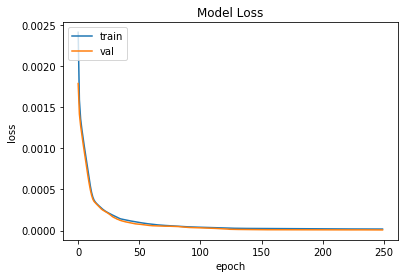

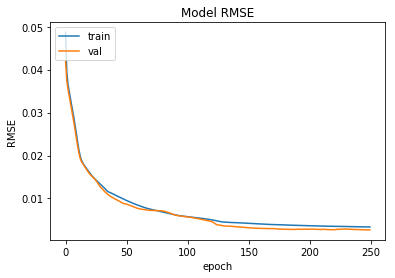

In [97]:
#plot the learning curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_acc, hist_val_acc)

In [ ]:
weights_saved_file='weights_5.hdf5'
model_5.load_weights(weights_saved_file)

In [98]:
# make predictions
Y_Pred_test = model_5.predict(X_test, batch_size=128)
model_5.reset_states()

In [99]:
X_RMSE, Y_RMSE = calculate_RMSE(Y_Pred_test, Y_test)
print('Test Score (X-coord) (unseen data): ', X_RMSE)
print('Test Score (Y-coord) (unseen data): ', Y_RMSE)

Test Score (X-coord) (unseen data):  2.8157987408459855
Test Score (Y-coord) (unseen data):  2.481480794150941


In [100]:
#compare Y_test and Y_Pred_test
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [980.63293789 578.2967033 ]
Y_Pred:  [980.6901 577.3604] 

Y_true:  [ 99.25398029 378.72927461]
Y_Pred:  [ 99.41256 379.4712 ] 

Y_true:  [1297.86892178  404.6721519 ]
Y_Pred:  [1298.4547   404.01474] 

Y_true:  [466.90793413 358.21167883]
Y_Pred:  [467.5323  357.17514] 

Y_true:  [781.0841617  528.31488203]
Y_Pred:  [780.8443 528.0688] 

Y_true:  [ 27.35703593 345.44890511]
Y_Pred:  [ 27.380836 347.53558 ] 

Y_true:  [462.37295298 473.65156562]
Y_Pred:  [462.6536  473.28107] 

Y_true:  [1131.  344.]
Y_Pred:  [1131.329    344.37292] 

Y_true:  [656.25832013 350.53164557]
Y_Pred:  [658.1099 352.6836] 

Y_true:  [ 50.85624564 537.8974359 ]
Y_Pred:  [ 51.224186 538.83777 ] 

Y_true:  [803.82941622 468.62823834]
Y_Pred:  [803.481   468.83508] 

Y_true:  [357.74801902 482.25383078]
Y_Pred:  [355.8868  487.16644] 

Y_true:  [304.4058908  618.52638191]
Y_Pred:  [304.7562 616.9668] 

Y_true:  [1079.20510836  320.81242236]
Y_Pred:  [1079.949   320.3557] 

Y_true:  [1063.56896552  294.1

Y_true:  [830.50541796 440.10807453]
Y_Pred:  [830.5575  442.24213] 

Y_true:  [ 82.29015544 547.154047  ]
Y_Pred:  [ 82.15265 550.44806] 

Y_true:  [313.11780243 379.56429047]
Y_Pred:  [313.58432 380.06836] 

Y_true:  [1041.41337825  298.2155642 ]
Y_Pred:  [1044.032    294.91583] 

Y_true:  [345.19971264 520.18592965]
Y_Pred:  [341.99057 521.9729 ] 

Y_true:  [746.89086687 317.80496894]
Y_Pred:  [745.73376 316.82562] 

Y_true:  [824.53618595 166.12058628]
Y_Pred:  [823.9019  169.24762] 

Y_true:  [705.27839408 303.75682878]
Y_Pred:  [705.6296  304.39783] 

Y_true:  [373.60703593 372.9379562 ]
Y_Pred:  [371.5383  372.62854] 

Y_true:  [904.77959577  99.76264591]
Y_Pred:  [900.7741   97.06065] 

Y_true:  [935.08415466 485.35362694]
Y_Pred:  [938.77106 482.92404] 

Y_true:  [323. 381.]
Y_Pred:  [324.71063 380.8528 ] 

Y_true:  [664.34829721 543.36397516]
Y_Pred:  [664.9513 543.8385] 

Y_true:  [633.51154957 729.03424125]
Y_Pred:  [637.30133 729.49506] 

Y_true:  [509.98297214  12.0472049

Y_true:  [267.75594295 438.70486342]
Y_Pred:  [270.02826 439.06357] 

Y_true:  [581.46685276  53.10622711]
Y_Pred:  [580.8423   56.53976] 

Y_true:  [789.26517795  65.91575092]
Y_Pred:  [790.3184   66.50102] 

Y_true:  [451.39830956 475.80213191]
Y_Pred:  [453.715  476.1747] 

Y_true:  [435.30216587 464.51165889]
Y_Pred:  [436.5296  465.35748] 

Y_true:  [148.14596273 453.2421875 ]
Y_Pred:  [151.14543 454.27496] 

Y_true:  [944.52562071 322.03664224]
Y_Pred:  [944.0847 323.1414] 

Y_true:  [411.36217725 672.89010989]
Y_Pred:  [413.00482 672.6562 ] 

Y_true:  [452.09597523 403.01614907]
Y_Pred:  [454.98495 403.83612] 

Y_true:  [828.89183531  48.17948718]
Y_Pred:  [828.5693    50.454895] 

Y_true:  [765.97665663 533.1015625 ]
Y_Pred:  [767.2925  534.39386] 

Y_true:  [451.35011103 275.74452555]
Y_Pred:  [451.34152 277.02075] 

Y_true:  [808.87315011 536.44810127]
Y_Pred:  [809.2806  537.44006] 

Y_true:  [613.82303222 339.77881412]
Y_Pred:  [612.9439  341.45087] 

Y_true:  [687.78227495

Y_true:  [286.49640805 592.16708543]
Y_Pred:  [287.6917  590.77496] 

Y_true:  [782.10089805 367.19853431]
Y_Pred:  [781.9674  369.75104] 

Y_true:  [323.45820433 522.31180124]
Y_Pred:  [325.6622  522.51697] 

Y_true:  [583. 539.]
Y_Pred:  [584.14105 539.7462 ] 

Y_true:  [510.66138405 424.72618254]
Y_Pred:  [511.1728  425.88882] 

Y_true:  [1068.  447.]
Y_Pred:  [1068.2131  447.6598] 

Y_true:  [549.43845747 479.56562292]
Y_Pred:  [550.0456 480.3895] 

Y_true:  [1067.44162705  229.02465023]
Y_Pred:  [1068.2825   229.96008] 

Y_true:  [ 75.01884159 440.34798535]
Y_Pred:  [ 79.02017 440.1166 ] 

Y_true:  [744.8060014  589.13553114]
Y_Pred:  [745.3029 588.8971] 

Y_true:  [1028.9581298   314.22344322]
Y_Pred:  [1032.4207   313.84595] 

Y_true:  [245.29163583 186.40510949]
Y_Pred:  [247.51633 186.66626] 

Y_true:  [291.16851558 336.01532312]
Y_Pred:  [293.13828 336.9048 ] 

Y_true:  [932.52551359 193.65154265]
Y_Pred:  [933.31476 197.46614] 

Y_true:  [775.51611199 340.3164557 ]
Y_Pred:  

Y_true:  [980.63293789 587.16483516]
Y_Pred:  [980.4642  587.49194] 

Y_true:  [796.83123612 767.60218978]
Y_Pred:  [798.7476  769.06775] 

Y_true:  [264.60704023 261.6620603 ]
Y_Pred:  [264.49634 261.6498 ] 

Y_true:  [1066.11151079  237.98214286]
Y_Pred:  [1066.6945  240.091 ] 

Y_true:  [754.29846804 305.3697535 ]
Y_Pred:  [753.9824  306.24124] 

Y_true:  [511. 655.]
Y_Pred:  [511.84924 655.3924 ] 

Y_true:  [526.18726869 279.67153285]
Y_Pred:  [523.9919  277.79105] 

Y_true:  [331.40562546 556.63577023]
Y_Pred:  [331.39627 557.00323] 

Y_true:  [384.30006978 425.56776557]
Y_Pred:  [385.89957 426.1675 ] 

Y_true:  [1277.00828313   43.4375    ]
Y_Pred:  [1277.9716     44.907146] 

Y_true:  [317.52033133 485.81640625]
Y_Pred:  [320.17776 487.93433] 

Y_true:  [915.99154781 141.38907395]
Y_Pred:  [915.9225 142.042 ] 

Y_true:  [1051.62931034  298.15954774]
Y_Pred:  [1052.7006   299.35016] 

Y_true:  [903.37859195 349.86432161]
Y_Pred:  [900.3854 350.0693] 

Y_true:  [ 90.85367703 499.9


Y_true:  [268.31960921 641.35897436]
Y_Pred:  [267.65515 642.5783 ] 

Y_true:  [642.35710512 374.72551632]
Y_Pred:  [640.9108  375.87787] 

Y_true:  [359.80185553 318.14337568]
Y_Pred:  [360.6182  318.49625] 

Y_true:  [103.03443114 447.55109489]
Y_Pred:  [105.11297 448.94507] 

Y_true:  [283.79489164 654.63975155]
Y_Pred:  [281.76154 655.813  ] 

Y_true:  [1038.  415.]
Y_Pred:  [1036.4277   415.85593] 

Y_true:  [475.54252509 504.83477682]
Y_Pred:  [476.5158  505.08395] 

Y_true:  [815.02482831 265.58427715]
Y_Pred:  [815.1701  266.76022] 

Y_true:  [402.3782356  190.31445703]
Y_Pred:  [403.6094  190.95192] 

Y_true:  [926. 435.]
Y_Pred:  [928.99054 434.46744] 

Y_true:  [1365.  349.]
Y_Pred:  [1365.0405   349.39117] 

Y_true:  [360.13023952 292.43430657]
Y_Pred:  [363.48984 292.93106] 

Y_true:  [444.08188061 277.95003331]
Y_Pred:  [444.21777 276.69733] 

Y_true:  [564.07131537 368.81145903]
Y_Pred:  [563.0442  369.20187] 

Y_true:  [1074.78860172  159.23321234]
Y_Pred:  [1078.9146 

Y_Pred:  [459.83002 442.38   ] 

Y_true:  [1137.20079523  343.77404719]
Y_Pred:  [1137.752   345.3136] 

Y_true:  [295.55837295 155.9053964 ]
Y_Pred:  [298.10336 157.78508] 

Y_true:  [427.72100729 556.14246824]
Y_Pred:  [429.66754 555.4374 ] 

Y_true:  [537.5346487  712.70583658]
Y_Pred:  [541.1136 716.6636] 

Y_true:  [523.83095615 262.89606929]
Y_Pred:  [527.1771  264.00568] 

Y_true:  [504.07659799 302.68154564]
Y_Pred:  [508.42996 302.70554] 

Y_true:  [1331.47383112  410.78754579]
Y_Pred:  [1331.4231   411.85712] 

Y_true:  [740.2033046 397.5138191]
Y_Pred:  [740.91785 397.56967] 

Y_true:  [734.29607698 335.63138686]
Y_Pred:  [737.0649  335.10474] 

Y_true:  [273.99629904 258.0729927 ]
Y_Pred:  [275.04227 258.8233 ] 

Y_true:  [1066.52816435  234.66061706]
Y_Pred:  [1064.9054   234.36963] 

Y_true:  [431.19879518 519.44140625]
Y_Pred:  [431.27625 519.01746] 

Y_true:  [371.38712065 429.87956204]
Y_Pred:  [372.5833 430.532 ] 

Y_true:  [1366.64973465  136.2111399 ]
Y_Pred:  [1367

Y_Pred:  [696.751   384.76788] 

Y_true:  [414.84770115 464.4258794 ]
Y_Pred:  [415.8642  465.17667] 

Y_true:  [145.4352518  425.32142857]
Y_Pred:  [146.33202 430.0944 ] 

Y_true:  [555.95323741 198.86734694]
Y_Pred:  [555.99335 200.07574] 

Y_true:  [867.70311675 159.13124584]
Y_Pred:  [867.72784 160.54768] 

Y_true:  [669.42789223 303.21918721]
Y_Pred:  [670.723   303.92896] 

Y_true:  [1372.00719424  374.88392857]
Y_Pred:  [1372.1146  374.3297] 

Y_true:  [743.52257587 442.85509138]
Y_Pred:  [743.95667 444.93137] 

Y_true:  [771.85789752 275.79946702]
Y_Pred:  [775.97253 276.38535] 

Y_true:  [1030.8594823   377.41372418]
Y_Pred:  [1033.9578   379.34644] 

Y_true:  [844.78089462 568.98056995]
Y_Pred:  [844.525  571.8307] 

Y_true:  [592.18816169 285.65525292]
Y_Pred:  [584.7822  297.24408] 

Y_true:  [542.85367142 439.78014657]
Y_Pred:  [543.9541 441.2307] 

Y_true:  [629.18753302 260.20786143]
Y_Pred:  [628.88025 261.2324 ] 

Y_true:  [976.76227141  74.01400778]
Y_Pred:  [974.6516


Y_true:  [354.2454283  685.70116732]
Y_Pred:  [351.75696 708.778  ] 

Y_true:  [176.60547742 503.95953003]
Y_Pred:  [181.53421 504.5913 ] 

Y_true:  [291.70958084 356.24817518]
Y_Pred:  [293.20685 356.75418] 

Y_true:  [649. 472.]
Y_Pred:  [648.69586 473.32285] 

Y_true:  [575.66782973 210.76190476]
Y_Pred:  [577.7221  210.78581] 

Y_true:  [591.80873494 656.04296875]
Y_Pred:  [595.22894 656.55414] 

Y_true:  [591.87374538 471.50099933]
Y_Pred:  [592.2993  472.20316] 

Y_true:  [226.75994417 484.68864469]
Y_Pred:  [228.41199 485.62247] 

Y_true:  [117. 257.]
Y_Pred:  [120.28763 257.13196] 

Y_true:  [ 67.08315715 619.19113924]
Y_Pred:  [ 70.0015 619.998 ] 

Y_true:  [399.5239521  331.70437956]
Y_Pred:  [400.84784 332.3631 ] 

Y_true:  [763.22360248 596.1484375 ]
Y_Pred:  [764.43976 597.3509 ] 

Y_true:  [368.72266244 348.91872085]
Y_Pred:  [370.41525 349.53955] 

Y_true:  [837.43062926 506.26036269]
Y_Pred:  [837.0402 508.4211] 

Y_true:  [1137.19683908  491.79899497]
Y_Pred:  [1137.3

Y_Pred:  [367.76825 107.676  ] 

Y_true:  [424.89509143 292.56342412]
Y_Pred:  [421.97202 305.11325] 

Y_true:  [392.13523508 500.53364424]
Y_Pred:  [394.20914 501.80612] 

Y_true:  [486.86878882 518.390625  ]
Y_Pred:  [489.91925 520.68805] 

Y_true:  [450.66666667 223.13693467]
Y_Pred:  [452.18616 224.98936] 

Y_true:  [1143.51430723  388.09375   ]
Y_Pred:  [1143.5731   388.97607] 

Y_true:  [283.59576516 462.75564202]
Y_Pred:  [284.24738 463.46927] 

Y_true:  [347.58036574 280.00311284]
Y_Pred:  [349.0494  289.28586] 

Y_true:  [770.0702452  323.26950998]
Y_Pred:  [768.4196  325.57297] 

Y_true:  [430.69225401 352.65201465]
Y_Pred:  [430.9291  353.31934] 

Y_true:  [250.56346749 144.37515528]
Y_Pred:  [252.3099  146.18388] 

Y_true:  [324.37683182 347.72527473]
Y_Pred:  [322.82278 349.04095] 

Y_true:  [728.69096672 303.21918721]
Y_Pred:  [726.3895  304.49005] 

Y_true:  [423.59587956 424.72618254]
Y_Pred:  [426.36008 425.79196] 

Y_true:  [885.76258993 772.20790816]
Y_Pred:  [886.41

Y_Pred:  [322.18314 255.01091] 

Y_true:  [484.49568966 368.11306533]
Y_Pred:  [484.8546  368.65305] 

Y_true:  [1365.0323741   483.99362245]
Y_Pred:  [1363.4515   484.12897] 

Y_true:  [442.61859482 190.8520986 ]
Y_Pred:  [443.43365 192.023  ] 

Y_true:  [354.3384508  576.32600733]
Y_Pred:  [358.64975 576.98193] 

Y_true:  [829.030326   520.89507772]
Y_Pred:  [828.4939  519.32196] 

Y_true:  [657.50577478 107.29883268]
Y_Pred:  [659.82587 109.83134] 

Y_true:  [706.17589083 397.54533679]
Y_Pred:  [704.73883 398.27414] 

Y_true:  [451.33093525 460.31887755]
Y_Pred:  [451.812   461.14417] 

Y_true:  [233.65568862 374.90145985]
Y_Pred:  [233.68098 375.54288] 

Y_true:  [647.19659443 566.42111801]
Y_Pred:  [650.4267  567.15796] 

Y_true:  [428.77729885  45.71859296]
Y_Pred:  [428.44266   48.088684] 

Y_true:  [820. 600.]
Y_Pred:  [820.0799 600.4735] 

Y_true:  [517.977813   415.58627582]
Y_Pred:  [519.58813 416.0493 ] 

Y_true:  [1151.12643678  347.83668342]
Y_Pred:  [1150.6097   348.4475

Y_Pred:  [291.45148 166.17638] 

Y_true:  [133.09805389 534.9270073 ]
Y_Pred:  [134.75163 534.55963] 

Y_true:  [565.03628751 284.66300366]
Y_Pred:  [564.979   285.56302] 

Y_true:  [897.40876437 428.94221106]
Y_Pred:  [891.55115 432.3357 ] 

Y_true:  [1309.33885542  471.10546875]
Y_Pred:  [1310.2373  469.3081] 

Y_true:  [1091.58584258  107.5176549 ]
Y_Pred:  [1089.3491   110.68857] 

Y_true:  [618.18190568 448.31128405]
Y_Pred:  [620.4529  448.82623] 

Y_true:  [368.72266244 256.98201199]
Y_Pred:  [369.1825  257.14172] 

Y_true:  [ 99.18143754 437.39194139]
Y_Pred:  [101.240166 439.85178 ] 

Y_true:  [366.2425409 384.2536965]
Y_Pred:  [367.65994 384.92508] 

Y_true:  [201.7560241 654.9921875]
Y_Pred:  [201.50102 655.7823 ] 

Y_true:  [425.79080824 217.73417722]
Y_Pred:  [428.19992 217.2938 ] 

Y_true:  [543.58531432 503.2218521 ]
Y_Pred:  [541.80615 503.7078 ] 

Y_true:  [755.43754361 511.29304029]
Y_Pred:  [755.4022  512.48694] 

Y_true:  [1029.39619651  111.2811459 ]
Y_Pred:  [1028

Y_true:  [701.49518768 327.73229572]
Y_Pred:  [701.7329  328.85992] 

Y_true:  [394.34056886 349.37591241]
Y_Pred:  [394.93207 351.2332 ] 

Y_true:  [541.39038563 131.17388408]
Y_Pred:  [541.2007  132.56773] 

Y_true:  [670.55531609 530.3241206 ]
Y_Pred:  [672.77185 532.7637 ] 

Y_true:  [850.87533016 297.84277149]
Y_Pred:  [850.0355  299.03555] 

Y_true:  [522.25712392 324.73411978]
Y_Pred:  [524.5159  325.69815] 

Y_true:  [699.380321  228.4981685]
Y_Pred:  [699.52594 231.52837] 

Y_true:  [877.94611727 275.79946702]
Y_Pred:  [880.33105 276.85928] 

Y_true:  [685.49903754  74.01400778]
Y_Pred:  [684.871   75.6806] 

Y_true:  [290.26082772  84.69027237]
Y_Pred:  [291.64716  86.06592] 

Y_true:  [738.59830867 433.27468354]
Y_Pred:  [744.7233  437.75827] 

Y_true:  [815.02482831 185.47568288]
Y_Pred:  [814.6152  187.46066] 

Y_true:  [334.75179856 229.74744898]
Y_Pred:  [337.3555  225.84259] 

Y_true:  [131.49814952 476.56788512]
Y_Pred:  [126.649315 477.2924  ] 

Y_true:  [996.47226624

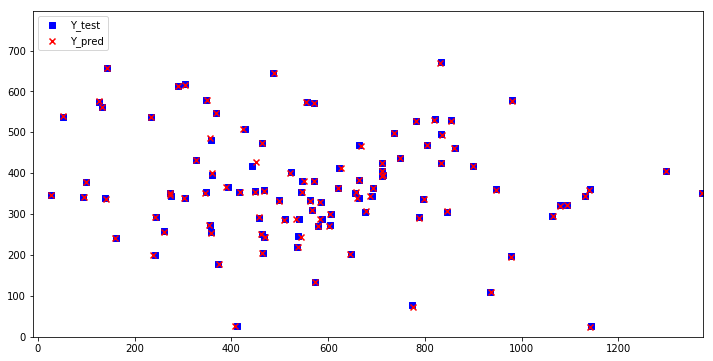

In [101]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)

X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [52]:
#stateful simple LSTM
timesteps=18
sample_size=30
X_RMSE=[]
Y_RMSE=[]

start= time.time()

for i in range(sample_size):
    print('Experimental Run: ', i)
    model= stateful_LSTM(units= 30,lr= 0.001, batch=128, alpha= 0.05)
    
    for j in range(250):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=128, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_pred = model.predict(X_test, batch_size=128)
    model.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE))+ '\n')

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

Experimental Run:  0
Model created and compiled
Experimental Run:  1
Model created and compiled
Experimental Run:  2
Model created and compiled
Experimental Run:  3
Model created and compiled
Experimental Run:  4
Model created and compiled
Experimental Run:  5
Model created and compiled
Experimental Run:  6
Model created and compiled
Experimental Run:  7
Model created and compiled
Experimental Run:  8
Model created and compiled
Experimental Run:  9
Model created and compiled
Experimental Run:  10
Model created and compiled
Experimental Run:  11
Model created and compiled
Experimental Run:  12
Model created and compiled
Experimental Run:  13
Model created and compiled
Experimental Run:  14
Model created and compiled
Experimental Run:  15
Model created and compiled
Experimental Run:  16
Model created and compiled
Experimental Run:  17
Model created and compiled
Experimental Run:  18
Model created and compiled
Experimental Run:  19
Model created and compiled
Experimental Run:  20
Model cr

NameError: name 'start' is not defined

[3.7006027558313397, 4.051659077552403, 3.5674926365858277, 3.697349688540888, 4.089084800491663, 3.619216966608211, 3.6861337712076097, 3.6328955145695265, 3.6984248191903215, 3.62217244873127, 3.944367183056596, 3.668981463560003, 3.777913460862244, 3.725937819409193, 3.4731021800128024, 3.6942643631907552, 3.47032904712415, 3.48137989085911, 3.6919759903014033, 3.458357783066187, 3.955502104552594, 3.59667510668457, 3.5843926611693617, 3.4609621392253893, 3.2062791795650627, 3.8213235890745385, 3.728443627164039, 3.9147202835711314, 4.118932717915382, 3.882861922977401]
X-coord RMSE Mean: 3.700724499755032

[3.6551317325406663, 3.7452459873599437, 3.6454872272946037, 3.503883505899372, 3.7028279016825607, 3.678534978091606, 3.6350823354274864, 3.5305736847827625, 3.564412812226665, 3.6105969685267105, 3.582817589906975, 3.794257380391727, 3.643348396864073, 3.5712637696471625, 3.566369696214828, 3.4711537418848546, 3.90856183827199, 3.5472987428728864, 3.6957410350403346, 3.6518169264854716, 3.5836036180401596, 3.6749347860636075, 3.7275689310403117, 3.5519381432727584, 3.542465670755315, 3.643224923736787, 3.8012442533643003, 3.50326220246568, 3.6299096968798295, 3.5293848199564]
Y-coord RMSE Mean: 3.6297314432329277

In [82]:
print('Mean XRMSE: ', np.round(3.700724499755032, 3))
print('Mean YRMSE: ', np.round(3.6297314432329277, 3))
print('Average: ', np.round(np.mean([3.700724499755032,3.6297314432329277]),3))

Mean XRMSE:  3.701
Mean YRMSE:  3.63
Average:  3.665


Comparig the results above, the stateful LSTM model does not outpreform a stateless model. The expectation for a staeful model to perform better is failed as it does not perform better than a stateless model.

In [102]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

timesteps=18
def stacked_stateful_LSTM(units, lr, batch, alpha):
    model = Sequential()
    model.add(LSTM(units, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True))
    model.add(LSTM(units, return_sequences=False, stateful=True))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [103]:
model_6=stacked_stateful_LSTM(30,0.001,128, 0.05)
model_6.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (128, 18, 30)             3960      
_________________________________________________________________
lstm_5 (LSTM)                (128, 30)                 7320      
_________________________________________________________________
dense_8 (Dense)              (128, 2)                  62        
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (128, 2)                  0         
Total params: 11,342
Trainable params: 11,342
Non-trainable params: 0
_________________________________________________________________


In [104]:
hist_loss, hist_val_loss, hist_acc, hist_val_acc= stateful_fit(model_6, X_train, Y_train, X_val, Y_val, batch_size=128, epochs=250, weights_saved_file='weights_6.hdf5')

Epoch Number:  0
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 5s - loss: 0.0392 - rmse: 0.1739 - val_loss: 0.0044 - val_rmse: 0.0662

Epoch 00001: val_loss improved from inf to 0.00440, saving model to weights_6.hdf5
Epoch Number:  1
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 0.0033 - rmse: 0.0565 - val_loss: 0.0023 - val_rmse: 0.0479

Epoch 00001: val_loss improved from 0.00440 to 0.00232, saving model to weights_6.hdf5
Epoch Number:  2
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 0.0022 - rmse: 0.0469 - val_loss: 0.0020 - val_rmse: 0.0446

Epoch 00001: val_loss improved from 0.00232 to 0.00202, saving model to weights_6.hdf5
Epoch Number:  3
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 0.0020 - rmse: 0.0440 - val_loss: 0.0018 - val_rmse: 0.0421

Epoch 00001: val_loss improved from 0.00202 to 0.00180, saving model to weights_6.hdf5
Epoch Number:  4
Train on 7680 samples, validate on 2560


Epoch 00001: val_loss did not improve from 0.00012
Epoch Number:  34
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 1.3479e-04 - rmse: 0.0113 - val_loss: 1.5136e-04 - val_rmse: 0.0123

Epoch 00001: val_loss did not improve from 0.00012
Epoch Number:  35
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 1.2901e-04 - rmse: 0.0110 - val_loss: 1.3831e-04 - val_rmse: 0.0117

Epoch 00001: val_loss did not improve from 0.00012
Epoch Number:  36
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 1.2445e-04 - rmse: 0.0108 - val_loss: 9.8675e-05 - val_rmse: 0.0099

Epoch 00001: val_loss improved from 0.00012 to 0.00010, saving model to weights_6.hdf5
Epoch Number:  37
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 1.1712e-04 - rmse: 0.0104 - val_loss: 1.1109e-04 - val_rmse: 0.0105

Epoch 00001: val_loss did not improve from 0.00010
Epoch Number:  38
Train on 7680 samples, validate on 2560 samples
Epoch 

 - 3s - loss: 5.9492e-05 - rmse: 0.0071 - val_loss: 3.7579e-05 - val_rmse: 0.0061

Epoch 00001: val_loss did not improve from 0.00003
Epoch Number:  69
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 5.9994e-05 - rmse: 0.0071 - val_loss: 3.5809e-05 - val_rmse: 0.0059

Epoch 00001: val_loss did not improve from 0.00003
Epoch Number:  70
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 5.9851e-05 - rmse: 0.0071 - val_loss: 3.1512e-05 - val_rmse: 0.0055

Epoch 00001: val_loss improved from 0.00003 to 0.00003, saving model to weights_6.hdf5
Epoch Number:  71
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 5.6713e-05 - rmse: 0.0069 - val_loss: 2.9884e-05 - val_rmse: 0.0054

Epoch 00001: val_loss improved from 0.00003 to 0.00003, saving model to weights_6.hdf5
Epoch Number:  72
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 5.3599e-05 - rmse: 0.0067 - val_loss: 3.0845e-05 - val_rmse: 0.0055

Epoch

 - 3s - loss: 3.4584e-05 - rmse: 0.0053 - val_loss: 2.3442e-05 - val_rmse: 0.0048

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  106
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 3.4095e-05 - rmse: 0.0052 - val_loss: 2.4013e-05 - val_rmse: 0.0049

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  107
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 3.3747e-05 - rmse: 0.0052 - val_loss: 2.4413e-05 - val_rmse: 0.0049

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  108
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 3.3734e-05 - rmse: 0.0052 - val_loss: 2.3866e-05 - val_rmse: 0.0048

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  109
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 3.3742e-05 - rmse: 0.0052 - val_loss: 2.3756e-05 - val_rmse: 0.0048

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  110
Tra

 - 3s - loss: 2.7652e-05 - rmse: 0.0046 - val_loss: 1.7753e-05 - val_rmse: 0.0042

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  143
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.7598e-05 - rmse: 0.0046 - val_loss: 1.7068e-05 - val_rmse: 0.0041

Epoch 00001: val_loss improved from 0.00002 to 0.00002, saving model to weights_6.hdf5
Epoch Number:  144
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.7520e-05 - rmse: 0.0046 - val_loss: 1.7141e-05 - val_rmse: 0.0041

Epoch 00001: val_loss did not improve from 0.00002
Epoch Number:  145
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.7329e-05 - rmse: 0.0046 - val_loss: 1.6670e-05 - val_rmse: 0.0041

Epoch 00001: val_loss improved from 0.00002 to 0.00002, saving model to weights_6.hdf5
Epoch Number:  146
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.7308e-05 - rmse: 0.0046 - val_loss: 1.7030e-05 - val_rmse: 0.0041

E

 - 3s - loss: 2.4007e-05 - rmse: 0.0042 - val_loss: 9.8263e-06 - val_rmse: 0.0031

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  178
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.3883e-05 - rmse: 0.0042 - val_loss: 9.7921e-06 - val_rmse: 0.0031

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  179
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.3738e-05 - rmse: 0.0041 - val_loss: 9.7853e-06 - val_rmse: 0.0031

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  180
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.3667e-05 - rmse: 0.0041 - val_loss: 9.7163e-06 - val_rmse: 0.0031

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  181
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.3526e-05 - rmse: 0.0041 - val_loss: 9.7955e-06 - val_rmse: 0.0031

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  182
Tra

 - 3s - loss: 2.1111e-05 - rmse: 0.0038 - val_loss: 8.4858e-06 - val_rmse: 0.0028

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  215
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.0765e-05 - rmse: 0.0038 - val_loss: 9.0028e-06 - val_rmse: 0.0029

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  216
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.0608e-05 - rmse: 0.0037 - val_loss: 8.3851e-06 - val_rmse: 0.0028

Epoch 00001: val_loss did not improve from 0.00001
Epoch Number:  217
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.0491e-05 - rmse: 0.0037 - val_loss: 8.1624e-06 - val_rmse: 0.0028

Epoch 00001: val_loss improved from 0.00001 to 0.00001, saving model to weights_6.hdf5
Epoch Number:  218
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 3s - loss: 2.0446e-05 - rmse: 0.0037 - val_loss: 8.8972e-06 - val_rmse: 0.0029

Epoch 00001: val_loss did not improve

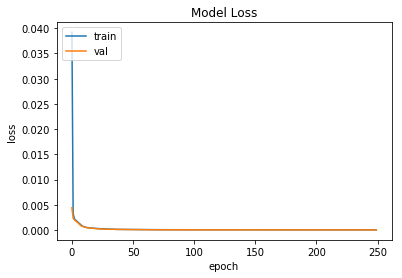

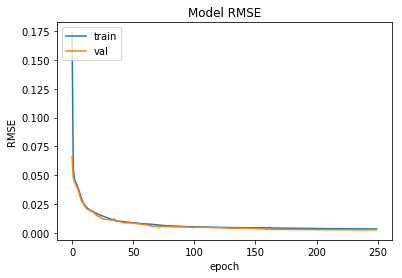

In [105]:
stateful_learn_curve(hist_loss, hist_val_loss, hist_acc, hist_val_acc)

In [ ]:
weights_saved_file='weights_6.hdf5'
model_6.load_weights(weights_saved_file)

In [107]:
Y_Pred_test = model_6.predict(X_test,batch_size=128)
model_6.reset_states()

#calculate RMSE
xrmse, yrmse= calculate_RMSE(Y_Pred_test, Y_test)

print('Test Score (X-coord) (unseen data): ', (xrmse))
print('Test Score (Y-coord) (unseen data): ', (yrmse))

Test Score (X-coord) (unseen data):  3.4183757180219674
Test Score (Y-coord) (unseen data):  2.3492244825901647


In [108]:
#comparing the true test values and the preicted values
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [980.63293789 578.2967033 ]
Y_Pred:  [980.2985  576.38196] 

Y_true:  [ 99.25398029 378.72927461]
Y_Pred:  [100.23425 378.08408] 

Y_true:  [1297.86892178  404.6721519 ]
Y_Pred:  [1299.2595   402.39807] 

Y_true:  [466.90793413 358.21167883]
Y_Pred:  [466.9341  357.47238] 

Y_true:  [781.0841617  528.31488203]
Y_Pred:  [780.8496 527.2261] 

Y_true:  [ 27.35703593 345.44890511]
Y_Pred:  [ 24.744184 348.24973 ] 

Y_true:  [462.37295298 473.65156562]
Y_Pred:  [462.15448 473.15588] 

Y_true:  [1131.  344.]
Y_Pred:  [1134.0687  342.7211] 

Y_true:  [656.25832013 350.53164557]
Y_Pred:  [657.5578  352.56534] 

Y_true:  [ 50.85624564 537.8974359 ]
Y_Pred:  [ 52.882954 538.4614  ] 

Y_true:  [803.82941622 468.62823834]
Y_Pred:  [802.9143 468.9295] 

Y_true:  [357.74801902 482.25383078]
Y_Pred:  [355.53357 487.22137] 

Y_true:  [304.4058908  618.52638191]
Y_Pred:  [303.0315  616.43835] 

Y_true:  [1079.20510836  320.81242236]
Y_Pred:  [1080.3817   319.33624] 

Y_true:  [1063.56896552  2

Y_true:  [689.71528262 572.38461538]
Y_Pred:  [684.8143  571.37555] 

Y_true:  [736.10746685 558.58974359]
Y_Pred:  [733.38074 558.0092 ] 

Y_true:  [346.6064201  299.44322344]
Y_Pred:  [346.02167 299.16626] 

Y_true:  [646.13175426 241.38321168]
Y_Pred:  [645.75867 241.31245] 

Y_true:  [432.62526169 198.93772894]
Y_Pred:  [430.84836 197.58727] 

Y_true:  [189.27697842 604.42602041]
Y_Pred:  [186.73088 603.22723] 

Y_true:  [242.27237729 220.96964981]
Y_Pred:  [241.38617 219.61559] 

Y_true:  [376.71706587 344.46715328]
Y_Pred:  [375.79407 343.39066] 

Y_true:  [1306.34473133  611.7985348 ]
Y_Pred:  [1301.944   611.0824] 

Y_true:  [292.46623563 408.66582915]
Y_Pred:  [292.38605 407.5417 ] 

Y_true:  [617.4812467  149.99133911]
Y_Pred:  [616.92    150.20801] 

Y_true:  [362.13787639 509.13590939]
Y_Pred:  [359.98846 511.66052] 

Y_true:  [414.44411547 568.22454308]
Y_Pred:  [414.11905 568.208  ] 

Y_true:  [296.88848921 211.21938776]
Y_Pred:  [294.9053  209.96133] 

Y_true:  [1365.  3

Y_true:  [909.40676175 352.14457029]
Y_Pred:  [906.22217 351.8914 ] 

Y_true:  [545.04860011 336.01532312]
Y_Pred:  [542.54913 335.95963] 

Y_true:  [223.76313842 166.77007299]
Y_Pred:  [223.04965 166.15065] 

Y_true:  [657.40858623 371.95620438]
Y_Pred:  [652.221   370.79797] 

Y_true:  [765.27311146 188.70153231]
Y_Pred:  [762.24286 187.62201] 

Y_true:  [500.28053036 732.996337  ]
Y_Pred:  [498.67645 731.6716 ] 

Y_true:  [198.24986793 194.07794803]
Y_Pred:  [197.24063 193.43639] 

Y_true:  [438.02294597 261.64882507]
Y_Pred:  [434.61807 266.04254] 

Y_true:  [640.16217644 323.64956696]
Y_Pred:  [639.84015 323.78214] 

Y_true:  [460.40060241 504.73046875]
Y_Pred:  [456.25854 503.5353 ] 

Y_true:  [619.13198758 439.58203125]
Y_Pred:  [614.13184 436.8748 ] 

Y_true:  [677.36978131 308.62341198]
Y_Pred:  [673.23486 310.63983] 

Y_true:  [726.93240557 233.19600726]
Y_Pred:  [722.2036  233.09811] 

Y_true:  [728.76805832 366.47549909]
Y_Pred:  [727.1544  365.63016] 

Y_true:  [869.454764

Y_true:  [1178.  495.]
Y_Pred:  [1174.3083   495.97238] 

Y_true:  [285.93885449  29.08944099]
Y_Pred:  [284.1311    30.907415] 

Y_true:  [566.42889222 297.34306569]
Y_Pred:  [564.62836 294.9973 ] 

Y_true:  [946.29290921 193.65154265]
Y_Pred:  [943.72473 193.57654] 

Y_true:  [819.22679693 446.26007326]
Y_Pred:  [815.9133 447.0445] 

Y_true:  [922.28304598 464.4258794 ]
Y_Pred:  [916.3996  464.04352] 

Y_true:  [158.79787939 157.76860254]
Y_Pred:  [159.89809 160.89369] 

Y_true:  [587.94798137 400.703125  ]
Y_Pred:  [586.8514 400.1884] 

Y_true:  [875.76905996 690.43342037]
Y_Pred:  [875.7894 689.4705] 

Y_true:  [416.70709079 206.10072595]
Y_Pred:  [410.48773 196.72672] 

Y_true:  [302.14315901 360.74683544]
Y_Pred:  [299.9335  360.09964] 

Y_true:  [424.96752816 365.01088929]
Y_Pred:  [422.92102 364.616  ] 

Y_true:  [569.19281564 369.88674217]
Y_Pred:  [567.10596 369.5604 ] 

Y_true:  [1056.  415.]
Y_Pred:  [1054.3522   414.25848] 

Y_true:  [993.88627748 502.07901554]
Y_Pred:  [9

Y_true:  [346.0417327  218.27181879]
Y_Pred:  [344.94742 216.66193] 

Y_true:  [490.19064748 418.11607143]
Y_Pred:  [488.28555 416.26855] 

Y_true:  [1171.  316.]
Y_Pred:  [1166.0398   315.67264] 

Y_true:  [792.73056995 588.24151436]
Y_Pred:  [790.56744 593.22284] 

Y_true:  [202.98680124 423.8203125 ]
Y_Pred:  [199.62537 422.88223] 

Y_true:  [605.04331749 387.62891406]
Y_Pred:  [603.49133 389.85938] 

Y_true:  [780.56664341 761.57142857]
Y_Pred:  [778.1953 760.407 ] 

Y_true:  [755.43754361 432.46520147]
Y_Pred:  [753.3369  432.85654] 

Y_true:  [972.32805071 233.32578281]
Y_Pred:  [970.28754 233.0454 ] 

Y_true:  [1358.62250185  580.86684073]
Y_Pred:  [1351.4941   580.02295] 

Y_true:  [991.24774096 366.02734375]
Y_Pred:  [988.1138  365.34515] 

Y_true:  [ 76.95184927 517.20512821]
Y_Pred:  [ 77.716576 517.75806 ] 

Y_true:  [542.44930417 629.37295826]
Y_Pred:  [541.23346 628.59717] 

Y_true:  [1234.57735011  342.77023499]
Y_Pred:  [1232.0631   343.38647] 

Y_true:  [1078.49353448 


Y_true:  [757.22503962 340.3164557 ]
Y_Pred:  [754.1382  339.73398] 

Y_true:  [760.89198144 312.28493648]
Y_Pred:  [757.27405 312.00867] 

Y_true:  [413.35287903 505.37241839]
Y_Pred:  [410.33636 504.6875 ] 

Y_true:  [924.27298851 771.61306533]
Y_Pred:  [921.74896 770.73047] 

Y_true:  [972. 545.]
Y_Pred:  [973.5987  543.00354] 

Y_true:  [608. 572.]
Y_Pred:  [606.5917 572.7204] 

Y_true:  [673. 651.]
Y_Pred:  [669.57355 647.5473 ] 

Y_true:  [796.80558229 458.98754864]
Y_Pred:  [793.8847 458.8982] 

Y_true:  [262.26756497 391.78988327]
Y_Pred:  [259.48364 379.41074] 

Y_true:  [849.65014368 466.45351759]
Y_Pred:  [852.0316  464.03537] 

Y_true:  [ 91.51665433 316.43211488]
Y_Pred:  [ 92.10759 312.92337] 

Y_true:  [681.5       314.5390625]
Y_Pred:  [677.0294  313.05756] 

Y_true:  [137.84159107 465.96703297]
Y_Pred:  [130.42218 469.8198 ] 

Y_true:  [833.72136223 481.20993789]
Y_Pred:  [828.1007  485.74402] 

Y_true:  [1130.23204023  632.71984925]
Y_Pred:  [1125.8754  632.3544] 

Y

Y_Pred:  [583.48254 383.57178] 

Y_true:  [ 27.71118012 212.61328125]
Y_Pred:  [ 27.225035 215.28561 ] 

Y_true:  [619.2994012  496.63868613]
Y_Pred:  [618.38763 495.37537] 

Y_true:  [612.35974643 456.98467688]
Y_Pred:  [613.70276 454.65186] 

Y_true:  [750.79589132  86.73502722]
Y_Pred:  [750.0391   87.64502] 

Y_true:  [844.29054411 337.62824783]
Y_Pred:  [846.09814 344.5727 ] 

Y_true:  [363.79915433 141.12025316]
Y_Pred:  [362.29068 138.52827] 

Y_true:  [122.35481425 370.36658031]
Y_Pred:  [123.67262 368.99374] 

Y_true:  [873.35101186 576.32600733]
Y_Pred:  [869.2673  575.73596] 

Y_true:  [425.05916535 484.94203864]
Y_Pred:  [424.26373 484.24634] 

Y_true:  [369.80251221 401.91941392]
Y_Pred:  [369.6734 401.6643] 

Y_true:  [325.55573164 145.15256496]
Y_Pred:  [324.57413 145.46248] 

Y_true:  [854.87410072 652.80484694]
Y_Pred:  [852.15393 652.7418 ] 

Y_true:  [727.95932382 241.92804797]
Y_Pred:  [725.6434 242.3788] 

Y_true:  [486.3993808  682.70931677]
Y_Pred:  [486.26492 68

Y_Pred:  [566.94135 225.64787] 

Y_true:  [481. 126.]
Y_Pred:  [478.46783  123.641815] 

Y_true:  [943.53943009 394.3030853 ]
Y_Pred:  [939.68616 394.5815 ] 

Y_true:  [691.49759384 377.97354086]
Y_Pred:  [691.9507 385.6429] 

Y_true:  [414.84770115 464.4258794 ]
Y_Pred:  [413.3383  464.11023] 

Y_true:  [145.4352518  425.32142857]
Y_Pred:  [144.38457 429.59692] 

Y_true:  [555.95323741 198.86734694]
Y_Pred:  [553.0398  198.59627] 

Y_true:  [867.70311675 159.13124584]
Y_Pred:  [863.94586 158.49164] 

Y_true:  [669.42789223 303.21918721]
Y_Pred:  [668.2322 302.6155] 

Y_true:  [1372.00719424  374.88392857]
Y_Pred:  [1367.2277   372.70627] 

Y_true:  [743.52257587 442.85509138]
Y_Pred:  [740.05774 443.613  ] 

Y_true:  [771.85789752 275.79946702]
Y_Pred:  [773.3131 275.3014] 

Y_true:  [1030.8594823   377.41372418]
Y_Pred:  [1030.6484   377.76605] 

Y_true:  [844.78089462 568.98056995]
Y_Pred:  [840.6482  570.54156] 

Y_true:  [592.18816169 285.65525292]
Y_Pred:  [580.39435 295.11865] 


Y_Pred:  [442.5951  502.17447] 

Y_true:  [1344.03838102  566.47252747]
Y_Pred:  [1337.7125   565.62665] 

Y_true:  [ 97.24842987 538.88278388]
Y_Pred:  [ 98.590935 537.7646  ] 

Y_true:  [807.70112657 222.94373866]
Y_Pred:  [802.7339  222.23146] 

Y_true:  [640.82605422 317.69140625]
Y_Pred:  [637.4361  316.32614] 

Y_true:  [1353.26646707   81.35766423]
Y_Pred:  [1347.4641    80.52422] 

Y_true:  [753.56682515 299.4556962 ]
Y_Pred:  [746.05945 299.70422] 

Y_true:  [215.31400602 612.9609375 ]
Y_Pred:  [216.4589  611.85034] 

Y_true:  [416.27945061 321.49900067]
Y_Pred:  [417.3125 321.3114] 

Y_true:  [673.8177496  441.39307129]
Y_Pred:  [669.26825 441.0062 ] 

Y_true:  [879.40940306 126.33510993]
Y_Pred:  [872.0376  117.14245] 

Y_true:  [900.62704702 172.03464357]
Y_Pred:  [897.9127  174.29678] 

Y_true:  [708.57587806 214.88838475]
Y_Pred:  [705.07275 215.60019] 

Y_true:  [582.42243976 399.65234375]
Y_Pred:  [583.3886  398.48157] 

Y_true:  [186.85714286 456.39453125]
Y_Pred:  [18

Y_Pred:  [446.9363  273.91293] 

Y_true:  [ 85.60348749 464.44689119]
Y_Pred:  [ 86.68745 464.83194] 

Y_true:  [1079.14791337  366.66089274]
Y_Pred:  [1075.2721   365.56674] 

Y_true:  [283.78367062 708.36263736]
Y_Pred:  [283.4988 707.9308] 

Y_true:  [177.17934783 237.83203125]
Y_Pred:  [175.24672 237.62798] 

Y_true:  [148. 437.]
Y_Pred:  [147.24947 436.4593 ] 

Y_true:  [624.13585156 304.22958258]
Y_Pred:  [621.9934  303.24115] 

Y_true:  [  6.42783124 178.42036554]
Y_Pred:  [  7.1023116 180.77185  ] 

Y_true:  [681.04108681 247.84210526]
Y_Pred:  [674.9051  246.18407] 

Y_true:  [678.38997006 362.13868613]
Y_Pred:  [675.41003 362.5142 ] 

Y_true:  [783.56418384 340.3164557 ]
Y_Pred:  [779.67065 341.01917] 

Y_true:  [463.83623877 310.74616922]
Y_Pred:  [463.26556 310.29175] 

Y_true:  [442.40622929 286.65426497]
Y_Pred:  [441.61453 286.86267] 

Y_true:  [789.31437126 317.95985401]
Y_Pred:  [786.8888  317.51175] 

Y_true:  [766.73639725 204.29313791]
Y_Pred:  [764.1756 204.4707] 


Y_Pred:  [418.25735 136.3949 ] 

Y_true:  [435.38848921 129.90178571]
Y_Pred:  [432.9009  129.22989] 

Y_true:  [585.5871438  239.05444646]
Y_Pred:  [586.32214 237.64476] 

Y_true:  [774.7844691  456.98467688]
Y_Pred:  [771.93964 455.9746 ] 

Y_true:  [372.88586957 522.59375   ]
Y_Pred:  [375.06226 520.03094] 

Y_true:  [664.30639197 279.56295803]
Y_Pred:  [663.3238  279.88367] 

Y_true:  [502.98277005 556.87477314]
Y_Pred:  [501.49808 556.4706 ] 

Y_true:  [987.69255151 106.98001332]
Y_Pred:  [985.9551  108.01169] 

Y_true:  [553.09667195 512.8994004 ]
Y_Pred:  [551.4439 512.0265] 

Y_true:  [453.59323825 510.21119254]
Y_Pred:  [455.26953 507.3296 ] 

Y_true:  [452.12995246 501.60892738]
Y_Pred:  [451.49573 501.35934] 

Y_true:  [104.50416983 353.64119171]
Y_Pred:  [104.94246 353.23846] 

Y_true:  [410.28230616 163.62704174]
Y_Pred:  [410.1519  163.09586] 

Y_true:  [1211.37247353  711.44980545]
Y_Pred:  [1207.831    710.34784] 

Y_true:  [320. 254.]
Y_Pred:  [319.62003 253.56181] 

Y

Y_true:  [917.80088823 110.99477807]
Y_Pred:  [914.8463   110.107414] 

Y_true:  [444.81352351 497.3077948 ]
Y_Pred:  [442.6031  496.69016] 

Y_true:  [618.26272455 357.22992701]
Y_Pred:  [615.71747 355.83112] 

Y_true:  [ 64.27173913 596.1484375 ]
Y_Pred:  [ 63.868332 596.1075  ] 

Y_true:  [925.54221912 518.19047619]
Y_Pred:  [921.081   518.72955] 

Y_true:  [919.74319609 247.21978022]
Y_Pred:  [917.68677 245.3243 ] 

Y_true:  [894. 397.]
Y_Pred:  [890.56287 394.97342] 

Y_true:  [813.95105422 352.3671875 ]
Y_Pred:  [808.7075  351.64664] 

Y_true:  [317.5076598  138.70086609]
Y_Pred:  [314.667   138.63483] 

Y_true:  [719.91125198 327.95069953]
Y_Pred:  [716.7799  327.59674] 

Y_true:  [164.35633055 433.08678756]
Y_Pred:  [165.70123 432.5864 ] 

Y_true:  [49.48482605 89.92428198]
Y_Pred:  [48.00589  91.395996] 

Y_true:  [1084.06977863  141.21167315]
Y_Pred:  [1082.0278  141.6671] 

Y_true:  [535.10669317 595.68693285]
Y_Pred:  [532.31036 595.1171 ] 

Y_true:  [251.81626506 667.60156

Y_true:  [667.23296355 281.71352432]
Y_Pred:  [665.2052  281.46854] 

Y_true:  [545.2027833  208.29764065]
Y_Pred:  [543.2247  207.50587] 

Y_true:  [247.05652477 323.09157509]
Y_Pred:  [245.68318 321.99048] 

Y_true:  [634.23194168 392.1061706 ]
Y_Pred:  [630.85315 392.33658] 

Y_true:  [432.89316651 485.36420233]
Y_Pred:  [433.03195 483.72733] 

Y_true:  [393.96510816 571.3992674 ]
Y_Pred:  [392.6967 570.8713] 

Y_true:  [580.50034892 490.6007326 ]
Y_Pred:  [578.45886 490.00577] 

Y_true:  [748.67201675 618.6959707 ]
Y_Pred:  [744.1355  618.13043] 

Y_true:  [269.89563286 608.25848564]
Y_Pred:  [278.17487 612.82117] 

Y_true:  [228.24722662 495.69487009]
Y_Pred:  [227.25552 494.48218] 

Y_true:  [1365.30146546  376.3003663 ]
Y_Pred:  [1361.5061  374.7174] 

Y_true:  [ 49.8897418  387.13919414]
Y_Pred:  [ 49.722202 386.90872 ] 

Y_true:  [1001.88074713  312.35301508]
Y_Pred:  [1006.1792  312.47  ] 

Y_true:  [365.49472892 550.96484375]
Y_Pred:  [360.02548 550.0791 ] 

Y_true:  [300.94

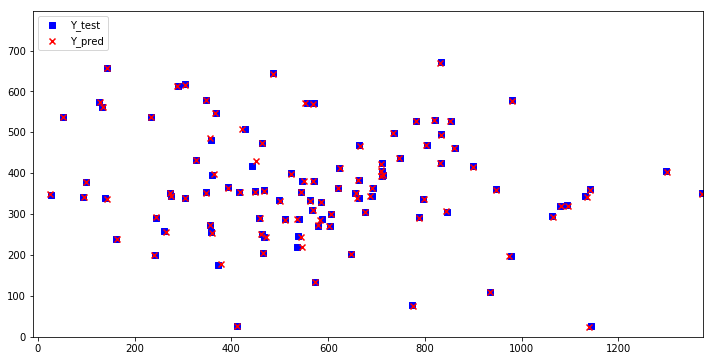

In [109]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)

X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [45]:
#stacked stateful LSTM for 30 iterations
sample_size=30
X_RMSE=[]
Y_RMSE=[]

start = time.time()

for i in range(sample_size):
    print('Experimental Run: ', i)
    model= stacked_stateful_LSTM(units=30, lr=0.001, batch=128, alpha=0.05)
    
    for j in range(250):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=128, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_pred = model.predict(X_test, batch_size=128)
    model.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE))+'\n')

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))

Experimental Run:  0
Model created and compiled
Experimental Run:  1
Model created and compiled
Experimental Run:  2
Model created and compiled
Experimental Run:  3
Model created and compiled
Experimental Run:  4
Model created and compiled
Experimental Run:  5
Model created and compiled
Experimental Run:  6
Model created and compiled
Experimental Run:  7
Model created and compiled
Experimental Run:  8
Model created and compiled
Experimental Run:  9
Model created and compiled
Experimental Run:  10
Model created and compiled
Experimental Run:  11
Model created and compiled
Experimental Run:  12
Model created and compiled
Experimental Run:  13
Model created and compiled
Experimental Run:  14
Model created and compiled
Experimental Run:  15
Model created and compiled
Experimental Run:  16
Model created and compiled
Experimental Run:  17
Model created and compiled
Experimental Run:  18
Model created and compiled
Experimental Run:  19
Model created and compiled
Experimental Run:  20
Model cr

[3.5105140813190876, 3.7721540472766644, 3.1154497330823294, 4.020385701825066, 3.629341393239072, 3.3325260820737816, 3.7717350467180597, 3.2123367141915558, 3.2380830160338276, 4.242769816751605, 3.547317909988981, 3.155211676931144, 4.3766314732766, 3.2262024523708313, 3.143205846707972, 3.461294044044826, 4.624039960433866, 3.1065615109862885, 4.485438988869339, 3.581955902436592, 3.7645697237455624, 4.8057334019002145, 3.904990228271383, 4.210263247977688, 3.391380508978638, 5.060992899634459, 3.7823300297577775, 4.757821242604602, 4.982256010535947, 4.476370953245109]
X-coord RMSE Mean: 3.856328788173629

[3.137919302567881, 3.1802268865040952, 2.75091820668025, 2.926551972728409, 2.8618164829658803, 2.9586716157672464, 2.949401073828131, 3.055356953617212, 2.812359231870201, 3.025936872842148, 2.87394187595047, 2.897365766249174, 3.32467914584229, 2.9964227129209924, 2.820590531148364, 2.659732459239737, 2.891824541535877, 2.7604688508143536, 2.9196141967846465, 2.9906303866870814, 2.8808908253545713, 2.939230863880257, 2.8014284688071824, 3.131200335306003, 2.854818311937211, 2.818938450897758, 3.0110826042478314, 3.006251162944598, 3.097051092512847, 2.7287529793089838]
Y-coord RMSE Mean: 2.9354691387247223

Time Took :376.39 min

In [83]:
print('Mean XRMSE: ', np.round(3.856328788173629, 3))
print('Mean YRMSE: ', np.round( 2.9354691387247223, 3))
print('Average: ', np.round(np.mean([3.856328788173629, 2.9354691387247223]),3))

Mean XRMSE:  3.856
Mean YRMSE:  2.935
Average:  3.396


As compared to the previous models, this model does not outperform them. From all the models trained so far Model-2 stateless LSTM with shuffle=False, performs the best. The average RMSE (avg of XRMSE and YRMSE) is minimum for Model-2. Thus in th case of LSTM a stateless model performs better where as for Simple RNN a stateful stacked model performed the best. And among LSTM and Simple RNN, simpleRNN performed better with an average RMSE of 2.86 comapred to 3.18 for LSTM. But if the visualizations of the predictions are comapared, and the real-time predictions using both the models are observed then it can be seen that LSTM model performs better than a Simple RNN.

## Real-Time Predictions using Model-2 (Stateless LSTM with 1 hidden layer)

In [ ]:
#img= the image where you want to draw the shapes
#the tuple (255,0,0) depicts the color of the shape. Here, it is Blue.
#(x,y) depict the centre coordinates
#2 is the radius
#-1 is the thickness, Here, -1 means closed circle,i.e., fill the shape

n_predictions=20
testing_dataset=[]

def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1)
        if(len(testing_dataset)>timesteps):
            testing_dataset.pop(0)
            pred_dataset = [i for i in testing_dataset]
            pred_dataset= scaler.fit_transform(pred_dataset)
            pred_dataset= pred_dataset.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            for i in range(n_predictions):
                input_sequence = np.array([j for j in pred_dataset[i:i+timesteps]])
                input_sequence = np.reshape(input_sequence,(1,input_sequence.shape[0],input_sequence.shape[1]))
                temp = model_2.predict(input_sequence)
                pred_dataset.append([temp[0][0],temp[0][1]])
            pred_dataset = scaler.inverse_transform(pred_dataset)
            pred_dataset= pred_dataset.tolist()
            pred_dataset[:] = [[int(data[0]), int(data[1])] for data in pred_dataset]
            for [_x,_y] in pred_dataset[timesteps:]:
                cv2.circle(img,(_x,_y),2,(255,0,0),-1)

img = np.zeros((1600,1200,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27:
        break
cv2.destroyAllWindows()

# Dataset-2: Click Dataset

## Data Pre-processing and Analysis

In [4]:
#Reading all text data files into csv files
for i in range(1,6):
    log_file= 'click_logs_' + str(i) + '.txt'
    csv_file= 'click_logs_' +str(i) + '.csv'
    
    with open(log_file, 'r') as in_file:
        stripped= (line.strip() for line in in_file)
        split1= (line.split("(") for line in stripped)
        split1_gen1, split1_gen2 = tee(split1)

        split2= [line[1].split(",") for line in split1_gen1] #split2[0] has the x-coordinate
        split2_gen1, split2_gen2 = tee(split2)

        split3= (line[1].split(")") for line in split2_gen1)
        split4= [line[0].split(" ") for line in split3] #split4[1] has the y-coordinate
        split5= [line[0].split(" ") for line in split1_gen2] #split5[0] has date, [1] has timestamp with ms, [2] has Action

        with open(csv_file, 'w') as out_file:
            out_file.write('Date,Time_with_ms,Action,X_Coord,Y_Coord\n')
            for i in range(0, len(split2)):
                out_file.write(split5[i][0]+','+'"'+split5[i][1]+'"'+','+split5[i][2]+','+split2[i][0]+','+split4[i][1]+'\n')
            out_file.close()

    in_file.close()

In [110]:
#Reading each csv file into corresponding dataframes
for i in range(1,6):
    exec("{} = pd.read_csv('../input/click-dataset/click_logs_' + str(i) + '.csv')".format('click_df_'+ str(i)))

In [111]:
#list of all dataframes containing the click csv files data
click_df_list=[click_df_1, click_df_2, click_df_3, click_df_4, click_df_5]
for i in click_df_list:
    print(i.head())
    print(len(i))

         Date  Time_with_ms   ...    X_Coord  Y_Coord
0  2019-05-16  04:39:58,716   ...        510      632
1  2019-05-16  04:39:58,819   ...        510      632
2  2019-05-16  04:39:59,103   ...        510      631
3  2019-05-16  04:39:59,113   ...        507      627
4  2019-05-16  04:39:59,123   ...        503      620

[5 rows x 5 columns]
6838
         Date  Time_with_ms          Action  X_Coord  Y_Coord
0  2019-05-17  01:25:56,894  Mouse_moved_to     1032      548
1  2019-05-17  01:25:56,898  Mouse_moved_to      950      571
2  2019-05-17  01:25:56,909  Mouse_moved_to      929      575
3  2019-05-17  01:25:56,918  Mouse_moved_to      908      578
4  2019-05-17  01:25:56,931  Mouse_moved_to      885      583
2735
         Date  Time_with_ms          Action  X_Coord  Y_Coord
0  2019-05-17  01:41:27,314  Mouse_moved_to     1032      311
1  2019-05-17  01:41:27,600  Mouse_moved_to      873      397
2  2019-05-17  01:41:27,600  Mouse_moved_to      648      558
3  2019-05-17  01:41:27,

In [112]:
#Extracting only 3 columns
j=1
for dataframe in click_df_list:
    exec("{} = dataframe[['Action', 'X_Coord', 'Y_Coord']]".format('click_subset_df_'+ str(j)))
    j+=1

In [113]:
#list of click dataframes containing only the required features
click_subset_list=[click_subset_df_1, click_subset_df_2, click_subset_df_3, click_subset_df_4, click_subset_df_5]
for i in click_subset_list:
    print(len(i))
    print(i.head())

6838
                              Action  X_Coord  Y_Coord
0  Mouse_clicked_with_Button.left_at      510      632
1  Mouse_clicked_with_Button.left_at      510      632
2                     Mouse_moved_to      510      631
3                     Mouse_moved_to      507      627
4                     Mouse_moved_to      503      620
2735
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1032      548
1  Mouse_moved_to      950      571
2  Mouse_moved_to      929      575
3  Mouse_moved_to      908      578
4  Mouse_moved_to      885      583
5524
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1032      311
1  Mouse_moved_to      873      397
2  Mouse_moved_to      648      558
3  Mouse_moved_to      631      575
4  Mouse_moved_to      629      576
6207
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1247       10
1  Mouse_moved_to     1198        5
2  Mouse_moved_to     1183        3
3  Mouse_moved_to     1169        1
4  Mouse_moved_to     1154       -4
30

In [114]:
#Selecting only rows corresponding to the scrolled coordinates

j=1
for subset_df in click_subset_list:
    exec("{} = subset_df.loc[subset_df['Action'] == 'Mouse_scrolled_at']".format('click_scrolled_df_'+ str(j)))
    j+=1

click_scrolled_list= [click_scrolled_df_1,click_scrolled_df_2,click_scrolled_df_3,click_scrolled_df_4, click_scrolled_df_5]

for scrolled_df in click_scrolled_list:
    print(len(scrolled_df))
    print(scrolled_df.head())

457
                 Action  X_Coord  Y_Coord
1294  Mouse_scrolled_at       62      575
1295  Mouse_scrolled_at       62      575
1296  Mouse_scrolled_at       62      575
1297  Mouse_scrolled_at       62      575
1298  Mouse_scrolled_at       62      575
166
                 Action  X_Coord  Y_Coord
1105  Mouse_scrolled_at       12      465
1106  Mouse_scrolled_at       12      465
1107  Mouse_scrolled_at       12      465
1108  Mouse_scrolled_at       12      465
1109  Mouse_scrolled_at       12      465
859
                Action  X_Coord  Y_Coord
124  Mouse_scrolled_at      611      453
125  Mouse_scrolled_at      611      453
126  Mouse_scrolled_at      611      453
127  Mouse_scrolled_at      611      453
128  Mouse_scrolled_at      611      453
0
Empty DataFrame
Columns: [Action, X_Coord, Y_Coord]
Index: []
244
                 Action  X_Coord  Y_Coord
1114  Mouse_scrolled_at        0      548
1115  Mouse_scrolled_at        0      548
1116  Mouse_scrolled_at        0      548
11

In [115]:
#deleting scroll movements from the subset dataframes

j=1
for i in range(0,5):
    exec("{} = click_subset_list[i].drop(click_scrolled_list[i].index, axis=0)".format('click_processed_df_'+ str(j)))
    j+=1

click_processed_list= [click_processed_df_1,click_processed_df_2,click_processed_df_3,click_processed_df_4, click_processed_df_5]

for processed_df in click_processed_list:
    print(len(processed_df))
    print(processed_df.head())

6381
                              Action  X_Coord  Y_Coord
0  Mouse_clicked_with_Button.left_at      510      632
1  Mouse_clicked_with_Button.left_at      510      632
2                     Mouse_moved_to      510      631
3                     Mouse_moved_to      507      627
4                     Mouse_moved_to      503      620
2569
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1032      548
1  Mouse_moved_to      950      571
2  Mouse_moved_to      929      575
3  Mouse_moved_to      908      578
4  Mouse_moved_to      885      583
4665
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1032      311
1  Mouse_moved_to      873      397
2  Mouse_moved_to      648      558
3  Mouse_moved_to      631      575
4  Mouse_moved_to      629      576
6207
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1247       10
1  Mouse_moved_to     1198        5
2  Mouse_moved_to     1183        3
3  Mouse_moved_to     1169        1
4  Mouse_moved_to     1154       -4
27

In [116]:
#deleting the adjacent duplicates
for i in range(0,5):
    xy_action_list=[]
    
    if(i!=0):
        if((click_processed_list[i]['X_Coord'].max())>x_max):
            x_max=click_processed_list[i]['X_Coord'].max()
        if((click_processed_list[i]['Y_Coord'].max())>y_max):
            y_max= click_processed_list[i]['Y_Coord'].max()
    else:
        x_max= click_processed_list[i]['X_Coord'].max()
        y_max= click_processed_list[i]['Y_Coord'].max()

    xy_action_list=click_processed_list[i].values.tolist()
    
    duplicates=0
    for k in range(0,len(xy_action_list)-1):
        if(xy_action_list[k]==xy_action_list[k+1]):
            duplicates+=1
        else:
            continue
    print(i+1)
    print('Before Deletion of adjacent duplicates')
    print('--------------------------------------')
    print('Total movements: ', len(xy_action_list))
    print('Number of adjacent duplicates: ', duplicates,'\n')
    
    #Deleting the adjacent duplicates
    xy_action_list= [k for k, g in itertools.groupby(xy_action_list)]
    exec("{} = xy_action_list".format('click_data_list_'+ str(i+1)))
    
    duplicates=0
    for j in range(0,len(xy_action_list)-1):
        if(xy_action_list[j]==xy_action_list[j+1]):
            duplicates+=1
        else:
            continue
    print('After Deletion of adjacent duplicates')
    print('--------------------------------------')
    print('Total movements: ', len(xy_action_list))
    print('Number of adjacent duplicates: ', duplicates, '\n')
    
print('x_max: ', x_max)
print('y_max: ', y_max)

1
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  6381
Number of adjacent duplicates:  681 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  5700
Number of adjacent duplicates:  0 

2
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  2569
Number of adjacent duplicates:  298 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  2271
Number of adjacent duplicates:  0 

3
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  4665
Number of adjacent duplicates:  466 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  4199
Number of adjacent duplicates:  0 

4
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  6207
Number of adjacent duplicates:  915 

After Deletion of adjacent d

In [117]:
#Count of samples per Action
click_list= [click_data_list_1, click_data_list_2, click_data_list_3, click_data_list_4, click_data_list_5]
j=0
for data_list in click_list:
    data_df= pd.DataFrame(data_list)
    j+=1
    print(j)
    print(data_df.groupby([0]).count()[1])
    print('\n')

1
0
Mouse_clicked_with_Button.left_at      73
Mouse_moved_to                       5627
Name: 1, dtype: int64


2
0
Mouse_clicked_with_Button.left_at      32
Mouse_moved_to                       2239
Name: 1, dtype: int64


3
0
Mouse_clicked_with_Button.left_at      48
Mouse_moved_to                       4151
Name: 1, dtype: int64


4
0
Mouse_clicked_with_Button.left_at      48
Mouse_moved_to                       5244
Name: 1, dtype: int64


5
0
Mouse_clicked_with_Button.left_at      38
Mouse_moved_to                       2502
Name: 1, dtype: int64




In [118]:
#retreiving click indexes
j=1
timesteps=18
for data_list in click_list:
    click_index_list=[]
    for i in range(timesteps, len(data_list)):
        if(data_list[i][0] in ('Mouse_clicked_with_Button.left_at', 'Mouse_clicked_with_Button.right_at', 'Mouse_clicked_with_Button.middle_at')):
            click_index_list.append(i)
    exec("{} = click_index_list".format('click_index_list_'+ str(j)))
    j+=1

click_indexes= [click_index_list_1, click_index_list_2, click_index_list_3, click_index_list_4, click_index_list_5]
for click_indx in click_indexes:
    print(len(click_indx))

72
32
48
48
38


Only 1 click is less in the first list of indexes compared to the count of clicks in the original file because in the first file the click is at the first position and thus, it does not have any coordinates before it to learn that movement.

In [119]:
#drop feature 'Action' to get only x and y coordinates
for i in range(len(click_list)):
    df=pd.DataFrame(click_list[i])
    x=df.drop([0], axis=1)
    x=x.values.tolist()
    exec("{} = x".format('final_click_data_'+ str(i+1)))

#Final 5 lists with only x and y coordinates
final_click_list= [final_click_data_1, final_click_data_2, final_click_data_3, final_click_data_4, final_click_data_5]
for i in final_click_list:
    print(i[:5])
    print(len(i))

[[510, 632], [510, 631], [507, 627], [503, 620], [495, 605]]
5700
[[1032, 548], [950, 571], [929, 575], [908, 578], [885, 583]]
2271
[[1032, 311], [873, 397], [648, 558], [631, 575], [629, 576]]
4199
[[1247, 10], [1198, 5], [1183, 3], [1169, 1], [1154, -4]]
5292
[[447, 351], [447, 352], [447, 355], [447, 358], [448, 361]]
2540


In [120]:
#Normalize or rescale the dataset to be in the range (0,1)

scaler = MinMaxScaler(feature_range=(0, 1))

for i in range(0,5):
    exec("{} = scaler.fit_transform(final_click_list[i])".format('click_norm_data_'+ str(i+1)))

click_norm_list= [click_norm_data_1,click_norm_data_2,click_norm_data_3,click_norm_data_4, click_norm_data_5]
for i in range(0,5):
    print(i+1)
    print(type(click_norm_list[i]))
    print(len(click_norm_list[i]))
    print(click_norm_list[i][0:5], '\n')

1
<class 'numpy.ndarray'>
5700
[[0.39031339 0.84139785]
 [0.39031339 0.84005376]
 [0.38817664 0.83467742]
 [0.38532764 0.82526882]
 [0.37962963 0.80510753]] 

2
<class 'numpy.ndarray'>
2271
[[0.75332349 0.70754717]
 [0.69276219 0.73854447]
 [0.67725258 0.74393531]
 [0.66174298 0.74797844]
 [0.64475628 0.75471698]] 

3
<class 'numpy.ndarray'>
4199
[[0.79571538 0.42245989]
 [0.67406274 0.53743316]
 [0.50191278 0.7526738 ]
 [0.48890589 0.77540107]
 [0.48737567 0.77673797]] 

4
<class 'numpy.ndarray'>
5292
[[0.89935588 0.0370844 ]
 [0.85990338 0.03069054]
 [0.84782609 0.02813299]
 [0.83655395 0.02557545]
 [0.82447665 0.01918159]] 

5
<class 'numpy.ndarray'>
2540
[[0.3605806  0.47058824]
 [0.3605806  0.47192513]
 [0.3605806  0.47593583]
 [0.3605806  0.47994652]
 [0.36134454 0.48395722]] 



In [121]:
input_list=[]
output_list=[]

for i in range(len(click_norm_list)):
    click_xy_coord= click_norm_list[i].tolist()
    for j in range(len(click_indexes[i])):
        if j!=0:
            input_list.append(click_xy_coord[(click_indexes[i][j-1])+1:click_indexes[i][j]])
            output_list.append(click_xy_coord[click_indexes[i][j]])
        else:
            input_list.append(click_xy_coord[0:click_indexes[i][j]])
            output_list.append(click_xy_coord[click_indexes[i][j]])


print('Length of Input: ', len(input_list))
print('Length of Output: ', len(output_list), '\n')

Length of Input:  238
Length of Output:  238 



In [122]:
print('Partial Input list: ', input_list[:2], '\n')
print('Partial output list: ', output_list[:2])

Partial Input list:  [[[0.39031339031339035, 0.8413978494623656], [0.39031339031339035, 0.8400537634408602], [0.38817663817663817, 0.8346774193548387], [0.38532763532763536, 0.8252688172043011], [0.37962962962962965, 0.8051075268817205], [0.3696581196581197, 0.7634408602150539], [0.3525641025641026, 0.6935483870967742], [0.33760683760683763, 0.6196236559139785], [0.32264957264957267, 0.5349462365591399], [0.30982905982905984, 0.44758064516129037], [0.297008547008547, 0.3467741935483871], [0.2884615384615385, 0.2688172043010753], [0.28205128205128205, 0.2002688172043011], [0.2763532763532764, 0.14381720430107528], [0.2727920227920228, 0.10483870967741937], [0.26994301994301995, 0.07258064516129034], [0.26851851851851855, 0.056451612903225805], [0.2678062678062678, 0.04704301075268818], [0.2670940170940171, 0.03897849462365592], [0.2656695156695157, 0.03897849462365592], [0.26353276353276356, 0.03763440860215054], [0.26282051282051283, 0.036290322580645164], [0.26139601139601143, 0.03629

In [123]:
click_input_data=[]
click_output_data=[]

for i in range(len(input_list)):
    k=1
    timesteps=18
    if(len(input_list[i])>timesteps):
        n= len(input_list[i])-timesteps
    else:
        continue
    while(k<n):
        l = np.random.randint(0,n) #random values between 0 (low value(inclusive)) and n (high value(inclusive))
        try:
            click_input_data.append(input_list[i][l:l+timesteps])
            click_output_data.append(output_list[i])
            k+=1
        except:
            pass

print(len(click_input_data))
print(len(click_output_data))

15295
15295


In [124]:
for i in input_list[:25]:
    print(len(i))

74
60
17
48
31
50
199
49
160
24
28
22
75
63
141
42
29
47
152
104
301
75
47
46
79


In [125]:
print(click_input_data[:5])
print(click_output_data[:5])

[[[0.24002849002849003, 0.022849462365591402], [0.23931623931623933, 0.021505376344086023], [0.2386039886039886, 0.021505376344086023], [0.2378917378917379, 0.020161290322580648], [0.2371794871794872, 0.018817204301075273], [0.23646723646723647, 0.017473118279569894], [0.23575498575498577, 0.01612903225806452], [0.23504273504273504, 0.01478494623655914], [0.2336182336182336, 0.013440860215053765], [0.2329059829059829, 0.01209677419354839], [0.2321937321937322, 0.01209677419354839], [0.23148148148148148, 0.009408602150537636], [0.23005698005698005, 0.009408602150537636], [0.23005698005698005, 0.008064516129032258], [0.22934472934472935, 0.008064516129032258], [0.22863247863247863, 0.008064516129032258], [0.22792022792022792, 0.006720430107526883], [0.22720797720797722, 0.006720430107526883]], [[0.24715099715099717, 0.02956989247311828], [0.24572649572649574, 0.02956989247311828], [0.24572649572649574, 0.028225806451612906], [0.245014245014245, 0.028225806451612906], [0.24358974358974358

In [126]:
click_Input= np.array(click_input_data)
click_Output= np.array(click_output_data)

print('Input: ', click_Input,'\n')
print('-------------------------------------------------------------------------------------------------------------------\n')
print('Output: ', click_Output)


Input:  [[[0.24002849 0.02284946]
  [0.23931624 0.02150538]
  [0.23860399 0.02150538]
  ...
  [0.22863248 0.00806452]
  [0.22792023 0.00672043]
  [0.22720798 0.00672043]]

 [[0.247151   0.02956989]
  [0.2457265  0.02956989]
  [0.2457265  0.02822581]
  ...
  [0.23717949 0.0188172 ]
  [0.23646724 0.01747312]
  [0.23575499 0.01612903]]

 [[0.36965812 0.76344086]
  [0.3525641  0.69354839]
  [0.33760684 0.61962366]
  ...
  [0.26353276 0.03763441]
  [0.26282051 0.03629032]
  [0.26139601 0.03629032]]

 ...

 [[0.77845684 0.37032086]
  [0.77922078 0.36764706]
  [0.78227655 0.36229947]
  ...
  [0.91520244 0.11631016]
  [0.92131398 0.10962567]
  [0.92589763 0.10427807]]

 [[0.69365928 0.70721925]
  [0.70206264 0.64973262]
  [0.71352177 0.59491979]
  ...
  [0.7868602  0.34893048]
  [0.79297173 0.3342246 ]
  [0.80213904 0.31283422]]

 [[0.94499618 0.08957219]
  [0.94652406 0.08957219]
  [0.94805195 0.08823529]
  ...
  [0.9671505  0.07085561]
  [0.96944232 0.06684492]
  [0.97097021 0.06149733]]] 



In [127]:
print(click_Input.shape[0])
print(click_Input.shape[1])

15295
18


In [128]:
#Reshape the input data
click_Input_reshaped = np.reshape(click_Input,(click_Input.shape[0],click_Input.shape[1],2))
print(click_Input_reshaped)


[[[0.24002849 0.02284946]
  [0.23931624 0.02150538]
  [0.23860399 0.02150538]
  ...
  [0.22863248 0.00806452]
  [0.22792023 0.00672043]
  [0.22720798 0.00672043]]

 [[0.247151   0.02956989]
  [0.2457265  0.02956989]
  [0.2457265  0.02822581]
  ...
  [0.23717949 0.0188172 ]
  [0.23646724 0.01747312]
  [0.23575499 0.01612903]]

 [[0.36965812 0.76344086]
  [0.3525641  0.69354839]
  [0.33760684 0.61962366]
  ...
  [0.26353276 0.03763441]
  [0.26282051 0.03629032]
  [0.26139601 0.03629032]]

 ...

 [[0.77845684 0.37032086]
  [0.77922078 0.36764706]
  [0.78227655 0.36229947]
  ...
  [0.91520244 0.11631016]
  [0.92131398 0.10962567]
  [0.92589763 0.10427807]]

 [[0.69365928 0.70721925]
  [0.70206264 0.64973262]
  [0.71352177 0.59491979]
  ...
  [0.7868602  0.34893048]
  [0.79297173 0.3342246 ]
  [0.80213904 0.31283422]]

 [[0.94499618 0.08957219]
  [0.94652406 0.08957219]
  [0.94805195 0.08823529]
  ...
  [0.9671505  0.07085561]
  [0.96944232 0.06684492]
  [0.97097021 0.06149733]]]


In [129]:
#split the dataset into train, validation and test datasets
X_click_trainval,X_click_test,Y_click_trainval,Y_click_test= train_test_split(click_Input_reshaped,click_Output,test_size=0.2,random_state=0)
X_click_train,X_click_val,Y_click_train,Y_click_val= train_test_split(X_click_trainval,Y_click_trainval,test_size=0.25,random_state=0)

print('Length of Train: ', len(X_click_train), len(Y_click_train))
print('Length of Validation: ', len(X_click_val), len(Y_click_val))
print('Length of Test: ', len(X_click_test), len(Y_click_test))

Length of Train:  9177 9177
Length of Validation:  3059 3059
Length of Test:  3059 3059


# LSTM

In [ ]:
#LSTM with m/m between batches
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stateful_LSTM(units, lr, batch, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=False, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

## Hyperparameter Tuning

In [ ]:
#hyperparameter tuning for number of units, learn rate, batch size and alpha(leaky relu)
def experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch, a):
    hist_val_loss = []
    
    # fit the model
    model = stateful_LSTM(units=n, lr=lr, batch=batch, alpha=a)
    for i in range(500):
        hist= model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch, verbose=0, shuffle=False)
        hist_val_loss.append(hist.history['val_loss'])
        #manual early stopping while monitoring the validtaion loss and stopping when the loss does not improve for 2 continuous epochs.
        if(i!=0):
            if((hist_val_loss[i-1][0]-hist_val_loss[i][0])<=0):
                count+=1
                if(count==2):
                    if(i<50):
                        count=0
                    else:
                        print('Epochs stopped because of no improvement. Epoch Number: ', i)
                        break
                else:
                    pass
            else:
                count=0
        else:
            count=0
        model.reset_states()
    
    Y_Pred = model.predict(X_test, batch_size=batch)
    model.reset_states()
    
    xrmse,yrmse= calculate_RMSE(Y_Pred, Y_test)
    
    print('Test XRMSE: ', xrmse)
    print('Test YRMSE: ', yrmse)
    
    return xrmse, yrmse

start = time.time()
count = 1
X_coord_results = pd.DataFrame()
Y_coord_results = pd.DataFrame()
model_df= pd.DataFrame()
# hyperparameters
neurons = [30,40,50,60]
learn_rate= [0.001,0.01]
batch_size= [133,437]
alpha=[0.01,0.05,0.1]
for n in neurons:
    for lr in learn_rate:
        for batch in batch_size:
            for a in alpha:
                print('Units: ',n,', Learn rate: ',lr,', Batch Size: ',batch,', Alpha: ',a)
                print('Model Number: ', count)
                model_df[str(count)]= [str(n)+','+str(lr)+','+str(batch)+','+str(a)]
                X_coord_results[str(count)], Y_coord_results[str(count)]  = experiment(X_click_train, Y_click_train, X_click_val, Y_click_val, X_click_test, Y_click_test, n, lr, batch, a)
                count+=1
# summarize results
print(X_coord_results.head())
print(Y_coord_results.head())
end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))
print('Completed')

Best parameters: 60 units, 0.01 learn rate, 133 batch size and 0.05 alpha.

In [ ]:
#function to test overfitting or underfitting of the stateful LSTM model at each epoch
def evaluate(model, X_train, Y_train, X_test, Y_test, batch_size):
    Y_pred_train=model.predict(X_train, batch_size=batch_size)
    model.reset_states()
    
    Y_pred_test = model.predict(X_test, batch_size=batch_size)
    model.reset_states()
    
    #invert and calculate RMSE
    train_XRMSE, train_YRMSE= calculate_RMSE(Y_pred_train, Y_train)
    test_XRMSE, test_YRMSE= calculate_RMSE(Y_pred_test, Y_test)
    return train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE
def fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch_size):
    start = time.time()
    Xtrain_score=[]
    Ytrain_score=[]
    Xtest_score=[]
    Ytest_score=[]
    for i in range(1000):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
        #evaluate model on train & test set
        train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE= evaluate(model, X_train, Y_train, X_test, Y_test, batch_size)
        Xtrain_score.append(train_XRMSE)
        Ytrain_score.append(train_YRMSE)
        Xtest_score.append(test_XRMSE)
        Ytest_score.append(test_YRMSE)
    print('Xtrain_RMSE: ', Xtrain_score)
    print('Ytrain_RMSE: ', Ytrain_score)
    print('Xtest_RMSE: ', Xtest_score)
    print('Ytest_RMSE: ', Ytest_score)
    history = pd.DataFrame()
    history['train_X'], history['train_Y'], history['test_X'], history['test_Y'] = Xtrain_score, Ytrain_score, Xtest_score, Ytest_score 
    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    return history
    
def show_plot(fig):
    fig.show()
def run(repeats, units, learn_rate, batch, alpha, dropout, X_train, Y_train, X_val, Y_val, X_test, Y_test,fig_1, fig_2):
    fig1, ax1 = plt.subplots()
    fig2, ax2 = plt.subplots()
    
    for i in range (repeats):
        print('Experimental Run: ', i+1)
        model= click_stateful_LSTM(units=units, lr=learn_rate, batch=batch, alpha=alpha, dropout= dropout)
        history= fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch)
        
        ax1.plot(history['train_X'],color='blue', label='X RMSE Train' if i == 0 else "")
        ax1.plot(history['test_X'], color='orange', label= 'X RMSE Test' if i == 0 else "")
    
        ax2.plot(history['train_Y'], color='blue', label= 'Y RMSE Train' if i == 0 else "")
        ax2.plot(history['test_Y'], color='orange', label= 'Y RMSE Test' if i == 0 else "")
    ax1.legend(loc='best')
    ax2.legend(loc='best')
    fig1.savefig(fig_1)
    fig2.savefig(fig_2)
    
    show_plot(fig1)
    show_plot(fig2)
    print('Completed')

In [ ]:
run(repeats=5, units=60, learn_rate=0.01, batch=133, alpha=0.05, X_train=X_click_train, Y_train=Y_click_train, X_val=X_click_val, Y_val=Y_click_val, X_test=X_click_test, Y_test=Y_click_test, fig_1='click_1000epochs_XRMSE.png', fig_2='click_1000epochs_YRMSE.png')

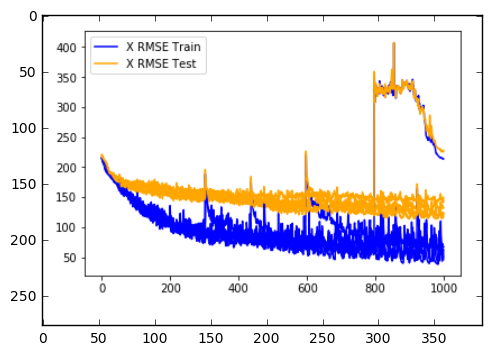

In [29]:
img=mpimg.imread('click_1000epochs_XRMSE.png')
img_plot= plt.imshow(img)

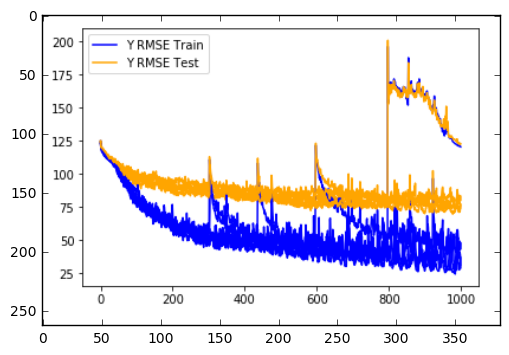

In [34]:
img=mpimg.imread('click_1000epochs_YRMSE.png')
img_plot= plt.imshow(img)

The above plots show a compelete overfit. In some of the repeats, the loss and RMSE of both train and test sets increases by a huge factor. For the rest of the period RMSE for both train and tests sets is continuously decreasing over 1000 epochs but there is a huge difference between the performance of train and tests sets. Thus, the model is overfitting. Let's see if adding a dropout improves the performance.

In [25]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stateless_LSTM(units, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=False, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_9 (LSTM)                (None, 50)                10600     
_________________________________________________________________
dense_11 (Dense)             (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 2)                 0         
Total params: 10,702
Trainable params: 10,702
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 10s - loss: 0.0666 - rmse: 0.2396 - val_loss: 0.0302 - val_rmse: 0.1735

Epoch 00001: val_loss improved from inf to 0.03024, saving model to click_wts_1.hdf5
Epoch 2/900
 - 4s - loss: 0.0306 - rmse: 0.1745 - val_loss: 0.0294 - val_rmse: 0.1710

Epoch 00002: val_loss improved from 0.03024 to 0.02938, saving mode

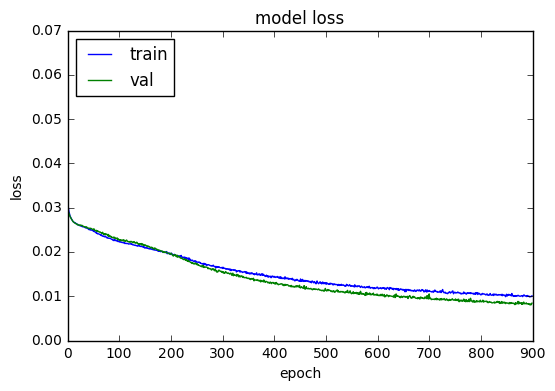

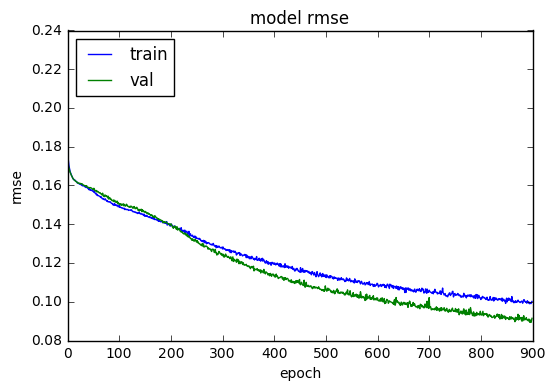

In [138]:
#LSTM call model definition
click_model1= click_stateless_LSTM(units=50,lr=0.001, alpha=0.05, dropout=0.1)
click_model1.summary()

#Train LSTM stateless model with shuffle=False
click_history= stateless_fit(click_model1, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_1.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(click_history)

In [ ]:
click_model1.load_weights('click_wts_1.hdf5')

In [55]:
click_pred= click_model1.predict(X_click_train)
xrmse,yrmse= calculate_RMSE(click_pred, Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred= click_model1.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  109.9775784519244
YRMSE train:  67.71668598624336
XRMSE test:  115.69545867806166
YRMSE test:  66.84520878889889


In [ ]:
#stateless LSTM for 5 iterations
timesteps=18
sample_size=5
X_RMSE=[]
Y_RMSE=[]

for i in range(sample_size):
    print('Experimental Run: ', i)
    
    model= click_stateless_LSTM(units=50,lr=0.001, alpha=0.05, dropout=0.1)
    model.fit(X_click_train, Y_click_train, validation_data=(X_click_val, Y_click_val), batch_size=133, epochs=900, verbose=0, shuffle=False)
    
    Y_click_pred = model.predict(X_click_test)
    
    xrmse, yrmse= calculate_RMSE(Y_click_pred, Y_click_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

    print(X_RMSE)
    print(Y_RMSE)
    
print('Iterations Completed')
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

#Results of the block above

Experimental Run:  0
Model created and compiled
[124.51004367905213]
[70.93223568037624]
Experimental Run:  1
Model created and compiled
[124.51004367905213, 111.74848820912763]
[70.93223568037624, 68.4250383471037]
Experimental Run:  2
Model created and compiled
[124.51004367905213, 111.74848820912763, 112.66856863506564]
[70.93223568037624, 68.4250383471037, 71.00496369141938]
Experimental Run:  3
Model created and compiled
[124.51004367905213, 111.74848820912763, 112.66856863506564, 116.7931340017932]
[70.93223568037624, 68.4250383471037, 71.00496369141938, 70.74392295139445]
Experimental Run:  4
Model created and compiled
[124.51004367905213, 111.74848820912763, 112.66856863506564, 116.7931340017932, 111.79690171800335]
[70.93223568037624, 68.4250383471037, 71.00496369141938, 70.74392295139445, 68.97647241237429]
Iterations Completed
X-coord RMSE Mean: 115.50342724860839

Y-coord RMSE Mean: 70.01652661653361

In [67]:
#results after performing 5 iterations
print('Mean XRMSE: ', np.round(115.50342724860839, 3))
print('Mean YRMSE: ', np.round(70.01652661653361, 3))

Mean XRMSE:  115.503
Mean YRMSE:  70.017


Model created and compiled
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 6s - loss: 0.0393 - rmse: 0.1905 - val_loss: 0.0281 - val_rmse: 0.1672

Epoch 00001: val_loss improved from inf to 0.02813, saving model to click_wts_4.hdf5
Epoch Number:  1
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0275 - rmse: 0.1653 - val_loss: 0.0275 - val_rmse: 0.1654

Epoch 00001: val_loss improved from 0.02813 to 0.02753, saving model to click_wts_4.hdf5
Epoch Number:  2
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0272 - rmse: 0.1644 - val_loss: 0.0272 - val_rmse: 0.1645

Epoch 00001: val_loss improved from 0.02753 to 0.02723, saving model to click_wts_4.hdf5
Epoch Number:  3
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0269 - rmse: 0.1635 - val_loss: 0.0270 - val_rmse: 0.1637

Epoch 00001: val_loss improved from 0.02723 to 0.02698, saving model to click_wts_4.hdf5
Epoch Number:  4
Trai

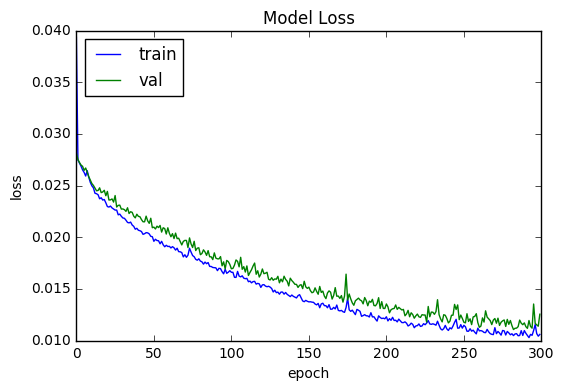

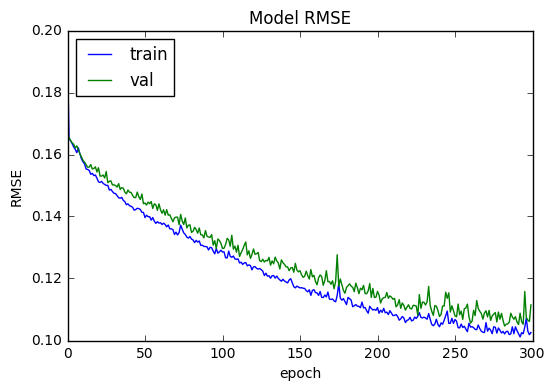

In [28]:
#added a recurrent dropout of 0.1 for stateful LSTM
click_model= click_stateful_LSTM(60,0.01,133,0.05,0.1)
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 300, 'click_wts_3.hdf5')
#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

The performance of train and validation data has improved as both of them are performing equally well after the addition of recurrent dropout. But this instant increase in the RMSE means the learn rate should be decreased.

Model created and compiled
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 17s - loss: 0.0674 - rmse: 0.2357 - val_loss: 0.0289 - val_rmse: 0.1697

Epoch 00001: val_loss improved from inf to 0.02893, saving model to click_wts_3.hdf5
Epoch Number:  1
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0301 - rmse: 0.1731 - val_loss: 0.0284 - val_rmse: 0.1680

Epoch 00001: val_loss improved from 0.02893 to 0.02838, saving model to click_wts_3.hdf5
Epoch Number:  2
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0296 - rmse: 0.1717 - val_loss: 0.0281 - val_rmse: 0.1671

Epoch 00001: val_loss improved from 0.02838 to 0.02806, saving model to click_wts_3.hdf5
Epoch Number:  3
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0292 - rmse: 0.1705 - val_loss: 0.0277 - val_rmse: 0.1661

Epoch 00001: val_loss improved from 0.02806 to 0.02774, saving model to click_wts_3.hdf5
Epoch Number:  4
Tra

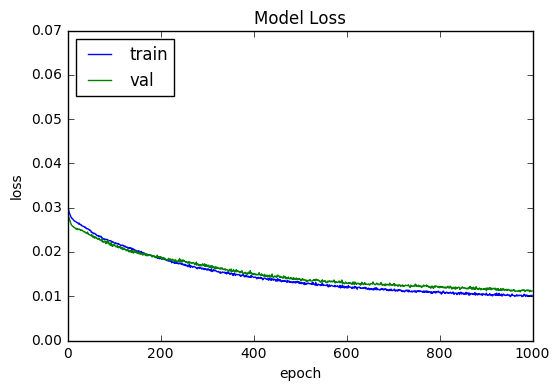

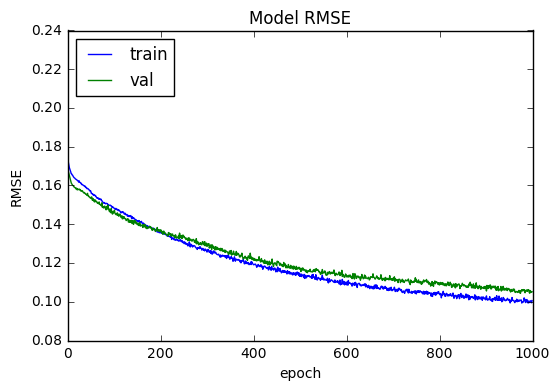

In [57]:
#added a recurrent dropout of 0.1 and decreased the learn rate from 0.01 to 0.001
click_model4= click_stateful_LSTM(60,0.001,133,0.05,0.1)
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model4, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_wts_4.hdf5')
#plot loss and rmse curve for simpleRNN_model1
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

Adding recurrent dropout and decreasing the learn rate improves the performance of the model. Let's see what value of dropout gives the best result, as it is expected that adding a higer dropout will improve the performance. ALso, the training loss decreases more rapidly as compared to validation loss. Let's see the results by decreasing the number of units as well.

In [ ]:
#tuning is done for only 1 repeat as it takes 30 mins to train 1 model
def dropout_tuning(dropout, repeats, X_train, Y_train, X_test, Y_test, X_val, Y_val):
    timesteps=18
    X_RMSE=[]
    Y_RMSE=[]
    for i in range(0,repeats):
        print('Experimental Run: ',i)
        model_iter = click_stateful_LSTM(50,0.001,133,0.05,dropout)
        
        for j in range(500):
            model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=133, verbose=0, shuffle=False)
            model_iter.reset_states()

        Y_pred = model_iter.predict(X_test, batch_size=133)
        model_iter.reset_states()
        
        xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
        
        X_RMSE.append(xrmse)
        Y_RMSE.append(yrmse)
    return X_RMSE, Y_RMSE

repeats=1
results_X = pd.DataFrame()
results_Y = pd.DataFrame()
dropouts=[0.1,0.2,0.3,0.4,0.5]
for dropout in dropouts:
    print('Dropout: ', dropout)
    results_X[str(dropout)], results_Y[str(dropout)]= dropout_tuning(dropout, repeats, X_click_train, Y_click_train, X_click_test, Y_click_test, X_click_val, Y_click_val)
print(results_X.head())
print(results_Y.head())

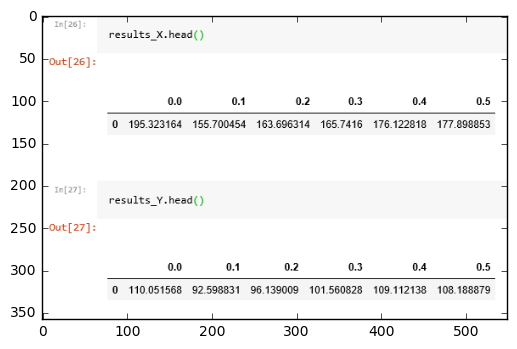

In [29]:
img=mpimg.imread('click_dropout_lstm_results.png')
img_plot= plt.imshow(img)

0.1 dropout gives the best results.

In [ ]:
#reduce the number of units to 50
#added a recurrent dropout of 0.1 and decreases the laern rate from 0.01 to 0.001
click_model= click_stateful_LSTM(50,0.001,133,0.05,0.1)
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 500, 'click_wts_4.hdf5')
#plot loss and rmse curve for simpleRNN_model1
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

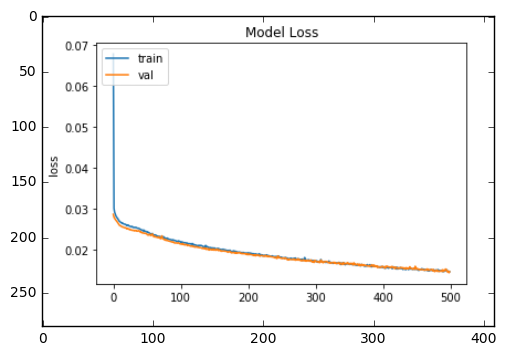

In [30]:
img=mpimg.imread('click loss 50 units.png')
img_plot= plt.imshow(img)

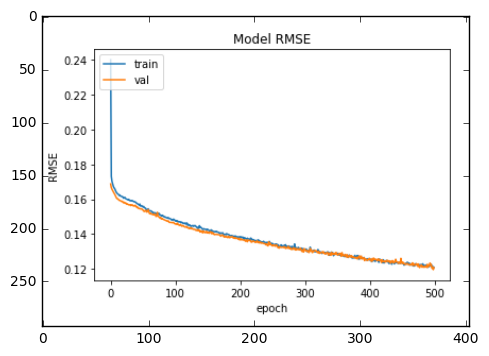

In [31]:
img=mpimg.imread('click rmse 50 units.png')
img_plot= plt.imshow(img)

Now, the model is performing well as both train and validation loss is decreasing continuously and is almost same. Further, the model was trained for 1000 epochs and the loss is still decreasing.

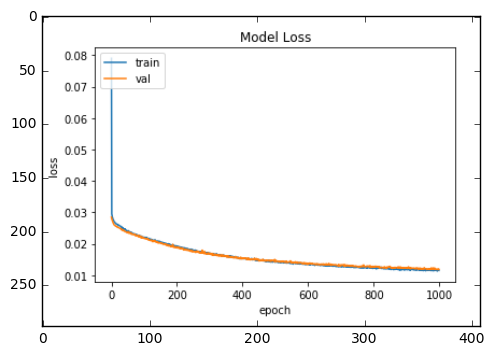

In [32]:
img=mpimg.imread('click 50 units 1000 epochs loss.png')
img_plot= plt.imshow(img)

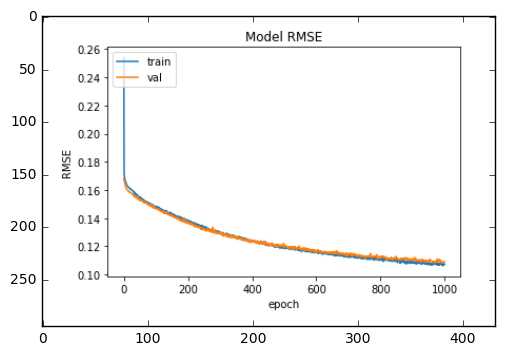

In [33]:
img=mpimg.imread('click 50 units 1000 epochs rmse.png')
img_plot= plt.imshow(img)

In [ ]:
#call function to test overfitting and underfitting at each epoch with the new parameters
run(repeats=5, units=50, learn_rate=0.001, batch=133, alpha=0.05, dropout=0.1, X_train=X_click_train, Y_train=Y_click_train, X_val=X_click_val, Y_val=Y_click_val, X_test=X_click_test, Y_test=Y_click_test, fig_1='click_XRMSE', fig_2='click_YRMSE')

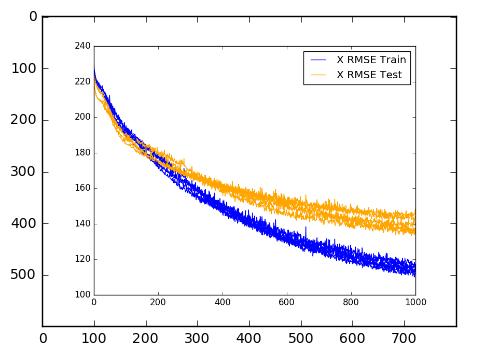

In [99]:
img=mpimg.imread('click_XRMSE.png')
img_plot= plt.imshow(img)

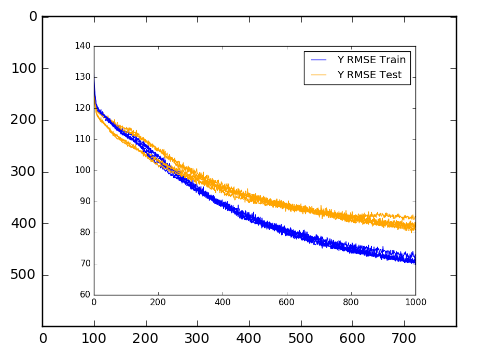

In [100]:
img=mpimg.imread('click_YRMSE.png')
img_plot= plt.imshow(img)

XRMSE and YRMSE for both both train and test sets is continuoly decreasing over the 1000 epochs.

In [3]:
def scores(e):
    RMSE_Scores=[]
    Xtest_RMSE_1= [221.05345286635708, 218.09624915105775, 216.95316830693935, 216.08014736289127, 214.97567848716477, 213.76145415033417, 212.6414859537544, 212.04847860749967, 211.79917904796972, 211.3951517308625, 211.23351168556326, 210.52858127471927, 210.43418727085006, 210.1167891517558, 210.11328119238726, 209.9100545868319, 209.76019021319146, 209.77696381400872, 209.30776562389886, 208.9918172695138, 208.94802402184712, 209.0191958167482, 209.08320148267558, 209.25149732804508, 208.62489533339425, 208.369237785923, 209.1309765592106, 209.19233114231207, 208.50672771931676, 209.1634860556293, 208.9965093055717, 208.94575246081078, 207.69616954605456, 206.94749817382913, 208.6752328057258, 207.7051809042055, 207.68521383131971, 206.5398448199744, 204.49993782836995, 204.55068377512654, 203.00793935582817, 204.4337046257151, 202.8341313384627, 203.44576189567022, 202.7328932268895, 202.62106220857555, 203.514441943737, 201.8018198466543, 201.02498338287555, 205.10133834416965, 202.21825139563884, 201.8953234155299, 200.00557274550133, 201.28737086122464, 198.81634360771267, 200.2279339782185, 198.20289634988808, 200.52972628578794, 198.42582818770725, 197.32064800447867, 197.03188548267138, 197.19002958349955, 198.0899815425375, 196.1482792045549, 196.93345909323168, 195.52442110688824, 196.82058713978736, 195.7996549142932, 196.18315012691124, 195.73888477272908, 194.93664777506663, 194.4605737052933, 195.025919160094, 195.52850235534703, 193.6587575680416, 194.31056206405432, 194.0840995222527, 193.63975478002115, 193.9835281179462, 194.91805908561784, 195.17255367853798, 193.64138736115427, 193.62877680505156, 192.22949554541788, 193.00452442719396, 192.97946355454633, 194.53880048966357, 194.41224299043176, 193.88933699773284, 193.53477868378585, 192.1563939307587, 191.3030566664646, 190.7374751833883, 190.83306445777114, 191.10485938233558, 194.00973512080952, 192.28014349911456, 190.2625023233832, 190.93030511750942, 190.77725979143514, 191.95261770371, 190.41065723521, 190.8927535483006, 189.10259757718129, 190.0485015081839, 189.81568445801287, 190.98277506977692, 188.43055939011455, 189.7359291638436, 188.44537023414622, 190.23390445906134, 189.4757792735321, 189.6455146584009, 188.16629244947725, 188.8089567165761, 189.73739458752036, 189.30488746272158, 188.13689779119065, 190.13276147034668, 186.64285586551364, 187.92635404213243, 187.80549898578718, 188.7837034723133, 187.83202586069095, 188.2087078915406, 187.81923060321577, 187.6976303519858, 187.13203426802067, 188.49313284673326, 186.2833144548278, 186.66455663232577, 186.30038272608925, 187.49812664773728, 186.6972800450128, 186.5178778183346, 185.7078520202505, 186.4690622463753, 185.95249290606702, 185.05005360512806, 185.688138654595, 185.24595533419622, 185.8012536586613, 183.39629874325723, 185.8788957684168, 183.3470033159441, 184.8381618205177, 182.97998741740332, 184.6250202223498, 185.22619256499408, 184.99087990139236, 182.58880112329783, 184.68953571809672, 185.216163965493, 184.21664750309463, 183.5729501338658, 183.79218841951243, 182.57336302067915, 182.2291836785803, 184.07885540448453, 183.33342968415047, 182.45457769741705, 184.162734587452, 182.50573708559563, 182.7052364089468, 182.49959394192132, 183.19053068558688, 183.7570165923577, 182.5844269382348, 181.2972343386995, 181.7618752781624, 181.2045040072624, 182.1780253668341, 180.78270321613192, 182.02488079922483, 182.1387002361172, 182.86062135776805, 182.87423001742698, 180.23309457474508, 179.9375045630038, 181.05077839748398, 180.33141495931, 180.23754920246031, 179.69360948396482, 181.32808435073505, 181.05449108964353, 178.52821488427128, 178.99953922911456, 179.04889381231618, 180.90086884452228, 181.59262000515844, 179.1382392777738, 179.35989328716272, 178.7523937940363, 178.10397392856026, 178.49831500701364, 179.0934518642437, 179.21839798315995, 179.23775051076083, 179.13518767605981, 180.3749102536254, 178.87995075947754, 179.50223795030004, 179.93795937486732, 178.59974783037768, 178.7606802625277, 179.0113373479067, 177.13617481440232, 179.6893616809426, 177.675596767503, 179.43532940897828, 176.24077583523118, 178.39736917326948, 179.74612574468583, 179.4946912490363, 178.0068494160715, 176.12272761704995, 176.4958692724154, 176.47289339413012, 177.01503926045226, 174.9817513579322, 177.5376404030572, 176.54177072599043, 176.6501755588914, 174.70936595872357, 174.7587615795252, 177.64674082406648, 174.17072218606467, 177.83601010786165, 176.1729433668832, 174.7145361728852, 175.25952422907017, 176.19711861302216, 175.19174432760715, 175.1614217130894, 174.05473945371241, 174.83240456135286, 174.39093645427334, 173.79552918691317, 173.58376323234992, 172.8129415347791, 174.4110419436928, 171.84886456332728, 174.39905411046064, 172.23383310567127, 173.17190323427576, 173.8147626071033, 173.0119246738524, 172.80199191529286, 174.2451556487057, 172.90832658068243, 173.0625252769564, 173.58285589813073, 172.89748442867256, 173.44111934584112, 170.48906458268448, 169.80986916557353, 170.6704168426474, 172.0386009150965, 170.24757209124192, 172.57158119498038, 171.87274989773007, 172.73992565024494, 171.8947510909056, 169.6888734888877, 169.78378058469988, 171.53814725845356, 170.07707359875837, 170.05183090572922, 175.97683253875985, 173.27682795032246, 170.50892359829956, 168.7818718439842, 168.84028664882106, 169.07953740469807, 168.70446718582158, 169.34668783615268, 169.54094610416988, 168.0781756246589, 169.23834012589776, 168.02514094684562, 168.7841335821614, 168.8258751632667, 170.05943597830597, 170.20851248570133, 169.69519483911532, 167.2646601772932, 167.49112635706888, 170.22782179456632, 168.69179478221216, 168.73131230697723, 167.98234146047042, 167.4441979436289, 167.1645509689348, 169.09618960570268, 168.30553761476182, 167.1790807276028, 167.54507338032306, 167.20256692623886, 168.01231600168305, 167.57181363805952, 168.06829142002962, 166.40797736829037, 164.7712708773055, 169.35696210587008, 166.55589431548964, 167.18171032899778, 166.48477874186693, 166.58520219468394, 168.4110623394234, 164.49513138983102, 167.03888179669354, 164.36259884745567, 167.24792310688252, 167.55717912828914, 164.98808433820912, 165.1289113029797, 167.87830671204486, 164.8970775532442, 164.61822658795862, 165.72623899507747, 165.87649789789145, 167.10892587655346, 166.2733378264765, 164.2681787829738, 163.83906689479124, 165.62050473944268, 164.88034289780535, 166.97831368965754, 165.9426836113314, 164.5565708565925, 164.02023379457265, 165.9752947480933, 163.77005943911274, 165.75725745911748, 164.48550574474768, 164.15935589273985, 165.74113764317192, 165.81347300423855, 165.67990929872562, 161.74785767578607, 166.06904899630126, 163.0109204769969, 164.20967030838113, 161.14240225234428, 162.50351792528105, 164.26488579541513, 164.8243112771173, 162.1564132183205, 164.06473571375602, 163.45728087341806, 163.9384185165086, 163.39718668915594, 165.53323714251334, 162.20829108039666, 161.39482428869718, 163.76992643922893, 161.62954787371174, 164.24801798234645, 161.6162663844892, 162.05070378949634, 162.23091809115832, 161.8684313744752, 161.1025210571994, 162.69497671508478, 162.00611400523044, 160.41334452635132, 160.36808173154944, 159.30906895902626, 162.00821476204047, 160.5901832780258, 161.73290586983063, 164.24078358699242, 161.21667115696818, 161.0007891853938, 159.96479981120518, 162.86708688433268, 161.38043371609726, 159.03119618310726, 158.59124480941355, 161.96205363758116, 160.13391168728265, 161.75593149824147, 161.83249969848342, 161.63272740796026, 159.7617702305593, 160.73541434752292, 160.03064453908132, 160.9711831678941, 159.1370802762319, 160.83820770424146, 158.25087699170143, 158.4766477446488, 157.8318037438647, 159.23876774347042, 160.3030670002989, 158.05305635005374, 160.32845295164182, 159.45107523834355, 157.48888695620894, 159.62851748371276, 159.06960109333798, 155.98728217382174, 160.70711290817272, 159.5491036097068, 157.62728348622102, 157.559499137184, 159.22990857739754, 161.9959360220793, 155.51660315984915, 159.33469275945137, 158.70545507969902, 158.49910325561524, 158.32691925412612, 157.35325204665716, 156.96178952547805, 157.08846774572845, 156.91095419820888, 159.92849950297972, 158.06762519883287, 159.86678172442316, 157.17772479205266, 157.56654505737885, 158.58712342267464, 156.05363255418808, 157.00099542332214, 156.17128093665195, 155.4384441703916, 154.8868229022794, 155.655656551425, 156.7888452479041, 157.7722414878035, 155.7234995700136, 157.52643095014747, 154.6657636642272, 155.80986124481555, 157.30505711135868, 154.68629933923594, 155.93376617141465, 154.61246155838464, 152.33570681659054, 154.9362252254905, 156.40934569754674, 154.41854036778787, 155.5524728522588, 155.5535700885009, 155.55132606713144, 154.37104143791163, 156.9889150707801, 155.79800364030325, 153.38067264297965, 154.26021039569142, 155.28150201273894, 155.77423773438102, 153.3692773612508, 154.18423592898776, 153.8058330155691, 152.39550446357316, 153.90195509284794, 154.0904566085064, 154.39073843000824, 153.08016726042158, 155.76045551715998, 152.40515135993923, 152.58677124876172, 155.83115025135464, 151.89637233202515, 152.97692177320096, 154.11798431634003, 154.0447528386758, 153.91045120383882, 153.48806104256033, 153.8209688226531, 153.28408163177656, 154.74184099303184, 154.06949556589635, 154.12906422542568, 152.42820341378896, 151.76555690005466, 155.07585747458083, 153.14648688124103, 152.3048255120451, 156.14209415641665, 153.29633184967275, 150.97955093731818, 151.7863225922164, 154.5658600972204, 153.34717030626456, 150.83629249706934, 151.3612971997949, 151.49701215297821, 152.51680777857283, 150.7811425919693, 151.61616212411755, 152.12838942926325, 152.98741297529344, 150.103760146059, 151.1656155096735, 151.62299482149126, 152.79591291069798, 151.8392697323134, 152.56579977532746, 152.0551556513593, 153.06879597695288, 151.08270309477584, 151.12754841023028, 149.3915019960414, 150.481852421341, 151.42086486516314, 150.62283931560438, 151.08875757600313, 150.76516651337843, 150.37604621240195, 151.37799633923856, 149.2373752237596, 152.01946863349102, 149.63412986448014, 150.02362641164493, 152.49564068028064, 149.32212032243902, 150.36349131105484, 149.6769315965469, 149.9744794559678, 150.10429020484582, 150.2254606271825, 150.60296493757406, 150.19615361240403, 149.42051265103663, 149.45409037814846, 149.42171901237057, 152.18153382328967, 147.23389390732626, 148.60587684265388, 148.35110911817836, 147.76798905010173, 149.0625344852218, 150.1437654333185, 149.7977215608569, 147.37178438359143, 149.58810026422347, 149.46441361856557, 150.61777895284368, 150.0117098585509, 150.38836796882984, 148.76697440672973, 148.4027532353765, 150.37384680646326, 146.98749613662824, 148.65707524727353, 148.27460504868367, 148.44321322140883, 147.1569320002213, 149.11990265290729, 145.5275513765055, 146.84688438010969, 148.47948209972157, 147.673657732223, 147.7356883426093, 147.72003491422961, 149.88011168528405, 148.14188278084765, 148.89674981979707, 146.1204965076106, 145.93833270951257, 146.63877635645892, 148.12053407819508, 147.69195818898464, 147.84991737603374, 148.50675564679125, 145.8609667512189, 151.06409695730403, 145.97593888818403, 147.9959561524601, 146.15047829264347, 145.0374534048873, 148.49645121159813, 150.64888711296425, 146.1757766169877, 147.25014744675207, 146.75096051763765, 147.00895301616188, 145.7051853150925, 147.14884410673682, 146.46172642937157, 145.39512189543956, 145.82790221339746, 145.44079655698349, 146.5439315743656, 145.3243110071056, 146.50695020487305, 145.2891223216578, 147.1450799170134, 144.80682458811256, 146.20524926491316, 148.60710780292803, 146.42712930791583, 146.31716658473593, 144.5449100694632, 145.50136524480055, 145.53247674399682, 147.8014271833149, 145.97673153126004, 145.78985375109536, 145.8240430067675, 144.34512906182, 145.10823085162204, 146.2897756622658, 145.2106033445509, 147.3159827686377, 144.85118281447097, 144.30974825555552, 145.87882147082354, 143.85985108143922, 145.11124612221977, 143.2840232311384, 145.50881578657481, 145.6303961196656, 144.31164224236542, 146.7340204356116, 146.126830157544, 144.96858898254297, 144.548798415191, 146.75683998790186, 143.65936415436786, 143.46515289096126, 143.8402102833245, 144.00387521517447, 144.23896719469312, 143.00515501916698, 146.6158493661383, 141.91858085573207, 145.9563048495851, 143.60994422126848, 146.20070134588659, 143.70273366435214, 145.6758229562718, 144.7735964761294, 144.8848372580129, 143.6137692074171, 144.89519364543187, 143.13468761993178, 144.9537344786852, 145.73568193833273, 146.88002174462784, 144.0362640106442, 145.8650295773427, 142.23406255640901, 142.67259649829194, 146.09316602105955, 143.9593124406575, 144.07503419990056, 142.57721281146164, 142.8477282693704, 144.59300755171896, 142.40258070280495, 143.053423257055, 142.65018356646536, 142.67993112460175, 142.95558897205936, 144.8372909016298, 145.11736497149954, 142.17971533456796, 144.29239309270883, 142.67609837439574, 145.00075490776916, 143.49798585357257, 145.79561182124817, 144.0259183381591, 143.16848274983843, 143.41949915637747, 144.08111836440835, 146.1342742079424, 141.0682090767135, 143.681587692265, 143.215771625352, 142.8108592957981, 144.28962249007768, 143.22357570195103, 143.9925715458258, 144.60812581364792, 143.4082698333444, 144.7533223821957, 141.88409834986794, 142.97842515669717, 142.3720078124689, 142.49627220361012, 142.67979452079953, 143.9220514046129, 141.95293623396768, 141.553290204288, 142.1073029684845, 141.90207932390456, 142.48192787937057, 142.1584014917712, 145.41933918623258, 143.27808204649554, 144.25434617139155, 145.25084238492323, 144.69856745025407, 145.79482494911392, 143.3570640272539, 143.11283743843052, 141.95886848170167, 142.1464512149385, 142.67232004573427, 141.9823818610179, 143.21070020725537, 141.47978642055867, 140.7281205973708, 141.99604077664247, 143.74051372405367, 141.6348455672423, 143.11594292347132, 141.90597158087866, 140.38169987529275, 141.86715408770777, 139.38633811266183, 140.2711760446299, 140.67415345749643, 144.33343775703693, 142.1047892659449, 142.58518712461827, 143.70875281908374, 143.88027583658513, 142.4939927352832, 142.60210870552163, 142.62393808039332, 143.83884366122234, 144.58571764856515, 140.88860020576803, 141.6652026074518, 140.30635783378796, 140.50120847087237, 140.6181595398964, 141.3092174569165, 141.95519867967175, 141.172005774242, 141.798270762148, 142.3840671803482, 141.49092061298046, 142.47233662983047, 139.82538538578459, 140.9642178556662, 142.19682041631103, 141.6106731702299, 142.29665642259374, 140.93550713211667, 140.86254092036333, 141.95125641977683, 142.07096772919007, 139.89386232263593, 138.94962420125898, 140.53406744439047, 140.62436275077067, 141.29808207370948, 141.99957369410902, 142.6680898204814, 140.7837609498418, 143.6023002132522, 142.2967106043533, 140.09219532999177, 140.81496988136684, 141.43479334494302, 140.6346332648264, 138.78693966697526, 138.84904004054928, 141.27964022732004, 139.1221028622339, 139.9753360668835, 140.55112577307565, 140.55351743750796, 139.5088540625261, 140.2243718080876, 139.79063762096322, 141.80261327206202, 144.07246113924626, 140.72811781273708, 141.8141173719427, 141.8837170203669, 141.99918601844786, 142.6286337375155, 139.76266976318948, 139.95451484049033, 138.8231783923219, 140.61987395962356, 140.66589156280187, 140.18288547354982, 139.39739393309293, 140.60764472212867, 138.40926029129906, 139.32276130874476, 138.42236348978633, 141.7467963796577, 138.39812070047802, 139.1450982915238, 139.97745443585976, 137.811862140249, 138.8499825539756, 140.25448974094934, 138.26867436903936, 142.75750610957232, 138.0152519615982, 139.5707464247395, 141.228850236718, 137.77009856163528, 140.2230782728586, 140.8630406814463, 140.96775704047369, 137.52987366837866, 138.71638783217617, 137.3779938215405, 138.4366349362596, 139.13897711300794, 137.3579208445409, 140.68294391205433, 143.09275614684285, 139.328882691195, 139.6622237983665, 139.6382287374923, 138.81035403528153, 139.83018438276673, 140.37968026227634, 141.07356620019806, 140.47777013310156, 141.01873642750326, 139.27998025505389, 139.3008559056655, 142.58850805043687, 142.37344591520096, 138.85151853791675, 137.8451608000093, 138.77582324225878, 137.8572737891669, 140.38791321168188, 138.95415220031322, 139.98419656038973, 138.38474704170264, 138.85840351306362, 139.14720373565598, 137.94243158333447, 138.05232247853607, 139.46074069034356, 138.58119590143926, 139.34312448378878, 140.33625864308607, 139.05853315338263, 136.73573496655288, 138.61583841079482, 139.47720561423523, 138.26899329489345, 139.5034380004972, 138.55823827718544, 137.89992533267528, 138.56375612009904, 137.34508618870888, 138.23471533872024, 139.34712170344704, 137.5471894552961, 140.10136653050648, 136.3856326487428, 137.9863654325203, 137.85892791942968, 138.97139773091192, 139.67822956730615, 137.95836882838879, 137.95435919062612, 136.89939889176483, 136.27005737374057, 137.32161414545564, 135.8811552332607, 138.53869756351713, 138.69438225726364, 139.29358030019227, 138.8886769227786, 138.76365932235055, 136.63866548395822, 139.61677533599754, 138.23600597629317, 136.93676523022307, 137.15273362044678, 140.2371253183786, 138.88429134659424, 137.01763036346853, 138.85114598346283, 138.68155983547382, 136.50693698258746, 138.69637152177216, 139.6243964800055, 138.51013046443487, 136.01718173013134, 138.14455404544003, 138.39891251596228, 137.34048850894848, 136.85708769114854, 141.08055370551952, 137.0523853388245, 136.6699172299342, 138.45355766353427, 136.41808287750575, 138.17120209756456, 136.68551806880623, 135.18936215042612, 134.95557780593234, 137.51784830982103, 137.91309412278628, 137.76486922597942, 137.43508551136105, 136.64748674062818, 137.59858524466625, 141.17841246624602, 138.820572017554, 138.0223009345424, 137.71403888218364, 137.97628904115817, 135.6896969834276, 136.77766808805933, 135.75927394524325, 136.77027962530514, 137.51403517397492, 138.8537734837275, 136.724178102174, 136.08082111137387, 136.635009451783, 138.16103091562923, 139.93915937606812, 136.68483310620013, 138.87878406955545, 136.6437211675686, 139.01789676393906, 135.07880839442743, 135.4496423251066, 138.30048717624075, 135.7868546306607, 135.81534395051068, 138.07206749646835, 136.12765570603722, 136.02112914476652, 137.19431950480978, 137.21701025819746, 134.02716355928115, 134.71539678337865, 137.63200189832486, 136.12592974995295, 138.68314082347078, 138.84810268889507, 138.03986606876197, 136.26573059419525, 134.99093087100798, 134.2746202271199, 135.73695962750034, 134.08554631757315, 135.1867588771453, 135.80727277211275, 136.06008672829063, 136.61845055427685, 136.9092839456167, 135.7517224796015, 139.21850313884582, 136.60254372565126, 135.69287666850107, 135.71533108277077, 138.1006878332603, 134.44848651569376, 133.81210784233843, 134.45649570154976, 135.66150777934558, 135.02430984143837, 134.62139541085753, 136.5345505027128, 135.07323831587215, 139.5130582127585, 138.46120991894784, 135.0682198883372, 136.21649403847047, 136.72081231674792, 137.84592824005404, 138.59456518715368, 135.54823290690868, 135.3405294401772, 136.23681906636546, 135.21762506694517, 134.49659416406737, 135.1742393736858, 137.50886378115075, 134.55860803647897, 134.4499141193408, 136.20485921109824, 135.32859031965708, 133.33154716873318, 134.98367933003726, 134.96705127176304, 136.92191471304787, 134.6267333073263, 136.65650024149247, 135.34404288427885, 137.5082642486528, 134.77675652506827, 133.93238749072347, 133.9262706806258, 135.1908655996033, 137.2924895936364]
    Xtest_RMSE_2= [220.85369109503733, 217.99535558791072, 216.78879037012368, 215.84567218041647, 215.07868884083607, 214.1808965553993, 213.35407096137047, 212.70844993157004, 212.1461268245241, 211.6351156472565, 211.1170219868267, 211.06540424706503, 210.62441648231498, 210.72063480564373, 210.62146254145273, 210.01219993393778, 209.43580769995185, 210.0930798240229, 209.67169078908492, 209.22895975039359, 209.54180360567923, 209.79235296488693, 208.77830575404545, 208.87280182060226, 208.23799236061626, 208.64363503985965, 207.47621656536515, 207.8175932120214, 208.45980086197653, 207.4753405011058, 205.8873425957688, 205.91637395579053, 205.3971196306088, 206.67556796668825, 204.24616365422497, 205.93826414663366, 204.3607285326869, 204.4251191931437, 203.71908011506966, 202.7142956569424, 203.75012032007342, 204.47436356743884, 203.0456656075769, 202.4233575877902, 201.7028547336945, 202.19119498110183, 201.67629056389683, 202.01464635658564, 202.50720863106855, 203.48421996641133, 203.41747267849794, 201.63459578898656, 202.45454219596368, 202.23859780298082, 202.5464135029754, 202.53594008171507, 202.03235465598428, 200.80199680888919, 201.1882649414129, 201.24180540559152, 199.47419216906434, 199.4588449801406, 200.05416164957168, 198.28346312165766, 197.56486242262758, 199.5764596214463, 196.87860021911666, 197.3977072023506, 196.9699490851658, 195.62522749092778, 197.75621099585183, 196.49468779434693, 194.63282716372663, 195.44396944339397, 194.94587279232863, 196.3938287086416, 195.76346331087058, 194.75040415826783, 194.55114588410686, 194.35265990443543, 193.40213580703514, 192.10769765601867, 193.30675784088373, 192.5090441576799, 193.48820596251682, 193.47387704096352, 193.56306779941588, 193.56160610756302, 192.48778645293746, 191.25603849116234, 192.70005957882654, 193.61942266324166, 191.90539196637164, 190.00105576577437, 191.0614605032345, 189.96203938256312, 190.42064053109937, 190.95433440498078, 190.8325916485632, 189.43013801197932, 192.01176288505488, 191.04918147449686, 189.78564376687365, 189.47670625235634, 189.23624136674567, 189.65287309745187, 188.79812474075686, 189.0248718735331, 191.17623585420625, 189.83529631795741, 190.1354331718798, 188.1865978234661, 187.78584896301967, 190.10651189472978, 189.52217746695297, 188.80594401077815, 186.98738047763968, 187.61870559592194, 187.19051012550395, 188.638601874886, 189.7021948663217, 187.50419306528588, 187.897121313041, 188.5524834299092, 187.4624073892354, 188.18655371716585, 187.7887356636394, 186.58728896220484, 188.0400472807116, 187.25057933881638, 186.08334570813665, 187.2287505230369, 187.8679128084418, 188.02256866401942, 187.35186221367502, 186.9980802842757, 185.62975151100693, 186.7961908497292, 185.76985703931928, 186.49067883065084, 186.64547379906583, 186.29811080433927, 186.40231625776175, 185.17217891111125, 185.47918359709473, 183.0499241925178, 185.3888599731927, 185.78814335651833, 185.20429311527957, 185.7659395817886, 184.91010716217838, 186.31789578332794, 183.37651810517437, 183.79534513374165, 183.3918888405698, 184.04460963733183, 184.72617987385343, 183.18067050723528, 184.35225011898805, 183.75895220239408, 184.29073356368463, 183.96710213977875, 182.0951598636238, 182.98390422381848, 184.13068668197005, 184.35515922413424, 183.4900762882027, 184.05648885013244, 183.99543891176856, 184.34427682999845, 182.78170025329447, 184.5242276899168, 184.13195089808957, 184.62484329616814, 183.54689292919994, 182.2987367777999, 183.59004165163714, 182.28609722469332, 181.17702893780637, 181.28672884944456, 181.7999521855325, 182.990433945154, 179.976457837415, 182.56676386008928, 182.8684563701226, 182.22954399586948, 180.65914084560399, 182.0662959211957, 182.7371163987557, 182.18109472513248, 180.91666698346492, 182.40185220001936, 180.90049166435796, 179.5060893619516, 180.7648059724509, 179.91623465990142, 180.83718990993634, 182.94943416664304, 179.23210765973354, 181.82283674418406, 178.9171797504539, 179.8827564279831, 180.09572724455893, 179.92100604151707, 179.35387772445597, 179.73128938694248, 180.28825174564113, 179.81308811384406, 179.6942768133393, 180.26836025363872, 180.65079460632018, 180.44599091691302, 178.26665673907806, 178.16254224486087, 178.77052675193934, 180.49245595746603, 179.15871263430384, 177.91037811037685, 178.13398440904865, 181.58527897500815, 179.37494517589025, 178.9732188224019, 178.9179164844002, 178.06381711866266, 176.78808429488916, 178.65303507789193, 177.89569428123912, 178.81888016440672, 176.60889169009243, 179.24302996002405, 178.92493850857477, 177.9404161956364, 176.77788146339074, 178.2144610176287, 177.33624613972663, 179.7008230937971, 176.46421912093138, 177.38730858243693, 175.33432100202873, 177.01311482796032, 175.67845515603543, 176.74128433893748, 178.65480088289343, 177.157102688719, 175.25995210743838, 176.87907658020856, 175.89192182399276, 175.49461501418435, 175.0323069881995, 176.34501629210388, 176.73907764161, 176.2913046742693, 175.69668131097546, 174.1460364919906, 175.15774471109415, 174.95832096081446, 173.69849825844364, 175.3606531102339, 175.50364615487413, 173.9275132202574, 174.23154486368446, 173.60960629136505, 173.86493110585113, 173.60166172071044, 173.54366193053463, 175.20760477727325, 174.0850327971949, 174.9245589815075, 173.38191296386026, 171.91808870079987, 172.0330496102905, 172.61362037094065, 176.09124649704387, 174.574782375894, 173.71639441277688, 175.49137207388642, 174.6384451806487, 173.72820973569452, 173.40961078353513, 173.1744938150222, 176.76895690769675, 172.57644728406885, 173.03835461525702, 172.24855079543948, 172.577214711194, 172.51005360239375, 171.77565853704562, 171.79579899810955, 170.76583660037994, 171.26621776122886, 171.05685621962684, 170.76954002000332, 170.09399108662683, 170.30556378876955, 169.649385427332, 169.60700709411088, 171.103592749998, 170.49476209992847, 169.75319518722486, 170.16233001222935, 169.58302466186547, 170.5893863355037, 170.76068994987048, 169.43982435327524, 169.6395240728414, 172.30051178033034, 169.96723381003474, 169.5165820104136, 168.7779964470238, 169.42505459692825, 168.75738772821282, 167.97657286462993, 169.0391006130602, 166.97657993065988, 169.24755173496513, 166.39065982746445, 168.3223794708711, 167.8456367477567, 166.2571245493303, 168.5388134851636, 167.53542233621428, 166.6860890490164, 166.6585341226262, 169.1465408120356, 168.8906477947265, 168.2879404921095, 167.33242823565314, 167.69909478534024, 166.19859024510666, 168.63500307988747, 167.4430550664333, 166.48865761130332, 165.55445036311963, 165.10953673154256, 168.01653089126268, 166.49030178069805, 166.14614937803498, 166.86344101250617, 164.69699818108882, 164.50026264523478, 164.92438073003618, 165.01664774799133, 164.05812414314082, 164.76784188684616, 165.95481221238882, 164.8442671565, 164.82035080821777, 166.48122931834277, 165.0826793427376, 165.7348919628952, 164.43506917999105, 162.7294079481812, 164.14690120650036, 162.63369893220587, 164.0493132173969, 164.89546394974366, 164.0649310752345, 164.54680689321452, 165.4175836988762, 163.12156758916404, 166.13016158694964, 164.31977951195245, 164.89553800340784, 165.662617292169, 163.58299219074505, 161.41144675786322, 162.82493853183544, 163.88233777352707, 162.8033650129984, 161.41234507421734, 161.26162276028853, 163.5304957181848, 161.5941211103223, 161.67012125438623, 161.92432248592954, 161.14134392413294, 162.940951028794, 161.7453734997943, 163.30785591641697, 162.6104369199803, 163.12625831365096, 162.257106096105, 160.55086318392543, 163.5908750241843, 161.08536062395765, 162.37785180306994, 162.5726833928203, 162.59700881639296, 161.73813806051453, 160.8126184202802, 161.63462305953186, 161.72160126657033, 160.21621256875156, 161.83616298949107, 160.6712018984679, 163.77571983183094, 159.78443849289428, 160.66010479334642, 161.9583612903646, 161.77947235940061, 160.81754144782334, 159.76418121296143, 160.80104346682535, 157.58538762679768, 158.7153407522834, 159.4455043461388, 159.23725346134387, 159.78223635894028, 158.75910328034107, 159.00787274406497, 159.58885157472682, 161.16663981864886, 159.43444870453496, 158.871763416161, 157.81359523142785, 158.62510278258318, 158.49608445527556, 160.1943218517418, 160.5508191243694, 159.5752883329626, 159.3655278250208, 160.26871848434675, 157.99082226491362, 159.50589929400783, 158.43344192942763, 158.38065891905214, 158.3039520617515, 158.34951667790804, 158.2373530578969, 158.8550117469008, 158.2994424534161, 159.42420418457593, 158.0465401088414, 159.2452174743809, 157.38359232191496, 159.0890039609116, 159.39867412156673, 157.3696129368149, 160.06606604178364, 157.65687516918072, 157.60121349033824, 156.76004020651033, 157.91306871725556, 157.66360171726532, 158.3891857951188, 156.90409654113682, 157.55757302800794, 156.22851880634076, 156.64445308273164, 158.0956941584001, 162.3841607468454, 157.4418898062195, 156.75532281415474, 156.31627039127417, 156.39081263554226, 156.48419176912398, 155.64861207571585, 156.65121151084296, 156.3997491443927, 155.38241934617363, 156.71868132541778, 156.089353408636, 158.36395762005066, 158.15919854946102, 155.9126994184955, 156.52965577518796, 154.8920989674776, 156.68342914062777, 155.49141785655019, 154.6593053720811, 154.91792298598287, 155.25567300556233, 155.54384658540846, 156.7784103354755, 155.50928956344555, 155.00339871861428, 155.0030610028163, 155.61236530183766, 154.6633994317969, 154.87159467567633, 154.05445698212128, 159.46698798470047, 156.2931063496449, 157.2519898039201, 153.88427876813972, 154.15757696460514, 156.27432352815947, 155.18986010391558, 154.29284033367762, 154.26595381841167, 156.29884134989368, 152.89811566672435, 154.19310010444485, 155.87376747033616, 153.72528499349002, 154.86072348650097, 155.70018525859388, 152.58923767166053, 154.42133433632628, 152.80901222043548, 152.93822609906698, 152.97988817166404, 154.21111933621026, 152.23779588730457, 153.48666910538597, 155.16318198363103, 154.7212745900821, 153.17101183289722, 153.23603136264117, 155.12079746892724, 154.57653663078398, 154.3705660866524, 153.32307672484353, 153.17108633384143, 155.21000231020554, 155.29590237755582, 153.43711822566578, 153.76907844074972, 153.58738107908442, 151.54427615870515, 152.18508140427005, 150.85852279350345, 151.1400059504007, 157.01557373166162, 152.71588045474192, 151.28455821176001, 151.93473832291522, 151.8489833582336, 153.85129654623273, 152.0937403619689, 154.06926994924373, 153.6852888833669, 152.96881944133946, 150.01459460168712, 152.72415562745888, 152.96878806095933, 150.64438036387176, 151.57743529981997, 152.89717059189786, 152.43673078773978, 153.3490397260002, 152.6495918967184, 150.89103103482194, 152.07226683563263, 150.59072006342052, 150.57182511990675, 151.7909226311553, 153.7464771829776, 151.24649845601357, 152.18860835727247, 150.61613734351837, 151.74407155234584, 150.2255789388688, 151.58519883420578, 148.72042212872122, 150.35562054023492, 150.37115440201887, 149.34215973372451, 152.3863150222211, 151.8986009297844, 151.06237681882808, 153.15036747941244, 150.4954022932228, 150.76480756681596, 151.0984764203086, 152.76174848959624, 151.3133527102718, 150.68748398891648, 150.02343145426127, 151.54543213325053, 152.71994911841233, 151.4108318102371, 150.23257071107733, 151.17579933277764, 151.82288916120734, 150.52676234675184, 150.0723109859355, 152.22821877489224, 150.32013812292186, 148.3264491454104, 149.69664749497747, 149.86542755406398, 152.14352812050296, 150.08338465160486, 151.27853946475884, 152.52564359595237, 150.3549145793264, 151.33363388227144, 151.5641746123092, 149.79903127671602, 147.77056423471086, 152.77038876556412, 150.29027665191825, 149.19409037392424, 151.75103159376437, 150.73786943707407, 149.8126604628045, 150.40222783739247, 149.98455330279955, 149.54214754988948, 149.49999453073204, 148.22182108714017, 149.897172628231, 149.7350956494744, 148.395317265553, 153.44141378089128, 147.85118615611654, 149.65767775745076, 148.692848696573, 148.2100911589562, 148.06420013072415, 149.33257820801936, 149.41749238809314, 148.71478280643817, 147.5815999213259, 148.37840444280837, 149.17368226586524, 147.89331076600024, 147.50284556961424, 148.18525579291742, 149.42845662913763, 148.21860466105142, 152.39924239345655, 152.0738442452588, 147.61300183943084, 149.50421824458087, 149.27510656572767, 148.3034002284552, 148.72485106499346, 148.9316096469254, 147.4015186087473, 146.18760033073258, 148.2172574222948, 145.04468900250626, 147.34871365351424, 148.86784938858554, 147.54704998235883, 148.7006017798022, 146.9122350990123, 147.53596429974726, 149.7606173397554, 148.28823869263562, 149.21247590748416, 148.38474791956585, 147.5862341148762, 147.26354079866593, 148.33816426224482, 147.65237897219058, 146.43360352338644, 146.43086661031364, 147.43292567548812, 147.98670322888194, 147.59793534144762, 148.93174134765692, 145.96173078095475, 145.77079368370843, 147.2764930330677, 147.00982219774107, 150.31789534139446, 146.6324962599382, 146.9231316446535, 144.98791810188814, 146.48000190322503, 148.3781171703944, 147.6365244147494, 146.97227875349992, 146.08525490746726, 145.91878949825065, 146.3500606438203, 147.02832242595468, 147.5054580634083, 146.11949677254373, 143.39672736018974, 148.34751627744308, 146.52088361472167, 145.4242312489664, 146.69611585087324, 146.43862025808954, 145.67096420952723, 144.68721924560197, 144.32428971513366, 145.05553952999404, 145.74788476324548, 143.3337734478037, 144.58062070542442, 144.14013843928237, 146.92793864465725, 145.3465521921894, 144.7308853381956, 145.07122869552418, 145.1477054662376, 145.04601338652097, 145.94953888496545, 143.95864839610124, 146.32679115284856, 144.23598489604794, 145.83761030695152, 147.32678232989085, 144.51048587934753, 145.7898612094714, 145.10397255587083, 142.63935982843742, 146.12726188015284, 144.01105958327057, 144.89343238894142, 144.86740442070237, 145.69757199566348, 146.37024676769371, 146.09567447521485, 145.22278177929445, 144.01225306203472, 145.2583385464466, 146.57305145320495, 145.4210351897218, 143.57005662331775, 146.44718738538552, 145.92212223385948, 146.0609783818335, 143.59383958511813, 143.58390868616667, 147.035125927852, 143.26350185634203, 146.72462330156208, 144.31228741926245, 146.51820038728758, 142.50462809218928, 142.63010886513885, 143.33142028299486, 144.53252216756206, 144.75107120840252, 144.37568866291184, 144.08314265901222, 144.72015924162085, 143.36270723861475, 144.95830809328928, 143.42367094589451, 144.43488571673524, 142.80773115083295, 145.2924094047482, 144.0523008021159, 142.91610253017615, 143.49050051995496, 144.65017622907456, 143.34399091093033, 143.04534709013407, 143.56951163889966, 142.87072442041094, 143.35832189540778, 144.6747329296735, 142.62154923336715, 141.93343060194027, 143.96462532541477, 146.2166707817896, 144.5577948896464, 142.76310128323104, 142.51506041751784, 141.5811426651948, 141.291023899441, 143.85301708259777, 143.37811726421484, 141.6879185323551, 141.70393354765935, 141.96498576042632, 143.11409697408007, 144.11956837801816, 140.9122263629093, 143.56840441576477, 145.525230535689, 143.22473651075583, 143.73845555016558, 145.47519181069754, 144.1979260047379, 140.66652465329065, 143.52136936069672, 144.26398355116567, 142.09183957276323, 142.73585825327376, 145.66973269298532, 141.99929711718613, 142.36255870779132, 143.90360081713055, 141.27826856847324, 142.0810514470375, 141.234108197519, 141.29030522565202, 141.23877968649506, 144.28489985893154, 141.35877165252228, 140.63899506331424, 142.8085181452759, 141.47126970271864, 142.65513830385262, 142.48009339252948, 142.75272255735615, 142.27555768300442, 142.58526615509186, 143.6181918748523, 142.13639379317905, 142.31367871212427, 142.34204654235177, 141.54621065754952, 140.51885671003149, 143.56735429077293, 140.8925359664577, 140.41193668988427, 139.4631474861838, 140.76234373856482, 140.10029902329956, 141.08144534644856, 141.2080776647293, 143.68654254325554, 142.51797921415758, 141.1145745848369, 144.59114710026995, 141.93508393825712, 141.10199299758423, 139.51565893888343, 139.48300809503138, 140.89261054347648, 140.1241925764686, 138.8312820337274, 144.13793859997415, 142.35362341854443, 140.09148552392523, 141.12186025588161, 141.12268078951095, 140.112154840241, 139.56424856740907, 139.55696856746425, 139.5128234099068, 141.10299702457235, 141.75806684262284, 140.88092982666063, 140.03866041016263, 142.8092938578006, 142.7792083970259, 140.50211073885592, 140.3895132712988, 140.0730918463629, 140.4407857820802, 140.06462394284844, 141.74258236442645, 139.0100185758807, 139.36931919908093, 141.0192211459747, 140.9883728101921, 140.746377270829, 139.7977876552119, 141.1495875899605, 138.97246276789144, 139.84374438575534, 138.9304433823877, 139.56113870572193, 139.76717908062068, 140.09008197974399, 139.3282248557788, 139.26760441628292, 140.6067200204115, 139.26428275059845, 138.12146402898364, 138.8334873355673, 139.52844820812135, 140.66614570653934, 139.3075140576245, 140.109324936649, 139.92609847321106, 138.70867176830555, 139.13499944338707, 138.3829836784027, 139.30081131034174, 139.80472300760962, 139.2294767051064, 138.41212633803642, 137.61915687572667, 139.7993404997954, 136.62929169336334, 138.3688913986814, 140.10635693982866, 137.9508438588854, 138.27638371257336, 138.50846423794803, 139.44355596092979, 137.68331752915185, 138.5903402934641, 139.20458710936768, 138.94162562580743, 140.9607059048427, 140.24577151401397, 142.58095201885413, 140.659603971993, 140.1937654894436, 139.6848237359334, 138.25560390970608, 137.93195910820532, 139.3119698713349, 140.4457990824785, 138.2868259191052, 139.64735353118834, 139.01738490406805, 138.22692496815785, 140.2057857881921, 138.47404161753644, 138.89031612016007, 137.60584134981065, 141.19815215197374, 138.84319941215514, 137.320938430843, 140.39919221021947, 138.6246421649576, 141.7683769402095, 138.79473391380685, 138.52902664208642, 140.72000826860452, 137.26264480310866, 140.8752455337173, 140.03875900140895, 138.88305984649472, 139.0185388537994, 139.59510099762636, 139.32041468931382, 136.625410213086, 139.3236185212144, 137.55587985301938, 137.17421282589592, 140.36813904747825, 136.5321722669483, 138.3175057897986, 139.55481616671483, 139.83892141070032, 138.91702598505543, 140.00703549312584, 139.31776258500494, 137.92236172247183, 137.1780002350827, 137.72852125291337, 137.85118183802285, 137.56429397001563, 138.24615278227876, 136.22042462650552, 136.56702580365842, 139.55768176373633, 139.0278697121431, 139.47763752458638, 139.93704693895265, 138.91468380092846, 138.6445020373569, 137.78508035373886, 137.20647279328782, 138.87861085725493, 138.0429463040703, 137.13583891670746, 137.6698961106739, 137.93510969050263, 137.23749132839453, 138.103329675296, 137.6753014459781, 138.79174667196216, 137.3850916813297, 139.5154078851638, 137.53492722594595, 140.1894800439228, 136.4974319208671, 138.8133507253682, 135.53434130569468, 137.12921718846894, 135.51980531939682, 137.0358208482146, 138.97172316643164, 136.01051887056624, 136.27992016400128, 137.86733633216562, 136.20398889826578, 136.85606275504773, 138.95232760975736, 136.79632798087653, 137.32445627533536, 135.7974755652661, 135.7351965751073, 136.56621415853363, 138.36959330310944, 135.9750058555926, 137.2574824161892, 136.35935491647683, 136.97549831221912, 135.96335820463784, 137.34956920271034, 136.81208553149023, 136.23147625854105, 137.42586894894893, 135.71538163898936, 136.68381713178965, 134.93837158235186, 135.9118895224608, 135.71244550579425, 134.692463153672, 135.87346696098368, 136.36534527131536, 137.55088654124367, 134.72171694188643, 134.96154789437367]
    Xtest_RMSE_3= [223.15214378442244, 222.02355496644788, 221.19173007446938, 220.55475356402488, 220.1679988344903, 219.22304118595085, 218.71704505477337, 218.18372257335525, 217.71302781252447, 217.546910510723, 216.5910640525362, 216.72689233915813, 216.2860190200941, 215.2476313566926, 215.45843223718668, 214.57521689382898, 215.1250738488028, 214.70366208672812, 214.20070197037208, 213.82935520068173, 214.062468128778, 213.26264112750337, 213.80712290923768, 213.63352503754803, 213.3069374960613, 213.41307618295738, 211.73600935434922, 212.72748617455346, 211.31545198590916, 211.71675807637888, 212.1036807815741, 211.23423526308528, 210.43934503515027, 210.44560679122046, 209.5666586970512, 209.9497551636511, 209.34550660030888, 207.77612157447984, 207.9086271890564, 207.49877317636484, 207.502753472193, 206.4090700963151, 206.79574447712167, 204.85547619562817, 204.076254193089, 204.0957321250586, 203.21222778856458, 202.6903522603688, 202.37330799251018, 200.71459799152848, 200.04216140190493, 199.9981354953135, 201.18530214866303, 199.57501287835686, 199.5833111400233, 198.45067503084726, 198.11496220478898, 198.52392213848128, 196.21174753518977, 195.58461062761717, 195.74585861298218, 195.05626142079842, 195.088052006803, 195.2994802973653, 195.0979779289451, 194.16622149397475, 193.7359760010389, 193.7218454299216, 193.19763621523657, 192.83297416813207, 191.7338930534483, 191.69558793162307, 192.38195627901408, 192.0707884681667, 191.8784187278587, 191.16258133567658, 192.12979935149016, 190.47286889802152, 189.81491524583436, 189.13639974733493, 189.08251391557926, 189.00913377382523, 189.21618664506988, 188.30739483621832, 188.33554612748645, 187.80008210228243, 187.50760289800854, 187.77310300781593, 187.36298145540775, 187.12319322297367, 186.36674170171506, 186.72405214558168, 187.6677226933419, 187.25741554918582, 186.18712103860187, 187.52571450069033, 185.69694883906516, 185.1258026361214, 185.73825039474295, 185.45682970173453, 185.36587375221904, 184.58125954418557, 184.73183274572645, 184.58533710252263, 184.47958603734352, 184.53042296856424, 184.38976004669854, 184.49146224845614, 184.67404627992406, 184.0040091984628, 183.837386222859, 184.54402982832966, 184.28284369369945, 185.13921106681792, 183.62425808466628, 183.57671793607835, 182.93246562079958, 183.03493479419697, 183.0947479024727, 182.64542159100952, 183.15159888123296, 182.86942612816378, 182.54927607064457, 182.8955329376854, 183.20005914181814, 181.9998312248354, 182.25905386925223, 182.13847872303583, 181.47036528984606, 180.795423721368, 181.68580868324332, 181.02808726806268, 180.15405128252908, 180.56396083887333, 181.43588127113594, 181.0200951556468, 180.8932243287495, 180.37911871004096, 180.06617590416252, 180.54858711977167, 179.99446798419248, 180.68290575332864, 179.11488481017815, 179.57281771864294, 179.80801935729457, 179.7324943170692, 181.99604066914674, 178.86766488998128, 178.81033550763678, 178.77686809901027, 178.83945071765248, 179.48329547292153, 179.20051463855393, 178.22085439686478, 178.82790496215412, 178.38507906165515, 177.8548477850178, 178.4411693492817, 178.4697034596132, 179.3851653175476, 178.58123737795128, 178.4476829424517, 178.09299925910074, 178.00767585698938, 177.5323660284656, 177.76727975493546, 177.1791144289916, 176.89082043550133, 177.17473808064284, 176.79387387360381, 177.51074239120734, 176.66248320555556, 178.2305935785695, 176.35799094398453, 178.3363137336493, 177.37151642970736, 176.62001840464433, 177.49500799563353, 176.61819251458644, 180.538230083916, 175.4139566546332, 176.73991861853193, 176.75891224427932, 176.5507371594242, 176.0809635666203, 176.20975754801336, 175.638347843674, 175.44357877559094, 176.3699421933093, 175.31139456450992, 175.31696563624698, 176.44404870924717, 174.9912336055789, 176.37600835784914, 176.18679772916033, 175.77999919156065, 174.8793511357403, 174.926450405494, 174.75460050245542, 175.48487734383392, 175.65172757454738, 175.1217212800349, 172.86344756658875, 174.6249945125609, 174.87107732801158, 173.7196140868362, 175.48634921903707, 175.28909543779915, 173.96314346581224, 173.7264191219469, 173.83287289788345, 173.71002185471988, 173.7768410670828, 173.59227887661177, 173.4745553663968, 174.0673907621944, 173.92332468330247, 174.02950971620356, 173.07327634585417, 173.25724430507327, 174.03566474729408, 173.1552554972735, 172.69896445715017, 172.26040105736635, 173.11058298644463, 173.8582282517118, 173.5377410326574, 172.86134472189144, 175.87884033860163, 173.38118372430017, 172.80929394725294, 172.27563361235278, 172.93314732749434, 172.35369320310318, 172.33825530238005, 172.93531014678715, 172.33371241311787, 171.6508849109877, 171.5339773115179, 171.80092848967385, 170.75939234047874, 170.76034249651593, 171.87155754586885, 170.36578700970765, 170.40564735788533, 171.51828532575868, 170.7425254344022, 171.21971034939764, 170.74260249630342, 169.5339935739166, 170.70929783834737, 170.16421232153374, 170.39890637182341, 173.14419594627583, 170.94065643419194, 171.0153201465877, 170.47671294027163, 170.06029987717773, 169.81096186087734, 171.06721302474614, 170.62422751160884, 170.01392970020322, 169.61004024723462, 170.15290588805127, 168.32172734458254, 169.4787421476145, 168.1014095714941, 169.07228437204589, 170.04064053808258, 168.8222029939112, 169.25159852958177, 169.65416084500583, 168.7794403907403, 170.26097413264878, 168.61529840316044, 169.3575180538582, 167.9723312652213, 168.1235566343187, 168.35566661886284, 168.0500231892207, 168.00847940805698, 167.93475830134338, 168.09062119964358, 169.0014027149519, 167.70859384834785, 168.10233191065828, 168.4376222241506, 167.7212525087436, 167.75118842665904, 167.1553487688487, 167.07863682689933, 167.84431907330537, 167.2413106185967, 168.27121244017994, 167.62456611802398, 168.01587381518058, 166.67778820222446, 166.21642825538072, 165.91352640131953, 166.72560384089442, 165.9309196443693, 166.54091868022638, 165.80861371854905, 165.45801026131556, 167.49181621602366, 168.5510460369913, 166.84855118032723, 166.64913721883823, 165.92165355637704, 166.47467562563844, 165.05007575908294, 165.11383959833768, 166.3560095741597, 166.7691082469071, 165.4199602134406, 165.97761132899277, 166.5229013593333, 165.79477087396182, 165.51897733380667, 164.8252569654036, 165.8942892897917, 166.13336276528054, 166.94812855148, 166.54857737689926, 166.47351453522484, 165.43672916010547, 165.38479960559042, 163.88170158837926, 164.8501104536894, 163.7717729979299, 164.71146712598045, 164.9682155427342, 165.728527022853, 167.5219567634648, 166.24438157193595, 164.1634647706544, 163.8855158094952, 164.73597333615365, 163.9822374942162, 163.87727075410106, 164.46358390827695, 163.688342148449, 166.0392594052325, 164.13381514767076, 165.68207159542078, 163.2529026308626, 164.10245844133712, 163.30335841517197, 163.30079474547944, 163.3017784737154, 164.3030166799378, 163.37935815232254, 163.00607369590236, 164.30295234927033, 164.81030026980545, 162.0518629195757, 163.0655003778259, 164.0566186120693, 165.60339443025424, 162.91368865439298, 163.3474922913412, 163.40499995500386, 163.2840569794534, 163.16674424793416, 162.3930061325974, 163.09911975273965, 162.495227848382, 163.19488674236857, 162.79571253713235, 161.649077353278, 162.91824924697178, 162.520680227343, 163.60179996166764, 162.74792636694494, 162.3341168493071, 160.51474255380737, 162.50703471278638, 161.06911124454905, 161.88728925225053, 161.0375066658307, 161.51742670680665, 162.5531919985579, 161.4930828321293, 161.49815857010302, 161.78935436647262, 162.50280397504605, 162.55225471848593, 161.5221000883905, 162.10333176141705, 160.80580080808028, 160.75371761912376, 161.40743441150954, 160.97873841571842, 161.67145684918117, 160.59619489848617, 160.72694206358142, 162.6870760442476, 160.8151784855186, 161.4438980908931, 162.31492866541586, 161.21644664314144, 160.40258738813253, 160.2657750632402, 160.36999943980248, 161.40360139322954, 160.13081095184518, 159.03380180533583, 161.34057649313016, 159.89783337129109, 159.34010709632776, 160.91691806748577, 160.66455748426097, 159.80745283556107, 158.45561175464408, 159.37528637682942, 159.3420303471801, 159.9132274889942, 160.63762368376487, 160.0042738083173, 160.03608793655772, 159.77477150675267, 160.84995247173433, 160.9699479314678, 159.34985809006645, 161.0630832341302, 158.99394761327437, 158.724314243189, 159.9369145775815, 158.27197963909202, 158.83351062953827, 158.12350815211667, 163.89569965873667, 158.45315707467907, 157.97807591575614, 160.5950223591816, 159.6922354806052, 160.88813356849792, 159.10339744707122, 159.69054453073736, 158.2855204791489, 158.9967295812927, 158.40305734330113, 159.4642070585382, 159.50807593851448, 158.5721258313254, 158.88209403733742, 158.2448376956466, 159.07128338363552, 157.3266082647414, 158.99255236701964, 158.84682632204158, 159.32650422616103, 158.92483065708404, 157.40524399154341, 159.3183128804387, 159.41397639863033, 158.38596239642249, 158.34856534295736, 157.98354593019712, 156.51405168160449, 157.51842013912668, 158.061908488661, 158.65498731101908, 158.38513961652296, 157.62270106458513, 157.63621519680765, 158.47934049267334, 158.8511062588815, 157.67538047966008, 157.70072522789033, 155.5841405802044, 157.506284871523, 157.0768951199397, 158.64176485503523, 156.77728766797367, 156.40191997904537, 157.72281542776798, 155.40373348759417, 157.40463077704848, 156.90659284709818, 155.95968021968457, 155.75066850963108, 157.83887096885744, 157.81682387909885, 155.75454580566603, 154.71842069165123, 156.77638311307578, 157.29725725857801, 158.28462700491167, 155.87763779673986, 156.03272420504632, 155.00627456941785, 156.1979579507145, 156.20195671125828, 156.76122786268363, 157.8162027202553, 154.61660122460984, 155.39224480746657, 156.70283498635078, 155.18769299896866, 155.45184927401888, 155.64711611724636, 155.1574283747757, 155.69085431637083, 155.77825966130942, 156.8540675985895, 156.8328860248551, 154.15222935437774, 155.4086296732934, 155.01750286197006, 155.4460677428942, 154.4975439483361, 154.55316849785316, 155.57183182283916, 155.0234444107605, 154.458633592552, 155.359293116485, 156.01710487547723, 156.75007997974254, 154.9038734638269, 155.47835880862112, 154.75700524447137, 157.2497078855171, 157.24084735762997, 156.05122899677127, 156.1314319660107, 153.17021351377312, 155.65275326368578, 155.3464607788529, 155.81590000747815, 156.12218411179418, 155.49625607901137, 154.55808368874787, 155.6277479757268, 156.0539052523544, 156.19995665223422, 154.70639776516694, 156.22887606439215, 154.83410697056055, 154.2667736554796, 153.41276101402065, 153.7307865001625, 153.65235789490052, 154.29156999312897, 156.63243288843717, 154.80471173298912, 155.3113734449931, 154.58939122929607, 154.86543612314682, 154.3234664915597, 154.41622735734325, 153.50416870230688, 155.5880796097538, 154.3773363536761, 153.37530533763618, 155.34151742527956, 154.27406534306027, 155.59662743254643, 154.9026502636613, 153.6161048716075, 155.57408272987766, 156.58846893925465, 154.9330336935455, 155.1525356122438, 154.87375044112403, 155.15200294345843, 153.45314680894776, 155.23907110355165, 153.13189041263354, 152.95599605594447, 153.36370679324853, 153.87247894120014, 154.33409131187034, 156.08213814615027, 155.4607568718919, 152.76201194544987, 151.99478584114075, 153.20238152451586, 153.86085957417308, 153.248443396897, 154.77373244585738, 153.89413749673608, 153.09178927120627, 152.92429822127153, 153.53111300797505, 152.36038951100056, 153.60047704611674, 152.52923649128977, 151.98837110124347, 154.35421766704593, 152.17604377766952, 152.5967120573329, 155.7380339959901, 151.96582273821164, 152.5252176219082, 152.02790712519788, 152.72067879072605, 150.24318749186588, 151.731715897779, 153.48679101160857, 150.16675074819375, 151.56297476748784, 152.75783914034798, 153.19974069927244, 151.0016439847512, 153.46253895202588, 151.6192610399848, 152.81874134248727, 151.76632791292994, 151.2101191782107, 151.67851047622725, 153.5145557949382, 150.76583954159574, 153.46733333280986, 152.99612931500883, 152.0016561672196, 152.66317416510486, 151.1881988987279, 151.95448801955965, 151.50665174125402, 153.32800120412725, 151.0464367930999, 152.12868285541538, 152.51987181096695, 152.4954168418954, 151.65606066830486, 151.03629978383807, 151.63358483212446, 150.51649566145406, 151.74221958833112, 151.20798305859134, 154.03015324126852, 151.7462420810265, 150.55446270035068, 150.4735565623909, 151.59003849870214, 151.4087544405194, 151.80241651720243, 150.5621366216178, 151.3726557042249, 151.5667854582406, 151.019955370828, 151.07909811807457, 150.7374410038785, 150.84991654785276, 150.86619278917703, 152.18527923097795, 150.08825038610328, 152.40288710775232, 150.86778233262794, 150.94067194266847, 152.02513438302176, 150.6861723619866, 149.98129114575903, 150.23858423285714, 150.57555956092176, 150.46413338375368, 149.83469572041687, 148.5998274689875, 149.54024715394192, 150.80606950770326, 148.75516984854977, 150.01120008667613, 150.08542863940275, 150.88832381206188, 149.4836579616251, 150.24597051251973, 150.9029094171958, 150.95338746971962, 150.16531431620345, 149.7034033016781, 149.5149848579689, 151.4220027924032, 150.05699800890773, 150.78927359716116, 151.44916063021319, 151.3408066165679, 149.13837388630353, 148.10130995872913, 149.8334819973451, 149.6402680270258, 148.785380781293, 148.6922358030627, 148.98969981414172, 149.01504247779718, 149.15200562973124, 148.84636755318454, 150.24123735079613, 147.79629460286645, 148.59110570715436, 148.92771145432908, 151.87271104535012, 150.97153961174232, 148.77566023469106, 149.92150265685726, 150.56494452666735, 149.24534143897577, 149.42244684981017, 148.16458054628256, 150.5139064931121, 148.20848151983836, 148.64914246482314, 150.3381610772352, 150.56037169148217, 149.53139106482712, 149.28844614616628, 149.60097403608356, 148.68357722853256, 148.63640896941104, 149.81797715977007, 149.097437266945, 148.76848991372964, 150.09247946076823, 149.7111768517344, 151.55192967638123, 148.90471725242114, 148.80825819210764, 148.02813652670804, 149.31829355099705, 149.46455787632377, 148.59531564012516, 148.12020469419477, 150.6261582503058, 148.06062305140742, 148.84514853620422, 148.77409913802543, 149.82103861349654, 150.71147182073423, 147.47115639102466, 148.96399323890637, 151.34974749885131, 148.41223956835316, 147.46636127916702, 147.33600392176086, 148.54277418392866, 146.83439789047773, 147.39531196043086, 149.00167499623993, 147.35486409279096, 148.95840212143182, 146.80585469542325, 147.7597359841761, 148.54585215713252, 150.14473325425314, 147.994247870826, 148.53309700077457, 147.42285943955213, 148.8926644202894, 148.63974309172696, 147.94740777287618, 147.86355799104683, 147.76729822454084, 149.1015693385921, 148.96486203735074, 147.1464473050809, 149.05217900552248, 149.1163451460688, 147.23723595058038, 147.04895894770922, 148.77723902714874, 147.04345469566152, 147.5350537821894, 149.1101421698571, 147.5597866009219, 147.08895068159387, 148.17035377130333, 149.64883505753477, 148.0978753371668, 147.03233250874683, 147.22501045757005, 146.96908798794155, 147.98836169655326, 147.4446768532794, 146.49238105477164, 146.48163693988704, 148.023784556508, 149.2814705568611, 146.71097227429348, 148.83926414903578, 147.29996864476658, 147.36913937222977, 148.30450692418347, 145.95287226584682, 146.24219683401586, 149.22540281347364, 146.57922376912896, 145.66914179407593, 147.36803625299697, 146.36063900823595, 146.31062591758104, 147.31443048659474, 146.86894518636424, 148.4226829106937, 145.582809861662, 146.52323289129595, 147.30180616536074, 145.86895708824292, 148.0104145013974, 149.3438347510054, 146.29204815940076, 149.69109016766066, 147.68613523748888, 147.29855029367087, 148.80622160516975, 147.70601060182113, 147.14924687302573, 148.97396999088141, 145.26054792797382, 147.63590389267665, 146.30412398800092, 147.21756561324364, 147.8555241250069, 148.28141371954456, 147.78547302662125, 146.35248742526156, 147.3190148526054, 145.99823112532022, 145.5171654150716, 146.6020003942689, 146.31116964679143, 146.11687966299812, 147.69033566606703, 145.98678015824623, 146.4954352579713, 146.94688432316192, 145.1968296087554, 147.78789268727854, 147.11371365755994, 146.45218571543828, 146.06025092057095, 148.0701259004106, 145.9210645023514, 147.85487854000277, 145.51662400783516, 147.4895785543212, 147.69616499338215, 146.7519445712273, 145.11941215500087, 145.99127465124673, 147.10853487380646, 145.73334857776834, 148.4952705141102, 145.79784642689785, 147.7664485622468, 146.74421324076818, 147.34422671216447, 145.17879368966095, 145.8609680016028, 146.46449715371347, 145.50684259551366, 147.30802536121598, 147.6616137091034, 144.63905059606856, 146.0540746671187, 146.0369460147787, 147.11333678268053, 147.07539247902875, 147.45102662212474, 146.4826833735876, 146.67971344828882, 147.39590532892947, 146.40733010411594, 147.13970609045177, 147.94633410568255, 147.2066351967932, 145.93198434981667, 145.31595315620774, 146.32057597613155, 146.7824792450031, 148.14664189164606, 143.8694914619814, 145.07370968243887, 146.0251970527791, 145.56604922794708, 145.93722155763862, 145.03734796602296, 145.28706409972213, 145.40550358288056, 144.7223997864374, 148.6833499734209, 148.65672711346622, 146.45759501734773, 146.421736583886, 146.21438187434464, 144.4960631685297, 147.54854034197552, 145.76158212004546, 147.5564626028525, 144.912424133171, 145.9179993193089, 145.51358726070438, 147.7312469711534, 148.17342204359437, 145.35859209993643, 145.39762515183233, 146.0777123148669, 147.92574507954512, 144.37858682763343, 145.9386030169331, 145.12107535162755, 145.63589227715295, 145.4846013169452, 144.1286896084041, 145.2059322488179, 148.2927983521077, 144.24379024127612, 147.24518325046114, 144.47171273767512, 143.13510942733345, 146.68979679061886, 144.98425539642133, 145.34415886827924, 145.17425881103156, 143.68248186002484, 143.5588479633781, 144.2385439995572, 145.59388415649028, 145.1289998268038, 146.4005043896829, 146.27293374063558, 144.38142682927497, 146.31340140173273, 143.88731557465314, 145.11899581533137, 145.90261002555698, 144.63298260387865, 145.23718246012558, 145.10529602655367, 144.88959304016063, 143.22923200487477, 145.2270181290212, 146.3876188197874, 145.62435002309613, 146.5601689348209, 145.47725822023705, 144.83046627892642, 144.31774239563617, 144.91832102752366, 143.94448646077743, 146.1055097639382, 145.39507019588183, 146.533501258459, 145.7493856382881, 146.63543440679297, 147.37697297392364, 145.57382039960066, 146.51953838412564, 145.81581383783754, 145.26275861287547, 146.6059607287486, 144.58722548843716, 145.96252346134597, 145.8729897452649, 144.9784624180984, 144.90755288791954, 145.93031693967214, 146.18384861679738, 145.67024234742436, 146.5042313866483, 144.52550164247745, 144.90950910336787, 145.64410049613326, 144.00850648454113, 144.85451147931613, 145.2940942297352, 145.41392766010745, 145.1901626221488, 145.15384624824802, 145.02908883329383, 144.28764349417386, 147.02941189500802, 147.38295275945705, 143.8589102416244, 144.55700120006085, 143.21861896294695, 145.25487136943127, 145.046407636165, 145.5618048476287, 143.61071483491068, 145.7533302621514, 144.5470570733918, 145.57099944864743, 145.0833074017235, 145.11880461070768, 145.75442616078507, 146.24146710448716, 145.22815696080568, 143.59660817424316, 146.65097011591752, 143.48074386361907, 144.7576004617914, 144.21520285407735, 146.09885451411228, 145.24785595850776, 144.6704761363638, 145.05315095891373, 144.9249491570526, 145.76336324383047, 145.4146059360338, 148.22391389133028]
    Xtest_RMSE_4= [228.72087895804637, 223.30689796929533, 221.9449365046109, 221.54064768950556, 220.6680560535257, 219.81265840702284, 219.2050641546955, 218.51566917566183, 217.74399256193539, 217.61959027544117, 217.34797889758838, 216.561556960624, 216.90555381668372, 216.44956487443605, 215.8467421742277, 215.29501008825014, 216.0285230520267, 215.03501721940893, 214.70871039759598, 214.6989640463758, 214.57241599090116, 214.20158563771972, 213.59881981645694, 213.7152810012394, 213.50979544269117, 213.47965438085774, 214.35661483244368, 213.14054052028092, 211.4656769734359, 211.83814839523913, 211.2461778301501, 210.61222827827854, 210.70648503616113, 210.74214587911962, 210.80800302570466, 209.10439086121903, 209.23063702576604, 209.23697420906882, 209.31299376680832, 207.81057454575466, 208.49242975951387, 207.68205437104865, 207.5828276269828, 207.24944494963967, 207.30720052539846, 206.46607775392323, 205.92087064437683, 205.29665014579635, 205.1760174164006, 203.86873907006708, 204.582130712547, 203.98270017246716, 203.27700458085522, 202.29869823332078, 202.5495544101072, 202.14704907628678, 201.3436993242387, 200.33588513315956, 200.88048804632717, 200.77515381209304, 200.26932038381224, 200.72089553326714, 199.86940994195933, 199.37402515144473, 198.42636215644174, 199.7400349001682, 198.49350217144752, 197.1674449901691, 197.81023471842215, 197.78597207500772, 197.08397946507407, 196.53601363936733, 196.1832491407381, 195.61777324310793, 195.81986285444992, 194.8646666560681, 195.51511129577693, 196.42577552625573, 194.17926981905757, 194.6067279894947, 195.46915497927364, 193.32631206151711, 193.54800096283392, 193.89146986855178, 192.5291316175852, 193.53329104507876, 192.87253991896796, 191.07837427800283, 191.70593639968507, 191.5235879325363, 190.98923910066327, 191.24138015987361, 190.97226306995623, 189.76448336268695, 190.16330463286565, 189.72749304080025, 190.48633697018136, 189.2907821097062, 188.96482478214912, 188.703233473036, 188.5586456111603, 188.9213026906943, 187.51168298043896, 189.2410037409982, 189.56468367399432, 187.68329121206014, 187.00856129237738, 188.18838247871136, 187.30672445416457, 187.94186568360243, 187.56371115819923, 188.31374387189703, 187.7437770410156, 186.80535083498776, 187.70664365708515, 186.48873069930497, 186.1143205896702, 187.16193951723838, 186.3552647958463, 185.55827291248076, 185.18501051652495, 186.31238965318715, 185.20384729223866, 185.6194971480847, 184.98693379149748, 185.76812476792435, 184.60045463557415, 184.80328012706974, 184.3221236334616, 184.8357894834426, 187.10859145157312, 183.17663907833628, 183.15543435435544, 184.24311995843397, 183.1932786986087, 183.3683379553658, 183.38452333435424, 182.86009555471935, 182.61428339101627, 183.28778863451575, 182.992802538999, 182.1677273527175, 182.73139915126802, 181.80796794938894, 182.21986669146915, 181.90703517736634, 181.7334170872479, 181.5090388727747, 181.6874682415233, 181.4239221975687, 181.34864425950997, 181.71192012267886, 180.9239207057229, 180.34732069773835, 180.43571387797152, 181.02763980772352, 179.92825239528938, 179.64490570742484, 180.5920444161405, 180.68105887360298, 179.6931287321143, 180.07509384965564, 179.89431694722302, 178.4087903971277, 179.4240702056957, 178.77515563673214, 178.05205925031123, 178.6228666853688, 178.5420000424566, 177.4931414977292, 178.20938182338165, 177.6821090799649, 177.81567963757806, 178.74890089890613, 177.82476856091, 177.56192707294323, 176.95740498848878, 175.98054492373694, 177.98346851486644, 176.86305920080858, 176.776507716618, 177.8329403495673, 175.6582102935887, 176.73830394620938, 176.05478879337545, 176.52354957628276, 176.18720026344215, 175.88328298108863, 175.68401009522603, 176.3535126630056, 175.815697488718, 176.21735911390783, 176.27745003480482, 174.62196645499336, 175.67399993488445, 176.24751064986685, 174.3933021257134, 174.70292908634647, 174.8818947396938, 174.58751603539963, 174.64258382158013, 174.58704047746127, 174.52155557436396, 174.1938696451937, 173.74305791165636, 173.77069548530696, 172.39706640578183, 173.46995672512332, 173.27771028396563, 173.1621479118885, 173.4981708922212, 173.7046211060315, 173.76584502479756, 173.80789256156828, 173.41924590741385, 173.06932559790815, 173.56405730876244, 171.68106723302736, 172.98014810660135, 172.03720911176728, 172.68148379327656, 172.3211089897877, 173.15892415996822, 172.16302018131236, 172.50959619816393, 172.0927825081982, 171.80367698278891, 171.97755211817096, 172.3249634084, 172.6370884209077, 171.4531232986863, 171.6596926437912, 170.93389098857995, 171.1936257336207, 171.11993796501764, 170.75303731869846, 173.30403082857384, 171.4814010650841, 170.81969833564784, 170.91101777165642, 171.58477304042097, 171.39187036838229, 170.11120439942925, 171.03143321691644, 170.7853774559131, 170.50397785513871, 171.89110057886168, 170.6508125530413, 169.71631049329343, 169.93670559949226, 169.46198162882214, 168.83645398788522, 170.28338886927276, 169.96797291819826, 169.8976753362977, 169.90740641057275, 169.9185468046947, 169.41220244205493, 170.06356991088367, 170.6562613589815, 169.14910226662303, 169.248915433628, 169.8877124085112, 169.93003015773672, 170.69780608754834, 169.6359740678014, 170.59869575302724, 168.3897666434318, 169.3737535923947, 167.87326498680812, 167.39445031761647, 167.80346046242263, 167.95285906216546, 168.4970218539505, 168.05340442580774, 167.86065330833262, 168.40807270050456, 168.20865864016213, 167.26605469570364, 170.26068466061312, 168.0767697432763, 166.93141146704272, 167.59758786323212, 167.5080877147318, 167.02742895189127, 167.9354364044626, 166.90893616354694, 167.09983922905815, 166.64629570793264, 167.37379209180324, 166.96817317597933, 167.07251025533034, 165.89385479326285, 167.6408863082876, 167.77232213238136, 167.57594503437258, 166.80966900192112, 166.14577531096901, 168.14007751000784, 166.6757984314294, 166.58267235731208, 166.3007688598877, 167.09099211799509, 166.14147573606476, 165.896752420051, 165.66325637896793, 165.6500984631493, 166.27374210855595, 166.63471861859134, 164.8699090457882, 166.3458596151855, 165.33323205100396, 166.1508590043241, 165.16655587419046, 166.41035040818292, 166.23646048098837, 165.3687983094598, 166.24591861947255, 165.0982339013311, 165.38597109914005, 164.5539934918713, 166.3561572396156, 165.4812803026209, 165.88213718921415, 165.16184718887584, 164.6207415243439, 166.03421779396945, 165.1525932489617, 165.86036597614319, 164.1382861476962, 165.2698293391379, 166.14943100165326, 165.52334806847477, 164.06804299784315, 164.92666340089374, 166.06531659647055, 165.58165297679497, 165.27136531696408, 164.56879978283658, 165.22095319213034, 165.1430694997696, 163.06186156433574, 164.73990297223057, 165.66981892568253, 163.70773311260928, 163.88801305504995, 166.6157796596354, 165.04565866783048, 164.47035097640924, 165.91596436368965, 164.01992101914482, 165.3036906157707, 163.29964525510664, 164.96599413200943, 164.29572838773862, 164.94731635584188, 165.72221100591804, 164.20294662487257, 163.29979430499748, 163.12014546541823, 162.81421919078176, 162.74620856210072, 163.84122336952424, 164.52795729290256, 165.73748725032289, 163.7506031457616, 162.98359180312247, 162.2293174416306, 163.3020133811082, 163.51859828501506, 162.52864711288558, 164.42277990237585, 161.79928954573032, 163.38640928363816, 163.20690791314289, 162.02353835800682, 163.51461807428507, 162.26807160073884, 163.21716426038253, 162.77431815922787, 163.52255883695605, 161.85381911953553, 163.72008526805303, 165.1283494294263, 163.2161944766401, 162.11951714672807, 160.61462556590848, 162.09250139484655, 162.90197601798297, 162.94362982575115, 163.23680690759474, 161.5985968602815, 161.0011457015599, 162.2209775181555, 162.4772334134613, 161.34546219497193, 162.4061397873229, 161.7996483220232, 161.13267973177128, 162.6182489642504, 161.59964449142024, 161.76167824471236, 161.001229297822, 162.00870034370936, 160.7417228775759, 161.28993208103736, 161.72236746045715, 162.64299226272357, 160.57294899605247, 160.52898316028995, 161.31003510995012, 159.84126827958235, 161.8357862405019, 160.9349645488632, 160.0346173866152, 162.00969294073872, 161.55560284767478, 161.81352865934545, 161.929903953322, 159.89448045273335, 160.68630780631102, 159.63806008518839, 160.10731236762442, 160.8521703909132, 159.56715323779753, 160.91172477819794, 158.8696570186839, 158.85522070898065, 159.98737084595874, 161.0944446902439, 161.0442237467867, 161.04170689023772, 159.5269463308355, 159.84124910202857, 160.58684114558372, 158.18623733991424, 159.5165671321544, 159.1067289842054, 159.39304449025116, 158.38617629450243, 161.09947402896069, 160.1057883174164, 160.83591323995813, 159.747008074788, 158.97405355279398, 158.76604944491234, 158.8056680392257, 157.91091497370016, 158.18268327613302, 158.79078095404495, 159.79073721820996, 159.50652749165627, 159.50338524622967, 160.91754351448293, 158.81448333801032, 159.40167784633994, 159.1872713237924, 159.8870137187758, 159.8917029320625, 159.51195760765404, 158.38335233350261, 156.7404637853462, 159.68414785814136, 158.11135786769498, 159.30053809818634, 157.88563083719225, 159.54137796183372, 159.79214268172038, 157.34846912811267, 157.31033314273208, 159.19933417897286, 159.40190978907577, 157.8768855505773, 160.63961885113858, 158.78345772859893, 157.40949160980733, 156.69019005796915, 157.89844572832564, 159.50967176703753, 157.7151865278077, 155.30620938934305, 156.90625562674492, 158.49386075947066, 157.83811264414925, 157.25074132986646, 157.425810180777, 156.8121545579173, 158.44670598758623, 156.72229990145001, 157.18939902034404, 157.81364563149313, 156.84851028073555, 157.3260312000498, 157.21084474720462, 155.46609398896132, 157.0002761053926, 157.33110724974392, 158.28719869437103, 157.79443164407056, 155.30849786133618, 155.1104216920978, 155.25080196580484, 155.39406472745455, 157.24449232577922, 157.07198804890973, 156.55385443266923, 155.7128909627911, 155.49736493490255, 156.09927125040696, 154.86724499610582, 154.4418522328588, 155.96663453355367, 155.1972017705204, 155.98589858353188, 157.60856346721422, 156.19312462673224, 154.09685263901528, 155.01216725659972, 154.15496565444732, 153.222040760999, 155.00199075457377, 154.2622737006289, 153.6463959313986, 156.17765496507178, 154.84149331745184, 153.59111616174326, 155.86697382032654, 154.72430258787782, 156.05485160137445, 153.289902679944, 155.70352504925694, 154.61667086246968, 155.3934136369958, 154.8472096719942, 153.53293323485755, 154.57519376734805, 153.89826556456103, 153.37172218085877, 152.39143934257334, 153.28505367041544, 154.5518996868653, 152.9180581195932, 153.93405259783893, 154.96602839191704, 155.8840253119597, 151.0497705794909, 153.0550559627163, 152.49215489955412, 152.09233487418194, 152.64109186089078, 152.48636605282582, 152.99149640205655, 152.6023124233589, 152.54561319306282, 153.38005693775705, 152.440581580927, 153.06188044720037, 153.2604080020738, 153.82741822301955, 153.85800002870744, 153.16182278203883, 154.10377729833786, 151.57167178500023, 152.54810130856603, 151.00130845241722, 151.8274080602376, 151.191971411226, 155.65149609772396, 154.26911218505194, 151.6921100969431, 151.07240409811925, 151.80970310660902, 153.0265653927345, 150.83922589552978, 150.46781734277587, 151.79520362907326, 154.6201239983767, 152.02312963008833, 152.1314472150285, 153.78815314173426, 150.4795715780472, 152.02196178192995, 151.4316052703877, 152.51561719660953, 150.29348574091276, 148.4714105937308, 151.70214195996755, 152.25103519518268, 152.13793870630883, 153.4201558062125, 151.6017057542474, 150.28734942312187, 151.88306822417536, 150.80337085791186, 151.32029760378123, 149.76471485355367, 151.9295100445027, 151.82160730356935, 150.3895133606382, 150.73758116359443, 151.37979036662853, 148.99302202683828, 151.07870419430753, 151.41326348978157, 149.76613849253565, 152.6104776681775, 149.08587450597528, 149.75210053960893, 148.99534860763842, 149.55469206099903, 151.13783854993815, 151.79973014070367, 151.29660579477923, 152.38735828425146, 151.79595899241968, 149.5714524059479, 150.55257773839674, 149.98555700057753, 150.29217116822142, 152.07722926187415, 150.08504811781006, 148.9212261073591, 148.98995069614728, 148.87509489996205, 149.9180539451411, 151.01473807400907, 149.12580485542128, 149.8582177047585, 149.08149277226724, 150.2137106063434, 149.67314848420415, 148.93685875190704, 150.74545103911518, 149.45932209699353, 149.45444257418043, 148.48993535599277, 148.64176010198474, 149.03275052307174, 149.17171793020276, 150.8107912800586, 148.36720351044985, 148.09097935145056, 147.9405152511879, 147.65524511154862, 149.25811659013607, 147.74295796988545, 149.18218518369358, 148.09823554770657, 149.57586836387017, 147.8157710914572, 146.17406819171325, 147.99095689095333, 147.5499104566656, 147.73986152801194, 147.57724338492102, 148.5335919455865, 148.97649928649787, 147.99125009544053, 149.45572956496238, 149.9811449555881, 148.53350657061205, 148.72957338377972, 148.78459174504187, 149.33494181661248, 148.59466303230815, 148.2891118494412, 146.7735115704363, 148.2220685358968, 146.9436510843875, 151.00837191876886, 148.5995987075412, 146.58929012026795, 149.58821360511158, 146.3157885907203, 147.16337660561933, 147.17965666641328, 146.76738109076584, 147.6049003438519, 147.66042200988434, 148.76042369964054, 148.83099873069511, 145.7818756683581, 146.9071939721432, 148.74550303503085, 147.62405004097883, 146.86002445475154, 148.06211572609925, 149.1613378027603, 147.1829702066714, 147.25993569726555, 148.71382619934246, 147.77558007372176, 144.75220016810002, 146.49827591116602, 147.1721047875301, 148.27922173418352, 148.16481150841625, 146.98170902042827, 148.5117822404563, 149.17482513974105, 146.95790223491838, 147.46271314090228, 147.97625828868044, 145.97822899754414, 145.08849570698493, 146.36265873605691, 148.3509544280977, 146.89621827488963, 145.3198135398376, 145.59632596922964, 147.15811086429045, 145.0231234058488, 146.12181738859042, 149.29019163687184, 145.9011508828868, 145.80750111600926, 144.85241987873076, 145.4076950925038, 145.8096578723957, 142.97130196907293, 144.98234442373013, 147.28172366293168, 145.6048018357991, 145.4757624405605, 145.63228067417825, 144.3356915894377, 145.8984480979714, 144.92285483525708, 145.3740795839849, 145.83475732245964, 144.7667262670172, 144.8916710798059, 148.00945021042088, 144.12600363146927, 146.7257310456974, 144.1568487642672, 145.29730511179974, 144.84830792979824, 146.8856334513131, 144.38427818090375, 143.83582164489553, 145.34473128663635, 144.9619469692373, 144.9790134030123, 145.2186534732289, 144.13455416420913, 142.86850404897808, 145.16128080323782, 143.5676509570735, 143.92547785489873, 143.3530853993211, 144.4572176644312, 144.22426063278104, 148.8239830642799, 144.7361553619734, 143.80412425223258, 146.5256009915507, 143.655808272005, 145.19242510024756, 143.48300284923207, 146.0332570136236, 142.95939027611928, 143.58491032281174, 143.71045160571072, 142.80177268131814, 142.1361147395519, 142.98897211267345, 144.88338889342612, 143.05644120625774, 145.1292125949712, 143.06244079665794, 143.86974884868937, 142.75796212542164, 143.27730875609905, 143.26541653379516, 143.85521646643417, 142.96769582284497, 142.6390111350754, 143.5546911937481, 143.86782436061333, 145.55177500852707, 143.83142940778123, 144.58248923209578, 141.7916795539969, 144.62044333369857, 141.93549329710743, 143.74548035997, 144.07823826284624, 142.56015325532283, 145.6223800550097, 142.1845596650472, 141.69448802730403, 140.65056807008946, 143.95936816832065, 142.6103455483193, 141.84364797262728, 142.8423428153467, 142.53714602275147, 142.76037132876075, 142.6841748233519, 142.52555443741542, 142.71343194207444, 141.5609119826046, 141.51956000767314, 140.35263842137414, 144.55652043479932, 141.07545760564872, 143.35628699890057, 142.07149198189674, 143.57124998644008, 142.85528279335904, 142.04113507799673, 142.32412434120204, 140.7520033632257, 142.81568348063897, 144.1980056413585, 143.80249260348114, 143.11946432929125, 140.01469274820133, 141.52737077407352, 141.4437058263413, 142.43771194517998, 142.4225596566235, 142.3424075137152, 145.20520449146917, 142.91025157518752, 141.03265073438072, 141.9483568088112, 140.79825935448326, 143.54750097157324, 141.53309149660066, 143.46870659044353, 142.42884936490844, 142.299700852321, 140.65876607447865, 143.36858330726568, 140.4326028113645, 141.67691039111182, 141.06636346987173, 142.4524517969159, 142.26819285667966, 140.8949117176804, 140.25297090336406, 142.65636883058784, 141.47533960383893, 142.64138418656384, 144.1430684796898, 142.87074461502468, 140.6161008413526, 143.3513685092804, 141.63308853058578, 143.64405345216355, 140.7934692393937, 142.08379568810898, 140.42698964137085, 141.6361513402025, 141.3780615540433, 141.89471418964163, 141.61534043996772, 141.6596170082202, 142.50062603406516, 140.5598996792926, 141.9520850568873, 140.74567211206087, 141.70175182449898, 140.5032555427302, 141.03931647258477, 140.4040888028491, 141.27811912604378, 140.98489720652015, 142.59857158362968, 141.08749061142993, 141.1884227692842, 143.10769857459533, 141.51174257403665, 141.22487548577232, 141.94337523572185, 140.02115123791413, 141.78095086529893, 140.0410973379389, 140.58979330284953, 140.43496839912984, 140.632353033181, 142.5389255756264, 142.04738073671183, 139.93762351517026, 139.88907460103417, 141.54872175267693, 141.643480581677, 142.41648756415728, 142.12978443493205, 141.07738981296626, 141.41230044418936, 141.51148063464237, 139.40165989710977, 140.63711108530435, 143.1963038639611, 140.38043450523244, 139.07335662759056, 139.65996164553366, 140.45360882012616, 140.04004007326543, 140.61944665374148, 140.0859263622797, 140.2558465768732, 139.25814305211884, 140.9966971304451, 140.4295433048902, 140.29907138628204, 141.31956908111678, 141.35650853835975, 141.69936804359807, 139.5756139594219, 142.0485326653176, 141.0830159485419, 142.27816654633784, 140.26965455410618, 145.2736844132306, 139.702525563214, 140.06785712096635, 140.198792544325, 139.02290008262477, 140.81924878633964, 139.96038536508362, 141.46798795814672, 141.67871468304838, 139.79602096661213, 141.78548770938252, 140.91852279097048, 141.23487834885546, 143.73153205350437, 138.48612227107824, 141.58408771792887, 139.60597647736796, 141.28064144464025, 140.31655351346913, 139.43276070349995, 139.79261192453754, 139.06529958134837, 139.66273279677765, 140.3607617654624, 139.3683987537507, 138.48942401081825, 139.8902261019116, 138.9883589409108, 142.4337848629825, 141.19070752222194, 140.54327479281116, 139.1445278617116, 139.36282772651828, 139.58230911888927, 139.88594351249802, 140.68848320628402, 139.48931644608368, 139.6399785956641, 142.26601485834493, 138.02005421633876, 140.93634072765423, 140.9897672745653, 139.88524484999758, 140.15277816614426, 138.02004829258428, 139.80732543555436, 140.43753391502298, 139.33450202300477, 138.07075733779007, 138.34323342017944, 139.9931896658088, 138.0421399533, 141.09015724545804, 138.69001584803468, 138.16907906091808, 141.06823607133532, 140.63852789274262, 140.68765250112324, 139.35423985253917, 140.5891621900497, 138.8862502506366, 139.93696409746298, 140.62046848911876, 139.97451860401574, 140.28787627311294, 140.45143950961244, 140.51895040186636, 139.58712804085962, 139.09510952054015, 138.46188493585615, 139.03583202909286, 139.37203894458224, 140.94901626473452, 140.48698066703972, 139.3038313797774, 137.87373708975485, 140.90670885680333, 141.01255780792366, 139.9800569175338, 139.2834770627588, 139.3337560221427, 139.23013160631268, 140.20021741889553]
    Xtest_RMSE_5= [224.68048074636835, 223.14820237333174, 222.53282555853045, 221.88669306151917, 220.47189838201695, 219.58828012068156, 218.79314673018445, 217.7236916132395, 217.18455124039556, 217.68322261755634, 216.4563258764077, 215.82111558342646, 215.93449237353244, 215.71498401989714, 214.90807533913542, 215.5889477082442, 215.11350724260438, 213.9495876316784, 213.80088555147597, 214.02661346657752, 214.0677831462928, 213.03184691558252, 213.4980792400725, 213.54607994408087, 213.43339262971296, 212.84749684108553, 212.71954125318254, 212.43063263759544, 211.77251327860057, 212.39768467676012, 211.4107631156374, 210.57834574066823, 210.5825910650327, 209.7993601297096, 210.2873089839242, 208.92550980581623, 208.22697055565843, 208.6195410100117, 206.93880841811966, 207.6395320118545, 206.96486009618164, 207.46031322608283, 206.48366967061696, 207.17856997457196, 204.8293415292685, 205.0012943079928, 204.09300745013616, 203.93386997138478, 203.8897011260927, 203.06921244033495, 201.51892223879602, 201.11335783350242, 202.25180093647268, 201.56568000818976, 199.37929658561447, 200.60806097865395, 199.1786933698426, 198.7444433628946, 198.80377757138714, 197.82091676822756, 199.08683923362668, 196.74181072151706, 196.6657508407901, 196.36011422095976, 195.19651208154616, 194.48244190160327, 194.24156009891504, 193.88063297593, 194.15551509293954, 193.54284076970436, 193.23925901061722, 194.2185896560919, 192.5583466630432, 192.22998586876358, 192.10975725437046, 191.70694071440494, 190.8175966048379, 190.2071223227965, 190.45568839648442, 191.49064745991205, 190.69398794255255, 190.59440315271962, 189.63928272993482, 190.1263378642665, 189.96834086277096, 189.88067120071216, 189.63118630765328, 188.7165382257939, 189.41241522069026, 188.78468705120102, 188.77044876904768, 188.7772361823677, 188.37655382523567, 187.24514783069566, 187.52744206168848, 188.31380471648552, 188.16470741913224, 187.83010147964205, 189.5458604120539, 186.66625548106717, 187.0172598262525, 187.6445460003619, 187.70849544507413, 187.866999463657, 186.70339545608252, 186.3915951224015, 188.094758193819, 186.28365577176186, 189.0167968111485, 186.75166321416106, 187.7193361404686, 186.37866478104405, 185.55811465912439, 184.9780890055143, 184.62774183446555, 184.83561508586297, 184.57163715951756, 184.68512620949483, 184.76591309496828, 184.17575646189906, 183.95865967407008, 186.54337033676393, 184.52951803660815, 183.89789391075624, 183.5875502582258, 183.73214110519004, 183.68597749731117, 183.68264462594257, 184.53636094541582, 184.41937026771376, 184.37792212041893, 182.8347257724824, 182.3518045268048, 183.20590847795427, 183.62572105126787, 182.3415882846738, 182.7064794967822, 182.0078862118523, 182.07198042319945, 181.84542799122312, 182.45182752625806, 181.96246303078027, 182.34776691481858, 182.17771012483473, 180.69082302451667, 180.84152202745014, 181.82267807024803, 180.8646007862029, 180.99132159397556, 180.0939900912232, 180.8313213444407, 180.42090940712265, 180.921697358322, 179.80517564667596, 180.96745591268632, 180.03819965359722, 179.58131728781055, 178.96617038571574, 178.4665522902077, 178.910575093861, 178.82770373888857, 179.60419902969772, 183.09504519174203, 179.9695404125428, 178.851607261468, 178.47371737149888, 177.86888998076404, 177.8975933477333, 178.03103460176845, 177.476494411231, 178.19471788761268, 177.59416364947714, 178.05561395205277, 177.71887640485784, 177.8230999651434, 177.35821896711957, 179.42706142083446, 176.58853326085756, 176.39013490983467, 176.77983946832387, 177.41287142463355, 177.09937941403635, 178.52229289321966, 177.5887932489541, 176.75337883211287, 177.1832742854832, 176.19891187125012, 176.25976979900787, 176.36759224427007, 175.29970993401375, 176.5827976064621, 177.51582428265317, 176.30928544794398, 175.6521835232468, 176.68240059881845, 176.76197342347052, 175.07582457003983, 175.85908141691283, 175.50108726956637, 175.26513381271727, 174.9248718152786, 174.63492237594238, 174.78331494064025, 174.58372558492624, 174.67218775460253, 174.42402333533374, 174.03851387215477, 174.5304367065125, 174.22522221988302, 174.77792304950546, 174.85251631364906, 174.02366938281492, 173.86589973431984, 173.37861282409483, 173.08953793422614, 172.99394600753791, 172.91131756187787, 173.89983381441868, 173.90667163938684, 173.56488359293022, 172.8932677328226, 172.10926040410314, 172.26664720968154, 172.34749640585486, 171.85067921764585, 171.52702284120778, 173.53328700914676, 173.56355970421637, 172.8681188618291, 172.94433307210699, 173.13261062466688, 173.38151857521385, 171.92786432399953, 171.50328913576135, 172.26135982746828, 171.88489180366315, 170.81108126644494, 170.9550300819021, 172.09467061202, 170.9620179359526, 171.82696586935492, 171.15358394516718, 170.50016611596553, 173.4637542339093, 170.47292132547187, 170.5391156627199, 172.10903883035436, 169.99419546786172, 171.1301842953394, 170.2048416272123, 170.15895889527147, 169.9825316880391, 171.977688987913, 169.8593883724365, 170.0623618262133, 169.93931196621847, 170.10424163742888, 169.664335329191, 170.7649250966846, 170.30784352198899, 169.36556046756678, 169.19220559925475, 169.3483571585532, 168.85541974428156, 169.29192105428734, 169.47227712440684, 169.63828222754518, 170.0719719571011, 169.57468658687392, 169.0927532150336, 168.91239388745527, 170.29638700265653, 168.44540720832498, 169.00126893296428, 169.69327322774149, 168.52324439836406, 169.0381156992035, 169.0054089908382, 169.03874372136306, 169.3138223246109, 168.64444549318432, 169.21194703062082, 169.07120878212888, 168.53904898133572, 168.735238128348, 168.5464919442247, 167.99942312035705, 167.68160915486362, 168.2216668263664, 168.0310339593746, 168.64149286271612, 168.62981515432287, 168.46215689044854, 168.74295516079994, 167.81988201909593, 168.03402090283157, 168.45594189362512, 167.4759386227222, 167.03282303632648, 167.28851835883447, 166.77366280636855, 168.2504095804295, 168.180554644154, 166.9467453740766, 167.24998527593283, 167.3125379687367, 167.8813735463101, 167.31979491408237, 167.047348224518, 166.94288360187252, 166.32049934451973, 168.2899177176833, 166.69300675751313, 166.38460375086458, 165.09478753181978, 166.40705538802828, 166.50183524809674, 166.98712001214724, 165.41125114667977, 166.87185980557223, 166.30237100207205, 165.45889849281264, 166.48158375696167, 167.56431370081992, 165.644854508127, 165.82271424890874, 164.70030715084653, 165.9159414427902, 165.75421427455495, 165.68723024683493, 165.38662514671128, 166.46274944546846, 166.0576943430607, 165.06545946825236, 165.70344161435295, 166.16449906064219, 165.52348052171658, 164.7380765133547, 164.4489847042006, 165.54467259543537, 165.35827879962176, 165.1265039398784, 165.2601170608023, 164.24492140257436, 164.84682817297988, 167.36087635861773, 165.18923949167893, 167.25899902689278, 163.97480567245546, 163.97267501893475, 163.6696590956009, 163.8660237024879, 164.04201588909166, 164.83879824496475, 164.0946838635565, 164.7978428877898, 164.37041766898298, 164.7258567903321, 165.18696773492312, 163.89106977537483, 166.50274443989986, 163.91867447282726, 166.07940644132478, 163.07205065091748, 163.32056067569897, 163.89326951192024, 162.5277429670998, 163.3484114327432, 162.6501955687844, 163.29516242810433, 162.43591562954586, 163.39211790103397, 163.97834673193003, 162.0807635244565, 164.27712868834658, 165.4799924601138, 161.8406946677045, 161.37247513713285, 164.34035247153562, 162.4416994884792, 163.11746437325286, 163.2999032992773, 162.57224429687875, 163.17941512702933, 161.55439595907268, 161.9542325128501, 162.74887581495366, 163.19694139657446, 164.46525502133872, 161.52073437915521, 161.06762076280557, 162.8856301283792, 164.17801956788077, 161.16540765794647, 160.77927571242216, 161.1594443292097, 160.6732234439513, 161.98768532419922, 161.8325402334651, 161.36070548464312, 160.07641984313653, 162.30239888032847, 160.82694566680073, 160.27759135770853, 162.2234363698285, 161.9424681940615, 161.4053033570612, 161.45210176313716, 161.268180051864, 159.7510865462216, 158.24882630249274, 159.4412372880098, 161.52136220104762, 162.70546036935133, 162.31283932362513, 160.59693674250235, 159.71217360305755, 158.48577818967664, 160.57089391637118, 159.57482617633474, 160.62137099767543, 159.67730538552522, 160.48954084032525, 159.84108240909399, 160.0411132261106, 161.97944601232643, 161.15292786999407, 158.50619322166744, 158.56918506070093, 158.09690819074095, 162.0764039796822, 161.33468540358112, 159.78602875854236, 160.2125849704014, 158.50381703988427, 159.16754439921834, 157.63965359727985, 158.06736070282875, 160.13202456468773, 157.88486814948303, 160.25977167488853, 160.08542339556104, 157.03131249446133, 159.35480157215363, 159.952432158554, 159.77901771251527, 159.10760034788305, 159.93061385932754, 161.0059830121525, 158.7087184381816, 157.92861437693762, 159.1399004475941, 158.3564342484652, 160.2896182311109, 159.3440482560303, 156.7001378972133, 157.78294552940588, 158.9216136218227, 158.0883952649417, 157.8946123814262, 158.73535755419698, 159.53930942322145, 156.83028169685764, 155.34763597333676, 155.83025829197956, 156.84739989868913, 157.4770867142939, 158.179667873712, 158.2437050486007, 157.00312923140834, 156.86380925958497, 160.01876461244993, 156.17583092342488, 155.62767380335256, 157.895519065942, 157.46226065404156, 156.28095828465183, 155.57627132606834, 155.61444339413842, 158.8378836987635, 155.87847755591304, 158.026710361813, 157.7575154819409, 159.43716756433068, 157.37259883425452, 156.4201262413036, 156.36235697066323, 157.23498325808907, 157.26404421689583, 157.79006512965944, 155.5068676001182, 156.36173260155022, 157.0056204541239, 159.85518529704711, 157.66058823130007, 154.9907541993206, 155.70681417473347, 157.30016642281944, 158.20357255360858, 155.04854611385989, 159.1644504822117, 154.0051339193941, 155.77239442545613, 156.08460036716346, 156.19660351205673, 157.47409417708712, 157.941568887658, 157.23682605497265, 156.73225601022597, 155.8226331726615, 156.71903830871867, 155.94354149971528, 158.46898610839276, 155.93492571346124, 155.42329174173747, 154.63309191560867, 155.4675205153819, 160.63309708193424, 157.4594554302705, 155.7002467498514, 155.224937033872, 158.44954009376488, 159.80903536346932, 159.88519741834867, 156.67397711245349, 157.40280703685684, 155.21276358114872, 153.72221367464059, 155.5009882450612, 154.54086209249616, 154.54011281400398, 153.60168069071023, 157.27147247862325, 155.2414264311375, 154.01998352996742, 157.7635834385913, 157.45424926719315, 154.16619159386548, 154.37306340920367, 155.36518530419966, 155.4307377532976, 155.8238235090378, 155.6479592915982, 156.17328916580206, 153.0612031159012, 156.01038916817976, 156.66482427571773, 153.4228179441749, 155.95012946960478, 153.19190143114923, 155.6167546862534, 154.15915616670657, 153.3211121003668, 152.37364224037688, 155.2205984651345, 153.17629066687493, 153.43917592543545, 154.19767739974859, 152.82504900480242, 158.17099647488908, 155.2908094018752, 155.8181656749447, 157.28181515399365, 155.79274554215394, 153.9781819223322, 159.31552812711027, 154.07838599566497, 152.99488736259434, 157.0720412803534, 154.1252549108055, 153.27145572146472, 151.20922116541576, 153.7600509266686, 154.88106575550995, 152.5813054319256, 153.47355948741264, 152.6372591167166, 151.6833629080914, 155.65604370606812, 153.43539197465614, 154.96276952089386, 151.88133699800238, 157.11352065391392, 153.86712044082657, 156.18592425231887, 156.3207468203335, 152.1259586865007, 152.4588214050095, 151.49658229829066, 154.65173040667784, 154.3075265725057, 156.78090494402798, 153.666445089138, 153.92057170232897, 153.67219994977228, 153.93851333668053, 154.24048275611628, 150.8840110558028, 149.98809386739097, 152.9093745152739, 151.9309319459566, 153.14367915580337, 154.9067405159202, 153.8138237656579, 153.18112287448244, 155.00778314529484, 150.76281073561924, 154.9101240852303, 155.03910023648424, 151.34930388733594, 152.87565251398883, 150.58040431951545, 153.5311940191885, 152.47736980416911, 151.91914972390686, 151.55070511553814, 154.4502014099786, 150.5274959216331, 153.4025711015203, 150.4936491927688, 151.27272472422922, 150.61163090710824, 149.496545294243, 154.70226003558417, 151.50635975050346, 152.6055298297361, 150.97383613076326, 154.85870820599723, 151.36416248192648, 152.18382704059272, 151.74843513327, 153.0643427115985, 154.40447841642248, 153.49343210390325, 152.80948641781657, 153.21006283244972, 149.9980980737638, 152.82477540265987, 153.1925469521561, 151.89300744062174, 153.37618298424516, 151.4768054845731, 155.34147495195933, 150.0916914525432, 152.34110479535906, 150.97878996125684, 149.01107769072183, 151.97011990925122, 148.70454556571087, 153.05189271077418, 151.77062050885655, 151.2975889925963, 151.50548531216654, 150.54142829669155, 152.33447370202114, 152.405573516234, 150.95634983445265, 150.4036656303643, 151.664149712508, 156.35981816474936, 152.41153670363752, 151.23300547559097, 153.52736656287763, 152.77798027543795, 151.01194316498484, 150.23883289640435, 150.3618166634169, 151.17249030740186, 150.48261396293555, 150.72860259046257, 149.95622733307613, 151.03093576037563, 151.29080665071535, 149.88419904537656, 151.89745331201036, 151.371801073689, 150.9477258771738, 151.7900379643459, 150.90899347660812, 149.15373419943606, 149.66382099531228, 151.0399973998463, 151.65520367697678, 151.83388007503387, 150.00612608156146, 149.0899838288552, 151.08774735474202, 151.83206842938773, 149.77579504617464, 151.41454538939922, 150.28208094235737, 151.0586395759688, 150.112359539409, 152.2013176894019, 153.62477351024998, 150.12921635143096, 149.64877242472977, 149.3883831638473, 151.4254550526007, 149.80120308940815, 150.64209195968755, 150.7873603328206, 148.8998778016255, 148.13993714957144, 149.72561337804373, 150.02711524122702, 149.64453392951654, 150.2158604980179, 149.56875553544089, 149.22247282059917, 150.97161885914775, 148.75593175487663, 149.08397323841322, 149.13075011195488, 148.00509471630255, 149.60367863305888, 148.68719998878657, 148.58889409923228, 151.10776133441212, 152.86131966138436, 148.42463441322693, 150.21137472559934, 149.8334995773357, 152.43224491140228, 151.0988731523349, 147.2427853537025, 147.46044367433294, 148.2884472859148, 149.4391973073597, 148.81411788295776, 153.99032571923078, 150.5555030657842, 148.60767618328344, 153.34695065813628, 148.74525727160747, 147.85114208995873, 149.02615130554105, 148.88723997939434, 151.87943103872524, 150.83820331867318, 148.84389112497166, 150.5097658096797, 148.72452185777863, 148.23877119515208, 148.65789848953247, 147.5487397617975, 148.58581969397812, 151.12138783777277, 149.0055943636938, 153.97829759156076, 149.8308152279401, 147.79869448601113, 151.06779730982709, 149.88624800378952, 149.40724485073386, 149.08839748195078, 149.95770039564385, 148.2243921141453, 152.5201121820983, 149.4763311497016, 149.0371152025704, 147.7411824871611, 148.26276308783488, 147.98781433563107, 151.14151684441774, 149.85980026724377, 149.09867112296487, 147.5447159426077, 148.5364368903394, 148.86327601846165, 148.84999788466342, 147.58141994071661, 151.2384976406918, 146.87041991193243, 148.31621153444817, 148.3844435426221, 149.1406090560185, 146.43909876879047, 149.86573544583274, 149.31167068214495, 148.44388397973967, 148.39068721674641, 148.51663328368974, 147.72779957141006, 150.24210370084995, 145.76314126279667, 147.03827715861655, 145.7444423249557, 148.06614566803322, 147.90329865069708, 146.8993343537708, 146.9496388259094, 147.58826050679335, 146.0421515146468, 146.80286544192285, 147.5370173329652, 147.68872965653694, 147.5033756489132, 151.18288531421476, 147.90608333410398, 147.7208335805457, 147.56056798580227, 148.30790675258208, 146.14888424532666, 148.24615406636315, 147.74419392159453, 147.59001791041365, 147.17815723964452, 147.2513321986729, 144.92843610170917, 147.6338319231302, 146.75548887159937, 147.27316725512253, 148.29610780241683, 148.14389266381227, 148.09418489281407, 149.6782800071941, 146.51576289179317, 146.78066361500865, 148.04610774234087, 150.34355158719944, 146.5530473541029, 148.48078274337865, 148.0942249237406, 148.59927097184627, 148.24757461243436, 145.97276817579774, 146.27276563568276, 147.50158143561927, 146.91654338834994, 147.17313359277512, 146.46391928642663, 145.41046125065876, 144.44647593595798, 146.33307790140353, 145.98095072718405, 146.55803814492802, 146.89372650870976, 145.92950813465396, 146.69042787676108, 145.44888125341487, 145.40925031167967, 145.6535644587805, 144.61144580795533, 144.70980208042312, 146.61850456829606, 145.78746852970755, 146.9144511192267, 147.36570132129208, 144.89214064953254, 147.1005236822136, 145.3538007309816, 144.8984553906245, 146.00140053833624, 148.6429351261544, 149.3270469621587, 146.879827309447, 144.9058626633494, 144.05901280107628, 145.76710488040672, 145.2036764364315, 145.03534124897502, 144.22743838261863, 142.65714020142784, 143.61733732852773, 144.55622586802372, 146.96077026172424, 145.24263894279682, 145.13251059469837, 144.4969063716705, 145.81619029221736, 143.79197497480763, 145.45583760764583, 146.76769581174858, 146.89381383202192, 145.08037794510557, 145.176627786731, 145.2065762979576, 142.57388566333776, 145.20245073184415, 144.36853029151285, 143.67879595414172, 144.33357606248316, 144.6932116479649, 145.0833901149316, 144.14518839673525, 143.7606114421178, 144.37983454759205, 144.82350535944929, 143.3526466899553, 145.7104832407675, 143.77116129297792, 147.01031203385872, 145.78219268122731, 143.3238169701506, 143.19476916631095, 143.1089493979445, 146.26815365641815, 145.82086747371986, 144.63629755284236, 143.94308800465586, 146.2322239056845, 143.21767508712978, 144.8604053003783, 142.82010712387955, 143.15462187293707, 144.95427814554316, 144.01190499234568, 144.8883283133998, 144.09602312505882, 143.09458414882403, 145.1503087550748, 142.7804785691491, 145.33295991845944, 143.67322254331629, 146.0588933529418, 142.9091973106946, 145.45645649125493, 145.68834278978588, 144.83445958914072, 144.0575195585374, 143.11345248145486, 143.66502075623933, 144.2226044019469, 144.9703130265223, 146.0924177396634, 143.95119600931824, 142.50897661546378, 143.0568223028623, 143.05394430863146, 144.22467045453328, 143.8817580299848, 141.77671201627967, 143.10459387633702, 144.1370190846841, 142.88040063994646, 144.82675740533833, 146.44347778152107, 147.53282451728967, 144.51958684845388, 144.89624676663087, 144.3101966713002, 142.62962584391894, 145.34345288301117, 146.0064038164304, 142.84484445394654, 145.0139061808658, 143.95206892778987, 143.53057836619433, 143.39357146179535, 143.52667486053633, 143.15752906387755, 144.91846020852205, 143.70052751064642, 142.59021527593612, 143.76113448754822, 144.38936732580788, 141.91885012789456, 144.70660654812505, 142.69808977911825, 143.67621252990645, 142.69496629765746, 143.4074128925573, 145.17829655788057, 142.19881193111235, 143.46157431778101, 143.1570556607077, 143.2778833567899, 144.77798169935755, 143.49329301137794, 144.4968954063716, 142.85588620683973, 143.40268522556033, 144.0000275466827, 145.03161033428887, 143.36887091755025, 143.69071191033166, 143.2097528269058, 140.78345359242692, 142.5069298715042, 142.75090212588296, 143.85194918213625, 143.42436899976482, 144.19176977182488, 146.05443315585555, 144.45626183044456, 144.81817187548205, 143.51133795194258, 142.27542659087334, 142.9797748648771, 142.69722263751456, 142.91755753139776, 142.70040459334862, 143.76218325066316, 140.41237019945973, 142.91248534870746, 140.50776208110383, 141.63372488116983, 143.3083705398679, 144.3408275895751]
    scores=[Xtest_RMSE_1, Xtest_RMSE_2, Xtest_RMSE_3, Xtest_RMSE_4, Xtest_RMSE_5]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[100,200,300,400,500,600,700,800,900,1000]
for e in epochs:
    results[str(e)]= scores(e)
results.describe()

,100,200,300,400,500,600,700,800,900,1000
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,188.206743,177.507055,167.684813,161.540375,154.038604,150.895464,147.727372,144.396372,140.865956,141.003799
std,2.138100,3.335029,1.435801,1.173285,1.604835,2.355858,3.041965,2.537194,3.814986,5.343084
min,185.456830,174.587516,166.675798,159.628517,151.839270,147.801427,143.357064,142.342047,136.685518,134.961548
25%,186.666255,175.265134,166.725604,161.360705,152.809012,149.542148,145.789861,142.684175,138.226925,137.292490
50%,188.703233,175.484877,167.288518,161.779472,155.048546,150.737581,149.174825,142.757506,139.659962,140.200217
75%,189.430138,180.374910,167.571814,162.314929,155.187693,152.909375,149.801203,146.292048,144.636298,144.340828
max,190.777260,181.822837,170.162330,162.618249,155.308498,153.486791,150.513906,147.906083,145.121075,148.223914


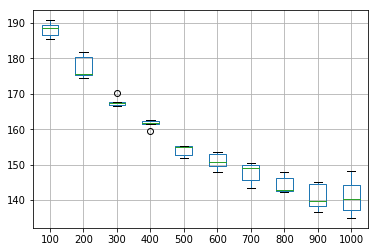

In [4]:
results.boxplot()
plt.savefig('click_LSTM_epoch_XRMSE.png')

As seen above, XRMSE is continuously decreasing upto 900 epochs but shows a slight increase after that. Let's consider for YRMSE below:

In [5]:
def scores(e):
    RMSE_Scores=[]
    Ytest_RMSE_1= [126.19908054424988, 125.29929397588785, 124.51360233967685, 123.28236860335326, 122.14515165728305, 121.06841001223843, 120.052674824899, 119.98836089552714, 119.45271053051128, 119.36620424815044, 119.51041356578938, 118.95784232576793, 118.91596178197406, 118.86385232335168, 118.52915076859661, 118.6015919565464, 118.35678115460435, 118.26287984868765, 118.36165102819015, 118.06871883687592, 118.24843048633183, 118.01738603688699, 117.88618637054488, 118.18340012773581, 117.66209144234033, 117.62942284084717, 117.684513821863, 118.08178087076084, 117.71959474634207, 118.4904798579085, 117.58659321023818, 117.7965620766646, 117.5049944946304, 117.35350355466738, 117.53854432127203, 117.49321150575896, 117.45780681338519, 117.15025923122519, 117.5576602068013, 117.30834919058577, 117.17690816922179, 116.97159456575159, 116.74251118237267, 116.5248529931083, 117.63168317648064, 116.91808517847967, 116.48865882110054, 116.44330306200197, 116.53109105134418, 116.69545007869306, 116.34778086336755, 115.98365406905646, 115.79270364266252, 115.4783883086125, 116.2954216199365, 116.07197630598161, 116.16301215048972, 115.7836192631424, 115.66810891182159, 115.66300360267861, 115.7370814222171, 115.7095759012333, 115.39799782753778, 115.27989255307004, 116.36602017998176, 115.64359303203508, 115.2724071907523, 115.28369921088486, 114.7954279318898, 114.5993330384422, 114.58199190680507, 114.75617625072437, 115.17318482459355, 115.46901203483299, 115.25873432244632, 114.77179724980238, 114.57551385891878, 114.31871972913238, 114.2626274268545, 113.99799183075987, 114.45902024085592, 114.67514353440559, 113.9334540117123, 114.44102421474678, 113.76491959498935, 114.15650255249732, 114.16360549810207, 114.11703786580358, 113.74811353156946, 114.35348588917695, 113.97690589405006, 113.5253770021106, 113.83212159257052, 113.58748290074317, 113.75901864349082, 113.3383268434664, 113.73861077249619, 113.53727251294393, 113.4685717975779, 113.3595444308602, 113.5791304813057, 113.2485545788487, 113.93788321001965, 113.31270994965506, 113.61007671932649, 113.34003540103411, 113.3959616265824, 113.41343276334206, 113.26695184009024, 113.77168605171771, 112.84261383587581, 113.11735499427506, 113.78411698887147, 113.19891905649787, 112.94285750956504, 113.64765799875538, 113.53232361574054, 113.16472367973522, 112.67177627176805, 112.29305936339344, 112.68840184393923, 112.17462048209121, 112.72357001231295, 112.89247866639904, 111.99908698540854, 112.18854614021703, 112.09879355539887, 112.2502605100774, 112.35933303241319, 112.14294008542939, 112.29192955093666, 111.71507301477499, 112.94390408560207, 111.39822730658972, 111.90404942687675, 111.41144832965223, 112.06887651463155, 111.44874814501274, 111.84214860108702, 111.34427356574393, 111.79533134167121, 110.47696421690645, 110.80949581139684, 111.14946862369892, 110.73686467807089, 110.64211560720368, 110.97418121432587, 110.3370165467365, 109.93183606458844, 109.79538328867562, 110.22494199621508, 110.46660673254526, 110.45495604081727, 109.49391119892665, 110.13148577425771, 110.68243492801878, 109.95997672410127, 109.52438425293434, 110.16360050809722, 109.13915958609284, 109.0642130047794, 109.73374730016954, 109.3906719116719, 109.10874845196798, 109.01294860020415, 109.75737102527603, 109.12353501011029, 109.1228488473907, 108.47055373594372, 109.5871413442559, 108.43501061534609, 108.0163191728228, 108.67303346197258, 109.12063398196756, 108.82071528107852, 108.88283499717295, 108.44453691619468, 108.58909441367949, 108.25838301945889, 108.18346241950677, 108.05184577417147, 108.57057346563774, 107.79348481606871, 107.3447700087745, 107.87451510264732, 107.76645943781095, 108.1894629747405, 107.74927178613797, 107.6034263592319, 107.91575848001976, 107.83338360514728, 107.53762839435328, 107.58725641993217, 107.5144728052725, 107.17470305885765, 106.94810438737088, 107.08726769293075, 106.81555920012592, 107.06055961584421, 106.97539042751848, 106.91227347684965, 107.27111779636357, 106.71095688083143, 106.5622725827037, 106.24489492617582, 106.68333364036806, 106.95634448405208, 106.03159695821091, 106.4863227461407, 106.35837115316303, 106.32357686900686, 105.72095438624014, 106.19375568241652, 106.47633052524239, 106.77541429052313, 105.69020059328334, 106.36760632205055, 105.56525156908086, 106.81472403386927, 105.93066491557352, 104.8917834455445, 105.47991676064122, 106.27319881101236, 105.16934291472064, 104.98388585568844, 105.05375832896338, 105.01412046338659, 105.45350073654966, 105.64971745568656, 105.04985183532092, 103.95845394324216, 104.616883653987, 104.67749359014472, 103.58731230474258, 103.69237106348675, 105.22831087642085, 104.8911726310245, 104.26444439380893, 102.92240726213844, 104.37480347997192, 104.11051912509109, 103.83092228794196, 104.23932182899502, 103.76148449932077, 103.4044802992717, 104.17210999256282, 103.37218302314892, 103.06112078657245, 103.58885947002156, 103.3716920665039, 103.08611888359563, 103.96947921514631, 102.29568111747548, 102.94400596158854, 103.35845825490361, 103.14897866613943, 102.55217760809396, 102.4304802517302, 102.87527521129502, 101.72486560948369, 102.35602758747578, 102.94948607323745, 102.93873280610548, 103.01966806584534, 102.73352925821345, 101.88002465142274, 102.87660034138725, 101.96447595277102, 101.7514822557048, 101.92890160219882, 101.60898754879217, 101.58570591350141, 101.77061569115985, 101.16001141124346, 100.50696217078348, 100.55206163528497, 101.39710891443328, 101.34905121689914, 102.5150562936704, 100.6925074186049, 100.06740130423707, 100.76433458221967, 100.42397926843533, 100.2225961812909, 101.12234959623058, 100.07052706059378, 100.43664942093702, 101.25705854456898, 100.97973527126673, 100.77408762141812, 100.2379148998062, 100.59714858540652, 100.98834453706901, 101.49849794362358, 101.11563141720615, 100.45341450234798, 100.88956724381278, 99.7421463414, 100.97413006190835, 100.18841837402212, 100.0966350710874, 99.21193834874808, 98.67293476803945, 100.74886687125775, 99.54246267836011, 98.83761812794314, 99.658415155237, 100.03379924847887, 100.6129166446287, 99.04258911859907, 99.90997423110801, 98.35012650322656, 100.18309213845136, 99.51511380534511, 99.87438312593659, 98.6974904012037, 99.60482773842698, 99.32717843568939, 99.80705233477765, 100.15922355837738, 100.62834980200773, 98.97915856638906, 99.2636209287092, 99.04028896703082, 98.64359670012647, 98.89754452530613, 97.77771644494229, 98.75339916567056, 98.4377768738543, 99.39270519272578, 98.96318995178787, 98.1052807726681, 97.77248926106041, 99.36148139019697, 97.60265875980535, 98.23075639577296, 97.90461317578459, 97.08374683436979, 98.42632949651791, 97.01044423562121, 99.53350892267858, 97.23839595333156, 96.88815541740534, 97.43640399655132, 97.57230629422519, 97.63224565302517, 98.03076570308437, 97.12652587002479, 98.0482910217521, 97.70562262812177, 98.45432606468057, 97.36389944861891, 97.47627619250602, 96.60440397407946, 98.53095599458473, 98.07403175431993, 97.52425765835041, 98.3074780978173, 96.90769971999984, 97.05804097395534, 97.1557554931813, 97.14955398554842, 96.7925892686209, 96.36923513921164, 97.01446707415802, 96.40225151684302, 96.27582317350675, 97.15581121836851, 97.51004091277534, 96.02314816838614, 96.98390808938373, 96.48212687402601, 96.99167571327723, 96.08801180367625, 96.11935604658957, 96.7121728629085, 96.26727104213846, 95.98121999589087, 96.37930010485441, 96.88858786122137, 95.93354225481637, 96.16403820420308, 96.27954561646183, 96.23821231277533, 96.87764270570368, 96.69014363280097, 95.88432540210864, 96.98264583474175, 96.14024112824265, 95.76715440415916, 95.86406345205377, 95.29061441984423, 94.63105403648831, 95.60797118898137, 95.62442412743687, 94.95926989222403, 96.40881818380747, 95.56653193728297, 96.06240013198462, 95.88662688089971, 95.71227235496528, 94.51653543234558, 95.22077465121505, 94.85529130031018, 94.61514802624689, 94.16075388382819, 95.2981884940135, 95.67425311653331, 94.48260171252875, 94.66177306516421, 94.76845136078948, 95.74981437207659, 95.22576564256393, 94.9219722116353, 94.40768553256372, 95.20346330443243, 95.08287634968364, 95.85496334098896, 94.27194856042894, 95.61750559790708, 94.17309130246768, 94.5602273124571, 94.23371865088129, 94.5844310692812, 94.10452640182959, 93.52169871085609, 93.38089208063262, 94.8217020837175, 94.12541271004609, 94.12383807923358, 94.1836574889416, 94.25217185519635, 93.83259007754013, 94.35382253923862, 94.22643960257484, 94.26679064748527, 94.77647108756521, 93.26883405599882, 93.41177713889292, 92.7163820468875, 92.84147883507086, 93.43593492885515, 93.11360410064725, 93.92213654561104, 92.82025254911655, 93.47111681598905, 92.57651577666527, 93.11203141185273, 93.6115557611976, 93.30844129609847, 93.359494414894, 94.0538603117133, 92.99330238829141, 93.29399618546387, 92.86538818715597, 92.16333548084107, 93.49015695855046, 93.26902933523779, 93.16680974830574, 93.51126418664784, 93.76996389002694, 92.40433364107895, 92.57458242866748, 92.80673524158948, 92.21486632000999, 92.42319933627931, 91.25653347291781, 91.54891942907759, 92.0737945320417, 92.21825596455217, 92.76781697085457, 92.72747214939712, 92.8149088716253, 92.22665979027333, 91.85554027303274, 92.02371597722366, 91.64996406732764, 91.92840586052787, 94.17538357058328, 92.47052766295889, 91.8112923556852, 91.97259822889468, 91.40497186665175, 91.61673482496384, 91.79259719507391, 92.28269236019693, 92.57942265437684, 91.44728917709234, 91.10010827723497, 91.54920561378637, 91.71293721377971, 91.4822934247757, 91.38908786051877, 92.14598123983353, 91.7921540390742, 92.34442319351243, 90.96022856900467, 91.19700499963365, 92.38351930482617, 91.04857342351586, 91.74529203286386, 91.29964301966642, 91.10781174431445, 91.10478254046177, 92.17549268357102, 91.16081050002508, 91.56163755328375, 91.35537169950734, 90.84940697898185, 91.30680262933515, 91.0596775751571, 90.79904618611349, 91.81072288053856, 90.50656358158508, 91.91203085569653, 90.70974644564545, 90.9535531604805, 90.78099161063763, 90.96482180455712, 90.34177961048026, 90.70083028759466, 90.10749370542366, 90.4964550000488, 89.97446407748568, 90.53793983475924, 91.01357974601625, 90.60417878032465, 90.71192337486288, 90.42514493424835, 91.38987950307221, 89.47712871263937, 90.13377269465096, 89.84473560309704, 90.58964599210675, 90.06536647557618, 90.23153187236895, 90.59957901596619, 89.53990368772959, 89.43535124244997, 90.09481397062588, 91.11195527040951, 89.80096207630613, 89.58372027746314, 90.08447873782389, 89.75851428531983, 89.22001694503173, 88.77147768258416, 90.66848026698986, 90.27112081107589, 90.22957101439324, 88.97287171178016, 90.74994003827005, 89.14357857393047, 89.4721766864728, 90.36738831108536, 89.8155415569025, 89.82015752310686, 89.27180652685333, 89.72854640729129, 89.06614048678637, 89.56733110620527, 88.8722513151494, 89.0744862046859, 88.62724866224967, 89.6915917355016, 88.70592018030369, 88.62822851210508, 89.84396712098545, 88.97815368522325, 90.88139034079238, 88.10083710616769, 88.84945111306106, 89.08834075461387, 88.58805513008966, 89.75455499814686, 90.11548591049711, 88.73307181516681, 88.29955092578076, 89.28825487349137, 88.62267773643876, 87.96383538654793, 88.37110275214604, 88.72418121228282, 88.54502202862147, 88.24350394067616, 88.88494099161552, 88.94867297368992, 89.03789689546491, 89.13504552518394, 87.89053850765622, 89.2727166223672, 88.81912472044428, 89.05154616967262, 89.62290561441736, 88.09806450979968, 88.2412166146789, 88.40724514863842, 87.86773396555667, 88.26971906885596, 87.97632473735797, 88.68800177167371, 88.25528884063154, 87.9959694804569, 87.8527227230434, 87.9297463466415, 87.42473945382464, 88.62328380353036, 88.77838211778783, 87.84410630875216, 87.64418438369451, 87.73647731271984, 86.94200917907921, 88.09200324152444, 86.79082345327105, 87.53422206366002, 87.38494881700531, 87.6725253212272, 87.97816750930393, 88.22188048134173, 88.3124807432399, 87.117984537483, 87.59385338796474, 87.12212245461536, 86.77905064525217, 86.64500967090638, 87.11212717320076, 87.79610989354694, 87.11465220949466, 87.61976570838551, 86.92906776838227, 86.97063165633041, 87.45465245454288, 87.29550345620623, 87.61376376553467, 87.29604385994384, 87.68641886981138, 87.59009553966617, 87.15846946397856, 87.24186533505339, 88.33974358863775, 88.07224773655348, 87.38811288063215, 87.71370080288406, 86.86868083932346, 87.44419985133048, 86.66399575962222, 86.85517471598983, 87.23998997283785, 87.56681201107052, 87.29064687289839, 86.02994017068245, 86.93678133652367, 88.15993773449149, 87.10838896641364, 86.98277931106865, 86.69489372071548, 86.97249502502368, 86.8290269063961, 86.04611786672419, 87.19824912263562, 86.54552759475239, 88.26921724008932, 87.34825414060384, 87.19483570061668, 86.98259099560619, 87.25735857266214, 86.81540691558702, 87.32503491769286, 87.0045951753469, 87.01847498401007, 88.45938782079963, 86.27461620232285, 86.41715193550425, 86.74050843831266, 86.21162146958102, 86.17338344196031, 87.06624856352093, 86.70166139898035, 86.50124268720798, 87.52478102586316, 87.19854618319229, 86.10651595206765, 86.52790886658474, 86.08045165357098, 85.99945987914099, 85.81639202467974, 86.4813165743964, 86.08225932154568, 86.28809137888517, 85.91874772649429, 86.10134609350648, 85.7985516596886, 85.84803988783895, 86.5059099057716, 86.53969191496668, 86.73527151217134, 86.49780543067095, 88.00335828501137, 86.06917046542709, 85.98288381839637, 85.53697982101082, 86.1782315183882, 85.93652825884477, 86.0764292434039, 86.42836340559286, 86.55908659889676, 86.13055507592829, 86.03481456347092, 86.06600994593427, 86.25016962886755, 84.4683089941966, 85.80905747707028, 85.07052229903931, 85.95249117804629, 85.39991931374344, 85.34278134646549, 85.38415852753965, 86.15129655586948, 86.13792126254327, 85.69355432133007, 85.76144393023391, 85.95206064811167, 85.64022218620559, 85.7497188948236, 85.35364875066, 86.05721225942715, 85.93744301620468, 85.55197659608935, 85.32963284033022, 84.91884516814292, 85.50728584979379, 84.74684858442349, 85.72504814929785, 85.60970125723385, 85.59831490712047, 84.79038207926583, 84.88616522745997, 85.43484764758104, 85.3777537409652, 85.33469995949282, 84.84099224794596, 85.48172696035554, 84.94344318074255, 85.60071527842284, 84.90237219573082, 86.09267219461101, 84.57307777360101, 84.84842939554281, 85.26202743842818, 84.69502694572776, 84.47371221807897, 84.19447490568108, 85.17460360997491, 85.37975651647072, 85.14990737175316, 85.79910224571097, 84.69067267598201, 84.84081824537293, 85.14899596500585, 85.92784345502953, 85.06442382311, 84.77278059059712, 85.28250979151687, 84.65947942901225, 84.48276459051354, 84.57180108469078, 84.66268286052595, 84.27827307627034, 84.84397081918229, 84.01030275216871, 84.72260618524994, 84.82920616898069, 85.19541085063163, 85.05431487027349, 85.324822410491, 84.49893959944369, 84.31945276746696, 84.9437475693298, 84.04963710315839, 85.09001068105412, 84.4403020780682, 85.60406166643865, 84.48543485525789, 85.51230123167237, 84.73179813593624, 83.54186221138343, 83.9592287404748, 83.64688730390037, 83.65781233595182, 84.40354150110119, 83.54683046410933, 85.15177619335759, 84.16090393348364, 83.20138991344892, 84.66323419037607, 83.6235818464403, 83.85746887435093, 83.83424718640963, 83.83491441468708, 84.58240687880514, 83.3992949560418, 84.05923065488042, 83.96645540016516, 83.5897633182915, 83.87714933799654, 84.24269830980532, 83.82674894871113, 83.26227005312354, 83.35284832014749, 83.70009062351461, 83.21348650301692, 84.90121314487084, 83.1040803985612, 83.63587712907328, 83.05885021672395, 83.55429972086456, 83.27190219770912, 83.3601899273178, 83.53350778425865, 85.2111378346932, 84.2926520738977, 84.11197102641125, 84.33837038298866, 84.44918212011646, 83.3869833002269, 83.71551453537685, 85.22550568820901, 84.11557915204114, 83.45456648650442, 84.30594949986435, 83.66511939823766, 83.80347162139765, 85.15060129629545, 83.5590966766084, 83.9988046734288, 83.80363926548198, 82.6330172363844, 83.74415538286536, 82.81424748652388, 83.62387688550689, 83.5099349304894, 82.87897290890231, 83.5054379841404, 83.27168629537351, 84.11940417305905, 83.29914631349779, 83.018618491299, 82.85774681649423, 84.55862716832597, 82.90551172592018, 82.89320948173189, 84.14599125141585, 83.12141844695823, 83.16582662249895, 82.65261270794471, 84.2864628075122, 84.38255907681747, 83.35161166416378, 83.17160120773966, 83.34997189195084, 83.55502951012302, 83.56391687806182, 83.1015705844678, 83.2758754769917, 83.11425991805972, 82.76478145992485, 82.87218540548426, 83.52637750094077, 82.54983180926236, 82.30797339095236, 82.9154016898161, 82.62488769673968, 83.13296172466063, 83.11564374577311, 82.575060754581, 82.85859460040439, 82.89949591454445, 82.56072267350845, 82.36840984499771, 82.57084110192186, 82.59018840173891, 82.57838640485664, 83.49413996726125, 83.19906342480702, 82.26287362787484, 82.78671003602898, 82.92899478821369, 82.38360695876663, 82.4605480183764, 82.23054103856015, 83.49506925005312, 82.32660656035779, 82.88999344296666, 82.38965878189522, 82.37765395461561, 82.47647226492451, 81.88740476042503, 82.0344311072133, 83.15255294913182, 82.11806003740051, 81.67246593298493, 83.06655107607752, 81.60276240032822, 82.47228951915483, 82.38318009363189, 82.39896679964495, 82.03371798576894, 82.45687705386034, 83.88916744874582, 82.58666590236983, 83.18148787894151, 83.29634070435341, 82.59766454034522, 81.77158455057092, 81.6646253818521, 82.46575312380803, 81.9395265703983, 81.86539838903667, 82.87788956517468, 82.15144237354242, 81.99364247225229, 81.97465899807655, 81.90662251298201, 82.55638683175164, 82.19908276878121, 82.18640655688242, 81.96437618995914, 82.5072680098212, 83.17501541748314, 83.05586954674193, 82.56246950861075, 81.85935615430391, 82.78543106278686, 82.63016225744452, 82.05169656145304, 82.21199758704708, 82.2230012670683, 81.74685400145826, 82.08228074557138, 81.9321220445674, 82.11978314972716, 81.63223581200788, 82.02683345945003, 82.4241405202223, 82.15811129079242, 81.84467342986589, 82.0925347341883, 81.15209488151856, 81.82247436840335, 81.758458380055, 81.7316748326345, 81.68415691318089, 81.42504580817763, 81.89473548628375, 81.3487597533134, 81.67938686750014, 81.45070139004166, 81.62456615789763, 81.65852900290449, 81.26815954972629, 82.44270120270043, 81.82366527487054, 81.68104590391633, 81.28617221803339, 81.05907905086326, 81.31231922000916, 81.95110762657495, 82.3794496740028, 80.77819670397929, 81.52697916203483, 81.70657983625446, 81.37030628554467, 80.64819209013324, 81.39686924781057, 81.44703011914459, 81.61435165654844, 81.97656310804159, 81.40932172774492, 81.69191481001586, 81.3940610672346, 81.21867045283265, 81.50726877145787, 81.93337682088492, 80.58002535968048, 81.16612972309838, 80.98030523554641, 81.02817638298642, 79.89648040356113, 81.00789045607377, 81.96501572112275, 80.80465996847143, 81.0647921978529, 81.57222739080252, 81.4284049560479, 80.78887687878468, 80.79505695593762, 81.79281767321746, 81.46132850001963, 81.54753778182354, 82.06104843040987]
    Ytest_RMSE_2= [126.68705198168927, 125.1506483520623, 124.1951216393099, 123.56850919482882, 122.91976289971403, 122.07092335782187, 121.40432308279833, 120.10904005245142, 120.05090443475484, 119.21255624709669, 118.78881313641726, 118.85869926450081, 118.73428745336686, 118.66539547412758, 118.61743393288269, 118.52475977842225, 118.1954575897196, 118.59468995925316, 118.2005715160888, 118.25601790391387, 117.87459643820196, 118.6016801949781, 118.09374116538679, 118.51916410480437, 118.1806056102184, 118.32418784474235, 117.33603332415926, 117.4929335634151, 117.75040321958545, 117.1833143241654, 117.12813854445103, 117.16647315187795, 117.1844601534882, 117.54343172825945, 117.75293451880506, 117.54634306096108, 117.18583846857123, 116.56829640587972, 117.36077812724547, 116.81641143847098, 116.63532430819701, 116.49680087348545, 116.32670028577952, 116.73909059135703, 116.64851408121223, 116.13548247186984, 115.92906426639952, 116.45633404921958, 116.14082469884724, 115.86877135936041, 115.88423114446996, 115.82828242523435, 116.30158224738348, 115.81299337221267, 115.56426606691117, 115.2986187473322, 116.01586196388075, 114.94981880765995, 115.92932804526819, 115.18504881374572, 115.42427098269366, 115.42564676759186, 115.20104874876526, 114.7878339173048, 115.0514565188381, 114.47965053955438, 114.09694952216586, 114.44010795079043, 114.37565012421074, 114.70080303388814, 114.17655321137367, 114.15559057569499, 114.15268540084824, 114.47509743150613, 113.8548946353259, 113.69089084816109, 113.71931144512304, 113.50501493144064, 113.69170549962793, 114.13414015440905, 113.48531038594925, 113.72075142528533, 113.37004345351058, 113.77979079919716, 112.84213354113, 113.48302871566842, 112.97600168728144, 113.1887408479144, 112.68720489042795, 112.6180548588908, 112.78479271627667, 112.85973699702684, 112.6928712179427, 113.03881538166497, 112.80608771663557, 112.61209980181543, 112.74066508550929, 113.12136574118146, 112.36309454425763, 112.0393822317827, 112.04680096674865, 112.51877403750329, 112.42919379154921, 112.20561629626253, 112.31323859841005, 113.32725387772771, 112.83686079937898, 112.28888932177415, 113.34323175774963, 112.503414172146, 111.968718298248, 112.10481538862365, 111.93166970450964, 112.28112475164527, 111.74476781808767, 112.30927191777, 112.14391723596302, 111.91175379599414, 112.41543105708122, 111.07542001494149, 112.07108338653165, 111.45990618257535, 112.59390554912015, 111.45390108038261, 111.42988773105307, 111.09524968766482, 111.66924072243997, 111.44460675098532, 111.17728646500424, 112.0296256210119, 111.03712841029828, 111.19252186463027, 111.72860061789288, 110.90044238328726, 111.01594860681965, 111.3790166674369, 111.22675337229244, 110.79883716445977, 110.95075170557173, 110.74477575617928, 110.78153803157699, 110.69844246274283, 110.69341738893006, 110.71681987788556, 109.81792890095484, 110.77538675216465, 110.25805305473372, 110.17038253602804, 110.3480443121156, 110.31213310422817, 110.14009044734604, 110.53954919059242, 109.78395137636912, 109.96962422200173, 109.69993403202226, 109.90850615559582, 109.61519192190919, 109.333347056563, 109.90039927711956, 109.86979893986747, 110.0594408567853, 109.53405362292506, 109.47365850259247, 109.34885006812009, 109.4962833543985, 109.50043866122918, 109.00437307674444, 109.20322209967095, 109.06202732358943, 108.79207725747929, 108.81831374255677, 109.2189679421392, 109.19312407890516, 109.04814985884266, 108.75242131367604, 107.6651559927048, 108.6777467935157, 107.70252413782782, 108.19463283226872, 107.78673292323498, 107.94482048468177, 108.05123825386168, 107.7270131660295, 108.55015531244749, 107.76266117963286, 108.03038472268267, 107.73122462942975, 107.64036229975193, 107.33439701071596, 106.98564296031864, 106.69550143174872, 106.85353242749271, 107.65184505432329, 106.46625066051988, 106.8002445675488, 106.30737434247904, 106.5500424528973, 107.13585029293073, 106.48155041461266, 106.16450363518298, 107.35489000904501, 106.53561407892337, 106.38265020125132, 106.06367969701161, 106.38162580476148, 106.09323784541242, 105.92513098647002, 106.59989589082613, 106.70852266575423, 105.49830742301823, 105.58496159443176, 106.27157193541454, 105.27887585800497, 105.30508053428096, 105.74795190003411, 105.63409582646312, 104.95194745529126, 105.6719833310784, 105.39091143890569, 104.5545049737249, 104.08300096568735, 105.03817522370392, 104.54547015291178, 104.7583165298012, 103.91765460835609, 104.18898952184759, 104.68208333626036, 104.14088994384683, 103.94655799073831, 104.31490849704655, 103.68915941482209, 104.20911099015598, 103.67975542077573, 103.43533688396802, 103.69562703681555, 103.68617270102837, 104.09572115405574, 103.25394211964701, 103.8195940988828, 104.19394507715869, 103.87967600179775, 103.51366412029253, 103.65698119023322, 103.28295023108927, 103.43554797060479, 102.89537399833482, 103.42505476705665, 103.276648717523, 103.55262810086901, 102.45511186551272, 102.91782795023714, 102.35569568652537, 102.38703736418883, 102.21696106979434, 101.6848128964754, 102.42767719639875, 101.46985628557795, 102.06851641290505, 101.97134854789005, 101.90353512814299, 101.8857790880688, 101.02421015782147, 101.86409333748233, 101.11209707087679, 100.8984442134179, 101.72630104786352, 101.51854780901532, 101.77181989905476, 101.10350960890396, 101.5251423600034, 100.6874406830391, 101.05508821601508, 101.37381269379178, 101.43593045747006, 101.04206173374351, 102.08640602791002, 101.58417211784501, 101.01499430054955, 101.21485746782196, 100.89020833125994, 101.73599911036774, 100.72480000328997, 101.18149198672783, 100.14126370282864, 99.81738669381392, 100.55180205949284, 100.2762843861625, 100.49380541993425, 100.76599316574533, 100.93280763451999, 99.39905076080635, 100.36505900784961, 99.39532856867436, 99.78196768743106, 100.54251663958307, 99.56132998858195, 100.20025414949968, 99.80293540450207, 100.61155747359538, 100.00854528729498, 99.3487430591332, 100.63724584987504, 99.37660059886983, 99.0022115960506, 99.41532908812704, 99.46587417871775, 99.26324174823672, 99.15616699595434, 99.41044787500499, 99.43154885507053, 98.11721853205201, 98.2461254020537, 98.90775945545792, 98.83670513282637, 98.70623625059699, 99.0041242109892, 98.06142882168068, 98.2196016810355, 98.46807409735143, 98.88591006624665, 98.00015735185411, 98.39304769649534, 97.93221530710062, 97.94288326643678, 98.51293428809264, 97.31209370135116, 98.01388863084512, 97.89918173670313, 97.69746578068866, 98.73908572375899, 98.4586392078254, 97.59035398323918, 97.24766916893331, 97.54668365723028, 97.47253059848086, 97.72887784041895, 99.03970264531348, 97.5570306509061, 97.51447640792222, 97.12381929981693, 97.43299880689668, 97.48236296709649, 97.45678685174182, 97.03474316809401, 97.88425317142314, 97.00635774282374, 96.7793581820575, 96.63194300837026, 96.07454072854034, 96.5913360829087, 96.50139687738711, 95.92121349391086, 96.76104304277585, 96.3848279581171, 95.72289383960165, 97.10252892999253, 96.13886331903237, 96.20795582781778, 96.5546404289964, 95.84444073693389, 97.09551549054635, 96.06228676026946, 97.56587146794077, 96.30603246324634, 96.12234572060528, 95.93701615014342, 96.70212857435246, 96.26147546421494, 95.62287370078496, 96.13626210934451, 95.36360865551161, 96.1892054257346, 95.45769227072995, 95.05602180606971, 95.07126757287142, 95.47355451594831, 94.76648224005976, 95.66716426839466, 94.89526941281487, 94.90954925315913, 94.88143765521859, 94.90235394525499, 95.42978807725567, 95.84259811704075, 94.99118719398946, 95.68565489901395, 95.83430339392325, 94.96643419875403, 94.79341462466672, 95.45252873298864, 94.95343689165355, 95.40118684691852, 94.80788605185064, 95.22026035886702, 94.61690322988628, 95.33775797378942, 94.71026736881548, 94.6653221430794, 94.20066458322451, 94.4780730890044, 95.10293636699133, 94.98448240967208, 95.12825499520342, 94.40426772296654, 94.81121447064548, 94.36967670700265, 94.47895343413458, 94.84058339337695, 94.64073946106056, 93.9109138174835, 93.60899936609646, 94.59963168195719, 94.18209901143774, 93.64678884430128, 94.16814978613115, 94.13460124407712, 94.57886514761147, 95.09136027443428, 93.19749306447888, 93.48621342322198, 93.95141740873633, 93.71879485337149, 93.19349457559078, 93.49529571286725, 93.61941113361573, 92.77654154569179, 93.3612897691025, 93.30548775327402, 92.79145680751841, 92.90661131594081, 92.23345556915943, 93.61381692100848, 92.86018559316821, 94.39640328633116, 92.77037843413962, 92.30369811014933, 93.21322907441879, 92.67043653561133, 93.69607147325965, 93.01593079327318, 93.4429672850387, 92.32749760992154, 92.68411912011206, 92.60739496768, 93.55492130574726, 92.45898437318931, 92.55987989912362, 92.2116616875923, 91.85211492796267, 92.28434956224358, 93.64170324334349, 92.75711609810459, 92.46414590584426, 91.72969394443271, 91.83871005046294, 91.86381648472835, 92.87376093414775, 92.68265362322876, 91.59992165910533, 91.24866104428449, 92.68136435373586, 91.83320975254928, 92.15417334356358, 90.97309250592664, 91.31661689434152, 91.35104745381709, 91.4823147378722, 92.05796534446247, 90.89055112127375, 91.44991556288875, 91.94433343954488, 91.04362224591647, 90.98642688178498, 91.52603077402082, 90.83842885902013, 92.41698044222085, 91.48465200816972, 91.79214854903219, 91.79908086982559, 91.52459894796365, 91.42559125532047, 91.85571945111863, 91.6349959427228, 91.81211554146721, 91.64519376253281, 91.81212768172787, 91.188806453102, 90.97742084837523, 91.71799025892291, 90.57899168915571, 91.78133584278694, 91.05954579417293, 91.40268416927196, 91.01513997782621, 91.65217053189714, 91.35639233388646, 91.2894370343324, 91.20315728646824, 90.8577804732, 90.76727665884914, 90.41067259686558, 89.61321995912046, 91.48058148666479, 90.27128520624954, 91.01621900689594, 90.94543893273051, 91.04679645077874, 90.36416108776322, 90.99597523198558, 90.26030837465031, 90.69966869132513, 91.3851742097687, 90.6753289000002, 91.35098105774928, 90.8580488356013, 91.03208160690377, 90.5317343906108, 90.31612669880303, 91.2051890183358, 90.16134471428236, 90.18782804874967, 90.00922701288486, 89.59888983010138, 90.91174371386859, 90.16102555767289, 90.83546942614191, 89.85142664518777, 89.93706152748888, 90.08100135593264, 90.09074253518509, 90.39530872793888, 90.29237411344329, 90.38747201771885, 89.1114127941814, 90.89333802665242, 89.5954340268319, 90.57511255316146, 90.79301671130091, 90.12877333021498, 90.39743814653998, 89.98875479183555, 89.23851641679978, 89.78115079707807, 90.02089323568835, 89.03048241795479, 89.71551043837157, 90.7378475986928, 89.67687670900646, 89.85024984200912, 90.97248632453162, 89.98297628661943, 90.00790167743169, 89.46097166732821, 89.79676681845979, 89.78337739021516, 89.82794714606766, 90.02019941377954, 88.95833246287496, 89.86632437253648, 90.20407011259844, 90.42701000004159, 90.19289017712744, 90.42365902676003, 89.52160158574414, 89.4858745231552, 90.2556493938382, 89.09433682964152, 89.68289242778329, 89.47816416013238, 89.66473941475272, 90.31105146875139, 89.05601507705155, 89.85504979671924, 89.08315818842881, 89.03913225616955, 88.80528894730858, 89.88312841167951, 89.9911049395426, 89.35729424432523, 88.68897110975328, 90.23074553611832, 89.45104057217115, 89.53907527034156, 88.6119285157877, 88.52166174484854, 90.03254940851942, 87.84926627889433, 89.4311549451395, 89.37068246282793, 89.03351100493452, 88.42752631491784, 88.79434228200977, 89.44632476480824, 88.69446141813182, 88.89260329726905, 88.01520476074894, 89.0013918573706, 89.52882243504857, 89.11478541430589, 89.48198979028616, 88.77824832859628, 87.80088492591452, 89.24642566721562, 87.80971491444784, 87.63346938861986, 87.98184749459627, 87.24821124675624, 89.10782311547001, 87.57944806240907, 88.00659732049954, 87.47279857244854, 88.33247666792661, 89.04625056791389, 88.54354882550935, 87.72975568646643, 87.55060791075715, 88.5943367069605, 87.99523014852358, 87.88437714726234, 88.08331787964562, 87.84777507853337, 87.91309264136189, 89.12671325307134, 87.31844611777235, 87.9621176199684, 87.5718776662951, 88.30139041560174, 87.61046992742266, 88.07686088606049, 87.43267531262718, 87.90646777840954, 88.068118556348, 88.45046966508366, 87.85270574728143, 87.80426761315998, 87.82722362235998, 87.75705214871361, 88.49625463751447, 87.49134278753573, 87.44240546726502, 88.04776987303644, 87.85422415386579, 87.06642005044205, 87.90302959581993, 86.7770742329262, 87.1976111777954, 87.21947088918026, 86.81543252839214, 87.39759771965929, 87.22332833120566, 86.88318187403566, 87.3216393705533, 86.84569430207146, 87.71509138304022, 88.31676317894949, 87.05540483601455, 88.61976744013045, 87.382321081109, 88.70945783196234, 87.03210895331065, 87.9946406980015, 87.0788344419661, 87.12849334949554, 87.12823456300268, 88.13731181344134, 87.45438793011485, 86.9773455589246, 87.28870222711834, 87.61166629980684, 87.14436004671232, 87.23976568589401, 86.62267156953895, 86.43242760097816, 87.11839797607664, 87.24117483560488, 86.47623275072557, 86.82260646286501, 87.27573093627694, 87.36899643348167, 87.18686197021995, 86.85718099111793, 86.48562145273284, 86.93439462779921, 86.95917203657122, 87.87677958959192, 86.86257438618244, 86.36446917787481, 86.68644233915809, 87.15273845010213, 86.41170594133536, 86.926342919168, 86.65418759752609, 86.50669424367918, 86.27248938644149, 85.73334889065943, 85.95414190925385, 86.05983506360872, 87.24034538294109, 86.57432574465497, 87.13179965416754, 86.15771101644692, 84.98060944105383, 86.43599481996978, 85.66020084103788, 86.08414157779295, 86.20423748132843, 86.58347806021449, 85.88964085927235, 86.69494696064022, 85.99551611091567, 86.05931298944287, 86.55695587286495, 86.01489695346399, 86.85769296627257, 86.17980158210388, 87.69657448647757, 86.36693120128467, 86.72003108579078, 86.39857384351471, 85.90140614579333, 86.73395744373316, 85.8690927506911, 86.09104297296057, 85.90452559944755, 85.62423346294952, 85.9750227656444, 85.75674436120019, 85.90551209629356, 86.4948351848718, 86.63702123721815, 86.03380570281016, 86.17757852762222, 86.27972243467288, 86.40358740201603, 85.89497978846818, 86.50839262432669, 85.29641761743599, 85.69482938369984, 85.82050588324608, 85.81330541315019, 85.78460294657654, 85.3442464362923, 85.81522162513879, 86.05303814795462, 85.95803992320094, 85.92098302589214, 85.40467533899229, 85.6059715860336, 86.00418193136142, 85.36826387782747, 85.14984508741593, 85.38131637396825, 86.01431886931474, 85.0607523595684, 85.27101408524602, 84.34151447424219, 85.39549406083097, 84.69502289587021, 84.86884006122443, 85.98239199603721, 84.55814191347245, 84.84805552808805, 84.47440184214975, 85.49758166004924, 85.59223465399062, 85.10537671467974, 85.316738597559, 84.87214520147451, 84.26086613550495, 84.85123467658546, 84.96976109958999, 84.99291912435575, 84.50203858191783, 83.92144825236713, 84.73530072075069, 84.92281121657665, 84.76149132439797, 84.91171908439692, 84.51655353954737, 84.75949656609123, 84.14383782368931, 83.60985961792322, 85.51855721754403, 84.23375481375915, 84.84167272773432, 84.46081162682715, 85.36385175621061, 84.77645712186869, 85.33542098556734, 83.87038003809332, 84.53795650688302, 84.06030274931847, 83.93560283488448, 84.44770777524874, 84.52710027388684, 84.3240271989041, 85.20600175163261, 84.25976726880234, 83.81848479416252, 84.02167172839195, 84.2005656378974, 83.91270026335658, 83.36478615879838, 84.07733529125451, 84.02613970917864, 83.72625925462934, 83.4037463353143, 83.99350624051736, 83.99697936327384, 83.8537803034719, 85.53474418469642, 84.35019616340605, 84.54013036613435, 83.95871162774326, 83.9407923670701, 83.99795169772946, 84.32586494411109, 83.77599617104993, 84.25030404648628, 83.61979256507009, 83.73604808830652, 84.0417784732756, 83.78578568282731, 84.41458710757604, 84.5105024934525, 83.50316476073428, 83.94469663909985, 83.4289907214715, 83.90187489530642, 83.9134449554568, 84.78528332307673, 84.22985957423153, 83.2980989948624, 83.28043142172343, 84.05324013951557, 84.38564424225217, 84.00060443491155, 84.2519262952707, 83.66654194387908, 83.88423028319653, 83.83418668139876, 83.76703804140384, 84.05802752528973, 83.88205480019855, 84.22491836698488, 83.37661412178095, 83.80042372644772, 83.21356540034067, 84.00499838475352, 83.46690614003023, 83.49604272365546, 84.12810658470133, 84.07974325547896, 83.38361956051874, 83.6569143995371, 83.34843757069254, 83.47406064200209, 83.43605854326846, 83.5013198039014, 83.25985804368808, 83.13713015119711, 83.36286893904054, 83.7396515968403, 82.89591026471744, 83.40118882831455, 82.66332350674365, 82.04214105736152, 83.44293652742583, 83.46752285677105, 83.61757046293559, 83.7133864465008, 83.83273569962626, 83.43952213122122, 83.17977814784479, 83.7246947020695, 83.15210526599816, 82.99597842185001, 82.54360156288811, 83.06617350397288, 82.34390693513463, 82.77640223386328, 83.14277776075103, 82.63471656690457, 82.55376892035686, 82.5097609656415, 82.64854891829278, 83.09619816773665, 82.54013975757239, 83.75804491197195, 83.50112720763869, 83.02016627026951, 82.35804316161065, 82.46998952327799, 82.61504438499406, 83.26419444761717, 82.61683018715193, 83.10129612054517, 83.54591186306202, 83.28625956360644, 83.04309501466844, 83.28779381777011, 83.40425909074767, 83.10697028282199, 82.43219998116605, 83.39813521655512, 82.56305160503435, 82.77813803345397, 83.23938200254437, 83.07075852036046, 83.18260259795726, 82.90235638535928, 82.55447511241151, 82.52183885952347, 82.35283450685527, 82.5324550648797, 82.15334452061242, 82.65771716740223, 82.48671687648108, 82.23364647973811, 83.14050678792056, 81.64223402232582, 82.33280078603636, 82.28083142647749, 82.20277046844213, 81.981577954342, 81.79999851944459, 82.25089277860646, 82.2141187866628, 81.80788573646979, 82.60533759702314, 81.68733454387954, 82.38067403609594, 82.15325341868534, 81.9491504558944, 82.1653415927642, 81.54753308814644, 81.70127522413668, 82.04430316110101, 82.25500247391089, 83.37420512902334, 82.39310197090708, 81.81453650958207, 82.53917948093077, 81.64554865746452, 82.17205749511129, 80.9483609582501, 81.50915314258741, 81.44016193464924, 82.59022194404604, 82.4037543005177, 83.23157869386309, 81.4609036149659, 81.97699786936948, 82.46793378094864, 81.5584777396002, 81.99258551154564, 83.16021464506316, 82.74262920522345, 82.23838581260277, 81.9914603184865, 82.81320686842169, 82.6273625508002, 82.78425732492089, 81.9762066562303, 81.984901423148, 81.77331461103373, 82.16721522161046, 81.59637478358223, 81.37478240394267, 81.48746332271234, 81.43953117730807, 81.28259089970655, 81.7513508634369, 82.06545353307315, 82.31327897264728, 81.78009729575291, 81.28781379415167, 80.59651933935653, 82.28374635916899, 81.76707972531958, 81.97590762871972, 81.30832360032713, 81.49097094131315, 82.06286110146748, 81.69897539777338, 81.8572492565548, 81.25065797648725, 81.14178464209132, 80.83038189122288, 80.54319056650162, 81.04848991732077, 81.00986826043085, 80.94692910271434, 80.72017047095456, 81.38574353963637, 81.45219078388448, 81.55351491286432, 81.55483215229185, 81.20236379781164, 80.95789613536044]
    Ytest_RMSE_3= [130.51289972052675, 125.71612674830257, 124.05070162247196, 122.630563456835, 121.44300106179342, 120.33108211854638, 119.65724764371853, 118.6886657021905, 118.2396251282163, 118.09828860364043, 117.90137225388064, 117.99172274652811, 117.54621720067044, 117.3074560546575, 117.45163709335841, 117.18970787489164, 116.99077667237906, 116.71896956379886, 116.5546601025883, 116.2309756362577, 115.82081304582204, 115.79171326264512, 115.96683857421438, 115.70153132321819, 115.68114803753686, 115.23898822878859, 115.30621838470785, 115.46918042741879, 115.29954718217157, 115.37645605010414, 115.30340861088892, 115.06562570974954, 115.00942978231677, 114.82425533903258, 114.5685927604173, 114.84401864349759, 114.39226026229103, 114.37360399869704, 114.30392757542805, 114.44660688538326, 114.12990773166595, 114.10938647445633, 113.78400212607042, 113.54347239663184, 113.89675339129259, 113.49228697910408, 113.41605531967414, 113.22613769570047, 113.47654480649474, 112.4979065918225, 112.94255865559661, 112.15778404738322, 112.72058928044913, 112.21437434581986, 112.17739284523627, 111.95300908296785, 112.02291974048211, 112.2386734247451, 111.64834291079893, 111.5293015206219, 111.10982013506339, 111.56663698538576, 111.2384446574058, 111.43597055807987, 111.341730496996, 110.83793949998238, 111.00399226966137, 110.73781363934594, 110.64280842096504, 110.57101030781818, 110.63747226294716, 110.23215128743396, 110.2754337683132, 110.31437980670691, 110.05988374779794, 110.33966406083346, 110.48007732102309, 110.58488895771437, 109.90684734006119, 110.78166719303292, 109.87045410557347, 109.76593235067482, 109.66402246611273, 109.8939006873371, 109.64157102648309, 109.55601495354746, 109.22734589573946, 109.9672123075595, 109.37615693047233, 108.9767860507155, 108.90668934466055, 109.25708204786942, 109.1967855933885, 109.16003396264814, 108.78867219596539, 108.91559488996423, 108.89291738535012, 108.53892915764371, 108.90936546976013, 108.52433341386337, 108.8875279052756, 108.60481006350243, 108.22503138740691, 108.41179845060057, 108.20326125645529, 107.7531333622444, 108.03522667884424, 108.02808671310464, 107.97028651119051, 108.0289983077659, 107.67443071044882, 107.69221457442272, 107.84103345793585, 108.04927093864688, 107.71621343590178, 107.38082787420902, 107.75339738988471, 107.41474393044571, 107.70890636232338, 107.29736923934637, 107.46298890826738, 107.93071263502426, 107.4870673167728, 107.11287113388177, 107.22835677560175, 107.04105914708805, 107.14205314051728, 107.11397723316232, 106.96513939035461, 106.88575379064471, 106.99614545560371, 106.80811666280425, 106.54126399829195, 106.6369278128398, 106.75272330380136, 106.83354948408333, 106.8862645688865, 106.50023485179463, 106.96983596883872, 106.37416863570994, 106.08604831812723, 106.26165745673032, 106.54023459082948, 106.18201226980283, 106.34188389353514, 106.2723404242086, 106.34182667760976, 106.00917676976046, 105.90495647948146, 106.05429781829444, 106.34669902499478, 105.8500828059886, 106.33080147893365, 105.40189254570662, 105.74142295311385, 106.38844837832484, 105.64245261672359, 105.85249120035664, 105.87883965679531, 105.99549472442699, 106.13133142713029, 105.84694151190764, 105.68278887144405, 105.48750848940291, 105.1363366194472, 105.88997114189763, 105.19958871744224, 105.23908395967308, 105.42320779160423, 105.28831091891861, 105.55994600802478, 104.93964131797848, 105.38986499244365, 104.87831871267583, 104.81883745178435, 104.96911530760687, 105.15945832128327, 104.82435987856651, 104.42561633870083, 105.21962218626679, 104.334394539918, 104.49397730273854, 103.79380548988121, 104.29092914007796, 104.347141139898, 104.32129275831483, 104.21051351217156, 104.15730311970152, 104.296104040389, 104.14257942915678, 104.34865121879848, 103.81598897278276, 103.53726429151028, 103.74949187727789, 103.53610942543293, 103.70207821303983, 103.6072237131117, 103.38769547706474, 103.4137147449991, 103.36352794576517, 103.46477601072492, 103.59066488288947, 102.53733597396503, 102.60640809139682, 102.80862520493343, 102.61677843003775, 102.96927177637455, 102.96985093719529, 102.299389303253, 101.9487984750042, 102.56564569545087, 101.8917423667465, 102.62537810211722, 101.88891243279055, 102.44347076669528, 102.78555841911455, 102.12082082657635, 102.29207791593021, 101.02743449694408, 101.81891920712513, 101.69183806387699, 101.66365431370942, 101.69383139996033, 101.46016691970854, 101.66234555896813, 101.52476635936894, 102.14410816328467, 101.01913035537336, 101.92470810781346, 101.36907873074938, 101.0216478298257, 101.43092465221125, 101.25495121499345, 100.9687519762051, 100.8276034083085, 101.42934430729748, 101.17661288401976, 100.32319174539606, 100.86554478119022, 100.66040940646823, 100.46938109401266, 100.81483679441246, 100.16195901863057, 100.44277481544923, 100.50700991193938, 101.13793803687568, 100.80847112496889, 100.83781748681922, 100.21946595825314, 100.4020437381965, 100.06324548203804, 101.18545900258806, 100.43834560700205, 100.59597487124995, 100.16733312430837, 100.38510324481285, 99.55383504582244, 100.41467134918406, 100.36023495130631, 100.03710643319813, 100.46925408009709, 99.38397110581465, 99.19476443994816, 99.2106549730703, 99.3744532885078, 99.39179566963986, 99.5674785070354, 98.83051221490052, 99.05923447688602, 98.93128149456008, 99.02458637581556, 99.19387384325012, 99.22521685861427, 99.5420888395283, 98.95738494166787, 99.46283317615313, 99.66267155034097, 98.45410884085877, 98.815715789968, 98.52873371060608, 98.67848965939938, 98.27410569148496, 99.38690963142936, 98.92032261399696, 98.27140698757948, 97.84624517794698, 98.33017104970924, 97.97415242870622, 98.53468133572753, 98.14252785894114, 97.91354106792106, 98.17827917543649, 97.24849310236507, 98.00652714672795, 97.63320380340045, 97.84855781870141, 97.87403054022974, 97.1691774778405, 97.61343577248918, 97.51109921121214, 96.93364739984588, 97.72053767705003, 96.97335819978032, 96.40087229146044, 97.5929317583914, 97.62153478533143, 96.98545563282038, 97.95057672542926, 97.18807245553901, 97.51436130498156, 97.11254084048804, 97.53230566151339, 97.11051473794095, 96.96409365762231, 96.6408241527657, 96.52417539780902, 96.49650455133248, 96.03460743449614, 96.45759835492395, 95.55482566408783, 96.69543249180516, 97.27385016665284, 96.86227077436185, 96.69174312675928, 97.13952166022281, 97.2755905746882, 96.25929732495764, 96.39933255273455, 96.25002141734808, 95.50959552319932, 96.21016827593448, 96.11736970262082, 96.04708924350251, 96.2907622355528, 96.21664459417532, 95.64479446147965, 96.3551813931477, 95.59943847338037, 96.07143741697168, 95.82119563025205, 96.5232263653406, 95.49766108242277, 96.11874868979262, 95.11322431712246, 95.95829211454947, 96.18483001189873, 95.40987384816826, 95.38906680161662, 95.38374227338791, 95.29070754705602, 95.53044698408118, 94.77338958958741, 95.31468180488882, 94.85834219103832, 95.65187352243886, 94.4847938232001, 95.02951683590304, 94.69350887684274, 94.94221544410253, 94.64232922629841, 94.73988455833025, 94.06352040634691, 94.19324754182574, 94.10706785014645, 94.87256959541004, 93.91314284511067, 94.74175892941786, 95.28142766294381, 94.1669820710488, 94.57775931961929, 94.91424887787667, 93.81835098052133, 94.20008917542367, 94.16061822931462, 94.8499602872684, 93.43397055175642, 93.9844932094424, 93.70580520772346, 93.59974848319426, 92.90805939878393, 94.16247391371564, 94.41677666527747, 93.99234779241279, 93.8779471816887, 93.55574380814986, 94.25119220970534, 94.23654679198171, 95.16105664763413, 94.1388057778604, 93.88452261620232, 93.57033271638186, 94.14060390293203, 92.82823222184467, 94.14809674909911, 93.39456785913922, 93.9901547189239, 93.71095115974867, 92.75643383518629, 93.59212793809492, 93.14136236283566, 93.56279047864213, 93.33204937490808, 92.91047792447091, 92.98476183649956, 92.93214079799813, 92.95022004570822, 91.98492604871566, 93.01789705831438, 92.16538626891183, 92.28059397978411, 92.19715450553832, 92.69933461222038, 91.8805958653211, 92.04598318003248, 92.84356802780846, 92.33237903427539, 93.14061335561273, 92.04165662222307, 91.83619038661911, 92.21726846704075, 91.7505086517044, 91.88267783202184, 92.53142610610382, 91.872132434641, 91.91999156087202, 91.60997715591202, 92.13198668037172, 92.44681722055522, 91.83874214735484, 92.09999759890484, 92.21431050632873, 92.34372031421101, 92.63433675969252, 91.68205117614542, 91.95907195402096, 91.17418429830654, 91.94085650148865, 91.26865567296728, 90.51993520378271, 90.57710921655807, 90.635411064335, 91.94708415547694, 91.3569822720347, 91.75149756050088, 91.20794228335393, 91.32342722276285, 91.27394702865578, 91.37945624589086, 91.76729367178194, 91.65758255578696, 90.96364810607992, 90.9164930277975, 91.18324049544565, 91.9005537747611, 91.28171271109699, 90.93531072480559, 90.786471994053, 90.8700853668348, 91.15907164724123, 90.87499431082517, 90.90722349674577, 91.10694665721115, 90.97883664115423, 90.970106275872, 90.68424448427501, 90.74046396588417, 90.80195981083219, 91.13245196040072, 90.91380563706844, 91.07262337885282, 89.77659800020488, 90.91423342292926, 90.67155561655926, 90.57571141047397, 90.35803608401254, 90.45274923921721, 90.62422676008435, 90.36078142080443, 90.91234911152135, 90.04881726357549, 90.29104907492129, 89.67504013963526, 90.89779869132093, 90.55301521819351, 89.59597318576927, 90.01636236486861, 90.01065478363685, 90.77434260666182, 90.05477218238084, 90.20375691128261, 90.51483581662633, 89.90186072151246, 90.93989666707796, 90.72170955570536, 90.11849477802068, 90.97986964337406, 89.87229020738005, 89.33334770209763, 90.29733309379424, 90.01410987696653, 89.42420741208919, 89.23003496633801, 89.61833324076198, 90.18987821883248, 89.38831443528622, 89.31380875389272, 89.85181650259467, 89.31331554315156, 89.94474138892261, 90.15829568932907, 89.96895908380286, 90.0721885990227, 90.8159092745322, 89.319861358495, 89.38274040758009, 89.51210466142679, 89.39679590380265, 89.56269103305875, 89.19814130691786, 89.58161342396166, 89.55791521354108, 89.38562792029401, 90.26514554264298, 90.06595581709581, 89.7012376275719, 89.80684490292516, 89.15396842147634, 89.3871217456527, 89.65752938399558, 89.67123322694341, 89.14765378885942, 89.02985410979642, 88.7046680759102, 89.64503929079014, 88.6959654514784, 88.81871901402157, 89.05165389673459, 89.22629289049164, 88.63386574499991, 89.46350279066222, 89.1746906350109, 89.09789746257478, 89.24234032099558, 89.17543961934868, 89.02342718751449, 89.86871433777064, 89.59623904264845, 88.93400703449998, 88.7653484317494, 89.1765462582327, 89.69555698418894, 88.69670074203236, 88.77268260129726, 88.90714676634069, 88.9613849928251, 89.35548249753353, 88.21232337615051, 89.04167159718686, 88.13330194792725, 88.65566107433357, 89.27446680049542, 89.60840596186269, 88.8023763367755, 89.66700984310395, 89.37598551338061, 88.14706340131525, 88.35354614590177, 89.42211963475461, 88.21929501006696, 88.31743351139008, 89.70738449207722, 88.11046952848119, 88.19831889310288, 88.43752381757659, 88.64693525302718, 88.50244138552196, 88.98368725526906, 88.80988283619924, 88.93662358485741, 88.57266883328724, 89.38502533534118, 89.33484085787708, 88.46410951531895, 88.62947857498385, 88.09043620657488, 87.72684367707984, 88.01178868603618, 87.65846791343569, 87.75015026105476, 88.5904036124922, 87.90537520507169, 88.6373803098673, 89.02297122307579, 88.65272287818087, 87.92800390651801, 88.27920607219748, 86.85646970136078, 87.16638867462174, 87.98151826963617, 88.49823538120137, 87.86041492124026, 88.0475252208547, 88.53206958341528, 88.58429077629845, 87.83029443175641, 88.53161079370354, 88.1817130925825, 87.90663628462907, 87.59938117349363, 87.56965974267872, 88.10236917890387, 88.30980865910014, 87.72438751288333, 88.39235786413256, 87.77270810948744, 88.14559503371659, 88.29554260522873, 87.1951592942513, 88.16137723939237, 87.73164819497431, 88.38372419308415, 87.52753602308232, 87.61143491806108, 87.86384771919963, 86.87643239856656, 86.89354331224003, 87.5888422067929, 87.31913487622816, 87.53142752591792, 87.70942397970676, 87.45394344361125, 87.73507557478885, 87.12823678539873, 87.50941955074731, 87.4580421921085, 87.47668596026026, 87.68360350758134, 87.52371147936645, 87.51896284983427, 87.9811861620274, 87.04426499739886, 86.65498759443517, 87.9108815568321, 87.52417742325973, 87.48271982765719, 87.39867271021994, 87.37191689261412, 87.10368162011758, 87.22105713850311, 86.51591246446887, 87.26233643029809, 88.59484771376643, 87.3616441852638, 87.02300010966958, 87.66349856561216, 86.9946595521993, 86.95372951688907, 86.42294709377215, 87.04301069117875, 86.98524138751537, 86.82367942476104, 87.15445550873123, 86.84299473051587, 87.70555274534271, 86.75801018347694, 87.50453337942835, 86.61704527224144, 86.80820344262776, 87.24172795813627, 86.73644063952828, 86.53729613207094, 86.4258778814119, 87.25950057010616, 86.5889821012566, 87.13159920880275, 86.83247246808823, 87.08350768340028, 87.3402889037404, 86.88114019729123, 87.09302269225402, 86.8472239546912, 86.5384580271865, 86.49584301833018, 86.32387992143781, 86.72420904182799, 86.71164941281995, 86.72677293937805, 86.83549124843464, 86.57392870363884, 87.10257079220887, 86.8074536911001, 87.12632774757748, 86.35180902058677, 86.9633270009051, 86.60006408421346, 86.19151744494047, 86.73830698957944, 85.74197304997736, 86.10037187835208, 86.22022055936858, 85.89071132260233, 86.83966983128157, 86.23481077264115, 86.9225900769102, 85.79029629156751, 86.69338799953029, 86.07244192966002, 86.17798572221884, 87.0101368318753, 87.69526263311027, 86.24128622191492, 86.58916537136055, 85.96475855992175, 86.54336805434804, 85.66644088375881, 86.0840139651467, 86.07598611005078, 85.53431352363933, 86.2583088855898, 85.75387566230633, 86.130225903705, 86.18178825199028, 85.921055094616, 85.53139796700555, 85.90498545953045, 87.44806319371912, 86.63760895234292, 86.91940198090171, 85.74514532743756, 86.35762123099022, 85.89302674553812, 85.5582207518601, 85.78422977717777, 85.89874018764554, 86.86280457499164, 85.4552726477332, 86.31809040108301, 86.44087489151528, 87.0381343424169, 85.14604958585404, 85.66443614644227, 85.54144406162102, 85.84375060152121, 86.19461483925932, 85.03904219612848, 85.80730690665509, 85.14933526798384, 85.72413275747311, 85.82554924651753, 85.97425235320426, 85.42424736686782, 85.37406699988436, 86.24097135077913, 86.15072064805769, 85.11391355981078, 85.61372381867146, 85.50267106013689, 86.46889875691092, 85.72788762548983, 86.27134197353972, 85.80770509308488, 85.30645404458676, 86.82947205412717, 85.50044412336904, 85.53333225864135, 85.50399616975592, 86.10704834315577, 85.8170987725736, 85.75704282525406, 84.82478928073515, 84.84741048567153, 86.06366773040524, 85.85161503403826, 85.80470514684217, 85.5471538821112, 84.59307224478324, 85.86973150471141, 84.68730056838776, 85.90706348924924, 86.43784868765647, 85.92312065222518, 85.71896724436837, 85.99050532096936, 85.4032213806751, 87.10654696080992, 85.29259949125984, 85.40536986298426, 85.08773973903624, 84.74460606720083, 84.74964556577713, 85.75206572926356, 84.88663770344186, 85.75538878232385, 84.47009274648029, 85.17884680705812, 85.65425135498305, 85.0625722720198, 84.75274771224494, 86.27012389177493, 85.99679667246753, 85.64282201519838, 85.36433478502563, 85.64539217678099, 86.77405909938702, 85.76770183190382, 85.25344879864522, 85.26301706886802, 84.92012047552888, 85.56963033440826, 85.66699000424862, 84.91070210975948, 85.5250422622011, 85.37102823791032, 84.75722828468473, 85.8381197932818, 85.78159070931382, 85.38674227244617, 85.5609185378824, 85.28193114642313, 85.12840244010884, 84.81961535126896, 85.2587896392973, 86.0333416783395, 86.04822100168303, 85.8397749994769, 84.60250132614073, 85.47621145324086, 85.69840126339744, 85.38188491065634, 84.63042987805419, 85.86103415546448, 84.62604267579538, 84.68937154050128, 85.41618867246139, 86.12518678343149, 85.52517403036313, 84.8493832721469, 85.21896917277886, 85.84590462008931, 85.86344143224072, 85.34097201430673, 86.33080744494569, 84.5997639354718, 85.3807922671339, 85.16242648887291, 85.86233370137927, 85.1501646945325, 85.57890045638706, 85.61260271673356, 85.64848278882936, 85.77591187986432, 85.35757602893277, 85.04101704787628, 85.45817623571409, 86.73797540808799, 85.81483546942286, 85.71366390685341, 84.89839454739865, 85.11817430144492, 85.18238901245633, 85.8574879628436, 85.2079770530798, 85.71203704139486, 86.5861173483573, 85.23523135549205, 85.29765870280967, 85.27488187123699, 86.00538783121434, 85.10764615067605, 85.37849399959576, 84.82621080890164, 85.75929004347357, 85.86469371597302, 85.20389846731639, 85.83686131378731, 85.56028539911104, 85.1242871831835, 85.83506325514833, 84.954432404091, 86.16828374875436, 86.08665465347457, 85.87397229471433, 86.57503685915866, 85.88854109394912, 85.60171238168562, 85.77206026054128, 85.89312152953303, 86.05116777472892, 85.26721020371176, 85.52197418140572, 86.1933196792116, 86.2658003246299, 85.52592956987908, 85.46516669041517, 85.35217818725836, 85.3246830099659, 86.32032953270388, 85.69578100153046, 86.03883697639705, 85.6676876146618, 85.79469449722762, 85.44465997494892, 84.8021465327892, 84.8410921082142, 85.6123442339958, 85.00108436408806, 86.31521088955472, 85.06487817517434, 85.61236298301596, 86.40762240619385, 85.45358378931712, 85.64064477903143, 86.24002786967591, 85.3561565089901, 85.44913892181359, 85.16030476029437, 85.48055008460177, 85.0709457456292, 86.01342149318724, 85.34452917051081, 85.2602085711451, 85.75422289926397, 85.18720591769163, 84.7921532689247, 85.47264999674373, 85.29472990238018, 85.41394236597894, 85.30405396113424, 85.83906332667316, 85.09427445255388, 85.44769292129912, 84.56568679123073, 85.72019469575442, 85.57665172007228, 84.82182296402623, 84.62607411755944, 84.64707899425333, 84.6862932169503, 85.4989714569304, 85.59225984537974, 85.0362392163276, 85.51274729001604, 84.98392161677879, 85.9722620836222, 85.4199436336211, 85.21484416055621, 86.1151907722135, 85.35684256782885, 85.06803066259076, 85.83122742256847, 84.74559845791958, 85.39443425000172, 85.11532752184064, 85.36328561559077, 85.23823696847792, 85.02494974334822, 84.7803788787142, 84.78047004642136, 85.0662051694107, 84.21654833097597, 84.99660805816518, 84.3445251115383, 85.0194870633181, 84.35251003933435, 84.00523612334658, 85.43070906516728, 85.43085058258632, 84.80666333435076, 85.5850918671926, 84.75715376722341, 85.30325613154555, 84.67659134194656, 85.00255105969032, 85.27604905576037, 85.24814240029676, 85.05288180950176, 85.34374846900259, 84.92439430255202, 84.3797553814695, 85.20405216461995, 84.83311673229184, 84.49904557121276, 84.39432866902185, 85.14082743595539, 84.62769517627513, 84.88965914222932, 85.0033620022671, 84.66928571430236, 85.46557169695902, 84.19903526406745, 84.55817265151094, 84.91448652869036, 85.74829178470699, 85.19669114641464, 84.32377039948217, 84.25535581168204, 84.3537659497314, 84.40148308744432, 84.99312788325787, 85.23770108178455]
    Ytest_RMSE_4= [129.13616580217095, 124.74752898789963, 123.03360782121412, 122.03832627362621, 121.17897762204989, 120.18086977287744, 119.01069693439085, 118.46482014143899, 118.11217422877485, 117.72988752364674, 117.8217026660284, 117.18508354344024, 117.2954122823399, 117.37700766603393, 116.92124026196623, 116.72249413243169, 116.66380331290823, 116.63180918288153, 116.21765384734886, 116.4988633171108, 116.33535362001129, 115.95017696817453, 115.8231302888954, 115.60545646140528, 115.67710576692066, 115.80476281186496, 115.94548938817414, 116.30206452669793, 115.34930858105287, 115.371592761459, 115.09519043915407, 114.9648706788114, 115.1942075375159, 115.29112149062009, 114.9475789071179, 114.7472125993991, 114.59085746240929, 114.66071125385959, 114.43791004465389, 114.30311124214995, 114.44604557370134, 114.37082651512813, 114.27492569516227, 114.04315254433804, 113.92206927705469, 113.64549737206869, 113.46135267980448, 113.55373328712427, 113.36478909822827, 113.33735592488671, 113.71523018532928, 113.09077173828724, 113.13595619970722, 112.73773959645816, 112.71327700513345, 112.61988038920325, 112.55564235805592, 112.23885873598933, 112.23633683396635, 112.2666645065064, 112.42852637349498, 111.98462119190681, 111.56839744702715, 111.53060084189968, 111.78201166478732, 111.82355272162367, 111.41421805516347, 111.62103914871852, 111.68669574240549, 111.4699413744612, 111.0909718992502, 111.1256081519719, 111.16251491712195, 111.03116266597813, 111.21497596702883, 110.81397417022188, 110.85312674016292, 110.55437456004101, 110.42936315568458, 110.33601464010142, 110.50303747720162, 110.42583160364599, 110.204388322076, 110.2140906477988, 110.31138322773596, 110.26951587202457, 110.21118095962056, 110.0028821734823, 109.8321061423369, 110.10678302118399, 110.19743269723199, 109.96142517747242, 109.6979629843436, 109.94179898374175, 109.84530675893402, 109.62452986953619, 109.3595995514385, 109.55552941612842, 109.37800951780157, 109.1250724904316, 109.46013535154613, 109.69704602240812, 108.78841062094023, 109.02160905652441, 109.06522200749859, 108.82169069103081, 109.0460600823994, 108.77579216732192, 109.1011703590624, 108.65981790711139, 108.77439849798124, 108.91424791376389, 108.62585083349909, 108.88013949072067, 108.8707177888301, 108.70598049465157, 108.3835506300666, 108.39563056033295, 108.34234049960911, 108.30079160289891, 107.82846032350749, 108.17272804833878, 108.19619278593439, 108.35330357758298, 107.94334243571338, 107.95712534653151, 107.63658433793638, 107.40266771721653, 107.70659797175105, 107.92493640237718, 108.33095999951243, 107.3275450761205, 107.41311800618513, 106.98303087145749, 107.0105753313313, 106.94916700369726, 106.8542684720957, 107.03878857516622, 106.95533175257745, 106.955480363905, 106.32011889528528, 106.28584647666749, 106.49398597626273, 106.47011289417539, 106.21668595922299, 106.03485206008764, 106.19739551024959, 106.32455722030898, 106.18185381884486, 105.55550323179006, 105.55927755081012, 106.24920873549412, 105.87651816981558, 105.46446152228901, 105.48776056003689, 105.46064445586823, 105.6880185951179, 105.17594888925709, 105.14877455798978, 104.91708253254345, 104.79673361643536, 105.13262238550922, 104.84912331387453, 104.73229251236208, 104.67066539125783, 104.84876919687932, 103.87886909036995, 104.7261275666822, 104.34108162928626, 104.05178897232263, 104.15460783608863, 104.58051969546405, 104.4170269975218, 104.12431284503143, 104.04257549169655, 104.01437056167272, 103.95557474019239, 103.78058557312715, 103.99269237489547, 104.35624293410157, 103.7885718101328, 103.60695994929266, 103.82562338416552, 104.46442374915873, 103.79000709866237, 103.66676929728554, 103.93274144787546, 103.50676540890323, 103.88190208746292, 103.35614151940177, 104.09604739513723, 103.83038408621658, 104.32498328116277, 103.84010664635791, 103.325490379643, 103.46393417998839, 103.03386383909582, 103.0019137662622, 103.79091039776222, 103.43870202175233, 103.15379823219811, 102.86048561235245, 103.0541089108897, 102.31148533215517, 102.85637177637908, 103.39742846943248, 103.03671465731792, 103.08081460897505, 102.74404935183117, 102.57477113999397, 102.42798056652383, 103.12287596519461, 102.75637946990885, 103.19231308788463, 102.7195839962473, 101.91077920162357, 102.05123108631304, 101.97229210575367, 102.2595381937174, 101.85921960759565, 102.27732663025567, 101.59352117733314, 101.50641242478643, 101.69456552944762, 102.4596649048506, 102.13985498509744, 101.38494974097176, 101.81408964841678, 101.72566322113589, 101.69819555117486, 101.48859346357165, 101.29923443719612, 101.10014231971249, 101.55937900483744, 101.35343760725397, 101.4175051341168, 101.38761838091158, 100.91510205138779, 101.05592990103489, 100.78279951646927, 101.59087432776981, 101.23935321910092, 101.33030077955549, 100.75817962428039, 101.18726880792163, 101.00014730550505, 100.79157437803786, 100.91009449070626, 100.38135422449105, 100.67658071933562, 101.0545206789974, 100.37021730816016, 100.07921337675907, 99.91868273232264, 100.10281737600329, 100.57923445372515, 100.71840559470286, 100.2391665207127, 100.76361192254316, 100.43246663975437, 99.83910396063199, 100.41988387579664, 100.35340156419164, 100.59115915103011, 101.15794880325068, 99.68079042007821, 100.81437811463087, 100.25996985224117, 100.27735555488636, 100.2783433383861, 98.98844834435629, 99.93021865432998, 99.18809575511924, 99.2589190805552, 100.2395232013218, 100.51780100965927, 99.94050862712288, 99.43834536642821, 100.04999186039542, 99.67487178710208, 99.64916275845117, 99.15082298625248, 98.80054624198577, 99.30490191220277, 99.63075224146344, 98.86312902125258, 98.66800018336694, 99.58091982719768, 98.86102194859511, 98.82724431416823, 98.05026044752499, 98.99748731496575, 98.0329367408667, 98.78858151863005, 98.5130387794964, 98.12306644730812, 98.75398971714661, 98.12612211350576, 98.8445562576475, 97.9897051135961, 98.82443921604148, 97.7538343121914, 98.24449659573537, 98.03052548812664, 98.29917563755845, 97.94639599934278, 98.40533958024183, 97.94312378814067, 97.96065023520859, 98.25710012917892, 97.91405540854214, 98.45256847739203, 97.88010490420174, 97.53850198547819, 98.3527624152998, 97.98096968834867, 96.7372769049047, 98.0836205844744, 97.68553973741432, 97.35780245625708, 97.35233663942661, 97.79504744076203, 97.449510825951, 97.30446134743896, 97.33157975037197, 97.21213771086595, 97.93846236171551, 97.1126119350316, 97.53131083339113, 97.69272685447632, 97.1230021542806, 97.4419409225789, 97.24965794208924, 97.17865224868606, 96.98766206055464, 96.97986242844638, 97.38467954901148, 96.57737748055186, 95.94833864313554, 96.51567920830642, 96.51448432233383, 95.8219937596879, 96.01602131885858, 95.76293761417988, 95.11772998088294, 96.37631151950717, 96.29530465173436, 95.99786718365931, 95.67570962930216, 96.59625865131973, 96.9508518913427, 95.46172485365268, 95.70175771532082, 96.61975380208382, 95.85589475539798, 96.54763238815706, 95.76986689776432, 96.16130168542938, 95.14720845698376, 95.19534764178871, 95.8944703438861, 95.96039379142354, 96.39125151535013, 96.67364853049958, 96.53162912749437, 95.9788319829876, 96.45105525737766, 95.28842244184084, 94.80742066345647, 96.12120395443407, 95.47808670437277, 96.46114129115779, 96.54673853448688, 96.15159424448741, 95.03753215554146, 94.55234274289865, 94.59558005435585, 94.72586940105072, 95.1948145957202, 94.86240712610415, 95.29879233117322, 95.2103569086588, 95.04661921677022, 95.13873378421971, 94.79027887916898, 93.95530775943544, 94.18217447427286, 95.11409869287026, 94.837385637108, 94.11345360720794, 94.51769063195357, 94.55057851842716, 94.07420964901078, 95.05947397257648, 95.17422048695497, 94.18598008062025, 94.1905021041155, 93.89721525418139, 93.54608836573397, 95.03283935828216, 94.01176360779844, 94.25973641572101, 94.2728012020219, 94.54442353313641, 94.52239850602392, 95.18202591843036, 94.2633322772664, 94.3278294084797, 93.63812907953627, 93.05158997074048, 93.86586668972735, 94.37288770879621, 94.0631767515827, 94.36013694739093, 94.03220226484132, 94.8456527381982, 94.02595492360958, 94.5320664711192, 94.18064652818268, 93.67998001807001, 93.88324425333438, 93.5487465461099, 93.66800183051467, 94.73563664622489, 93.425493188815, 93.28290750468929, 93.14792829748684, 93.18469344414548, 93.46244011467174, 93.43172510135385, 93.64391616614392, 93.96907867601847, 93.63593958142964, 93.8614519784001, 94.47001470436942, 93.60533980460039, 92.6213701933647, 93.71522913494609, 93.23597136718826, 93.08465265882565, 93.34939931789246, 92.46448876473639, 92.49105818446938, 93.13027420728959, 93.96972058747222, 92.57722586636159, 92.69923323689663, 93.08208838286824, 92.661180097536, 94.14942392881629, 92.67624252880893, 92.77281783164042, 93.54741602214781, 92.67128297610235, 92.63224837230291, 92.82376824253669, 91.83829136301823, 92.98586582992469, 92.69644488102419, 92.66238127485694, 91.68258583719575, 91.66698662301643, 92.32946986293811, 92.75119390164447, 92.34407039531524, 93.15452274598165, 92.42328164114592, 92.51695363583673, 91.6082668364813, 92.48696835993162, 92.5813339174727, 93.46136498066642, 93.1429532859059, 93.22792043553868, 91.91858946954079, 91.84927605633106, 92.14012563672392, 92.63348804052156, 92.94307030782541, 92.83974991866934, 91.71738328359473, 91.83092965372882, 92.82398105991773, 91.9547625346061, 91.77787620263703, 92.63327863440013, 92.04392197076736, 92.10095152593583, 91.62301213976909, 92.06308102239105, 92.07774876849821, 92.43078401172181, 92.33005197915827, 92.36246383875078, 91.65963717769367, 92.12442393536695, 90.78136652493923, 92.40980848117401, 91.90221681790445, 92.09410258449824, 91.56795280194741, 91.37584773026305, 90.86207552580314, 92.59212649024492, 91.34343347386454, 91.55407502056224, 91.0323631126905, 90.05971343067668, 90.68906705608926, 90.58894224621467, 90.87785407681528, 91.94679031126394, 91.61218642918307, 90.77991296197492, 91.34955194292621, 90.59585623900963, 90.3040886861603, 90.98890393160332, 89.74868696457393, 89.95574726734795, 90.35263002523604, 90.89567031360404, 89.40105079932748, 91.28450677620953, 90.17990644502125, 90.35295530073964, 90.50886827585506, 91.7979784701568, 91.05622875321521, 91.52862237936954, 90.2938079942117, 91.32328031032243, 90.88794293189213, 90.84809724371563, 90.44514322997433, 90.88984297253123, 90.67690696992723, 90.38907335706442, 90.29049151725859, 89.6371876191282, 90.13053069986707, 89.9116197370859, 90.50491745852541, 89.99758134951227, 90.33762689463263, 90.27736982079578, 90.80964430139994, 89.17849628636871, 88.99136640276765, 89.56408745909832, 88.92214683979815, 89.87782267871766, 89.14239239257448, 90.05969976977852, 89.66810899870792, 89.16970186135491, 90.12372783415356, 89.93294782940178, 90.0109878121567, 90.38414166772768, 89.73196153659092, 90.39424239914362, 88.74439079256555, 90.28922302146616, 89.90693758357767, 90.279772730482, 89.42191293788524, 90.66343264385254, 90.17414002184972, 89.5559187450151, 89.49410226080612, 89.77931918241926, 89.11718368885202, 88.86744163394584, 88.88183178713665, 89.52573656662224, 89.33628309902123, 89.23667652621582, 89.30432973890831, 89.62904549809173, 88.18677032091375, 89.67494526004435, 89.79185398789735, 90.41196763152716, 88.722102038272, 89.15173970022705, 89.03653451135042, 89.0685254345503, 89.98447841636731, 89.45586469665783, 88.65765846972101, 88.8229044945157, 89.42256087626467, 89.67783756296105, 89.31218467112556, 88.41840590356111, 89.19312958461386, 88.81100419387272, 89.57410801871545, 88.67935985912892, 89.25549641993337, 89.01431982688045, 88.30788723926784, 88.84211419787098, 89.61494663247294, 88.58147053807954, 88.00631337027356, 88.33033734359928, 88.44402201171496, 88.6969701648545, 89.30068590277088, 89.06918514275463, 88.5935987173503, 88.70139111567447, 88.80073137088601, 88.17325419434525, 89.07825719671251, 88.49981525146336, 89.26876622245736, 88.53552272205484, 88.24253752079363, 88.35476222118386, 88.08448405090554, 87.89222133228505, 87.28203315101221, 88.39914213104389, 88.29586879824132, 88.27912039829461, 88.73119704182879, 88.31048136951932, 88.02542873302433, 87.51670947130658, 88.12385591322851, 88.35330007423373, 88.49699976335633, 88.00548055101483, 88.053499019985, 88.2630546668569, 88.87616302662767, 88.58017066803434, 87.96252214419297, 88.41083462043962, 87.98033988372795, 87.68019453509318, 89.33131282066988, 87.13837588791301, 87.46680146799547, 87.93925135847195, 87.893001204129, 87.01715357716476, 87.52043428494176, 88.56671075471543, 88.1721795581008, 87.89057430134847, 87.29519735387558, 88.03654226988425, 88.67952809062604, 87.12363918154155, 87.33823186117937, 88.58853807675005, 87.94986347111791, 88.22400162395294, 87.39705644758946, 86.91169635388715, 86.9034597520729, 87.36768296837923, 86.95812131297843, 86.61670645974311, 87.02888985016806, 87.82070893818396, 86.84760733756153, 86.49696601146195, 87.49492782160496, 86.28791092447086, 87.02710773491603, 87.04639603503077, 86.99383032131055, 87.07309151041967, 86.69968423777179, 87.61153545283182, 87.34789575179039, 86.28081879260525, 87.17582494511825, 87.7060347524309, 86.83837737682524, 87.28891402085156, 87.0523929285368, 86.53013177698905, 86.82076767208417, 86.94956942845748, 86.96942443801247, 86.1037284881403, 86.43133743005394, 87.07306836224393, 87.6574577934005, 87.77101821565712, 86.70250822220811, 86.01788764892991, 87.21078006952338, 86.97645864615008, 86.77514227274224, 86.80442387853732, 86.42950786867328, 86.97517920610485, 86.03496911013752, 86.7276321375113, 88.77303085205708, 87.66295673515268, 85.85026894715055, 86.64035721929397, 85.88082744684746, 85.48722986569405, 86.3559924409708, 87.20288961512544, 86.25184091580743, 86.71203052737344, 85.25736548010414, 85.96431908128459, 86.3756681117363, 85.80764809615553, 86.64048332300816, 86.55998964720993, 86.42609106949753, 85.82006505624535, 87.5039508436008, 86.60985701232893, 86.33919946623298, 86.33194509908733, 85.6497400178104, 86.61372356255686, 85.36268046449565, 86.48063312423943, 86.0022179038708, 87.11120174265739, 86.85796331296389, 85.75368996998046, 86.41198555876827, 85.97563658991712, 87.56603610992624, 86.6302250162168, 84.79956880257792, 85.22212139095625, 85.61585054849219, 86.49140662847276, 86.25354857667497, 85.91122734851133, 85.79420919120098, 85.70244248976205, 85.39445383277582, 85.99589365932253, 85.59698462523393, 86.32802604960906, 85.28023346880492, 85.30985597232025, 85.86411396582785, 85.57953220911297, 85.72495933373446, 85.45029527887017, 86.40112771702744, 85.42017238628216, 85.50657810258167, 85.90363042574256, 85.1221184342303, 85.46556219921011, 86.31145557935217, 84.70381708794751, 84.8653673312171, 85.20882457616027, 85.80816561914772, 85.9307727583834, 84.92978355125244, 85.19427044046162, 84.72663434904172, 85.66630077476522, 84.71395382215817, 85.08125455774704, 84.89409558350495, 85.47527968430721, 85.25721922403811, 84.95811543838767, 84.93548214901823, 84.87505443631962, 84.98276020964983, 83.76837142331999, 84.43356465047181, 84.19972674599565, 84.74868725291897, 84.2868026051057, 84.61211109661444, 85.62488334436463, 84.87844557514893, 83.77643631187804, 84.06431210820746, 85.70393052369488, 85.4936272325646, 84.4554780301066, 84.33150604577631, 85.74125609777084, 84.66044050517299, 84.64311305381061, 84.3756301597301, 85.74183069284621, 84.76101467777048, 84.60622317446581, 83.99316244552047, 84.95566174762808, 83.88424228039092, 85.0315973157358, 84.88023293132085, 85.13173978875105, 84.79424459934711, 85.02141625934813, 84.39341147968054, 83.8923981698232, 85.47348141966225, 85.54172855703312, 84.10395273776953, 84.39234053765571, 84.7316490497596, 84.41216656644191, 84.79093756309553, 85.4370316674626, 85.01393797509056, 83.89873213647579, 84.17852221518166, 83.11619818360191, 84.51148018094824, 84.1690676586876, 84.76878154955588, 84.7715379785546, 84.47292346008435, 85.2915933852331, 84.60656196651459, 84.1379526962519, 84.45454595875206, 84.47683568679095, 84.21272105637586, 85.32147282740702, 84.95245965514553, 85.17377129849808, 85.11367273118853, 83.91023238436672, 83.86552180813736, 83.98950943250014, 84.2417525821211, 83.5533385732857, 84.59714105288073, 83.94605908914536, 83.3771846936622, 84.15543443137456, 84.57684138399179, 84.16733785764887, 84.73567290526144, 83.98239737177371, 83.7234589483873, 83.98995008467921, 84.03721240223095, 84.36161156148293, 84.44644690776916, 84.66474147177374, 84.38073455006432, 83.93460917447385, 83.42669438007687, 83.9017888536949, 84.06188174120541, 83.56266649363222, 83.74096228818823, 83.93099126656139, 83.79125603113921, 83.98661082019987, 85.00665407193412, 83.99804284824242, 83.6547877802177, 84.58866269479168, 83.92765606616587, 83.8092531983145, 83.90560046873146, 82.75413267884268, 84.12458704955498, 83.87967161100775, 82.93914530479053, 83.61195031693262, 83.38093061950322, 83.69483998261951, 84.36415821054945, 83.95158664245707, 83.41755316525145, 84.46690974875585, 84.29270526013788, 84.31411065962945, 83.5591651505935, 83.4693357128537, 84.60334148055532, 83.66689223043636, 82.8947557830063, 82.60411941256325, 84.05149994083281, 84.73684899404579, 82.88583440324688, 83.33274137040101, 83.34283935265495, 83.75153538066647, 83.41094734862247, 83.68730828078951, 82.97847105127543, 83.37628633827192, 83.59782887700004, 83.30919884911243, 83.57914347932176, 83.70446283959633, 83.47346674097388, 83.21812149404083, 82.24186987795291, 83.7717713526799, 82.99353178803844, 84.14520204872532, 83.73650849377567, 84.49332423732147, 82.95145565536595, 82.66215965449216, 83.388966595804, 83.0782525493523, 83.68070216495252, 82.51897113439917, 83.13760059762875, 83.61559697795994, 81.9673552249025, 83.40282947361793, 83.13564668647169, 82.94213949285444, 83.30581232695029, 83.25560818238478, 83.8299910632354, 82.78636243339332, 82.54486252742021, 82.75900181723635, 82.74457024554714, 82.93214450419546, 82.43529071479624, 83.33002501650344, 83.98942721437136, 82.73699831883985, 83.72502087503905, 82.04534150841876, 83.73004322158218, 83.2946143629845, 82.450856379101, 83.12911477725076, 83.58628100910086, 82.97992725414582, 83.4899727115175, 82.94580796755514, 83.10604644939981, 82.78094077171201, 83.06663478167846, 82.70743310071279, 81.95711387421312, 83.12283315403235, 83.92396730955737, 82.97287739441143, 82.87140547975486, 81.9541629518798, 82.5888111381351, 83.10230632517462, 82.63800934115933, 81.56053734570504, 81.45237495012712, 82.29471570264913, 81.65744021582442, 82.61927350500947, 81.8870850770246, 82.14934469837858, 83.31448284482813, 82.01699618596281, 82.37914888121388, 82.34368182191983, 81.6131146804892, 82.6215500613795, 82.89514898602081, 82.31066923184144, 83.21273273104659, 82.14189084126316, 83.11894513897279, 83.59141496231142, 83.25276409365935, 82.2958442899836, 81.8192558014009, 82.34613279821362, 83.08967266164412, 82.80686249504092, 83.24502935848899, 82.89822056625962, 81.89986285173136, 83.02376985242343, 82.34704138545948, 82.50988610172958, 81.84944175224751, 82.3797407710174, 83.38047787500302, 81.97196779031906]
    Ytest_RMSE_5= [123.96525765846856, 122.8474238233633, 122.03962178124928, 121.43348111452525, 120.55996237856617, 120.04425019410895, 119.44378570671473, 118.85225134474354, 118.55242662424801, 118.43950804904784, 118.13993638686416, 117.68279550512374, 117.33551431159785, 117.6928107607951, 117.15838126799716, 117.32634470657894, 116.87472758714914, 116.8787474909698, 116.87744694833451, 116.39935236293655, 116.53531808529195, 116.49728398913636, 117.04542798606514, 115.88593941169873, 115.88650219615387, 116.00876336530858, 116.20082550937444, 115.6873698439783, 115.50452969150246, 115.45265832128939, 115.69898146766059, 115.32361726328762, 114.80248251971935, 114.75731295362586, 114.70111982063005, 114.37543909572766, 114.57256307911908, 114.98410523865381, 114.12403912581057, 114.33521466615494, 113.93563048398066, 114.20782408930587, 114.39858382407024, 114.07591937710401, 113.8732372714566, 113.80700527956407, 113.86679446607936, 113.66354689880662, 113.42207201767589, 112.77160963062404, 113.04900288279478, 112.83121042149999, 113.05636666772116, 112.84832633655738, 112.21203509134149, 112.54425400646498, 112.253645393686, 112.13663476131387, 111.7603287595656, 112.00838485751709, 112.54174943654732, 111.64635558810127, 111.53796492453759, 111.98270096859694, 111.918427981599, 111.60750061609858, 111.49251314006713, 111.03352761215052, 111.76719291058107, 110.97803710752927, 111.4560026042036, 111.51541879686141, 111.65460909127701, 110.82766422846927, 111.00853963736986, 111.05604347781492, 110.47628497647945, 110.87952201264915, 110.56811039240488, 110.8395708336968, 110.24684665215443, 110.66454325705904, 110.353824147643, 110.67915174318479, 109.82540738354645, 110.30499189332124, 110.16023651511225, 109.98227341591239, 110.07560595852813, 109.6892661679962, 109.75134211851204, 109.49595342728577, 109.98376303814716, 109.62492439794349, 109.71233780536885, 109.86656822894527, 109.09006972007516, 109.49243234486723, 109.81323233094409, 109.56873342485959, 109.39730784785637, 109.26266710097163, 108.92052414439854, 108.8290070762579, 108.67338687954404, 108.53990159088612, 109.43970827868914, 108.36313273349349, 108.98265650866834, 108.81160601188739, 108.88821704421406, 108.07110879547969, 108.43036674073252, 108.02362223714321, 107.89027251102705, 107.59358334659925, 107.91131315677981, 107.78891175753965, 107.64801255908138, 107.89947505010346, 107.76172456802529, 108.32498956900207, 107.93069124110254, 107.43132774466812, 107.6162672573733, 107.6813338735544, 107.191200356069, 106.87126149438937, 107.48599407705294, 107.46776845545993, 106.96767308483746, 106.77839195810157, 106.5325991288805, 107.01364759310788, 106.84064640720437, 106.59394045664371, 106.71842883527925, 106.68238072467189, 106.31486120344586, 106.5265650323407, 106.16218296486873, 106.28581804688538, 106.08312157988996, 106.45554813783612, 106.34876781950601, 106.36095249302765, 106.25383357073878, 105.6984925395673, 105.60507765701551, 105.72677507810737, 105.37811214611406, 105.3655847595682, 105.76656804579167, 105.33474690587565, 104.63191416046064, 105.30717360785059, 104.72818282627502, 105.68115815738219, 105.29688374488656, 105.05241642809816, 104.9047987073566, 104.37758761530401, 105.27545482093359, 105.00039479203409, 104.73509918504755, 104.32968203528792, 104.03246132093425, 103.90127469340011, 103.91768842471207, 103.77848478269057, 104.1068162200851, 103.7073618778876, 103.66465733480591, 103.41996744240706, 103.83015785626117, 103.46223033863406, 103.77092549493004, 102.96591241808098, 103.66365166971966, 102.87449494434831, 103.11584040551985, 102.80667156876542, 103.46960647469969, 102.90372276263003, 103.54651990616452, 102.71113306256844, 102.78047038547132, 102.49882009690799, 102.58776109865059, 102.26258135802604, 102.38797685288499, 102.24155282046024, 101.97016902332226, 102.41536537822725, 102.26635009418511, 102.58207452099558, 102.08276856021219, 102.31412225617748, 101.79873556655896, 101.81565348711477, 101.58550953930849, 101.6530639075552, 101.02116790707186, 101.715509283226, 101.35132329137842, 101.65416813999414, 101.4714203108996, 101.31029309242875, 102.20318197861353, 101.55062497302667, 101.67808907066907, 101.50372984157003, 101.23327531506227, 101.25480715280415, 101.04236106126028, 101.36339453714618, 100.9329545628417, 100.66633563507767, 100.67098636953801, 100.5974449775029, 100.6466160999738, 100.64079443792372, 100.65928011141065, 100.61846280953476, 100.71961667553768, 100.58838468947621, 100.89592744451829, 101.0188822209768, 100.34029794288867, 100.83751601448868, 100.68732020482155, 100.42953646582758, 100.02727510646508, 99.68189397623517, 100.21765696831793, 100.32231553264033, 99.85230866438714, 100.05621123778587, 99.66139310199307, 99.23126401811209, 99.52058272153887, 99.51692369800817, 99.67435882657318, 99.88190122610202, 99.38587178563084, 99.56897768775715, 99.42181958716559, 99.72664099969765, 99.0295585153866, 99.60154480263796, 99.57692655233069, 99.64011547408178, 99.67382882293309, 99.19944215154733, 99.388962534336, 98.97593445644883, 98.95242135389688, 99.18101175384945, 99.10318257990679, 99.15455145608391, 98.66890914800709, 98.78566783492697, 98.94256713419315, 98.60270128775738, 98.68967867096008, 98.76081110051128, 98.59633183072006, 98.8800082094408, 98.4922149882434, 98.41931853765672, 99.0656116488959, 99.19125507725684, 98.07913277044278, 99.00074134140314, 97.90318500617292, 98.62763183340873, 98.43451970321946, 98.54332371214021, 98.36999664357393, 98.91710484732651, 98.2699742354178, 98.37529923665772, 97.60767680679915, 98.17353875551458, 98.16319836884774, 97.7009150908688, 97.67993592710098, 98.5527736411239, 98.07179549399198, 98.33720066213392, 97.65604753339272, 97.82170418318397, 97.64367968575826, 97.84184763978078, 97.61397327505495, 97.13911651479646, 97.96873448620441, 97.73604130462228, 98.06932634344251, 97.7583857613365, 97.25878399358817, 98.209993875702, 97.08700449981146, 98.01347155195552, 97.28737045525303, 96.90033931212876, 98.04018912581347, 97.88974372849005, 98.24810177941214, 97.65484911320321, 97.18378253863187, 97.323341764769, 96.67534466081861, 96.29143306287165, 96.89271897512063, 97.00143338633298, 96.35825885682067, 97.36116332639608, 96.83353256892272, 97.10404276896496, 97.24572078103864, 97.2753276132703, 97.3746592425993, 97.65008980862687, 96.91958501363665, 96.16017928108393, 95.82245267637147, 96.39117733470916, 95.89750445460928, 96.7630356395342, 96.33299134765686, 96.59935363435348, 96.12517453950964, 96.34487400564832, 96.16428963659708, 96.33044075622522, 95.89601995693363, 95.65742120926645, 96.1866868147396, 96.35058795147953, 96.19899418057751, 95.74765671713376, 97.23828117685761, 96.24316129262897, 95.82874792825334, 97.18930951478856, 95.64770280157941, 97.08283293359007, 95.85987746840665, 95.86736623841703, 96.21394099341799, 95.54865337093065, 96.65867673643358, 96.04224023559217, 96.20077160318625, 95.22222562225143, 95.33796898502537, 96.14328059512101, 95.09135614654762, 95.4358567311996, 95.5507517235773, 95.8183603067854, 96.00438036524366, 95.02201879016545, 95.32283130236769, 95.2857668080856, 96.12004171416476, 95.65632263903916, 95.21502047449525, 95.21928681505166, 95.32656384745113, 95.182720010201, 95.4420181831692, 94.87770988118427, 95.34307543166423, 96.57124260367966, 94.24207445222625, 95.14571449421844, 95.40556230970809, 94.75839235875551, 94.63506111500475, 94.17243366543, 94.86922520795866, 95.06238035100007, 94.67645899335682, 94.53713692442099, 94.14333675872194, 94.90715175462883, 94.28454302244434, 94.80397931816468, 94.26650310770846, 94.01786864989343, 95.4787139667331, 94.50837521681505, 94.35423031731773, 94.37316068924656, 94.43279249726783, 94.65759227974004, 94.27983907467882, 94.81755019818617, 94.31171653380879, 94.27800852733131, 94.11094244919597, 93.13794332182052, 93.57959204276834, 93.43612740411542, 94.48052128991318, 94.1005203111859, 94.68139141709094, 93.58209022410685, 94.16800163244756, 93.62672019892122, 93.08749355678599, 93.4072024825136, 93.43152402486272, 93.05791468686378, 92.27770075479565, 93.6516049507311, 92.62252785406304, 92.98459190160801, 92.83163622018635, 92.8899869394183, 93.8366156969681, 94.12074289653548, 94.23943646176588, 93.33719146630843, 94.27712881250642, 93.33669003098692, 92.89686117616836, 93.08281522641224, 93.6294273643881, 93.75280141130477, 93.21112808187648, 93.35644516151291, 92.74565214517672, 92.38620651328374, 93.31687201114642, 93.03496797988899, 92.56933144968072, 92.272042020518, 93.16586621174987, 92.85183421453833, 92.78311007029167, 93.31382504546802, 92.23527192373444, 93.17917026448484, 93.01288609173025, 93.05560625023224, 94.21857065446352, 93.30307581341015, 92.62853753248139, 92.67674223550165, 92.42813277145915, 92.45295682098603, 92.02372956140364, 92.32184091373617, 93.1559245690331, 92.00638041726724, 92.50764792424957, 92.47128723472606, 92.34937257072441, 91.22009133871634, 91.71047659000524, 91.20907433186157, 91.33950963190485, 91.41512261495605, 91.49903123762519, 92.27026958798545, 91.90116212146029, 92.34712903676059, 91.94875961122528, 92.06960570893789, 91.93863509532305, 92.2999249742266, 91.51271298533325, 91.93839872095762, 91.67198018586824, 91.75633545373984, 91.70662792879702, 91.6588003306086, 91.85471018740618, 91.97468445669459, 91.63414427324881, 91.75680805930071, 91.32761751993178, 91.19949855257916, 90.51986214082328, 90.76457464907122, 91.49312995706475, 91.53643903114038, 89.94566763195144, 90.65945150993217, 91.0423768360594, 91.25859583340862, 91.56039802951027, 91.43378877380673, 90.17268216649886, 90.60577308454442, 91.62759023807314, 90.93863512142312, 91.28003292843727, 90.35417703121453, 91.26865293709841, 91.04516744397918, 90.41449151947207, 91.8114377928224, 91.61980680581179, 90.76492243508396, 90.65816796372445, 91.06036580685466, 91.97238935159984, 90.36475823659778, 91.47533617146941, 91.53494145625174, 91.37885094695062, 90.56574953464111, 90.82660381325232, 91.29679254884724, 92.02630613643446, 91.37648500959872, 91.04120943861604, 90.90435983047254, 90.94192521292219, 90.8490535326337, 90.71222116704425, 91.34058904077976, 90.9511328710666, 90.76888907464595, 90.7286395375847, 89.56628585284878, 90.43405558095826, 89.58622191165364, 90.93200573667711, 90.60652687665626, 90.48207494396279, 91.43490805589839, 90.72933985772617, 90.8535162895723, 91.02125637415465, 90.6121804571741, 90.23242919652529, 90.39783123449595, 90.44270927224753, 90.30000494236175, 90.35916851449083, 89.6034280177274, 89.88272754575715, 89.49734873625773, 90.31512124927679, 90.4150488640488, 88.84747186870142, 89.99477170121196, 89.61859832785099, 89.94775102875658, 89.89032978103508, 88.96054937132331, 89.17360533007565, 88.960524805135, 89.27131115742942, 89.55830341284953, 89.44831432305543, 88.71273489562421, 90.1842642893773, 89.60692894158029, 88.67311959676258, 89.54278507859526, 89.97374739352404, 89.24819107499499, 89.8686915802958, 89.17839921237362, 89.67851349576218, 89.20963622156358, 89.38319423340138, 90.16531743970268, 89.10931675638014, 89.20714898411245, 88.37638219730559, 89.01501401794913, 90.68363031344352, 88.32801826112217, 88.66094135987271, 88.25828508009587, 89.3708309981361, 89.21600332161682, 88.86161015068723, 89.30126229153808, 88.62652486718686, 89.08282651944762, 88.91535013227131, 90.00089068195712, 90.09064377142685, 89.55431518145367, 89.42701986426768, 89.15128229419292, 88.9262209737551, 88.76538248815515, 88.71553771490407, 88.25242403298347, 88.4666793769089, 88.54802896313686, 88.33897393274806, 87.54583298755578, 88.63750864768278, 88.49619925739668, 88.96539900683409, 90.24003168424339, 88.98067369183252, 88.62944059173618, 89.46234296223585, 87.65016341734899, 88.43557426602992, 88.84305105826184, 88.44040060121345, 88.13680931750073, 88.25455374885804, 88.89839383708994, 88.63023290136887, 88.73243085234057, 87.99173822753998, 88.31807150005875, 88.09847599414857, 88.3052670697172, 87.98527075385036, 89.06700610035331, 87.84231668229879, 87.9770977977679, 87.13902999408023, 88.18703629320152, 87.86156722425179, 88.00572694017724, 88.78020306911937, 89.13796225929313, 88.78223159928756, 88.71072170411117, 87.55672737219902, 88.98681299648746, 87.96392663454282, 88.27242483090518, 88.64617338285058, 87.71356285304154, 88.69885215404837, 88.13060750478466, 88.36308160646732, 87.78296614218975, 87.42989090666546, 87.55374350983458, 87.21738426828186, 88.54412712033756, 86.74922171744348, 87.69620466736033, 87.83857678519743, 87.75511540291421, 87.60180260645697, 86.70714322188657, 87.38105430034531, 88.45210525472335, 87.50456217108878, 87.9041132535446, 87.88606496581295, 88.44428059503984, 87.24171658242844, 87.49305646243066, 87.13163251649723, 88.10659675153121, 86.87054274359396, 87.82634259174951, 87.6971296273612, 87.30906873890018, 87.15030563959309, 87.0837189226182, 87.60596634300602, 88.11267658130386, 86.71161547579635, 88.07113306809083, 88.04599459601823, 87.57849102643073, 87.0132690774159, 87.67085557748707, 88.50504924561504, 87.57221864841577, 87.40679369899308, 87.80460892777754, 87.65917499543853, 87.2861415264921, 87.76126696028923, 86.94322829317511, 86.97507599455089, 87.10459308564131, 87.14936015169076, 87.53566316636149, 86.8041065514873, 87.1841608978282, 86.79034544135376, 87.75323369509728, 87.89558893936764, 87.69664864578142, 87.03256976645974, 87.64249433541967, 87.53561030579455, 87.47963367632633, 87.13698265370518, 87.16474221250508, 87.18668811854523, 86.99506585566846, 87.2306936183558, 87.06313211524467, 86.85353158815602, 87.80152315279581, 87.20264678545604, 87.16647536244973, 87.18678181385094, 86.66692968038048, 86.65009940785902, 86.62973252573747, 86.94389287266479, 87.03523342220112, 86.30319651419609, 86.52775385508197, 86.6531496833302, 87.898077299895, 86.05789923359772, 86.69059849359628, 86.40454746386546, 88.0165165638858, 87.10832232817859, 86.21262353189377, 86.7568977259865, 86.21324687609749, 86.3641258843853, 86.84579079989854, 86.93466470881054, 86.1276019021248, 86.33332314294006, 87.55711757110844, 85.75598206901935, 87.02243153735795, 86.28100135954789, 86.20924016704012, 86.74393312284818, 86.8251062700396, 85.68078455635015, 86.47099313539633, 86.04218326672537, 85.2847871143134, 86.23024985712807, 85.56283341276472, 85.87886481631844, 86.47344033745169, 85.92135093008343, 87.19036745944788, 86.4969742974261, 86.2466498452001, 86.60159382794707, 86.13137691430255, 85.54850763592732, 86.06831000679061, 86.15644547171418, 86.19491020999665, 85.64795970287226, 86.12890946685282, 86.09970020848426, 86.17226927992104, 86.07410009695474, 85.68988190195729, 85.74710288543446, 86.00763315005186, 86.41503321671685, 85.72333953335202, 86.16129338416778, 85.69457194482331, 86.35652707392289, 85.6041691973853, 86.94485562501431, 85.9071596722148, 85.52273270054589, 85.49469036012476, 86.0023370910927, 86.09123793408907, 85.75914684274473, 85.77403188155044, 85.43581596620817, 85.9166707542573, 85.03160193373763, 85.72477735457682, 85.1766566156731, 85.44075456926765, 86.19340761886373, 85.91086749558036, 85.16333939949651, 85.22885506164168, 85.06569186958117, 85.13377402678988, 85.16649251490004, 85.24026796693796, 85.1682233496, 85.37733339534574, 85.49965905854289, 84.69389078072317, 86.46348751352015, 84.93334277586361, 85.36263180636091, 85.48366244330997, 85.37316873117048, 85.07502010782032, 84.72373235001977, 85.454246692769, 85.19484277868972, 84.94812339413001, 84.9264830218202, 85.0533421942876, 84.50287554542379, 84.58459477460747, 85.4511696024389, 85.47085916314259, 85.20885503976224, 84.61082703212006, 85.3921788215376, 85.3387933761571, 84.99303439540897, 84.28905851656639, 84.70886031095213, 84.63266795712485, 84.73998112049323, 84.74159018234732, 85.22740223442462, 84.72708379394889, 84.80789691946035, 84.34241723315728, 84.79200303240751, 83.87794151418379, 84.69616140200442, 85.5436715896363, 84.63169510335665, 84.61388508983497, 84.55876654080231, 85.25259831703553, 84.16820424651571, 84.50061227172107, 84.69511997423919, 85.28543130538917, 84.23569568230305, 84.4976030384081, 84.7754030204308, 83.85935244386928, 84.02903936994505, 84.37819812450915, 84.2190934445935, 84.69176669953737, 84.35198863322123, 83.97708970833747, 85.65982421196571, 83.81722864640444, 84.34165343741066, 84.28912811034701, 84.34774020307866, 85.65949667917381, 85.20413583502484, 83.2521169513296, 84.01272517196247, 85.7733553332124, 84.08561075322945, 83.75372849394962, 83.55148489905578, 83.47215976156328, 83.64088456391951, 83.70573792337517, 84.32680416094352, 84.34794360754884, 83.87723190011134, 84.17109369878618, 83.82181982431732, 83.85290555644983, 84.24731345530319, 83.3331861642509, 84.0647501308495, 84.15792589238056, 83.51407786179664, 84.20382429259861, 83.55512418858753, 83.4362839401911, 83.35763465315027, 83.13490309409204, 82.96012776917185, 83.8339584443322, 84.32192697505891, 83.26864883607983, 83.97683879877478, 83.59933116296273, 84.57181592579576, 83.29438291374565, 84.0032627937431, 83.2760953196276, 83.88766864596933, 83.4939740423383, 82.87691583123978, 83.43170638269096, 82.98260736310148, 83.17274545810758, 83.7566153633464, 84.02461076246962, 83.69735504183446, 83.60988485453967, 82.98222051979617, 83.76115605061455, 83.06618467553419, 84.0286557230025, 82.65519874327872, 83.95500149033383, 82.66529333074554, 82.82390367542897, 82.57349940400455, 82.62288975419447, 82.77300495749623, 83.10924249746898, 82.94909363966633, 83.53940342724866, 82.98704329448843, 83.66305942946573, 83.18104836748687, 83.10376155843072, 83.0411020862857, 82.63878558135298, 82.7330599254204, 82.86714835789988, 83.10946608313142, 83.69867778485852, 83.41469113714166, 82.72099664338131, 82.78993999895053, 82.5821304199603, 83.81523429184004, 83.59349036228286, 82.64743899946914, 83.82796104364246, 83.91205474176724, 83.55296462547504, 82.75109305070056, 82.93534920081919, 83.01912051042547, 82.63501773389221, 83.04779129321314, 83.20076401765566, 82.76734952049766, 83.34809960751107, 82.87572082221558, 82.1367033900166, 83.61943058406834, 82.66403780900478, 82.20553452889189, 82.88254380652191, 82.66197481198519, 83.20981603137459, 83.50186213868535, 82.63204704005878, 83.69386431672042, 83.5137157074427, 82.96232147190373, 82.49219890303478, 83.25292281169732, 82.95846241276817, 83.04913745699835, 83.02317118994331, 83.01177399065213, 83.26440298739098, 82.9405942561867, 82.14608995606467, 82.84885574845052, 83.1217599883819, 82.36498268723494, 82.51025785542035, 82.23018506720464, 82.37200973741301, 83.06801504761239, 82.10572642505919, 82.19836602394355, 82.92194117081972, 81.51768081131641, 81.62621590757266, 82.0100919619903, 82.35608981364102, 82.01769889225764, 81.84220965164855, 82.31516132796439, 82.71446764101957, 82.66583525627928, 83.80626109060171, 82.79460660568677, 82.42327420945718, 82.35035437187493, 82.59400028408456, 82.43153528043737, 82.78466332249283, 82.61152266507858, 81.8314737035515, 81.8097316083709, 82.5089121046509, 81.31732922103129, 82.11806545012895, 82.3255219741774, 83.13161137223076]
    scores=[Ytest_RMSE_1, Ytest_RMSE_2, Ytest_RMSE_3, Ytest_RMSE_4, Ytest_RMSE_5]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[100,200,300,400,500,600,700,800,900,1000]
for e in epochs:
    results[str(e)]= scores(e)
results.describe()

,100,200,300,400,500,600,700,800,900,1000
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,110.523413,104.351556,98.691231,94.671290,90.972540,88.636788,86.758199,84.835466,83.637239,82.672045
std,2.073939,2.145436,1.297299,1.000895,0.745915,0.543016,0.632103,0.728280,1.325369,1.627538
min,108.524333,101.815653,97.511099,93.141362,90.014110,87.976325,85.982884,84.021672,82.118060,80.957896
25%,109.125072,103.363528,97.758386,94.478073,90.767277,88.498235,86.220221,84.582407,83.043095,81.971968
50%,109.568733,103.438702,97.989705,94.817550,90.938635,88.548029,86.976459,84.643113,83.332741,82.061048
75%,112.039382,106.164504,100.008545,95.032839,91.048573,88.679360,87.131800,84.933343,84.024611,83.131611
max,113.359544,106.975390,100.188418,95.886627,92.094103,89.481990,87.479634,85.996797,85.667688,85.237701


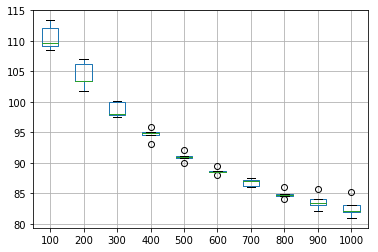

In [6]:
results.boxplot()
plt.savefig('click_LSTM_epoch_YRMSE.png')

YRMSE is continuously decreasing over the 1000 epochs. Since, XRMSE shows a slight increase after 900. The model will be trained for 900 epochs.

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (133, 50)                 10600     
_________________________________________________________________
dense_2 (Dense)              (133, 2)                  102       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (133, 2)                  0         
Total params: 10,702
Trainable params: 10,702
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 5s - loss: 0.0657 - rmse: 0.2370 - val_loss: 0.0280 - val_rmse: 0.1668

Epoch 00001: val_loss improved from inf to 0.02795, saving model to click_wts_2.hdf5
Epoch Number:  1
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0300 - rmse: 0.1729 - val_loss: 0.0276 - val_rmse

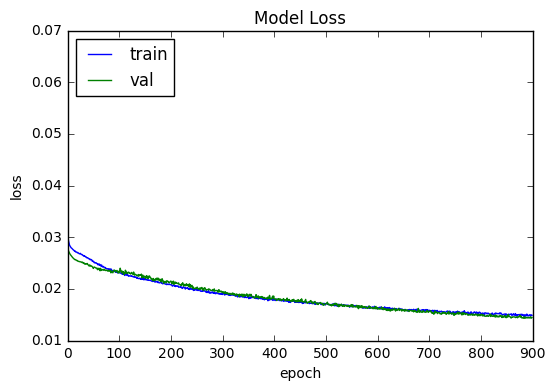

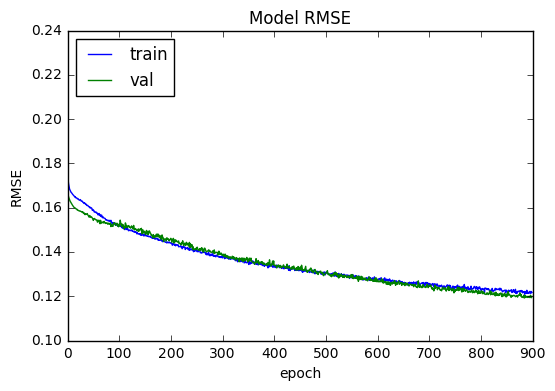

In [35]:
#LSTM call model definition
click_model2= click_stateful_LSTM(units=50,lr=0.001, batch=133, alpha=0.05, dropout=0.1)
click_model2.summary()

#Train LSTM
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model2, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_2.hdf5')
#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [34]:
click_pred_train=click_model2.predict(X_click_train, batch_size=133)
click_model2.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model2.predict(X_click_val, batch_size=133)
click_model2.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model2.predict(X_click_test, batch_size=133)
click_model2.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  117.03911880549033
YRMSE train:  71.70814045619889
XRMSE val:  142.51583594834813
YRMSE val:  85.18472041418468
XRMSE test:  141.43140515481088
YRMSE test:  85.50213288987308


Stateful LSTM does not outpreform stateless LSTM. But this will be more clear after training the model for a specific sample size.

In [ ]:
#stateful LSTM for 5 iterations
timesteps=18
sample_size=5
X_RMSE=[]
Y_RMSE=[]

for i in range(sample_size):
    print('Experimental Run: ', i)
    model= click_stateful_LSTM(units=50,lr=0.001, batch=133, alpha=0.05, dropout=0.1)
    
    for j in range(900):
        model.fit(X_click_train, Y_click_train, validation_data=(X_click_val, Y_click_val), epochs=1, batch_size=133, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_click_pred = model.predict(X_click_test, batch_size=133)
    model.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_click_pred, Y_click_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)
    print(X_RMSE)
    print(Y_RMSE)
    
print('Iterations Completed')    
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE))+ '\n')

#Results of the above block
Experimental Run:  0
Model created and compiled
[134.0076433192233]
[81.4614012813926]
Experimental Run:  1
Model created and compiled
[134.0076433192233, 137.44207400014193]
[81.4614012813926, 82.35785626930526]
Experimental Run:  2
Model created and compiled
[134.0076433192233, 137.44207400014193, 141.20471725169182]
[81.4614012813926, 82.35785626930526, 83.1819928501568]
Experimental Run:  3
Model created and compiled
[134.0076433192233, 137.44207400014193, 141.20471725169182, 139.54638314416943]
[81.4614012813926, 82.35785626930526, 83.1819928501568, 82.19585606433002]
Experimental Run:  4
Model created and compiled
[134.0076433192233, 137.44207400014193, 141.20471725169182, 139.54638314416943, 137.79438597381713]
[81.4614012813926, 82.35785626930526, 83.1819928501568, 82.19585606433002, 81.39675932932352]
Iterations Completed
X-coord RMSE Mean: 137.9990407378087

Y-coord RMSE Mean: 82.11877315890163

In [71]:
#Results after training for 5 iterations
print('Mean XRMSE: ', np.round(137.9990407378087, 3))
print('Mean YRMSE: ', np.round(82.11877315890163, 3))

Mean XRMSE:  137.999
Mean YRMSE:  82.119


So, from the results it can be seen that the stateful model does not perform better than the stateless model.

In [24]:
#stateless LSTM with 2 hidden layers
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateless_LSTM(units, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=True, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(LSTM(units, return_sequences=False))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_8 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 2)                 0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 14s - loss: 0.0644 - rmse: 0.2370 - val_loss: 0.0296 - val_rmse: 0.1718

Epoch 00001: val_loss improved from inf to 0.02964, saving model to click_wts_3.hdf5
Epoch 2/900
 - 6s - lo

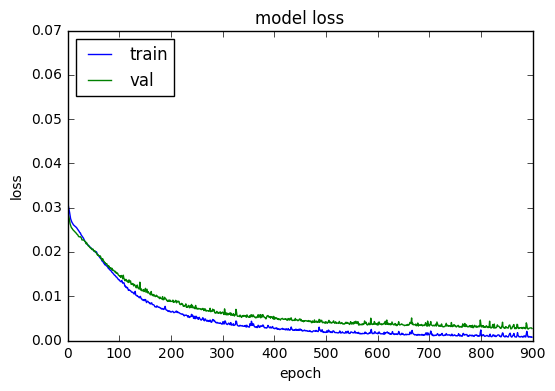

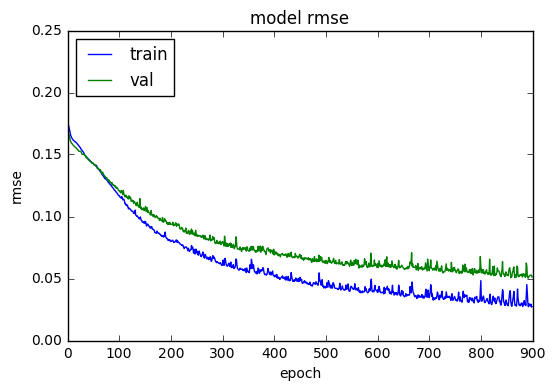

In [44]:
#2 hidden layers with both 50 units and recurent dropout in only 1st hidden layer
#LSTM call model definition
click_model3= click_stacked_stateless_LSTM(units=50,lr=0.001, alpha=0.05, dropout=0.1)
click_model3.summary()

#Train LSTM stateless model with shuffle=False
hist= stateless_fit(click_model3, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_3.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [28]:
click_model3.load_weights('click_wts_3.hdf5')

click_pred_train=click_model3.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model3.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model3.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  61.40518502223034
YRMSE train:  39.504756628914514
XRMSE val:  65.56105693069806
YRMSE val:  43.65926313501698
XRMSE test:  67.9441477811638
YRMSE test:  43.008000488416975


This stacked stateless LSTM performs far better than the previously trained models. But there is some difference between the performance of the model on the train dataset as compared to the validation and test datasets. In this model the recurrent dropout was only addd in the first hidden layer. Let's check the performance of the model by adding recurrent dropout in both the layers.

In [24]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateless_LSTM2(units, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=True, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(LSTM(units, return_sequences=False, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_6 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 2)                 0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 13s - loss: 0.0821 - rmse: 0.2626 - val_loss: 0.0314 - val_rmse: 0.1768

Epoch 00001: val_loss improved from inf to 0.03139, saving model to click_wts_4.hdf5
Epoch 2/900
 - 7s - lo

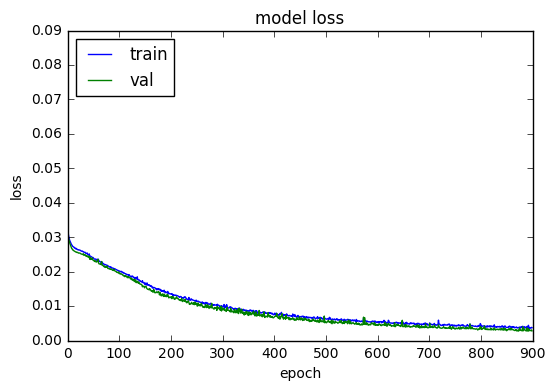

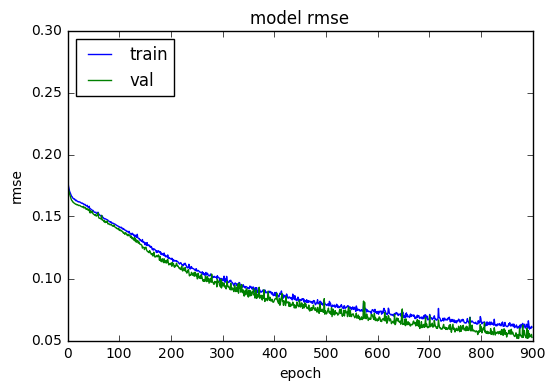

In [40]:
#2 hidden layers, both with 50 units and recurrent dropout in both the hidden layers
#LSTM call model definition
click_model4= click_stacked_stateless_LSTM2(units=50,lr=0.001, alpha=0.05, dropout=0.1)
click_model4.summary()

#Train LSTM stateless model with shuffle=False
hist= stateless_fit(click_model4, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_4.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [41]:
click_pred_train=click_model4.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model4.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model4.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  50.32744228300663
YRMSE train:  33.85305485801927
XRMSE val:  65.09454735080027
YRMSE val:  41.86490721644265
XRMSE test:  66.69613393786204
YRMSE test:  38.936826105283004


In [ ]:
#stacked stateless LSTM for 5 iterations
timesteps=18
sample_size=5
X_RMSE=[]
Y_RMSE=[]

for i in range(sample_size):
    print('Experimental Run: ', i)
    
    model= click_stacked_stateless_LSTM2(units=50,lr=0.001, alpha=0.05, dropout=0.1)
    model.fit(X_click_train, Y_click_train, validation_data=(X_click_val, Y_click_val), batch_size=133, epochs=900, verbose=0, shuffle=False)
    
    Y_click_pred = model.predict(X_click_test)
    
    xrmse, yrmse= calculate_RMSE(Y_click_pred, Y_click_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

    print(X_RMSE)
    print(Y_RMSE)
    
print('Iterations Completed')
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)) +'\n')

Experimental Run:  0
Model created and compiled
[70.5386953581716]
[46.86102106446797]
Experimental Run:  1
Model created and compiled
[70.5386953581716, 71.74411272200761]
[46.86102106446797, 47.588731503446574]
Experimental Run:  2
Model created and compiled
[70.5386953581716, 71.74411272200761, 75.58143670898947]
[46.86102106446797, 47.588731503446574, 46.132092753922706]
Experimental Run:  3
Model created and compiled
[70.5386953581716, 71.74411272200761, 75.58143670898947, 73.69302595740581]
[46.86102106446797, 47.588731503446574, 46.132092753922706, 48.5719438881631]
Experimental Run:  4
Model created and compiled
[70.5386953581716, 71.74411272200761, 75.58143670898947, 73.69302595740581, 85.88630323614966]
[46.86102106446797, 47.588731503446574, 46.132092753922706, 48.5719438881631, 48.407627755228724]
Iterations Completed
X-coord RMSE Mean: 75.48871479654484

Y-coord RMSE Mean: 47.51228339304582

In [4]:
#Results after training for 5 iterations
print('Mean XRMSE: ', np.round(75.48871479654484, 3))
print('Mean YRMSE: ', np.round(47.51228339304582, 3))

Mean XRMSE:  75.489
Mean YRMSE:  47.512


In [30]:
#2 hidden layers with different number of units in both the layers
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateless_LSTM3(units_1, units_2, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units_1, return_sequences=True, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(LSTM(units_2, return_sequences=False, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_4 (LSTM)                (None, 40)                14560     
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 82        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 2)                 0         
Total params: 25,242
Trainable params: 25,242
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 9s - loss: 0.0717 - rmse: 0.2446 - val_loss: 0.0298 - val_rmse: 0.1721

Epoch 00001: val_loss improved from inf to 0.02976, saving model to click_wts_10.hdf5
Epoch 2/900
 - 6s - lo

 - 6s - loss: 0.0240 - rmse: 0.1545 - val_loss: 0.0234 - val_rmse: 0.1525

Epoch 00045: val_loss improved from 0.02357 to 0.02338, saving model to click_wts_10.hdf5
Epoch 46/900
 - 6s - loss: 0.0241 - rmse: 0.1549 - val_loss: 0.0238 - val_rmse: 0.1539

Epoch 00046: val_loss did not improve from 0.02338
Epoch 47/900
 - 6s - loss: 0.0240 - rmse: 0.1545 - val_loss: 0.0233 - val_rmse: 0.1522

Epoch 00047: val_loss improved from 0.02338 to 0.02329, saving model to click_wts_10.hdf5
Epoch 48/900
 - 6s - loss: 0.0238 - rmse: 0.1538 - val_loss: 0.0233 - val_rmse: 0.1524

Epoch 00048: val_loss did not improve from 0.02329
Epoch 49/900
 - 6s - loss: 0.0238 - rmse: 0.1537 - val_loss: 0.0230 - val_rmse: 0.1514

Epoch 00049: val_loss improved from 0.02329 to 0.02305, saving model to click_wts_10.hdf5
Epoch 50/900
 - 6s - loss: 0.0235 - rmse: 0.1529 - val_loss: 0.0230 - val_rmse: 0.1512

Epoch 00050: val_loss improved from 0.02305 to 0.02296, saving model to click_wts_10.hdf5
Epoch 51/900
 - 6s - lo


Epoch 00095: val_loss improved from 0.02060 to 0.02038, saving model to click_wts_10.hdf5
Epoch 96/900
 - 7s - loss: 0.0209 - rmse: 0.1441 - val_loss: 0.0211 - val_rmse: 0.1449

Epoch 00096: val_loss did not improve from 0.02038
Epoch 97/900
 - 6s - loss: 0.0210 - rmse: 0.1445 - val_loss: 0.0203 - val_rmse: 0.1422

Epoch 00097: val_loss improved from 0.02038 to 0.02032, saving model to click_wts_10.hdf5
Epoch 98/900
 - 6s - loss: 0.0207 - rmse: 0.1435 - val_loss: 0.0204 - val_rmse: 0.1427

Epoch 00098: val_loss did not improve from 0.02032
Epoch 99/900
 - 6s - loss: 0.0207 - rmse: 0.1436 - val_loss: 0.0203 - val_rmse: 0.1423

Epoch 00099: val_loss did not improve from 0.02032
Epoch 100/900
 - 6s - loss: 0.0205 - rmse: 0.1429 - val_loss: 0.0203 - val_rmse: 0.1421

Epoch 00100: val_loss improved from 0.02032 to 0.02026, saving model to click_wts_10.hdf5
Epoch 101/900
 - 6s - loss: 0.0205 - rmse: 0.1428 - val_loss: 0.0204 - val_rmse: 0.1424

Epoch 00101: val_loss did not improve from 0.0


Epoch 00148: val_loss did not improve from 0.01632
Epoch 149/900
 - 6s - loss: 0.0171 - rmse: 0.1306 - val_loss: 0.0165 - val_rmse: 0.1284

Epoch 00149: val_loss did not improve from 0.01632
Epoch 150/900
 - 6s - loss: 0.0175 - rmse: 0.1319 - val_loss: 0.0164 - val_rmse: 0.1279

Epoch 00150: val_loss did not improve from 0.01632
Epoch 151/900
 - 6s - loss: 0.0170 - rmse: 0.1303 - val_loss: 0.0164 - val_rmse: 0.1278

Epoch 00151: val_loss did not improve from 0.01632
Epoch 152/900
 - 6s - loss: 0.0170 - rmse: 0.1300 - val_loss: 0.0163 - val_rmse: 0.1274

Epoch 00152: val_loss improved from 0.01632 to 0.01630, saving model to click_wts_10.hdf5
Epoch 153/900
 - 6s - loss: 0.0175 - rmse: 0.1319 - val_loss: 0.0165 - val_rmse: 0.1280

Epoch 00153: val_loss did not improve from 0.01630
Epoch 154/900
 - 6s - loss: 0.0170 - rmse: 0.1302 - val_loss: 0.0160 - val_rmse: 0.1263

Epoch 00154: val_loss improved from 0.01630 to 0.01602, saving model to click_wts_10.hdf5
Epoch 155/900
 - 6s - loss: 0.

 - 6s - loss: 0.0145 - rmse: 0.1199 - val_loss: 0.0130 - val_rmse: 0.1139

Epoch 00202: val_loss improved from 0.01311 to 0.01302, saving model to click_wts_10.hdf5
Epoch 203/900
 - 6s - loss: 0.0144 - rmse: 0.1199 - val_loss: 0.0135 - val_rmse: 0.1161

Epoch 00203: val_loss did not improve from 0.01302
Epoch 204/900
 - 6s - loss: 0.0146 - rmse: 0.1204 - val_loss: 0.0136 - val_rmse: 0.1163

Epoch 00204: val_loss did not improve from 0.01302
Epoch 205/900
 - 6s - loss: 0.0144 - rmse: 0.1196 - val_loss: 0.0135 - val_rmse: 0.1158

Epoch 00205: val_loss did not improve from 0.01302
Epoch 206/900
 - 6s - loss: 0.0145 - rmse: 0.1201 - val_loss: 0.0135 - val_rmse: 0.1161

Epoch 00206: val_loss did not improve from 0.01302
Epoch 207/900
 - 6s - loss: 0.0145 - rmse: 0.1202 - val_loss: 0.0133 - val_rmse: 0.1149

Epoch 00207: val_loss did not improve from 0.01302
Epoch 208/900
 - 6s - loss: 0.0149 - rmse: 0.1217 - val_loss: 0.0131 - val_rmse: 0.1144

Epoch 00208: val_loss did not improve from 0.0


Epoch 00257: val_loss did not improve from 0.01120
Epoch 258/900
 - 6s - loss: 0.0132 - rmse: 0.1144 - val_loss: 0.0116 - val_rmse: 0.1076

Epoch 00258: val_loss did not improve from 0.01120
Epoch 259/900
 - 6s - loss: 0.0125 - rmse: 0.1117 - val_loss: 0.0120 - val_rmse: 0.1094

Epoch 00259: val_loss did not improve from 0.01120
Epoch 260/900
 - 6s - loss: 0.0124 - rmse: 0.1110 - val_loss: 0.0111 - val_rmse: 0.1051

Epoch 00260: val_loss improved from 0.01120 to 0.01109, saving model to click_wts_10.hdf5
Epoch 261/900
 - 7s - loss: 0.0124 - rmse: 0.1109 - val_loss: 0.0115 - val_rmse: 0.1068

Epoch 00261: val_loss did not improve from 0.01109
Epoch 262/900
 - 6s - loss: 0.0123 - rmse: 0.1105 - val_loss: 0.0115 - val_rmse: 0.1070

Epoch 00262: val_loss did not improve from 0.01109
Epoch 263/900
 - 6s - loss: 0.0123 - rmse: 0.1107 - val_loss: 0.0114 - val_rmse: 0.1067

Epoch 00263: val_loss did not improve from 0.01109
Epoch 264/900
 - 6s - loss: 0.0125 - rmse: 0.1115 - val_loss: 0.0119 


Epoch 00314: val_loss did not improve from 0.01005
Epoch 315/900
 - 6s - loss: 0.0111 - rmse: 0.1049 - val_loss: 0.0103 - val_rmse: 0.1014

Epoch 00315: val_loss did not improve from 0.01005
Epoch 316/900
 - 6s - loss: 0.0111 - rmse: 0.1052 - val_loss: 0.0098 - val_rmse: 0.0988

Epoch 00316: val_loss improved from 0.01005 to 0.00980, saving model to click_wts_10.hdf5
Epoch 317/900
 - 6s - loss: 0.0110 - rmse: 0.1044 - val_loss: 0.0103 - val_rmse: 0.1013

Epoch 00317: val_loss did not improve from 0.00980
Epoch 318/900
 - 6s - loss: 0.0111 - rmse: 0.1053 - val_loss: 0.0099 - val_rmse: 0.0994

Epoch 00318: val_loss did not improve from 0.00980
Epoch 319/900
 - 6s - loss: 0.0109 - rmse: 0.1041 - val_loss: 0.0100 - val_rmse: 0.0996

Epoch 00319: val_loss did not improve from 0.00980
Epoch 320/900
 - 6s - loss: 0.0110 - rmse: 0.1046 - val_loss: 0.0099 - val_rmse: 0.0991

Epoch 00320: val_loss did not improve from 0.00980
Epoch 321/900
 - 6s - loss: 0.0110 - rmse: 0.1045 - val_loss: 0.0108 

 - 6s - loss: 0.0097 - rmse: 0.0980 - val_loss: 0.0085 - val_rmse: 0.0917

Epoch 00370: val_loss improved from 0.00848 to 0.00846, saving model to click_wts_10.hdf5
Epoch 371/900
 - 6s - loss: 0.0098 - rmse: 0.0984 - val_loss: 0.0097 - val_rmse: 0.0980

Epoch 00371: val_loss did not improve from 0.00846
Epoch 372/900
 - 6s - loss: 0.0098 - rmse: 0.0988 - val_loss: 0.0089 - val_rmse: 0.0943

Epoch 00372: val_loss did not improve from 0.00846
Epoch 373/900
 - 6s - loss: 0.0095 - rmse: 0.0972 - val_loss: 0.0092 - val_rmse: 0.0956

Epoch 00373: val_loss did not improve from 0.00846
Epoch 374/900
 - 6s - loss: 0.0098 - rmse: 0.0989 - val_loss: 0.0085 - val_rmse: 0.0917

Epoch 00374: val_loss improved from 0.00846 to 0.00846, saving model to click_wts_10.hdf5
Epoch 375/900
 - 6s - loss: 0.0097 - rmse: 0.0983 - val_loss: 0.0100 - val_rmse: 0.0998

Epoch 00375: val_loss did not improve from 0.00846
Epoch 376/900
 - 6s - loss: 0.0096 - rmse: 0.0975 - val_loss: 0.0087 - val_rmse: 0.0932

Epoch 0


Epoch 00427: val_loss did not improve from 0.00774
Epoch 428/900
 - 6s - loss: 0.0085 - rmse: 0.0919 - val_loss: 0.0082 - val_rmse: 0.0904

Epoch 00428: val_loss did not improve from 0.00774
Epoch 429/900
 - 6s - loss: 0.0087 - rmse: 0.0930 - val_loss: 0.0078 - val_rmse: 0.0879

Epoch 00429: val_loss did not improve from 0.00774
Epoch 430/900
 - 6s - loss: 0.0088 - rmse: 0.0936 - val_loss: 0.0084 - val_rmse: 0.0917

Epoch 00430: val_loss did not improve from 0.00774
Epoch 431/900
 - 6s - loss: 0.0087 - rmse: 0.0927 - val_loss: 0.0077 - val_rmse: 0.0876

Epoch 00431: val_loss improved from 0.00774 to 0.00772, saving model to click_wts_10.hdf5
Epoch 432/900
 - 6s - loss: 0.0086 - rmse: 0.0925 - val_loss: 0.0087 - val_rmse: 0.0927

Epoch 00432: val_loss did not improve from 0.00772
Epoch 433/900
 - 6s - loss: 0.0086 - rmse: 0.0926 - val_loss: 0.0083 - val_rmse: 0.0910

Epoch 00433: val_loss did not improve from 0.00772
Epoch 434/900
 - 6s - loss: 0.0087 - rmse: 0.0932 - val_loss: 0.0076 


Epoch 00484: val_loss did not improve from 0.00694
Epoch 485/900
 - 6s - loss: 0.0077 - rmse: 0.0872 - val_loss: 0.0065 - val_rmse: 0.0801

Epoch 00485: val_loss improved from 0.00694 to 0.00646, saving model to click_wts_10.hdf5
Epoch 486/900
 - 6s - loss: 0.0079 - rmse: 0.0886 - val_loss: 0.0071 - val_rmse: 0.0840

Epoch 00486: val_loss did not improve from 0.00646
Epoch 487/900
 - 6s - loss: 0.0078 - rmse: 0.0878 - val_loss: 0.0068 - val_rmse: 0.0821

Epoch 00487: val_loss did not improve from 0.00646
Epoch 488/900
 - 7s - loss: 0.0078 - rmse: 0.0880 - val_loss: 0.0073 - val_rmse: 0.0853

Epoch 00488: val_loss did not improve from 0.00646
Epoch 489/900
 - 6s - loss: 0.0076 - rmse: 0.0869 - val_loss: 0.0069 - val_rmse: 0.0827

Epoch 00489: val_loss did not improve from 0.00646
Epoch 490/900
 - 6s - loss: 0.0076 - rmse: 0.0868 - val_loss: 0.0072 - val_rmse: 0.0847

Epoch 00490: val_loss did not improve from 0.00646
Epoch 491/900
 - 6s - loss: 0.0075 - rmse: 0.0861 - val_loss: 0.0069 

 - 6s - loss: 0.0075 - rmse: 0.0862 - val_loss: 0.0063 - val_rmse: 0.0788

Epoch 00542: val_loss did not improve from 0.00583
Epoch 543/900
 - 6s - loss: 0.0071 - rmse: 0.0837 - val_loss: 0.0061 - val_rmse: 0.0775

Epoch 00543: val_loss did not improve from 0.00583
Epoch 544/900
 - 6s - loss: 0.0072 - rmse: 0.0843 - val_loss: 0.0065 - val_rmse: 0.0801

Epoch 00544: val_loss did not improve from 0.00583
Epoch 545/900
 - 6s - loss: 0.0070 - rmse: 0.0834 - val_loss: 0.0065 - val_rmse: 0.0804

Epoch 00545: val_loss did not improve from 0.00583
Epoch 546/900
 - 6s - loss: 0.0070 - rmse: 0.0836 - val_loss: 0.0066 - val_rmse: 0.0812

Epoch 00546: val_loss did not improve from 0.00583
Epoch 547/900
 - 6s - loss: 0.0074 - rmse: 0.0857 - val_loss: 0.0064 - val_rmse: 0.0801

Epoch 00547: val_loss did not improve from 0.00583
Epoch 548/900
 - 6s - loss: 0.0071 - rmse: 0.0841 - val_loss: 0.0064 - val_rmse: 0.0796

Epoch 00548: val_loss did not improve from 0.00583
Epoch 549/900
 - 6s - loss: 0.0072


Epoch 00599: val_loss did not improve from 0.00526
Epoch 600/900
 - 6s - loss: 0.0064 - rmse: 0.0797 - val_loss: 0.0061 - val_rmse: 0.0778

Epoch 00600: val_loss did not improve from 0.00526
Epoch 601/900
 - 6s - loss: 0.0066 - rmse: 0.0807 - val_loss: 0.0057 - val_rmse: 0.0751

Epoch 00601: val_loss did not improve from 0.00526
Epoch 602/900
 - 6s - loss: 0.0063 - rmse: 0.0791 - val_loss: 0.0059 - val_rmse: 0.0765

Epoch 00602: val_loss did not improve from 0.00526
Epoch 603/900
 - 6s - loss: 0.0065 - rmse: 0.0804 - val_loss: 0.0056 - val_rmse: 0.0747

Epoch 00603: val_loss did not improve from 0.00526
Epoch 604/900
 - 6s - loss: 0.0067 - rmse: 0.0816 - val_loss: 0.0063 - val_rmse: 0.0794

Epoch 00604: val_loss did not improve from 0.00526
Epoch 605/900
 - 6s - loss: 0.0065 - rmse: 0.0804 - val_loss: 0.0067 - val_rmse: 0.0814

Epoch 00605: val_loss did not improve from 0.00526
Epoch 606/900
 - 6s - loss: 0.0064 - rmse: 0.0797 - val_loss: 0.0059 - val_rmse: 0.0764

Epoch 00606: val_lo

 - 6s - loss: 0.0059 - rmse: 0.0768 - val_loss: 0.0046 - val_rmse: 0.0677

Epoch 00657: val_loss improved from 0.00467 to 0.00460, saving model to click_wts_10.hdf5
Epoch 658/900
 - 6s - loss: 0.0060 - rmse: 0.0769 - val_loss: 0.0047 - val_rmse: 0.0682

Epoch 00658: val_loss did not improve from 0.00460
Epoch 659/900
 - 6s - loss: 0.0057 - rmse: 0.0753 - val_loss: 0.0050 - val_rmse: 0.0706

Epoch 00659: val_loss did not improve from 0.00460
Epoch 660/900
 - 6s - loss: 0.0058 - rmse: 0.0760 - val_loss: 0.0050 - val_rmse: 0.0708

Epoch 00660: val_loss did not improve from 0.00460
Epoch 661/900
 - 6s - loss: 0.0058 - rmse: 0.0755 - val_loss: 0.0053 - val_rmse: 0.0724

Epoch 00661: val_loss did not improve from 0.00460
Epoch 662/900
 - 6s - loss: 0.0060 - rmse: 0.0770 - val_loss: 0.0058 - val_rmse: 0.0758

Epoch 00662: val_loss did not improve from 0.00460
Epoch 663/900
 - 6s - loss: 0.0060 - rmse: 0.0768 - val_loss: 0.0054 - val_rmse: 0.0730

Epoch 00663: val_loss did not improve from 0.0

 - 6s - loss: 0.0061 - rmse: 0.0774 - val_loss: 0.0047 - val_rmse: 0.0682

Epoch 00715: val_loss did not improve from 0.00438
Epoch 716/900
 - 6s - loss: 0.0056 - rmse: 0.0744 - val_loss: 0.0052 - val_rmse: 0.0718

Epoch 00716: val_loss did not improve from 0.00438
Epoch 717/900
 - 6s - loss: 0.0057 - rmse: 0.0755 - val_loss: 0.0047 - val_rmse: 0.0681

Epoch 00717: val_loss did not improve from 0.00438
Epoch 718/900
 - 7s - loss: 0.0057 - rmse: 0.0751 - val_loss: 0.0054 - val_rmse: 0.0729

Epoch 00718: val_loss did not improve from 0.00438
Epoch 719/900
 - 6s - loss: 0.0054 - rmse: 0.0730 - val_loss: 0.0046 - val_rmse: 0.0677

Epoch 00719: val_loss did not improve from 0.00438
Epoch 720/900
 - 6s - loss: 0.0055 - rmse: 0.0735 - val_loss: 0.0047 - val_rmse: 0.0685

Epoch 00720: val_loss did not improve from 0.00438
Epoch 721/900
 - 5s - loss: 0.0055 - rmse: 0.0736 - val_loss: 0.0046 - val_rmse: 0.0673

Epoch 00721: val_loss did not improve from 0.00438
Epoch 722/900
 - 6s - loss: 0.0054

 - 6s - loss: 0.0051 - rmse: 0.0712 - val_loss: 0.0049 - val_rmse: 0.0696

Epoch 00773: val_loss did not improve from 0.00395
Epoch 774/900
 - 6s - loss: 0.0053 - rmse: 0.0727 - val_loss: 0.0045 - val_rmse: 0.0670

Epoch 00774: val_loss did not improve from 0.00395
Epoch 775/900
 - 6s - loss: 0.0051 - rmse: 0.0708 - val_loss: 0.0045 - val_rmse: 0.0666

Epoch 00775: val_loss did not improve from 0.00395
Epoch 776/900
 - 6s - loss: 0.0050 - rmse: 0.0707 - val_loss: 0.0040 - val_rmse: 0.0633

Epoch 00776: val_loss did not improve from 0.00395
Epoch 777/900
 - 6s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0039 - val_rmse: 0.0625

Epoch 00777: val_loss improved from 0.00395 to 0.00393, saving model to click_wts_10.hdf5
Epoch 778/900
 - 6s - loss: 0.0050 - rmse: 0.0705 - val_loss: 0.0047 - val_rmse: 0.0684

Epoch 00778: val_loss did not improve from 0.00393
Epoch 779/900
 - 6s - loss: 0.0053 - rmse: 0.0722 - val_loss: 0.0041 - val_rmse: 0.0638

Epoch 00779: val_loss did not improve from 0.0


Epoch 00830: val_loss did not improve from 0.00371
Epoch 831/900
 - 6s - loss: 0.0049 - rmse: 0.0694 - val_loss: 0.0050 - val_rmse: 0.0703

Epoch 00831: val_loss did not improve from 0.00371
Epoch 832/900
 - 6s - loss: 0.0046 - rmse: 0.0678 - val_loss: 0.0038 - val_rmse: 0.0616

Epoch 00832: val_loss did not improve from 0.00371
Epoch 833/900
 - 6s - loss: 0.0046 - rmse: 0.0678 - val_loss: 0.0037 - val_rmse: 0.0606

Epoch 00833: val_loss improved from 0.00371 to 0.00370, saving model to click_wts_10.hdf5
Epoch 834/900
 - 6s - loss: 0.0048 - rmse: 0.0686 - val_loss: 0.0040 - val_rmse: 0.0631

Epoch 00834: val_loss did not improve from 0.00370
Epoch 835/900
 - 6s - loss: 0.0047 - rmse: 0.0681 - val_loss: 0.0048 - val_rmse: 0.0686

Epoch 00835: val_loss did not improve from 0.00370
Epoch 836/900
 - 6s - loss: 0.0054 - rmse: 0.0729 - val_loss: 0.0038 - val_rmse: 0.0611

Epoch 00836: val_loss did not improve from 0.00370
Epoch 837/900
 - 6s - loss: 0.0048 - rmse: 0.0688 - val_loss: 0.0040 

 - 6s - loss: 0.0044 - rmse: 0.0660 - val_loss: 0.0035 - val_rmse: 0.0591

Epoch 00888: val_loss did not improve from 0.00350
Epoch 889/900
 - 6s - loss: 0.0049 - rmse: 0.0694 - val_loss: 0.0041 - val_rmse: 0.0634

Epoch 00889: val_loss did not improve from 0.00350
Epoch 890/900
 - 6s - loss: 0.0045 - rmse: 0.0666 - val_loss: 0.0037 - val_rmse: 0.0604

Epoch 00890: val_loss did not improve from 0.00350
Epoch 891/900
 - 6s - loss: 0.0045 - rmse: 0.0665 - val_loss: 0.0037 - val_rmse: 0.0602

Epoch 00891: val_loss did not improve from 0.00350
Epoch 892/900
 - 6s - loss: 0.0045 - rmse: 0.0665 - val_loss: 0.0038 - val_rmse: 0.0610

Epoch 00892: val_loss did not improve from 0.00350
Epoch 893/900
 - 6s - loss: 0.0044 - rmse: 0.0659 - val_loss: 0.0035 - val_rmse: 0.0589

Epoch 00893: val_loss improved from 0.00350 to 0.00349, saving model to click_wts_10.hdf5
Epoch 894/900
 - 6s - loss: 0.0046 - rmse: 0.0677 - val_loss: 0.0041 - val_rmse: 0.0635

Epoch 00894: val_loss did not improve from 0.0

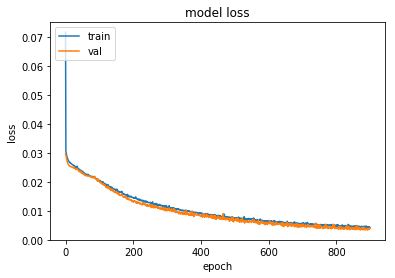

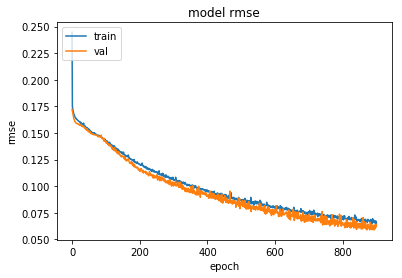

In [34]:
#2 hidden layers, one with 50 units and the second with 40 units
#LSTM call model definition
click_model10= click_stacked_stateless_LSTM3(units_1=50, units_2=40, lr=0.001, alpha=0.05, dropout=0.1)
click_model10.summary()

#Train LSTM
hist= stateless_fit(click_model10, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_10.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [35]:
click_pred_train=click_model10.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model10.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model10.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  68.44672337062866
YRMSE train:  46.533826903807885
XRMSE val:  76.19428903563191
YRMSE val:  51.86543874290813
XRMSE test:  87.9007375371437
YRMSE test:  54.05548770184816


This model does not outperform the previous one. Thus, so far stacked model (click_model4) with 2 hidden layers and having 50 units in each layer with recurrent dropout in both the hidden layers performs the best.

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_6 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 2)                 0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 8s - loss: 0.0535 - rmse: 0.2157 - val_loss: 0.0299 - val_rmse: 0.1724

Epoch 00001: val_loss improved from inf to 0.02989, saving model to click_wts_11.hdf5
Epoch 2/900
 - 6s - lo

 - 6s - loss: 0.0241 - rmse: 0.1547 - val_loss: 0.0237 - val_rmse: 0.1536

Epoch 00044: val_loss did not improve from 0.02347
Epoch 45/900
 - 6s - loss: 0.0240 - rmse: 0.1546 - val_loss: 0.0236 - val_rmse: 0.1533

Epoch 00045: val_loss did not improve from 0.02347
Epoch 46/900
 - 6s - loss: 0.0239 - rmse: 0.1541 - val_loss: 0.0232 - val_rmse: 0.1520

Epoch 00046: val_loss improved from 0.02347 to 0.02322, saving model to click_wts_11.hdf5
Epoch 47/900
 - 6s - loss: 0.0237 - rmse: 0.1535 - val_loss: 0.0232 - val_rmse: 0.1521

Epoch 00047: val_loss did not improve from 0.02322
Epoch 48/900
 - 6s - loss: 0.0237 - rmse: 0.1535 - val_loss: 0.0233 - val_rmse: 0.1522

Epoch 00048: val_loss did not improve from 0.02322
Epoch 49/900
 - 6s - loss: 0.0236 - rmse: 0.1533 - val_loss: 0.0230 - val_rmse: 0.1512

Epoch 00049: val_loss improved from 0.02322 to 0.02296, saving model to click_wts_11.hdf5
Epoch 50/900
 - 6s - loss: 0.0236 - rmse: 0.1532 - val_loss: 0.0230 - val_rmse: 0.1512

Epoch 00050: 


Epoch 00094: val_loss improved from 0.01962 to 0.01948, saving model to click_wts_11.hdf5
Epoch 95/900
 - 6s - loss: 0.0202 - rmse: 0.1418 - val_loss: 0.0195 - val_rmse: 0.1394

Epoch 00095: val_loss did not improve from 0.01948
Epoch 96/900
 - 6s - loss: 0.0207 - rmse: 0.1434 - val_loss: 0.0197 - val_rmse: 0.1402

Epoch 00096: val_loss did not improve from 0.01948
Epoch 97/900
 - 6s - loss: 0.0201 - rmse: 0.1416 - val_loss: 0.0193 - val_rmse: 0.1386

Epoch 00097: val_loss improved from 0.01948 to 0.01928, saving model to click_wts_11.hdf5
Epoch 98/900
 - 6s - loss: 0.0201 - rmse: 0.1415 - val_loss: 0.0192 - val_rmse: 0.1382

Epoch 00098: val_loss improved from 0.01928 to 0.01916, saving model to click_wts_11.hdf5
Epoch 99/900
 - 6s - loss: 0.0199 - rmse: 0.1407 - val_loss: 0.0193 - val_rmse: 0.1385

Epoch 00099: val_loss did not improve from 0.01916
Epoch 100/900
 - 6s - loss: 0.0198 - rmse: 0.1406 - val_loss: 0.0190 - val_rmse: 0.1375

Epoch 00100: val_loss improved from 0.01916 to 

 - 6s - loss: 0.0167 - rmse: 0.1290 - val_loss: 0.0152 - val_rmse: 0.1229

Epoch 00145: val_loss did not improve from 0.01516
Epoch 146/900
 - 6s - loss: 0.0166 - rmse: 0.1287 - val_loss: 0.0150 - val_rmse: 0.1223

Epoch 00146: val_loss improved from 0.01516 to 0.01500, saving model to click_wts_11.hdf5
Epoch 147/900
 - 6s - loss: 0.0167 - rmse: 0.1290 - val_loss: 0.0152 - val_rmse: 0.1232

Epoch 00147: val_loss did not improve from 0.01500
Epoch 148/900
 - 6s - loss: 0.0167 - rmse: 0.1288 - val_loss: 0.0151 - val_rmse: 0.1228

Epoch 00148: val_loss did not improve from 0.01500
Epoch 149/900
 - 6s - loss: 0.0164 - rmse: 0.1280 - val_loss: 0.0150 - val_rmse: 0.1223

Epoch 00149: val_loss did not improve from 0.01500
Epoch 150/900
 - 6s - loss: 0.0165 - rmse: 0.1281 - val_loss: 0.0146 - val_rmse: 0.1205

Epoch 00150: val_loss improved from 0.01500 to 0.01457, saving model to click_wts_11.hdf5
Epoch 151/900
 - 6s - loss: 0.0165 - rmse: 0.1280 - val_loss: 0.0149 - val_rmse: 0.1217

Epoch 0

 - 5s - loss: 0.0141 - rmse: 0.1183 - val_loss: 0.0131 - val_rmse: 0.1139

Epoch 00198: val_loss did not improve from 0.01222
Epoch 199/900
 - 5s - loss: 0.0140 - rmse: 0.1181 - val_loss: 0.0124 - val_rmse: 0.1112

Epoch 00199: val_loss did not improve from 0.01222
Epoch 200/900
 - 6s - loss: 0.0140 - rmse: 0.1179 - val_loss: 0.0121 - val_rmse: 0.1098

Epoch 00200: val_loss improved from 0.01222 to 0.01211, saving model to click_wts_11.hdf5
Epoch 201/900
 - 6s - loss: 0.0138 - rmse: 0.1170 - val_loss: 0.0124 - val_rmse: 0.1110

Epoch 00201: val_loss did not improve from 0.01211
Epoch 202/900
 - 6s - loss: 0.0141 - rmse: 0.1183 - val_loss: 0.0121 - val_rmse: 0.1098

Epoch 00202: val_loss did not improve from 0.01211
Epoch 203/900
 - 6s - loss: 0.0136 - rmse: 0.1162 - val_loss: 0.0120 - val_rmse: 0.1093

Epoch 00203: val_loss improved from 0.01211 to 0.01202, saving model to click_wts_11.hdf5
Epoch 204/900
 - 5s - loss: 0.0138 - rmse: 0.1171 - val_loss: 0.0123 - val_rmse: 0.1106

Epoch 0

 - 6s - loss: 0.0116 - rmse: 0.1074 - val_loss: 0.0101 - val_rmse: 0.1002

Epoch 00252: val_loss improved from 0.01017 to 0.01010, saving model to click_wts_11.hdf5
Epoch 253/900
 - 6s - loss: 0.0119 - rmse: 0.1088 - val_loss: 0.0103 - val_rmse: 0.1011

Epoch 00253: val_loss did not improve from 0.01010
Epoch 254/900
 - 6s - loss: 0.0116 - rmse: 0.1076 - val_loss: 0.0104 - val_rmse: 0.1015

Epoch 00254: val_loss did not improve from 0.01010
Epoch 255/900
 - 6s - loss: 0.0116 - rmse: 0.1075 - val_loss: 0.0103 - val_rmse: 0.1012

Epoch 00255: val_loss did not improve from 0.01010
Epoch 256/900
 - 6s - loss: 0.0117 - rmse: 0.1078 - val_loss: 0.0105 - val_rmse: 0.1023

Epoch 00256: val_loss did not improve from 0.01010
Epoch 257/900
 - 5s - loss: 0.0122 - rmse: 0.1101 - val_loss: 0.0103 - val_rmse: 0.1012

Epoch 00257: val_loss did not improve from 0.01010
Epoch 258/900
 - 5s - loss: 0.0118 - rmse: 0.1085 - val_loss: 0.0101 - val_rmse: 0.1001

Epoch 00258: val_loss improved from 0.01010 to

 - 5s - loss: 0.0101 - rmse: 0.1001 - val_loss: 0.0089 - val_rmse: 0.0939

Epoch 00307: val_loss did not improve from 0.00827
Epoch 308/900
 - 7s - loss: 0.0098 - rmse: 0.0989 - val_loss: 0.0084 - val_rmse: 0.0915

Epoch 00308: val_loss did not improve from 0.00827
Epoch 309/900
 - 6s - loss: 0.0100 - rmse: 0.0999 - val_loss: 0.0085 - val_rmse: 0.0919

Epoch 00309: val_loss did not improve from 0.00827
Epoch 310/900
 - 6s - loss: 0.0099 - rmse: 0.0990 - val_loss: 0.0084 - val_rmse: 0.0912

Epoch 00310: val_loss did not improve from 0.00827
Epoch 311/900
 - 6s - loss: 0.0097 - rmse: 0.0982 - val_loss: 0.0079 - val_rmse: 0.0887

Epoch 00311: val_loss improved from 0.00827 to 0.00791, saving model to click_wts_11.hdf5
Epoch 312/900
 - 5s - loss: 0.0098 - rmse: 0.0987 - val_loss: 0.0084 - val_rmse: 0.0916

Epoch 00312: val_loss did not improve from 0.00791
Epoch 313/900
 - 6s - loss: 0.0098 - rmse: 0.0988 - val_loss: 0.0084 - val_rmse: 0.0917

Epoch 00313: val_loss did not improve from 0.0


Epoch 00363: val_loss did not improve from 0.00713
Epoch 364/900
 - 6s - loss: 0.0085 - rmse: 0.0919 - val_loss: 0.0071 - val_rmse: 0.0842

Epoch 00364: val_loss did not improve from 0.00713
Epoch 365/900
 - 6s - loss: 0.0084 - rmse: 0.0915 - val_loss: 0.0075 - val_rmse: 0.0865

Epoch 00365: val_loss did not improve from 0.00713
Epoch 366/900
 - 6s - loss: 0.0084 - rmse: 0.0913 - val_loss: 0.0079 - val_rmse: 0.0887

Epoch 00366: val_loss did not improve from 0.00713
Epoch 367/900
 - 5s - loss: 0.0085 - rmse: 0.0919 - val_loss: 0.0071 - val_rmse: 0.0842

Epoch 00367: val_loss did not improve from 0.00713
Epoch 368/900
 - 6s - loss: 0.0083 - rmse: 0.0909 - val_loss: 0.0076 - val_rmse: 0.0869

Epoch 00368: val_loss did not improve from 0.00713
Epoch 369/900
 - 5s - loss: 0.0085 - rmse: 0.0919 - val_loss: 0.0074 - val_rmse: 0.0857

Epoch 00369: val_loss did not improve from 0.00713
Epoch 370/900
 - 6s - loss: 0.0085 - rmse: 0.0917 - val_loss: 0.0069 - val_rmse: 0.0830

Epoch 00370: val_lo

 - 5s - loss: 0.0078 - rmse: 0.0881 - val_loss: 0.0063 - val_rmse: 0.0793

Epoch 00420: val_loss did not improve from 0.00609
Epoch 421/900
 - 5s - loss: 0.0074 - rmse: 0.0860 - val_loss: 0.0059 - val_rmse: 0.0766

Epoch 00421: val_loss improved from 0.00609 to 0.00590, saving model to click_wts_11.hdf5
Epoch 422/900
 - 5s - loss: 0.0074 - rmse: 0.0856 - val_loss: 0.0064 - val_rmse: 0.0799

Epoch 00422: val_loss did not improve from 0.00590
Epoch 423/900
 - 5s - loss: 0.0076 - rmse: 0.0868 - val_loss: 0.0066 - val_rmse: 0.0812

Epoch 00423: val_loss did not improve from 0.00590
Epoch 424/900
 - 6s - loss: 0.0077 - rmse: 0.0874 - val_loss: 0.0068 - val_rmse: 0.0821

Epoch 00424: val_loss did not improve from 0.00590
Epoch 425/900
 - 5s - loss: 0.0077 - rmse: 0.0873 - val_loss: 0.0063 - val_rmse: 0.0791

Epoch 00425: val_loss did not improve from 0.00590
Epoch 426/900
 - 5s - loss: 0.0074 - rmse: 0.0855 - val_loss: 0.0061 - val_rmse: 0.0779

Epoch 00426: val_loss did not improve from 0.0


Epoch 00477: val_loss did not improve from 0.00533
Epoch 478/900
 - 5s - loss: 0.0065 - rmse: 0.0806 - val_loss: 0.0056 - val_rmse: 0.0749

Epoch 00478: val_loss did not improve from 0.00533
Epoch 479/900
 - 5s - loss: 0.0069 - rmse: 0.0825 - val_loss: 0.0061 - val_rmse: 0.0775

Epoch 00479: val_loss did not improve from 0.00533
Epoch 480/900
 - 5s - loss: 0.0069 - rmse: 0.0830 - val_loss: 0.0058 - val_rmse: 0.0757

Epoch 00480: val_loss did not improve from 0.00533
Epoch 481/900
 - 5s - loss: 0.0067 - rmse: 0.0816 - val_loss: 0.0057 - val_rmse: 0.0751

Epoch 00481: val_loss did not improve from 0.00533
Epoch 482/900
 - 5s - loss: 0.0066 - rmse: 0.0807 - val_loss: 0.0052 - val_rmse: 0.0721

Epoch 00482: val_loss improved from 0.00533 to 0.00524, saving model to click_wts_11.hdf5
Epoch 483/900
 - 5s - loss: 0.0065 - rmse: 0.0803 - val_loss: 0.0053 - val_rmse: 0.0727

Epoch 00483: val_loss did not improve from 0.00524
Epoch 484/900
 - 6s - loss: 0.0063 - rmse: 0.0794 - val_loss: 0.0053 


Epoch 00534: val_loss did not improve from 0.00452
Epoch 535/900
 - 6s - loss: 0.0064 - rmse: 0.0794 - val_loss: 0.0046 - val_rmse: 0.0678

Epoch 00535: val_loss did not improve from 0.00452
Epoch 536/900
 - 6s - loss: 0.0058 - rmse: 0.0760 - val_loss: 0.0048 - val_rmse: 0.0693

Epoch 00536: val_loss did not improve from 0.00452
Epoch 537/900
 - 6s - loss: 0.0060 - rmse: 0.0774 - val_loss: 0.0052 - val_rmse: 0.0717

Epoch 00537: val_loss did not improve from 0.00452
Epoch 538/900
 - 6s - loss: 0.0060 - rmse: 0.0769 - val_loss: 0.0048 - val_rmse: 0.0694

Epoch 00538: val_loss did not improve from 0.00452
Epoch 539/900
 - 6s - loss: 0.0064 - rmse: 0.0796 - val_loss: 0.0048 - val_rmse: 0.0693

Epoch 00539: val_loss did not improve from 0.00452
Epoch 540/900
 - 6s - loss: 0.0058 - rmse: 0.0756 - val_loss: 0.0048 - val_rmse: 0.0690

Epoch 00540: val_loss did not improve from 0.00452
Epoch 541/900
 - 6s - loss: 0.0059 - rmse: 0.0764 - val_loss: 0.0047 - val_rmse: 0.0681

Epoch 00541: val_lo


Epoch 00591: val_loss did not improve from 0.00410
Epoch 592/900
 - 6s - loss: 0.0055 - rmse: 0.0740 - val_loss: 0.0046 - val_rmse: 0.0675

Epoch 00592: val_loss did not improve from 0.00410
Epoch 593/900
 - 6s - loss: 0.0053 - rmse: 0.0727 - val_loss: 0.0042 - val_rmse: 0.0648

Epoch 00593: val_loss did not improve from 0.00410
Epoch 594/900
 - 6s - loss: 0.0052 - rmse: 0.0718 - val_loss: 0.0040 - val_rmse: 0.0634

Epoch 00594: val_loss improved from 0.00410 to 0.00404, saving model to click_wts_11.hdf5
Epoch 595/900
 - 6s - loss: 0.0052 - rmse: 0.0715 - val_loss: 0.0043 - val_rmse: 0.0653

Epoch 00595: val_loss did not improve from 0.00404
Epoch 596/900
 - 6s - loss: 0.0051 - rmse: 0.0712 - val_loss: 0.0039 - val_rmse: 0.0621

Epoch 00596: val_loss improved from 0.00404 to 0.00388, saving model to click_wts_11.hdf5
Epoch 597/900
 - 6s - loss: 0.0054 - rmse: 0.0730 - val_loss: 0.0045 - val_rmse: 0.0665

Epoch 00597: val_loss did not improve from 0.00388
Epoch 598/900
 - 6s - loss: 0.

 - 6s - loss: 0.0048 - rmse: 0.0694 - val_loss: 0.0039 - val_rmse: 0.0624

Epoch 00649: val_loss did not improve from 0.00354
Epoch 650/900
 - 6s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0042 - val_rmse: 0.0642

Epoch 00650: val_loss did not improve from 0.00354
Epoch 651/900
 - 6s - loss: 0.0050 - rmse: 0.0701 - val_loss: 0.0036 - val_rmse: 0.0598

Epoch 00651: val_loss did not improve from 0.00354
Epoch 652/900
 - 6s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0038 - val_rmse: 0.0612

Epoch 00652: val_loss did not improve from 0.00354
Epoch 653/900
 - 6s - loss: 0.0049 - rmse: 0.0694 - val_loss: 0.0037 - val_rmse: 0.0607

Epoch 00653: val_loss did not improve from 0.00354
Epoch 654/900
 - 6s - loss: 0.0051 - rmse: 0.0707 - val_loss: 0.0042 - val_rmse: 0.0646

Epoch 00654: val_loss did not improve from 0.00354
Epoch 655/900
 - 6s - loss: 0.0047 - rmse: 0.0684 - val_loss: 0.0035 - val_rmse: 0.0593

Epoch 00655: val_loss did not improve from 0.00354
Epoch 656/900
 - 6s - loss: 0.0046

 - 6s - loss: 0.0044 - rmse: 0.0657 - val_loss: 0.0035 - val_rmse: 0.0589

Epoch 00707: val_loss did not improve from 0.00334
Epoch 708/900
 - 6s - loss: 0.0043 - rmse: 0.0653 - val_loss: 0.0034 - val_rmse: 0.0577

Epoch 00708: val_loss did not improve from 0.00334
Epoch 709/900
 - 6s - loss: 0.0044 - rmse: 0.0660 - val_loss: 0.0041 - val_rmse: 0.0638

Epoch 00709: val_loss did not improve from 0.00334
Epoch 710/900
 - 6s - loss: 0.0046 - rmse: 0.0672 - val_loss: 0.0038 - val_rmse: 0.0613

Epoch 00710: val_loss did not improve from 0.00334
Epoch 711/900
 - 6s - loss: 0.0045 - rmse: 0.0667 - val_loss: 0.0034 - val_rmse: 0.0584

Epoch 00711: val_loss did not improve from 0.00334
Epoch 712/900
 - 6s - loss: 0.0045 - rmse: 0.0666 - val_loss: 0.0034 - val_rmse: 0.0579

Epoch 00712: val_loss did not improve from 0.00334
Epoch 713/900
 - 6s - loss: 0.0044 - rmse: 0.0661 - val_loss: 0.0040 - val_rmse: 0.0626

Epoch 00713: val_loss did not improve from 0.00334
Epoch 714/900
 - 6s - loss: 0.0045

 - 6s - loss: 0.0044 - rmse: 0.0664 - val_loss: 0.0042 - val_rmse: 0.0647

Epoch 00764: val_loss did not improve from 0.00300
Epoch 765/900
 - 6s - loss: 0.0044 - rmse: 0.0657 - val_loss: 0.0035 - val_rmse: 0.0589

Epoch 00765: val_loss did not improve from 0.00300
Epoch 766/900
 - 6s - loss: 0.0042 - rmse: 0.0644 - val_loss: 0.0031 - val_rmse: 0.0553

Epoch 00766: val_loss did not improve from 0.00300
Epoch 767/900
 - 6s - loss: 0.0041 - rmse: 0.0633 - val_loss: 0.0033 - val_rmse: 0.0574

Epoch 00767: val_loss did not improve from 0.00300
Epoch 768/900
 - 6s - loss: 0.0040 - rmse: 0.0629 - val_loss: 0.0032 - val_rmse: 0.0558

Epoch 00768: val_loss did not improve from 0.00300
Epoch 769/900
 - 6s - loss: 0.0042 - rmse: 0.0645 - val_loss: 0.0034 - val_rmse: 0.0582

Epoch 00769: val_loss did not improve from 0.00300
Epoch 770/900
 - 6s - loss: 0.0041 - rmse: 0.0640 - val_loss: 0.0032 - val_rmse: 0.0565

Epoch 00770: val_loss did not improve from 0.00300
Epoch 771/900
 - 6s - loss: 0.0041

 - 6s - loss: 0.0039 - rmse: 0.0618 - val_loss: 0.0033 - val_rmse: 0.0574

Epoch 00821: val_loss did not improve from 0.00284
Epoch 822/900
 - 6s - loss: 0.0038 - rmse: 0.0611 - val_loss: 0.0030 - val_rmse: 0.0542

Epoch 00822: val_loss did not improve from 0.00284
Epoch 823/900
 - 6s - loss: 0.0040 - rmse: 0.0626 - val_loss: 0.0033 - val_rmse: 0.0569

Epoch 00823: val_loss did not improve from 0.00284
Epoch 824/900
 - 6s - loss: 0.0036 - rmse: 0.0600 - val_loss: 0.0028 - val_rmse: 0.0528

Epoch 00824: val_loss improved from 0.00284 to 0.00281, saving model to click_wts_11.hdf5
Epoch 825/900
 - 6s - loss: 0.0038 - rmse: 0.0615 - val_loss: 0.0034 - val_rmse: 0.0579

Epoch 00825: val_loss did not improve from 0.00281
Epoch 826/900
 - 6s - loss: 0.0042 - rmse: 0.0645 - val_loss: 0.0029 - val_rmse: 0.0539

Epoch 00826: val_loss did not improve from 0.00281
Epoch 827/900
 - 7s - loss: 0.0039 - rmse: 0.0624 - val_loss: 0.0031 - val_rmse: 0.0557

Epoch 00827: val_loss did not improve from 0.0


Epoch 00878: val_loss did not improve from 0.00254
Epoch 879/900
 - 6s - loss: 0.0036 - rmse: 0.0600 - val_loss: 0.0030 - val_rmse: 0.0546

Epoch 00879: val_loss did not improve from 0.00254
Epoch 880/900
 - 6s - loss: 0.0036 - rmse: 0.0594 - val_loss: 0.0031 - val_rmse: 0.0551

Epoch 00880: val_loss did not improve from 0.00254
Epoch 881/900
 - 6s - loss: 0.0036 - rmse: 0.0594 - val_loss: 0.0028 - val_rmse: 0.0526

Epoch 00881: val_loss did not improve from 0.00254
Epoch 882/900
 - 6s - loss: 0.0036 - rmse: 0.0596 - val_loss: 0.0030 - val_rmse: 0.0542

Epoch 00882: val_loss did not improve from 0.00254
Epoch 883/900
 - 6s - loss: 0.0035 - rmse: 0.0587 - val_loss: 0.0032 - val_rmse: 0.0558

Epoch 00883: val_loss did not improve from 0.00254
Epoch 884/900
 - 6s - loss: 0.0037 - rmse: 0.0603 - val_loss: 0.0028 - val_rmse: 0.0525

Epoch 00884: val_loss did not improve from 0.00254
Epoch 885/900
 - 6s - loss: 0.0035 - rmse: 0.0588 - val_loss: 0.0028 - val_rmse: 0.0525

Epoch 00885: val_lo

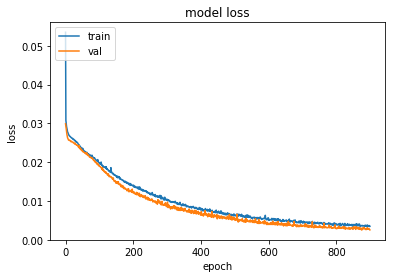

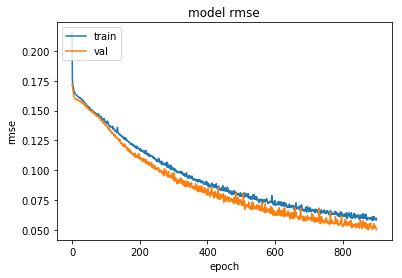

In [37]:
#2 hidden layers, both with 50 units, alpha=0.01
#LSTM call model definition
click_model11= click_stacked_stateless_LSTM2(units=50,lr=0.001, alpha=0.01, dropout=0.1)
click_model11.summary()

#Train LSTM
hist= stateless_fit(click_model11, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_11.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [38]:
click_pred_train=click_model11.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model11.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model11.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  45.599674041366605
YRMSE train:  33.35571221588625
XRMSE val:  58.10455543390781
YRMSE val:  41.45755566919101
XRMSE test:  62.55040266604029
YRMSE test:  42.34741727814651


### 3 hidden layers

In [33]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateless_LSTM4(units, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=True, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(LSTM(units, return_sequences=True, recurrent_dropout=dropout))
    model.add(LSTM(units, return_sequences=False, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_2 (LSTM)                (None, 18, 50)            20200     
_________________________________________________________________
lstm_3 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 2)                 0         
Total params: 51,102
Trainable params: 51,102
Non-trainable 


Epoch 00037: val_loss improved from 0.02251 to 0.02247, saving model to click_wts_13.hdf5
Epoch 38/1000
 - 8s - loss: 0.0239 - rmse: 0.1541 - val_loss: 0.0226 - val_rmse: 0.1498

Epoch 00038: val_loss did not improve from 0.02247
Epoch 39/1000
 - 8s - loss: 0.0240 - rmse: 0.1545 - val_loss: 0.0220 - val_rmse: 0.1477

Epoch 00039: val_loss improved from 0.02247 to 0.02197, saving model to click_wts_13.hdf5
Epoch 40/1000
 - 8s - loss: 0.0236 - rmse: 0.1531 - val_loss: 0.0221 - val_rmse: 0.1479

Epoch 00040: val_loss did not improve from 0.02197
Epoch 41/1000
 - 8s - loss: 0.0235 - rmse: 0.1528 - val_loss: 0.0218 - val_rmse: 0.1472

Epoch 00041: val_loss improved from 0.02197 to 0.02185, saving model to click_wts_13.hdf5
Epoch 42/1000
 - 8s - loss: 0.0233 - rmse: 0.1523 - val_loss: 0.0215 - val_rmse: 0.1461

Epoch 00042: val_loss improved from 0.02185 to 0.02152, saving model to click_wts_13.hdf5
Epoch 43/1000
 - 7s - loss: 0.0233 - rmse: 0.1524 - val_loss: 0.0218 - val_rmse: 0.1469

Epo


Epoch 00087: val_loss did not improve from 0.01753
Epoch 88/1000
 - 8s - loss: 0.0190 - rmse: 0.1376 - val_loss: 0.0172 - val_rmse: 0.1304

Epoch 00088: val_loss improved from 0.01753 to 0.01716, saving model to click_wts_13.hdf5
Epoch 89/1000
 - 7s - loss: 0.0188 - rmse: 0.1369 - val_loss: 0.0172 - val_rmse: 0.1308

Epoch 00089: val_loss did not improve from 0.01716
Epoch 90/1000
 - 7s - loss: 0.0200 - rmse: 0.1410 - val_loss: 0.0179 - val_rmse: 0.1334

Epoch 00090: val_loss did not improve from 0.01716
Epoch 91/1000
 - 8s - loss: 0.0189 - rmse: 0.1372 - val_loss: 0.0174 - val_rmse: 0.1313

Epoch 00091: val_loss did not improve from 0.01716
Epoch 92/1000
 - 8s - loss: 0.0187 - rmse: 0.1365 - val_loss: 0.0171 - val_rmse: 0.1303

Epoch 00092: val_loss improved from 0.01716 to 0.01712, saving model to click_wts_13.hdf5
Epoch 93/1000
 - 8s - loss: 0.0187 - rmse: 0.1363 - val_loss: 0.0171 - val_rmse: 0.1301

Epoch 00093: val_loss improved from 0.01712 to 0.01706, saving model to click_wts

 - 7s - loss: 0.0140 - rmse: 0.1181 - val_loss: 0.0127 - val_rmse: 0.1122

Epoch 00139: val_loss did not improve from 0.01259
Epoch 140/1000
 - 8s - loss: 0.0143 - rmse: 0.1193 - val_loss: 0.0124 - val_rmse: 0.1108

Epoch 00140: val_loss improved from 0.01259 to 0.01237, saving model to click_wts_13.hdf5
Epoch 141/1000
 - 8s - loss: 0.0139 - rmse: 0.1174 - val_loss: 0.0122 - val_rmse: 0.1099

Epoch 00141: val_loss improved from 0.01237 to 0.01217, saving model to click_wts_13.hdf5
Epoch 142/1000
 - 7s - loss: 0.0139 - rmse: 0.1176 - val_loss: 0.0121 - val_rmse: 0.1095

Epoch 00142: val_loss improved from 0.01217 to 0.01207, saving model to click_wts_13.hdf5
Epoch 143/1000
 - 7s - loss: 0.0138 - rmse: 0.1172 - val_loss: 0.0123 - val_rmse: 0.1105

Epoch 00143: val_loss did not improve from 0.01207
Epoch 144/1000
 - 7s - loss: 0.0137 - rmse: 0.1167 - val_loss: 0.0123 - val_rmse: 0.1107

Epoch 00144: val_loss did not improve from 0.01207
Epoch 145/1000
 - 7s - loss: 0.0137 - rmse: 0.1165 -

 - 7s - loss: 0.0110 - rmse: 0.1045 - val_loss: 0.0098 - val_rmse: 0.0984

Epoch 00192: val_loss did not improve from 0.00896
Epoch 193/1000
 - 7s - loss: 0.0110 - rmse: 0.1047 - val_loss: 0.0090 - val_rmse: 0.0947

Epoch 00193: val_loss did not improve from 0.00896
Epoch 194/1000
 - 7s - loss: 0.0104 - rmse: 0.1019 - val_loss: 0.0093 - val_rmse: 0.0959

Epoch 00194: val_loss did not improve from 0.00896
Epoch 195/1000
 - 7s - loss: 0.0104 - rmse: 0.1016 - val_loss: 0.0094 - val_rmse: 0.0964

Epoch 00195: val_loss did not improve from 0.00896
Epoch 196/1000
 - 7s - loss: 0.0103 - rmse: 0.1011 - val_loss: 0.0089 - val_rmse: 0.0940

Epoch 00196: val_loss improved from 0.00896 to 0.00891, saving model to click_wts_13.hdf5
Epoch 197/1000
 - 7s - loss: 0.0102 - rmse: 0.1007 - val_loss: 0.0094 - val_rmse: 0.0965

Epoch 00197: val_loss did not improve from 0.00891
Epoch 198/1000
 - 7s - loss: 0.0104 - rmse: 0.1019 - val_loss: 0.0088 - val_rmse: 0.0933

Epoch 00198: val_loss improved from 0.00

 - 7s - loss: 0.0080 - rmse: 0.0894 - val_loss: 0.0069 - val_rmse: 0.0827

Epoch 00246: val_loss did not improve from 0.00682
Epoch 247/1000
 - 7s - loss: 0.0080 - rmse: 0.0889 - val_loss: 0.0069 - val_rmse: 0.0828

Epoch 00247: val_loss did not improve from 0.00682
Epoch 248/1000
 - 7s - loss: 0.0078 - rmse: 0.0879 - val_loss: 0.0064 - val_rmse: 0.0795

Epoch 00248: val_loss improved from 0.00682 to 0.00637, saving model to click_wts_13.hdf5
Epoch 249/1000
 - 7s - loss: 0.0079 - rmse: 0.0886 - val_loss: 0.0064 - val_rmse: 0.0798

Epoch 00249: val_loss did not improve from 0.00637
Epoch 250/1000
 - 7s - loss: 0.0078 - rmse: 0.0881 - val_loss: 0.0069 - val_rmse: 0.0826

Epoch 00250: val_loss did not improve from 0.00637
Epoch 251/1000
 - 7s - loss: 0.0078 - rmse: 0.0879 - val_loss: 0.0069 - val_rmse: 0.0826

Epoch 00251: val_loss did not improve from 0.00637
Epoch 252/1000
 - 7s - loss: 0.0079 - rmse: 0.0886 - val_loss: 0.0066 - val_rmse: 0.0806

Epoch 00252: val_loss did not improve fr

 - 7s - loss: 0.0066 - rmse: 0.0810 - val_loss: 0.0058 - val_rmse: 0.0758

Epoch 00302: val_loss did not improve from 0.00508
Epoch 303/1000
 - 7s - loss: 0.0067 - rmse: 0.0816 - val_loss: 0.0057 - val_rmse: 0.0750

Epoch 00303: val_loss did not improve from 0.00508
Epoch 304/1000
 - 7s - loss: 0.0063 - rmse: 0.0791 - val_loss: 0.0055 - val_rmse: 0.0741

Epoch 00304: val_loss did not improve from 0.00508
Epoch 305/1000
 - 7s - loss: 0.0065 - rmse: 0.0802 - val_loss: 0.0054 - val_rmse: 0.0730

Epoch 00305: val_loss did not improve from 0.00508
Epoch 306/1000
 - 7s - loss: 0.0061 - rmse: 0.0780 - val_loss: 0.0057 - val_rmse: 0.0754

Epoch 00306: val_loss did not improve from 0.00508
Epoch 307/1000
 - 8s - loss: 0.0063 - rmse: 0.0791 - val_loss: 0.0051 - val_rmse: 0.0712

Epoch 00307: val_loss did not improve from 0.00508
Epoch 308/1000
 - 7s - loss: 0.0064 - rmse: 0.0796 - val_loss: 0.0054 - val_rmse: 0.0733

Epoch 00308: val_loss did not improve from 0.00508
Epoch 309/1000
 - 7s - loss:


Epoch 00358: val_loss did not improve from 0.00434
Epoch 359/1000
 - 7s - loss: 0.0052 - rmse: 0.0718 - val_loss: 0.0048 - val_rmse: 0.0692

Epoch 00359: val_loss did not improve from 0.00434
Epoch 360/1000
 - 7s - loss: 0.0048 - rmse: 0.0691 - val_loss: 0.0051 - val_rmse: 0.0713

Epoch 00360: val_loss did not improve from 0.00434
Epoch 361/1000
 - 7s - loss: 0.0055 - rmse: 0.0735 - val_loss: 0.0043 - val_rmse: 0.0655

Epoch 00361: val_loss did not improve from 0.00434
Epoch 362/1000
 - 7s - loss: 0.0052 - rmse: 0.0717 - val_loss: 0.0046 - val_rmse: 0.0677

Epoch 00362: val_loss did not improve from 0.00434
Epoch 363/1000
 - 7s - loss: 0.0052 - rmse: 0.0716 - val_loss: 0.0042 - val_rmse: 0.0640

Epoch 00363: val_loss improved from 0.00434 to 0.00416, saving model to click_wts_13.hdf5
Epoch 364/1000
 - 7s - loss: 0.0050 - rmse: 0.0707 - val_loss: 0.0046 - val_rmse: 0.0671

Epoch 00364: val_loss did not improve from 0.00416
Epoch 365/1000
 - 7s - loss: 0.0053 - rmse: 0.0727 - val_loss: 

 - 8s - loss: 0.0042 - rmse: 0.0649 - val_loss: 0.0038 - val_rmse: 0.0617

Epoch 00415: val_loss did not improve from 0.00344
Epoch 416/1000
 - 8s - loss: 0.0042 - rmse: 0.0644 - val_loss: 0.0035 - val_rmse: 0.0587

Epoch 00416: val_loss did not improve from 0.00344
Epoch 417/1000
 - 8s - loss: 0.0043 - rmse: 0.0653 - val_loss: 0.0038 - val_rmse: 0.0611

Epoch 00417: val_loss did not improve from 0.00344
Epoch 418/1000
 - 8s - loss: 0.0042 - rmse: 0.0643 - val_loss: 0.0039 - val_rmse: 0.0617

Epoch 00418: val_loss did not improve from 0.00344
Epoch 419/1000
 - 8s - loss: 0.0043 - rmse: 0.0649 - val_loss: 0.0036 - val_rmse: 0.0596

Epoch 00419: val_loss did not improve from 0.00344
Epoch 420/1000
 - 8s - loss: 0.0040 - rmse: 0.0630 - val_loss: 0.0036 - val_rmse: 0.0594

Epoch 00420: val_loss did not improve from 0.00344
Epoch 421/1000
 - 9s - loss: 0.0042 - rmse: 0.0640 - val_loss: 0.0034 - val_rmse: 0.0579

Epoch 00421: val_loss improved from 0.00344 to 0.00339, saving model to click_w

 - 8s - loss: 0.0036 - rmse: 0.0595 - val_loss: 0.0031 - val_rmse: 0.0552

Epoch 00472: val_loss did not improve from 0.00308
Epoch 473/1000
 - 8s - loss: 0.0037 - rmse: 0.0605 - val_loss: 0.0034 - val_rmse: 0.0576

Epoch 00473: val_loss did not improve from 0.00308
Epoch 474/1000
 - 8s - loss: 0.0038 - rmse: 0.0612 - val_loss: 0.0029 - val_rmse: 0.0540

Epoch 00474: val_loss improved from 0.00308 to 0.00295, saving model to click_wts_13.hdf5
Epoch 475/1000
 - 8s - loss: 0.0035 - rmse: 0.0587 - val_loss: 0.0035 - val_rmse: 0.0584

Epoch 00475: val_loss did not improve from 0.00295
Epoch 476/1000
 - 8s - loss: 0.0039 - rmse: 0.0618 - val_loss: 0.0031 - val_rmse: 0.0550

Epoch 00476: val_loss did not improve from 0.00295
Epoch 477/1000
 - 8s - loss: 0.0035 - rmse: 0.0591 - val_loss: 0.0030 - val_rmse: 0.0549

Epoch 00477: val_loss did not improve from 0.00295
Epoch 478/1000
 - 8s - loss: 0.0037 - rmse: 0.0604 - val_loss: 0.0033 - val_rmse: 0.0567

Epoch 00478: val_loss did not improve fr


Epoch 00528: val_loss did not improve from 0.00245
Epoch 529/1000
 - 8s - loss: 0.0031 - rmse: 0.0549 - val_loss: 0.0031 - val_rmse: 0.0553

Epoch 00529: val_loss did not improve from 0.00245
Epoch 530/1000
 - 8s - loss: 0.0032 - rmse: 0.0557 - val_loss: 0.0030 - val_rmse: 0.0547

Epoch 00530: val_loss did not improve from 0.00245
Epoch 531/1000
 - 8s - loss: 0.0031 - rmse: 0.0551 - val_loss: 0.0026 - val_rmse: 0.0508

Epoch 00531: val_loss did not improve from 0.00245
Epoch 532/1000
 - 8s - loss: 0.0032 - rmse: 0.0564 - val_loss: 0.0030 - val_rmse: 0.0546

Epoch 00532: val_loss did not improve from 0.00245
Epoch 533/1000
 - 8s - loss: 0.0032 - rmse: 0.0565 - val_loss: 0.0028 - val_rmse: 0.0527

Epoch 00533: val_loss did not improve from 0.00245
Epoch 534/1000
 - 8s - loss: 0.0031 - rmse: 0.0551 - val_loss: 0.0030 - val_rmse: 0.0547

Epoch 00534: val_loss did not improve from 0.00245
Epoch 535/1000
 - 8s - loss: 0.0032 - rmse: 0.0557 - val_loss: 0.0025 - val_rmse: 0.0495

Epoch 00535:

 - 8s - loss: 0.0027 - rmse: 0.0517 - val_loss: 0.0024 - val_rmse: 0.0485

Epoch 00586: val_loss did not improve from 0.00226
Epoch 587/1000
 - 8s - loss: 0.0026 - rmse: 0.0511 - val_loss: 0.0026 - val_rmse: 0.0503

Epoch 00587: val_loss did not improve from 0.00226
Epoch 588/1000
 - 8s - loss: 0.0028 - rmse: 0.0527 - val_loss: 0.0025 - val_rmse: 0.0494

Epoch 00588: val_loss did not improve from 0.00226
Epoch 589/1000
 - 8s - loss: 0.0027 - rmse: 0.0516 - val_loss: 0.0030 - val_rmse: 0.0541

Epoch 00589: val_loss did not improve from 0.00226
Epoch 590/1000
 - 8s - loss: 0.0034 - rmse: 0.0578 - val_loss: 0.0032 - val_rmse: 0.0555

Epoch 00590: val_loss did not improve from 0.00226
Epoch 591/1000
 - 8s - loss: 0.0029 - rmse: 0.0533 - val_loss: 0.0032 - val_rmse: 0.0561

Epoch 00591: val_loss did not improve from 0.00226
Epoch 592/1000
 - 8s - loss: 0.0029 - rmse: 0.0534 - val_loss: 0.0024 - val_rmse: 0.0489

Epoch 00592: val_loss did not improve from 0.00226
Epoch 593/1000
 - 8s - loss:


Epoch 00643: val_loss did not improve from 0.00198
Epoch 644/1000
 - 8s - loss: 0.0024 - rmse: 0.0483 - val_loss: 0.0025 - val_rmse: 0.0490

Epoch 00644: val_loss did not improve from 0.00198
Epoch 645/1000
 - 8s - loss: 0.0026 - rmse: 0.0502 - val_loss: 0.0021 - val_rmse: 0.0449

Epoch 00645: val_loss did not improve from 0.00198
Epoch 646/1000
 - 9s - loss: 0.0028 - rmse: 0.0526 - val_loss: 0.0031 - val_rmse: 0.0552

Epoch 00646: val_loss did not improve from 0.00198
Epoch 647/1000
 - 8s - loss: 0.0025 - rmse: 0.0497 - val_loss: 0.0025 - val_rmse: 0.0501

Epoch 00647: val_loss did not improve from 0.00198
Epoch 648/1000
 - 8s - loss: 0.0024 - rmse: 0.0488 - val_loss: 0.0021 - val_rmse: 0.0449

Epoch 00648: val_loss did not improve from 0.00198
Epoch 649/1000
 - 8s - loss: 0.0024 - rmse: 0.0486 - val_loss: 0.0024 - val_rmse: 0.0485

Epoch 00649: val_loss did not improve from 0.00198
Epoch 650/1000
 - 8s - loss: 0.0025 - rmse: 0.0497 - val_loss: 0.0022 - val_rmse: 0.0460

Epoch 00650:


Epoch 00701: val_loss did not improve from 0.00192
Epoch 702/1000
 - 8s - loss: 0.0023 - rmse: 0.0481 - val_loss: 0.0022 - val_rmse: 0.0458

Epoch 00702: val_loss did not improve from 0.00192
Epoch 703/1000
 - 8s - loss: 0.0026 - rmse: 0.0507 - val_loss: 0.0021 - val_rmse: 0.0455

Epoch 00703: val_loss did not improve from 0.00192
Epoch 704/1000
 - 8s - loss: 0.0023 - rmse: 0.0479 - val_loss: 0.0022 - val_rmse: 0.0465

Epoch 00704: val_loss did not improve from 0.00192
Epoch 705/1000
 - 8s - loss: 0.0022 - rmse: 0.0465 - val_loss: 0.0020 - val_rmse: 0.0444

Epoch 00705: val_loss did not improve from 0.00192
Epoch 706/1000
 - 9s - loss: 0.0027 - rmse: 0.0511 - val_loss: 0.0026 - val_rmse: 0.0509

Epoch 00706: val_loss did not improve from 0.00192
Epoch 707/1000
 - 8s - loss: 0.0022 - rmse: 0.0468 - val_loss: 0.0020 - val_rmse: 0.0447

Epoch 00707: val_loss did not improve from 0.00192
Epoch 708/1000
 - 8s - loss: 0.0023 - rmse: 0.0473 - val_loss: 0.0020 - val_rmse: 0.0447

Epoch 00708:

 - 8s - loss: 0.0022 - rmse: 0.0463 - val_loss: 0.0019 - val_rmse: 0.0429

Epoch 00759: val_loss did not improve from 0.00163
Epoch 760/1000
 - 8s - loss: 0.0021 - rmse: 0.0456 - val_loss: 0.0029 - val_rmse: 0.0530

Epoch 00760: val_loss did not improve from 0.00163
Epoch 761/1000
 - 8s - loss: 0.0022 - rmse: 0.0470 - val_loss: 0.0027 - val_rmse: 0.0517

Epoch 00761: val_loss did not improve from 0.00163
Epoch 762/1000
 - 8s - loss: 0.0021 - rmse: 0.0456 - val_loss: 0.0018 - val_rmse: 0.0422

Epoch 00762: val_loss did not improve from 0.00163
Epoch 763/1000
 - 8s - loss: 0.0020 - rmse: 0.0447 - val_loss: 0.0017 - val_rmse: 0.0400

Epoch 00763: val_loss did not improve from 0.00163
Epoch 764/1000
 - 8s - loss: 0.0019 - rmse: 0.0430 - val_loss: 0.0021 - val_rmse: 0.0449

Epoch 00764: val_loss did not improve from 0.00163
Epoch 765/1000
 - 9s - loss: 0.0019 - rmse: 0.0432 - val_loss: 0.0020 - val_rmse: 0.0438

Epoch 00765: val_loss did not improve from 0.00163
Epoch 766/1000
 - 8s - loss:

 - 8s - loss: 0.0019 - rmse: 0.0429 - val_loss: 0.0019 - val_rmse: 0.0435

Epoch 00817: val_loss did not improve from 0.00156
Epoch 818/1000
 - 8s - loss: 0.0017 - rmse: 0.0411 - val_loss: 0.0019 - val_rmse: 0.0428

Epoch 00818: val_loss did not improve from 0.00156
Epoch 819/1000
 - 8s - loss: 0.0017 - rmse: 0.0405 - val_loss: 0.0015 - val_rmse: 0.0381

Epoch 00819: val_loss improved from 0.00156 to 0.00150, saving model to click_wts_13.hdf5
Epoch 820/1000
 - 8s - loss: 0.0015 - rmse: 0.0389 - val_loss: 0.0016 - val_rmse: 0.0395

Epoch 00820: val_loss did not improve from 0.00150
Epoch 821/1000
 - 8s - loss: 0.0017 - rmse: 0.0404 - val_loss: 0.0020 - val_rmse: 0.0444

Epoch 00821: val_loss did not improve from 0.00150
Epoch 822/1000
 - 8s - loss: 0.0019 - rmse: 0.0436 - val_loss: 0.0019 - val_rmse: 0.0423

Epoch 00822: val_loss did not improve from 0.00150
Epoch 823/1000
 - 8s - loss: 0.0020 - rmse: 0.0447 - val_loss: 0.0019 - val_rmse: 0.0429

Epoch 00823: val_loss did not improve fr

 - 8s - loss: 0.0020 - rmse: 0.0439 - val_loss: 0.0018 - val_rmse: 0.0414

Epoch 00875: val_loss did not improve from 0.00146
Epoch 876/1000
 - 8s - loss: 0.0017 - rmse: 0.0408 - val_loss: 0.0022 - val_rmse: 0.0457

Epoch 00876: val_loss did not improve from 0.00146
Epoch 877/1000
 - 8s - loss: 0.0021 - rmse: 0.0457 - val_loss: 0.0019 - val_rmse: 0.0422

Epoch 00877: val_loss did not improve from 0.00146
Epoch 878/1000
 - 8s - loss: 0.0018 - rmse: 0.0415 - val_loss: 0.0021 - val_rmse: 0.0457

Epoch 00878: val_loss did not improve from 0.00146
Epoch 879/1000
 - 8s - loss: 0.0018 - rmse: 0.0423 - val_loss: 0.0018 - val_rmse: 0.0419

Epoch 00879: val_loss did not improve from 0.00146
Epoch 880/1000
 - 8s - loss: 0.0016 - rmse: 0.0396 - val_loss: 0.0016 - val_rmse: 0.0396

Epoch 00880: val_loss did not improve from 0.00146
Epoch 881/1000
 - 8s - loss: 0.0015 - rmse: 0.0384 - val_loss: 0.0015 - val_rmse: 0.0388

Epoch 00881: val_loss did not improve from 0.00146
Epoch 882/1000
 - 8s - loss:


Epoch 00933: val_loss did not improve from 0.00146
Epoch 934/1000
 - 8s - loss: 0.0015 - rmse: 0.0386 - val_loss: 0.0018 - val_rmse: 0.0412

Epoch 00934: val_loss did not improve from 0.00146
Epoch 935/1000
 - 8s - loss: 0.0014 - rmse: 0.0378 - val_loss: 0.0016 - val_rmse: 0.0388

Epoch 00935: val_loss did not improve from 0.00146
Epoch 936/1000
 - 8s - loss: 0.0015 - rmse: 0.0384 - val_loss: 0.0016 - val_rmse: 0.0394

Epoch 00936: val_loss did not improve from 0.00146
Epoch 937/1000
 - 8s - loss: 0.0017 - rmse: 0.0405 - val_loss: 0.0017 - val_rmse: 0.0409

Epoch 00937: val_loss did not improve from 0.00146
Epoch 938/1000
 - 8s - loss: 0.0020 - rmse: 0.0445 - val_loss: 0.0016 - val_rmse: 0.0388

Epoch 00938: val_loss did not improve from 0.00146
Epoch 939/1000
 - 8s - loss: 0.0016 - rmse: 0.0393 - val_loss: 0.0016 - val_rmse: 0.0393

Epoch 00939: val_loss did not improve from 0.00146
Epoch 940/1000
 - 8s - loss: 0.0014 - rmse: 0.0366 - val_loss: 0.0016 - val_rmse: 0.0399

Epoch 00940:


Epoch 00991: val_loss did not improve from 0.00133
Epoch 992/1000
 - 8s - loss: 0.0014 - rmse: 0.0378 - val_loss: 0.0015 - val_rmse: 0.0387

Epoch 00992: val_loss did not improve from 0.00133
Epoch 993/1000
 - 8s - loss: 0.0014 - rmse: 0.0369 - val_loss: 0.0016 - val_rmse: 0.0396

Epoch 00993: val_loss did not improve from 0.00133
Epoch 994/1000
 - 8s - loss: 0.0016 - rmse: 0.0400 - val_loss: 0.0023 - val_rmse: 0.0472

Epoch 00994: val_loss did not improve from 0.00133
Epoch 995/1000
 - 8s - loss: 0.0017 - rmse: 0.0409 - val_loss: 0.0018 - val_rmse: 0.0420

Epoch 00995: val_loss did not improve from 0.00133
Epoch 996/1000
 - 8s - loss: 0.0019 - rmse: 0.0432 - val_loss: 0.0014 - val_rmse: 0.0372

Epoch 00996: val_loss did not improve from 0.00133
Epoch 997/1000
 - 8s - loss: 0.0017 - rmse: 0.0402 - val_loss: 0.0021 - val_rmse: 0.0446

Epoch 00997: val_loss did not improve from 0.00133
Epoch 998/1000
 - 8s - loss: 0.0015 - rmse: 0.0383 - val_loss: 0.0013 - val_rmse: 0.0359

Epoch 00998:

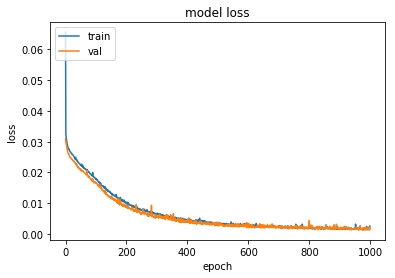

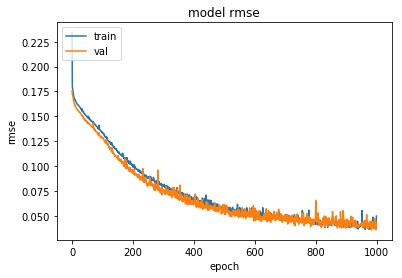

In [25]:
#3 hidden layers, all with 50 units, alpha=0.01
#LSTM call model definition
click_model13= click_stacked_stateless_LSTM4(units=50,lr=0.001, alpha=0.01, dropout=0.1)
click_model13.summary()

#Train LSTM
hist= stateless_fit(click_model13, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_wts_13.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [34]:
click_model13= click_stacked_stateless_LSTM4(units=50,lr=0.001, alpha=0.01, dropout=0.1)
click_model13.load_weights('click_wts_13.hdf5')

Model created and compiled


In [63]:
click_pred_train=click_model13.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model13.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model13.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  40.213720568066634
YRMSE train:  28.098445432705518
XRMSE val:  41.190376265316196
YRMSE val:  29.053187342831002
XRMSE test:  41.88497761104314
YRMSE test:  27.322537378633058


3 hidden layers have outperformed 2 hidden layers. This is the best model so far.

In [ ]:
#stacked stateless LSTM with 3 hidden layers for 5 iterations
timesteps=18
sample_size=5
X_RMSE=[]
Y_RMSE=[]

for i in range(sample_size):
    print('Experimental Run: ', i)
    
    model= click_stacked_stateless_LSTM4(units=50,lr=0.001, alpha=0.01, dropout=0.1)
    model.fit(X_click_train, Y_click_train, validation_data=(X_click_val, Y_click_val), batch_size=133, epochs=900, verbose=0, shuffle=False)
    
    Y_click_pred = model.predict(X_click_test)
    
    xrmse, yrmse= calculate_RMSE(Y_click_pred, Y_click_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

    print(X_RMSE)
    print(Y_RMSE)
    
print('Iterations Completed')
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)) +'\n')

#Result of the above block
Experimental Run:  0
WARNING:tensorflow:From /opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/op_def_library.py:263: colocate_with (from tensorflow.python.framework.ops) is deprecated and will be removed in a future version.
Instructions for updating:
Colocations handled automatically by placer.
WARNING:tensorflow:From /opt/conda/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:3445: calling dropout (from tensorflow.python.ops.nn_ops) with keep_prob is deprecated and will be removed in a future version.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model created and compiled
WARNING:tensorflow:From /opt/conda/lib/python3.6/site-packages/tensorflow/python/ops/math_ops.py:3066: to_int32 (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.cast instead.
[50.05202585741727]
[34.26237574651795]
Experimental Run:  1
Model created and compiled
[50.05202585741727, 50.703253528333306]
[34.26237574651795, 32.2464744918665]
Experimental Run:  2
Model created and compiled
[50.05202585741727, 50.703253528333306, 50.400294690883676]
[34.26237574651795, 32.2464744918665, 34.233551535352724]
Experimental Run:  3
Model created and compiled
[50.05202585741727, 50.703253528333306, 50.400294690883676, 55.66725115484238]
[34.26237574651795, 32.2464744918665, 34.233551535352724, 35.3707765287395]
Experimental Run:  4
Model created and compiled
[50.05202585741727, 50.703253528333306, 50.400294690883676, 55.66725115484238, 50.71726309904936]
[34.26237574651795, 32.2464744918665, 34.233551535352724, 35.3707765287395, 31.86983944570244]
Iterations Completed
X-coord RMSE Mean: 51.5080176661052

Y-coord RMSE Mean: 33.596603549635816

Time Took :343.62 min

In [4]:
#Results obtained after 5 iterations
print('Mean XRMSE: ', np.round(51.5080176661052, 3))
print('Mean YRMSE: ', np.round(33.596603549635816, 3))

Mean XRMSE:  51.508
Mean YRMSE:  33.597


In [27]:
#3 hidden layers each having a different number of units
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateless_LSTM5(units_1, units_2, units_3, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units_1, return_sequences=True, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(LSTM(units_2, return_sequences=True, recurrent_dropout=dropout))
    model.add(LSTM(units_3, return_sequences=False, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_5 (LSTM)                (None, 18, 40)            14560     
_________________________________________________________________
lstm_6 (LSTM)                (None, 30)                8520      
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 2)                 0         
Total params: 33,742
Trainable params: 33,742
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/1000
 - 11s - loss: 0.0629 - rmse: 0.2341 - val_loss: 0

 - 8s - loss: 0.0242 - rmse: 0.1552 - val_loss: 0.0227 - val_rmse: 0.1500

Epoch 00043: val_loss improved from 0.02322 to 0.02267, saving model to click_wts_14.hdf5
Epoch 44/1000
 - 8s - loss: 0.0242 - rmse: 0.1551 - val_loss: 0.0231 - val_rmse: 0.1515

Epoch 00044: val_loss did not improve from 0.02267
Epoch 45/1000
 - 8s - loss: 0.0241 - rmse: 0.1548 - val_loss: 0.0229 - val_rmse: 0.1506

Epoch 00045: val_loss did not improve from 0.02267
Epoch 46/1000
 - 8s - loss: 0.0239 - rmse: 0.1541 - val_loss: 0.0225 - val_rmse: 0.1495

Epoch 00046: val_loss improved from 0.02267 to 0.02251, saving model to click_wts_14.hdf5
Epoch 47/1000
 - 8s - loss: 0.0237 - rmse: 0.1537 - val_loss: 0.0226 - val_rmse: 0.1498

Epoch 00047: val_loss did not improve from 0.02251
Epoch 48/1000
 - 8s - loss: 0.0237 - rmse: 0.1535 - val_loss: 0.0225 - val_rmse: 0.1493

Epoch 00048: val_loss improved from 0.02251 to 0.02246, saving model to click_wts_14.hdf5
Epoch 49/1000
 - 8s - loss: 0.0236 - rmse: 0.1531 - val_l


Epoch 00093: val_loss improved from 0.01845 to 0.01809, saving model to click_wts_14.hdf5
Epoch 94/1000
 - 9s - loss: 0.0196 - rmse: 0.1398 - val_loss: 0.0184 - val_rmse: 0.1351

Epoch 00094: val_loss did not improve from 0.01809
Epoch 95/1000
 - 8s - loss: 0.0195 - rmse: 0.1393 - val_loss: 0.0180 - val_rmse: 0.1337

Epoch 00095: val_loss improved from 0.01809 to 0.01803, saving model to click_wts_14.hdf5
Epoch 96/1000
 - 8s - loss: 0.0194 - rmse: 0.1388 - val_loss: 0.0180 - val_rmse: 0.1337

Epoch 00096: val_loss did not improve from 0.01803
Epoch 97/1000
 - 8s - loss: 0.0193 - rmse: 0.1386 - val_loss: 0.0181 - val_rmse: 0.1338

Epoch 00097: val_loss did not improve from 0.01803
Epoch 98/1000
 - 8s - loss: 0.0192 - rmse: 0.1383 - val_loss: 0.0181 - val_rmse: 0.1339

Epoch 00098: val_loss did not improve from 0.01803
Epoch 99/1000
 - 8s - loss: 0.0190 - rmse: 0.1377 - val_loss: 0.0176 - val_rmse: 0.1321

Epoch 00099: val_loss improved from 0.01803 to 0.01759, saving model to click_wts

 - 8s - loss: 0.0151 - rmse: 0.1225 - val_loss: 0.0136 - val_rmse: 0.1162

Epoch 00145: val_loss improved from 0.01376 to 0.01362, saving model to click_wts_14.hdf5
Epoch 146/1000
 - 8s - loss: 0.0149 - rmse: 0.1217 - val_loss: 0.0141 - val_rmse: 0.1182

Epoch 00146: val_loss did not improve from 0.01362
Epoch 147/1000
 - 8s - loss: 0.0150 - rmse: 0.1223 - val_loss: 0.0138 - val_rmse: 0.1173

Epoch 00147: val_loss did not improve from 0.01362
Epoch 148/1000
 - 8s - loss: 0.0149 - rmse: 0.1216 - val_loss: 0.0134 - val_rmse: 0.1151

Epoch 00148: val_loss improved from 0.01362 to 0.01335, saving model to click_wts_14.hdf5
Epoch 149/1000
 - 8s - loss: 0.0149 - rmse: 0.1215 - val_loss: 0.0130 - val_rmse: 0.1136

Epoch 00149: val_loss improved from 0.01335 to 0.01302, saving model to click_wts_14.hdf5
Epoch 150/1000
 - 8s - loss: 0.0147 - rmse: 0.1207 - val_loss: 0.0136 - val_rmse: 0.1162

Epoch 00150: val_loss did not improve from 0.01302
Epoch 151/1000
 - 8s - loss: 0.0147 - rmse: 0.1208 -

 - 9s - loss: 0.0113 - rmse: 0.1060 - val_loss: 0.0097 - val_rmse: 0.0980

Epoch 00198: val_loss improved from 0.01038 to 0.00968, saving model to click_wts_14.hdf5
Epoch 199/1000
 - 8s - loss: 0.0115 - rmse: 0.1069 - val_loss: 0.0101 - val_rmse: 0.1000

Epoch 00199: val_loss did not improve from 0.00968
Epoch 200/1000
 - 8s - loss: 0.0114 - rmse: 0.1063 - val_loss: 0.0101 - val_rmse: 0.1001

Epoch 00200: val_loss did not improve from 0.00968
Epoch 201/1000
 - 8s - loss: 0.0115 - rmse: 0.1068 - val_loss: 0.0107 - val_rmse: 0.1029

Epoch 00201: val_loss did not improve from 0.00968
Epoch 202/1000
 - 8s - loss: 0.0117 - rmse: 0.1077 - val_loss: 0.0104 - val_rmse: 0.1014

Epoch 00202: val_loss did not improve from 0.00968
Epoch 203/1000
 - 8s - loss: 0.0115 - rmse: 0.1068 - val_loss: 0.0103 - val_rmse: 0.1009

Epoch 00203: val_loss did not improve from 0.00968
Epoch 204/1000
 - 8s - loss: 0.0112 - rmse: 0.1053 - val_loss: 0.0096 - val_rmse: 0.0976

Epoch 00204: val_loss improved from 0.00


Epoch 00252: val_loss did not improve from 0.00809
Epoch 253/1000
 - 8s - loss: 0.0099 - rmse: 0.0993 - val_loss: 0.0082 - val_rmse: 0.0903

Epoch 00253: val_loss did not improve from 0.00809
Epoch 254/1000
 - 8s - loss: 0.0092 - rmse: 0.0956 - val_loss: 0.0078 - val_rmse: 0.0882

Epoch 00254: val_loss improved from 0.00809 to 0.00784, saving model to click_wts_14.hdf5
Epoch 255/1000
 - 8s - loss: 0.0092 - rmse: 0.0957 - val_loss: 0.0084 - val_rmse: 0.0915

Epoch 00255: val_loss did not improve from 0.00784
Epoch 256/1000
 - 8s - loss: 0.0093 - rmse: 0.0964 - val_loss: 0.0078 - val_rmse: 0.0882

Epoch 00256: val_loss improved from 0.00784 to 0.00783, saving model to click_wts_14.hdf5
Epoch 257/1000
 - 9s - loss: 0.0089 - rmse: 0.0940 - val_loss: 0.0081 - val_rmse: 0.0894

Epoch 00257: val_loss did not improve from 0.00783
Epoch 258/1000
 - 8s - loss: 0.0093 - rmse: 0.0961 - val_loss: 0.0086 - val_rmse: 0.0922

Epoch 00258: val_loss did not improve from 0.00783
Epoch 259/1000
 - 8s - l


Epoch 00308: val_loss did not improve from 0.00659
Epoch 309/1000
 - 8s - loss: 0.0079 - rmse: 0.0888 - val_loss: 0.0072 - val_rmse: 0.0844

Epoch 00309: val_loss did not improve from 0.00659
Epoch 310/1000
 - 8s - loss: 0.0079 - rmse: 0.0886 - val_loss: 0.0065 - val_rmse: 0.0805

Epoch 00310: val_loss improved from 0.00659 to 0.00652, saving model to click_wts_14.hdf5
Epoch 311/1000
 - 8s - loss: 0.0078 - rmse: 0.0878 - val_loss: 0.0071 - val_rmse: 0.0841

Epoch 00311: val_loss did not improve from 0.00652
Epoch 312/1000
 - 8s - loss: 0.0079 - rmse: 0.0883 - val_loss: 0.0073 - val_rmse: 0.0851

Epoch 00312: val_loss did not improve from 0.00652
Epoch 313/1000
 - 8s - loss: 0.0076 - rmse: 0.0867 - val_loss: 0.0071 - val_rmse: 0.0839

Epoch 00313: val_loss did not improve from 0.00652
Epoch 314/1000
 - 8s - loss: 0.0077 - rmse: 0.0872 - val_loss: 0.0069 - val_rmse: 0.0825

Epoch 00314: val_loss did not improve from 0.00652
Epoch 315/1000
 - 8s - loss: 0.0076 - rmse: 0.0867 - val_loss: 


Epoch 00364: val_loss did not improve from 0.00555
Epoch 365/1000
 - 8s - loss: 0.0066 - rmse: 0.0808 - val_loss: 0.0056 - val_rmse: 0.0743

Epoch 00365: val_loss did not improve from 0.00555
Epoch 366/1000
 - 8s - loss: 0.0065 - rmse: 0.0801 - val_loss: 0.0058 - val_rmse: 0.0756

Epoch 00366: val_loss did not improve from 0.00555
Epoch 367/1000
 - 8s - loss: 0.0070 - rmse: 0.0831 - val_loss: 0.0060 - val_rmse: 0.0773

Epoch 00367: val_loss did not improve from 0.00555
Epoch 368/1000
 - 8s - loss: 0.0069 - rmse: 0.0829 - val_loss: 0.0063 - val_rmse: 0.0788

Epoch 00368: val_loss did not improve from 0.00555
Epoch 369/1000
 - 8s - loss: 0.0065 - rmse: 0.0803 - val_loss: 0.0058 - val_rmse: 0.0757

Epoch 00369: val_loss did not improve from 0.00555
Epoch 370/1000
 - 8s - loss: 0.0066 - rmse: 0.0806 - val_loss: 0.0056 - val_rmse: 0.0747

Epoch 00370: val_loss did not improve from 0.00555
Epoch 371/1000
 - 8s - loss: 0.0066 - rmse: 0.0810 - val_loss: 0.0056 - val_rmse: 0.0747

Epoch 00371:

 - 9s - loss: 0.0059 - rmse: 0.0767 - val_loss: 0.0051 - val_rmse: 0.0712

Epoch 00421: val_loss did not improve from 0.00471
Epoch 422/1000
 - 8s - loss: 0.0058 - rmse: 0.0757 - val_loss: 0.0052 - val_rmse: 0.0721

Epoch 00422: val_loss did not improve from 0.00471
Epoch 423/1000
 - 8s - loss: 0.0059 - rmse: 0.0765 - val_loss: 0.0048 - val_rmse: 0.0689

Epoch 00423: val_loss did not improve from 0.00471
Epoch 424/1000
 - 8s - loss: 0.0057 - rmse: 0.0755 - val_loss: 0.0046 - val_rmse: 0.0675

Epoch 00424: val_loss improved from 0.00471 to 0.00460, saving model to click_wts_14.hdf5
Epoch 425/1000
 - 8s - loss: 0.0057 - rmse: 0.0749 - val_loss: 0.0049 - val_rmse: 0.0695

Epoch 00425: val_loss did not improve from 0.00460
Epoch 426/1000
 - 8s - loss: 0.0057 - rmse: 0.0751 - val_loss: 0.0048 - val_rmse: 0.0692

Epoch 00426: val_loss did not improve from 0.00460
Epoch 427/1000
 - 8s - loss: 0.0054 - rmse: 0.0735 - val_loss: 0.0049 - val_rmse: 0.0698

Epoch 00427: val_loss did not improve fr


Epoch 00477: val_loss did not improve from 0.00414
Epoch 478/1000
 - 8s - loss: 0.0052 - rmse: 0.0714 - val_loss: 0.0045 - val_rmse: 0.0670

Epoch 00478: val_loss did not improve from 0.00414
Epoch 479/1000
 - 8s - loss: 0.0051 - rmse: 0.0709 - val_loss: 0.0041 - val_rmse: 0.0640

Epoch 00479: val_loss did not improve from 0.00414
Epoch 480/1000
 - 9s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0043 - val_rmse: 0.0649

Epoch 00480: val_loss did not improve from 0.00414
Epoch 481/1000
 - 8s - loss: 0.0052 - rmse: 0.0720 - val_loss: 0.0042 - val_rmse: 0.0646

Epoch 00481: val_loss did not improve from 0.00414
Epoch 482/1000
 - 8s - loss: 0.0050 - rmse: 0.0704 - val_loss: 0.0041 - val_rmse: 0.0635

Epoch 00482: val_loss improved from 0.00414 to 0.00409, saving model to click_wts_14.hdf5
Epoch 483/1000
 - 8s - loss: 0.0053 - rmse: 0.0721 - val_loss: 0.0049 - val_rmse: 0.0696

Epoch 00483: val_loss did not improve from 0.00409
Epoch 484/1000
 - 8s - loss: 0.0053 - rmse: 0.0726 - val_loss: 

 - 8s - loss: 0.0046 - rmse: 0.0673 - val_loss: 0.0042 - val_rmse: 0.0643

Epoch 00534: val_loss did not improve from 0.00363
Epoch 535/1000
 - 8s - loss: 0.0044 - rmse: 0.0664 - val_loss: 0.0041 - val_rmse: 0.0640

Epoch 00535: val_loss did not improve from 0.00363
Epoch 536/1000
 - 8s - loss: 0.0046 - rmse: 0.0673 - val_loss: 0.0041 - val_rmse: 0.0639

Epoch 00536: val_loss did not improve from 0.00363
Epoch 537/1000
 - 8s - loss: 0.0047 - rmse: 0.0683 - val_loss: 0.0048 - val_rmse: 0.0687

Epoch 00537: val_loss did not improve from 0.00363
Epoch 538/1000
 - 8s - loss: 0.0045 - rmse: 0.0669 - val_loss: 0.0039 - val_rmse: 0.0621

Epoch 00538: val_loss did not improve from 0.00363
Epoch 539/1000
 - 9s - loss: 0.0046 - rmse: 0.0674 - val_loss: 0.0040 - val_rmse: 0.0632

Epoch 00539: val_loss did not improve from 0.00363
Epoch 540/1000
 - 8s - loss: 0.0043 - rmse: 0.0657 - val_loss: 0.0038 - val_rmse: 0.0611

Epoch 00540: val_loss did not improve from 0.00363
Epoch 541/1000
 - 8s - loss:

 - 8s - loss: 0.0039 - rmse: 0.0619 - val_loss: 0.0035 - val_rmse: 0.0583

Epoch 00591: val_loss did not improve from 0.00327
Epoch 592/1000
 - 8s - loss: 0.0040 - rmse: 0.0630 - val_loss: 0.0036 - val_rmse: 0.0592

Epoch 00592: val_loss did not improve from 0.00327
Epoch 593/1000
 - 8s - loss: 0.0041 - rmse: 0.0640 - val_loss: 0.0035 - val_rmse: 0.0585

Epoch 00593: val_loss did not improve from 0.00327
Epoch 594/1000
 - 8s - loss: 0.0039 - rmse: 0.0620 - val_loss: 0.0037 - val_rmse: 0.0601

Epoch 00594: val_loss did not improve from 0.00327
Epoch 595/1000
 - 8s - loss: 0.0037 - rmse: 0.0609 - val_loss: 0.0034 - val_rmse: 0.0578

Epoch 00595: val_loss did not improve from 0.00327
Epoch 596/1000
 - 8s - loss: 0.0039 - rmse: 0.0621 - val_loss: 0.0033 - val_rmse: 0.0568

Epoch 00596: val_loss did not improve from 0.00327
Epoch 597/1000
 - 8s - loss: 0.0044 - rmse: 0.0658 - val_loss: 0.0039 - val_rmse: 0.0623

Epoch 00597: val_loss did not improve from 0.00327
Epoch 598/1000
 - 8s - loss:

 - 8s - loss: 0.0036 - rmse: 0.0599 - val_loss: 0.0035 - val_rmse: 0.0587

Epoch 00648: val_loss did not improve from 0.00291
Epoch 649/1000
 - 8s - loss: 0.0036 - rmse: 0.0600 - val_loss: 0.0034 - val_rmse: 0.0581

Epoch 00649: val_loss did not improve from 0.00291
Epoch 650/1000
 - 8s - loss: 0.0036 - rmse: 0.0597 - val_loss: 0.0032 - val_rmse: 0.0564

Epoch 00650: val_loss did not improve from 0.00291
Epoch 651/1000
 - 8s - loss: 0.0037 - rmse: 0.0606 - val_loss: 0.0034 - val_rmse: 0.0578

Epoch 00651: val_loss did not improve from 0.00291
Epoch 652/1000
 - 8s - loss: 0.0036 - rmse: 0.0597 - val_loss: 0.0031 - val_rmse: 0.0553

Epoch 00652: val_loss did not improve from 0.00291
Epoch 653/1000
 - 8s - loss: 0.0037 - rmse: 0.0607 - val_loss: 0.0030 - val_rmse: 0.0547

Epoch 00653: val_loss did not improve from 0.00291
Epoch 654/1000
 - 8s - loss: 0.0036 - rmse: 0.0595 - val_loss: 0.0030 - val_rmse: 0.0541

Epoch 00654: val_loss did not improve from 0.00291
Epoch 655/1000
 - 8s - loss:

 - 8s - loss: 0.0035 - rmse: 0.0587 - val_loss: 0.0031 - val_rmse: 0.0549

Epoch 00705: val_loss did not improve from 0.00267
Epoch 706/1000
 - 8s - loss: 0.0033 - rmse: 0.0568 - val_loss: 0.0028 - val_rmse: 0.0526

Epoch 00706: val_loss did not improve from 0.00267
Epoch 707/1000
 - 8s - loss: 0.0035 - rmse: 0.0586 - val_loss: 0.0031 - val_rmse: 0.0555

Epoch 00707: val_loss did not improve from 0.00267
Epoch 708/1000
 - 8s - loss: 0.0036 - rmse: 0.0599 - val_loss: 0.0030 - val_rmse: 0.0544

Epoch 00708: val_loss did not improve from 0.00267
Epoch 709/1000
 - 8s - loss: 0.0032 - rmse: 0.0566 - val_loss: 0.0029 - val_rmse: 0.0532

Epoch 00709: val_loss did not improve from 0.00267
Epoch 710/1000
 - 8s - loss: 0.0033 - rmse: 0.0572 - val_loss: 0.0027 - val_rmse: 0.0512

Epoch 00710: val_loss did not improve from 0.00267
Epoch 711/1000
 - 8s - loss: 0.0032 - rmse: 0.0562 - val_loss: 0.0029 - val_rmse: 0.0529

Epoch 00711: val_loss did not improve from 0.00267
Epoch 712/1000
 - 8s - loss:

 - 8s - loss: 0.0030 - rmse: 0.0542 - val_loss: 0.0026 - val_rmse: 0.0507

Epoch 00762: val_loss did not improve from 0.00249
Epoch 763/1000
 - 8s - loss: 0.0029 - rmse: 0.0537 - val_loss: 0.0028 - val_rmse: 0.0525

Epoch 00763: val_loss did not improve from 0.00249
Epoch 764/1000
 - 8s - loss: 0.0029 - rmse: 0.0533 - val_loss: 0.0029 - val_rmse: 0.0531

Epoch 00764: val_loss did not improve from 0.00249
Epoch 765/1000
 - 8s - loss: 0.0032 - rmse: 0.0562 - val_loss: 0.0026 - val_rmse: 0.0501

Epoch 00765: val_loss did not improve from 0.00249
Epoch 766/1000
 - 9s - loss: 0.0030 - rmse: 0.0544 - val_loss: 0.0028 - val_rmse: 0.0524

Epoch 00766: val_loss did not improve from 0.00249
Epoch 767/1000
 - 8s - loss: 0.0030 - rmse: 0.0547 - val_loss: 0.0027 - val_rmse: 0.0514

Epoch 00767: val_loss did not improve from 0.00249
Epoch 768/1000
 - 8s - loss: 0.0031 - rmse: 0.0551 - val_loss: 0.0032 - val_rmse: 0.0555

Epoch 00768: val_loss did not improve from 0.00249
Epoch 769/1000
 - 8s - loss:

 - 8s - loss: 0.0028 - rmse: 0.0530 - val_loss: 0.0029 - val_rmse: 0.0536

Epoch 00819: val_loss did not improve from 0.00234
Epoch 820/1000
 - 8s - loss: 0.0030 - rmse: 0.0543 - val_loss: 0.0024 - val_rmse: 0.0484

Epoch 00820: val_loss did not improve from 0.00234
Epoch 821/1000
 - 8s - loss: 0.0027 - rmse: 0.0514 - val_loss: 0.0023 - val_rmse: 0.0478

Epoch 00821: val_loss improved from 0.00234 to 0.00233, saving model to click_wts_14.hdf5
Epoch 822/1000
 - 8s - loss: 0.0027 - rmse: 0.0513 - val_loss: 0.0031 - val_rmse: 0.0547

Epoch 00822: val_loss did not improve from 0.00233
Epoch 823/1000
 - 8s - loss: 0.0027 - rmse: 0.0515 - val_loss: 0.0024 - val_rmse: 0.0487

Epoch 00823: val_loss did not improve from 0.00233
Epoch 824/1000
 - 8s - loss: 0.0030 - rmse: 0.0540 - val_loss: 0.0025 - val_rmse: 0.0495

Epoch 00824: val_loss did not improve from 0.00233
Epoch 825/1000
 - 8s - loss: 0.0027 - rmse: 0.0516 - val_loss: 0.0027 - val_rmse: 0.0511

Epoch 00825: val_loss did not improve fr


Epoch 00876: val_loss did not improve from 0.00225
Epoch 877/1000
 - 8s - loss: 0.0026 - rmse: 0.0505 - val_loss: 0.0026 - val_rmse: 0.0500

Epoch 00877: val_loss did not improve from 0.00225
Epoch 878/1000
 - 8s - loss: 0.0027 - rmse: 0.0519 - val_loss: 0.0024 - val_rmse: 0.0482

Epoch 00878: val_loss did not improve from 0.00225
Epoch 879/1000
 - 8s - loss: 0.0027 - rmse: 0.0512 - val_loss: 0.0026 - val_rmse: 0.0499

Epoch 00879: val_loss did not improve from 0.00225
Epoch 880/1000
 - 8s - loss: 0.0027 - rmse: 0.0519 - val_loss: 0.0022 - val_rmse: 0.0463

Epoch 00880: val_loss improved from 0.00225 to 0.00221, saving model to click_wts_14.hdf5
Epoch 881/1000
 - 8s - loss: 0.0024 - rmse: 0.0491 - val_loss: 0.0022 - val_rmse: 0.0464

Epoch 00881: val_loss did not improve from 0.00221
Epoch 882/1000
 - 8s - loss: 0.0026 - rmse: 0.0502 - val_loss: 0.0025 - val_rmse: 0.0491

Epoch 00882: val_loss did not improve from 0.00221
Epoch 883/1000
 - 8s - loss: 0.0025 - rmse: 0.0496 - val_loss: 


Epoch 00933: val_loss did not improve from 0.00208
Epoch 934/1000
 - 8s - loss: 0.0023 - rmse: 0.0475 - val_loss: 0.0023 - val_rmse: 0.0476

Epoch 00934: val_loss did not improve from 0.00208
Epoch 935/1000
 - 8s - loss: 0.0024 - rmse: 0.0483 - val_loss: 0.0022 - val_rmse: 0.0459

Epoch 00935: val_loss did not improve from 0.00208
Epoch 936/1000
 - 8s - loss: 0.0025 - rmse: 0.0497 - val_loss: 0.0021 - val_rmse: 0.0450

Epoch 00936: val_loss did not improve from 0.00208
Epoch 937/1000
 - 9s - loss: 0.0027 - rmse: 0.0513 - val_loss: 0.0023 - val_rmse: 0.0471

Epoch 00937: val_loss did not improve from 0.00208
Epoch 938/1000
 - 8s - loss: 0.0024 - rmse: 0.0491 - val_loss: 0.0020 - val_rmse: 0.0445

Epoch 00938: val_loss improved from 0.00208 to 0.00203, saving model to click_wts_14.hdf5
Epoch 939/1000
 - 8s - loss: 0.0023 - rmse: 0.0479 - val_loss: 0.0021 - val_rmse: 0.0453

Epoch 00939: val_loss did not improve from 0.00203
Epoch 940/1000
 - 8s - loss: 0.0026 - rmse: 0.0503 - val_loss: 


Epoch 00990: val_loss did not improve from 0.00194
Epoch 991/1000
 - 8s - loss: 0.0022 - rmse: 0.0463 - val_loss: 0.0023 - val_rmse: 0.0478

Epoch 00991: val_loss did not improve from 0.00194
Epoch 992/1000
 - 8s - loss: 0.0023 - rmse: 0.0472 - val_loss: 0.0020 - val_rmse: 0.0445

Epoch 00992: val_loss did not improve from 0.00194
Epoch 993/1000
 - 8s - loss: 0.0021 - rmse: 0.0459 - val_loss: 0.0023 - val_rmse: 0.0473

Epoch 00993: val_loss did not improve from 0.00194
Epoch 994/1000
 - 8s - loss: 0.0024 - rmse: 0.0490 - val_loss: 0.0022 - val_rmse: 0.0462

Epoch 00994: val_loss did not improve from 0.00194
Epoch 995/1000
 - 8s - loss: 0.0022 - rmse: 0.0465 - val_loss: 0.0022 - val_rmse: 0.0463

Epoch 00995: val_loss did not improve from 0.00194
Epoch 996/1000
 - 8s - loss: 0.0022 - rmse: 0.0465 - val_loss: 0.0020 - val_rmse: 0.0440

Epoch 00996: val_loss did not improve from 0.00194
Epoch 997/1000
 - 8s - loss: 0.0021 - rmse: 0.0453 - val_loss: 0.0021 - val_rmse: 0.0450

Epoch 00997:

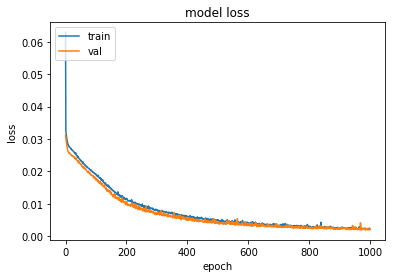

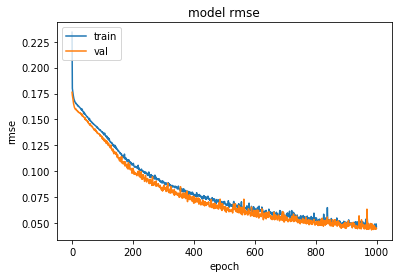

In [28]:
#3 hidden layers, 50,40,30 units, alpha=0.01
#LSTM call model definition
click_model14= click_stacked_stateless_LSTM5(units_1=50, units_2=40, units_3=30,lr=0.001, alpha=0.01, dropout=0.1)
click_model14.summary()

#Train LSTM
hist= stateless_fit(click_model14, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_wts_14.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [29]:
click_pred_train=click_model14.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model14.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model14.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  38.74130076159759
YRMSE train:  26.20556807895546
XRMSE val:  51.38869328986718
YRMSE val:  38.296713796927534
XRMSE test:  50.53389665333475
YRMSE test:  33.8164085779182


Various moedls were trained for different set of parameters to obtaing the best performing configuration.

In [29]:
#LSTM with m/m between batches with 2 hidden layers
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateful_LSTM(unit1, unit2, lr, batch, alpha, dropout1, dropout2):
    timesteps=18
    model = Sequential()
    model.add(LSTM(unit1, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout1))
    model.add(LSTM(unit2, return_sequences=False, stateful=True, recurrent_dropout=dropout2))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_13 (LSTM)               (133, 18, 50)             10600     
_________________________________________________________________
lstm_14 (LSTM)               (133, 50)                 20200     
_________________________________________________________________
dense_7 (Dense)              (133, 2)                  102       
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (133, 2)                  0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 14s - loss: 0.0509 - rmse: 0.2134 - val_loss: 0.0306 - val_rmse: 0.1744

Epoch 00001: val_loss improved from inf to 0.03057, saving model to click_wts_5.hdf5
Epoch N

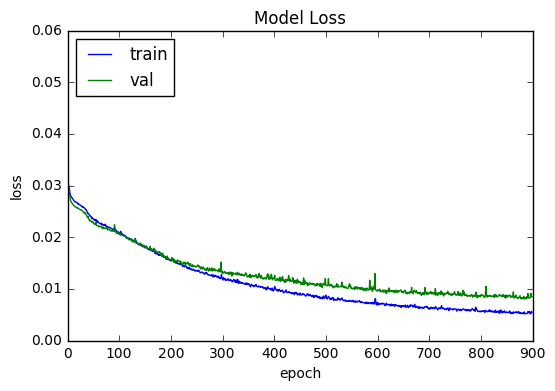

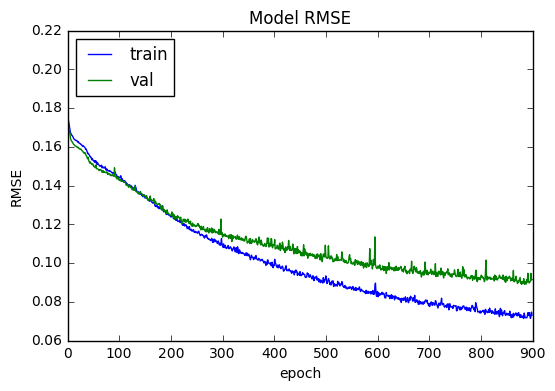

In [50]:
#LSTM call model definition
click_model5= click_stacked_stateful_LSTM(units=50,lr=0.001, batch=133, alpha=0.05, dropout=0.1)
click_model5.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model5, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_5.hdf5')
click_model5.reset_states()

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [51]:
click_model5.load_weights('click_wts_5.hdf5')

click_pred_train=click_model5.predict(X_click_train, batch_size=133)
click_model5.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model5.predict(X_click_val, batch_size=133)
click_model5.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model5.predict(X_click_test, batch_size=133)
click_model5.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  63.59063831675632
YRMSE train:  42.00092473708248
XRMSE val:  113.23180594151341
YRMSE val:  69.26449826752524
XRMSE test:  120.99959979833989
YRMSE test:  66.48859072675441


Increasig dropout for both layers does not help. Decreasing units for both layers does not help.

The results show an overfit with model performing much better on train set as compared to test and validation datasets. Let's increase the dropout.

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_20 (LSTM)               (133, 18, 50)             10600     
_________________________________________________________________
lstm_21 (LSTM)               (133, 30)                 9720      
_________________________________________________________________
dense_11 (Dense)             (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (133, 2)                  0         
Total params: 20,382
Trainable params: 20,382
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 14s - loss: 0.0608 - rmse: 0.2292 - val_loss: 0.0307 - val_rmse: 0.1749

Epoch 00001: val_loss improved from inf to 0.03073, saving model to click_wts_6.hdf5
Epoch N

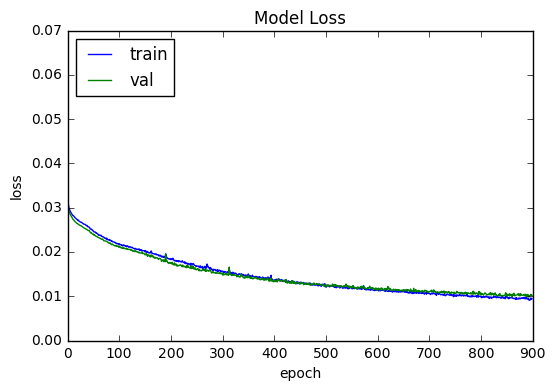

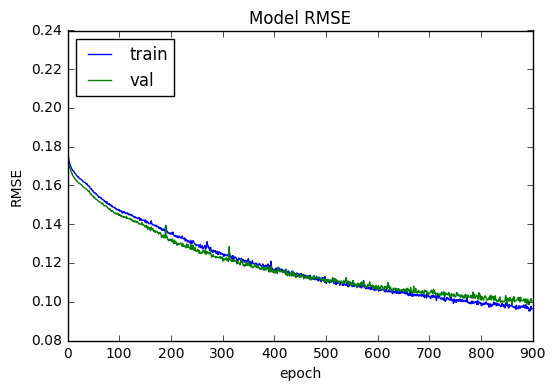

In [63]:
#LSTM call model definition
click_model6= click_stacked_stateful_LSTM(unit1=50, unit2=30, lr=0.001, batch=133, alpha=0.05, dropout1=0.3, dropout2= 0.1)
click_model6.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model6, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_6.hdf5')
click_model6.reset_states()

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [64]:
#click_model6.load_weights('click_wts_5.hdf5')

click_pred_train=click_model6.predict(X_click_train, batch_size=133)
click_model6.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model6.predict(X_click_val, batch_size=133)
click_model6.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model6.predict(X_click_test, batch_size=133)
click_model6.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  103.41922461214655
YRMSE train:  62.161788972285265
XRMSE val:  128.95389639808812
YRMSE val:  76.98644687915282
XRMSE test:  133.76346034598257
YRMSE test:  74.33424971577251


In [ ]:
#stacked stateful LSTM for 5 iterations
timesteps=18
sample_size=5
X_RMSE=[]
Y_RMSE=[]

for i in range(sample_size):
    print('Experimental Run: ', i)
    model= click_stacked_stateful_LSTM(unit1=50, unit2=30, lr=0.001, batch=133, alpha=0.05, dropout1=0.3, dropout2= 0.1)
    
    for j in range(900):
        model.fit(X_click_train, Y_click_train, validation_data=(X_click_val, Y_click_val), epochs=1, batch_size=133, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_click_pred = model.predict(X_click_test, batch_size=133)
    model.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_click_pred, Y_click_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)
    print(X_RMSE)
    print(Y_RMSE)
    
print('Iterations Completed')    
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE))+ '\n')

Experimental Run:  0
Model created and compiled
[121.71840815753211]
[76.59655849743883]
Experimental Run:  1
Model created and compiled
[121.71840815753211, 128.22913754253588]
[76.59655849743883, 74.75048799398307]
Experimental Run:  2
Model created and compiled
[121.71840815753211, 128.22913754253588, 128.1544502402653]
[76.59655849743883, 74.75048799398307, 75.96741180090629]
Experimental Run:  3
Model created and compiled
[121.71840815753211, 128.22913754253588, 128.1544502402653, 126.94630748814586]
[76.59655849743883, 74.75048799398307, 75.96741180090629, 76.28682413550078]
Experimental Run:  4
Model created and compiled
[121.71840815753211, 128.22913754253588, 128.1544502402653, 126.94630748814586, 130.03859593754694]
[76.59655849743883, 74.75048799398307, 75.96741180090629, 76.28682413550078, 78.39779176823048]
Iterations Completed
X-coord RMSE Mean: 127.01737987320521

Y-coord RMSE Mean: 76.3998148392119

In [3]:
#Results obtained after 5 iterations
print('Mean XRMSE: ', np.round(127.01737987320521, 3))
print('Mean YRMSE: ', np.round(76.3998148392119, 3))

Mean XRMSE:  127.017
Mean YRMSE:  76.4


Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (133, 18, 50)             10600     
_________________________________________________________________
lstm_6 (LSTM)                (133, 50)                 20200     
_________________________________________________________________
dense_3 (Dense)              (133, 2)                  102       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (133, 2)                  0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 25s - loss: 0.0573 - rmse: 0.2250 - val_loss: 0.0309 - val_rmse: 0.1754

Epoch 00001: val_loss improved from inf to 0.03093, saving model to click_wts_7.hdf5
Epoch N

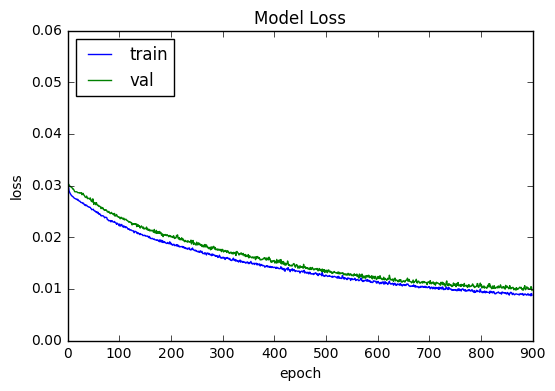

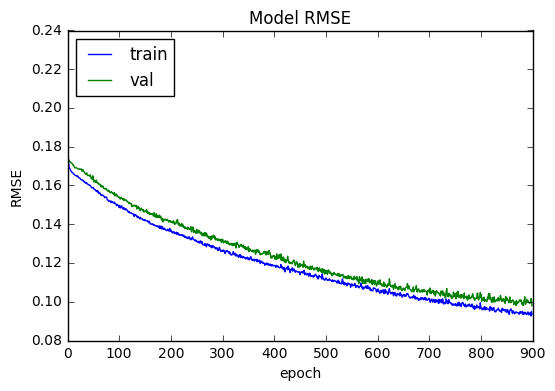

In [30]:
#LSTM call model definition
click_model7= click_stacked_stateful_LSTM(unit1=50, unit2=50, lr=0.001, batch=133, alpha=0.05, dropout1=0.3, dropout2= 0.3)
click_model7.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model7, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_7.hdf5')
click_model7.reset_states()

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [31]:
click_pred_train=click_model7.predict(X_click_train, batch_size=133)
click_model7.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model7.predict(X_click_val, batch_size=133)
click_model7.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model7.predict(X_click_test, batch_size=133)
click_model7.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  93.61548162028073
YRMSE train:  61.661952995063864
XRMSE val:  124.18201104616593
YRMSE val:  76.06636329131213
XRMSE test:  127.75119374493565
YRMSE test:  74.23314097765474


Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (133, 18, 50)             10600     
_________________________________________________________________
lstm_8 (LSTM)                (133, 30)                 9720      
_________________________________________________________________
dense_4 (Dense)              (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (133, 2)                  0         
Total params: 20,382
Trainable params: 20,382
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 8s - loss: 0.0663 - rmse: 0.2397 - val_loss: 0.0316 - val_rmse: 0.1773

Epoch 00001: val_loss improved from inf to 0.03159, saving model to click_wts_8.hdf5
Epoch Nu

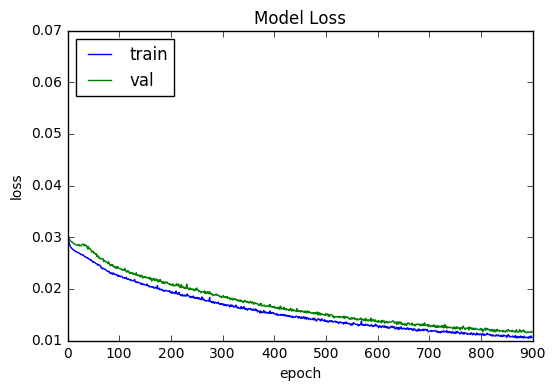

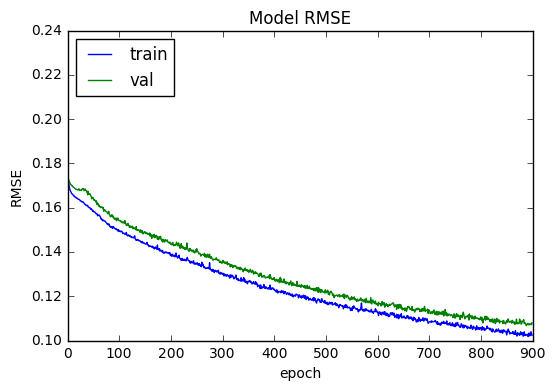

In [ ]:
#LSTM call model definition
click_model8= click_stacked_stateful_LSTM(unit1=50, unit2=30, lr=0.001, batch=133, alpha=0.05, dropout1=0.3, dropout2= 0.3)
click_model8.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model8, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_8.hdf5')
click_model8.reset_states()

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [30]:
click_model8= click_stacked_stateful_LSTM(unit1=50, unit2=30, lr=0.001, batch=133, alpha=0.05, dropout1=0.3, dropout2= 0.3)
click_model8.summary()
click_model8.load_weights('click_wts_8.hdf5')
click_pred_train=click_model8.predict(X_click_train, batch_size=133)
click_model8.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model8.predict(X_click_val, batch_size=133)
click_model8.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model8.predict(X_click_test, batch_size=133)
click_model8.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (133, 18, 50)             10600     
_________________________________________________________________
lstm_6 (LSTM)                (133, 30)                 9720      
_________________________________________________________________
dense_3 (Dense)              (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (133, 2)                  0         
Total params: 20,382
Trainable params: 20,382
Non-trainable params: 0
_________________________________________________________________
XRMSE train:  134.2481328697873
YRMSE train:  80.31890649877819
XRMSE val:  126.69132306688536
YRMSE val:  79.94491404705707
XRMSE test:  130.59271986773717
YRMSE test:  77.97470563931249


Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (133, 18, 50)             10600     
_________________________________________________________________
lstm_8 (LSTM)                (133, 30)                 9720      
_________________________________________________________________
dense_4 (Dense)              (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (133, 2)                  0         
Total params: 20,382
Trainable params: 20,382
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 10s - loss: 0.0577 - rmse: 0.2258 - val_loss: 0.0298 - val_rmse: 0.1723

Epoch 00001: val_loss improved from inf to 0.02976, saving model to click_wts_9.hdf5
Epoch N

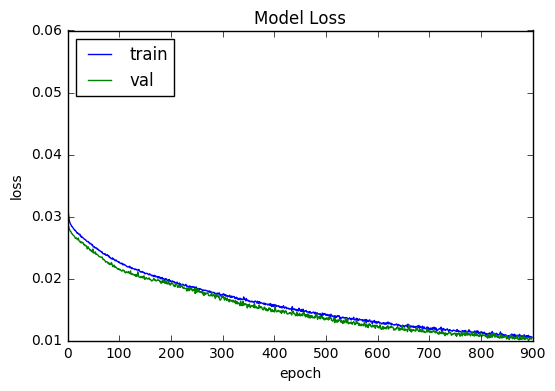

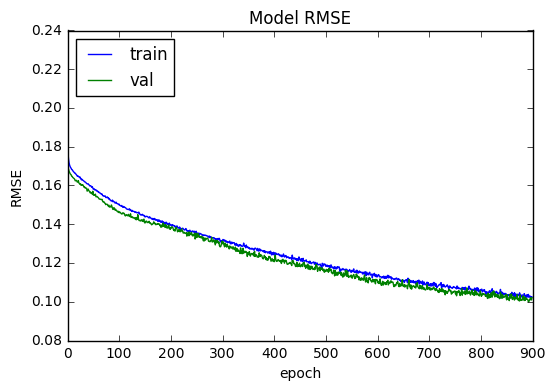

In [31]:
#LSTM call model definition
click_model9= click_stacked_stateful_LSTM(unit1=50, unit2=30, lr=0.001, batch=133, alpha=0.05, dropout1=0.3, dropout2= 0.2)
click_model9.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model9, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_9.hdf5')
click_model9.reset_states()

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [32]:
click_pred_train=click_model9.predict(X_click_train, batch_size=133)
click_model9.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model9.predict(X_click_val, batch_size=133)
click_model9.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model9.predict(X_click_test, batch_size=133)
click_model9.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  109.38050529062198
YRMSE train:  69.86378593891212
XRMSE val:  129.37299465940112
YRMSE val:  78.47164464934833
XRMSE test:  132.2113830773829
YRMSE test:  77.21985235137676


From all the models trained above, Stateless LSTM with 3 hidden layers performs the best. The stateful model is not able to outperform the stateles model.

# Simple RNN

## Hyperparameter Tuning

In [ ]:
#hyperparameter tuning for number of units, learn rate, batch size and alpha(leaky relu)
def experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, a):
    X_RMSE=[]
    Y_RMSE=[]
    # fit the model
    model = click_stateful_SRNN(n, lr, 133, a)
    for i in range(500):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=133, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_Pred = model.predict(X_test, batch_size=133)
    model.reset_states()
    
    xrmse,yrmse= calculate_RMSE(Y_Pred, Y_test)
    print('XRMSE: ', xrmse)
    print('YRMSE: ', yrmse)
    
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)
    return X_RMSE, Y_RMSE
start = time.time()
count = 1
X_coord_results = pd.DataFrame()
Y_coord_results = pd.DataFrame()
model_df= pd.DataFrame()
# hyperparameters
neurons = [30,40,50,60]
learn_rate=[0.0001,0.001]
alpha=[0.01,0.03,0.05]
for n in neurons:
    for lr in learn_rate:
        for a in alpha:
            print('Units: ',n,', Learn Rate: ',lr, ', Alpha: ', a)
            print('Model Number: ', count)
            model_df[str(count)]= [str(n)+','+str(lr)+','+str(a)]
            X_coord_results[str(count)], Y_coord_results[str(count)]  = experiment(X_click_train, Y_click_train, X_click_val, Y_click_val, X_click_test, Y_click_test, n, lr, a)
            count+=1
# summarize results
print(X_coord_results.head())
print(Y_coord_results.head())
end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))
print('Completed')

The parameters showing the best results are 40 units, 0.001 learn rate and 0.01 alpha.

In [ ]:
#function to test overfitting or underfitting of the stateful SimpleRNN model at each epoch
def evaluate(model, X_train, Y_train, X_test, Y_test, batch_size):
    Y_pred_train=model.predict(X_train, batch_size=batch_size)
    model.reset_states()
    
    Y_pred_test = model.predict(X_test, batch_size=batch_size)
    model.reset_states()
    
    #invert and calculate RMSE
    train_XRMSE, train_YRMSE= calculate_RMSE(Y_pred_train, Y_train)
    test_XRMSE, test_YRMSE= calculate_RMSE(Y_pred_test, Y_test)
    return train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE
def fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch_size):
    start = time.time()
    Xtrain_score=[]
    Ytrain_score=[]
    Xtest_score=[]
    Ytest_score=[]
    for i in range(900):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
        #evaluate model on train & test set
        train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE= evaluate(model, X_train, Y_train, X_test, Y_test, batch_size)
        Xtrain_score.append(train_XRMSE)
        Ytrain_score.append(train_YRMSE)
        Xtest_score.append(test_XRMSE)
        Ytest_score.append(test_YRMSE)
    print('Xtrain_RMSE: ', Xtrain_score)
    print('Ytrain_RMSE: ', Ytrain_score)
    print('Xtest_RMSE: ', Xtest_score)
    print('Ytest_RMSE: ', Ytest_score)
    history = pd.DataFrame()
    history['train_X'], history['train_Y'], history['test_X'], history['test_Y'] = Xtrain_score, Ytrain_score, Xtest_score, Ytest_score 
    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    return history
    
def show_plot(fig):
    fig.show()
def run(repeats, units, learn_rate, batch, alpha, X_train, Y_train, X_val, Y_val, X_test, Y_test,fig_1, fig_2):
    fig1, ax1 = plt.subplots()
    fig2, ax2 = plt.subplots()
    
    for i in range (repeats):
        print('Experimental Run: ', i+1)
        model= click_stateful_SRNN(units=units, lr=learn_rate, batch=batch, alpha=alpha)
        history= fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch)
        
        ax1.plot(history['train_X'],color='blue', label='X RMSE Train' if i == 0 else "")
        ax1.plot(history['test_X'], color='orange', label= 'X RMSE Test' if i == 0 else "")
    
        ax2.plot(history['train_Y'], color='blue', label= 'Y RMSE Train' if i == 0 else "")
        ax2.plot(history['test_Y'], color='orange', label= 'Y RMSE Test' if i == 0 else "")
    
    ax1.legend(loc='best')
    ax2.legend(loc='best')
    
    fig1.savefig(fig_1)
    fig2.savefig(fig_2)
    
    show_plot(fig1)
    show_plot(fig2)
    print('Completed')

Experimental Run:  1
Model created and compiled
Xtrain_RMSE:  [227.40254830685717, 223.85621179946253, 223.1772935670769, 220.9305301555623, 218.89048619972104, 217.25274927212442, 216.0037101383949, 215.0023567739263, 214.20466966869256, 213.66684891399558, 213.35867359583705, 213.30146506365637, 213.36530396886232, 213.43176907509016, 213.41523914521375, 213.24611796091625, 212.84059147071042, 212.08731919844936, 210.91481708395747, 209.45214461180626, 208.01453030550988, 206.76450524532734, 205.70064473093467, 204.80549457404425, 204.0968421504892, 203.56427729714622, 203.2131288778981, 202.9738867392794, 202.82855811432287, 202.80332485319383, 202.54969691667642, 202.37266955782803, 201.9238861250827, 201.72430909802065, 201.53993563985767, 201.42487577229414, 201.2454482404881, 201.0185181510359, 200.7361069082346, 200.37803317959117, 199.9601871962609, 199.47974498636867, 198.8692653472641, 198.4389353009953, 198.14601798092912, 197.7781868448922, 197.3641673062771, 197.042733775

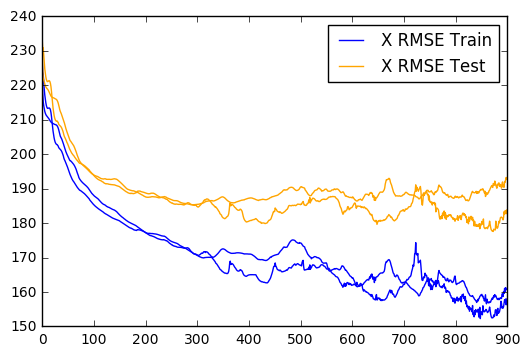

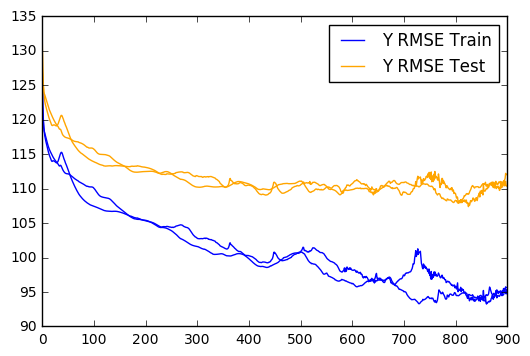

In [37]:
#calling the function to check if stateful simpleRNN is overfittig or underfitting
run(2, 40, 0.001, 133, 0.01, X_click_train, Y_click_train, X_click_val, Y_click_val, X_click_test, Y_click_test,'srnn_epochs_x.png', 'srnn_epochs_y.png')

These plots show a complete overfit. Let's tune dropout.

In [ ]:
#Dropout tuning
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def dropout_tuning(dropout, rec_dropout, X_train, Y_train, X_test, Y_test, X_val, Y_val):
    timesteps=18
    X_RMSE=[]
    Y_RMSE=[]

    model_iter = Sequential()
    model_iter.add(SimpleRNN(40, return_sequences=False, batch_input_shape=(133, timesteps, 2), stateful=True, dropout=dropout, recurrent_dropout= rec_dropout))
    model_iter.add(Dense(2))
    model_iter.add(LeakyReLU(alpha=0.01))
    model_iter.compile(Adam(lr=0.001), loss='mse', metrics=[rmse])
    for j in range(900):
        model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=133, verbose=0, shuffle=False)
        model_iter.reset_states()
    Y_pred = model_iter.predict(X_test, batch_size=133)
    model_iter.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    print('XRMSE: ', xrmse)
    print('YRMSE: ', yrmse)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)
    return X_RMSE, Y_RMSE

results_X = pd.DataFrame()
results_Y = pd.DataFrame()
dropouts=[0.0,0.1,0.2,0.3]
recurrent_dropouts=[0.0,0.1,0.2,0.3]
for dropout in dropouts:
    for rec_dropout in recurrent_dropouts:
        print('Dropout: ', dropout, ', Recurrent Dropout: ', rec_dropout)
        results_X[str(dropout) + ',' + str(rec_dropout)], results_Y[str(dropout) + ',' + str(rec_dropout)]= dropout_tuning(dropout, rec_dropout, X_click_train, Y_click_train, X_click_test, Y_click_test, X_click_val, Y_click_val)
print(results_X.head())
print(results_Y.head())

The results show that a recurrent dropout of 0.1 should be added. Now, the model is trained again to check the performance of the model at each epoch.

In [27]:
#function to test overfitting or underfitting of the stateful SImpleRNN model at each epoch after the addition of dropout
def evaluate(model, X_train, Y_train, X_test, Y_test, batch_size):
    Y_pred_train=model.predict(X_train, batch_size=batch_size)
    model.reset_states()
    
    Y_pred_test = model.predict(X_test, batch_size=batch_size)
    model.reset_states()
    
    #invert and calculate RMSE
    train_XRMSE, train_YRMSE= calculate_RMSE(Y_pred_train, Y_train)
    test_XRMSE, test_YRMSE= calculate_RMSE(Y_pred_test, Y_test)
    return train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE
def fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch_size):
    start = time.time()
    Xtrain_score=[]
    Ytrain_score=[]
    Xtest_score=[]
    Ytest_score=[]
    for i in range(1000):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
        #evaluate model on train & test set
        train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE= evaluate(model, X_train, Y_train, X_test, Y_test, batch_size)
        Xtrain_score.append(train_XRMSE)
        Ytrain_score.append(train_YRMSE)
        Xtest_score.append(test_XRMSE)
        Ytest_score.append(test_YRMSE)
    print('Xtrain_RMSE: ', Xtrain_score)
    print('Ytrain_RMSE: ', Ytrain_score)
    print('Xtest_RMSE: ', Xtest_score)
    print('Ytest_RMSE: ', Ytest_score)
    history = pd.DataFrame()
    history['train_X'], history['train_Y'], history['test_X'], history['test_Y'] = Xtrain_score, Ytrain_score, Xtest_score, Ytest_score 
    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    return history
    
def show_plot(fig):
    fig.show()
def run(repeats, units, learn_rate, batch, alpha, dropout, X_train, Y_train, X_val, Y_val, X_test, Y_test,fig_1, fig_2):
    fig1, ax1 = plt.subplots()
    fig2, ax2 = plt.subplots()
    
    for i in range (repeats):
        print('Experimental Run: ', i+1)
        model= click_stateful_SRNN(units=units, lr=learn_rate, batch=batch, alpha=alpha, dropout=dropout)
        history= fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch)
        
        ax1.plot(history['train_X'],color='blue', label='X RMSE Train' if i == 0 else "")
        ax1.plot(history['test_X'], color='orange', label= 'X RMSE Test' if i == 0 else "")
    
        ax2.plot(history['train_Y'], color='blue', label= 'Y RMSE Train' if i == 0 else "")
        ax2.plot(history['test_Y'], color='orange', label= 'Y RMSE Test' if i == 0 else "")
    
    ax1.legend(loc='best')
    ax2.legend(loc='best')
    
    fig1.savefig(fig_1)
    fig2.savefig(fig_2)
    
    show_plot(fig1)
    show_plot(fig2)
    print('Completed')

Experimental Run:  1
Model created and compiled
Xtrain_RMSE:  [220.11322539776256, 217.2601035995897, 216.50465053001767, 216.17355443951257, 216.05349196721613, 215.7876927137491, 215.62831074407308, 215.71749610661993, 215.62900180779718, 215.384724100042, 215.42626439392996, 215.29445356427112, 215.0827960460678, 215.15971691757701, 214.98891031457035, 215.18581152614058, 215.27075774208816, 215.1373142463109, 215.04979634392217, 214.87147669493447, 214.92531945670856, 214.90661062472861, 214.8169439984751, 215.16874085201323, 214.8893179043705, 214.8478272883152, 215.01849143564468, 214.80113806915526, 214.96512226463156, 214.9557135461068, 214.69288478260236, 214.74768763317755, 214.676330619412, 214.59103076805937, 214.85233870638194, 214.6593316927294, 214.7283304928027, 214.88517873498324, 214.92961523622574, 214.69970769640176, 214.638232528905, 214.47245627166615, 214.9752415336924, 214.6387389454724, 214.5600419218582, 214.76485846840922, 214.71932204568608, 215.013492534851

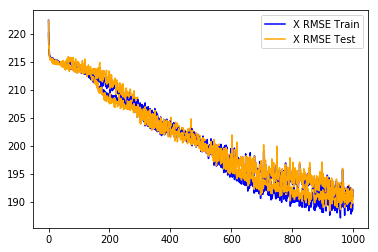

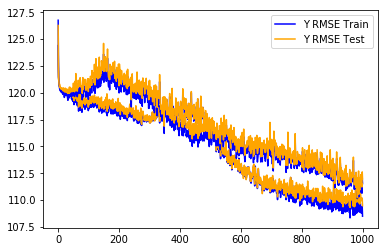

In [28]:
#calling the function to check if stateful simpleRNN is overfittig or underfitting using recurrent dropout of 0.1
run(2, 40, 0.001, 133, 0.01, 0.1, X_click_train, Y_click_train, X_click_val, Y_click_val, X_click_test, Y_click_test,'srnn_epochs_drop_x.png', 'srnn_epochs_drop_y.png')

The plots above show continuous decrease over the 1000 epochs. Let's observe the number of epochs at which the RMSE is minimum.
The results are better than before as both train and validation RMSE are continuously decreasing over 1000 epochs and are performing equally well. Lets find out the number of epochs.

In [32]:
def scores(e):
    RMSE_Scores=[]
    Xtest_RMSE_1= [219.63606754387004, 216.9741005081603, 216.1034077420852, 215.95311750507273, 215.91777430755232, 215.58590076517234, 215.38269231577937, 215.65636267549604, 215.46437036266965, 215.268799472326, 215.303328784385, 215.05483401021752, 214.88942809265325, 214.97806221727916, 214.60768495194912, 214.89394368298284, 215.0888376288835, 214.82161041699501, 214.9993069663164, 214.656859205127, 214.69928970971162, 214.60338985328406, 214.55505965109015, 215.27417119507547, 214.65795991679903, 214.58176696134106, 214.91252158041846, 214.50100250879836, 214.9297820347647, 215.08815424864738, 214.51268166857326, 214.77743077169342, 214.53746337868463, 214.65213562776768, 214.7236540775816, 214.59159168315136, 214.6113279191405, 214.97968269414113, 214.7615613952836, 214.53574325677297, 214.5107059861428, 214.3767394573365, 214.89209438232126, 214.41121212518465, 214.4108753807097, 214.6210089961435, 214.77043998652417, 215.25909791716256, 214.93437161159352, 214.79375756539093, 214.6840047231754, 214.4558931096387, 214.63035303096783, 214.92103602727863, 214.93604424589486, 214.98424613819012, 215.0127897374014, 215.1871587461862, 214.80349947099657, 214.77795673479076, 215.50883504045882, 215.39877774349867, 215.00021106946193, 214.6326273422262, 215.4564614249275, 215.93708440210153, 214.95123826648236, 215.46855553641586, 215.1701292684837, 215.03675316850521, 215.7704072090664, 215.33325693771437, 215.2790280397565, 215.08842597457385, 215.74833284569934, 215.19564906926948, 214.50472293549748, 215.73486262116458, 214.53828978920515, 214.10479401694326, 215.79213854137882, 213.57493407180073, 214.9060260647501, 214.60793550312655, 215.0084136269139, 214.96908982830644, 214.36288525494592, 215.06987793614425, 214.6703847353757, 214.9253576336168, 214.56280312429217, 214.61522891884712, 214.40339241722307, 214.5096218557379, 214.4880717269968, 214.18114854477827, 213.62883011383497, 215.10381163715996, 214.40184643493185, 213.5043779948597, 213.98098661493702, 214.77986850534273, 213.48436365235906, 213.72339672619643, 214.12890295250412, 214.47951440438365, 214.15368424078693, 214.0711895785615, 213.3323532214127, 214.4233783170679, 214.11414139695458, 215.21062159807542, 214.28863853531962, 213.6288738864676, 214.58860719683895, 214.173262460137, 214.51127997720315, 212.9876668085214, 214.02721450731275, 215.51215019249372, 213.5666093902956, 213.40428002552105, 214.09054602433505, 213.74409357889397, 214.02100528597845, 213.57241837239116, 213.53786548165718, 213.34781800019095, 213.7752569434524, 213.206394785753, 213.86079825138614, 214.45605630667896, 212.9895052311969, 212.73178422929948, 213.2614322194351, 212.88593426936148, 213.29135825265777, 214.04274498154177, 214.1641105677667, 213.2075262545535, 212.42024842717407, 213.5217815524726, 213.10730348595223, 213.10547257071286, 212.69003701601667, 213.7459703948509, 213.50194595970143, 211.94656713619827, 213.66081954061787, 212.43907255377013, 213.80535179349457, 213.15697138411386, 212.59072024415258, 211.89542186971963, 213.1510385892498, 213.7813765355856, 211.96665561033026, 213.20507870856224, 213.01994372020766, 212.98315414397078, 212.3472186108982, 212.06917760365312, 213.7911972152959, 213.94782874790425, 213.18033354888988, 212.34426589173108, 212.562810150137, 214.36662556809472, 214.88920802588692, 211.71136045569438, 213.9560087953447, 212.22612939979243, 211.61039078615764, 211.93503797064972, 213.32449098948115, 212.70987299384552, 212.54688250812816, 211.40117719348498, 213.14921971246704, 213.43836246848284, 211.8254948725907, 212.71743175631656, 213.4187210933205, 212.74797813758954, 212.9471884847372, 212.81068177735185, 212.9188265083074, 212.2320108562736, 211.88432500823816, 211.2616165945228, 213.4965306332926, 211.01204298002702, 212.1116289830875, 211.9382569550411, 211.3034371792541, 211.21291273149683, 211.97902739158917, 212.065814313907, 212.29715563761175, 213.37278076694395, 212.77034766076778, 210.22726431153004, 211.89183012824338, 210.52992050980868, 210.81946260539814, 212.66280295160644, 212.50350487215968, 212.67270682726235, 211.23970818684236, 210.40279242017775, 211.78080209070413, 210.5355325831027, 211.42159731957213, 211.30884888219146, 211.42424932198506, 211.04349546747835, 211.22101218881775, 211.0434858226927, 212.08815987009189, 211.87264036119137, 210.8748588673615, 210.77815045397867, 209.14109462135247, 211.58146537369944, 211.7687167661591, 210.81730118117068, 210.8418312191886, 211.14853262393726, 210.2848497356172, 209.84777099410664, 210.38069221071683, 209.60591623564233, 209.71204660562955, 207.78513095560413, 211.24129830480214, 209.5063996467769, 209.1657467406169, 210.48635789964993, 210.8897261100645, 208.6864713396267, 209.64468294598123, 209.49420844832505, 210.13636432826254, 209.09050505413677, 211.0789979882199, 208.64342519707333, 209.0185862723482, 209.41755188477737, 208.70642672116557, 208.83313831578957, 209.00459966541203, 209.03684622153014, 208.39158794141017, 210.2247898143733, 207.8734574200573, 210.32817922130994, 209.99424693790593, 208.7540632482675, 207.8978177537593, 208.57118603088205, 209.6672312841136, 209.2260197515866, 208.59801602546915, 208.40784265823984, 208.11915579535042, 208.53856518737686, 209.05324541922167, 208.88362327282871, 210.15199913332663, 209.89558380862834, 209.17398218491923, 208.36295844795856, 208.14855927446783, 207.8442481021084, 207.93270429628956, 207.48876082013203, 208.65320389692548, 208.91189615179402, 209.30961975093345, 207.90319826635894, 207.6245063401742, 209.82461651036567, 207.42723145971425, 207.88568259261402, 207.73831659334292, 207.6383504350477, 208.65092504147785, 207.61606534772574, 206.13745217740066, 207.36647536520206, 205.12159877776477, 207.4212904754802, 208.69510200136045, 207.17048245373383, 206.67425321966883, 206.66173051774683, 206.29853118526654, 205.6114313502905, 205.24550004690937, 205.27962538914264, 204.0477624682405, 205.94793940998218, 205.51844003650703, 203.88879199461408, 204.9600296871505, 204.6231322816909, 205.34441846712917, 204.7644499783302, 205.5452165899598, 205.26863433478658, 205.7990910438582, 207.06605912510065, 204.61947121832154, 204.5123865504254, 206.1643840983437, 205.11971642654188, 205.06307646838818, 203.7070013730775, 205.75829782274712, 204.64995809988457, 204.28568256808364, 205.98953950147904, 204.22369645123908, 205.61315434454465, 203.79228666070003, 203.823704782712, 204.51511739045202, 204.05941363376903, 203.60149426426563, 203.97654673274485, 203.5868845064795, 205.19462467392083, 203.95770768642555, 203.2897307299073, 204.76365035939367, 204.84321585784872, 203.37265090450856, 203.57455005855965, 204.1119576818403, 202.77674806518164, 204.2152720759444, 204.1160703202909, 204.2801654225913, 204.29351313528696, 203.60075449205118, 203.14555395517715, 204.72369184910485, 203.09687069037918, 203.68595364004028, 204.89406169554354, 204.41655415956546, 203.48474224119357, 204.06054403844306, 203.58543939256447, 203.15500110844073, 204.11419314137936, 203.28635630291777, 202.73438296387212, 202.63413733710988, 203.40581819717298, 203.04455750920107, 203.4029954029592, 203.22731388943447, 202.66028067219614, 202.98632268068263, 202.89910310432055, 203.9201240298246, 202.1547553317997, 202.44244749217503, 203.75746079471367, 202.83880395375368, 202.17192096160298, 202.61113760220084, 202.4860122077912, 204.11852066779574, 203.1475069916258, 202.97725423171985, 202.0985712104471, 202.3915171847073, 203.29555203994093, 201.8922739446768, 202.24191090915025, 202.3851913862091, 203.02747902008096, 202.80241317751634, 203.1977075120121, 202.67103714503352, 202.95339991813643, 203.3624692958108, 204.0857542475502, 202.59123323875284, 202.34282922306835, 203.0643735026404, 202.96747802464603, 204.32531426869036, 203.28195401071653, 202.581719400889, 203.66102397739908, 203.08185970209914, 202.29667616508144, 201.4801967993241, 202.53814416493358, 205.0662234798622, 202.86303169835023, 202.68903147344176, 202.71626587811386, 202.63622793178345, 202.3092579048325, 202.05588702485994, 203.70676065150997, 202.7178701508331, 201.7066098646579, 202.20083411953692, 202.56031584006968, 202.79679741943562, 202.21469700805216, 203.49531554420636, 204.21413779214407, 204.0622675902846, 203.18733590263778, 202.14860874075947, 203.55881082184922, 202.99270428350087, 204.05703600872425, 202.83641293791152, 202.51058624068233, 203.44656836832183, 202.97771117123125, 203.57959997085587, 202.0183437014592, 202.14667080133964, 202.79061466596997, 201.56261578499596, 201.9628758884601, 202.57449034189625, 202.32921802719673, 202.88260863764205, 202.63817086568494, 203.23920772430284, 202.33362646229122, 203.26070658798395, 203.23874491363546, 202.93323518615827, 202.00475274762738, 202.20885805716108, 202.72836456239523, 202.6913680905591, 202.7985120909058, 201.41435925813954, 202.08103106863572, 202.28168913652834, 201.72617952243002, 201.69498449452323, 201.2059135384298, 202.458235827836, 202.58594167133674, 202.24769677295103, 202.270751120675, 203.04603945772124, 202.5231769168357, 202.49104914204153, 202.43309141405496, 200.89320692745244, 202.96762418835738, 201.41037113614453, 203.22241177587696, 201.3189230901237, 201.8769061240347, 204.79774736678468, 201.4392082490139, 202.2910972388541, 200.18537744532404, 200.74182188969908, 201.86784802956953, 202.5078126697235, 202.65088777929412, 200.70900251534613, 200.4435677114428, 201.22092631414878, 202.37220489274608, 200.82969029851404, 200.14989971019884, 201.44234892650718, 202.3992671116734, 199.829006885041, 201.9298036538652, 201.91967232000437, 200.24528970553808, 201.88806604899236, 201.41290143930632, 200.7481452621676, 201.38013614244855, 201.40364431978284, 201.7757832335423, 200.31185072834734, 200.3612111147469, 201.8752272170817, 201.50890217986208, 200.74777670673222, 201.08529209776418, 199.19985309016627, 199.9808591242988, 199.6884085582889, 201.05189102043033, 199.02166184940032, 199.8299228802359, 200.26069399844823, 200.68814338913714, 200.92607008112614, 199.21043226510702, 200.45636906230786, 200.60922344236056, 199.6579218820273, 201.1841198445848, 199.7903959118324, 200.80990263837043, 200.272931874737, 199.272358580781, 199.02585157224976, 198.76566764519214, 199.97646264591782, 200.1596604384465, 199.42205495087703, 199.4234584713406, 199.60553431628415, 198.14451912046604, 200.01143325815355, 199.34354520283802, 199.5817154748939, 198.82737764021653, 199.8332264938956, 200.01148333894156, 200.33665121843694, 199.63862842407167, 199.53972855696338, 200.5307156363156, 199.8500455767276, 200.4477227351968, 198.68475331410426, 197.9708850048345, 199.02394711838662, 199.14183968968052, 198.37537554738736, 197.14704249824385, 197.39429515418237, 197.4782658327837, 197.70517233636994, 198.97896268243707, 199.52718073071543, 197.5845159008633, 197.91162028978357, 196.44180511484376, 197.10444397845814, 198.32014731650867, 197.85390030581706, 197.16331879559604, 199.42394790270484, 197.40632814092677, 198.18145278411217, 200.3167602613567, 197.83720307552144, 198.20193104886798, 197.76670007884258, 197.28318314023429, 199.08764617523804, 199.39062982978575, 196.87321918221411, 196.9052943637031, 197.27283918139705, 198.37584412690003, 197.34196190456242, 197.8322531239516, 197.10425052989086, 197.0655305454167, 197.51426308725317, 195.86551871821592, 196.19929742114988, 196.82505023587407, 196.66368397986196, 197.2608162234741, 196.39933471312912, 196.2753280880096, 195.7837864555449, 196.95501756164467, 196.33836950807066, 195.90776767905498, 196.44545834198652, 196.811368735737, 195.34686315506278, 195.9106292246587, 196.98866258580966, 195.14332380094865, 196.74724941696996, 196.69653000124424, 196.0446835507468, 194.9630978219247, 196.60161802738537, 196.05693928371733, 195.8485312423585, 196.1709999297366, 196.82613577012168, 196.50201215576786, 196.88064250164481, 195.22899156018798, 196.01601667611487, 195.09249165154637, 195.59940995947343, 195.5687519013477, 195.94581126064364, 195.40877915875487, 195.04882495036495, 194.97297021064514, 196.2556846585616, 195.4894194325095, 195.84571097513606, 196.3571794672142, 196.81387047099375, 194.5103663708964, 195.68113398561763, 194.1107832758402, 194.5685394999428, 195.61351473778697, 195.10051594203384, 195.27936845402047, 196.66941500897127, 194.47938971785513, 195.34653693533193, 195.0995683221841, 194.91413064616083, 194.33286005451058, 195.57594572171732, 195.8072232601088, 195.1995412350414, 193.8799928371015, 194.31320912616607, 196.69371026681878, 196.16632096491205, 194.63728583905913, 195.54807154860802, 195.55824384797975, 194.19987040538535, 195.08297647367584, 194.03945883733647, 196.03647676477675, 194.91752392844424, 193.7912512884136, 194.12815614835992, 195.4773156379809, 193.89175255740116, 194.81457575991732, 194.11931188796987, 194.51787852712098, 193.56331127076234, 194.38391279049793, 192.8100870054719, 193.9106007600609, 194.41090136009257, 196.8335392845523, 195.40537693698693, 193.18340823811025, 193.80416677191326, 195.64210175826216, 194.236301451557, 195.51765545007711, 194.61287807717272, 195.03930551781946, 194.46804908187787, 195.60055249529734, 194.1867909820762, 194.01423445727755, 195.38911356647523, 193.62536863919158, 193.52516355020794, 194.7827832570777, 194.03276567129467, 192.20652809441012, 193.6990559965841, 194.28786538188714, 194.04676379731166, 193.8099129079608, 192.60822949158126, 193.94632953958038, 194.36914255928812, 194.92592517845017, 192.35281260538787, 193.73149489927792, 192.81527491212663, 194.29314609212292, 194.29078843396385, 192.98148122254568, 192.1172497480798, 192.52514995185408, 194.4236864253141, 192.51580126729925, 193.30814396924455, 192.6526360558661, 191.23105594498557, 192.71968882341463, 193.03597199643406, 194.75736410571125, 191.5660456717242, 193.84936058713942, 192.46304461679907, 192.2439284348894, 195.05476930440003, 192.44279837210874, 193.01553826108113, 193.98766065610303, 193.49803692149393, 193.13453430112642, 193.85358589433253, 194.54121100988667, 195.11745440898855, 194.00520157584202, 193.5077300342294, 192.9657383017129, 193.69124351946778, 193.60405771850634, 193.06719124751334, 192.8680243977881, 192.55381461921462, 191.92292206445285, 193.74194044429967, 192.20206393766517, 192.27781547264587, 195.03999610957834, 192.0063177082051, 194.47864839755437, 193.87020738837566, 195.08713382723988, 191.49753715919167, 192.84311443059812, 192.6345058214349, 191.43080719424998, 192.50283513340398, 192.59438219029582, 193.0191531168391, 192.950068784148, 192.39953352977665, 193.8035529131752, 194.57746822782707, 192.2683407760964, 193.72408086913393, 195.48773071970564, 192.70698491357516, 191.7697400926442, 191.8751183469761, 191.90471305323248, 193.1221803473789, 192.00010205125085, 193.9598910045136, 192.1502593167882, 192.61513725172023, 191.83528838416035, 192.92829959592677, 193.17356663863737, 192.92185620549014, 193.54790683193812, 192.76685094168752, 190.99228460895742, 192.55918634745157, 194.9121399926117, 191.70001543927452, 193.02222769304942, 192.1977886412803, 191.16051204619038, 192.16467358208976, 192.30688862551844, 192.98366603503428, 194.52646781778014, 193.58214233298133, 192.6142269319239, 191.73742627880517, 192.9841799285689, 192.40733833850837, 191.8879263762732, 193.26455950470907, 191.70500779204207, 192.86384147608277, 191.3034598812409, 192.24173471062304, 191.33805119869842, 193.0877613814117, 191.9031206583809, 192.00649088445758, 192.85835779851274, 193.66932105450127, 193.35677988101617, 191.9792012266673, 192.85195289338535, 193.2577904680573, 193.31459042865825, 192.31064782109834, 190.16452342626442, 190.53555681264265, 191.31696302915046, 192.63514460261024, 191.45937572354046, 192.53700954842475, 192.37884265287005, 192.11042736970677, 191.88063687409053, 192.17130187723342, 190.79960108561957, 192.82635623820156, 192.5124017252335, 193.64941931591193, 190.36292308201615, 190.80772652823933, 191.94924009489793, 191.98373253891853, 191.1581690718161, 190.94481168384263, 191.65996148096815, 192.13398639644888, 193.01693380345745, 192.6032942148203, 191.04818157087618, 191.57892916156857, 191.7646170729613, 192.51379123400233, 191.95543257739828, 191.94318247349943, 190.38196570878446, 191.15932960386604, 191.21740348872723, 190.61626550052387, 191.49651845533086, 191.01987645991758, 191.53579151075525, 190.6848610855429, 192.38620243527296, 190.0640450237817, 191.32742955558678, 192.80640338925974, 192.16808833266447, 192.6296230346264, 191.39289602910537, 195.8776396989869, 192.29621741072418, 190.3494436516203, 190.59830608130542, 190.3728994155956, 191.3655478267756, 193.27893095975932, 189.79593863304126, 191.1777093161519, 191.40268019139612, 192.36792352519203, 190.67755256009505, 191.4117016531966, 192.3113797162808, 192.30958725144572, 191.35715443222009, 190.68676619823012, 189.44581422052764, 191.37518402050864, 191.62422672992633, 189.97749889159496, 190.26256556460578, 191.16398748169055, 190.64491117339318, 190.4476114686523, 190.61889703369613, 192.2122311663445, 192.4776773721753, 192.5990736589166, 193.08969449889037, 192.18838177538427, 192.13642225416763, 192.2115209778142, 191.16962127527188, 189.9886396846784, 189.96700132623272, 189.80483427946785, 191.83988240527768, 190.6233845405996, 190.34986021295495, 190.8818134378051, 191.2869797284691, 190.73048132923714, 193.21572960964622, 192.48017918454687, 192.92205150722498, 191.96845404571113, 192.6414094882736, 190.89338021484429, 193.9003375323937, 190.92086569212222, 190.26797614283632, 191.8300714068479, 191.33706427854491, 190.5004763899393, 191.37323730543613, 191.95044070778658, 192.33883481523267, 190.34504496752297, 193.79829930114215, 189.73826048535585, 193.09316228046538, 192.668553117609, 190.54987543447007, 188.96696993236978, 191.46642705516743, 191.6958403151966, 193.18400130854755, 190.51334876353334, 191.0647346130789, 191.79579735525226, 192.248440506076, 192.63877831637217, 189.1895988856511, 190.88938542348947, 191.2204231840745, 192.25325603894612, 193.20769488017075, 191.6628095273322, 190.68038852999268, 190.4570520444994, 191.41083789621712, 191.4168241710661, 191.81415876168916, 191.56708553473763, 188.35035766311705, 192.2260990968808, 190.50498765034556, 189.7626625395175, 193.7566477483728, 190.7143436736653, 191.71816790334364, 189.61799245165977, 190.62454009998567, 190.85014247789147, 190.26822660298154, 193.11906820237778, 191.62000287224572, 191.11013882439323, 192.78077380220665, 192.72719040257303, 191.3080188360109, 189.59647608711194, 189.27505114029512, 189.95520375175127, 191.08464024403975, 191.74554550337137, 192.29455410105916, 191.586964991083, 188.9750331656661, 190.2194297513785, 191.8893644154121, 192.53753640826275, 191.47009691872057, 189.92255742157823, 193.37099979960198, 192.78571441007654, 190.45919082530065, 190.76648257878819, 190.6269421465175, 188.6045007011062, 192.53872537038856, 193.45473501865837, 190.57662401846778, 189.7470620361728, 190.19952724334038, 190.92759411830218, 192.65946358405623, 191.7602761456027, 192.07474147966434, 191.04062220892087, 191.55839440054365, 191.28977729468133, 189.93345900443774, 189.01515990118276, 192.3686233297628, 190.97335787405981, 192.3865631734258, 190.96894140619224, 190.39476143685116, 192.55934065555365, 190.66952735121268, 191.3798790712134, 190.18025930657132, 191.55149587438711, 190.0741593955976, 192.64073953447976, 192.4755509142401, 192.9628045942816, 191.68237331898416, 192.66689740548415, 191.5060079473384, 190.28893119741443, 191.40746531928593, 190.33881318344376, 188.88201827261017, 190.94120066089405, 191.30948588346146, 189.74098765715848, 189.85886366048757, 189.77536797317484, 191.04695316058502]
    Xtest_RMSE_2= [222.3521520161423, 217.46829783599384, 217.83719196542967, 215.87214366812765, 215.77311704773658, 215.3156283326808, 215.61253451208145, 215.48316553829812, 215.65811489994257, 215.51685725692195, 215.51853604028994, 215.58404675784618, 214.95427588775476, 215.29547273060263, 215.545504021383, 215.23336122321706, 215.33959390468382, 214.83152595094654, 215.28637675054628, 214.77438901958803, 214.67673645225878, 215.12625754330801, 214.87102326472566, 214.73761650165315, 215.3699518729683, 215.00772278891375, 214.91266731585682, 215.2666443745183, 214.67565102237518, 214.92129244135043, 214.55125821219116, 214.95038865761785, 214.6440609393216, 214.98584467684566, 214.53223693737567, 214.67855419771595, 214.64221168408804, 214.52466867006643, 214.3569926484963, 214.43578653757598, 214.4190512503974, 215.09795796172745, 214.48181674554303, 214.30879625445536, 214.03968262796488, 214.25426632634847, 214.3868395538357, 214.68087365633872, 214.25952914088916, 214.4600804025281, 213.98315097713316, 214.21118530630005, 214.69542394310972, 213.6298182165781, 214.44357858859038, 215.00845220958942, 213.57338534834793, 213.75993252180112, 214.00055531465628, 214.55152363641596, 214.36277572205577, 214.18103884799532, 214.02669295817023, 213.76294533932295, 213.85583880010873, 215.44517980287358, 213.73841518119076, 214.49983209780933, 213.28307572426584, 213.45372335958595, 213.6695362504075, 214.10435547003263, 213.8838772509469, 213.84774705156536, 214.02306300491648, 213.9583684779576, 214.1477970308805, 213.67815548633138, 213.65632852698062, 213.8475118178146, 213.99501761306826, 213.6945947329409, 213.53074870031767, 213.34543678033796, 214.01192774465787, 213.19895232539665, 214.00618475091002, 214.30120912098442, 214.1796222062153, 215.52489666898595, 214.28401636833493, 213.08121781754213, 213.41283859531458, 213.5253899981972, 213.73597506047633, 212.95655661195775, 213.54468138693477, 213.7322948708095, 214.43260022439466, 213.22406864977427, 213.21890634272128, 213.65934051948759, 214.012356202931, 213.6865401317385, 213.43512218668772, 213.18870591604824, 213.29192283927327, 213.0120813765005, 213.20450903611587, 213.4947861047642, 213.1495785913698, 213.6345013522368, 212.98310299675998, 212.9931505241498, 213.19551116145146, 212.90925448268757, 212.8910226941429, 213.41610078292504, 213.2689476431101, 213.65358720469618, 213.43545900226482, 212.99564991489225, 213.1217625567581, 213.78685850500685, 214.09517463044872, 213.29747984464888, 212.37552940863822, 213.3509510432309, 214.10156695552678, 212.8501656494269, 212.7298979368551, 213.1070644813155, 213.0890540457127, 212.81228878711158, 213.63628097048988, 213.2029623534478, 213.2971309566536, 212.76037908410933, 212.94417537838655, 212.5020563279589, 212.50141566203936, 212.1176731495648, 212.2263016364631, 211.63223890704035, 211.90464390287508, 212.38889251169667, 212.2501500380576, 212.1190524284535, 212.19876441452126, 212.1536041030278, 211.40718654876991, 211.17071457278914, 211.1071066574778, 211.57468515716656, 211.1394948623451, 211.68559065450395, 210.85922926362792, 211.20470521204285, 211.5713418421589, 210.32277523842507, 210.80432658377333, 210.54628860920872, 211.342607886956, 209.96563998186727, 209.64491413913265, 210.1609244019701, 209.4009084113786, 209.56276584064258, 209.50192973415875, 210.30233874153527, 210.35110296387327, 209.68714425539306, 209.42255743240818, 209.38551391025428, 210.4471990869459, 209.16996441135186, 209.3414741277457, 209.21272484769807, 209.06662821456612, 209.4340857854503, 208.91527777297418, 209.28465806789222, 208.2996691861631, 208.92113121238907, 208.05892675282496, 209.47297704584994, 208.6262845146806, 208.55824273656913, 208.22748913930465, 208.85546043388604, 207.88552796841813, 208.84329301326497, 208.6013003558064, 208.898853962223, 208.38231203526144, 208.4150674698556, 208.2677698224131, 207.84741063777852, 208.29709006510595, 208.70678166432893, 207.48319768476821, 208.47150099766682, 209.30399504956355, 208.40150688484113, 208.41047617702893, 208.02627864317384, 207.55704724107972, 208.45813181010917, 208.09151812193358, 207.8717284359909, 208.0671014688879, 208.04968871840637, 207.66907264273925, 208.167346018194, 208.47979560173184, 207.66616798976307, 206.9670234314446, 208.55248684576026, 206.86316042464532, 208.37678225439382, 207.66801759472077, 207.76484575016153, 207.66932432254274, 207.97818997945714, 207.60746702284655, 207.76492123284268, 206.98574040677678, 206.98371193733996, 207.8582350474675, 207.19874698979265, 207.518991492345, 207.83224927607563, 209.1511257901232, 208.27194953779934, 207.80082500739334, 207.72595105841089, 206.63987839196358, 207.0149360755019, 208.4628924349471, 207.8302136497266, 206.89164814020486, 207.28692572667856, 207.94366940083307, 207.88276598485888, 207.29533103805204, 208.07985528056827, 206.43879505223566, 206.67919249125637, 206.59640525381994, 207.4675763926915, 206.6894680097412, 206.85015158700844, 206.79481743184516, 206.78797483184792, 207.158068567771, 207.22282551726693, 207.10527098005613, 206.52236825331715, 206.62206832574284, 208.01482122464554, 206.553141017104, 207.89540251077085, 206.91006424366645, 206.682281976528, 206.45889961169635, 206.9750306926565, 207.11766812519733, 207.94918163152553, 206.3488461177407, 207.13452367127664, 207.79813212760078, 208.13636387730517, 206.9021869827441, 206.91253301419994, 206.84317338934608, 206.47101874789956, 207.28702802745852, 206.46432221188442, 207.1684504038133, 205.87814597724005, 207.5524900266382, 206.05497552397787, 207.1014005721626, 206.39263827519343, 206.12894328025675, 206.24720436775803, 206.9322367962234, 206.6303546534341, 206.9869375462253, 206.86429658642368, 206.2068302387729, 205.8802416786994, 205.60791057118502, 207.39134092473185, 205.46102368077348, 205.90514869357366, 206.17931862643673, 206.19327636013864, 206.5293138627558, 206.68827256203826, 206.90942296268128, 206.84457019867227, 206.39208887020996, 205.38773697097182, 205.69588089530427, 205.95780666243905, 206.34763563383785, 206.53091134924512, 205.254882208112, 205.68026205432673, 205.64339952158545, 205.40510601745243, 204.8870408091463, 206.6438108935148, 206.5708311497405, 205.57376524264166, 205.32563269675364, 206.96854658013575, 205.5533536590314, 204.8066215728101, 206.44757202000648, 205.35204353993015, 205.56173269057538, 205.63440258499102, 205.68961616964924, 205.20219412067465, 205.78017793341016, 206.22307905122065, 205.75870367275525, 205.39373425663302, 205.69312883181817, 205.31044202514988, 204.98981352343597, 206.456068535355, 205.26265497065856, 204.21650037353848, 204.81605579122697, 205.22695101487653, 205.48228041811635, 205.25113832014856, 205.73996723337322, 205.63064776938415, 204.1207259604184, 205.08193774575102, 205.65137966392035, 204.54657934976294, 204.26691106699565, 204.59224369923368, 204.81755109410062, 206.3089235226239, 204.64760090167192, 203.78007811806904, 204.5951012126396, 205.2353727431819, 205.21024228425264, 205.13627154589742, 204.6981923329541, 205.34803980488675, 204.90809076748027, 204.47153095314724, 204.1218633764824, 204.4806321866718, 204.17972064203389, 203.52434809954372, 203.87574150330195, 204.39360364567392, 203.87048207110098, 203.89922300954487, 205.05768740497973, 204.64215976167475, 203.43611842853838, 204.0449543891726, 204.14569090099758, 203.1612420204465, 203.7810909170035, 202.83035416042404, 203.29809863789103, 202.9578330224896, 204.7534896904725, 204.04521686227858, 202.7453417884247, 203.65693535345392, 202.55629719239116, 204.42809464030518, 203.41924127887464, 204.1350515746249, 203.5211419784063, 204.00229717413262, 204.56302009563186, 203.25366873515168, 203.04655207270434, 202.7849921991683, 203.15990188956397, 201.6227427149075, 203.3897914501437, 204.30141264169853, 203.27310068663206, 204.10452151900498, 204.20210874488396, 203.80463347958542, 203.0761047021936, 202.2459783833777, 202.94367168648932, 202.4486475666776, 202.04160069804558, 202.86158444678466, 202.1203201716865, 202.57017582825594, 202.6627293206855, 203.25335461495334, 202.6681072286165, 203.82640738835804, 202.51265538643153, 203.2051571159104, 202.03140759459706, 200.84402280245874, 201.96826671255258, 202.63590767429773, 202.35566726775892, 202.04938894382232, 202.51140142952968, 202.02143281105384, 202.0152391334987, 200.68997694279557, 202.19819142974328, 202.65366061917297, 201.5794838158826, 203.06740206328703, 202.996278237026, 202.07210053976007, 202.24382855287567, 201.63415348213493, 202.22450151331364, 201.0558517818233, 201.14906259845787, 201.50184668425916, 201.75413188333977, 202.38642190347431, 201.92826172296404, 201.23468334324363, 200.50628102126916, 202.3486451577559, 200.6835318793443, 201.2673822603485, 201.13266271921216, 201.3520455178975, 201.58399821673214, 200.953119346606, 200.99841137996177, 201.67082774495796, 202.22237430219127, 201.30069448102543, 202.13581196401577, 201.6788456322693, 202.52260090266884, 201.3822263105957, 200.36994446736853, 200.7410831502998, 201.69436362599677, 201.6276162588438, 200.61782522065906, 202.15465391500996, 200.78583067173048, 201.28241868752377, 201.24578401227254, 201.1180332695382, 201.04272957710737, 200.2612526294106, 200.45168314102256, 201.53760847019635, 202.5294977974018, 202.72627504265822, 201.9015913748509, 202.16891453616248, 202.0255296435949, 200.44594840395612, 202.07000516751205, 201.22125659097617, 201.83333792071394, 201.85842662901612, 200.35018957090045, 201.69965107857644, 200.76189586011617, 200.50190643959766, 200.80678356484685, 200.88336778122417, 200.07998945597615, 200.29047659483126, 201.10381818018337, 201.860005310013, 202.049617902085, 200.2229693945466, 200.4168819229978, 201.53803591255493, 201.01836584283683, 199.5099435517873, 200.04806076499693, 199.85849573335102, 199.73349544958967, 200.62304717082523, 200.15216260337655, 199.36236090573306, 201.06106067126197, 199.00482958708344, 200.52849749862312, 199.88808499481243, 199.87382001172992, 201.4419876499199, 200.41336225063876, 199.88022355820272, 199.04278343253708, 200.45115968422195, 198.94158805872198, 199.21802700390572, 199.92374257696264, 200.4213772622739, 200.13961864838208, 199.13872722416409, 199.530160822221, 200.1592382549257, 200.08986964671965, 200.20941606895718, 198.81142628739323, 199.36525175778715, 198.24322372807012, 198.8644150051169, 198.3665715556073, 198.69549622104148, 199.5631215006173, 198.5815238042859, 200.00713262608627, 199.9610544282856, 199.28072053947673, 200.76202390854516, 198.5653452084601, 199.10835936235787, 199.2886987581868, 199.9906396955583, 198.95775777315274, 198.73580498753114, 198.95587307058915, 197.3193392484312, 198.71579640366875, 201.1080386321738, 199.73939150302445, 199.77905882987721, 200.37065922400578, 197.2817524038986, 197.81874912337457, 199.42635888342943, 198.07810367103497, 198.46807586380297, 200.14116249911334, 199.04610608261243, 197.70624335402005, 198.1075343977746, 199.78924138817547, 198.51619572540307, 198.52634396384946, 198.53768354089303, 199.5087963750027, 198.8675752378246, 198.75435439337102, 197.9565613738099, 198.15574386502027, 196.7260669995985, 199.55406283842507, 197.50489965184997, 198.92468607675366, 199.09939736093696, 197.73908714893273, 198.82395802000306, 197.8475320730345, 196.9493346118543, 199.5183617657859, 199.54023056925928, 198.4264909999389, 196.53719945479233, 196.8559112405869, 199.50887995819684, 198.1111093865021, 198.5076664576356, 198.17462171893374, 199.68457316414978, 198.1697127614699, 196.4668149778256, 199.3051600266673, 197.04830320817334, 196.60410742501853, 196.6219663110629, 198.47907292646406, 197.94866296883325, 197.67574666465367, 197.3570917977731, 195.54333134261026, 196.21421098933288, 197.17972028989473, 196.25858118324922, 198.54370602485682, 197.0234734282537, 197.08628985890155, 196.9780176491678, 201.93880029349526, 197.2641634786677, 197.81875144174, 195.65553930402893, 197.16475305475043, 197.44253948545511, 197.73106990773152, 197.60559879312325, 199.29599242868048, 198.024788427464, 196.21077316252064, 197.95741025505552, 195.88344430605946, 195.65617156912322, 196.4776658333582, 198.53938931501986, 200.65808025939208, 197.95835627677667, 197.70677086273895, 197.61089173893046, 197.23763468232752, 196.1117040161375, 197.40393413150863, 195.441185712532, 196.47284954143416, 196.2352109128238, 196.86601717681825, 197.61758561828026, 196.57182057138056, 198.10688943678653, 197.70632533949998, 196.93287871224732, 197.7005611133618, 195.2714183514501, 197.82368938299763, 196.6616096663265, 197.949957870394, 197.08601645243465, 195.6354795056437, 196.2069504443394, 195.60281407999298, 195.4458293473756, 196.48708502326164, 195.7911163826581, 195.43833367862635, 198.09763119744326, 197.3600334992206, 196.45990186265018, 198.20213609082268, 195.43513077432507, 196.57240438383747, 194.90080172814726, 195.36944968626625, 194.598614898521, 197.84459410184968, 196.78746558018125, 195.02362970442525, 196.77287635694182, 196.3055226386272, 195.9276504067131, 198.0876040321161, 196.0211947145295, 197.07687305095067, 197.06125377938363, 195.48669277007303, 196.28271560122917, 197.59436920517405, 195.51380618338413, 194.49282695296353, 195.77652171318877, 197.7992716170134, 194.9753388421989, 196.36614539621428, 195.93794820695837, 198.14032629132745, 195.6455818954584, 195.24004014199414, 196.10874373894703, 196.5607181090821, 196.20725579331352, 196.99297964770577, 195.30150940738235, 195.1078233062479, 193.54728590473343, 195.61556918338786, 195.37651147647495, 194.5501801964443, 195.3282806473684, 195.77419869664593, 194.03956530235496, 194.37297869026222, 196.63718066632504, 195.7834296149875, 196.6474416332023, 196.65801979007935, 196.1380984842518, 197.33393121084995, 194.57435499251326, 196.0745714890774, 194.7440788090465, 195.24464817941632, 194.86510311067707, 194.96387715664545, 194.24379091634913, 200.180777148828, 196.12266032999844, 199.02702957124419, 195.41694361870438, 196.96061295034144, 194.23729088484512, 197.41487410550812, 195.24530973030596, 194.70344606832853, 196.1892953844543, 195.18560546260943, 195.26776933356192, 195.2148637403256, 193.20324415727393, 194.99672360420377, 194.3058326369953, 194.1214109614235, 196.104641432054, 196.33389705286996, 195.938502704025, 195.16542609295826, 195.8710197437142, 195.39797737383208, 195.8032078720421, 194.93712867415545, 194.60324731572345, 194.58393403755178, 197.6516930162197, 195.8834352564993, 195.19383943628836, 194.1227810708452, 195.01882565724256, 195.1518011898256, 196.9691091592786, 193.2503180850426, 194.20965660466354, 193.54424381762755, 194.25255199521501, 193.80312409401307, 195.04635475118639, 194.13872210194486, 195.41338855963423, 196.79276217747477, 194.33990305010906, 199.9202101749425, 195.44277776476358, 195.11238703089808, 194.6866475397395, 193.8805907298978, 194.78584383090194, 194.71155913802215, 194.9818639242392, 196.08824666610212, 194.89337193677576, 194.744797619938, 192.92598175054954, 193.88208263857763, 194.3243951281834, 194.3970460349693, 192.26778177345687, 193.46335232953697, 195.90778537189217, 194.07427380370416, 193.80879940219, 195.15485556227952, 193.55592506151118, 193.9351779456159, 195.3944236856988, 192.8328226298256, 193.5316717272975, 196.4579535515772, 195.16898846159302, 196.7023722387398, 194.3420415003196, 191.74799359537954, 194.39750744553973, 194.478898662912, 193.86719030119949, 193.85999496154665, 196.18239310597437, 194.31129774836901, 193.79482728640136, 192.9475045438948, 194.2332556120256, 195.73727738215618, 194.06986408540703, 197.85539348385853, 194.4952357127093, 195.91905265391796, 195.08701542242505, 193.8611132133948, 194.09606965439585, 193.44236671164734, 194.73171436472458, 194.26882693990348, 193.32921607671113, 197.0503019664644, 193.22384193385733, 193.22386229617584, 194.3556977377669, 192.62383026770482, 195.71603660883255, 195.84819111960553, 196.0602137623892, 194.37269425322603, 194.6748884716642, 193.8615934358331, 193.37282435379575, 193.18357037539357, 193.94155095348984, 195.58165654579602, 194.01153963288783, 194.57294537055557, 193.2428765713074, 192.6934972754438, 194.23090742145268, 193.87954303738573, 193.5729455052703, 197.0896207480256, 193.99429730066612, 195.91210191906438, 195.73583118589048, 195.6889777219877, 194.93710510634313, 193.63822675431905, 194.43859278475514, 194.98987686905835, 193.15734403996632, 193.95585898636068, 192.74190797373447, 192.40697012455823, 194.09739166291126, 195.6580769295487, 193.90938752887362, 194.35621197246363, 194.2734009582389, 195.27025041511178, 194.215767249887, 194.081997924596, 194.29678699729305, 194.08826742205275, 192.68421041872847, 191.40609760418656, 194.6422818630467, 194.89762667003677, 193.0760345839361, 193.3938546435224, 193.39662229906654, 196.00968528189122, 193.54550107491877, 193.39244985132828, 197.01838281425532, 194.91440805328043, 194.41190205203162, 194.62720092969255, 193.9586709156023, 193.03930883716023, 194.78115978871784, 193.3871670789684, 193.82673423064065, 194.15709245814347, 192.5859911882905, 192.6511530216714, 194.37056561189067, 193.55577753369275, 193.4612158450395, 194.6619721212484, 193.42673502909662, 193.79809787584045, 191.99104059785714, 191.62558190296807, 192.4692494077908, 193.4474977292475, 193.6490293166515, 194.649618080013, 192.59627347651144, 192.08343302496453, 194.44303374409546, 192.56980746127482, 193.38493390356723, 193.42861761649348, 192.6956211371599, 191.93142436185934, 192.64454164831037, 195.32834961057813, 194.4599541511699, 195.26445345109684, 193.1738906857272, 193.78622882489614, 193.69003166013206, 194.09564154144817, 197.11254871311945, 193.85806781110762, 192.80946610893125, 195.13305646483082, 193.01710353366747, 193.44532687825432, 192.671809639485, 193.29007873203236, 193.84075924370532, 192.50967818774055, 194.31377491279608, 193.3256135195403, 191.76787362214014, 192.56503994953204, 192.6547054351831, 193.61742961924392, 194.36151832599367, 193.51295992690643, 194.52701533419858, 194.4023049033149, 190.72600335801314, 193.73807754251814, 191.9724575707832, 192.75865513200694, 193.91794629995513, 192.96468115102203, 191.63488561249625, 190.95784358679748, 191.80900058306256, 191.82646913838636, 192.50670391829442, 192.14628457257675, 194.2503588033284, 190.27148628979725, 192.16088968294457, 191.9886466862682, 191.01027312171547, 193.24576943408303, 193.65503333559198, 190.97254824219257, 191.82751129257508, 192.01550982260667, 191.25287268257628, 191.56410325011248, 192.4907631422492, 191.73258634288686, 192.11100218853468, 192.81895027118642, 194.03363916480993, 192.04826475195776, 190.75134751620075, 189.8898663585615, 191.66812719783945, 191.75647048766425, 192.21394339013676, 193.36127490669364, 191.3077804547809, 190.05063094110193, 191.1864502269188, 192.36653695001053, 191.24555827537554, 191.74549214335332, 190.18749564220178, 191.738328537138, 190.79418545563257, 192.92158032823625, 190.7452322577087, 190.46637565843739, 195.97405868727412, 191.91183082772855, 191.41193451942556, 193.41553676681963, 190.27074403903734, 192.1560569705374, 190.5978716910089, 189.7662132076024, 190.4552337579926, 191.19739998489285, 190.77051380176607, 190.4592743270632, 191.76994958254375, 191.58982150821265, 192.19294684664357, 189.50602923636794, 190.53667298548996, 190.87968314319875, 192.32530249269334, 189.77093043127812, 190.19013560431912, 190.26341985506573, 190.45534995574843, 191.53216159370234, 190.02874255938727, 191.97284162580962, 191.53671483569593, 191.97454240567538, 190.3353345284294, 192.4598714996694, 191.53709697709695, 192.1906705789637, 190.8272096189671, 191.96290988701898, 190.46375756368332]
    scores=[Xtest_RMSE_1, Xtest_RMSE_2]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[200,400,600,800,1000]
for e in epochs:
    results[str(e)]= scores(e)
results.describe()

,200,400,600,800,1000
count,2.000000,2.000000,2.000000,2.000000,2.000000
mean,211.039781,203.050655,196.597237,193.555279,190.755355
std,3.299360,1.066287,0.602790,1.663732,0.412382
min,208.706782,202.296676,196.171000,192.378843,190.463758
25%,209.873281,202.673665,196.384118,192.967061,190.609556
50%,211.039781,203.050655,196.597237,193.555279,190.755355
75%,212.206281,203.427644,196.810355,194.143496,190.901154
max,213.372781,203.804633,197.023473,194.731714,191.046953


AxesSubplot(0.125,0.125;0.775x0.755)


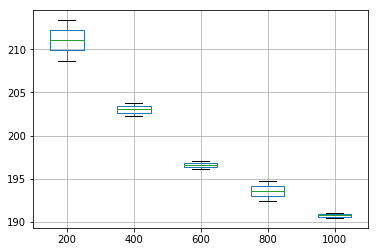

In [33]:
print(results.boxplot())

In [34]:
def scores(e):
    RMSE_Scores=[]
    Ytest_RMSE_1= [123.91562974486496, 121.4203894929394, 121.0825741486673, 120.87640348002944, 120.77752852983127, 120.79048367349667, 120.65607242470759, 120.45751155168125, 120.43392371263005, 120.35877586101358, 120.44141681569499, 120.28570150900774, 120.28772210566993, 120.33690935362434, 120.43132967178757, 120.16601297310193, 120.1794492187634, 120.14804884233986, 120.44664504317491, 120.137008522887, 119.88769757237799, 119.94708639596632, 120.27729462661753, 120.20695617661835, 120.41890654889852, 120.31096583818268, 120.11088262654069, 120.21393465038011, 120.20864865465606, 120.33590663677072, 120.12459897275525, 119.86659510309076, 119.71906761081077, 120.15524096293639, 120.22493677292329, 119.89749394013225, 120.11755830208448, 120.52697598274922, 120.1930926873861, 120.31021871405062, 120.49195058852366, 120.23995433626732, 120.32543635847111, 120.27370027947092, 119.76890699791876, 120.20500719428917, 120.14074041035742, 119.69303614384302, 119.84142588936966, 119.51763272217971, 119.60482409257332, 119.84423495727954, 119.26321229383542, 119.8189560729738, 119.61994109974302, 119.71585652094622, 119.9022101817828, 119.44354887165466, 119.49812179547565, 120.41642633663778, 119.64500420656782, 119.32795628218484, 119.71708565530834, 119.21286369835785, 119.3237650988049, 119.71412053490623, 120.05449748363581, 118.65800594801188, 119.61728747548993, 118.84291094180375, 119.99724133866678, 119.04732222519942, 118.93872746384952, 118.75309704644972, 119.20668870680072, 118.90595967642798, 120.12499242121102, 120.02996582362937, 118.56018913663165, 119.85228018400284, 118.95450095772938, 119.2264484072444, 119.11877123220775, 119.31133858567253, 119.08707209596558, 119.44280840489868, 119.00792243496899, 119.01045064256657, 118.86614220317556, 119.72421917285844, 119.85553136265646, 118.99597049271472, 119.27737540796848, 119.2813377034969, 119.33263780192028, 119.2459743151329, 119.33106288567939, 119.20569078078965, 119.14153506955208, 118.65277549657318, 119.62239602557545, 118.85789240171924, 119.05188255768807, 119.2614971939529, 119.05269062903061, 119.47168473569788, 119.29351836496873, 119.64955057580384, 118.99071265176539, 119.56065027747826, 119.53729265706505, 119.58620617767176, 119.69292342722167, 119.24308183369548, 119.13967618394626, 119.6084753230987, 119.07764723583226, 119.32236333371917, 119.04014751765766, 119.78369233280168, 119.15543979376184, 119.19605536855646, 119.33020065877935, 119.19620568686305, 119.08855361017608, 119.5994692119388, 119.23437775164558, 118.92884438588156, 119.19278205703631, 119.28708710521721, 119.20364046510319, 119.61090044968394, 119.13526293582376, 119.093853926318, 119.11323033979743, 118.50345355686656, 119.47222900607566, 119.42180910451442, 118.6879160615227, 119.11633076284294, 118.90988956841474, 119.07099251873177, 119.59202480612534, 118.55115006301821, 118.9777681983092, 118.8364777361182, 119.00695762979146, 119.09145949658829, 119.13412276529581, 119.1573436899138, 118.4655879666053, 118.87163148737734, 119.14076155649236, 119.33161629335127, 119.08006710407456, 119.05087281701506, 118.85115756941178, 119.5681832913609, 118.50180399007117, 118.53168782460578, 119.89180163880668, 118.27025048588408, 118.93304981807125, 118.51277964435494, 119.00748584291384, 118.71955718346902, 118.93316267281375, 119.36782842584041, 119.35287170594307, 118.97108354447444, 119.29033282503231, 119.27487772715497, 118.71819419783054, 118.92012121935556, 118.5536388516015, 118.78026716962937, 119.29441988692926, 118.60577991432531, 119.09746096515066, 119.41789892945455, 118.46830830787349, 119.06744430938241, 118.6248350780328, 118.55452553893143, 118.98339000889311, 118.82921320105504, 118.59466592334431, 118.6220234231401, 118.93606097674156, 119.14918448612661, 118.80552066167382, 118.96784370005017, 118.42470170248501, 118.31203961317705, 118.42721504706462, 118.36288058443658, 118.25178473292351, 119.4659438190676, 118.84968767419888, 119.02461957404554, 118.43692475367334, 118.38125203004492, 119.00289375268173, 119.0527626674845, 117.96054800488324, 118.47464763515161, 118.81977021452194, 118.86364861459303, 118.36217761076017, 118.43555122169529, 118.70250730653918, 118.29502501045114, 118.76488315610739, 118.24273609711588, 118.50178726262115, 118.07839719251555, 118.00346360591506, 118.65091001550849, 118.46125099309496, 118.54573516533422, 118.03653096639111, 118.23651038305142, 117.99717303603036, 118.20543164883155, 118.46927842772548, 118.57984265045636, 118.43810062181814, 117.69602481211288, 118.39075169991129, 118.4546973290843, 118.16463203665391, 118.07463944421508, 118.36273665768901, 118.5781642683012, 118.68560734439376, 118.93434868336693, 118.36665861128296, 118.22693359582429, 118.78021134916966, 119.18792527746452, 118.41405240048452, 117.99480624605981, 118.50805019280608, 118.3747237182453, 118.21214672681339, 118.1077017734564, 118.58869130341238, 117.89962399387379, 117.733212762764, 117.64737270009996, 118.31449980603499, 118.2719380984746, 117.96716199346835, 117.63382387653418, 118.45224664359743, 118.77977942040229, 118.45382260627196, 118.03904832498723, 117.57864863213344, 118.09664381009763, 117.47277469433755, 118.3555525857477, 117.88712799460426, 118.35516036619207, 117.3880029950309, 118.11269029799105, 118.03019265753258, 118.09660409173601, 117.52841868388691, 117.80042205581171, 117.75190008941598, 118.56285856185669, 117.24780061232002, 117.18480747243468, 117.04843040110406, 117.77806680902039, 118.04354241345428, 118.15132484485797, 118.28020857438847, 118.14207750839037, 117.93699299072051, 117.85157750992133, 117.4506780639229, 117.54550068641585, 117.41724536209819, 117.76698126818353, 117.7777353128217, 117.88530709043557, 117.5146633499371, 117.53157899626443, 117.37110644380783, 117.7594787995624, 117.9463471513957, 117.84051363242531, 117.66414223694241, 117.39061359328582, 117.61011472681386, 117.45993908425164, 117.50839104896785, 117.84140529018354, 117.18634564206023, 117.77414821990179, 117.1798357017181, 117.61825541419576, 117.38204407729913, 117.71813867722894, 117.2669971632561, 117.58356851693289, 117.97018411608303, 118.20512687156264, 117.78259134244009, 117.45868306950794, 117.58494464874161, 118.20217719624586, 117.75046027427503, 117.79390000016296, 117.60588574346886, 117.36031399789027, 118.34393816317636, 117.50338224492255, 118.21602170017967, 118.54835175799185, 117.63585199451975, 117.73248412010376, 117.76217589903149, 118.09861134992481, 117.79475687014566, 118.35159532762297, 118.25246854959367, 118.70687182792322, 118.51991022014444, 118.31884434179763, 118.36463606687431, 117.34688695856302, 118.05459436432179, 117.82291895176485, 117.78973508224662, 117.59688008636876, 118.60380067813456, 117.70065902563533, 117.67363317374635, 118.33077186848386, 118.35146975985127, 118.26538949543101, 118.29395658429655, 118.59292506859558, 118.26896833492029, 117.94539026983162, 118.10444475429343, 118.0652964418627, 118.91712533779629, 118.20460071747979, 118.31971160667702, 118.45984869977084, 118.24483107355735, 118.07075152565002, 119.41212917797716, 119.00754046165213, 117.96701548548747, 117.84603013241612, 118.40200045461549, 118.6340163171327, 118.35844178203739, 117.98340170166404, 118.39595436033247, 118.06628430679832, 119.92093356420034, 117.2873070634114, 118.0450449112856, 119.31039273914543, 118.39802131783537, 118.07026174542622, 118.45439807495652, 118.31722674706833, 120.39922471900319, 118.16213430393834, 118.5144454705999, 118.1349073531467, 118.27029529832701, 118.51679678089043, 118.33052497058891, 118.3669016315085, 118.2353025416416, 118.27241551538296, 117.89181790670563, 118.19582758782883, 118.87549696682163, 118.37208907944563, 118.65956527211169, 118.99378848980574, 118.80654871885665, 118.49217297143039, 117.95000122207219, 118.24417704508394, 119.13998443659294, 118.22118208009171, 118.56023278188484, 118.70291943718414, 118.36698108066949, 118.39495385404994, 117.63281376324059, 118.28572926923854, 119.20171222297569, 118.22359463127633, 118.65767488821905, 118.06809321756693, 118.54726466807261, 118.21692834986517, 117.72513572612961, 120.36099984009624, 118.97010103888834, 118.97662167890479, 118.58627169024784, 119.52568635952252, 118.76928234097305, 118.45840105447716, 118.83214625894763, 119.0848490389804, 118.77812127537443, 119.44612511553325, 117.80599384030403, 118.99826814326258, 118.17966099382026, 118.44829800704152, 118.70644261719288, 117.62336636864643, 118.16734528046634, 118.21551004036486, 118.99563648106745, 118.90024536234641, 119.00412717643285, 117.77718765338479, 118.76580929961924, 118.21209759467773, 117.71944760962103, 118.99270999976605, 117.54646581908622, 120.10433380118421, 118.69020213852204, 117.99687069940703, 118.11358300358853, 118.17653677192571, 118.77881162944546, 118.11892365411742, 118.2945426631194, 117.5383792217321, 118.9155044013534, 117.79592503466581, 118.39098175552184, 118.41844947927338, 118.3156227441923, 118.10905754733814, 117.26312824951573, 117.67909270402886, 119.09109095946313, 117.15578398591569, 118.27058252127095, 117.58016245635821, 119.43749298098032, 118.40970457593306, 117.77760543004972, 118.13813867777152, 117.46728883989195, 117.01001824931924, 118.54065596701024, 117.47207953492868, 116.51844569173447, 117.7825875004971, 119.68072478373129, 117.84749428157646, 117.88705381004378, 117.70550701524847, 117.71939711273998, 118.09836243626563, 118.62999290667273, 118.63612270985537, 117.77494429123347, 118.42210106966267, 116.91850148528944, 117.50366291574602, 117.60482524011942, 116.5825872970417, 117.27923425611328, 117.03426046783744, 117.14353559637085, 116.76839803682999, 117.58285437243569, 116.88232734220321, 118.06761060355986, 116.72394794708609, 115.79239472001443, 116.92833568415794, 117.45977629064707, 116.82602734427999, 116.759388831081, 116.7404150804737, 117.68777472125086, 116.87599711089756, 116.57944480260107, 116.97844443634267, 115.74697266442189, 115.74050615744638, 117.52856783769782, 115.57698471317228, 116.06629675571368, 117.35495171996288, 117.65944994199064, 116.87685020300792, 117.3899345853771, 116.39108132352442, 116.4221955300289, 116.6689920622195, 115.86736898940602, 116.37783764594215, 115.700585704283, 116.5287895694504, 115.91846828544017, 115.54548035622565, 115.87085751953508, 114.6097010950804, 115.31848687258564, 115.10230475766002, 115.49571402889464, 114.88691990336098, 115.747516907657, 115.71848701123344, 115.87252829221073, 114.75418549727443, 114.70098412940528, 115.3004178103508, 115.427464829349, 115.3708653274323, 115.39814254301177, 114.10989640119016, 115.38408728831233, 115.29175373096595, 115.91121954190335, 114.69658995753554, 115.40739207153582, 114.88058702726661, 114.51220848734852, 114.29163650363867, 114.82886219207897, 114.44205060038135, 114.42973752213992, 114.8550647259843, 114.2063219402244, 114.51505054524512, 114.26141953197377, 114.40892750393503, 115.50932267121554, 114.66867692776194, 114.09413285494375, 114.52528161887024, 114.05010556755336, 113.6185682338344, 114.24483020957295, 113.45201601704714, 114.41072751996589, 114.65395659985747, 113.72195298660532, 114.20008033490619, 113.73646275000382, 113.91706527443793, 113.31324974389406, 114.78629932668152, 114.19493728884389, 114.2552744475641, 114.19832883928186, 113.88158401868037, 112.9122120795125, 113.35664408396046, 113.95855988309373, 114.14843208170285, 113.97029011286338, 113.93271520896646, 113.57050153470237, 113.52824052838574, 113.5129333604477, 114.1796009962311, 113.50684330452188, 113.03382215098016, 113.34173713808256, 113.76425826975651, 113.4600561186211, 113.05717453668058, 113.72084716357088, 113.44872375765763, 113.56289865574891, 113.67476261669835, 112.79506947304553, 113.46990595245464, 113.0605076218726, 113.7592800221722, 113.53125673499999, 112.6378378234222, 112.79298162315129, 112.89656872563228, 113.05670342841788, 113.12111841843229, 113.03807077452693, 113.40619255969756, 112.76297996094101, 112.4180734945371, 112.89744991914527, 113.0022577072336, 112.75330482783382, 112.54377883392343, 112.007322261644, 112.5044132234102, 112.45548504231698, 113.24820462599072, 112.32912806555676, 112.4281807924324, 112.26270682489086, 113.08063881659497, 112.87243082392187, 111.89547851464481, 112.00790213609145, 112.13932905104717, 112.73275309977525, 113.00751380092842, 112.65891285753112, 112.54273507102714, 113.04071812629981, 112.41921931806453, 112.71651770415197, 113.07746883342084, 112.414119863931, 112.1571576004565, 112.53551514638625, 111.74362162740353, 112.02622957640754, 111.74877842296235, 111.89787451685635, 112.11373616155653, 112.4902902691052, 112.13284245398118, 112.34739957343179, 112.96704758340982, 112.32923257498516, 113.2419934485537, 112.3841407024974, 113.33488659515776, 111.8732397373957, 111.47903466591723, 112.23270702193473, 113.04625461012633, 112.27146821346109, 112.43687199841925, 111.81730175350906, 112.04311233780356, 111.99531859290923, 111.70718591114739, 111.14462703111562, 112.49013101265558, 112.79660020229487, 112.9421304081629, 112.18515698338209, 112.0474902832963, 111.53826013347917, 111.65632785010028, 112.14849310026996, 111.51252810891992, 112.08182116222386, 111.91896751600402, 111.77778743566351, 111.44413763179482, 111.7614507962705, 111.56991902261946, 110.59214057089658, 110.85742346528201, 111.12339367725798, 111.71402310413988, 111.31070706035192, 112.23244831645117, 110.99823827663029, 111.1357058088697, 111.89764525706978, 112.1377354919394, 111.52154409587251, 112.224983761672, 111.56723447550567, 111.15803881063843, 111.47140526698686, 112.32814964187476, 111.56716966404781, 111.1085191513278, 111.38613363808663, 111.68612064260569, 111.47136195482535, 111.76435612241252, 111.95192807539466, 111.07748980596203, 112.03857397150513, 110.76909046890525, 111.04691367001456, 110.92510200411591, 111.28282272248384, 112.0941556725866, 111.1810325483747, 111.0635903518503, 111.19029647965145, 111.57198337712039, 112.28481244272196, 111.11341437405268, 111.03798864989977, 111.67933289945155, 111.39974145446945, 111.55105612683522, 111.06965279200965, 111.23190433515983, 111.67905871399385, 111.85940991889638, 111.28725566347538, 111.01519704123584, 111.37763994413181, 110.80493782438259, 111.1688432628535, 111.10464489379078, 110.29659534770897, 111.33261169779762, 111.38893824177916, 111.62332001150574, 110.9645326516802, 111.75556632765372, 111.97452701600045, 111.8036309594355, 111.41611160874618, 111.57670037570948, 110.90759290553464, 111.20417250860118, 111.75232769660529, 111.37321065872503, 111.26012195643456, 111.3656809332331, 111.36908400487233, 111.0977543279153, 111.39120685160763, 111.51634788683539, 110.80267604352997, 110.57167967832785, 111.90939045588982, 111.12462043651689, 111.57643954843734, 111.13961954743455, 111.01262346153692, 111.43625452597395, 110.26295024383496, 110.88371005134057, 111.31481828025987, 110.81273418616057, 111.5952422458841, 111.35983216055341, 110.717207808047, 111.17794291472798, 111.04123934425562, 110.53900078067865, 110.61707961224971, 111.20681032798912, 111.84592268306747, 111.59079067936872, 110.92500001308832, 112.11880398428379, 111.28025666908874, 110.61646581900567, 110.97307164401968, 111.24118526801269, 111.29325960816729, 111.79266934295617, 111.23080873691694, 110.43381688995748, 110.39046864490054, 111.17192501260956, 110.3939785032918, 110.57048808279444, 111.15339987771546, 111.3173029045545, 110.18090743245443, 110.70786287538363, 110.78237277840311, 110.20461817304025, 111.62987306770766, 110.9635867090688, 110.87683625319613, 111.38807673968294, 110.73118827698606, 110.67406549661744, 110.75538385522906, 111.05467219967157, 111.26654215427622, 110.94817997803666, 111.48533511910337, 109.92371263751419, 110.26012545352361, 111.11555988359224, 111.38020930054203, 110.59067243688627, 110.97130989567287, 110.17116705259096, 110.76285506341488, 110.58261942049273, 111.47978561512039, 110.58569604474002, 110.49291626533845, 111.22303218804768, 110.58908608291387, 111.08506045522907, 111.0987618910421, 110.78100091886577, 110.8026647437226, 110.24263272863175, 110.53405429407972, 110.8091347782447, 110.73803349279082, 111.2139388534431, 111.12007552496843, 110.48131482289484, 110.65251900434605, 111.77184688106206, 110.9256830322652, 110.61725801501433, 110.59871783429466, 110.94606090551001, 110.3147926110829, 110.30227304681284, 110.65971349095933, 110.32667729514793, 110.83412409438746, 110.34714356443587, 110.69196756245253, 110.8997767924333, 110.45023128713022, 110.45872259986923, 110.77327205858099, 109.83823723859877, 110.96862434505945, 110.07339359419694, 111.10472396586088, 110.69477682737258, 110.16284741220065, 110.59045980274962, 110.36086806144198, 110.7044215151304, 110.75615122709621, 110.35952922468398, 111.08864950346066, 110.31316437894465, 110.33885852127968, 110.7252009932761, 110.40960821265853, 110.39507971448583, 111.07923287827057, 110.04833868720061, 109.89708913913066, 110.28077207328468, 110.37383172626699, 110.11489480830525, 109.98548408986251, 109.75571435920217, 110.70989907463935, 110.30027122845758, 110.12700774647443, 109.91672504014728, 110.53656165063738, 109.86535249387174, 110.43033300885752, 110.48703869908162, 111.28730922584654, 110.1980044717774, 110.28487900527155, 110.90142458739248, 109.89794594929262, 110.11004791275094, 111.13739186631956, 111.04319542302234, 110.69186561289085, 110.5713837899753, 109.8192965910907, 110.28703065075123, 110.18037616061535, 110.13129930498516, 110.59234309591258, 110.6918171190504, 109.83609709659638, 109.59896868273422, 109.58877645366434, 111.13203456099315, 110.41638420379587, 110.25871563500945, 110.25849602791804, 110.99575537124146, 110.47136270963726, 110.13187628105634, 110.21404379599974, 110.38197059866638, 110.14940940641088, 110.72275571083702, 110.0764322093717, 110.17194555301805, 110.02517128857627, 110.22776125304297, 109.7406523504736, 110.30957731337776, 111.69760666507095, 111.59853773506717, 110.11699212637434, 110.16413872842723, 109.79812170512693, 110.44483056824593, 110.1926163875052, 110.00367585266979, 110.34428174593495, 111.0494288012614, 110.58241594552089, 110.36183366864624, 110.92975371337828, 109.98956014472795, 110.90135275672442, 110.5063034506275, 110.23542505020983, 110.63907693826968, 109.87209470425522, 110.13215224202871, 110.91499121065272, 110.36145895500535, 109.82432112723514, 110.92940971913906, 110.38889247827879, 110.08274365052552, 110.46098051369603, 109.68590788430926, 110.63761410550522, 110.06039406436255, 110.73590916361205, 109.36608429195887, 109.74284845276976, 110.17109054914815, 110.15287230130116, 110.31413085389748, 109.89081138789471, 110.18639299300978, 109.85123138299302, 109.63534978913427, 110.39768104032335, 109.69890601093813, 109.88741864338044, 109.72773917957592, 109.76195584224638, 110.06783075647151, 110.26923750587468, 110.26426217536549, 110.62514861724524, 109.95558908419765, 110.43208346062086, 110.29801425330284, 109.42503126787983, 110.15391643633727, 109.308062854001, 110.41609523483105, 109.93725047636369, 110.68722094549042, 110.0557095007346, 110.24648532740711, 110.92469839888595, 110.40984411274827, 110.43729515725536, 110.52341410060723, 109.43682776643237, 110.2233258531429, 110.55088748069154, 110.59651614855187, 109.37047454547239, 109.88383172695985, 109.42548863863952, 109.91703304676956, 111.0856745398534, 110.06049901230267, 109.80753181317917, 109.99525635204786, 110.58451983016464, 109.83620623765327, 110.41081824392673, 109.93807042975932, 109.89032751460414, 109.92364497775148, 110.63855825343298, 111.06400500550583, 109.70259948901484, 109.98873980948447, 109.62373175616705, 110.5880669228492, 110.90161049697431, 110.50291674925904, 110.04902478789433, 109.93491818518817, 110.1692286684683, 110.00952081277697, 110.17702483675457, 109.46883377200372]
    Ytest_RMSE_2= [126.26278763954089, 122.25496125588089, 121.19102719208381, 120.73981076258023, 120.63709219882521, 120.51508292495825, 120.51535421255383, 120.42126727274274, 120.48705447845343, 120.34768433350659, 120.3936988294105, 120.34069645753075, 120.37767045928113, 120.37268034058123, 120.29058923620592, 120.18922832287893, 120.33315504995527, 120.30379855357171, 120.32282802187984, 120.16782187326672, 120.25704219026949, 120.07725221219357, 120.0718398218315, 120.09395082751118, 120.2616337210209, 120.15988783919599, 120.06144522171182, 120.04353106811858, 120.0474585533462, 120.2734797478437, 120.23018464026582, 119.92773421495069, 120.13593670917518, 119.9867876372127, 120.06914500483857, 120.12190073556377, 120.3556823703518, 119.94242201588939, 120.22055791674794, 120.22583724044263, 120.08649610356511, 120.10158339788089, 120.33452314116579, 120.38567655546852, 120.09104811072896, 120.10832760983155, 120.40169946126548, 120.10667975650087, 120.12821187355797, 120.16898971413194, 120.88601229806783, 120.15225030909296, 120.25676674118286, 120.54804061408922, 120.08209720926997, 121.06247477349399, 120.26886166779379, 120.47250969845054, 121.77965376223294, 120.53860595919734, 120.87990849440313, 120.71651727950473, 120.13949798075028, 120.15284850369987, 120.82011879448632, 120.46178026088505, 121.16110142664355, 120.75316476351773, 120.64618629788849, 121.03384112610834, 120.75698986757892, 120.56709525429184, 121.39487017188573, 121.1266705229832, 120.92606407280482, 120.51341740394197, 120.64325393747409, 120.60966856978156, 120.64072738777749, 119.93497385622054, 120.4585559427046, 121.40578507362952, 120.29391673967439, 120.36828618222825, 121.13958050447691, 120.73516285089802, 120.89195222882802, 121.2407992601092, 121.20463435751617, 121.18857177449974, 121.22405609940138, 120.225830176518, 120.50653903510533, 120.78888267219152, 120.39297286510087, 120.42086282443654, 121.07211990983126, 121.29866050751008, 121.17453507826062, 120.10312561842017, 121.30448753412243, 120.59982089852637, 121.16467587369795, 120.97601686065889, 120.4435653182775, 120.84076217206707, 121.53170608317316, 121.29002523433515, 121.29611756848678, 121.42204971167968, 120.68355779677826, 122.06492846278181, 121.65055672863149, 121.57522957193615, 121.6472536328662, 121.85840592289932, 121.38966258632303, 121.60979119361554, 120.92662429406947, 122.64043403269135, 121.23626183599863, 120.7213482196365, 121.20435426164102, 121.30780172919987, 123.16943325570237, 121.43259948573602, 122.09300684954736, 121.43026116139305, 122.39248374687334, 122.03837378035136, 121.2740928529546, 121.74544415612306, 122.37231460757684, 122.27161137941314, 122.29703715969744, 123.31034710988428, 121.37727638617991, 122.18199604054749, 122.19949892255599, 121.56396859873503, 122.35560381169088, 121.81739824937635, 122.97803303493662, 122.76577448404103, 122.12950005587551, 122.73798631905433, 122.82613590780052, 122.80799308398772, 122.93166878332178, 124.59240581288017, 121.97903433325298, 122.02296374590401, 122.79437710981922, 122.50914898878858, 122.75355612186621, 123.34292117374352, 122.42111018746854, 123.1152015139475, 121.96812211223327, 122.89641416589753, 122.89842467601966, 122.70654736704005, 124.06836731387459, 122.06503929461311, 121.95597442626887, 121.4668249698446, 121.42050391337705, 121.93107505645061, 121.74549924941746, 121.20926513190155, 122.6452283690802, 122.59413809488035, 122.46192465033562, 122.1033661747817, 122.40405847338343, 121.66023453620839, 122.12279878221959, 122.01794872074709, 122.4691556137032, 122.51693106814639, 122.79102354255221, 121.99378320637796, 122.31369381468068, 122.05210899439811, 121.78406729505743, 122.9262452747826, 121.33135814065744, 121.42047571885081, 121.7141800590253, 121.85132476198557, 121.42361849774962, 121.06003536440427, 122.35556593830087, 122.06644599664196, 122.31318363751149, 121.38449595687824, 122.18054547472985, 121.72918443635709, 122.66399807955936, 121.65884644110449, 120.64623210043447, 122.66632660106158, 122.31037303529278, 121.94693636339525, 122.13452283983067, 121.11952619718603, 121.36375923651238, 120.79191867846419, 122.06368313001056, 121.21595528023525, 121.38230895314234, 121.44034064554444, 121.48349643577193, 121.4859844855126, 121.46254354924503, 121.67425384164987, 120.72839960148362, 121.80225685314295, 120.84544526454287, 121.20089230098617, 121.653656306215, 121.17758181911135, 121.26265694715627, 121.18372178139813, 120.50486483557866, 122.00234231891937, 120.52232569513198, 120.37701771730524, 122.17985966742438, 121.05063215957237, 120.57976654623363, 120.99391821709438, 121.1064701292952, 121.25918727722454, 120.96715037942855, 121.21147141641904, 120.6374744927772, 120.97176390511413, 121.42222913503636, 120.478354093142, 119.3408867182152, 121.13531603611847, 121.47759928231088, 121.75610661897882, 120.62072186721777, 120.78735506246022, 120.27274613534155, 120.0547671338015, 120.64532122322218, 120.75250785232174, 120.54033729779997, 120.08977316283362, 120.58655593589799, 120.8692455068906, 120.53007553536861, 120.86579735258327, 119.93125381887339, 120.61315592054991, 121.2867000110914, 121.92464772079492, 120.84847713418276, 120.57501498543301, 120.1034007150465, 120.38858156108259, 119.96395946280558, 120.7965659421075, 121.17504517532004, 120.98083960830255, 120.5261287794991, 119.81897332124683, 120.86605096438714, 120.99352438027564, 120.07595238690051, 119.76872104121527, 120.96160151855115, 121.07816966117777, 119.47448462598922, 120.75011847577608, 121.37180719975186, 120.54819611194614, 120.84078330760518, 120.6875129616083, 120.85139211877043, 120.92534834393074, 119.87365952494312, 120.74847474947866, 120.97122783563894, 120.4062574770049, 120.71125413764389, 121.33902902961282, 120.36006056959086, 120.50729929005414, 120.49825463210047, 120.61177221488082, 119.89911754059706, 120.15727057220391, 120.23045131018806, 119.3475583151809, 121.06003396604005, 119.37300583024927, 121.1544015960351, 119.8783143514087, 120.14856354592112, 120.37303357132953, 120.5236333498831, 119.61863527250534, 119.96218214901148, 120.10776195880945, 120.22849218216838, 119.73301778358707, 119.15125245602935, 119.81313309241165, 119.91263497455984, 119.65035149864994, 119.23416931087422, 120.66748560531933, 118.79970357550593, 119.9970592828891, 120.09315695148048, 120.71531701720076, 120.7115547139831, 119.53746893969513, 120.52619390210539, 120.57365995057692, 119.34124446727054, 118.63950498206525, 120.02799970726677, 119.75778265991865, 120.17370072011782, 119.6279039361523, 119.53028775406446, 119.47017404741992, 119.64140053984262, 121.68475825430897, 120.05960510674815, 118.84933292771646, 118.93604482447242, 118.45151162467583, 118.63366678271353, 118.76019607266602, 118.44676987543684, 118.00533875005497, 118.7824718505739, 119.55658526050878, 118.57661304556325, 118.27921424147077, 119.60944271812937, 118.60875401002528, 116.87974513952389, 119.22309736718373, 119.60852791839487, 118.65614172952397, 119.12585123675154, 118.41218652123293, 118.98710609206178, 118.6328770059974, 118.32440758708233, 117.94599208137555, 119.08957298507507, 118.7762761335548, 118.56416356497631, 118.4565358024205, 118.207063983442, 118.38566362323203, 117.90283316692958, 118.5122878420731, 118.25134238418929, 118.7564354746726, 117.6145841873948, 118.45671823109735, 118.25984600316961, 118.37743396824229, 118.70206308220422, 117.43644270966803, 118.35672686470406, 118.27397442571689, 118.36390779180516, 117.67733227968891, 118.195610544445, 117.8088435811701, 117.42708143463261, 117.16695078847434, 117.77179729318138, 117.7688017143013, 117.63751174278333, 117.47671068116101, 119.50908759529956, 117.99355596082631, 118.21722198451107, 117.96057349182165, 117.8677176585876, 118.49652842469422, 117.9676223102569, 117.27109700663496, 117.28964505535689, 117.5011703183006, 116.89971175909393, 116.83868697826013, 117.75370572970623, 118.17913451412288, 117.99775816900238, 117.98371119336112, 117.58134864154852, 117.59521037409571, 117.97829671156346, 117.11218695479882, 118.61918903945386, 116.81530575185303, 118.06838594000011, 116.84697380668, 117.01334987067314, 116.7901528163074, 117.20228129632888, 117.03222603857179, 117.9214159983351, 117.28085138878716, 117.85532222977903, 118.11581493715086, 117.59210456200572, 117.38540561833068, 116.76034560523267, 116.85020280894005, 116.70844503216108, 117.11695623351233, 116.73555441631576, 117.11349469769821, 117.29299290447437, 117.19371393214563, 116.6852410940166, 117.80624997929091, 116.91541597173136, 116.45834228383602, 117.1778596872351, 116.11417189329104, 116.88204603655242, 117.85201234573177, 116.63646670401813, 116.85704012000991, 116.7191114365303, 116.15331497418676, 115.69296916613146, 116.8847903948461, 116.9947310349967, 117.12780518433759, 116.69484871641002, 116.04266740438322, 116.34064169608577, 116.14870655998823, 117.1260018586831, 117.15515174456499, 116.8864083570826, 116.73050945271116, 116.67592305237221, 116.21637888131187, 117.28153701248483, 116.69727922983901, 116.55324815883745, 116.9333967361159, 116.45829574647962, 115.74344317138966, 115.91028147116307, 117.38052198819219, 115.98330643008552, 116.05419712184732, 116.61841533923256, 116.6413507870544, 116.60718918722246, 116.27460771585028, 117.65001175982619, 116.83065476907247, 117.07704988134897, 117.11793828202462, 116.36417421760409, 116.73592774363443, 116.45698400669059, 116.98511995833265, 116.81532990119442, 116.61568469536932, 117.65441950008073, 116.3830759171514, 116.84037947347669, 117.79500297389401, 117.3146571917061, 117.76221060256901, 118.33159806010728, 116.80975686967926, 116.41335311790351, 116.79546072267047, 116.97459767829136, 116.69624762289567, 117.34565169027682, 116.4097146612607, 117.38402932487003, 117.23301316808701, 116.93033061996161, 116.82140901725855, 115.74251060027981, 117.2632722441546, 116.86190945301139, 117.04092312418064, 117.31028287638131, 116.75005254024221, 116.59043354412486, 115.76151646139243, 116.91347179314455, 116.8234364626025, 116.79814433137722, 117.26508893896172, 117.2619795011817, 117.05194560935809, 116.16475063796393, 117.33547798687123, 117.08504909980148, 116.21254584102088, 116.44732184607697, 116.78045399412491, 116.6098572348386, 116.44702691984101, 116.27044637597068, 115.65223700405592, 116.39027498943555, 117.16591126049468, 115.94553679816067, 116.28444485653053, 116.44903451982856, 115.7938153394487, 115.98737758786126, 116.02799088824925, 116.20049085327244, 116.92284839441197, 116.88818995270435, 116.64836499238804, 115.2545245694609, 115.96712256215228, 116.22517422436721, 117.63434320399755, 117.28167583693073, 116.7830911757721, 116.08979755022659, 116.44182324387617, 117.18537888071172, 116.75522552245721, 115.64900986195835, 115.60197480730109, 116.35584993019957, 117.89164615061001, 116.85919761360546, 116.44724537192332, 115.91525553711966, 116.77976268944902, 116.30002760342862, 116.14202456293926, 117.48811132947877, 116.77568597673617, 116.38574943551141, 116.17206511634774, 116.3749358490907, 116.0346831360846, 116.16712222950483, 116.58028987954643, 116.44735907587224, 115.6043529679754, 115.66551915348077, 116.67716229710365, 115.86588413458446, 115.37224415935282, 114.83473188335036, 116.99193870500517, 116.46843937332844, 115.8920856548117, 115.70830076843646, 115.86221227439644, 116.38225835355084, 115.35229379497692, 116.48120485347773, 116.2489136137735, 116.27224256890456, 116.74857192578962, 115.9523708480406, 115.988743126962, 115.12348314434952, 115.4698248139587, 115.82883517962802, 115.90582299214344, 115.72779837407715, 114.50239590371541, 115.20478194701394, 114.75545012061832, 115.50423147894715, 114.80050877089018, 115.646035036166, 115.70323974533052, 115.3708594968538, 114.40604393310623, 115.64141366804057, 115.07071563784851, 115.2451346628538, 115.03568006471937, 115.31377034387685, 115.90426064710768, 115.01740980768928, 116.01769326773015, 115.99702041220911, 115.43841883427575, 116.29803342813108, 114.97639187576668, 115.24183782576583, 115.948859303922, 115.47797605948888, 116.60860302401998, 115.04083943962596, 115.01879432161086, 114.29326509184813, 114.16980297036609, 114.81642356727622, 114.86705982952562, 115.05059603071015, 115.14511421323685, 114.87645000719101, 115.35350302232914, 114.98421197770998, 115.54320129387955, 115.11485032901079, 115.35208226804362, 115.34903735452608, 115.8844112285403, 115.25759521578556, 115.13436133338269, 114.57657597718176, 114.97632275498485, 115.51692386931897, 116.00005059982603, 114.32680375072162, 114.94762526736837, 115.60011910919151, 115.47981091224273, 115.78463465633759, 114.75312769158944, 115.42376479995801, 115.13052528238696, 115.25906091261828, 114.0730656064628, 115.29895541587355, 115.4619527659731, 114.25809374093843, 115.18914005148135, 114.95441827686061, 115.83467961350263, 115.65879562730561, 115.30086818941326, 114.80811879008891, 115.19043005406118, 116.02616484647832, 114.57945999684853, 114.33700264509235, 114.41393405001064, 114.67049578740786, 115.77177790875176, 114.88217061566482, 114.9017834834326, 114.95525512535737, 115.27011101947417, 115.81852035230185, 115.13966689884087, 115.0581359699321, 114.01996827710364, 114.89313491556881, 115.08634592661916, 114.54642613335224, 115.3433075542686, 114.07880489403742, 115.02592509483273, 115.1021342346902, 114.85473244193973, 115.01812161420204, 114.88562168705988, 115.5745236624459, 115.09929212562166, 114.49378751704644, 115.21076439757285, 114.42876105022377, 114.5162397709469, 114.8499930935407, 115.15681694551722, 115.00458978698359, 114.90104064365403, 115.7735768627459, 114.74554816274326, 113.87306496752299, 115.50968680789362, 115.18804996947132, 114.75698068211042, 115.09911568986676, 114.82575084553626, 114.91832879268273, 117.2330198583249, 114.77806692206636, 114.79816881990558, 115.40273730939367, 114.70995859601621, 114.59583928644884, 115.65371348759388, 114.67090982696088, 114.17290077123594, 114.66724505239549, 114.96341950872655, 112.9876807696304, 114.81715519361971, 116.41761960948193, 115.9707277731844, 115.16885643892988, 115.20196732389547, 115.58464675767196, 114.81260147090336, 114.10510618781151, 115.29304511174641, 115.31061366452901, 114.39308866233651, 115.03050608696418, 114.63783676013917, 114.72765763442523, 114.22378157750182, 113.94505933766689, 114.85448046672839, 114.76314906771896, 114.25694768834043, 114.43165839759045, 114.3591152255971, 114.98014629049831, 113.73049039446292, 114.7535358488695, 114.19670733371207, 114.79365011377756, 114.70576348410587, 115.19722416064738, 115.17847733204725, 114.78711187524681, 113.90677421450003, 115.12750733193282, 114.24871718325873, 114.57754084339304, 114.79459285997164, 115.01125515027145, 114.1890285895785, 114.2066180807907, 114.62355070908353, 114.71002448652783, 114.30926989178151, 113.231462274345, 114.54318818013228, 114.60962624373808, 114.09043832966812, 113.93325469417888, 113.22359279334553, 116.3202053812021, 114.66638585352631, 114.40628708705451, 114.58897848450867, 113.92799743417349, 114.53302847419589, 114.86002851144383, 114.49132970584701, 114.66687778201708, 114.3100999934962, 114.065460768904, 113.40379611733688, 114.20226319456833, 114.24941488723084, 114.10999587255878, 113.84815075349543, 114.48317615701711, 114.08176342290972, 114.18961354591762, 114.58743601801653, 114.22824069802112, 113.28336950562243, 114.56183541173077, 114.78936608577021, 116.18384291441527, 113.96191881957849, 113.76341961066866, 113.32309240045188, 113.44585782295503, 113.80841767947788, 113.36363008730133, 114.52129933710951, 114.40418876443397, 114.24182145730062, 113.98030352643036, 113.98778222382246, 114.24623270826758, 113.7292080160216, 114.2054818324356, 114.21885900682459, 113.649454622057, 113.94048914390096, 113.88846005061403, 113.58967363599128, 114.06474028352137, 114.12409595982714, 113.313268649721, 113.04805775768766, 114.86498039336834, 113.94087773640037, 113.49669374532208, 112.9051473839481, 112.8090398700582, 114.24832097680148, 114.34328476575189, 114.68309158137716, 114.15460595823481, 113.83779680833072, 113.84745264279628, 113.64575117272844, 113.0515482380651, 113.17010401038674, 114.59434882346204, 114.19478070592642, 114.58807687021437, 113.71286647000672, 112.94754957800369, 114.69310519474033, 113.50261138957566, 113.3010066898676, 115.09297661586682, 113.14730105382182, 113.02783555367394, 114.29228302179573, 113.37878005731159, 113.31990488526206, 113.4099798581937, 113.86652659428162, 114.04691188777406, 113.09151082581032, 114.66990336308473, 113.0575650027639, 113.24388871490304, 114.02894632540902, 113.34533023962788, 114.3831511214948, 113.79117257556105, 113.85092785526214, 113.17269209994973, 113.66387956797723, 114.40985425556013, 113.05926846223574, 113.54474113289906, 112.98321471464318, 112.79103807876048, 113.76365326878448, 114.68961243046174, 113.96863303085642, 113.14144524899166, 112.76320629791948, 113.6203899758729, 113.07905338306658, 113.38219737269621, 112.5027844402557, 113.1462995587028, 113.41471059616215, 113.03878908622421, 114.46807724209123, 113.99259749804789, 114.0047658657503, 112.64684537682238, 114.3895586941611, 114.05385792856056, 113.60144446569156, 113.58986231877041, 113.49674644592783, 113.16382688530899, 112.31462328747163, 113.86016101358744, 112.62319660916745, 113.35070535335046, 112.97934973375777, 112.32705666159194, 113.52979737074344, 113.57071975915134, 113.04624963483532, 112.82940433614084, 112.57537221335461, 113.45270383444198, 114.11884247811432, 112.61846797885995, 113.34027878045491, 112.40197253437238, 112.90633559884829, 112.73910407955506, 112.47085785162844, 112.80038988248651, 113.2836638515305, 113.82387765792855, 114.67571058232234, 113.3237536952345, 113.37505510373155, 112.15059287501967, 112.4172462802285, 112.73784802807748, 112.97928765467331, 113.76517797472506, 111.90957570497844, 113.88278498710392, 112.80799402220403, 112.99563564085467, 112.57339340471592, 112.31167724182612, 113.36339194571629, 111.54094728708615, 111.88260540667443, 113.13500324904362, 112.95308648629793, 112.79530496253714, 113.18587152083222, 114.4814063287196, 113.46814189235053, 113.61843358468103, 112.20103536696855, 111.91696946528513, 112.46238030312705, 112.36708392473666, 111.58925523063536, 112.62187493528856, 112.31789770191146, 113.32279189882175, 113.64434021427827, 113.97796560095811, 113.00243708996791, 112.20586597352214, 113.01216539781963, 111.8888450776267, 112.25068810817521, 112.76209012443032, 111.89533337667788, 112.49806335995127, 112.3348262811704, 111.85286517690683, 111.91529565829869, 111.99720508662057, 112.71190254309025, 112.69889572376874, 111.90187029496596, 112.92683017276366, 112.82963342285926, 111.28912374635192, 113.22997735534406, 111.61563083073787, 111.98301798622093, 112.46984527534069, 111.33401227721448, 111.94634595799502, 112.040444594548, 112.00515188734664, 111.55302638060503, 111.49676324492142, 111.92836599622999, 112.49353360607756, 112.83971822260612, 112.20634723855858, 112.3573215034178, 111.97520205028252, 111.88189528556529, 111.61355771075773, 112.58587783347501, 112.17110060583406, 112.08244312730386, 112.35561263290143, 112.36288202372526, 112.71266073111624, 113.99545070554977, 112.22639176727289, 112.11502009303761, 111.41667624221641, 111.76303718808894, 112.02495577442991, 112.26524601865903, 111.92315235671458, 111.17859855234896, 112.585193107918, 112.0000504048108, 110.97387194012958, 111.35601124902568, 110.21920314103475, 112.07029116634602, 111.64256705802389, 111.71831233159226, 112.70321318372106, 110.54089759464296, 112.09242356355035, 111.03652433217576, 110.93652829267327, 111.38142973774879, 111.92215007647532, 112.35837572374231, 111.77195147644491, 111.39026607429928, 111.52497021535042, 111.21447841569469, 112.61859362642029, 111.9721539704836]
    scores=[Ytest_RMSE_1, Ytest_RMSE_2]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[200,400,600,800,1000]
for e in epochs:
    results[str(e)]= scores(e)
results.describe()

,200,400,600,800,1000
count,2.000000,2.000000,2.000000,2.000000,2.000000
mean,120.341733,118.287044,114.512690,112.147632,110.720494
std,1.862680,0.152607,1.967979,2.795143,1.770115
min,119.024620,118.179135,113.121118,110.171167,109.468834
25%,119.683176,118.233089,113.816904,111.159399,110.094664
50%,120.341733,118.287044,114.512690,112.147632,110.720494
75%,121.000290,118.340999,115.208475,113.135864,111.346324
max,121.658846,118.394954,115.904261,114.124096,111.972154


AxesSubplot(0.125,0.125;0.775x0.755)


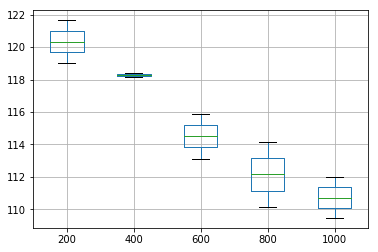

In [35]:
print(results.boxplot())

The results above show that the RMSE is decreasing over the 1000 epochs and might decrease further if trained for more epochs. But the pace at which it is decreasing is very slow and is no where near the results produced by LSTM. Also, taking the run time into consideration 1000 epochs are enough.

## Model Training and Predictions

In [22]:
#simpleRNN stateless model
import keras.backend as k
timesteps=18
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def click_stateless_SRNN(units,lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=False, input_shape=(timesteps,2)))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_9 (SimpleRNN)     (None, 40)                1720      
_________________________________________________________________
dense_9 (Dense)              (None, 2)                 82        
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 2)                 0         
Total params: 1,802
Trainable params: 1,802
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 2s - loss: 0.0472 - rmse: 0.2060 - val_loss: 0.0283 - val_rmse: 0.1678

Epoch 00001: val_loss improved from inf to 0.02834, saving model to click_SRNN_wts1.hdf5
Epoch 2/900
 - 1s - loss: 0.0271 - rmse: 0.1641 - val_loss: 0.0276 - val_rmse: 0.1657

Epoch 00002: val_loss improved from 0.02834 to 0.02763, saving mod

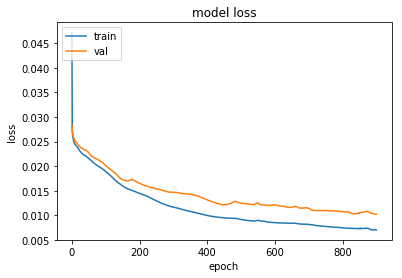

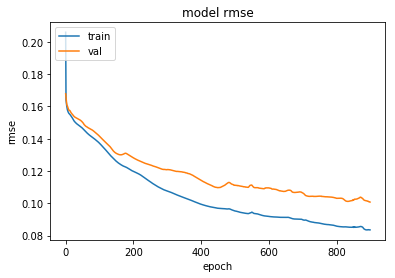

In [49]:
#call model definition
click_SRNN_model1= click_stateless_SRNN(units=40,lr=0.001, alpha=0.01)
click_SRNN_model1.summary()

#Train
hist= stateless_fit(click_SRNN_model1, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_SRNN_wts1.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [50]:
click_pred_train=click_SRNN_model1.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model1.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model1.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  108.93158875736968
YRMSE train:  64.2096313312594
XRMSE val:  127.84503639033932
YRMSE val:  78.01974642457493
XRMSE test:  130.44057239460622
YRMSE test:  77.04712635619067


Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_16 (SimpleRNN)    (None, 40)                1720      
_________________________________________________________________
dense_16 (Dense)             (None, 2)                 82        
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 2)                 0         
Total params: 1,802
Trainable params: 1,802
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/1000
 - 3s - loss: 0.1174 - rmse: 0.3231 - val_loss: 0.0334 - val_rmse: 0.1826

Epoch 00001: val_loss improved from inf to 0.03341, saving model to click_SRNN_stateless_wts2.hdf5
Epoch 2/1000
 - 1s - loss: 0.0293 - rmse: 0.1709 - val_loss: 0.0273 - val_rmse: 0.1649

Epoch 00002: val_loss improved from 0.03341 to 0.02730

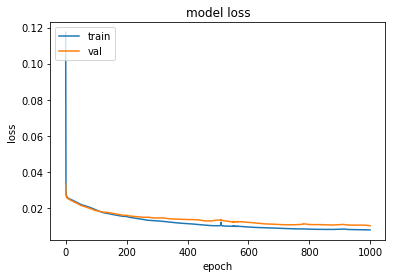

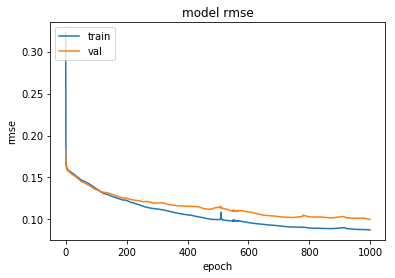

In [39]:
#increase the number of epochs
#call model definition
click_SRNN_stateless2= click_stateless_SRNN(units=40,lr=0.001, alpha=0.01)
click_SRNN_stateless2.summary()

#Train
hist= stateless_fit(click_SRNN_stateless2, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_stateless_wts2.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [40]:
click_pred_train=click_SRNN_stateless2.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_stateless2.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_stateless2.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  113.6389914052581
YRMSE train:  67.26500091543562
XRMSE val:  128.4295520690538
YRMSE val:  76.51694730383649
XRMSE test:  128.16679514052356
YRMSE test:  77.20890350982172


In [ ]:
#stateless simpleRNN for 10 iterations
timesteps=18
sample_size=10
X_RMSE=[]
Y_RMSE=[]

for i in range(sample_size):
    print('Experimental Run: ', i)
    
    model= click_stateless_SRNN(units=40,lr=0.001, alpha=0.01)
    model.fit(X_click_train, Y_click_train, validation_data=(X_click_val, Y_click_val), batch_size=133, epochs=1000, verbose=0, shuffle=False)
    
    Y_click_pred = model.predict(X_click_test)
    
    xrmse, yrmse= calculate_RMSE(Y_click_pred, Y_click_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

    print(X_RMSE)
    print(Y_RMSE)
    
print('Iterations Completed')
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)) +'\n')

#Results of above block, stateless simple RNN for 10 iterations

Experimental Run:  0
Model created and compiled
[133.8456829137296]
[82.44847553383573]
Experimental Run:  1
Model created and compiled
[133.8456829137296, 131.207263221272]
[82.44847553383573, 78.6405099241209]
Experimental Run:  2
Model created and compiled
[133.8456829137296, 131.207263221272, 139.21754217361345]
[82.44847553383573, 78.6405099241209, 78.05234067363828]
Experimental Run:  3
Model created and compiled
[133.8456829137296, 131.207263221272, 139.21754217361345, 134.98383356248584]
[82.44847553383573, 78.6405099241209, 78.05234067363828, 77.7605930480594]
Experimental Run:  4
Model created and compiled
[133.8456829137296, 131.207263221272, 139.21754217361345, 134.98383356248584, 139.3398843639437]
[82.44847553383573, 78.6405099241209, 78.05234067363828, 77.7605930480594, 79.85731574353035]
Experimental Run:  5
Model created and compiled
[133.8456829137296, 131.207263221272, 139.21754217361345, 134.98383356248584, 139.3398843639437, 130.91303008381956]
[82.44847553383573, 78.6405099241209, 78.05234067363828, 77.7605930480594, 79.85731574353035, 79.17267477409905]
Experimental Run:  6
Model created and compiled
[133.8456829137296, 131.207263221272, 139.21754217361345, 134.98383356248584, 139.3398843639437, 130.91303008381956, 133.44055704685445]
[82.44847553383573, 78.6405099241209, 78.05234067363828, 77.7605930480594, 79.85731574353035, 79.17267477409905, 74.89683832107305]
Experimental Run:  7
Model created and compiled
[133.8456829137296, 131.207263221272, 139.21754217361345, 134.98383356248584, 139.3398843639437, 130.91303008381956, 133.44055704685445, 131.2934364247397]
[82.44847553383573, 78.6405099241209, 78.05234067363828, 77.7605930480594, 79.85731574353035, 79.17267477409905, 74.89683832107305, 80.0019814462464]
Experimental Run:  8
Model created and compiled
[133.8456829137296, 131.207263221272, 139.21754217361345, 134.98383356248584, 139.3398843639437, 130.91303008381956, 133.44055704685445, 131.2934364247397, 136.70812213878273]
[82.44847553383573, 78.6405099241209, 78.05234067363828, 77.7605930480594, 79.85731574353035, 79.17267477409905, 74.89683832107305, 80.0019814462464, 79.9169724435302]
Experimental Run:  9
Model created and compiled
[133.8456829137296, 131.207263221272, 139.21754217361345, 134.98383356248584, 139.3398843639437, 130.91303008381956, 133.44055704685445, 131.2934364247397, 136.70812213878273, 127.26958816403946]
[82.44847553383573, 78.6405099241209, 78.05234067363828, 77.7605930480594, 79.85731574353035, 79.17267477409905, 74.89683832107305, 80.0019814462464, 79.9169724435302, 79.31270848411401]
Iterations Completed
X-coord RMSE Mean: 133.82189400932808

Y-coord RMSE Mean: 79.00604103922474

In [3]:
#Results after training for 10 iterations
print('Mean XRMSE: ', np.round(133.82189400932808, 3))
print('Mean YRMSE: ', np.round(79.00604103922474, 3))

Mean XRMSE:  133.822
Mean YRMSE:  79.006


In [23]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#SimpleRNN with m/m between batches
def click_stateful_SRNN(units, lr, batch, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=False, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [ ]:
#LSTM call model definition with no dropout
click_SRNN_model3= click_stateful_SRNN(units=40,lr=0.001, batch=133, alpha=0.01)
click_SRNN_model3.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model3, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts3.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

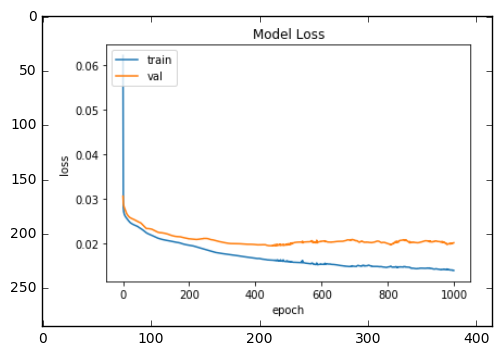

In [24]:
# Loss Curve
img=mpimg.imread('new param srnn loss.png')
img_plot= plt.imshow(img)

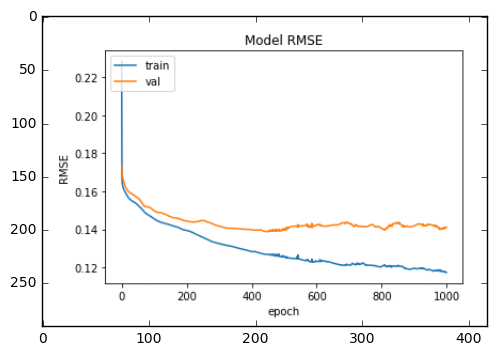

In [25]:
# RMSE Curve
img=mpimg.imread('new param srnn rmse.png')
img_plot= plt.imshow(img)

The plots above show that the model is overfitting as the validation loss starts to increase after some epochs even though the training loss is still decreasing.

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_1 (SimpleRNN)     (133, 40)                 1720      
_________________________________________________________________
dense_1 (Dense)              (133, 2)                  82        
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (133, 2)                  0         
Total params: 1,802
Trainable params: 1,802
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Instructions for updating:
Use tf.cast instead.
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0948 - rmse: 0.2967 - val_loss: 0.0296 - val_rmse: 

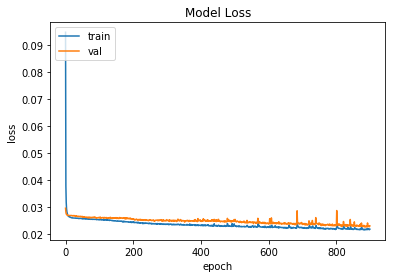

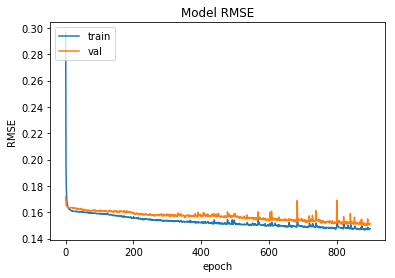

In [29]:
#LSTM call model definition with recurrent dropout 0.1
click_SRNN_model4= click_stateful_SRNN(units=40,lr=0.001, batch=133, alpha=0.01, dropout=0.1)
click_SRNN_model4.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model4, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_SRNN_wts4.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

Among the stateful models, this performs the best.

In [30]:
click_pred_train=click_SRNN_model4.predict(X_click_train, batch_size=133)
click_SRNN_model4.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model4.predict(X_click_val, batch_size=133)
click_SRNN_model4.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model4.predict(X_click_test, batch_size=133)
click_SRNN_model4.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  193.02610328695854
YRMSE train:  110.85471239838115
XRMSE val:  194.93035127130173
YRMSE val:  115.77151505668591
XRMSE test:  196.7968827045668
YRMSE test:  114.940393415498


In [ ]:
#stateful simple RNN for 10 iterations
timesteps=18
sample_size=10
X_RMSE=[]
Y_RMSE=[]

for i in range(sample_size):
    print('Experimental Run: ', i)
    model= click_stateful_SRNN(units=40,lr=0.001, batch=133, alpha=0.01, dropout=0.1)
    
    for j in range(1000):
        model.fit(X_click_train, Y_click_train, validation_data=(X_click_val, Y_click_val), epochs=1, batch_size=133, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_click_pred = model.predict(X_click_test, batch_size=133)
    model.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_click_pred, Y_click_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)
    print(X_RMSE)
    print(Y_RMSE)
    
print('Iterations Completed')    
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE))+ '\n')

#Result of above block, stateful simpleRNN for 10 iterations

Experimental Run:  0
Model created and compiled
[192.63063355355175]
[116.56690820946041]
Experimental Run:  1
Model created and compiled
[192.63063355355175, 189.5044675610048]
[116.56690820946041, 115.10716300272396]
Experimental Run:  2
Model created and compiled
[192.63063355355175, 189.5044675610048, 190.38290467559543]
[116.56690820946041, 115.10716300272396, 115.80899620800646]
Experimental Run:  3
Model created and compiled
[192.63063355355175, 189.5044675610048, 190.38290467559543, 189.7907091520977]
[116.56690820946041, 115.10716300272396, 115.80899620800646, 114.6265679168576]
Experimental Run:  4
Model created and compiled
[192.63063355355175, 189.5044675610048, 190.38290467559543, 189.7907091520977, 192.10628407323085]
[116.56690820946041, 115.10716300272396, 115.80899620800646, 114.6265679168576, 113.87064052531689]
Experimental Run:  5
Model created and compiled
[192.63063355355175, 189.5044675610048, 190.38290467559543, 189.7907091520977, 192.10628407323085, 187.96066720557732]
[116.56690820946041, 115.10716300272396, 115.80899620800646, 114.6265679168576, 113.87064052531689, 113.90959929108362]
Experimental Run:  6
Model created and compiled
[192.63063355355175, 189.5044675610048, 190.38290467559543, 189.7907091520977, 192.10628407323085, 187.96066720557732, 189.40451477951703]
[116.56690820946041, 115.10716300272396, 115.80899620800646, 114.6265679168576, 113.87064052531689, 113.90959929108362, 115.10739906015034]
Experimental Run:  7
Model created and compiled
[192.63063355355175, 189.5044675610048, 190.38290467559543, 189.7907091520977, 192.10628407323085, 187.96066720557732, 189.40451477951703, 188.53245279749316]
[116.56690820946041, 115.10716300272396, 115.80899620800646, 114.6265679168576, 113.87064052531689, 113.90959929108362, 115.10739906015034, 114.55657413988098]
Experimental Run:  8
Model created and compiled
[192.63063355355175, 189.5044675610048, 190.38290467559543, 189.7907091520977, 192.10628407323085, 187.96066720557732, 189.40451477951703, 188.53245279749316, 189.33587039443142]
[116.56690820946041, 115.10716300272396, 115.80899620800646, 114.6265679168576, 113.87064052531689, 113.90959929108362, 115.10739906015034, 114.55657413988098, 114.30600043650077]
Experimental Run:  9
Model created and compiled
[192.63063355355175, 189.5044675610048, 190.38290467559543, 189.7907091520977, 192.10628407323085, 187.96066720557732, 189.40451477951703, 188.53245279749316, 189.33587039443142, 187.7092874133507]
[116.56690820946041, 115.10716300272396, 115.80899620800646, 114.6265679168576, 113.87064052531689, 113.90959929108362, 115.10739906015034, 114.55657413988098, 114.30600043650077, 114.6094000054478]
Iterations Completed
X-coord RMSE Mean: 189.735779160585

Y-coord RMSE Mean: 114.84692487954287


In [4]:
#Final results after training for 10 iterations
print('Mean XRMSE: ', np.round(189.735779160585, 3))
print('Mean YRMSE: ', np.round(114.84692487954287, 3))

Mean XRMSE:  189.736
Mean YRMSE:  114.847


Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_4 (SimpleRNN)     (133, 40)                 1720      
_________________________________________________________________
dense_4 (Dense)              (133, 2)                  82        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (133, 2)                  0         
Total params: 1,802
Trainable params: 1,802
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0943 - rmse: 0.2990 - val_loss: 0.0334 - val_rmse: 0.1826

Epoch 00001: val_loss improved from inf to 0.03343, saving model to click_SRNN_wts6.hdf5
Epoch Number:  1
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 1s - loss: 0.0531 - rmse: 0.2300 - val_loss: 0.0320 - val_rm

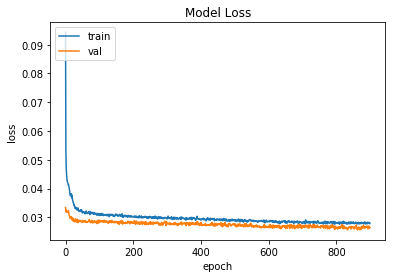

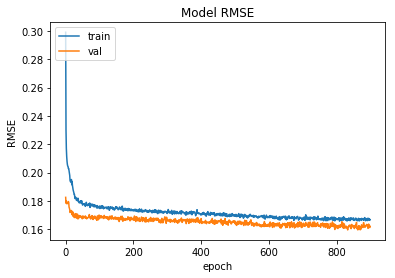

In [38]:
#call model definition with both dropout and recurrent dropout 0.1
click_SRNN_model6= click_stateful_SRNN(units=40,lr=0.001, batch=133, alpha=0.01, dropout=0.1, rec_dropout=0.1)
click_SRNN_model6.summary()

#fit model
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model6, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_SRNN_wts6.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [39]:
click_pred_train=click_SRNN_model6.predict(X_click_train, batch_size=133)
click_SRNN_model6.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model6.predict(X_click_val, batch_size=133)
click_SRNN_model6.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model6.predict(X_click_test, batch_size=133)
click_SRNN_model6.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  209.3195176862612
YRMSE train:  119.35838990027706
XRMSE val:  210.46382253889584
YRMSE val:  123.10795307212706
XRMSE test:  210.0598892326487
YRMSE test:  123.71985977944148


Using both dropout and recurrent dropout does not show any improvement as the losses are remainng constant, and are not decreasing at all.

In [39]:
#simpleRNN stacked stateless model
import keras.backend as k
timesteps=18
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def click_stacked_stateless_SRNN(units,lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=True, input_shape=(timesteps,2)))
    model.add(SimpleRNN(units, return_sequences=False))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_3 (SimpleRNN)     (None, 18, 40)            1720      
_________________________________________________________________
simple_rnn_4 (SimpleRNN)     (None, 40)                3240      
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 82        
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 2)                 0         
Total params: 5,042
Trainable params: 5,042
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/1000
 - 5s - loss: 0.0618 - rmse: 0.2291 - val_loss: 0.0276 - val_rmse: 0.1657

Epoch 00001: val_loss improved from inf to 0.02760, saving model to click_SRNN_wts7.hdf5
Epoch 2/1000
 - 2s -

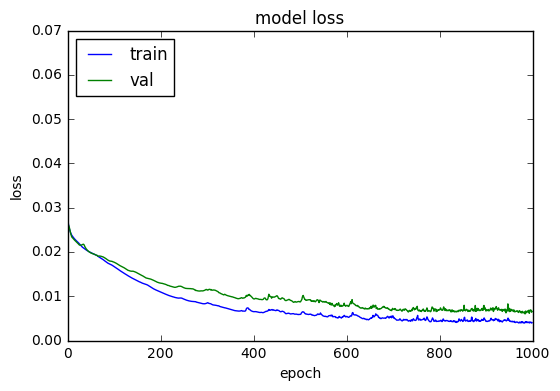

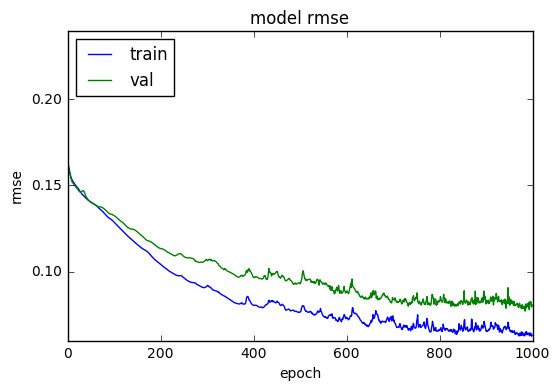

In [30]:
#2 hidden layers with 40 units each
click_SRNN_model7= click_stacked_stateless_SRNN(units=40,lr=0.001, alpha=0.01)
click_SRNN_model7.summary()

#Train LSTM stateless model with shuffle=False
hist= stateless_fit(click_SRNN_model7, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts7.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [31]:
click_pred_train=click_SRNN_model7.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model7.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model7.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  83.06571161693402
YRMSE train:  52.40637726029948
XRMSE val:  100.18309082094433
YRMSE val:  63.907681480272124
XRMSE test:  100.80024259349508
YRMSE test:  65.04323082846709


In [130]:
#simpleRNN stacked stateless model with different units 40 and 30
import keras.backend as k
timesteps=18
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def click_stacked_stateless_SRNN4(units_1, units_2, lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units_1, return_sequences=True, input_shape=(timesteps,2)))
    model.add(SimpleRNN(units_2, return_sequences=False))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [ ]:
#2 hidden layers with 40 units in one layer and 30 units in the other
click_SRNN_model13= click_stacked_stateless_SRNN4(units_1=40, units_2=30, lr=0.001, alpha=0.01)
click_SRNN_model13.summary()

#Train LSTM stateless model with shuffle=False
hist= stateless_fit(click_SRNN_model13, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts13.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_8 (SimpleRNN)     (None, 18, 40)            1720      
_________________________________________________________________
simple_rnn_9 (SimpleRNN)     (None, 30)                2130      
_________________________________________________________________
dense_9 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 2)                 0         
Total params: 3,912
Trainable params: 3,912
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/1000
 - 3s - loss: 0.0986 - rmse: 0.2868 - val_loss: 0.0292 - val_rmse: 0.1707

Epoch 00001: val_loss improved from inf to 0.02923, saving model to click_SRNN_wts13.hdf5
Epoch 2/1000
 - 2s 

 - 2s - loss: 0.0204 - rmse: 0.1424 - val_loss: 0.0213 - val_rmse: 0.1455

Epoch 00041: val_loss improved from 0.02131 to 0.02128, saving model to click_SRNN_wts13.hdf5
Epoch 42/1000
 - 2s - loss: 0.0203 - rmse: 0.1422 - val_loss: 0.0213 - val_rmse: 0.1454

Epoch 00042: val_loss improved from 0.02128 to 0.02126, saving model to click_SRNN_wts13.hdf5
Epoch 43/1000
 - 2s - loss: 0.0202 - rmse: 0.1419 - val_loss: 0.0212 - val_rmse: 0.1451

Epoch 00043: val_loss improved from 0.02126 to 0.02118, saving model to click_SRNN_wts13.hdf5
Epoch 44/1000
 - 2s - loss: 0.0202 - rmse: 0.1418 - val_loss: 0.0212 - val_rmse: 0.1451

Epoch 00044: val_loss did not improve from 0.02118
Epoch 45/1000
 - 2s - loss: 0.0201 - rmse: 0.1416 - val_loss: 0.0212 - val_rmse: 0.1451

Epoch 00045: val_loss improved from 0.02118 to 0.02117, saving model to click_SRNN_wts13.hdf5
Epoch 46/1000
 - 2s - loss: 0.0201 - rmse: 0.1414 - val_loss: 0.0211 - val_rmse: 0.1450

Epoch 00046: val_loss improved from 0.02117 to 0.0211

 - 2s - loss: 0.0177 - rmse: 0.1329 - val_loss: 0.0185 - val_rmse: 0.1356

Epoch 00087: val_loss improved from 0.01855 to 0.01848, saving model to click_SRNN_wts13.hdf5
Epoch 88/1000
 - 2s - loss: 0.0176 - rmse: 0.1326 - val_loss: 0.0184 - val_rmse: 0.1355

Epoch 00088: val_loss improved from 0.01848 to 0.01845, saving model to click_SRNN_wts13.hdf5
Epoch 89/1000
 - 2s - loss: 0.0176 - rmse: 0.1324 - val_loss: 0.0185 - val_rmse: 0.1355

Epoch 00089: val_loss did not improve from 0.01845
Epoch 90/1000
 - 2s - loss: 0.0175 - rmse: 0.1322 - val_loss: 0.0185 - val_rmse: 0.1355

Epoch 00090: val_loss did not improve from 0.01845
Epoch 91/1000
 - 2s - loss: 0.0175 - rmse: 0.1320 - val_loss: 0.0185 - val_rmse: 0.1355

Epoch 00091: val_loss did not improve from 0.01845
Epoch 92/1000
 - 2s - loss: 0.0174 - rmse: 0.1318 - val_loss: 0.0185 - val_rmse: 0.1355

Epoch 00092: val_loss did not improve from 0.01845
Epoch 93/1000
 - 2s - loss: 0.0174 - rmse: 0.1316 - val_loss: 0.0184 - val_rmse: 0.1354


 - 2s - loss: 0.0151 - rmse: 0.1226 - val_loss: 0.0162 - val_rmse: 0.1270

Epoch 00135: val_loss improved from 0.01626 to 0.01620, saving model to click_SRNN_wts13.hdf5
Epoch 136/1000
 - 2s - loss: 0.0150 - rmse: 0.1223 - val_loss: 0.0162 - val_rmse: 0.1268

Epoch 00136: val_loss improved from 0.01620 to 0.01616, saving model to click_SRNN_wts13.hdf5
Epoch 137/1000
 - 2s - loss: 0.0150 - rmse: 0.1221 - val_loss: 0.0161 - val_rmse: 0.1266

Epoch 00137: val_loss improved from 0.01616 to 0.01611, saving model to click_SRNN_wts13.hdf5
Epoch 138/1000
 - 2s - loss: 0.0149 - rmse: 0.1219 - val_loss: 0.0161 - val_rmse: 0.1265

Epoch 00138: val_loss improved from 0.01611 to 0.01608, saving model to click_SRNN_wts13.hdf5
Epoch 139/1000
 - 2s - loss: 0.0149 - rmse: 0.1217 - val_loss: 0.0161 - val_rmse: 0.1265

Epoch 00139: val_loss improved from 0.01608 to 0.01607, saving model to click_SRNN_wts13.hdf5
Epoch 140/1000
 - 2s - loss: 0.0148 - rmse: 0.1215 - val_loss: 0.0161 - val_rmse: 0.1264

Epoch


Epoch 00181: val_loss did not improve from 0.01460
Epoch 182/1000
 - 2s - loss: 0.0129 - rmse: 0.1133 - val_loss: 0.0147 - val_rmse: 0.1210

Epoch 00182: val_loss did not improve from 0.01460
Epoch 183/1000
 - 2s - loss: 0.0128 - rmse: 0.1131 - val_loss: 0.0147 - val_rmse: 0.1209

Epoch 00183: val_loss did not improve from 0.01460
Epoch 184/1000
 - 2s - loss: 0.0128 - rmse: 0.1128 - val_loss: 0.0147 - val_rmse: 0.1209

Epoch 00184: val_loss did not improve from 0.01460
Epoch 185/1000
 - 2s - loss: 0.0127 - rmse: 0.1126 - val_loss: 0.0147 - val_rmse: 0.1208

Epoch 00185: val_loss did not improve from 0.01460
Epoch 186/1000
 - 2s - loss: 0.0127 - rmse: 0.1125 - val_loss: 0.0147 - val_rmse: 0.1208

Epoch 00186: val_loss did not improve from 0.01460
Epoch 187/1000
 - 2s - loss: 0.0127 - rmse: 0.1123 - val_loss: 0.0147 - val_rmse: 0.1208

Epoch 00187: val_loss did not improve from 0.01460
Epoch 188/1000
 - 2s - loss: 0.0126 - rmse: 0.1121 - val_loss: 0.0146 - val_rmse: 0.1207

Epoch 00188:


Epoch 00230: val_loss improved from 0.01308 to 0.01298, saving model to click_SRNN_wts13.hdf5
Epoch 231/1000
 - 2s - loss: 0.0115 - rmse: 0.1069 - val_loss: 0.0129 - val_rmse: 0.1131

Epoch 00231: val_loss improved from 0.01298 to 0.01288, saving model to click_SRNN_wts13.hdf5
Epoch 232/1000
 - 2s - loss: 0.0114 - rmse: 0.1066 - val_loss: 0.0128 - val_rmse: 0.1127

Epoch 00232: val_loss improved from 0.01288 to 0.01280, saving model to click_SRNN_wts13.hdf5
Epoch 233/1000
 - 2s - loss: 0.0114 - rmse: 0.1065 - val_loss: 0.0127 - val_rmse: 0.1124

Epoch 00233: val_loss improved from 0.01280 to 0.01272, saving model to click_SRNN_wts13.hdf5
Epoch 234/1000
 - 2s - loss: 0.0114 - rmse: 0.1063 - val_loss: 0.0126 - val_rmse: 0.1120

Epoch 00234: val_loss improved from 0.01272 to 0.01264, saving model to click_SRNN_wts13.hdf5
Epoch 235/1000
 - 2s - loss: 0.0113 - rmse: 0.1062 - val_loss: 0.0126 - val_rmse: 0.1117

Epoch 00235: val_loss improved from 0.01264 to 0.01257, saving model to click_S


Epoch 00277: val_loss did not improve from 0.01162
Epoch 278/1000
 - 2s - loss: 0.0102 - rmse: 0.1007 - val_loss: 0.0117 - val_rmse: 0.1079

Epoch 00278: val_loss did not improve from 0.01162
Epoch 279/1000
 - 2s - loss: 0.0102 - rmse: 0.1007 - val_loss: 0.0117 - val_rmse: 0.1079

Epoch 00279: val_loss did not improve from 0.01162
Epoch 280/1000
 - 2s - loss: 0.0102 - rmse: 0.1010 - val_loss: 0.0117 - val_rmse: 0.1077

Epoch 00280: val_loss did not improve from 0.01162
Epoch 281/1000
 - 2s - loss: 0.0103 - rmse: 0.1014 - val_loss: 0.0116 - val_rmse: 0.1072

Epoch 00281: val_loss improved from 0.01162 to 0.01157, saving model to click_SRNN_wts13.hdf5
Epoch 282/1000
 - 2s - loss: 0.0105 - rmse: 0.1021 - val_loss: 0.0119 - val_rmse: 0.1088

Epoch 00282: val_loss did not improve from 0.01157
Epoch 283/1000
 - 2s - loss: 0.0106 - rmse: 0.1025 - val_loss: 0.0119 - val_rmse: 0.1089

Epoch 00283: val_loss did not improve from 0.01157
Epoch 284/1000
 - 2s - loss: 0.0105 - rmse: 0.1023 - val_lo

In [ ]:
click_pred_train=click_SRNN_model13.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model13.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model13.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

In [ ]:
#results of the above block
XRMSE train:  126.93767689446281
YRMSE train:  72.08504452970344
XRMSE val:  142.86361732999202
YRMSE val:  80.96950913448453
XRMSE test:  142.95481570900952
YRMSE test:  80.59150343263262

The model trained with 2 hidden layers having 40 units each performs the best so far.

In [ ]:
#stacked stateless simpleRNN for 10 iterations
timesteps=18
sample_size=10
X_RMSE=[]
Y_RMSE=[]

for i in range(sample_size):
    print('Experimental Run: ', i)
    
    model= click_stacked_stateless_SRNN(units=40,lr=0.001, alpha=0.01)
    model.fit(X_click_train, Y_click_train, validation_data=(X_click_val, Y_click_val), batch_size=133, epochs=1000, verbose=0, shuffle=False)
    
    Y_click_pred = model.predict(X_click_test)
    
    xrmse, yrmse= calculate_RMSE(Y_click_pred, Y_click_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

    print(X_RMSE)
    print(Y_RMSE)
    
print('Iterations Completed')
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)) +'\n')

#Results of the 10 iterations of the stacked stateless simple RNN

Experimental Run:  0
Model created and compiled
[104.75446214386332]
[65.98418769141877]
Experimental Run:  1
Model created and compiled
[104.75446214386332, 104.28425548726418]
[65.98418769141877, 60.777463506792444]
Experimental Run:  2
Model created and compiled
[104.75446214386332, 104.28425548726418, 99.32779830066006]
[65.98418769141877, 60.777463506792444, 59.6591182814377]
Experimental Run:  3
Model created and compiled
[104.75446214386332, 104.28425548726418, 99.32779830066006, 106.02545953986525]
[65.98418769141877, 60.777463506792444, 59.6591182814377, 64.93920194026342]
Experimental Run:  4
Model created and compiled
[104.75446214386332, 104.28425548726418, 99.32779830066006, 106.02545953986525, 97.30557509821328]
[65.98418769141877, 60.777463506792444, 59.6591182814377, 64.93920194026342, 61.197049748754196]
Experimental Run:  5
Model created and compiled
[104.75446214386332, 104.28425548726418, 99.32779830066006, 106.02545953986525, 97.30557509821328, 104.46222305503579]
[65.98418769141877, 60.777463506792444, 59.6591182814377, 64.93920194026342, 61.197049748754196, 62.157761953294084]
Experimental Run:  6
Model created and compiled
[104.75446214386332, 104.28425548726418, 99.32779830066006, 106.02545953986525, 97.30557509821328, 104.46222305503579, 106.55643890836112]
[65.98418769141877, 60.777463506792444, 59.6591182814377, 64.93920194026342, 61.197049748754196, 62.157761953294084, 65.28255287190566]
Experimental Run:  7
Model created and compiled
[104.75446214386332, 104.28425548726418, 99.32779830066006, 106.02545953986525, 97.30557509821328, 104.46222305503579, 106.55643890836112, 105.5785005167649]
[65.98418769141877, 60.777463506792444, 59.6591182814377, 64.93920194026342, 61.197049748754196, 62.157761953294084, 65.28255287190566, 61.78615185822657]
Experimental Run:  8
Model created and compiled
[104.75446214386332, 104.28425548726418, 99.32779830066006, 106.02545953986525, 97.30557509821328, 104.46222305503579, 106.55643890836112, 105.5785005167649, 104.82842523355085]
[65.98418769141877, 60.777463506792444, 59.6591182814377, 64.93920194026342, 61.197049748754196, 62.157761953294084, 65.28255287190566, 61.78615185822657, 61.13811923817744]
Experimental Run:  9
Model created and compiled
[104.75446214386332, 104.28425548726418, 99.32779830066006, 106.02545953986525, 97.30557509821328, 104.46222305503579, 106.55643890836112, 105.5785005167649, 104.82842523355085, 102.98269448850003]
[65.98418769141877, 60.777463506792444, 59.6591182814377, 64.93920194026342, 61.197049748754196, 62.157761953294084, 65.28255287190566, 61.78615185822657, 61.13811923817744, 59.80508752507653]
Iterations Completed
X-coord RMSE Mean: 103.6105832772079

Y-coord RMSE Mean: 62.272669461534676

In [5]:
#Final results after training for 10 iterations
print('Mean XRMSE: ', np.round(103.6105832772079, 3))
print('Mean YRMSE: ', np.round(62.272669461534676, 3))

Mean XRMSE:  103.611
Mean YRMSE:  62.273


3 hidden layers with 40 units each does not perform well. It shows sudden increase in training and validation loss. Thus, let's see if the model performs well with a decrease in the units in one of the hidden layers.

In [33]:
#simpleRNN stacked stateless model with 3 hidden layers with 2 layers having same number of units and one with diferent number of units
import keras.backend as k
timesteps=18
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def click_stacked_stateless_SRNN2(units_1, units_2, lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units_1, return_sequences=True, input_shape=(timesteps,2)))
    model.add(SimpleRNN(units_1, return_sequences=True))
    model.add(SimpleRNN(units_2, return_sequences=False))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_7 (SimpleRNN)     (None, 18, 40)            1720      
_________________________________________________________________
simple_rnn_8 (SimpleRNN)     (None, 18, 40)            3240      
_________________________________________________________________
simple_rnn_9 (SimpleRNN)     (None, 30)                2130      
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 2)                 0         
Total params: 7,152
Trainable params: 7,152
Non-trainable params: 0
_________________________________________________________________
Instructions for updating:
Use tf.cast instead.
Train on 9177 samples, validate on 3059 samples
Epoch 1/1000
 - 4

 - 3s - loss: 0.0205 - rmse: 0.1429 - val_loss: 0.0203 - val_rmse: 0.1419

Epoch 00040: val_loss improved from 0.02037 to 0.02031, saving model to click_SRNN_wts8.hdf5
Epoch 41/1000
 - 3s - loss: 0.0204 - rmse: 0.1425 - val_loss: 0.0202 - val_rmse: 0.1417

Epoch 00041: val_loss improved from 0.02031 to 0.02024, saving model to click_SRNN_wts8.hdf5
Epoch 42/1000
 - 3s - loss: 0.0203 - rmse: 0.1422 - val_loss: 0.0202 - val_rmse: 0.1415

Epoch 00042: val_loss improved from 0.02024 to 0.02017, saving model to click_SRNN_wts8.hdf5
Epoch 43/1000
 - 3s - loss: 0.0202 - rmse: 0.1419 - val_loss: 0.0201 - val_rmse: 0.1412

Epoch 00043: val_loss improved from 0.02017 to 0.02011, saving model to click_SRNN_wts8.hdf5
Epoch 44/1000
 - 3s - loss: 0.0201 - rmse: 0.1416 - val_loss: 0.0200 - val_rmse: 0.1410

Epoch 00044: val_loss improved from 0.02011 to 0.02005, saving model to click_SRNN_wts8.hdf5
Epoch 45/1000
 - 3s - loss: 0.0201 - rmse: 0.1413 - val_loss: 0.0200 - val_rmse: 0.1408

Epoch 00045: va

 - 3s - loss: 0.0161 - rmse: 0.1266 - val_loss: 0.0185 - val_rmse: 0.1357

Epoch 00090: val_loss improved from 0.01859 to 0.01854, saving model to click_SRNN_wts8.hdf5
Epoch 91/1000
 - 3s - loss: 0.0161 - rmse: 0.1264 - val_loss: 0.0185 - val_rmse: 0.1355

Epoch 00091: val_loss improved from 0.01854 to 0.01849, saving model to click_SRNN_wts8.hdf5
Epoch 92/1000
 - 3s - loss: 0.0160 - rmse: 0.1260 - val_loss: 0.0183 - val_rmse: 0.1350

Epoch 00092: val_loss improved from 0.01849 to 0.01833, saving model to click_SRNN_wts8.hdf5
Epoch 93/1000
 - 3s - loss: 0.0158 - rmse: 0.1254 - val_loss: 0.0182 - val_rmse: 0.1345

Epoch 00093: val_loss improved from 0.01833 to 0.01822, saving model to click_SRNN_wts8.hdf5
Epoch 94/1000
 - 3s - loss: 0.0157 - rmse: 0.1249 - val_loss: 0.0181 - val_rmse: 0.1340

Epoch 00094: val_loss improved from 0.01822 to 0.01808, saving model to click_SRNN_wts8.hdf5
Epoch 95/1000
 - 3s - loss: 0.0156 - rmse: 0.1244 - val_loss: 0.0178 - val_rmse: 0.1331

Epoch 00095: va

 - 3s - loss: 0.0118 - rmse: 0.1084 - val_loss: 0.0132 - val_rmse: 0.1145

Epoch 00137: val_loss did not improve from 0.01308
Epoch 138/1000
 - 3s - loss: 0.0117 - rmse: 0.1079 - val_loss: 0.0132 - val_rmse: 0.1144

Epoch 00138: val_loss did not improve from 0.01308
Epoch 139/1000
 - 3s - loss: 0.0116 - rmse: 0.1075 - val_loss: 0.0131 - val_rmse: 0.1143

Epoch 00139: val_loss did not improve from 0.01308
Epoch 140/1000
 - 3s - loss: 0.0115 - rmse: 0.1070 - val_loss: 0.0131 - val_rmse: 0.1141

Epoch 00140: val_loss did not improve from 0.01308
Epoch 141/1000
 - 3s - loss: 0.0114 - rmse: 0.1065 - val_loss: 0.0131 - val_rmse: 0.1140

Epoch 00141: val_loss improved from 0.01308 to 0.01307, saving model to click_SRNN_wts8.hdf5
Epoch 142/1000
 - 3s - loss: 0.0113 - rmse: 0.1060 - val_loss: 0.0130 - val_rmse: 0.1137

Epoch 00142: val_loss improved from 0.01307 to 0.01300, saving model to click_SRNN_wts8.hdf5
Epoch 143/1000
 - 4s - loss: 0.0112 - rmse: 0.1056 - val_loss: 0.0129 - val_rmse: 0.1

 - 3s - loss: 0.0092 - rmse: 0.0958 - val_loss: 0.0114 - val_rmse: 0.1065

Epoch 00184: val_loss did not improve from 0.01120
Epoch 185/1000
 - 3s - loss: 0.0092 - rmse: 0.0954 - val_loss: 0.0112 - val_rmse: 0.1056

Epoch 00185: val_loss did not improve from 0.01120
Epoch 186/1000
 - 3s - loss: 0.0091 - rmse: 0.0953 - val_loss: 0.0111 - val_rmse: 0.1051

Epoch 00186: val_loss improved from 0.01120 to 0.01110, saving model to click_SRNN_wts8.hdf5
Epoch 187/1000
 - 3s - loss: 0.0090 - rmse: 0.0947 - val_loss: 0.0111 - val_rmse: 0.1048

Epoch 00187: val_loss improved from 0.01110 to 0.01106, saving model to click_SRNN_wts8.hdf5
Epoch 188/1000
 - 3s - loss: 0.0090 - rmse: 0.0947 - val_loss: 0.0112 - val_rmse: 0.1057

Epoch 00188: val_loss did not improve from 0.01106
Epoch 189/1000
 - 3s - loss: 0.0090 - rmse: 0.0946 - val_loss: 0.0112 - val_rmse: 0.1056

Epoch 00189: val_loss did not improve from 0.01106
Epoch 190/1000
 - 3s - loss: 0.0090 - rmse: 0.0947 - val_loss: 0.0113 - val_rmse: 0.1

 - 3s - loss: 0.0076 - rmse: 0.0871 - val_loss: 0.0107 - val_rmse: 0.1031

Epoch 00240: val_loss did not improve from 0.01058
Epoch 241/1000
 - 3s - loss: 0.0075 - rmse: 0.0864 - val_loss: 0.0106 - val_rmse: 0.1026

Epoch 00241: val_loss did not improve from 0.01058
Epoch 242/1000
 - 3s - loss: 0.0074 - rmse: 0.0859 - val_loss: 0.0105 - val_rmse: 0.1019

Epoch 00242: val_loss improved from 0.01058 to 0.01046, saving model to click_SRNN_wts8.hdf5
Epoch 243/1000
 - 3s - loss: 0.0073 - rmse: 0.0854 - val_loss: 0.0103 - val_rmse: 0.1013

Epoch 00243: val_loss improved from 0.01046 to 0.01033, saving model to click_SRNN_wts8.hdf5
Epoch 244/1000
 - 3s - loss: 0.0073 - rmse: 0.0850 - val_loss: 0.0101 - val_rmse: 0.1003

Epoch 00244: val_loss improved from 0.01033 to 0.01013, saving model to click_SRNN_wts8.hdf5
Epoch 245/1000
 - 3s - loss: 0.0072 - rmse: 0.0848 - val_loss: 0.0100 - val_rmse: 0.0996

Epoch 00245: val_loss improved from 0.01013 to 0.00997, saving model to click_SRNN_wts8.hdf5
E

 - 4s - loss: 0.0075 - rmse: 0.0860 - val_loss: 0.0102 - val_rmse: 0.1004

Epoch 00295: val_loss did not improve from 0.00926
Epoch 296/1000
 - 3s - loss: 0.0072 - rmse: 0.0848 - val_loss: 0.0102 - val_rmse: 0.1005

Epoch 00296: val_loss did not improve from 0.00926
Epoch 297/1000
 - 3s - loss: 0.0071 - rmse: 0.0839 - val_loss: 0.0097 - val_rmse: 0.0984

Epoch 00297: val_loss did not improve from 0.00926
Epoch 298/1000
 - 3s - loss: 0.0072 - rmse: 0.0846 - val_loss: 0.0103 - val_rmse: 0.1012

Epoch 00298: val_loss did not improve from 0.00926
Epoch 299/1000
 - 3s - loss: 0.0073 - rmse: 0.0851 - val_loss: 0.0105 - val_rmse: 0.1023

Epoch 00299: val_loss did not improve from 0.00926
Epoch 300/1000
 - 3s - loss: 0.0075 - rmse: 0.0863 - val_loss: 0.0106 - val_rmse: 0.1026

Epoch 00300: val_loss did not improve from 0.00926
Epoch 301/1000
 - 3s - loss: 0.0074 - rmse: 0.0860 - val_loss: 0.0108 - val_rmse: 0.1035

Epoch 00301: val_loss did not improve from 0.00926
Epoch 302/1000
 - 3s - loss:

 - 3s - loss: 0.0062 - rmse: 0.0788 - val_loss: 0.0095 - val_rmse: 0.0971

Epoch 00352: val_loss did not improve from 0.00871
Epoch 353/1000
 - 3s - loss: 0.0063 - rmse: 0.0789 - val_loss: 0.0091 - val_rmse: 0.0953

Epoch 00353: val_loss did not improve from 0.00871
Epoch 354/1000
 - 3s - loss: 0.0061 - rmse: 0.0777 - val_loss: 0.0094 - val_rmse: 0.0965

Epoch 00354: val_loss did not improve from 0.00871
Epoch 355/1000
 - 3s - loss: 0.0061 - rmse: 0.0780 - val_loss: 0.0096 - val_rmse: 0.0976

Epoch 00355: val_loss did not improve from 0.00871
Epoch 356/1000
 - 3s - loss: 0.0060 - rmse: 0.0770 - val_loss: 0.0094 - val_rmse: 0.0965

Epoch 00356: val_loss did not improve from 0.00871
Epoch 357/1000
 - 3s - loss: 0.0061 - rmse: 0.0779 - val_loss: 0.0089 - val_rmse: 0.0939

Epoch 00357: val_loss did not improve from 0.00871
Epoch 358/1000
 - 3s - loss: 0.0061 - rmse: 0.0780 - val_loss: 0.0085 - val_rmse: 0.0919

Epoch 00358: val_loss improved from 0.00871 to 0.00848, saving model to click_S


Epoch 00409: val_loss did not improve from 0.00812
Epoch 410/1000
 - 3s - loss: 0.0051 - rmse: 0.0710 - val_loss: 0.0093 - val_rmse: 0.0961

Epoch 00410: val_loss did not improve from 0.00812
Epoch 411/1000
 - 3s - loss: 0.0051 - rmse: 0.0715 - val_loss: 0.0092 - val_rmse: 0.0955

Epoch 00411: val_loss did not improve from 0.00812
Epoch 412/1000
 - 3s - loss: 0.0050 - rmse: 0.0705 - val_loss: 0.0094 - val_rmse: 0.0966

Epoch 00412: val_loss did not improve from 0.00812
Epoch 413/1000
 - 3s - loss: 0.0050 - rmse: 0.0702 - val_loss: 0.0087 - val_rmse: 0.0931

Epoch 00413: val_loss did not improve from 0.00812
Epoch 414/1000
 - 3s - loss: 0.0049 - rmse: 0.0697 - val_loss: 0.0092 - val_rmse: 0.0957

Epoch 00414: val_loss did not improve from 0.00812
Epoch 415/1000
 - 3s - loss: 0.0053 - rmse: 0.0726 - val_loss: 0.0091 - val_rmse: 0.0952

Epoch 00415: val_loss did not improve from 0.00812
Epoch 416/1000
 - 3s - loss: 0.0051 - rmse: 0.0709 - val_loss: 0.0084 - val_rmse: 0.0911

Epoch 00416:

 - 3s - loss: 0.0049 - rmse: 0.0698 - val_loss: 0.0082 - val_rmse: 0.0904

Epoch 00467: val_loss did not improve from 0.00734
Epoch 468/1000
 - 3s - loss: 0.0050 - rmse: 0.0706 - val_loss: 0.0078 - val_rmse: 0.0877

Epoch 00468: val_loss did not improve from 0.00734
Epoch 469/1000
 - 3s - loss: 0.0046 - rmse: 0.0677 - val_loss: 0.0075 - val_rmse: 0.0863

Epoch 00469: val_loss did not improve from 0.00734
Epoch 470/1000
 - 3s - loss: 0.0045 - rmse: 0.0669 - val_loss: 0.0074 - val_rmse: 0.0855

Epoch 00470: val_loss did not improve from 0.00734
Epoch 471/1000
 - 3s - loss: 0.0045 - rmse: 0.0669 - val_loss: 0.0076 - val_rmse: 0.0868

Epoch 00471: val_loss did not improve from 0.00734
Epoch 472/1000
 - 3s - loss: 0.0044 - rmse: 0.0663 - val_loss: 0.0073 - val_rmse: 0.0854

Epoch 00472: val_loss did not improve from 0.00734
Epoch 473/1000
 - 3s - loss: 0.0044 - rmse: 0.0660 - val_loss: 0.0075 - val_rmse: 0.0861

Epoch 00473: val_loss did not improve from 0.00734
Epoch 474/1000
 - 3s - loss:

 - 4s - loss: 0.0043 - rmse: 0.0653 - val_loss: 0.0079 - val_rmse: 0.0885

Epoch 00524: val_loss did not improve from 0.00678
Epoch 525/1000
 - 3s - loss: 0.0042 - rmse: 0.0642 - val_loss: 0.0086 - val_rmse: 0.0922

Epoch 00525: val_loss did not improve from 0.00678
Epoch 526/1000
 - 3s - loss: 0.0044 - rmse: 0.0660 - val_loss: 0.0071 - val_rmse: 0.0836

Epoch 00526: val_loss did not improve from 0.00678
Epoch 527/1000
 - 3s - loss: 0.0041 - rmse: 0.0638 - val_loss: 0.0070 - val_rmse: 0.0834

Epoch 00527: val_loss did not improve from 0.00678
Epoch 528/1000
 - 3s - loss: 0.0041 - rmse: 0.0640 - val_loss: 0.0068 - val_rmse: 0.0819

Epoch 00528: val_loss improved from 0.00678 to 0.00678, saving model to click_SRNN_wts8.hdf5
Epoch 529/1000
 - 3s - loss: 0.0038 - rmse: 0.0617 - val_loss: 0.0075 - val_rmse: 0.0863

Epoch 00529: val_loss did not improve from 0.00678
Epoch 530/1000
 - 3s - loss: 0.0041 - rmse: 0.0635 - val_loss: 0.0073 - val_rmse: 0.0853

Epoch 00530: val_loss did not improve

 - 3s - loss: 0.0034 - rmse: 0.0579 - val_loss: 0.0062 - val_rmse: 0.0782

Epoch 00581: val_loss did not improve from 0.00617
Epoch 582/1000
 - 3s - loss: 0.0033 - rmse: 0.0573 - val_loss: 0.0060 - val_rmse: 0.0773

Epoch 00582: val_loss improved from 0.00617 to 0.00604, saving model to click_SRNN_wts8.hdf5
Epoch 583/1000
 - 3s - loss: 0.0034 - rmse: 0.0582 - val_loss: 0.0069 - val_rmse: 0.0825

Epoch 00583: val_loss did not improve from 0.00604
Epoch 584/1000
 - 3s - loss: 0.0035 - rmse: 0.0589 - val_loss: 0.0065 - val_rmse: 0.0802

Epoch 00584: val_loss did not improve from 0.00604
Epoch 585/1000
 - 3s - loss: 0.0034 - rmse: 0.0585 - val_loss: 0.0064 - val_rmse: 0.0792

Epoch 00585: val_loss did not improve from 0.00604
Epoch 586/1000
 - 3s - loss: 0.0035 - rmse: 0.0587 - val_loss: 0.0063 - val_rmse: 0.0791

Epoch 00586: val_loss did not improve from 0.00604
Epoch 587/1000
 - 3s - loss: 0.0034 - rmse: 0.0581 - val_loss: 0.0065 - val_rmse: 0.0802

Epoch 00587: val_loss did not improve

 - 4s - loss: 0.0034 - rmse: 0.0580 - val_loss: 0.0061 - val_rmse: 0.0779

Epoch 00638: val_loss did not improve from 0.00579
Epoch 639/1000
 - 3s - loss: 0.0036 - rmse: 0.0594 - val_loss: 0.0075 - val_rmse: 0.0862

Epoch 00639: val_loss did not improve from 0.00579
Epoch 640/1000
 - 3s - loss: 0.0040 - rmse: 0.0630 - val_loss: 0.0060 - val_rmse: 0.0770

Epoch 00640: val_loss did not improve from 0.00579
Epoch 641/1000
 - 3s - loss: 0.0034 - rmse: 0.0582 - val_loss: 0.0064 - val_rmse: 0.0798

Epoch 00641: val_loss did not improve from 0.00579
Epoch 642/1000
 - 3s - loss: 0.0033 - rmse: 0.0573 - val_loss: 0.0061 - val_rmse: 0.0779

Epoch 00642: val_loss did not improve from 0.00579
Epoch 643/1000
 - 3s - loss: 0.0034 - rmse: 0.0580 - val_loss: 0.0071 - val_rmse: 0.0835

Epoch 00643: val_loss did not improve from 0.00579
Epoch 644/1000
 - 3s - loss: 0.0037 - rmse: 0.0608 - val_loss: 0.0060 - val_rmse: 0.0767

Epoch 00644: val_loss did not improve from 0.00579
Epoch 645/1000
 - 3s - loss:


Epoch 00696: val_loss did not improve from 0.00579
Epoch 697/1000
 - 3s - loss: 0.0032 - rmse: 0.0563 - val_loss: 0.0061 - val_rmse: 0.0780

Epoch 00697: val_loss did not improve from 0.00579
Epoch 698/1000
 - 3s - loss: 0.0030 - rmse: 0.0547 - val_loss: 0.0062 - val_rmse: 0.0780

Epoch 00698: val_loss did not improve from 0.00579
Epoch 699/1000
 - 3s - loss: 0.0031 - rmse: 0.0560 - val_loss: 0.0063 - val_rmse: 0.0789

Epoch 00699: val_loss did not improve from 0.00579
Epoch 700/1000
 - 3s - loss: 0.0030 - rmse: 0.0548 - val_loss: 0.0061 - val_rmse: 0.0773

Epoch 00700: val_loss did not improve from 0.00579
Epoch 701/1000
 - 3s - loss: 0.0029 - rmse: 0.0537 - val_loss: 0.0067 - val_rmse: 0.0815

Epoch 00701: val_loss did not improve from 0.00579
Epoch 702/1000
 - 3s - loss: 0.0035 - rmse: 0.0586 - val_loss: 0.0068 - val_rmse: 0.0821

Epoch 00702: val_loss did not improve from 0.00579
Epoch 703/1000
 - 3s - loss: 0.0033 - rmse: 0.0574 - val_loss: 0.0061 - val_rmse: 0.0777

Epoch 00703:


Epoch 00754: val_loss did not improve from 0.00556
Epoch 755/1000
 - 3s - loss: 0.0029 - rmse: 0.0535 - val_loss: 0.0061 - val_rmse: 0.0778

Epoch 00755: val_loss did not improve from 0.00556
Epoch 756/1000
 - 3s - loss: 0.0032 - rmse: 0.0563 - val_loss: 0.0060 - val_rmse: 0.0771

Epoch 00756: val_loss did not improve from 0.00556
Epoch 757/1000
 - 3s - loss: 0.0028 - rmse: 0.0525 - val_loss: 0.0065 - val_rmse: 0.0801

Epoch 00757: val_loss did not improve from 0.00556
Epoch 758/1000
 - 3s - loss: 0.0028 - rmse: 0.0526 - val_loss: 0.0057 - val_rmse: 0.0750

Epoch 00758: val_loss did not improve from 0.00556
Epoch 759/1000
 - 3s - loss: 0.0026 - rmse: 0.0512 - val_loss: 0.0057 - val_rmse: 0.0749

Epoch 00759: val_loss did not improve from 0.00556
Epoch 760/1000
 - 3s - loss: 0.0028 - rmse: 0.0529 - val_loss: 0.0059 - val_rmse: 0.0765

Epoch 00760: val_loss did not improve from 0.00556
Epoch 761/1000
 - 3s - loss: 0.0027 - rmse: 0.0520 - val_loss: 0.0068 - val_rmse: 0.0819

Epoch 00761:


Epoch 00811: val_loss did not improve from 0.00533
Epoch 812/1000
 - 3s - loss: 0.0029 - rmse: 0.0535 - val_loss: 0.0060 - val_rmse: 0.0772

Epoch 00812: val_loss did not improve from 0.00533
Epoch 813/1000
 - 3s - loss: 0.0035 - rmse: 0.0588 - val_loss: 0.0077 - val_rmse: 0.0870

Epoch 00813: val_loss did not improve from 0.00533
Epoch 814/1000
 - 3s - loss: 0.0031 - rmse: 0.0551 - val_loss: 0.0055 - val_rmse: 0.0734

Epoch 00814: val_loss did not improve from 0.00533
Epoch 815/1000
 - 3s - loss: 0.0030 - rmse: 0.0543 - val_loss: 0.0060 - val_rmse: 0.0767

Epoch 00815: val_loss did not improve from 0.00533
Epoch 816/1000
 - 3s - loss: 0.0026 - rmse: 0.0511 - val_loss: 0.0059 - val_rmse: 0.0761

Epoch 00816: val_loss did not improve from 0.00533
Epoch 817/1000
 - 3s - loss: 0.0026 - rmse: 0.0513 - val_loss: 0.0057 - val_rmse: 0.0748

Epoch 00817: val_loss did not improve from 0.00533
Epoch 818/1000
 - 3s - loss: 0.0030 - rmse: 0.0546 - val_loss: 0.0061 - val_rmse: 0.0778

Epoch 00818:


Epoch 00869: val_loss did not improve from 0.00512
Epoch 870/1000
 - 3s - loss: 0.0025 - rmse: 0.0497 - val_loss: 0.0063 - val_rmse: 0.0784

Epoch 00870: val_loss did not improve from 0.00512
Epoch 871/1000
 - 3s - loss: 0.0027 - rmse: 0.0517 - val_loss: 0.0060 - val_rmse: 0.0767

Epoch 00871: val_loss did not improve from 0.00512
Epoch 872/1000
 - 3s - loss: 0.0029 - rmse: 0.0540 - val_loss: 0.0064 - val_rmse: 0.0795

Epoch 00872: val_loss did not improve from 0.00512
Epoch 873/1000
 - 3s - loss: 0.0028 - rmse: 0.0528 - val_loss: 0.0059 - val_rmse: 0.0760

Epoch 00873: val_loss did not improve from 0.00512
Epoch 874/1000
 - 3s - loss: 0.0029 - rmse: 0.0533 - val_loss: 0.0065 - val_rmse: 0.0799

Epoch 00874: val_loss did not improve from 0.00512
Epoch 875/1000
 - 3s - loss: 0.0030 - rmse: 0.0543 - val_loss: 0.0064 - val_rmse: 0.0790

Epoch 00875: val_loss did not improve from 0.00512
Epoch 876/1000
 - 3s - loss: 0.0028 - rmse: 0.0523 - val_loss: 0.0069 - val_rmse: 0.0827

Epoch 00876:


Epoch 00927: val_loss did not improve from 0.00496
Epoch 928/1000
 - 3s - loss: 0.0025 - rmse: 0.0496 - val_loss: 0.0061 - val_rmse: 0.0775

Epoch 00928: val_loss did not improve from 0.00496
Epoch 929/1000
 - 3s - loss: 0.0029 - rmse: 0.0536 - val_loss: 0.0060 - val_rmse: 0.0771

Epoch 00929: val_loss did not improve from 0.00496
Epoch 930/1000
 - 3s - loss: 0.0025 - rmse: 0.0502 - val_loss: 0.0051 - val_rmse: 0.0706

Epoch 00930: val_loss did not improve from 0.00496
Epoch 931/1000
 - 3s - loss: 0.0027 - rmse: 0.0513 - val_loss: 0.0068 - val_rmse: 0.0814

Epoch 00931: val_loss did not improve from 0.00496
Epoch 932/1000
 - 3s - loss: 0.0029 - rmse: 0.0539 - val_loss: 0.0068 - val_rmse: 0.0816

Epoch 00932: val_loss did not improve from 0.00496
Epoch 933/1000
 - 3s - loss: 0.0028 - rmse: 0.0521 - val_loss: 0.0058 - val_rmse: 0.0755

Epoch 00933: val_loss did not improve from 0.00496
Epoch 934/1000
 - 3s - loss: 0.0025 - rmse: 0.0500 - val_loss: 0.0055 - val_rmse: 0.0737

Epoch 00934:

 - 3s - loss: 0.0021 - rmse: 0.0459 - val_loss: 0.0052 - val_rmse: 0.0712

Epoch 00986: val_loss did not improve from 0.00479
Epoch 987/1000
 - 3s - loss: 0.0022 - rmse: 0.0464 - val_loss: 0.0052 - val_rmse: 0.0715

Epoch 00987: val_loss did not improve from 0.00479
Epoch 988/1000
 - 3s - loss: 0.0022 - rmse: 0.0464 - val_loss: 0.0049 - val_rmse: 0.0694

Epoch 00988: val_loss did not improve from 0.00479
Epoch 989/1000
 - 3s - loss: 0.0021 - rmse: 0.0453 - val_loss: 0.0048 - val_rmse: 0.0686

Epoch 00989: val_loss did not improve from 0.00479
Epoch 990/1000
 - 3s - loss: 0.0020 - rmse: 0.0440 - val_loss: 0.0049 - val_rmse: 0.0690

Epoch 00990: val_loss did not improve from 0.00479
Epoch 991/1000
 - 3s - loss: 0.0021 - rmse: 0.0452 - val_loss: 0.0050 - val_rmse: 0.0698

Epoch 00991: val_loss did not improve from 0.00479
Epoch 992/1000
 - 3s - loss: 0.0022 - rmse: 0.0470 - val_loss: 0.0049 - val_rmse: 0.0690

Epoch 00992: val_loss did not improve from 0.00479
Epoch 993/1000
 - 3s - loss:

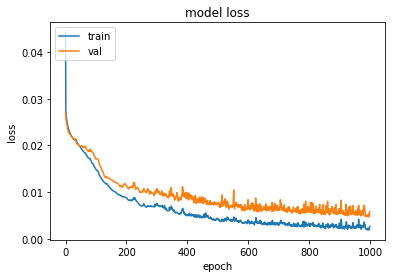

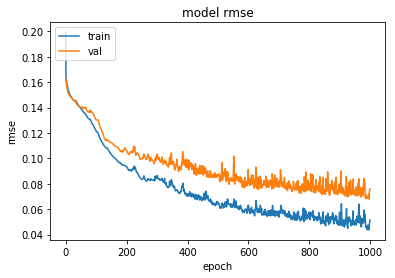

In [31]:
#3 hiden layers, 2 with 40 units, one with 30 units
click_SRNN_model8= click_stacked_stateless_SRNN2(units_1=40,units_2=30,lr=0.001, alpha=0.01)
click_SRNN_model8.summary()

#Train LSTM stateless model with shuffle=False
hist= stateless_fit(click_SRNN_model8, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts8.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [32]:
click_pred_train=click_SRNN_model8.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model8.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model8.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  72.7730954421301
YRMSE train:  45.57871204560237
XRMSE val:  94.96427809578717
YRMSE val:  60.41129188661147
XRMSE test:  100.21471032958071
YRMSE test:  60.73121632380469


Performs better than the previous one. But still there is diference between the training and validtaion preformance. Let's check the performance by decreasing the number of units in 2 hidden layers.

In [ ]:
#simpleRNN stacked stateless model with 3 hidden layers
import keras.backend as k
timesteps=18
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def click_stacked_stateless_SRNN3(units_1, units_2, lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units_1, return_sequences=True, input_shape=(timesteps,2)))
    model.add(SimpleRNN(units_2, return_sequences=True))
    model.add(SimpleRNN(units_2, return_sequences=False))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_10 (SimpleRNN)    (None, 18, 40)            1720      
_________________________________________________________________
simple_rnn_11 (SimpleRNN)    (None, 18, 30)            2130      
_________________________________________________________________
simple_rnn_12 (SimpleRNN)    (None, 30)                1830      
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 2)                 0         
Total params: 5,742
Trainable params: 5,742
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/1000
 - 4s - loss: 0.0602 - rmse: 0.2304 - val_loss: 0.02


Epoch 00041: val_loss improved from 0.02014 to 0.02013, saving model to click_SRNN_wts9.hdf5
Epoch 42/1000
 - 3s - loss: 0.0197 - rmse: 0.1400 - val_loss: 0.0201 - val_rmse: 0.1412

Epoch 00042: val_loss improved from 0.02013 to 0.02010, saving model to click_SRNN_wts9.hdf5
Epoch 43/1000
 - 3s - loss: 0.0196 - rmse: 0.1397 - val_loss: 0.0200 - val_rmse: 0.1409

Epoch 00043: val_loss improved from 0.02010 to 0.02004, saving model to click_SRNN_wts9.hdf5
Epoch 44/1000
 - 3s - loss: 0.0195 - rmse: 0.1394 - val_loss: 0.0200 - val_rmse: 0.1408

Epoch 00044: val_loss improved from 0.02004 to 0.01998, saving model to click_SRNN_wts9.hdf5
Epoch 45/1000
 - 3s - loss: 0.0195 - rmse: 0.1391 - val_loss: 0.0199 - val_rmse: 0.1406

Epoch 00045: val_loss improved from 0.01998 to 0.01994, saving model to click_SRNN_wts9.hdf5
Epoch 46/1000
 - 3s - loss: 0.0194 - rmse: 0.1388 - val_loss: 0.0199 - val_rmse: 0.1404

Epoch 00046: val_loss improved from 0.01994 to 0.01989, saving model to click_SRNN_wts9.h

 - 3s - loss: 0.0159 - rmse: 0.1259 - val_loss: 0.0170 - val_rmse: 0.1298

Epoch 00090: val_loss did not improve from 0.01695
Epoch 91/1000
 - 3s - loss: 0.0159 - rmse: 0.1257 - val_loss: 0.0169 - val_rmse: 0.1296

Epoch 00091: val_loss improved from 0.01695 to 0.01691, saving model to click_SRNN_wts9.hdf5
Epoch 92/1000
 - 3s - loss: 0.0158 - rmse: 0.1255 - val_loss: 0.0169 - val_rmse: 0.1295

Epoch 00092: val_loss improved from 0.01691 to 0.01689, saving model to click_SRNN_wts9.hdf5
Epoch 93/1000
 - 3s - loss: 0.0158 - rmse: 0.1254 - val_loss: 0.0168 - val_rmse: 0.1293

Epoch 00093: val_loss improved from 0.01689 to 0.01684, saving model to click_SRNN_wts9.hdf5
Epoch 94/1000
 - 3s - loss: 0.0158 - rmse: 0.1253 - val_loss: 0.0167 - val_rmse: 0.1288

Epoch 00094: val_loss improved from 0.01684 to 0.01671, saving model to click_SRNN_wts9.hdf5
Epoch 95/1000
 - 3s - loss: 0.0158 - rmse: 0.1256 - val_loss: 0.0166 - val_rmse: 0.1283

Epoch 00095: val_loss improved from 0.01671 to 0.01658, s

 - 3s - loss: 0.0128 - rmse: 0.1127 - val_loss: 0.0152 - val_rmse: 0.1229

Epoch 00142: val_loss improved from 0.01532 to 0.01519, saving model to click_SRNN_wts9.hdf5
Epoch 143/1000
 - 3s - loss: 0.0127 - rmse: 0.1123 - val_loss: 0.0153 - val_rmse: 0.1231

Epoch 00143: val_loss did not improve from 0.01519
Epoch 144/1000
 - 3s - loss: 0.0126 - rmse: 0.1119 - val_loss: 0.0151 - val_rmse: 0.1225

Epoch 00144: val_loss improved from 0.01519 to 0.01511, saving model to click_SRNN_wts9.hdf5
Epoch 145/1000
 - 3s - loss: 0.0125 - rmse: 0.1115 - val_loss: 0.0151 - val_rmse: 0.1223

Epoch 00145: val_loss improved from 0.01511 to 0.01507, saving model to click_SRNN_wts9.hdf5
Epoch 146/1000
 - 3s - loss: 0.0125 - rmse: 0.1113 - val_loss: 0.0150 - val_rmse: 0.1222

Epoch 00146: val_loss improved from 0.01507 to 0.01504, saving model to click_SRNN_wts9.hdf5
Epoch 147/1000
 - 3s - loss: 0.0124 - rmse: 0.1111 - val_loss: 0.0150 - val_rmse: 0.1220

Epoch 00147: val_loss improved from 0.01504 to 0.014

 - 3s - loss: 0.0099 - rmse: 0.0992 - val_loss: 0.0132 - val_rmse: 0.1146

Epoch 00193: val_loss improved from 0.01321 to 0.01320, saving model to click_SRNN_wts9.hdf5
Epoch 194/1000
 - 3s - loss: 0.0099 - rmse: 0.0990 - val_loss: 0.0132 - val_rmse: 0.1144

Epoch 00194: val_loss improved from 0.01320 to 0.01316, saving model to click_SRNN_wts9.hdf5
Epoch 195/1000
 - 3s - loss: 0.0098 - rmse: 0.0988 - val_loss: 0.0133 - val_rmse: 0.1149

Epoch 00195: val_loss did not improve from 0.01316
Epoch 196/1000
 - 3s - loss: 0.0097 - rmse: 0.0984 - val_loss: 0.0132 - val_rmse: 0.1146

Epoch 00196: val_loss did not improve from 0.01316
Epoch 197/1000
 - 3s - loss: 0.0097 - rmse: 0.0980 - val_loss: 0.0131 - val_rmse: 0.1139

Epoch 00197: val_loss improved from 0.01316 to 0.01306, saving model to click_SRNN_wts9.hdf5
Epoch 198/1000
 - 3s - loss: 0.0096 - rmse: 0.0977 - val_loss: 0.0129 - val_rmse: 0.1135

Epoch 00198: val_loss improved from 0.01306 to 0.01295, saving model to click_SRNN_wts9.hdf5
E


Epoch 00243: val_loss did not improve from 0.01098
Epoch 244/1000
 - 3s - loss: 0.0086 - rmse: 0.0925 - val_loss: 0.0119 - val_rmse: 0.1087

Epoch 00244: val_loss did not improve from 0.01098
Epoch 245/1000
 - 3s - loss: 0.0087 - rmse: 0.0928 - val_loss: 0.0117 - val_rmse: 0.1078

Epoch 00245: val_loss did not improve from 0.01098
Epoch 246/1000
 - 3s - loss: 0.0087 - rmse: 0.0932 - val_loss: 0.0118 - val_rmse: 0.1083

Epoch 00246: val_loss did not improve from 0.01098
Epoch 247/1000
 - 3s - loss: 0.0088 - rmse: 0.0937 - val_loss: 0.0117 - val_rmse: 0.1079

Epoch 00247: val_loss did not improve from 0.01098
Epoch 248/1000
 - 3s - loss: 0.0088 - rmse: 0.0935 - val_loss: 0.0117 - val_rmse: 0.1079

Epoch 00248: val_loss did not improve from 0.01098
Epoch 249/1000
 - 3s - loss: 0.0085 - rmse: 0.0919 - val_loss: 0.0112 - val_rmse: 0.1056

Epoch 00249: val_loss did not improve from 0.01098
Epoch 250/1000
 - 3s - loss: 0.0082 - rmse: 0.0904 - val_loss: 0.0110 - val_rmse: 0.1044

Epoch 00250:


Epoch 00297: val_loss did not improve from 0.00935
Epoch 298/1000
 - 3s - loss: 0.0077 - rmse: 0.0872 - val_loss: 0.0102 - val_rmse: 0.1008

Epoch 00298: val_loss did not improve from 0.00935
Epoch 299/1000
 - 3s - loss: 0.0077 - rmse: 0.0874 - val_loss: 0.0110 - val_rmse: 0.1047

Epoch 00299: val_loss did not improve from 0.00935
Epoch 300/1000
 - 3s - loss: 0.0079 - rmse: 0.0885 - val_loss: 0.0115 - val_rmse: 0.1069

Epoch 00300: val_loss did not improve from 0.00935
Epoch 301/1000
 - 3s - loss: 0.0081 - rmse: 0.0898 - val_loss: 0.0106 - val_rmse: 0.1024

Epoch 00301: val_loss did not improve from 0.00935
Epoch 302/1000
 - 3s - loss: 0.0076 - rmse: 0.0869 - val_loss: 0.0102 - val_rmse: 0.1008

Epoch 00302: val_loss did not improve from 0.00935
Epoch 303/1000
 - 3s - loss: 0.0078 - rmse: 0.0880 - val_loss: 0.0101 - val_rmse: 0.1003

Epoch 00303: val_loss did not improve from 0.00935
Epoch 304/1000
 - 3s - loss: 0.0078 - rmse: 0.0880 - val_loss: 0.0098 - val_rmse: 0.0986

Epoch 00304:

 - 3s - loss: 0.0060 - rmse: 0.0771 - val_loss: 0.0092 - val_rmse: 0.0958

Epoch 00350: val_loss did not improve from 0.00860
Epoch 351/1000
 - 3s - loss: 0.0060 - rmse: 0.0775 - val_loss: 0.0092 - val_rmse: 0.0959

Epoch 00351: val_loss did not improve from 0.00860
Epoch 352/1000
 - 3s - loss: 0.0061 - rmse: 0.0776 - val_loss: 0.0091 - val_rmse: 0.0953

Epoch 00352: val_loss did not improve from 0.00860
Epoch 353/1000
 - 3s - loss: 0.0061 - rmse: 0.0777 - val_loss: 0.0091 - val_rmse: 0.0951

Epoch 00353: val_loss did not improve from 0.00860
Epoch 354/1000
 - 3s - loss: 0.0059 - rmse: 0.0768 - val_loss: 0.0092 - val_rmse: 0.0957

Epoch 00354: val_loss did not improve from 0.00860
Epoch 355/1000
 - 3s - loss: 0.0059 - rmse: 0.0766 - val_loss: 0.0093 - val_rmse: 0.0959

Epoch 00355: val_loss did not improve from 0.00860
Epoch 356/1000
 - 3s - loss: 0.0060 - rmse: 0.0770 - val_loss: 0.0092 - val_rmse: 0.0955

Epoch 00356: val_loss did not improve from 0.00860
Epoch 357/1000
 - 3s - loss:


Epoch 00404: val_loss did not improve from 0.00775
Epoch 405/1000
 - 3s - loss: 0.0047 - rmse: 0.0686 - val_loss: 0.0076 - val_rmse: 0.0867

Epoch 00405: val_loss improved from 0.00775 to 0.00757, saving model to click_SRNN_wts9.hdf5
Epoch 406/1000
 - 3s - loss: 0.0052 - rmse: 0.0718 - val_loss: 0.0079 - val_rmse: 0.0885

Epoch 00406: val_loss did not improve from 0.00757
Epoch 407/1000
 - 3s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0083 - val_rmse: 0.0906

Epoch 00407: val_loss did not improve from 0.00757
Epoch 408/1000
 - 3s - loss: 0.0050 - rmse: 0.0706 - val_loss: 0.0080 - val_rmse: 0.0891

Epoch 00408: val_loss did not improve from 0.00757
Epoch 409/1000
 - 3s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0080 - val_rmse: 0.0889

Epoch 00409: val_loss did not improve from 0.00757
Epoch 410/1000
 - 3s - loss: 0.0049 - rmse: 0.0698 - val_loss: 0.0084 - val_rmse: 0.0912

Epoch 00410: val_loss did not improve from 0.00757
Epoch 411/1000
 - 3s - loss: 0.0048 - rmse: 0.0687 - val_los


Epoch 00461: val_loss did not improve from 0.00720
Epoch 462/1000
 - 3s - loss: 0.0049 - rmse: 0.0698 - val_loss: 0.0073 - val_rmse: 0.0850

Epoch 00462: val_loss did not improve from 0.00720
Epoch 463/1000
 - 3s - loss: 0.0055 - rmse: 0.0733 - val_loss: 0.0080 - val_rmse: 0.0892

Epoch 00463: val_loss did not improve from 0.00720
Epoch 464/1000
 - 3s - loss: 0.0052 - rmse: 0.0718 - val_loss: 0.0074 - val_rmse: 0.0856

Epoch 00464: val_loss did not improve from 0.00720
Epoch 465/1000
 - 3s - loss: 0.0051 - rmse: 0.0715 - val_loss: 0.0074 - val_rmse: 0.0859

Epoch 00465: val_loss did not improve from 0.00720
Epoch 466/1000
 - 3s - loss: 0.0056 - rmse: 0.0742 - val_loss: 0.0075 - val_rmse: 0.0865

Epoch 00466: val_loss did not improve from 0.00720
Epoch 467/1000
 - 3s - loss: 0.0053 - rmse: 0.0726 - val_loss: 0.0081 - val_rmse: 0.0898

Epoch 00467: val_loss did not improve from 0.00720
Epoch 468/1000
 - 3s - loss: 0.0052 - rmse: 0.0721 - val_loss: 0.0082 - val_rmse: 0.0902

Epoch 00468:


Epoch 00519: val_loss did not improve from 0.00697
Epoch 520/1000
 - 3s - loss: 0.0048 - rmse: 0.0688 - val_loss: 0.0081 - val_rmse: 0.0896

Epoch 00520: val_loss did not improve from 0.00697
Epoch 521/1000
 - 3s - loss: 0.0046 - rmse: 0.0676 - val_loss: 0.0073 - val_rmse: 0.0850

Epoch 00521: val_loss did not improve from 0.00697
Epoch 522/1000
 - 3s - loss: 0.0046 - rmse: 0.0673 - val_loss: 0.0075 - val_rmse: 0.0861

Epoch 00522: val_loss did not improve from 0.00697
Epoch 523/1000
 - 3s - loss: 0.0045 - rmse: 0.0668 - val_loss: 0.0079 - val_rmse: 0.0884

Epoch 00523: val_loss did not improve from 0.00697
Epoch 524/1000
 - 3s - loss: 0.0046 - rmse: 0.0675 - val_loss: 0.0083 - val_rmse: 0.0908

Epoch 00524: val_loss did not improve from 0.00697
Epoch 525/1000
 - 3s - loss: 0.0045 - rmse: 0.0671 - val_loss: 0.0081 - val_rmse: 0.0896

Epoch 00525: val_loss did not improve from 0.00697
Epoch 526/1000
 - 3s - loss: 0.0045 - rmse: 0.0667 - val_loss: 0.0084 - val_rmse: 0.0911

Epoch 00526:

 - 4s - loss: 0.0038 - rmse: 0.0611 - val_loss: 0.0063 - val_rmse: 0.0792

Epoch 00577: val_loss improved from 0.00640 to 0.00633, saving model to click_SRNN_wts9.hdf5
Epoch 578/1000
 - 3s - loss: 0.0039 - rmse: 0.0618 - val_loss: 0.0069 - val_rmse: 0.0824

Epoch 00578: val_loss did not improve from 0.00633
Epoch 579/1000
 - 3s - loss: 0.0037 - rmse: 0.0607 - val_loss: 0.0062 - val_rmse: 0.0785

Epoch 00579: val_loss improved from 0.00633 to 0.00621, saving model to click_SRNN_wts9.hdf5
Epoch 580/1000
 - 3s - loss: 0.0036 - rmse: 0.0600 - val_loss: 0.0065 - val_rmse: 0.0799

Epoch 00580: val_loss did not improve from 0.00621
Epoch 581/1000
 - 3s - loss: 0.0040 - rmse: 0.0630 - val_loss: 0.0082 - val_rmse: 0.0901

Epoch 00581: val_loss did not improve from 0.00621
Epoch 582/1000
 - 3s - loss: 0.0040 - rmse: 0.0633 - val_loss: 0.0066 - val_rmse: 0.0808

Epoch 00582: val_loss did not improve from 0.00621
Epoch 583/1000
 - 3s - loss: 0.0041 - rmse: 0.0634 - val_loss: 0.0075 - val_rmse: 0.0

 - 3s - loss: 0.0037 - rmse: 0.0604 - val_loss: 0.0060 - val_rmse: 0.0768

Epoch 00634: val_loss did not improve from 0.00589
Epoch 635/1000
 - 3s - loss: 0.0037 - rmse: 0.0602 - val_loss: 0.0064 - val_rmse: 0.0794

Epoch 00635: val_loss did not improve from 0.00589
Epoch 636/1000
 - 3s - loss: 0.0037 - rmse: 0.0604 - val_loss: 0.0062 - val_rmse: 0.0782

Epoch 00636: val_loss did not improve from 0.00589
Epoch 637/1000
 - 3s - loss: 0.0037 - rmse: 0.0604 - val_loss: 0.0065 - val_rmse: 0.0801

Epoch 00637: val_loss did not improve from 0.00589
Epoch 638/1000
 - 3s - loss: 0.0036 - rmse: 0.0597 - val_loss: 0.0063 - val_rmse: 0.0789

Epoch 00638: val_loss did not improve from 0.00589
Epoch 639/1000
 - 3s - loss: 0.0036 - rmse: 0.0601 - val_loss: 0.0068 - val_rmse: 0.0823

Epoch 00639: val_loss did not improve from 0.00589
Epoch 640/1000
 - 3s - loss: 0.0038 - rmse: 0.0612 - val_loss: 0.0072 - val_rmse: 0.0844

Epoch 00640: val_loss did not improve from 0.00589
Epoch 641/1000
 - 3s - loss:

 - 3s - loss: 0.0034 - rmse: 0.0582 - val_loss: 0.0071 - val_rmse: 0.0839

Epoch 00692: val_loss did not improve from 0.00559
Epoch 693/1000
 - 4s - loss: 0.0037 - rmse: 0.0607 - val_loss: 0.0061 - val_rmse: 0.0780

Epoch 00693: val_loss did not improve from 0.00559
Epoch 694/1000
 - 3s - loss: 0.0038 - rmse: 0.0614 - val_loss: 0.0064 - val_rmse: 0.0795

Epoch 00694: val_loss did not improve from 0.00559
Epoch 695/1000
 - 3s - loss: 0.0036 - rmse: 0.0595 - val_loss: 0.0067 - val_rmse: 0.0815

Epoch 00695: val_loss did not improve from 0.00559
Epoch 696/1000
 - 3s - loss: 0.0040 - rmse: 0.0632 - val_loss: 0.0076 - val_rmse: 0.0868

Epoch 00696: val_loss did not improve from 0.00559
Epoch 697/1000
 - 3s - loss: 0.0039 - rmse: 0.0620 - val_loss: 0.0068 - val_rmse: 0.0823

Epoch 00697: val_loss did not improve from 0.00559
Epoch 698/1000
 - 3s - loss: 0.0039 - rmse: 0.0621 - val_loss: 0.0069 - val_rmse: 0.0829

Epoch 00698: val_loss did not improve from 0.00559
Epoch 699/1000
 - 3s - loss:

 - 3s - loss: 0.0032 - rmse: 0.0565 - val_loss: 0.0057 - val_rmse: 0.0752

Epoch 00750: val_loss did not improve from 0.00553
Epoch 751/1000
 - 3s - loss: 0.0032 - rmse: 0.0563 - val_loss: 0.0062 - val_rmse: 0.0784

Epoch 00751: val_loss did not improve from 0.00553
Epoch 752/1000
 - 3s - loss: 0.0029 - rmse: 0.0538 - val_loss: 0.0056 - val_rmse: 0.0745

Epoch 00752: val_loss did not improve from 0.00553
Epoch 753/1000
 - 3s - loss: 0.0031 - rmse: 0.0552 - val_loss: 0.0063 - val_rmse: 0.0787

Epoch 00753: val_loss did not improve from 0.00553
Epoch 754/1000
 - 3s - loss: 0.0030 - rmse: 0.0545 - val_loss: 0.0057 - val_rmse: 0.0750

Epoch 00754: val_loss did not improve from 0.00553
Epoch 755/1000
 - 3s - loss: 0.0032 - rmse: 0.0559 - val_loss: 0.0066 - val_rmse: 0.0806

Epoch 00755: val_loss did not improve from 0.00553
Epoch 756/1000
 - 3s - loss: 0.0031 - rmse: 0.0556 - val_loss: 0.0062 - val_rmse: 0.0779

Epoch 00756: val_loss did not improve from 0.00553
Epoch 757/1000
 - 3s - loss:


Epoch 00808: val_loss did not improve from 0.00553
Epoch 809/1000
 - 3s - loss: 0.0039 - rmse: 0.0621 - val_loss: 0.0076 - val_rmse: 0.0868

Epoch 00809: val_loss did not improve from 0.00553
Epoch 810/1000
 - 4s - loss: 0.0037 - rmse: 0.0604 - val_loss: 0.0067 - val_rmse: 0.0815

Epoch 00810: val_loss did not improve from 0.00553
Epoch 811/1000
 - 3s - loss: 0.0036 - rmse: 0.0594 - val_loss: 0.0077 - val_rmse: 0.0872

Epoch 00811: val_loss did not improve from 0.00553
Epoch 812/1000
 - 3s - loss: 0.0035 - rmse: 0.0593 - val_loss: 0.0069 - val_rmse: 0.0827

Epoch 00812: val_loss did not improve from 0.00553
Epoch 813/1000
 - 3s - loss: 0.0032 - rmse: 0.0560 - val_loss: 0.0072 - val_rmse: 0.0845

Epoch 00813: val_loss did not improve from 0.00553
Epoch 814/1000
 - 3s - loss: 0.0035 - rmse: 0.0587 - val_loss: 0.0069 - val_rmse: 0.0824

Epoch 00814: val_loss did not improve from 0.00553
Epoch 815/1000
 - 3s - loss: 0.0036 - rmse: 0.0599 - val_loss: 0.0064 - val_rmse: 0.0796

Epoch 00815:

 - 3s - loss: 0.0033 - rmse: 0.0571 - val_loss: 0.0069 - val_rmse: 0.0824

Epoch 00867: val_loss did not improve from 0.00553
Epoch 868/1000
 - 3s - loss: 0.0038 - rmse: 0.0611 - val_loss: 0.0077 - val_rmse: 0.0870

Epoch 00868: val_loss did not improve from 0.00553
Epoch 869/1000
 - 3s - loss: 0.0033 - rmse: 0.0572 - val_loss: 0.0058 - val_rmse: 0.0760

Epoch 00869: val_loss did not improve from 0.00553
Epoch 870/1000
 - 3s - loss: 0.0040 - rmse: 0.0625 - val_loss: 0.0071 - val_rmse: 0.0839

Epoch 00870: val_loss did not improve from 0.00553
Epoch 871/1000
 - 3s - loss: 0.0043 - rmse: 0.0652 - val_loss: 0.0074 - val_rmse: 0.0855

Epoch 00871: val_loss did not improve from 0.00553
Epoch 872/1000
 - 3s - loss: 0.0037 - rmse: 0.0605 - val_loss: 0.0061 - val_rmse: 0.0777

Epoch 00872: val_loss did not improve from 0.00553
Epoch 873/1000
 - 3s - loss: 0.0033 - rmse: 0.0572 - val_loss: 0.0058 - val_rmse: 0.0757

Epoch 00873: val_loss did not improve from 0.00553
Epoch 874/1000
 - 3s - loss:

 - 3s - loss: 0.0030 - rmse: 0.0542 - val_loss: 0.0057 - val_rmse: 0.0749

Epoch 00925: val_loss did not improve from 0.00539
Epoch 926/1000
 - 3s - loss: 0.0029 - rmse: 0.0535 - val_loss: 0.0059 - val_rmse: 0.0764

Epoch 00926: val_loss did not improve from 0.00539
Epoch 927/1000
 - 3s - loss: 0.0029 - rmse: 0.0532 - val_loss: 0.0054 - val_rmse: 0.0731

Epoch 00927: val_loss did not improve from 0.00539
Epoch 928/1000
 - 3s - loss: 0.0046 - rmse: 0.0661 - val_loss: 0.0074 - val_rmse: 0.0855

Epoch 00928: val_loss did not improve from 0.00539
Epoch 929/1000
 - 3s - loss: 0.0044 - rmse: 0.0661 - val_loss: 0.0064 - val_rmse: 0.0797

Epoch 00929: val_loss did not improve from 0.00539
Epoch 930/1000
 - 3s - loss: 0.0041 - rmse: 0.0637 - val_loss: 0.0076 - val_rmse: 0.0866

Epoch 00930: val_loss did not improve from 0.00539
Epoch 931/1000
 - 3s - loss: 0.0038 - rmse: 0.0611 - val_loss: 0.0060 - val_rmse: 0.0767

Epoch 00931: val_loss did not improve from 0.00539
Epoch 932/1000
 - 3s - loss:


Epoch 00981: val_loss did not improve from 0.00491
Epoch 982/1000
 - 3s - loss: 0.0024 - rmse: 0.0485 - val_loss: 0.0051 - val_rmse: 0.0707

Epoch 00982: val_loss did not improve from 0.00491
Epoch 983/1000
 - 3s - loss: 0.0023 - rmse: 0.0481 - val_loss: 0.0052 - val_rmse: 0.0718

Epoch 00983: val_loss did not improve from 0.00491
Epoch 984/1000
 - 3s - loss: 0.0026 - rmse: 0.0510 - val_loss: 0.0054 - val_rmse: 0.0728

Epoch 00984: val_loss did not improve from 0.00491
Epoch 985/1000
 - 3s - loss: 0.0045 - rmse: 0.0656 - val_loss: 0.0110 - val_rmse: 0.1043

Epoch 00985: val_loss did not improve from 0.00491
Epoch 986/1000
 - 3s - loss: 0.0061 - rmse: 0.0774 - val_loss: 0.0081 - val_rmse: 0.0894

Epoch 00986: val_loss did not improve from 0.00491
Epoch 987/1000
 - 3s - loss: 0.0033 - rmse: 0.0574 - val_loss: 0.0054 - val_rmse: 0.0730

Epoch 00987: val_loss did not improve from 0.00491
Epoch 988/1000
 - 3s - loss: 0.0032 - rmse: 0.0558 - val_loss: 0.0065 - val_rmse: 0.0797

Epoch 00988:

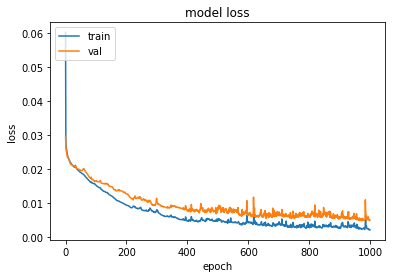

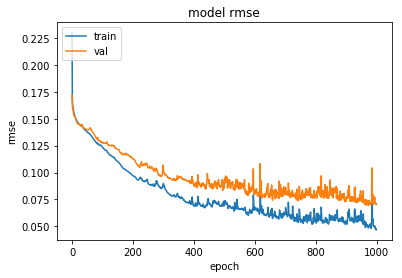

In [34]:
#3 hiden layers, one with 40 units, two with 30 units
click_SRNN_model9= click_stacked_stateless_SRNN3(units_1=40,units_2=30,lr=0.001, alpha=0.01)
click_SRNN_model9.summary()

#Train LSTM stateless model with shuffle=False
hist= stateless_fit(click_SRNN_model9, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts9.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [36]:
click_pred_train=click_SRNN_model9.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model9.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model9.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  60.58465038866779
YRMSE train:  40.51479066027312
XRMSE val:  84.53699709412444
YRMSE val:  57.34430398745955
XRMSE test:  93.39884293158516
YRMSE test:  56.761201418853986


This model with 3 hidden layers, one with 40 units and 2 with 30 units each, performs the best with the lowest XRMSE and YRMSE scores.

In [ ]:
#stacked stateless simpleRNN with 3 hidden layers for 10 iterations
timesteps=18
sample_size=10
X_RMSE=[]
Y_RMSE=[]

for i in range(sample_size):
    print('Experimental Run: ', i)
    
    model= click_stacked_stateless_SRNN3(units_1=40,units_2=30,lr=0.001, alpha=0.01)
    model.fit(X_click_train, Y_click_train, validation_data=(X_click_val, Y_click_val), batch_size=133, epochs=1000, verbose=0, shuffle=False)
    
    Y_click_pred = model.predict(X_click_test)
    
    xrmse, yrmse= calculate_RMSE(Y_click_pred, Y_click_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

    print(X_RMSE)
    print(Y_RMSE)
    
print('Iterations Completed')
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)) +'\n')

#Results of the above block

Experimental Run:  0
Model created and compiled
[93.0259617790817]
[59.84759251377407]
Experimental Run:  1
Model created and compiled
[93.0259617790817, 97.15919879543424]
[59.84759251377407, 58.912411073809665]
Experimental Run:  2
Model created and compiled
[93.0259617790817, 97.15919879543424, 97.02405439370578]
[59.84759251377407, 58.912411073809665, 62.630839863913224]
Experimental Run:  3
Model created and compiled
[93.0259617790817, 97.15919879543424, 97.02405439370578, 94.45560175463142]
[59.84759251377407, 58.912411073809665, 62.630839863913224, 58.266369993391386]
Experimental Run:  4
Model created and compiled
[93.0259617790817, 97.15919879543424, 97.02405439370578, 94.45560175463142, 99.5222243653922]
[59.84759251377407, 58.912411073809665, 62.630839863913224, 58.266369993391386, 61.23176076339879]
Experimental Run:  5
Model created and compiled
[93.0259617790817, 97.15919879543424, 97.02405439370578, 94.45560175463142, 99.5222243653922, 97.63467890862069]
[59.84759251377407, 58.912411073809665, 62.630839863913224, 58.266369993391386, 61.23176076339879, 58.96581580870559]
Experimental Run:  6
Model created and compiled
[93.0259617790817, 97.15919879543424, 97.02405439370578, 94.45560175463142, 99.5222243653922, 97.63467890862069, 96.25725588999265]
[59.84759251377407, 58.912411073809665, 62.630839863913224, 58.266369993391386, 61.23176076339879, 58.96581580870559, 57.53973220555518]
Experimental Run:  7
Model created and compiled
[93.0259617790817, 97.15919879543424, 97.02405439370578, 94.45560175463142, 99.5222243653922, 97.63467890862069, 96.25725588999265, 119.95442046475517]
[59.84759251377407, 58.912411073809665, 62.630839863913224, 58.266369993391386, 61.23176076339879, 58.96581580870559, 57.53973220555518, 73.85228909517068]
Experimental Run:  8
Model created and compiled
[93.0259617790817, 97.15919879543424, 97.02405439370578, 94.45560175463142, 99.5222243653922, 97.63467890862069, 96.25725588999265, 119.95442046475517, 99.16875644244784]
[59.84759251377407, 58.912411073809665, 62.630839863913224, 58.266369993391386, 61.23176076339879, 58.96581580870559, 57.53973220555518, 73.85228909517068, 63.69338605622536]
Experimental Run:  9
Model created and compiled
[93.0259617790817, 97.15919879543424, 97.02405439370578, 94.45560175463142, 99.5222243653922, 97.63467890862069, 96.25725588999265, 119.95442046475517, 99.16875644244784, 97.38403343819814]
[59.84759251377407, 58.912411073809665, 62.630839863913224, 58.266369993391386, 61.23176076339879, 58.96581580870559, 57.53973220555518, 73.85228909517068, 63.69338605622536, 62.20072922740526]
Iterations Completed
X-coord RMSE Mean: 99.15861862322598

Y-coord RMSE Mean: 61.71409266013492

In [6]:
#Final results after 10 iterations
print('Mean XRMSE: ', np.round(99.15861862322598, 3))
print('Mean YRMSE: ', np.round(61.71409266013492, 3))

Mean XRMSE:  99.159
Mean YRMSE:  61.714


In [7]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#SimpleRNN with m/m between batches
def click_stacked_stateful_SRNN(units, lr, batch, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout))
    model.add(SimpleRNN(units, return_sequences=False, stateful=True, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_18 (SimpleRNN)    (133, 18, 40)             1720      
_________________________________________________________________
simple_rnn_19 (SimpleRNN)    (133, 40)                 3240      
_________________________________________________________________
dense_7 (Dense)              (133, 2)                  82        
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (133, 2)                  0         
Total params: 5,042
Trainable params: 5,042
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0807 - rmse: 0.2772 - val_loss: 0.0310 

 - 2s - loss: 0.0259 - rmse: 0.1604 - val_loss: 0.0258 - val_rmse: 0.1600

Epoch 00001: val_loss did not improve from 0.02564
Epoch Number:  32
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0259 - rmse: 0.1606 - val_loss: 0.0257 - val_rmse: 0.1595

Epoch 00001: val_loss did not improve from 0.02564
Epoch Number:  33
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0259 - rmse: 0.1607 - val_loss: 0.0257 - val_rmse: 0.1596

Epoch 00001: val_loss did not improve from 0.02564
Epoch Number:  34
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0259 - rmse: 0.1605 - val_loss: 0.0258 - val_rmse: 0.1600

Epoch 00001: val_loss did not improve from 0.02564
Epoch Number:  35
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0258 - rmse: 0.1602 - val_loss: 0.0257 - val_rmse: 0.1597

Epoch 00001: val_loss did not improve from 0.02564
Epoch Number:  36
Train on 9177 samples, validate on 3059 samples


 - 2s - loss: 0.0250 - rmse: 0.1577 - val_loss: 0.0251 - val_rmse: 0.1576

Epoch 00001: val_loss did not improve from 0.02495
Epoch Number:  72
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0250 - rmse: 0.1577 - val_loss: 0.0259 - val_rmse: 0.1602

Epoch 00001: val_loss did not improve from 0.02495
Epoch Number:  73
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0247 - rmse: 0.1568 - val_loss: 0.0252 - val_rmse: 0.1578

Epoch 00001: val_loss did not improve from 0.02495
Epoch Number:  74
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0247 - rmse: 0.1567 - val_loss: 0.0254 - val_rmse: 0.1587

Epoch 00001: val_loss did not improve from 0.02495
Epoch Number:  75
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0247 - rmse: 0.1567 - val_loss: 0.0253 - val_rmse: 0.1583

Epoch 00001: val_loss did not improve from 0.02495
Epoch Number:  76
Train on 9177 samples, validate on 3059 samples



Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  112
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0241 - rmse: 0.1550 - val_loss: 0.0257 - val_rmse: 0.1596

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  113
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0242 - rmse: 0.1551 - val_loss: 0.0258 - val_rmse: 0.1597

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  114
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0241 - rmse: 0.1547 - val_loss: 0.0254 - val_rmse: 0.1586

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  115
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0242 - rmse: 0.1553 - val_loss: 0.0258 - val_rmse: 0.1598

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  116
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0242 - rmse: 0.1551 - val_loss: 0.0255 - va

 - 2s - loss: 0.0237 - rmse: 0.1535 - val_loss: 0.0252 - val_rmse: 0.1580

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  153
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0239 - rmse: 0.1540 - val_loss: 0.0255 - val_rmse: 0.1588

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  154
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0235 - rmse: 0.1528 - val_loss: 0.0252 - val_rmse: 0.1579

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  155
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0237 - rmse: 0.1536 - val_loss: 0.0252 - val_rmse: 0.1579

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  156
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0236 - rmse: 0.1531 - val_loss: 0.0253 - val_rmse: 0.1582

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  157
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0231 - rmse: 0.1517 - val_loss: 0.0250 - val_rmse: 0.1574

Epoch 00001: val_loss did not improve from 0.02436
Epoch Number:  193
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0233 - rmse: 0.1522 - val_loss: 0.0247 - val_rmse: 0.1564

Epoch 00001: val_loss did not improve from 0.02436
Epoch Number:  194
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0236 - rmse: 0.1532 - val_loss: 0.0246 - val_rmse: 0.1560

Epoch 00001: val_loss did not improve from 0.02436
Epoch Number:  195
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0231 - rmse: 0.1517 - val_loss: 0.0247 - val_rmse: 0.1562

Epoch 00001: val_loss did not improve from 0.02436
Epoch Number:  196
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0230 - rmse: 0.1513 - val_loss: 0.0246 - val_rmse: 0.1560

Epoch 00001: val_loss did not improve from 0.02436
Epoch Number:  197
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0231 - rmse: 0.1514 - val_loss: 0.0248 - val_rmse: 0.1567

Epoch 00001: val_loss did not improve from 0.02406
Epoch Number:  233
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0228 - rmse: 0.1507 - val_loss: 0.0244 - val_rmse: 0.1555

Epoch 00001: val_loss did not improve from 0.02406
Epoch Number:  234
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0228 - rmse: 0.1508 - val_loss: 0.0243 - val_rmse: 0.1552

Epoch 00001: val_loss did not improve from 0.02406
Epoch Number:  235
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0229 - rmse: 0.1510 - val_loss: 0.0242 - val_rmse: 0.1547

Epoch 00001: val_loss did not improve from 0.02406
Epoch Number:  236
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0229 - rmse: 0.1509 - val_loss: 0.0241 - val_rmse: 0.1544

Epoch 00001: val_loss did not improve from 0.02406
Epoch Number:  237
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0225 - rmse: 0.1497 - val_loss: 0.0236 - val_rmse: 0.1528

Epoch 00001: val_loss did not improve from 0.02343
Epoch Number:  272
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0232 - rmse: 0.1518 - val_loss: 0.0240 - val_rmse: 0.1541

Epoch 00001: val_loss did not improve from 0.02343
Epoch Number:  273
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0227 - rmse: 0.1504 - val_loss: 0.0235 - val_rmse: 0.1525

Epoch 00001: val_loss did not improve from 0.02343
Epoch Number:  274
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0233 - rmse: 0.1524 - val_loss: 0.0236 - val_rmse: 0.1528

Epoch 00001: val_loss did not improve from 0.02343
Epoch Number:  275
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0224 - rmse: 0.1494 - val_loss: 0.0234 - val_rmse: 0.1523

Epoch 00001: val_loss did not improve from 0.02343
Epoch Number:  276
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0224 - rmse: 0.1491 - val_loss: 0.0229 - val_rmse: 0.1507

Epoch 00001: val_loss did not improve from 0.02246
Epoch Number:  311
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0221 - rmse: 0.1483 - val_loss: 0.0227 - val_rmse: 0.1500

Epoch 00001: val_loss did not improve from 0.02246
Epoch Number:  312
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0220 - rmse: 0.1478 - val_loss: 0.0229 - val_rmse: 0.1506

Epoch 00001: val_loss did not improve from 0.02246
Epoch Number:  313
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0220 - rmse: 0.1480 - val_loss: 0.0227 - val_rmse: 0.1498

Epoch 00001: val_loss did not improve from 0.02246
Epoch Number:  314
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0221 - rmse: 0.1482 - val_loss: 0.0225 - val_rmse: 0.1491

Epoch 00001: val_loss did not improve from 0.02246
Epoch Number:  315
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.02168
Epoch Number:  350
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0218 - rmse: 0.1471 - val_loss: 0.0218 - val_rmse: 0.1470

Epoch 00001: val_loss did not improve from 0.02168
Epoch Number:  351
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0217 - rmse: 0.1469 - val_loss: 0.0218 - val_rmse: 0.1468

Epoch 00001: val_loss did not improve from 0.02168
Epoch Number:  352
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0218 - rmse: 0.1474 - val_loss: 0.0220 - val_rmse: 0.1474

Epoch 00001: val_loss did not improve from 0.02168
Epoch Number:  353
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0218 - rmse: 0.1472 - val_loss: 0.0219 - val_rmse: 0.1473

Epoch 00001: val_loss did not improve from 0.02168
Epoch Number:  354
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0215 - rmse: 0.1464 - val_loss: 0.0219 - va

 - 2s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0215 - val_rmse: 0.1460

Epoch 00001: val_loss did not improve from 0.02122
Epoch Number:  390
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0230 - rmse: 0.1512 - val_loss: 0.0217 - val_rmse: 0.1466

Epoch 00001: val_loss did not improve from 0.02122
Epoch Number:  391
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0217 - rmse: 0.1469 - val_loss: 0.0217 - val_rmse: 0.1464

Epoch 00001: val_loss did not improve from 0.02122
Epoch Number:  392
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0215 - rmse: 0.1462 - val_loss: 0.0213 - val_rmse: 0.1453

Epoch 00001: val_loss did not improve from 0.02122
Epoch Number:  393
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0226 - val_rmse: 0.1497

Epoch 00001: val_loss did not improve from 0.02122
Epoch Number:  394
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.02082
Epoch Number:  429
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0219 - rmse: 0.1477 - val_loss: 0.0219 - val_rmse: 0.1472

Epoch 00001: val_loss did not improve from 0.02082
Epoch Number:  430
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0217 - rmse: 0.1470 - val_loss: 0.0215 - val_rmse: 0.1461

Epoch 00001: val_loss did not improve from 0.02082
Epoch Number:  431
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0216 - rmse: 0.1466 - val_loss: 0.0214 - val_rmse: 0.1456

Epoch 00001: val_loss did not improve from 0.02082
Epoch Number:  432
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0232 - rmse: 0.1516 - val_loss: 0.0216 - val_rmse: 0.1462

Epoch 00001: val_loss did not improve from 0.02082
Epoch Number:  433
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0216 - rmse: 0.1468 - val_loss: 0.0211 - va


Epoch 00001: val_loss did not improve from 0.02049
Epoch Number:  469
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0209 - rmse: 0.1441 - val_loss: 0.0206 - val_rmse: 0.1428

Epoch 00001: val_loss did not improve from 0.02049
Epoch Number:  470
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0210 - rmse: 0.1445 - val_loss: 0.0214 - val_rmse: 0.1455

Epoch 00001: val_loss did not improve from 0.02049
Epoch Number:  471
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0212 - rmse: 0.1452 - val_loss: 0.0209 - val_rmse: 0.1439

Epoch 00001: val_loss did not improve from 0.02049
Epoch Number:  472
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0210 - rmse: 0.1446 - val_loss: 0.0211 - val_rmse: 0.1447

Epoch 00001: val_loss did not improve from 0.02049
Epoch Number:  473
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0209 - rmse: 0.1440 - val_loss: 0.0220 - va


Epoch 00001: val_loss improved from 0.02036 to 0.02032, saving model to click_SRNN_wts10.hdf5
Epoch Number:  509
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0208 - rmse: 0.1439 - val_loss: 0.0201 - val_rmse: 0.1409

Epoch 00001: val_loss improved from 0.02032 to 0.02006, saving model to click_SRNN_wts10.hdf5
Epoch Number:  510
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1432 - val_loss: 0.0205 - val_rmse: 0.1423

Epoch 00001: val_loss did not improve from 0.02006
Epoch Number:  511
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0207 - rmse: 0.1436 - val_loss: 0.0202 - val_rmse: 0.1416

Epoch 00001: val_loss did not improve from 0.02006
Epoch Number:  512
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1431 - val_loss: 0.0201 - val_rmse: 0.1413

Epoch 00001: val_loss did not improve from 0.02006
Epoch Number:  513
Train on 9177 samples, validate


Epoch 00001: val_loss did not improve from 0.01985
Epoch Number:  549
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0202 - rmse: 0.1419 - val_loss: 0.0202 - val_rmse: 0.1414

Epoch 00001: val_loss did not improve from 0.01985
Epoch Number:  550
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1421 - val_loss: 0.0201 - val_rmse: 0.1412

Epoch 00001: val_loss did not improve from 0.01985
Epoch Number:  551
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1421 - val_loss: 0.0205 - val_rmse: 0.1426

Epoch 00001: val_loss did not improve from 0.01985
Epoch Number:  552
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1422 - val_loss: 0.0202 - val_rmse: 0.1413

Epoch 00001: val_loss did not improve from 0.01985
Epoch Number:  553
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1430 - val_loss: 0.0203 - va

 - 2s - loss: 0.0202 - rmse: 0.1419 - val_loss: 0.0201 - val_rmse: 0.1411

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  590
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1414 - val_loss: 0.0201 - val_rmse: 0.1412

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  591
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0200 - rmse: 0.1409 - val_loss: 0.0202 - val_rmse: 0.1414

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  592
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1419 - val_loss: 0.0203 - val_rmse: 0.1416

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  593
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0202 - rmse: 0.1417 - val_loss: 0.0202 - val_rmse: 0.1412

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  594
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0208 - rmse: 0.1440 - val_loss: 0.0202 - val_rmse: 0.1416

Epoch 00001: val_loss did not improve from 0.01944
Epoch Number:  630
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0200 - rmse: 0.1408 - val_loss: 0.0200 - val_rmse: 0.1407

Epoch 00001: val_loss did not improve from 0.01944
Epoch Number:  631
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0200 - rmse: 0.1410 - val_loss: 0.0197 - val_rmse: 0.1397

Epoch 00001: val_loss did not improve from 0.01944
Epoch Number:  632
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1398 - val_loss: 0.0199 - val_rmse: 0.1406

Epoch 00001: val_loss did not improve from 0.01944
Epoch Number:  633
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1408 - val_loss: 0.0198 - val_rmse: 0.1400

Epoch 00001: val_loss did not improve from 0.01944
Epoch Number:  634
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01923
Epoch Number:  670
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1396 - val_loss: 0.0195 - val_rmse: 0.1391

Epoch 00001: val_loss did not improve from 0.01923
Epoch Number:  671
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1399 - val_loss: 0.0194 - val_rmse: 0.1385

Epoch 00001: val_loss did not improve from 0.01923
Epoch Number:  672
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1396 - val_loss: 0.0196 - val_rmse: 0.1395

Epoch 00001: val_loss did not improve from 0.01923
Epoch Number:  673
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0198 - rmse: 0.1403 - val_loss: 0.0193 - val_rmse: 0.1382

Epoch 00001: val_loss did not improve from 0.01923
Epoch Number:  674
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0233 - rmse: 0.1513 - val_loss: 0.0246 - va


Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  710
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1400 - val_loss: 0.0194 - val_rmse: 0.1386

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  711
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1394 - val_loss: 0.0191 - val_rmse: 0.1376

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  712
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0200 - rmse: 0.1411 - val_loss: 0.0195 - val_rmse: 0.1389

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  713
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1416 - val_loss: 0.0195 - val_rmse: 0.1389

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  714
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1395 - val_loss: 0.0196 - va


Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  750
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1387 - val_loss: 0.0192 - val_rmse: 0.1381

Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  751
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1387 - val_loss: 0.0191 - val_rmse: 0.1375

Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  752
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1385 - val_loss: 0.0193 - val_rmse: 0.1382

Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  753
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1383 - val_loss: 0.0199 - val_rmse: 0.1403

Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  754
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1390 - val_loss: 0.0194 - va

 - 2s - loss: 0.0192 - rmse: 0.1382 - val_loss: 0.0196 - val_rmse: 0.1393

Epoch 00001: val_loss did not improve from 0.01883
Epoch Number:  791
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1384 - val_loss: 0.0189 - val_rmse: 0.1368

Epoch 00001: val_loss did not improve from 0.01883
Epoch Number:  792
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1382 - val_loss: 0.0189 - val_rmse: 0.1368

Epoch 00001: val_loss did not improve from 0.01883
Epoch Number:  793
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1384 - val_loss: 0.0190 - val_rmse: 0.1371

Epoch 00001: val_loss did not improve from 0.01883
Epoch Number:  794
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0253 - rmse: 0.1577 - val_loss: 0.0230 - val_rmse: 0.1507

Epoch 00001: val_loss did not improve from 0.01883
Epoch Number:  795
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0194 - rmse: 0.1390 - val_loss: 0.0186 - val_rmse: 0.1358

Epoch 00001: val_loss did not improve from 0.01859
Epoch Number:  831
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1389 - val_loss: 0.0189 - val_rmse: 0.1368

Epoch 00001: val_loss did not improve from 0.01859
Epoch Number:  832
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1384 - val_loss: 0.0192 - val_rmse: 0.1377

Epoch 00001: val_loss did not improve from 0.01859
Epoch Number:  833
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0190 - rmse: 0.1376 - val_loss: 0.0185 - val_rmse: 0.1354

Epoch 00001: val_loss improved from 0.01859 to 0.01850, saving model to click_SRNN_wts10.hdf5
Epoch Number:  834
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1389 - val_loss: 0.0190 - val_rmse: 0.1373

Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  835



Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  871
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1387 - val_loss: 0.0189 - val_rmse: 0.1368

Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  872
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1383 - val_loss: 0.0188 - val_rmse: 0.1366

Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  873
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1382 - val_loss: 0.0191 - val_rmse: 0.1376

Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  874
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1383 - val_loss: 0.0187 - val_rmse: 0.1361

Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  875
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1381 - val_loss: 0.0190 - va

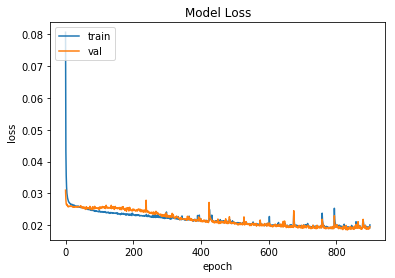

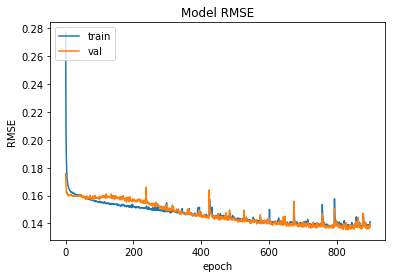

In [49]:
#2 hidden layers, both with 40 units
click_SRNN_model10= click_stacked_stateful_SRNN(units=40,lr=0.001, batch=133, alpha=0.01, dropout=0.1)
click_SRNN_model10.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model10, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_SRNN_wts10.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [50]:
click_pred_train=click_SRNN_model10.predict(X_click_train, batch_size=133)
click_SRNN_model10.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model10.predict(X_click_val, batch_size=133)
click_SRNN_model10.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model10.predict(X_click_test, batch_size=133)
click_SRNN_model10.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  175.19513974912923
YRMSE train:  103.6859600948379
XRMSE val:  177.48510768133815
YRMSE val:  107.3408798975263
XRMSE test:  186.12667498608306
YRMSE test:  107.22819237626297


The validation loss shows a slight increase during some of the epochs and then decreases continuously. Let's check the performance by decreasing the number of units in the second hidden layer.

In [51]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#SimpleRNN with m/m between batches
def click_stacked_stateful_SRNN2(units_1, units_2, lr, batch, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units_1, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout))
    model.add(SimpleRNN(units_2, return_sequences=False, stateful=True, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_22 (SimpleRNN)    (133, 18, 40)             1720      
_________________________________________________________________
simple_rnn_23 (SimpleRNN)    (133, 30)                 2130      
_________________________________________________________________
dense_9 (Dense)              (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (133, 2)                  0         
Total params: 3,912
Trainable params: 3,912
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.1151 - rmse: 0.3264 - val_loss: 0.0337 - val_rmse: 0.1832

Epoch 00001: val_loss improved from inf to 0.03371, saving model to click_SRNN_wts11.hdf5
Epoch

 - 2s - loss: 0.0260 - rmse: 0.1609 - val_loss: 0.0263 - val_rmse: 0.1614

Epoch 00001: val_loss did not improve from 0.02600
Epoch Number:  34
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0260 - rmse: 0.1609 - val_loss: 0.0260 - val_rmse: 0.1606

Epoch 00001: val_loss did not improve from 0.02600
Epoch Number:  35
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0261 - rmse: 0.1610 - val_loss: 0.0260 - val_rmse: 0.1604

Epoch 00001: val_loss improved from 0.02600 to 0.02597, saving model to click_SRNN_wts11.hdf5
Epoch Number:  36
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0261 - rmse: 0.1612 - val_loss: 0.0260 - val_rmse: 0.1605

Epoch 00001: val_loss did not improve from 0.02597
Epoch Number:  37
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0261 - rmse: 0.1612 - val_loss: 0.0264 - val_rmse: 0.1618

Epoch 00001: val_loss did not improve from 0.02597
Epoch Number:  38
Train

 - 2s - loss: 0.0251 - rmse: 0.1580 - val_loss: 0.0260 - val_rmse: 0.1603

Epoch 00001: val_loss did not improve from 0.02570
Epoch Number:  74
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0251 - rmse: 0.1581 - val_loss: 0.0262 - val_rmse: 0.1611

Epoch 00001: val_loss did not improve from 0.02570
Epoch Number:  75
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0250 - rmse: 0.1578 - val_loss: 0.0262 - val_rmse: 0.1610

Epoch 00001: val_loss did not improve from 0.02570
Epoch Number:  76
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0251 - rmse: 0.1579 - val_loss: 0.0258 - val_rmse: 0.1599

Epoch 00001: val_loss did not improve from 0.02570
Epoch Number:  77
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0252 - rmse: 0.1584 - val_loss: 0.0263 - val_rmse: 0.1612

Epoch 00001: val_loss did not improve from 0.02570
Epoch Number:  78
Train on 9177 samples, validate on 3059 samples


 - 2s - loss: 0.0246 - rmse: 0.1565 - val_loss: 0.0257 - val_rmse: 0.1594

Epoch 00001: val_loss did not improve from 0.02535
Epoch Number:  114
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0247 - rmse: 0.1569 - val_loss: 0.0258 - val_rmse: 0.1598

Epoch 00001: val_loss did not improve from 0.02535
Epoch Number:  115
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0247 - rmse: 0.1566 - val_loss: 0.0256 - val_rmse: 0.1592

Epoch 00001: val_loss did not improve from 0.02535
Epoch Number:  116
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0245 - rmse: 0.1562 - val_loss: 0.0257 - val_rmse: 0.1596

Epoch 00001: val_loss did not improve from 0.02535
Epoch Number:  117
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0249 - rmse: 0.1573 - val_loss: 0.0255 - val_rmse: 0.1590

Epoch 00001: val_loss did not improve from 0.02535
Epoch Number:  118
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0240 - rmse: 0.1547 - val_loss: 0.0247 - val_rmse: 0.1564

Epoch 00001: val_loss improved from 0.02481 to 0.02469, saving model to click_SRNN_wts11.hdf5
Epoch Number:  153
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0241 - rmse: 0.1548 - val_loss: 0.0248 - val_rmse: 0.1566

Epoch 00001: val_loss did not improve from 0.02469
Epoch Number:  154
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0241 - rmse: 0.1549 - val_loss: 0.0251 - val_rmse: 0.1576

Epoch 00001: val_loss did not improve from 0.02469
Epoch Number:  155
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0240 - rmse: 0.1546 - val_loss: 0.0251 - val_rmse: 0.1575

Epoch 00001: val_loss did not improve from 0.02469
Epoch Number:  156
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0243 - rmse: 0.1554 - val_loss: 0.0250 - val_rmse: 0.1574

Epoch 00001: val_loss did not improve from 0.02469
Epoch Number:  157



Epoch 00001: val_loss improved from 0.02425 to 0.02422, saving model to click_SRNN_wts11.hdf5
Epoch Number:  192
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0238 - rmse: 0.1538 - val_loss: 0.0248 - val_rmse: 0.1569

Epoch 00001: val_loss did not improve from 0.02422
Epoch Number:  193
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0237 - rmse: 0.1535 - val_loss: 0.0240 - val_rmse: 0.1541

Epoch 00001: val_loss improved from 0.02422 to 0.02398, saving model to click_SRNN_wts11.hdf5
Epoch Number:  194
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0236 - rmse: 0.1532 - val_loss: 0.0240 - val_rmse: 0.1543

Epoch 00001: val_loss did not improve from 0.02398
Epoch Number:  195
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0236 - rmse: 0.1532 - val_loss: 0.0244 - val_rmse: 0.1556

Epoch 00001: val_loss did not improve from 0.02398
Epoch Number:  196
Train on 9177 samples, validate


Epoch 00001: val_loss did not improve from 0.02363
Epoch Number:  231
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0233 - rmse: 0.1523 - val_loss: 0.0239 - val_rmse: 0.1539

Epoch 00001: val_loss did not improve from 0.02363
Epoch Number:  232
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0232 - rmse: 0.1519 - val_loss: 0.0238 - val_rmse: 0.1535

Epoch 00001: val_loss did not improve from 0.02363
Epoch Number:  233
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0232 - rmse: 0.1520 - val_loss: 0.0235 - val_rmse: 0.1525

Epoch 00001: val_loss improved from 0.02363 to 0.02349, saving model to click_SRNN_wts11.hdf5
Epoch Number:  234
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0233 - rmse: 0.1522 - val_loss: 0.0240 - val_rmse: 0.1543

Epoch 00001: val_loss did not improve from 0.02349
Epoch Number:  235
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.

 - 2s - loss: 0.0229 - rmse: 0.1509 - val_loss: 0.0233 - val_rmse: 0.1520

Epoch 00001: val_loss did not improve from 0.02313
Epoch Number:  271
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0228 - rmse: 0.1508 - val_loss: 0.0231 - val_rmse: 0.1514

Epoch 00001: val_loss improved from 0.02313 to 0.02313, saving model to click_SRNN_wts11.hdf5
Epoch Number:  272
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0226 - rmse: 0.1500 - val_loss: 0.0234 - val_rmse: 0.1524

Epoch 00001: val_loss did not improve from 0.02313
Epoch Number:  273
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0229 - rmse: 0.1508 - val_loss: 0.0237 - val_rmse: 0.1531

Epoch 00001: val_loss did not improve from 0.02313
Epoch Number:  274
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0228 - rmse: 0.1507 - val_loss: 0.0233 - val_rmse: 0.1521

Epoch 00001: val_loss did not improve from 0.02313
Epoch Number:  275



Epoch 00001: val_loss did not improve from 0.02255
Epoch Number:  310
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0224 - rmse: 0.1492 - val_loss: 0.0231 - val_rmse: 0.1514

Epoch 00001: val_loss did not improve from 0.02255
Epoch Number:  311
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0225 - rmse: 0.1497 - val_loss: 0.0226 - val_rmse: 0.1497

Epoch 00001: val_loss did not improve from 0.02255
Epoch Number:  312
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0225 - rmse: 0.1495 - val_loss: 0.0230 - val_rmse: 0.1510

Epoch 00001: val_loss did not improve from 0.02255
Epoch Number:  313
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0224 - rmse: 0.1492 - val_loss: 0.0226 - val_rmse: 0.1496

Epoch 00001: val_loss did not improve from 0.02255
Epoch Number:  314
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0222 - rmse: 0.1485 - val_loss: 0.0228 - va

 - 2s - loss: 0.0218 - rmse: 0.1473 - val_loss: 0.0226 - val_rmse: 0.1496

Epoch 00001: val_loss did not improve from 0.02203
Epoch Number:  350
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0220 - rmse: 0.1478 - val_loss: 0.0220 - val_rmse: 0.1478

Epoch 00001: val_loss did not improve from 0.02203
Epoch Number:  351
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0218 - rmse: 0.1472 - val_loss: 0.0224 - val_rmse: 0.1489

Epoch 00001: val_loss did not improve from 0.02203
Epoch Number:  352
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0219 - rmse: 0.1476 - val_loss: 0.0222 - val_rmse: 0.1482

Epoch 00001: val_loss did not improve from 0.02203
Epoch Number:  353
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0221 - rmse: 0.1481 - val_loss: 0.0223 - val_rmse: 0.1487

Epoch 00001: val_loss did not improve from 0.02203
Epoch Number:  354
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0217 - rmse: 0.1468 - val_loss: 0.0218 - val_rmse: 0.1468

Epoch 00001: val_loss did not improve from 0.02149
Epoch Number:  390
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0215 - rmse: 0.1464 - val_loss: 0.0216 - val_rmse: 0.1464

Epoch 00001: val_loss did not improve from 0.02149
Epoch Number:  391
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0217 - rmse: 0.1467 - val_loss: 0.0213 - val_rmse: 0.1454

Epoch 00001: val_loss improved from 0.02149 to 0.02133, saving model to click_SRNN_wts11.hdf5
Epoch Number:  392
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0212 - rmse: 0.1453 - val_loss: 0.0213 - val_rmse: 0.1452

Epoch 00001: val_loss improved from 0.02133 to 0.02128, saving model to click_SRNN_wts11.hdf5
Epoch Number:  393
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0219 - rmse: 0.1474 - val_loss: 0.0215 - val_rmse: 0.1458

Epoch 00001: val_loss did n

 - 2s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0213 - val_rmse: 0.1454

Epoch 00001: val_loss did not improve from 0.02108
Epoch Number:  430
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0214 - rmse: 0.1460 - val_loss: 0.0215 - val_rmse: 0.1459

Epoch 00001: val_loss did not improve from 0.02108
Epoch Number:  431
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1452 - val_loss: 0.0216 - val_rmse: 0.1463

Epoch 00001: val_loss did not improve from 0.02108
Epoch Number:  432
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0212 - rmse: 0.1452 - val_loss: 0.0214 - val_rmse: 0.1456

Epoch 00001: val_loss did not improve from 0.02108
Epoch Number:  433
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0215 - rmse: 0.1461 - val_loss: 0.0211 - val_rmse: 0.1447

Epoch 00001: val_loss did not improve from 0.02108
Epoch Number:  434
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0208 - rmse: 0.1439 - val_loss: 0.0210 - val_rmse: 0.1443

Epoch 00001: val_loss did not improve from 0.02090
Epoch Number:  470
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0209 - rmse: 0.1442 - val_loss: 0.0214 - val_rmse: 0.1457

Epoch 00001: val_loss did not improve from 0.02090
Epoch Number:  471
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0211 - rmse: 0.1449 - val_loss: 0.0212 - val_rmse: 0.1448

Epoch 00001: val_loss did not improve from 0.02090
Epoch Number:  472
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0210 - rmse: 0.1445 - val_loss: 0.0212 - val_rmse: 0.1449

Epoch 00001: val_loss did not improve from 0.02090
Epoch Number:  473
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0210 - rmse: 0.1444 - val_loss: 0.0212 - val_rmse: 0.1449

Epoch 00001: val_loss did not improve from 0.02090
Epoch Number:  474
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  509
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1430 - val_loss: 0.0206 - val_rmse: 0.1430

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  510
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1430 - val_loss: 0.0207 - val_rmse: 0.1431

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  511
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0207 - rmse: 0.1434 - val_loss: 0.0207 - val_rmse: 0.1431

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  512
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0204 - rmse: 0.1425 - val_loss: 0.0206 - val_rmse: 0.1429

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  513
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1422 - val_loss: 0.0208 - va


Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  549
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0205 - rmse: 0.1429 - val_loss: 0.0205 - val_rmse: 0.1426

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  550
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0207 - rmse: 0.1436 - val_loss: 0.0210 - val_rmse: 0.1442

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  551
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1432 - val_loss: 0.0206 - val_rmse: 0.1427

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  552
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0205 - rmse: 0.1429 - val_loss: 0.0203 - val_rmse: 0.1419

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  553
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0205 - rmse: 0.1429 - val_loss: 0.0206 - va

 - 2s - loss: 0.0204 - rmse: 0.1425 - val_loss: 0.0203 - val_rmse: 0.1417

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  590
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1414 - val_loss: 0.0201 - val_rmse: 0.1413

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  591
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0202 - rmse: 0.1416 - val_loss: 0.0204 - val_rmse: 0.1420

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  592
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1415 - val_loss: 0.0201 - val_rmse: 0.1410

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  593
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0208 - rmse: 0.1436 - val_loss: 0.0212 - val_rmse: 0.1451

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  594
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0205 - rmse: 0.1426 - val_loss: 0.0202 - val_rmse: 0.1414

Epoch 00001: val_loss did not improve from 0.01976
Epoch Number:  630
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1419 - val_loss: 0.0200 - val_rmse: 0.1408

Epoch 00001: val_loss did not improve from 0.01976
Epoch Number:  631
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0208 - rmse: 0.1438 - val_loss: 0.0202 - val_rmse: 0.1415

Epoch 00001: val_loss did not improve from 0.01976
Epoch Number:  632
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1415 - val_loss: 0.0198 - val_rmse: 0.1401

Epoch 00001: val_loss did not improve from 0.01976
Epoch Number:  633
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0202 - rmse: 0.1416 - val_loss: 0.0200 - val_rmse: 0.1406

Epoch 00001: val_loss did not improve from 0.01976
Epoch Number:  634
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0199 - rmse: 0.1406 - val_loss: 0.0200 - val_rmse: 0.1406

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  670
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1407 - val_loss: 0.0198 - val_rmse: 0.1400

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  671
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1399 - val_loss: 0.0201 - val_rmse: 0.1411

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  672
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0198 - rmse: 0.1402 - val_loss: 0.0197 - val_rmse: 0.1398

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  673
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1413 - val_loss: 0.0198 - val_rmse: 0.1402

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  674
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  710
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1407 - val_loss: 0.0197 - val_rmse: 0.1396

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  711
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1396 - val_loss: 0.0195 - val_rmse: 0.1390

Epoch 00001: val_loss improved from 0.01954 to 0.01952, saving model to click_SRNN_wts11.hdf5
Epoch Number:  712
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0200 - rmse: 0.1409 - val_loss: 0.0201 - val_rmse: 0.1412

Epoch 00001: val_loss did not improve from 0.01952
Epoch Number:  713
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1414 - val_loss: 0.0200 - val_rmse: 0.1408

Epoch 00001: val_loss did not improve from 0.01952
Epoch Number:  714
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.


Epoch 00001: val_loss did not improve from 0.01924
Epoch Number:  750
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1399 - val_loss: 0.0197 - val_rmse: 0.1396

Epoch 00001: val_loss did not improve from 0.01924
Epoch Number:  751
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0198 - rmse: 0.1404 - val_loss: 0.0196 - val_rmse: 0.1393

Epoch 00001: val_loss did not improve from 0.01924
Epoch Number:  752
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1401 - val_loss: 0.0193 - val_rmse: 0.1382

Epoch 00001: val_loss did not improve from 0.01924
Epoch Number:  753
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1405 - val_loss: 0.0198 - val_rmse: 0.1399

Epoch 00001: val_loss did not improve from 0.01924
Epoch Number:  754
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1401 - val_loss: 0.0197 - va


Epoch 00001: val_loss did not improve from 0.01911
Epoch Number:  790
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1392 - val_loss: 0.0194 - val_rmse: 0.1385

Epoch 00001: val_loss did not improve from 0.01911
Epoch Number:  791
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1390 - val_loss: 0.0193 - val_rmse: 0.1383

Epoch 00001: val_loss did not improve from 0.01911
Epoch Number:  792
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1386 - val_loss: 0.0195 - val_rmse: 0.1389

Epoch 00001: val_loss did not improve from 0.01911
Epoch Number:  793
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1422 - val_loss: 0.0198 - val_rmse: 0.1400

Epoch 00001: val_loss did not improve from 0.01911
Epoch Number:  794
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1397 - val_loss: 0.0194 - va

 - 2s - loss: 0.0203 - rmse: 0.1420 - val_loss: 0.0222 - val_rmse: 0.1483

Epoch 00001: val_loss did not improve from 0.01908
Epoch Number:  831
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0208 - rmse: 0.1437 - val_loss: 0.0198 - val_rmse: 0.1402

Epoch 00001: val_loss did not improve from 0.01908
Epoch Number:  832
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1392 - val_loss: 0.0197 - val_rmse: 0.1397

Epoch 00001: val_loss did not improve from 0.01908
Epoch Number:  833
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1388 - val_loss: 0.0192 - val_rmse: 0.1379

Epoch 00001: val_loss did not improve from 0.01908
Epoch Number:  834
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1393 - val_loss: 0.0191 - val_rmse: 0.1374

Epoch 00001: val_loss improved from 0.01908 to 0.01906, saving model to click_SRNN_wts11.hdf5
Epoch Number:  835


 - 2s - loss: 0.0196 - rmse: 0.1398 - val_loss: 0.0195 - val_rmse: 0.1390

Epoch 00001: val_loss did not improve from 0.01902
Epoch Number:  871
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0191 - rmse: 0.1379 - val_loss: 0.0192 - val_rmse: 0.1380

Epoch 00001: val_loss did not improve from 0.01902
Epoch Number:  872
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1385 - val_loss: 0.0190 - val_rmse: 0.1370

Epoch 00001: val_loss improved from 0.01902 to 0.01895, saving model to click_SRNN_wts11.hdf5
Epoch Number:  873
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1391 - val_loss: 0.0196 - val_rmse: 0.1394

Epoch 00001: val_loss did not improve from 0.01895
Epoch Number:  874
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1395 - val_loss: 0.0193 - val_rmse: 0.1381

Epoch 00001: val_loss did not improve from 0.01895
Epoch Number:  875


 - 2s - loss: 0.0197 - rmse: 0.1398 - val_loss: 0.0207 - val_rmse: 0.1433

Epoch 00001: val_loss did not improve from 0.01893
Epoch Number:  911
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1399 - val_loss: 0.0199 - val_rmse: 0.1403

Epoch 00001: val_loss did not improve from 0.01893
Epoch Number:  912
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1386 - val_loss: 0.0193 - val_rmse: 0.1384

Epoch 00001: val_loss did not improve from 0.01893
Epoch Number:  913
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1384 - val_loss: 0.0191 - val_rmse: 0.1376

Epoch 00001: val_loss did not improve from 0.01893
Epoch Number:  914
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1381 - val_loss: 0.0192 - val_rmse: 0.1379

Epoch 00001: val_loss did not improve from 0.01893
Epoch Number:  915
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01884
Epoch Number:  951
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1407 - val_loss: 0.0196 - val_rmse: 0.1395

Epoch 00001: val_loss did not improve from 0.01884
Epoch Number:  952
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1394 - val_loss: 0.0195 - val_rmse: 0.1389

Epoch 00001: val_loss did not improve from 0.01884
Epoch Number:  953
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1389 - val_loss: 0.0192 - val_rmse: 0.1378

Epoch 00001: val_loss did not improve from 0.01884
Epoch Number:  954
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1400 - val_loss: 0.0190 - val_rmse: 0.1372

Epoch 00001: val_loss did not improve from 0.01884
Epoch Number:  955
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1408 - val_loss: 0.0194 - va


Epoch 00001: val_loss did not improve from 0.01863
Epoch Number:  991
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1392 - val_loss: 0.0194 - val_rmse: 0.1385

Epoch 00001: val_loss did not improve from 0.01863
Epoch Number:  992
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1420 - val_loss: 0.0194 - val_rmse: 0.1387

Epoch 00001: val_loss did not improve from 0.01863
Epoch Number:  993
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1386 - val_loss: 0.0190 - val_rmse: 0.1372

Epoch 00001: val_loss did not improve from 0.01863
Epoch Number:  994
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1381 - val_loss: 0.0189 - val_rmse: 0.1369

Epoch 00001: val_loss did not improve from 0.01863
Epoch Number:  995
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1387 - val_loss: 0.0195 - va

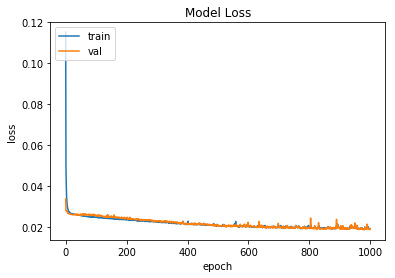

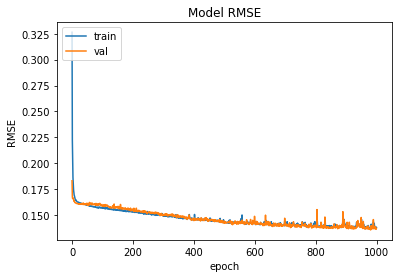

In [54]:
#2 hidden layers, one with 40 units and one with 30 units
click_SRNN_model11= click_stacked_stateful_SRNN2(units_1=40, units_2=30, lr=0.001, batch=133, alpha=0.01, dropout=0.1)
click_SRNN_model11.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model11, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts11.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

With the decrease in units in the second layer, the instantantaneous increase in the validtaion loss is removed. Thus, the loss curve of this model shows bette performance.

In [55]:
click_pred_train=click_SRNN_model11.predict(X_click_train, batch_size=133)
click_SRNN_model11.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model11.predict(X_click_val, batch_size=133)
click_SRNN_model11.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model11.predict(X_click_test, batch_size=133)
click_SRNN_model11.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  172.67606130174815
YRMSE train:  104.7343351872624
XRMSE val:  174.36595772390217
YRMSE val:  106.70317179312535
XRMSE test:  183.9483506331272
YRMSE test:  108.28706216872446


In [ ]:
#stacked stateful simple RNN for 10 iterations (40 and 30 units in the hidde layer)
timesteps=18
sample_size=10
X_RMSE=[]
Y_RMSE=[]

for i in range(sample_size):
    print('Experimental Run: ', i)
    model= click_stacked_stateful_SRNN2(units_1=40, units_2=30, lr=0.001, batch=133, alpha=0.01, dropout=0.1)
    
    for j in range(1000):
        model.fit(X_click_train, Y_click_train, validation_data=(X_click_val, Y_click_val), epochs=1, batch_size=133, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_click_pred = model.predict(X_click_test, batch_size=133)
    model.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_click_pred, Y_click_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)
    print(X_RMSE)
    print(Y_RMSE)
    
print('Iterations Completed')    
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE))+ '\n')

#Results of the above block

Experimental Run:  0
Model created and compiled
[182.13876154923508]
[107.87812158660033]
Experimental Run:  1
Model created and compiled
[182.13876154923508, 178.79450268136355]
[107.87812158660033, 100.97046054757533]
Experimental Run:  2
Model created and compiled
[182.13876154923508, 178.79450268136355, 179.21912182460403]
[107.87812158660033, 100.97046054757533, 104.19310908493513]
Experimental Run:  3
Model created and compiled
[182.13876154923508, 178.79450268136355, 179.21912182460403, 172.56778603900003]
[107.87812158660033, 100.97046054757533, 104.19310908493513, 100.77190922104002]
Experimental Run:  4
Model created and compiled
[182.13876154923508, 178.79450268136355, 179.21912182460403, 172.56778603900003, 173.6459810671391]
[107.87812158660033, 100.97046054757533, 104.19310908493513, 100.77190922104002, 102.75453030854031]
Experimental Run:  5
Model created and compiled
[182.13876154923508, 178.79450268136355, 179.21912182460403, 172.56778603900003, 173.6459810671391, 181.18150045575248]
[107.87812158660033, 100.97046054757533, 104.19310908493513, 100.77190922104002, 102.75453030854031, 102.24777706708207]
Experimental Run:  6
Model created and compiled
[182.13876154923508, 178.79450268136355, 179.21912182460403, 172.56778603900003, 173.6459810671391, 181.18150045575248, 177.75340607666843]
[107.87812158660033, 100.97046054757533, 104.19310908493513, 100.77190922104002, 102.75453030854031, 102.24777706708207, 99.99304819450424]
Experimental Run:  7
Model created and compiled
[182.13876154923508, 178.79450268136355, 179.21912182460403, 172.56778603900003, 173.6459810671391, 181.18150045575248, 177.75340607666843, 177.90001774514556]
[107.87812158660033, 100.97046054757533, 104.19310908493513, 100.77190922104002, 102.75453030854031, 102.24777706708207, 99.99304819450424, 99.9468952081335]
Experimental Run:  8
Model created and compiled
[182.13876154923508, 178.79450268136355, 179.21912182460403, 172.56778603900003, 173.6459810671391, 181.18150045575248, 177.75340607666843, 177.90001774514556, 177.1458489670349]
[107.87812158660033, 100.97046054757533, 104.19310908493513, 100.77190922104002, 102.75453030854031, 102.24777706708207, 99.99304819450424, 99.9468952081335, 102.30804464855638]
Experimental Run:  9
Model created and compiled
[182.13876154923508, 178.79450268136355, 179.21912182460403, 172.56778603900003, 173.6459810671391, 181.18150045575248, 177.75340607666843, 177.90001774514556, 177.1458489670349, 184.52260027503488]
[107.87812158660033, 100.97046054757533, 104.19310908493513, 100.77190922104002, 102.75453030854031, 102.24777706708207, 99.99304819450424, 99.9468952081335, 102.30804464855638, 102.40782466543624]
Iterations Completed
X-coord RMSE Mean: 178.48695266809779

Y-coord RMSE Mean: 102.34717205324036

In [30]:
#Final results after 10 iterations
print('Mean XRMSE: ', np.round(178.48695266809779, 3))
print('Mean YRMSE: ', np.round(102.34717205324036, 3))

Mean XRMSE:  178.487
Mean YRMSE:  102.347


In [22]:
#3 hiden layers
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#SimpleRNN with m/m between batches
def click_stacked_stateful_SRNN3(units_1, units_2, lr, batch, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units_1, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout))
    model.add(SimpleRNN(units_2, return_sequences=True, stateful=True, recurrent_dropout=dropout))
    model.add(SimpleRNN(units_2, return_sequences=False, stateful=True, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_4 (SimpleRNN)     (133, 18, 40)             1720      
_________________________________________________________________
simple_rnn_5 (SimpleRNN)     (133, 18, 30)             2130      
_________________________________________________________________
simple_rnn_6 (SimpleRNN)     (133, 30)                 1830      
_________________________________________________________________
dense_2 (Dense)              (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (133, 2)                  0         
Total params: 5,742
Trainable params: 5,742
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Instructions for updating:
Use tf.cast instead.
Train on 9177 samples, validate on 3059 samples


 - 3s - loss: 0.0269 - rmse: 0.1636 - val_loss: 0.0254 - val_rmse: 0.1590

Epoch 00001: val_loss improved from 0.02549 to 0.02542, saving model to click_SRNN_wts12.hdf5
Epoch Number:  31
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0268 - rmse: 0.1634 - val_loss: 0.0254 - val_rmse: 0.1589

Epoch 00001: val_loss improved from 0.02542 to 0.02539, saving model to click_SRNN_wts12.hdf5
Epoch Number:  32
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0267 - rmse: 0.1631 - val_loss: 0.0254 - val_rmse: 0.1589

Epoch 00001: val_loss improved from 0.02539 to 0.02538, saving model to click_SRNN_wts12.hdf5
Epoch Number:  33
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0267 - rmse: 0.1630 - val_loss: 0.0253 - val_rmse: 0.1587

Epoch 00001: val_loss improved from 0.02538 to 0.02533, saving model to click_SRNN_wts12.hdf5
Epoch Number:  34
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0267

 - 3s - loss: 0.0254 - rmse: 0.1591 - val_loss: 0.0246 - val_rmse: 0.1563

Epoch 00001: val_loss did not improve from 0.02435
Epoch Number:  68
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0256 - rmse: 0.1595 - val_loss: 0.0244 - val_rmse: 0.1558

Epoch 00001: val_loss did not improve from 0.02435
Epoch Number:  69
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0254 - rmse: 0.1590 - val_loss: 0.0245 - val_rmse: 0.1560

Epoch 00001: val_loss did not improve from 0.02435
Epoch Number:  70
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0254 - rmse: 0.1589 - val_loss: 0.0244 - val_rmse: 0.1558

Epoch 00001: val_loss did not improve from 0.02435
Epoch Number:  71
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0252 - rmse: 0.1585 - val_loss: 0.0243 - val_rmse: 0.1555

Epoch 00001: val_loss improved from 0.02435 to 0.02431, saving model to click_SRNN_wts12.hdf5
Epoch Number:  72
Train


Epoch 00001: val_loss improved from 0.02379 to 0.02378, saving model to click_SRNN_wts12.hdf5
Epoch Number:  107
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0243 - rmse: 0.1555 - val_loss: 0.0237 - val_rmse: 0.1536

Epoch 00001: val_loss improved from 0.02378 to 0.02369, saving model to click_SRNN_wts12.hdf5
Epoch Number:  108
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0243 - rmse: 0.1556 - val_loss: 0.0239 - val_rmse: 0.1542

Epoch 00001: val_loss did not improve from 0.02369
Epoch Number:  109
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0243 - rmse: 0.1554 - val_loss: 0.0239 - val_rmse: 0.1544

Epoch 00001: val_loss did not improve from 0.02369
Epoch Number:  110
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0243 - rmse: 0.1554 - val_loss: 0.0240 - val_rmse: 0.1546

Epoch 00001: val_loss did not improve from 0.02369
Epoch Number:  111
Train on 9177 samples, validate

 - 3s - loss: 0.0235 - rmse: 0.1529 - val_loss: 0.0234 - val_rmse: 0.1528

Epoch 00001: val_loss did not improve from 0.02318
Epoch Number:  146
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0237 - rmse: 0.1537 - val_loss: 0.0239 - val_rmse: 0.1541

Epoch 00001: val_loss did not improve from 0.02318
Epoch Number:  147
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0239 - rmse: 0.1541 - val_loss: 0.0235 - val_rmse: 0.1528

Epoch 00001: val_loss did not improve from 0.02318
Epoch Number:  148
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0234 - rmse: 0.1525 - val_loss: 0.0238 - val_rmse: 0.1540

Epoch 00001: val_loss did not improve from 0.02318
Epoch Number:  149
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0235 - rmse: 0.1529 - val_loss: 0.0234 - val_rmse: 0.1527

Epoch 00001: val_loss did not improve from 0.02318
Epoch Number:  150
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0227 - rmse: 0.1505 - val_loss: 0.0228 - val_rmse: 0.1508

Epoch 00001: val_loss did not improve from 0.02270
Epoch Number:  185
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0228 - rmse: 0.1505 - val_loss: 0.0229 - val_rmse: 0.1510

Epoch 00001: val_loss did not improve from 0.02270
Epoch Number:  186
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0228 - rmse: 0.1506 - val_loss: 0.0227 - val_rmse: 0.1503

Epoch 00001: val_loss improved from 0.02270 to 0.02269, saving model to click_SRNN_wts12.hdf5
Epoch Number:  187
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0229 - rmse: 0.1509 - val_loss: 0.0228 - val_rmse: 0.1506

Epoch 00001: val_loss did not improve from 0.02269
Epoch Number:  188
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0227 - rmse: 0.1504 - val_loss: 0.0226 - val_rmse: 0.1501

Epoch 00001: val_loss improved from 0.02269 to 0.02264, saving model t

 - 3s - loss: 0.0223 - rmse: 0.1489 - val_loss: 0.0225 - val_rmse: 0.1498

Epoch 00001: val_loss did not improve from 0.02207
Epoch Number:  224
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0224 - rmse: 0.1494 - val_loss: 0.0224 - val_rmse: 0.1493

Epoch 00001: val_loss did not improve from 0.02207
Epoch Number:  225
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0223 - rmse: 0.1488 - val_loss: 0.0225 - val_rmse: 0.1496

Epoch 00001: val_loss did not improve from 0.02207
Epoch Number:  226
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0222 - rmse: 0.1487 - val_loss: 0.0222 - val_rmse: 0.1487

Epoch 00001: val_loss did not improve from 0.02207
Epoch Number:  227
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0222 - rmse: 0.1488 - val_loss: 0.0220 - val_rmse: 0.1480

Epoch 00001: val_loss improved from 0.02207 to 0.02201, saving model to click_SRNN_wts12.hdf5
Epoch Number:  228



Epoch 00001: val_loss did not improve from 0.02163
Epoch Number:  263
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0219 - rmse: 0.1475 - val_loss: 0.0219 - val_rmse: 0.1478

Epoch 00001: val_loss did not improve from 0.02163
Epoch Number:  264
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0218 - rmse: 0.1474 - val_loss: 0.0217 - val_rmse: 0.1472

Epoch 00001: val_loss did not improve from 0.02163
Epoch Number:  265
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0218 - rmse: 0.1472 - val_loss: 0.0215 - val_rmse: 0.1463

Epoch 00001: val_loss improved from 0.02163 to 0.02150, saving model to click_SRNN_wts12.hdf5
Epoch Number:  266
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0217 - rmse: 0.1471 - val_loss: 0.0216 - val_rmse: 0.1468

Epoch 00001: val_loss did not improve from 0.02150
Epoch Number:  267
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.

 - 3s - loss: 0.0216 - rmse: 0.1467 - val_loss: 0.0214 - val_rmse: 0.1459

Epoch 00001: val_loss did not improve from 0.02114
Epoch Number:  302
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0213 - val_rmse: 0.1455

Epoch 00001: val_loss did not improve from 0.02114
Epoch Number:  303
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1454 - val_loss: 0.0209 - val_rmse: 0.1444

Epoch 00001: val_loss improved from 0.02114 to 0.02092, saving model to click_SRNN_wts12.hdf5
Epoch Number:  304
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0237 - rmse: 0.1536 - val_loss: 0.0222 - val_rmse: 0.1487

Epoch 00001: val_loss did not improve from 0.02092
Epoch Number:  305
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0220 - rmse: 0.1479 - val_loss: 0.0213 - val_rmse: 0.1457

Epoch 00001: val_loss did not improve from 0.02092
Epoch Number:  306


 - 3s - loss: 0.0211 - rmse: 0.1451 - val_loss: 0.0206 - val_rmse: 0.1431

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  341
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0214 - rmse: 0.1458 - val_loss: 0.0207 - val_rmse: 0.1434

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  342
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0207 - rmse: 0.1435 - val_loss: 0.0206 - val_rmse: 0.1433

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  343
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0211 - rmse: 0.1451 - val_loss: 0.0207 - val_rmse: 0.1436

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  344
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0207 - rmse: 0.1435 - val_loss: 0.0207 - val_rmse: 0.1434

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  345
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0211 - rmse: 0.1451 - val_loss: 0.0212 - val_rmse: 0.1451

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  381
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0207 - rmse: 0.1436 - val_loss: 0.0205 - val_rmse: 0.1428

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  382
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0204 - rmse: 0.1425 - val_loss: 0.0202 - val_rmse: 0.1418

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  383
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0206 - rmse: 0.1432 - val_loss: 0.0203 - val_rmse: 0.1421

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  384
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0206 - rmse: 0.1432 - val_loss: 0.0199 - val_rmse: 0.1408

Epoch 00001: val_loss improved from 0.02001 to 0.01991, saving model to click_SRNN_wts12.hdf5
Epoch Number:  385


 - 3s - loss: 0.0203 - rmse: 0.1421 - val_loss: 0.0199 - val_rmse: 0.1407

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  421
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0202 - rmse: 0.1417 - val_loss: 0.0197 - val_rmse: 0.1401

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  422
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0201 - rmse: 0.1415 - val_loss: 0.0197 - val_rmse: 0.1402

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  423
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0200 - rmse: 0.1409 - val_loss: 0.0196 - val_rmse: 0.1398

Epoch 00001: val_loss improved from 0.01969 to 0.01963, saving model to click_SRNN_wts12.hdf5
Epoch Number:  424
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0202 - rmse: 0.1417 - val_loss: 0.0202 - val_rmse: 0.1420

Epoch 00001: val_loss did not improve from 0.01963
Epoch Number:  425


 - 3s - loss: 0.0202 - rmse: 0.1420 - val_loss: 0.0200 - val_rmse: 0.1409

Epoch 00001: val_loss did not improve from 0.01932
Epoch Number:  461
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0198 - rmse: 0.1404 - val_loss: 0.0195 - val_rmse: 0.1394

Epoch 00001: val_loss did not improve from 0.01932
Epoch Number:  462
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0196 - rmse: 0.1396 - val_loss: 0.0194 - val_rmse: 0.1391

Epoch 00001: val_loss did not improve from 0.01932
Epoch Number:  463
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0201 - rmse: 0.1414 - val_loss: 0.0200 - val_rmse: 0.1411

Epoch 00001: val_loss did not improve from 0.01932
Epoch Number:  464
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0199 - rmse: 0.1407 - val_loss: 0.0197 - val_rmse: 0.1399

Epoch 00001: val_loss did not improve from 0.01932
Epoch Number:  465
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0196 - rmse: 0.1396 - val_loss: 0.0195 - val_rmse: 0.1392

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  501
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0206 - rmse: 0.1430 - val_loss: 0.0198 - val_rmse: 0.1404

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  502
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0195 - rmse: 0.1395 - val_loss: 0.0193 - val_rmse: 0.1385

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  503
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0225 - rmse: 0.1485 - val_loss: 0.0266 - val_rmse: 0.1629

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  504
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0230 - rmse: 0.1512 - val_loss: 0.0212 - val_rmse: 0.1450

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  505
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0192 - rmse: 0.1381 - val_loss: 0.0192 - val_rmse: 0.1382

Epoch 00001: val_loss did not improve from 0.01872
Epoch Number:  541
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0191 - rmse: 0.1380 - val_loss: 0.0192 - val_rmse: 0.1381

Epoch 00001: val_loss did not improve from 0.01872
Epoch Number:  542
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0193 - rmse: 0.1387 - val_loss: 0.0192 - val_rmse: 0.1381

Epoch 00001: val_loss did not improve from 0.01872
Epoch Number:  543
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1381 - val_loss: 0.0191 - val_rmse: 0.1379

Epoch 00001: val_loss did not improve from 0.01872
Epoch Number:  544
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0193 - rmse: 0.1387 - val_loss: 0.0188 - val_rmse: 0.1370

Epoch 00001: val_loss did not improve from 0.01872
Epoch Number:  545
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0198 - rmse: 0.1402 - val_loss: 0.0203 - val_rmse: 0.1422

Epoch 00001: val_loss did not improve from 0.01845
Epoch Number:  581
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0201 - rmse: 0.1413 - val_loss: 0.0187 - val_rmse: 0.1364

Epoch 00001: val_loss did not improve from 0.01845
Epoch Number:  582
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0188 - rmse: 0.1370 - val_loss: 0.0189 - val_rmse: 0.1371

Epoch 00001: val_loss did not improve from 0.01845
Epoch Number:  583
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0187 - rmse: 0.1365 - val_loss: 0.0186 - val_rmse: 0.1360

Epoch 00001: val_loss did not improve from 0.01845
Epoch Number:  584
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0190 - rmse: 0.1375 - val_loss: 0.0194 - val_rmse: 0.1389

Epoch 00001: val_loss did not improve from 0.01845
Epoch Number:  585
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  621
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1455 - val_loss: 0.0207 - val_rmse: 0.1434

Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  622
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0211 - rmse: 0.1448 - val_loss: 0.0203 - val_rmse: 0.1422

Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  623
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0211 - rmse: 0.1448 - val_loss: 0.0208 - val_rmse: 0.1438

Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  624
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0207 - val_rmse: 0.1435

Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  625
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0210 - rmse: 0.1444 - val_loss: 0.0202 - va

 - 3s - loss: 0.0187 - rmse: 0.1365 - val_loss: 0.0190 - val_rmse: 0.1375

Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  662
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0186 - rmse: 0.1361 - val_loss: 0.0181 - val_rmse: 0.1341

Epoch 00001: val_loss improved from 0.01818 to 0.01809, saving model to click_SRNN_wts12.hdf5
Epoch Number:  663
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1452 - val_loss: 0.0227 - val_rmse: 0.1502

Epoch 00001: val_loss did not improve from 0.01809
Epoch Number:  664
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0209 - rmse: 0.1444 - val_loss: 0.0185 - val_rmse: 0.1356

Epoch 00001: val_loss did not improve from 0.01809
Epoch Number:  665
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0193 - rmse: 0.1386 - val_loss: 0.0187 - val_rmse: 0.1364

Epoch 00001: val_loss did not improve from 0.01809
Epoch Number:  666



Epoch 00001: val_loss did not improve from 0.01754
Epoch Number:  701
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0183 - rmse: 0.1350 - val_loss: 0.0184 - val_rmse: 0.1351

Epoch 00001: val_loss did not improve from 0.01754
Epoch Number:  702
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1343 - val_loss: 0.0179 - val_rmse: 0.1335

Epoch 00001: val_loss did not improve from 0.01754
Epoch Number:  703
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1343 - val_loss: 0.0179 - val_rmse: 0.1334

Epoch 00001: val_loss did not improve from 0.01754
Epoch Number:  704
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0179 - rmse: 0.1335 - val_loss: 0.0179 - val_rmse: 0.1335

Epoch 00001: val_loss did not improve from 0.01754
Epoch Number:  705
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1343 - val_loss: 0.0178 - va

 - 3s - loss: 0.0205 - rmse: 0.1427 - val_loss: 0.0193 - val_rmse: 0.1385

Epoch 00001: val_loss did not improve from 0.01748
Epoch Number:  742
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1383 - val_loss: 0.0186 - val_rmse: 0.1359

Epoch 00001: val_loss did not improve from 0.01748
Epoch Number:  743
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0190 - rmse: 0.1374 - val_loss: 0.0186 - val_rmse: 0.1359

Epoch 00001: val_loss did not improve from 0.01748
Epoch Number:  744
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0187 - rmse: 0.1364 - val_loss: 0.0181 - val_rmse: 0.1342

Epoch 00001: val_loss did not improve from 0.01748
Epoch Number:  745
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0186 - rmse: 0.1360 - val_loss: 0.0181 - val_rmse: 0.1341

Epoch 00001: val_loss did not improve from 0.01748
Epoch Number:  746
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0191 - rmse: 0.1378 - val_loss: 0.0186 - val_rmse: 0.1359

Epoch 00001: val_loss did not improve from 0.01738
Epoch Number:  782
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0185 - rmse: 0.1358 - val_loss: 0.0180 - val_rmse: 0.1338

Epoch 00001: val_loss did not improve from 0.01738
Epoch Number:  783
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0182 - rmse: 0.1348 - val_loss: 0.0180 - val_rmse: 0.1338

Epoch 00001: val_loss did not improve from 0.01738
Epoch Number:  784
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0180 - rmse: 0.1340 - val_loss: 0.0176 - val_rmse: 0.1323

Epoch 00001: val_loss did not improve from 0.01738
Epoch Number:  785
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1341 - val_loss: 0.0182 - val_rmse: 0.1345

Epoch 00001: val_loss did not improve from 0.01738
Epoch Number:  786
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0179 - rmse: 0.1336 - val_loss: 0.0175 - val_rmse: 0.1319

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  822
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1344 - val_loss: 0.0180 - val_rmse: 0.1340

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  823
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0179 - rmse: 0.1335 - val_loss: 0.0172 - val_rmse: 0.1308

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  824
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0189 - rmse: 0.1371 - val_loss: 0.0181 - val_rmse: 0.1342

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  825
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0178 - rmse: 0.1332 - val_loss: 0.0171 - val_rmse: 0.1303

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  826
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  862
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0186 - rmse: 0.1360 - val_loss: 0.0194 - val_rmse: 0.1388

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  863
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0188 - rmse: 0.1367 - val_loss: 0.0178 - val_rmse: 0.1332

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  864
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0182 - rmse: 0.1346 - val_loss: 0.0175 - val_rmse: 0.1318

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  865
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1342 - val_loss: 0.0178 - val_rmse: 0.1330

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  866
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0179 - rmse: 0.1336 - val_loss: 0.0172 - va

 - 3s - loss: 0.0202 - rmse: 0.1420 - val_loss: 0.0194 - val_rmse: 0.1391

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  903
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0214 - rmse: 0.1458 - val_loss: 0.0198 - val_rmse: 0.1402

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  904
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0204 - rmse: 0.1424 - val_loss: 0.0192 - val_rmse: 0.1381

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  905
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0204 - rmse: 0.1424 - val_loss: 0.0197 - val_rmse: 0.1401

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  906
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0200 - rmse: 0.1411 - val_loss: 0.0191 - val_rmse: 0.1379

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  907
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  943
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1385 - val_loss: 0.0189 - val_rmse: 0.1372

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  944
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0193 - rmse: 0.1385 - val_loss: 0.0184 - val_rmse: 0.1353

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  945
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0186 - rmse: 0.1362 - val_loss: 0.0183 - val_rmse: 0.1350

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  946
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0184 - rmse: 0.1354 - val_loss: 0.0183 - val_rmse: 0.1349

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  947
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0183 - rmse: 0.1350 - val_loss: 0.0181 - va

 - 3s - loss: 0.0191 - rmse: 0.1378 - val_loss: 0.0189 - val_rmse: 0.1374

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  984
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0190 - rmse: 0.1376 - val_loss: 0.0185 - val_rmse: 0.1357

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  985
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0187 - rmse: 0.1363 - val_loss: 0.0183 - val_rmse: 0.1349

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  986
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0187 - rmse: 0.1364 - val_loss: 0.0182 - val_rmse: 0.1346

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  987
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0185 - rmse: 0.1359 - val_loss: 0.0185 - val_rmse: 0.1356

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  988
Train on 9177 samples, validate on 3059 sam

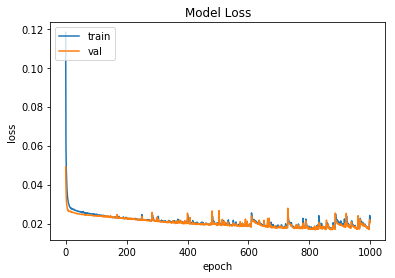

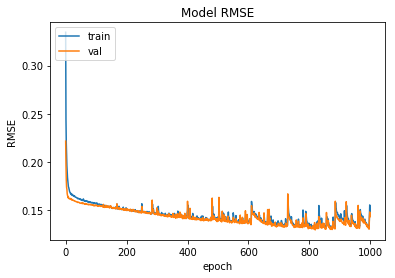

In [26]:
#3 hidden layers, one with 40 units and two with 30 units
click_SRNN_model12= click_stacked_stateful_SRNN3(units_1=40, units_2=30, lr=0.001, batch=133, alpha=0.01, dropout=0.1)
click_SRNN_model12.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model12, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts12.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [27]:
click_pred_train=click_SRNN_model12.predict(X_click_train, batch_size=133)
click_SRNN_model12.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model12.predict(X_click_val, batch_size=133)
click_SRNN_model12.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model12.predict(X_click_test, batch_size=133)
click_SRNN_model12.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  185.56402523228252
YRMSE train:  107.45839208227771
XRMSE val:  184.06100262572545
YRMSE val:  108.85744763942283
XRMSE test:  189.52592961889252
YRMSE test:  110.5945942017978


In [27]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#SimpleRNN with m/m between batches
def click_stacked_stateful_SRNN5(units_1, units_2, lr, batch, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units_1, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout))
    model.add(SimpleRNN(units_1, return_sequences=True, stateful=True, recurrent_dropout=dropout))
    model.add(SimpleRNN(units_2, return_sequences=False, stateful=True, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_1 (SimpleRNN)     (133, 18, 40)             1720      
_________________________________________________________________
simple_rnn_2 (SimpleRNN)     (133, 18, 40)             3240      
_________________________________________________________________
simple_rnn_3 (SimpleRNN)     (133, 30)                 2130      
_________________________________________________________________
dense_1 (Dense)              (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (133, 2)                  0         
Total params: 7,152
Trainable params: 7,152
Non-trainable pa

 - 3s - loss: 0.0259 - rmse: 0.1607 - val_loss: 0.0254 - val_rmse: 0.1589

Epoch 00001: val_loss did not improve from 0.02525
Epoch Number:  28
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0260 - rmse: 0.1608 - val_loss: 0.0256 - val_rmse: 0.1596

Epoch 00001: val_loss did not improve from 0.02525
Epoch Number:  29
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0259 - rmse: 0.1607 - val_loss: 0.0254 - val_rmse: 0.1590

Epoch 00001: val_loss did not improve from 0.02525
Epoch Number:  30
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0260 - rmse: 0.1608 - val_loss: 0.0252 - val_rmse: 0.1581

Epoch 00001: val_loss improved from 0.02525 to 0.02515, saving model to click_SRNN_wts14.hdf5
Epoch Number:  31
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0257 - rmse: 0.1599 - val_loss: 0.0256 - val_rmse: 0.1595

Epoch 00001: val_loss did not improve from 0.02515
Epoch Number:  32
Train

 - 3s - loss: 0.0243 - rmse: 0.1556 - val_loss: 0.0243 - val_rmse: 0.1554

Epoch 00001: val_loss did not improve from 0.02399
Epoch Number:  67
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0241 - rmse: 0.1549 - val_loss: 0.0244 - val_rmse: 0.1556

Epoch 00001: val_loss did not improve from 0.02399
Epoch Number:  68
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0242 - rmse: 0.1551 - val_loss: 0.0236 - val_rmse: 0.1532

Epoch 00001: val_loss improved from 0.02399 to 0.02361, saving model to click_SRNN_wts14.hdf5
Epoch Number:  69
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0243 - rmse: 0.1556 - val_loss: 0.0242 - val_rmse: 0.1550

Epoch 00001: val_loss did not improve from 0.02361
Epoch Number:  70
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0242 - rmse: 0.1551 - val_loss: 0.0240 - val_rmse: 0.1544

Epoch 00001: val_loss did not improve from 0.02361
Epoch Number:  71
Train


Epoch 00001: val_loss did not improve from 0.02331
Epoch Number:  106
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0236 - rmse: 0.1533 - val_loss: 0.0236 - val_rmse: 0.1530

Epoch 00001: val_loss did not improve from 0.02331
Epoch Number:  107
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0233 - rmse: 0.1525 - val_loss: 0.0233 - val_rmse: 0.1521

Epoch 00001: val_loss improved from 0.02331 to 0.02327, saving model to click_SRNN_wts14.hdf5
Epoch Number:  108
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0233 - rmse: 0.1524 - val_loss: 0.0236 - val_rmse: 0.1530

Epoch 00001: val_loss did not improve from 0.02327
Epoch Number:  109
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0233 - rmse: 0.1524 - val_loss: 0.0237 - val_rmse: 0.1537

Epoch 00001: val_loss did not improve from 0.02327
Epoch Number:  110
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.


Epoch 00001: val_loss improved from 0.02281 to 0.02275, saving model to click_SRNN_wts14.hdf5
Epoch Number:  145
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0227 - rmse: 0.1501 - val_loss: 0.0226 - val_rmse: 0.1499

Epoch 00001: val_loss improved from 0.02275 to 0.02261, saving model to click_SRNN_wts14.hdf5
Epoch Number:  146
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0224 - rmse: 0.1495 - val_loss: 0.0231 - val_rmse: 0.1516

Epoch 00001: val_loss did not improve from 0.02261
Epoch Number:  147
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0225 - rmse: 0.1498 - val_loss: 0.0227 - val_rmse: 0.1502

Epoch 00001: val_loss did not improve from 0.02261
Epoch Number:  148
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0226 - rmse: 0.1501 - val_loss: 0.0231 - val_rmse: 0.1515

Epoch 00001: val_loss did not improve from 0.02261
Epoch Number:  149
Train on 9177 samples, validate

 - 3s - loss: 0.0221 - rmse: 0.1484 - val_loss: 0.0222 - val_rmse: 0.1484

Epoch 00001: val_loss did not improve from 0.02206
Epoch Number:  184
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0224 - rmse: 0.1491 - val_loss: 0.0238 - val_rmse: 0.1538

Epoch 00001: val_loss did not improve from 0.02206
Epoch Number:  185
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0224 - rmse: 0.1494 - val_loss: 0.0221 - val_rmse: 0.1483

Epoch 00001: val_loss did not improve from 0.02206
Epoch Number:  186
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0219 - rmse: 0.1476 - val_loss: 0.0220 - val_rmse: 0.1478

Epoch 00001: val_loss improved from 0.02206 to 0.02200, saving model to click_SRNN_wts14.hdf5
Epoch Number:  187
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0223 - rmse: 0.1492 - val_loss: 0.0223 - val_rmse: 0.1488

Epoch 00001: val_loss did not improve from 0.02200
Epoch Number:  188



Epoch 00001: val_loss did not improve from 0.02142
Epoch Number:  223
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0214 - rmse: 0.1459 - val_loss: 0.0214 - val_rmse: 0.1460

Epoch 00001: val_loss did not improve from 0.02142
Epoch Number:  224
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1455 - val_loss: 0.0215 - val_rmse: 0.1462

Epoch 00001: val_loss did not improve from 0.02142
Epoch Number:  225
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0219 - val_rmse: 0.1476

Epoch 00001: val_loss did not improve from 0.02142
Epoch Number:  226
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0216 - rmse: 0.1468 - val_loss: 0.0216 - val_rmse: 0.1466

Epoch 00001: val_loss did not improve from 0.02142
Epoch Number:  227
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1452 - val_loss: 0.0212 - va


Epoch 00001: val_loss did not improve from 0.02091
Epoch Number:  263
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1456 - val_loss: 0.0214 - val_rmse: 0.1457

Epoch 00001: val_loss did not improve from 0.02091
Epoch Number:  264
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1454 - val_loss: 0.0217 - val_rmse: 0.1469

Epoch 00001: val_loss did not improve from 0.02091
Epoch Number:  265
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0209 - rmse: 0.1444 - val_loss: 0.0212 - val_rmse: 0.1451

Epoch 00001: val_loss did not improve from 0.02091
Epoch Number:  266
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0210 - rmse: 0.1448 - val_loss: 0.0208 - val_rmse: 0.1439

Epoch 00001: val_loss improved from 0.02091 to 0.02085, saving model to click_SRNN_wts14.hdf5
Epoch Number:  267
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.


Epoch 00001: val_loss did not improve from 0.02031
Epoch Number:  302
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0210 - val_rmse: 0.1444

Epoch 00001: val_loss did not improve from 0.02031
Epoch Number:  303
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1455 - val_loss: 0.0210 - val_rmse: 0.1445

Epoch 00001: val_loss did not improve from 0.02031
Epoch Number:  304
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0210 - rmse: 0.1448 - val_loss: 0.0209 - val_rmse: 0.1443

Epoch 00001: val_loss did not improve from 0.02031
Epoch Number:  305
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0210 - rmse: 0.1446 - val_loss: 0.0211 - val_rmse: 0.1448

Epoch 00001: val_loss did not improve from 0.02031
Epoch Number:  306
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0210 - rmse: 0.1445 - val_loss: 0.0209 - va

 - 5s - loss: 0.0237 - rmse: 0.1533 - val_loss: 0.0234 - val_rmse: 0.1524

Epoch 00001: val_loss did not improve from 0.01995
Epoch Number:  342
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0229 - rmse: 0.1511 - val_loss: 0.0222 - val_rmse: 0.1485

Epoch 00001: val_loss did not improve from 0.01995
Epoch Number:  343
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0221 - rmse: 0.1483 - val_loss: 0.0218 - val_rmse: 0.1473

Epoch 00001: val_loss did not improve from 0.01995
Epoch Number:  344
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0216 - rmse: 0.1467 - val_loss: 0.0213 - val_rmse: 0.1456

Epoch 00001: val_loss did not improve from 0.01995
Epoch Number:  345
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1453 - val_loss: 0.0210 - val_rmse: 0.1444

Epoch 00001: val_loss did not improve from 0.01995
Epoch Number:  346
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0227 - rmse: 0.1503 - val_loss: 0.0221 - val_rmse: 0.1481

Epoch 00001: val_loss did not improve from 0.01966
Epoch Number:  382
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0220 - rmse: 0.1481 - val_loss: 0.0212 - val_rmse: 0.1451

Epoch 00001: val_loss did not improve from 0.01966
Epoch Number:  383
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0214 - rmse: 0.1458 - val_loss: 0.0210 - val_rmse: 0.1444

Epoch 00001: val_loss did not improve from 0.01966
Epoch Number:  384
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0211 - rmse: 0.1450 - val_loss: 0.0209 - val_rmse: 0.1441

Epoch 00001: val_loss did not improve from 0.01966
Epoch Number:  385
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0210 - rmse: 0.1446 - val_loss: 0.0205 - val_rmse: 0.1428

Epoch 00001: val_loss did not improve from 0.01966
Epoch Number:  386
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0197 - rmse: 0.1400 - val_loss: 0.0195 - val_rmse: 0.1393

Epoch 00001: val_loss did not improve from 0.01927
Epoch Number:  422
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0197 - rmse: 0.1401 - val_loss: 0.0199 - val_rmse: 0.1405

Epoch 00001: val_loss did not improve from 0.01927
Epoch Number:  423
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0196 - rmse: 0.1395 - val_loss: 0.0197 - val_rmse: 0.1399

Epoch 00001: val_loss did not improve from 0.01927
Epoch Number:  424
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0201 - rmse: 0.1416 - val_loss: 0.0197 - val_rmse: 0.1399

Epoch 00001: val_loss did not improve from 0.01927
Epoch Number:  425
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0195 - rmse: 0.1392 - val_loss: 0.0200 - val_rmse: 0.1409

Epoch 00001: val_loss did not improve from 0.01927
Epoch Number:  426
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0220 - rmse: 0.1479 - val_loss: 0.0220 - val_rmse: 0.1479

Epoch 00001: val_loss did not improve from 0.01899
Epoch Number:  462
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0210 - val_rmse: 0.1444

Epoch 00001: val_loss did not improve from 0.01899
Epoch Number:  463
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0209 - rmse: 0.1444 - val_loss: 0.0208 - val_rmse: 0.1438

Epoch 00001: val_loss did not improve from 0.01899
Epoch Number:  464
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0207 - rmse: 0.1435 - val_loss: 0.0207 - val_rmse: 0.1434

Epoch 00001: val_loss did not improve from 0.01899
Epoch Number:  465
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0200 - rmse: 0.1412 - val_loss: 0.0196 - val_rmse: 0.1395

Epoch 00001: val_loss did not improve from 0.01899
Epoch Number:  466
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  502
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1384 - val_loss: 0.0190 - val_rmse: 0.1376

Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  503
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0191 - rmse: 0.1378 - val_loss: 0.0187 - val_rmse: 0.1364

Epoch 00001: val_loss improved from 0.01885 to 0.01873, saving model to click_SRNN_wts14.hdf5
Epoch Number:  504
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1382 - val_loss: 0.0192 - val_rmse: 0.1380

Epoch 00001: val_loss did not improve from 0.01873
Epoch Number:  505
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0187 - rmse: 0.1365 - val_loss: 0.0188 - val_rmse: 0.1368

Epoch 00001: val_loss did not improve from 0.01873
Epoch Number:  506
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.


Epoch 00001: val_loss did not improve from 0.01868
Epoch Number:  542
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0199 - rmse: 0.1406 - val_loss: 0.0218 - val_rmse: 0.1471

Epoch 00001: val_loss did not improve from 0.01868
Epoch Number:  543
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0199 - rmse: 0.1409 - val_loss: 0.0195 - val_rmse: 0.1394

Epoch 00001: val_loss did not improve from 0.01868
Epoch Number:  544
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0195 - rmse: 0.1394 - val_loss: 0.0194 - val_rmse: 0.1388

Epoch 00001: val_loss did not improve from 0.01868
Epoch Number:  545
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1383 - val_loss: 0.0192 - val_rmse: 0.1382

Epoch 00001: val_loss did not improve from 0.01868
Epoch Number:  546
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0198 - rmse: 0.1403 - val_loss: 0.0193 - va

 - 3s - loss: 0.0188 - rmse: 0.1367 - val_loss: 0.0188 - val_rmse: 0.1367

Epoch 00001: val_loss did not improve from 0.01868
Epoch Number:  583
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0188 - rmse: 0.1367 - val_loss: 0.0191 - val_rmse: 0.1378

Epoch 00001: val_loss did not improve from 0.01868
Epoch Number:  584
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0189 - rmse: 0.1372 - val_loss: 0.0194 - val_rmse: 0.1390

Epoch 00001: val_loss did not improve from 0.01868
Epoch Number:  585
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1382 - val_loss: 0.0193 - val_rmse: 0.1386

Epoch 00001: val_loss did not improve from 0.01868
Epoch Number:  586
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0186 - rmse: 0.1362 - val_loss: 0.0189 - val_rmse: 0.1370

Epoch 00001: val_loss did not improve from 0.01868
Epoch Number:  587
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01849
Epoch Number:  623
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1451 - val_loss: 0.0202 - val_rmse: 0.1415

Epoch 00001: val_loss did not improve from 0.01849
Epoch Number:  624
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0199 - rmse: 0.1407 - val_loss: 0.0196 - val_rmse: 0.1396

Epoch 00001: val_loss did not improve from 0.01849
Epoch Number:  625
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0197 - rmse: 0.1401 - val_loss: 0.0195 - val_rmse: 0.1390

Epoch 00001: val_loss did not improve from 0.01849
Epoch Number:  626
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1382 - val_loss: 0.0193 - val_rmse: 0.1385

Epoch 00001: val_loss did not improve from 0.01849
Epoch Number:  627
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0197 - rmse: 0.1402 - val_loss: 0.0193 - va

 - 3s - loss: 0.0224 - rmse: 0.1492 - val_loss: 0.0209 - val_rmse: 0.1442

Epoch 00001: val_loss did not improve from 0.01835
Epoch Number:  664
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0215 - rmse: 0.1462 - val_loss: 0.0203 - val_rmse: 0.1421

Epoch 00001: val_loss did not improve from 0.01835
Epoch Number:  665
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1453 - val_loss: 0.0202 - val_rmse: 0.1418

Epoch 00001: val_loss did not improve from 0.01835
Epoch Number:  666
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0208 - rmse: 0.1439 - val_loss: 0.0200 - val_rmse: 0.1411

Epoch 00001: val_loss did not improve from 0.01835
Epoch Number:  667
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0208 - rmse: 0.1438 - val_loss: 0.0199 - val_rmse: 0.1406

Epoch 00001: val_loss did not improve from 0.01835
Epoch Number:  668
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01835
Epoch Number:  704
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0200 - rmse: 0.1411 - val_loss: 0.0196 - val_rmse: 0.1395

Epoch 00001: val_loss did not improve from 0.01835
Epoch Number:  705
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0191 - rmse: 0.1378 - val_loss: 0.0193 - val_rmse: 0.1384

Epoch 00001: val_loss did not improve from 0.01835
Epoch Number:  706
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0187 - rmse: 0.1366 - val_loss: 0.0192 - val_rmse: 0.1381

Epoch 00001: val_loss did not improve from 0.01835
Epoch Number:  707
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0189 - rmse: 0.1371 - val_loss: 0.0189 - val_rmse: 0.1370

Epoch 00001: val_loss did not improve from 0.01835
Epoch Number:  708
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0185 - rmse: 0.1356 - val_loss: 0.0190 - va

 - 4s - loss: 0.0183 - rmse: 0.1349 - val_loss: 0.0184 - val_rmse: 0.1354

Epoch 00001: val_loss did not improve from 0.01798
Epoch Number:  745
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0182 - rmse: 0.1344 - val_loss: 0.0188 - val_rmse: 0.1367

Epoch 00001: val_loss did not improve from 0.01798
Epoch Number:  746
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0216 - rmse: 0.1465 - val_loss: 0.0195 - val_rmse: 0.1392

Epoch 00001: val_loss did not improve from 0.01798
Epoch Number:  747
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0187 - rmse: 0.1365 - val_loss: 0.0187 - val_rmse: 0.1363

Epoch 00001: val_loss did not improve from 0.01798
Epoch Number:  748
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0183 - rmse: 0.1348 - val_loss: 0.0187 - val_rmse: 0.1364

Epoch 00001: val_loss did not improve from 0.01798
Epoch Number:  749
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01798
Epoch Number:  785
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0190 - rmse: 0.1377 - val_loss: 0.0186 - val_rmse: 0.1360

Epoch 00001: val_loss did not improve from 0.01798
Epoch Number:  786
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0182 - rmse: 0.1347 - val_loss: 0.0183 - val_rmse: 0.1349

Epoch 00001: val_loss did not improve from 0.01798
Epoch Number:  787
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0183 - rmse: 0.1351 - val_loss: 0.0183 - val_rmse: 0.1347

Epoch 00001: val_loss did not improve from 0.01798
Epoch Number:  788
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0186 - rmse: 0.1359 - val_loss: 0.0183 - val_rmse: 0.1349

Epoch 00001: val_loss did not improve from 0.01798
Epoch Number:  789
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0182 - rmse: 0.1347 - val_loss: 0.0182 - va

 - 3s - loss: 0.0176 - rmse: 0.1322 - val_loss: 0.0174 - val_rmse: 0.1315

Epoch 00001: val_loss did not improve from 0.01720
Epoch Number:  825
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0176 - rmse: 0.1324 - val_loss: 0.0184 - val_rmse: 0.1353

Epoch 00001: val_loss did not improve from 0.01720
Epoch Number:  826
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0179 - rmse: 0.1333 - val_loss: 0.0174 - val_rmse: 0.1315

Epoch 00001: val_loss did not improve from 0.01720
Epoch Number:  827
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0176 - rmse: 0.1325 - val_loss: 0.0176 - val_rmse: 0.1322

Epoch 00001: val_loss did not improve from 0.01720
Epoch Number:  828
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0189 - rmse: 0.1370 - val_loss: 0.0186 - val_rmse: 0.1360

Epoch 00001: val_loss did not improve from 0.01720
Epoch Number:  829
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0178 - rmse: 0.1330 - val_loss: 0.0179 - val_rmse: 0.1336

Epoch 00001: val_loss did not improve from 0.01700
Epoch Number:  865
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0182 - rmse: 0.1346 - val_loss: 0.0185 - val_rmse: 0.1357

Epoch 00001: val_loss did not improve from 0.01700
Epoch Number:  866
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0176 - rmse: 0.1324 - val_loss: 0.0175 - val_rmse: 0.1317

Epoch 00001: val_loss did not improve from 0.01700
Epoch Number:  867
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0175 - rmse: 0.1320 - val_loss: 0.0176 - val_rmse: 0.1323

Epoch 00001: val_loss did not improve from 0.01700
Epoch Number:  868
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0176 - rmse: 0.1322 - val_loss: 0.0173 - val_rmse: 0.1312

Epoch 00001: val_loss did not improve from 0.01700
Epoch Number:  869
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01700
Epoch Number:  905
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0175 - rmse: 0.1320 - val_loss: 0.0174 - val_rmse: 0.1314

Epoch 00001: val_loss did not improve from 0.01700
Epoch Number:  906
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0205 - rmse: 0.1425 - val_loss: 0.0199 - val_rmse: 0.1407

Epoch 00001: val_loss did not improve from 0.01700
Epoch Number:  907
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1451 - val_loss: 0.0196 - val_rmse: 0.1397

Epoch 00001: val_loss did not improve from 0.01700
Epoch Number:  908
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0199 - rmse: 0.1408 - val_loss: 0.0214 - val_rmse: 0.1459

Epoch 00001: val_loss did not improve from 0.01700
Epoch Number:  909
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1454 - val_loss: 0.0202 - va

 - 3s - loss: 0.0172 - rmse: 0.1309 - val_loss: 0.0191 - val_rmse: 0.1378

Epoch 00001: val_loss did not improve from 0.01695
Epoch Number:  946
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0180 - rmse: 0.1338 - val_loss: 0.0174 - val_rmse: 0.1313

Epoch 00001: val_loss did not improve from 0.01695
Epoch Number:  947
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0175 - rmse: 0.1320 - val_loss: 0.0169 - val_rmse: 0.1297

Epoch 00001: val_loss improved from 0.01695 to 0.01692, saving model to click_SRNN_wts14.hdf5
Epoch Number:  948
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0179 - rmse: 0.1334 - val_loss: 0.0170 - val_rmse: 0.1298

Epoch 00001: val_loss did not improve from 0.01692
Epoch Number:  949
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0177 - rmse: 0.1326 - val_loss: 0.0169 - val_rmse: 0.1295

Epoch 00001: val_loss improved from 0.01692 to 0.01688, saving model t

 - 3s - loss: 0.0171 - rmse: 0.1304 - val_loss: 0.0170 - val_rmse: 0.1301

Epoch 00001: val_loss did not improve from 0.01645
Epoch Number:  986
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0222 - rmse: 0.1481 - val_loss: 0.0212 - val_rmse: 0.1454

Epoch 00001: val_loss did not improve from 0.01645
Epoch Number:  987
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0203 - rmse: 0.1421 - val_loss: 0.0188 - val_rmse: 0.1367

Epoch 00001: val_loss did not improve from 0.01645
Epoch Number:  988
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0241 - rmse: 0.1544 - val_loss: 0.0237 - val_rmse: 0.1535

Epoch 00001: val_loss did not improve from 0.01645
Epoch Number:  989
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0233 - rmse: 0.1523 - val_loss: 0.0220 - val_rmse: 0.1479

Epoch 00001: val_loss did not improve from 0.01645
Epoch Number:  990
Train on 9177 samples, validate on 3059 sam

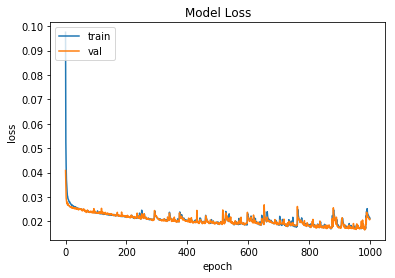

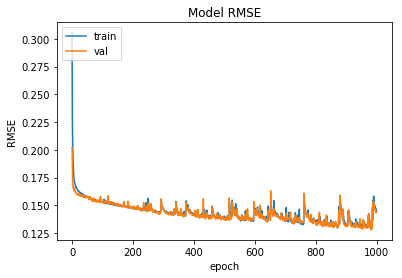

In [28]:
#3 hidden layers, two with 40 units and one with 30 units
click_SRNN_model14= click_stacked_stateful_SRNN5(units_1=40, units_2=30, lr=0.001, batch=133, alpha=0.01, dropout=0.1)
click_SRNN_model14.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model14, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts14.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [29]:
click_pred_train=click_SRNN_model14.predict(X_click_train, batch_size=133)
click_SRNN_model14.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model14.predict(X_click_val, batch_size=133)
click_SRNN_model14.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model14.predict(X_click_test, batch_size=133)
click_SRNN_model14.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  188.4232214406371
YRMSE train:  106.80476063965175
XRMSE val:  185.14684054381775
YRMSE val:  110.2425507103831
XRMSE test:  186.83075176264296
YRMSE test:  106.91384270104956


Adding 3 hidden layers to the model does not show much difference as compared to the model with 2 hidden layers.

Since, the stateless LSTM model with 3 hidden layers outperforms all the models performed above. Thus, the real time predictions are observed below using click_model_13 (Statless LSTM with 3 hidden layers).

In [43]:
#real time click predictions
n_predictions=5
testing_dataset=[]

def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1)
        if(len(testing_dataset)>22):
            testing_dataset.pop(0)
            pred_dataset2 = [i for i in testing_dataset]
            pred_dataset2= scaler.fit_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            click_pred=[]
            for i in range(n_predictions):
                input_sequence2 = np.array([j for j in pred_dataset2[i:i+timesteps]])
                input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
                temp = click_model13.predict(input_sequence2)
                click_pred.append([temp[0][0],temp[0][1]])
            click_pred = scaler.inverse_transform(click_pred)
            click_pred= click_pred.tolist()
            click_pred[:] = [[int(data[0]), int(data[1])] for data in click_pred]
            for [_x,_y] in click_pred[:]:
                cv2.circle(img,(_x,_y),2,(0,255,0),-1)#green color predictions

img = np.zeros((1600,1200,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27:
        break
cv2.destroyAllWindows()

Finally, both the best models for the trajectory (Stateless LSTM with 1 hidden layer), and the click predictions (Stateless LSTM with 3 hidden layers) are combined together and the real-ime predition for both are generated simultaneously.

In [45]:
#real time mouse trajectory (LSTM model-2) and click predictions (LSTM model-13 stacked stateless with 3 hidden layers)
timesteps=18
n_pred_traj=20
n_pred_click=5
testing_dataset=[]
def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1) #orange color
        if(len(testing_dataset)>timesteps):
            testing_dataset.pop(0)
            pred_dataset2 = [i for i in testing_dataset]
            pred_dataset2= scaler.fit_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            click_pred=[]
            for i in range(n_pred_traj):
                input_sequence2 = np.array([j for j in pred_dataset2[i:i+timesteps]])
                input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
                temp_traj = model_2.predict(input_sequence2)
                pred_dataset2.append([temp_traj[0][0],temp_traj[0][1]])
                
            for k in range(n_pred_click):
                input_sequence2 = np.array([j for j in pred_dataset2[k:k+timesteps]])
                input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
                temp_click= click_model13.predict(input_sequence2)
                click_pred.append([temp_click[0][0],temp_click[0][1]])
                
            pred_dataset2 = scaler.inverse_transform(pred_dataset2)
            click_pred = scaler.inverse_transform(click_pred)
            
            pred_dataset2= pred_dataset2.tolist()
            pred_dataset2[:] = [[int(data[0]), int(data[1])] for data in pred_dataset2]
            for [_x,_y] in pred_dataset2[timesteps:]:
                cv2.circle(img,(_x,_y),2,(255,0,0),-1) #blue color
            
            click_pred= click_pred.tolist()
            click_pred[:] = [[int(data[0]), int(data[1])] for data in click_pred]
            for [_x,_y] in click_pred[:]:
                cv2.circle(img,(_x,_y),2,(0,255,0),-1) #green color

img = np.zeros((1600,1200,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27:
        break
cv2.destroyAllWindows()